# Predicting whether a patient has diabetes or not
Diabetes, is a group of metabolic disorders in which there are high blood sugar levels over a prolonged period. Symptoms of high blood sugar include frequent urination, increased thirst, and increased hunger. If left untreated, diabetes can cause many complications. Acute complications can include diabetic ketoacidosis, hyperosmolar hyperglycemic state, or death. Serious long-term complications include cardiovascular disease, stroke, chronic kidney disease, foot ulcers, and damage to the eyes.

## 1. Problem Defination:
We will try to build a machine learning model to accurately predict whether or not the patients in the dataset have diabetes or not?

## 2. Data:
The data is downloaded from Kaggle: https://www.kaggle.com/code/ahmetcankaraolan/diabetes-prediction-using-machine-learning/data

## 3. Evaluation
The evaluation metric for the above problem statement is accuracy.

## 4. Features
* Pregnancies: Number of times pregnant
* Glucose: Plasma glucose concentration a 2 hours in an oral glucose tolerance test
* BloodPressure: Diastolic blood pressure (mm Hg)
* SkinThickness: Triceps skin fold thickness (mm)
* Insulin: 2-Hour serum insulin (mu U/ml)
* BMI: Body mass index (weight in kg/(height in m)^2)
* DiabetesPedigreeFunction: Diabetes pedigree function
* Age: Age (years)
* Outcome: Class variable (0 or 1)

## 1. Exploratory Data Analyses

In [38]:
# Import the libraries
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import sklearn
import seaborn as sns

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

In [2]:
df = pd.read_csv("data/diabetes.csv")
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [5]:
df["Outcome"].value_counts()

0    500
1    268
Name: Outcome, dtype: int64

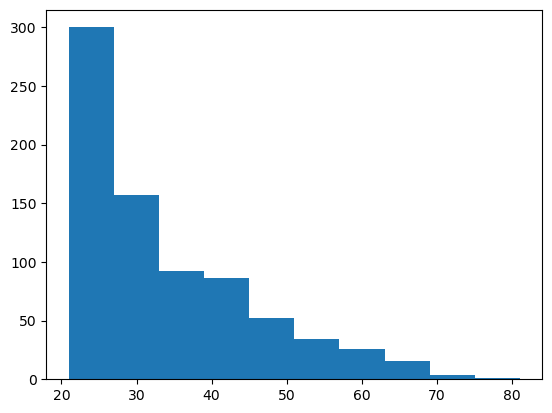

In [6]:
df.Age.hist(grid=False);

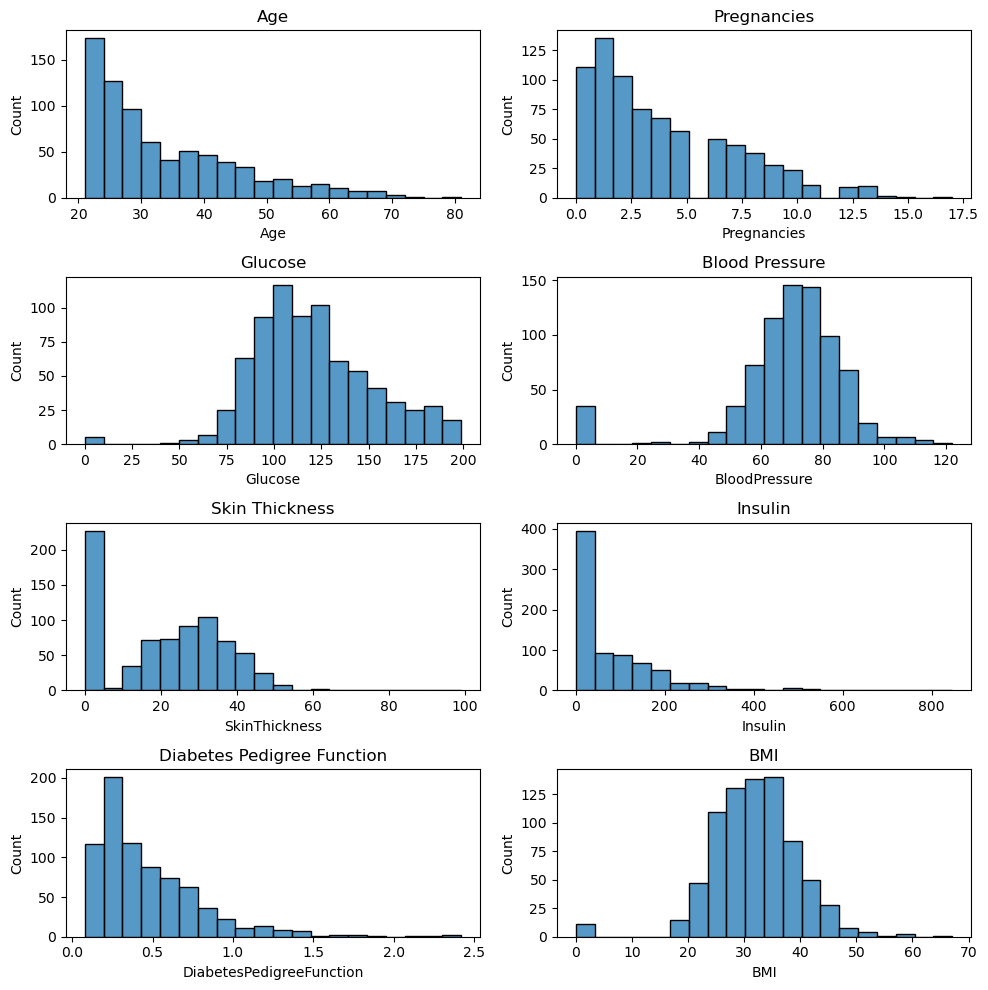

In [7]:
fig, ax = plt.subplots(4, 2, figsize=(10, 10))
sns.histplot(df.Age, bins = 20, ax=ax[0,0]).set(title="Age") 
sns.histplot(df.Pregnancies, bins = 20, ax=ax[0,1]).set(title="Pregnancies") 
sns.histplot(df.Glucose, bins = 20, ax=ax[1,0]).set(title="Glucose") 
sns.histplot(df.BloodPressure, bins = 20, ax=ax[1,1]).set(title="Blood Pressure")  
sns.histplot(df.SkinThickness, bins = 20, ax=ax[2,0]).set(title="Skin Thickness") 
sns.histplot(df.Insulin, bins = 20, ax=ax[2,1]).set(title="Insulin") 
sns.histplot(df.DiabetesPedigreeFunction, bins = 20, ax=ax[3,0]).set(title="Diabetes Pedigree Function")  
sns.histplot(df.BMI, bins = 20, ax=ax[3,1]).set(title="BMI")
fig.tight_layout();

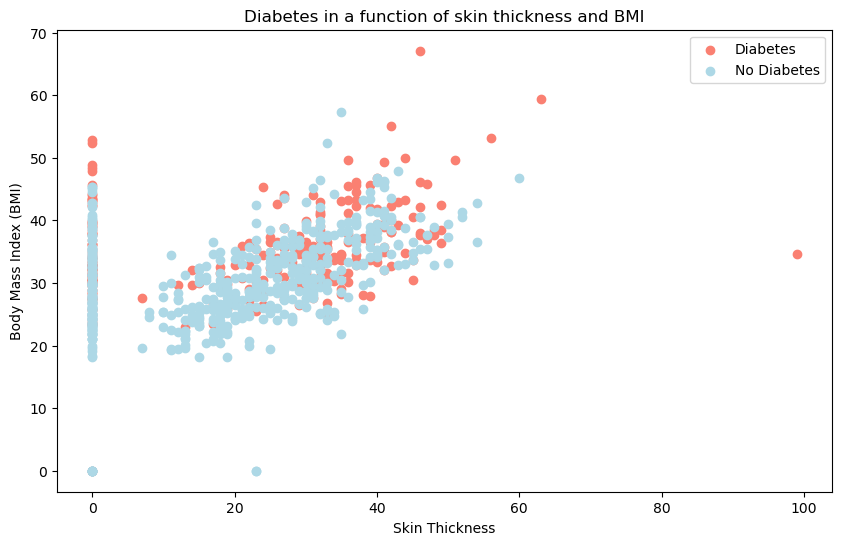

In [8]:
# Diabetes in a function of skin thickness and BMI
fig, ax = plt.subplots(figsize=(10, 6))

# Scatter with positive examples
plt.scatter(df.SkinThickness[df["Outcome"] == 1],
            df.BMI[df["Outcome"] == 1],
            c = "salmon"
           )

# Scatter with negative examples
plt.scatter(df.SkinThickness[df["Outcome"] == 0],
            df.BMI[df["Outcome"] == 0],
            c = "lightblue"
           )

# Add extra info
plt.title("Diabetes in a function of skin thickness and BMI")
plt.xlabel("Skin Thickness")
plt.ylabel("Body Mass Index (BMI)")
plt.legend(["Diabetes", "No Diabetes"]);

In [9]:
df.groupby("Outcome").agg({"Pregnancies": "mean"})

,Pregnancies
Outcome,
0,3.298000
1,4.865672


In [10]:
df.groupby("Outcome").agg({"Glucose" : "mean"})

,Glucose
Outcome,
0,109.980000
1,141.257463


In [11]:
df.groupby("Outcome").agg({"BloodPressure" : "mean"})

,BloodPressure
Outcome,
0,68.184000
1,70.824627


In [12]:
df.groupby("Outcome").agg({"SkinThickness" : "mean"})

,SkinThickness
Outcome,
0,19.664000
1,22.164179


In [13]:
df.groupby("Outcome").agg({"Insulin" : "mean"})

,Insulin
Outcome,
0,68.792000
1,100.335821


In [14]:
df.groupby("Outcome").agg({"BMI" : "mean"})

,BMI
Outcome,
0,30.304200
1,35.142537


In [15]:
df.groupby("Outcome").agg({"DiabetesPedigreeFunction" : "mean"})

,DiabetesPedigreeFunction
Outcome,
0,0.429734
1,0.550500


In [16]:
df.groupby("Outcome").agg({"Age" : "mean"})

,Age
Outcome,
0,31.190000
1,37.067164


In [17]:
# Check the correlation between various types of variables
# If correlation is > 0, positive correlation exists, i.e. when one variable increases the other also increases
# If correlation is < 0, negative correlation exists, i.e. when one variable increases the other decreases
df.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


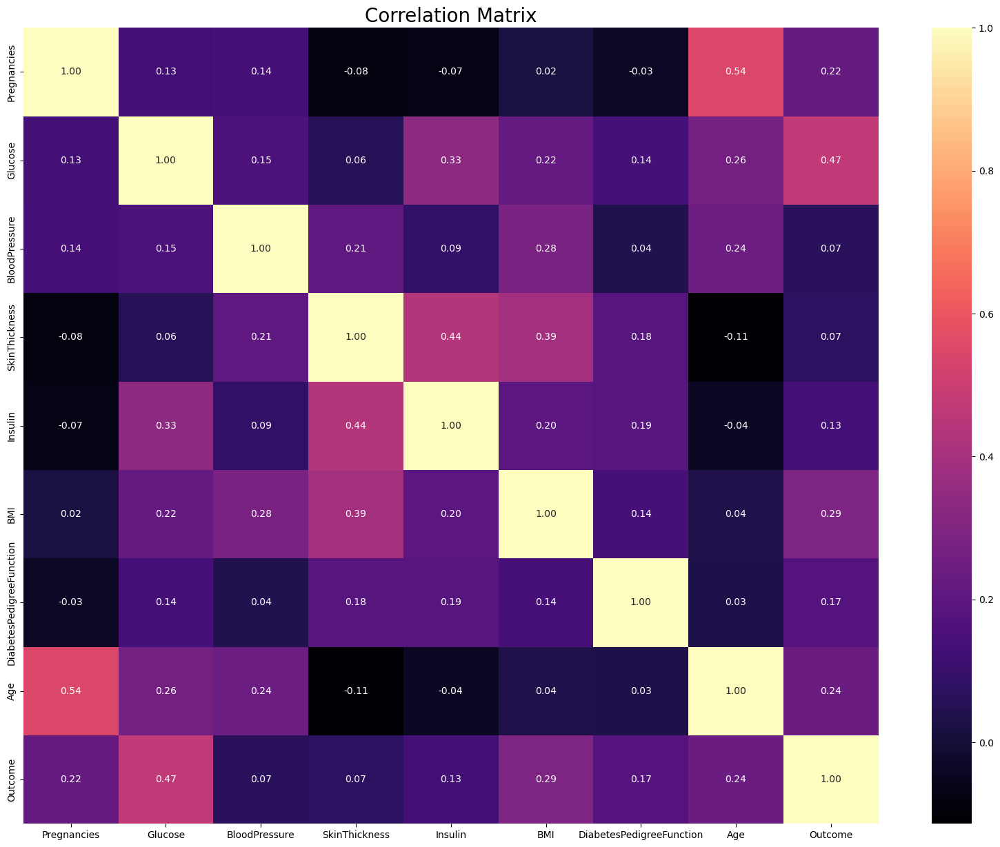

In [18]:
# Plot the correlation matrix graph
fig, ax = plt.subplots(figsize=(20, 15))
sns.heatmap(df.corr(), annot=True, fmt=".2f", ax=ax, cmap="magma")
ax.set_title("Correlation Matrix", fontsize=20)
plt.show();

## 2. Data Preparation

In [19]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


Some values in Glucose, BloodPressure, SkinThickness, Insulin and BMI have values as '0', these make no sense since these values needs to be greater than zero.
In order to solve this we will replace these '0' with NaN

In [3]:
df[["Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI"]] = df[["Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI"]].replace(0, np.NaN)

In [4]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1


In [4]:
df.isna().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [4]:
# Function to fill NaN values based on median of the 'Outcome' of that column
def fill_nan(column):
    df_temp[column].fillna(df_temp.groupby(["Outcome"])[column].transform('median'), inplace=True)

In [5]:
df_temp = df
df_temp.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1


In [6]:
# Fill the NaN values in temp dataframe
columns = df_temp.columns
columns = columns.drop("Outcome")

for column in columns:
    fill_nan(column)

In [7]:
df_temp.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,169.5,33.6,0.627,50,1
1,1,85.0,66.0,29.0,102.5,26.6,0.351,31,0
2,8,183.0,64.0,32.0,169.5,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1


In [8]:
df_temp.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

### Outlier Observation Analysis

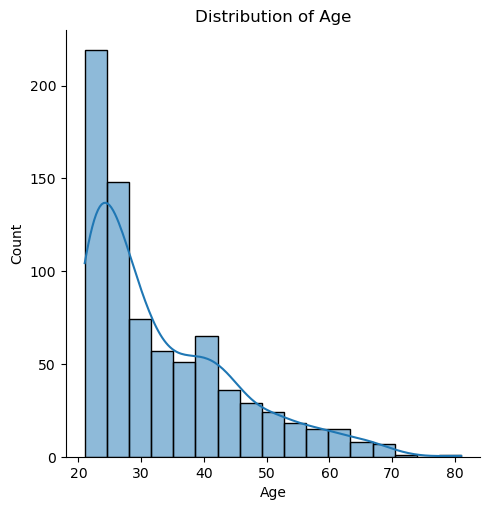

In [42]:
# Visualize normal distribution curve for all data
sns.displot(data=df_temp.Age, kde=True).set(title="Distribution of Age", xlabel="Age");

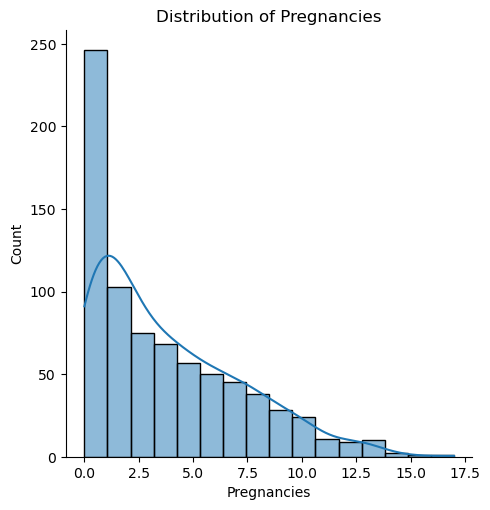

In [43]:
sns.displot(data=df_temp.Pregnancies, kde=True).set(title="Distribution of Pregnancies", xlabel="Pregnancies");

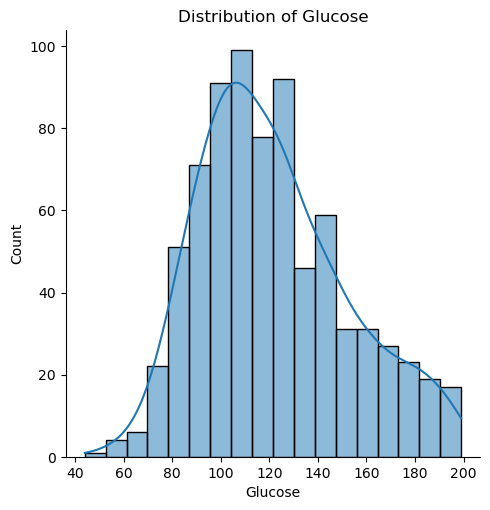

In [44]:
sns.displot(data=df_temp.Glucose, kde=True).set(title="Distribution of Glucose", xlabel="Glucose");

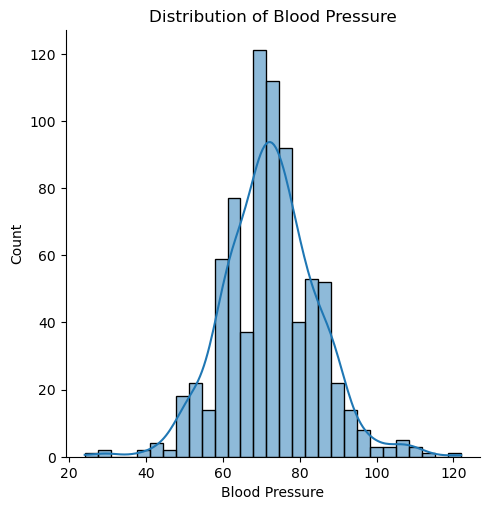

In [45]:
sns.displot(data=df_temp.BloodPressure, kde=True).set(title="Distribution of Blood Pressure", xlabel="Blood Pressure");

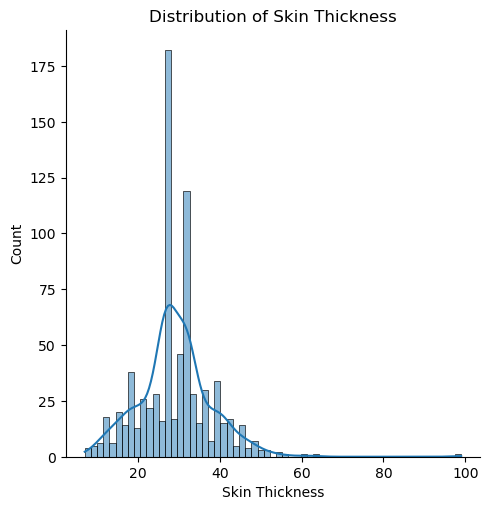

In [49]:
sns.displot(data=df_temp.SkinThickness, kde=True).set(title="Distribution of Skin Thickness", xlabel="Skin Thickness");

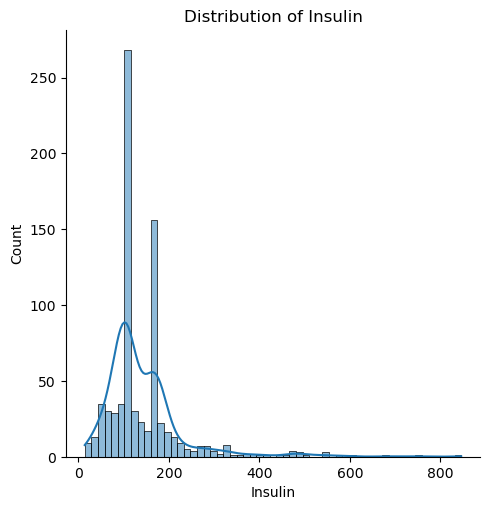

In [46]:
sns.displot(data=df_temp.Insulin, kde=True).set(title="Distribution of Insulin", xlabel="Insulin");

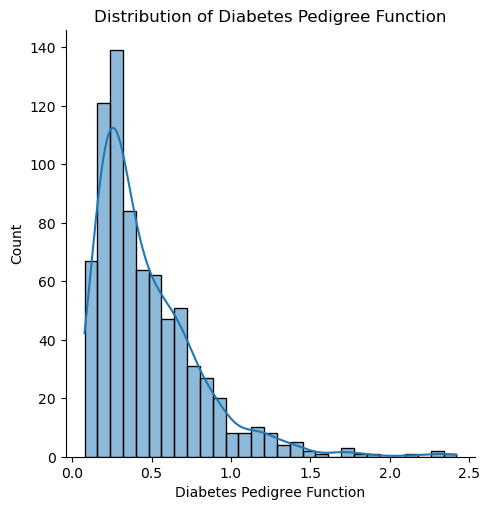

In [47]:
sns.displot(data=df_temp.DiabetesPedigreeFunction, kde=True).set(title="Distribution of Diabetes Pedigree Function", xlabel="Diabetes Pedigree Function");

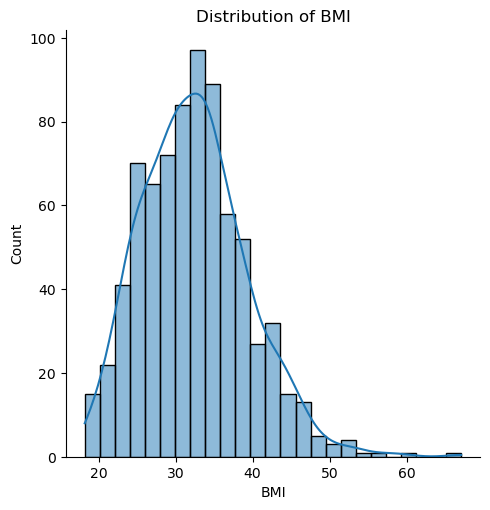

In [48]:
sns.displot(data=df_temp.BMI, kde=True).set(title="Distribution of BMI", xlabel="BMI");

In [9]:
# We find out the outliers between 25% and 75% quarters
for feature in df:
    
    Q1 = df_temp[feature].quantile(0.25)
    Q3 = df_temp[feature].quantile(0.75)
    IQR = Q3-Q1
    lower = Q1- 1.5*IQR
    upper = Q3 + 1.5*IQR
    
    if df[(df_temp[feature] > upper)].any(axis=None):
        print(feature,"yes")
    else:
        print(feature, "no")

Pregnancies yes
Glucose no
BloodPressure yes
SkinThickness yes
Insulin yes
BMI yes
DiabetesPedigreeFunction yes
Age yes
Outcome no


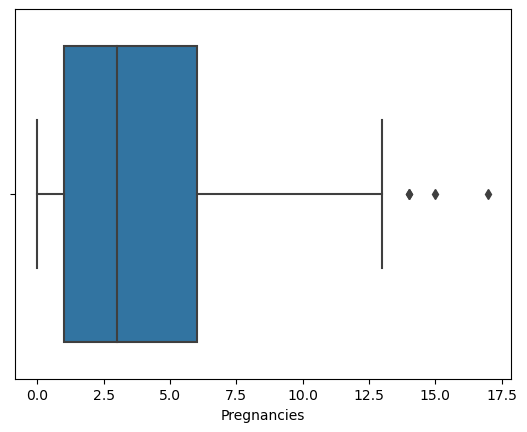

In [10]:
# Visualize pregnancies variable with boxplot
sns.boxplot(x = df_temp["Pregnancies"]);

In [11]:
# Supress contradictory values for pregnancies
Q1 = df_temp.Pregnancies.quantile(0.25)
Q3 = df_temp.Pregnancies.quantile(0.75)
IQR = Q3 - Q1
upper = Q3 + 1.5*IQR
lower = Q1 - 1.5*IQR
df_temp.loc[df_temp["Pregnancies"] > upper, "Pregnancies"] = df_temp["Pregnancies"].median()
df_temp.loc[df_temp["Pregnancies"] < lower, "Pregnancies"] = df_temp["Pregnancies"].median()

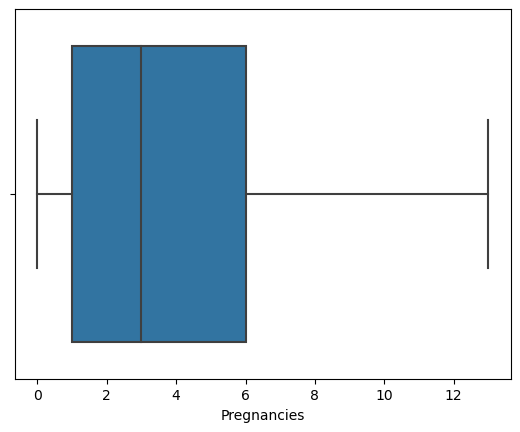

In [12]:
sns.boxplot(x = df_temp["Pregnancies"]);

In [13]:
# Create a function to replace outliers with extreme values
def replace_outlier(column):
    Q1 = df_temp[column].quantile(0.25)
    Q3 = df_temp[column].quantile(0.75)
    IQR = Q3 - Q1
    upper = Q3 + 1.5*IQR
    lower = Q1 - 1.5*IQR
    df_temp.loc[df_temp[column] > upper, column] = upper
    df_temp.loc[df_temp[column] < lower, column] = lower

In [14]:
# Replace outliers for each value
for column in df_temp:
    replace_outlier(column)

In [15]:
# Check if outliers exist
for feature in df_temp:
    
    Q1 = df_temp[feature].quantile(0.25)
    Q3 = df_temp[feature].quantile(0.75)
    IQR = Q3-Q1
    lower = Q1 - 1.5*IQR
    upper = Q3 + 1.5*IQR
    
    if df_temp[(df_temp[feature] > upper)].any(axis=None) or df_temp[(df_temp[feature] < lower)].any(axis=None):
        print(feature,"yes")
    else:
        print(feature, "no")

Pregnancies no
Glucose no
BloodPressure no
SkinThickness no
Insulin no
BMI no
DiabetesPedigreeFunction no
Age no
Outcome no


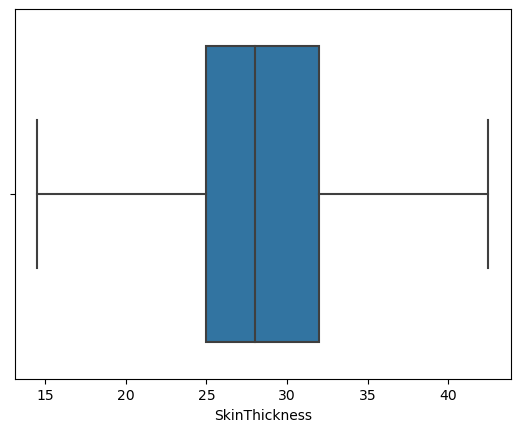

In [16]:
# Visualize boxplot for SkinThickness
sns.boxplot(x = df_temp["SkinThickness"]);

In [17]:
# Examine the shape of the dataframe after outlier treatment
df_temp.shape

(768, 9)

## 3. Feature Engineering

BMI can be used to define the weight range of a person
https://www.cdc.gov/obesity/basics/adult-defining.html

* If your BMI is less than 18.5, it falls within the underweight range.
* If your BMI is 18.5 to <25, it falls within the healthy weight range.
* If your BMI is 25.0 to <30, it falls within the overweight range.
* If your BMI is 30.0 or higher, it falls within the obesity range.

Obesity is frequently subdivided into categories:

* Class 1: BMI of 30 to < 35
* Class 2: BMI of 35 to < 40
* Class 3: BMI of 40 or higher. Class 3 obesity is sometimes categorized as “severe” obesity.

In [18]:
# Create a new column 'NewBMI' to get predict weight range of person
BMI_interpretation = pd.Series(["Underweight", "Healthy", "Overweight", "Obesity 1", "Obesity 2", "Obesity 3"], dtype="category")
df_temp["NewBMI"] = BMI_interpretation
df_temp.loc[df_temp["BMI"] < 18.5, "NewBMI"] = BMI_interpretation[0]
df_temp.loc[(df_temp["BMI"] > 18.5) & (df_temp["BMI"] <= 24.9), "NewBMI"] = BMI_interpretation[1]
df_temp.loc[(df_temp["BMI"] > 24.9) & (df_temp["BMI"] <= 29.9), "NewBMI"] = BMI_interpretation[2]
df_temp.loc[(df_temp["BMI"] > 29.9) & (df_temp["BMI"] <= 34.9), "NewBMI"] = BMI_interpretation[3]
df_temp.loc[(df_temp["BMI"] > 34.9) & (df_temp["BMI"] <= 39.9), "NewBMI"] = BMI_interpretation[4]
df_temp.loc[(df_temp["BMI"] > 39.9), "NewBMI"] = BMI_interpretation[5]

In [17]:
df_temp.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI
0,6.0,148.0,72.0,35.0,169.5,33.6,0.627,50.0,1.0,Obesity 1
1,1.0,85.0,66.0,29.0,102.5,26.6,0.351,31.0,0.0,Overweight
2,8.0,183.0,64.0,32.0,169.5,23.3,0.672,32.0,1.0,Healthy
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0,Overweight
4,0.0,137.0,40.0,35.0,168.0,43.1,1.200,33.0,1.0,Obesity 3


We now determine if the insulin level is normal or abnormal:
* Between 16 and 166, Normal
* Else abnormal

In [19]:
# Function to determine the insulin level
def insulin_level(row):
    if row["Insulin"] >= 16 and row["Insulin"] <= 166:
        return "Normal"
    else:
        return "Abnormal"

In [20]:
# Add new column 'InsulinLevel'
df_temp = df_temp.assign(NewInsulinScore=df_temp.apply(insulin_level, axis=1))

df_temp.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI,NewInsulinScore
0,6.0,148.0,72.0,35.0,169.5,33.6,0.627,50.0,1.0,Obesity 1,Abnormal
1,1.0,85.0,66.0,29.0,102.5,26.6,0.351,31.0,0.0,Overweight,Normal
2,8.0,183.0,64.0,32.0,169.5,23.3,0.672,32.0,1.0,Healthy,Abnormal
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0,Overweight,Normal
4,0.0,137.0,40.0,35.0,168.0,43.1,1.200,33.0,1.0,Obesity 3,Abnormal


Glucose level is interpreted as:
* \<= 70 means low
* \> 70 and <= 99 means normal
* \> 99 and <= 126 means overweight
* \> 126 means high

In [21]:
# Create new column to interpret glucose levels
NewGlucose = pd.Series(["Low", "Normal", "Overweight", "Secret", "High"], dtype = "category")
df_temp["NewGlucose"] = NewGlucose
df_temp.loc[df_temp["Glucose"] <= 70, "NewGlucose"] = NewGlucose[0]
df_temp.loc[(df_temp["Glucose"] > 70) & (df_temp["Glucose"] <= 99), "NewGlucose"] = NewGlucose[1]
df_temp.loc[(df_temp["Glucose"] > 99) & (df_temp["Glucose"] <= 126), "NewGlucose"] = NewGlucose[2]
df_temp.loc[df_temp["Glucose"] > 126 ,"NewGlucose"] = NewGlucose[3]

# View the updated dataframe
df_temp.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI,NewInsulinScore,NewGlucose
0,6.0,148.0,72.0,35.0,169.5,33.6,0.627,50.0,1.0,Obesity 1,Abnormal,Secret
1,1.0,85.0,66.0,29.0,102.5,26.6,0.351,31.0,0.0,Overweight,Normal,Normal
2,8.0,183.0,64.0,32.0,169.5,23.3,0.672,32.0,1.0,Healthy,Abnormal,Secret
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0,Overweight,Normal,Normal
4,0.0,137.0,40.0,35.0,168.0,43.1,1.200,33.0,1.0,Obesity 3,Abnormal,Secret


## 4. One Hot Encoding

In [22]:
# First save the temp dataframe for future reference
df_temp.to_csv("data/diabetes-updated.csv")

In [23]:
# Assign temp dataframe to original dataframe
df = df_temp
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI,NewInsulinScore,NewGlucose
0,6.0,148.0,72.0,35.0,169.5,33.6,0.627,50.0,1.0,Obesity 1,Abnormal,Secret
1,1.0,85.0,66.0,29.0,102.5,26.6,0.351,31.0,0.0,Overweight,Normal,Normal
2,8.0,183.0,64.0,32.0,169.5,23.3,0.672,32.0,1.0,Healthy,Abnormal,Secret
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0,Overweight,Normal,Normal
4,0.0,137.0,40.0,35.0,168.0,43.1,1.200,33.0,1.0,Obesity 3,Abnormal,Secret


In [24]:
# One hot encode categorical features in the dataframe taking care to protect it from dummy variable trap
df = pd.get_dummies(df, columns=["NewBMI", "NewInsulinScore", "NewGlucose"], drop_first=True)
# View the updated dataframe
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI_Obesity 1,NewBMI_Obesity 2,NewBMI_Obesity 3,NewBMI_Overweight,NewBMI_Underweight,NewInsulinScore_Normal,NewGlucose_Low,NewGlucose_Normal,NewGlucose_Overweight,NewGlucose_Secret
0,6.0,148.0,72.0,35.0,169.5,33.6,0.627,50.0,1.0,1,0,0,0,0,0,0,0,0,1
1,1.0,85.0,66.0,29.0,102.5,26.6,0.351,31.0,0.0,0,0,0,1,0,1,0,1,0,0
2,8.0,183.0,64.0,32.0,169.5,23.3,0.672,32.0,1.0,0,0,0,0,0,0,0,0,0,1
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0,0,0,0,1,0,1,0,1,0,0
4,0.0,137.0,40.0,35.0,168.0,43.1,1.200,33.0,1.0,0,0,1,0,0,0,0,0,0,1


In [25]:
categorical_df = df[['NewBMI_Obesity 1','NewBMI_Obesity 2', 'NewBMI_Obesity 3', 'NewBMI_Overweight','NewBMI_Underweight',
                     'NewInsulinScore_Normal','NewGlucose_Low','NewGlucose_Normal', 'NewGlucose_Overweight', 'NewGlucose_Secret']]

In [26]:
categorical_df.head()

,NewBMI_Obesity 1,NewBMI_Obesity 2,NewBMI_Obesity 3,NewBMI_Overweight,NewBMI_Underweight,NewInsulinScore_Normal,NewGlucose_Low,NewGlucose_Normal,NewGlucose_Overweight,NewGlucose_Secret
0,1,0,0,0,0,0,0,0,0,1
1,0,0,0,1,0,1,0,1,0,0
2,0,0,0,0,0,0,0,0,0,1
3,0,0,0,1,0,1,0,1,0,0
4,0,0,1,0,0,0,0,0,0,1


In [27]:
df.shape

(768, 19)

In [28]:
# Divide dataset into X and y
X = df.drop(["Outcome",'NewBMI_Obesity 1','NewBMI_Obesity 2', 'NewBMI_Obesity 3', 'NewBMI_Overweight','NewBMI_Underweight',
             'NewInsulinScore_Normal','NewGlucose_Low','NewGlucose_Normal', 'NewGlucose_Overweight', 
             'NewGlucose_Secret'], axis=1)
y = df["Outcome"]
columns = X.columns
index = X.index

In [29]:
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6.0,148.0,72.0,35.0,169.5,33.6,0.627,50.0
1,1.0,85.0,66.0,29.0,102.5,26.6,0.351,31.0
2,8.0,183.0,64.0,32.0,169.5,23.3,0.672,32.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0
4,0.0,137.0,40.0,35.0,168.0,43.1,1.200,33.0


In [30]:
y.head()

0    1.0
1    0.0
2    1.0
3    0.0
4    1.0
Name: Outcome, dtype: float64

In [31]:
# The variables in the data set are an effective factor in increasing the performance of the models by standardization.  
# There are multiple standardization methods. These are methods such as" Normalize"," MinMax"," Robust" and "Scale".
from sklearn.preprocessing import RobustScaler
transformer = RobustScaler().fit(X)
X = transformer.transform(X)
X = pd.DataFrame(X, columns=columns, index = index)

In [32]:
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.6,0.765432,0.000,1.000000,1.000000,0.170330,0.665359,1.235294
1,-0.4,-0.790123,-0.375,0.142857,0.000000,-0.598901,-0.056209,0.117647
2,1.0,1.629630,-0.500,0.571429,1.000000,-0.961538,0.783007,0.176471
3,-0.4,-0.691358,-0.375,-0.714286,-0.126866,-0.434066,-0.537255,-0.470588
4,-0.6,0.493827,-2.000,1.000000,0.977612,1.214286,2.163399,0.235294


In [33]:
# Add the categorical features of the data to X
X = pd.concat([X, categorical_df], axis=1)
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,NewBMI_Obesity 1,NewBMI_Obesity 2,NewBMI_Obesity 3,NewBMI_Overweight,NewBMI_Underweight,NewInsulinScore_Normal,NewGlucose_Low,NewGlucose_Normal,NewGlucose_Overweight,NewGlucose_Secret
0,0.6,0.765432,0.000,1.000000,1.000000,0.170330,0.665359,1.235294,1,0,0,0,0,0,0,0,0,1
1,-0.4,-0.790123,-0.375,0.142857,0.000000,-0.598901,-0.056209,0.117647,0,0,0,1,0,1,0,1,0,0
2,1.0,1.629630,-0.500,0.571429,1.000000,-0.961538,0.783007,0.176471,0,0,0,0,0,0,0,0,0,1
3,-0.4,-0.691358,-0.375,-0.714286,-0.126866,-0.434066,-0.537255,-0.470588,0,0,0,1,0,1,0,1,0,0
4,-0.6,0.493827,-2.000,1.000000,0.977612,1.214286,2.163399,0.235294,0,0,1,0,0,0,0,0,0,1


In [34]:
y.head()

0    1.0
1    0.0
2    1.0
3    0.0
4    1.0
Name: Outcome, dtype: float64

## 5. Modelling

In [34]:
# Declare models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

np.random.seed(42)

models = {"LogisticRegression" : LogisticRegression(),
          "KNeighborsClassifier" : KNeighborsClassifier(),
          "DecisionTreeClassifier" : DecisionTreeClassifier(),
          "SVC" : SVC(gamma='auto'),
          "GradientBoostingClassifier" : GradientBoostingClassifier(),
          "XGBClassifier" : XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'),
          "LGBMClassifier" : LGBMClassifier(),
          "CatBoostClassifier" : CatBoostClassifier()
         }

# Result of each model with its name will be stored here
results = []
model_name = []
messages = []

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [35]:
# Store results and names of each model in the corresponding variables
from sklearn.model_selection import KFold, cross_val_score

for name, model in models.items():
    kfold = KFold(n_splits=10, random_state=42, shuffle=True)
    score = cross_val_score(model, X, y, cv=kfold, scoring="accuracy")
    results.append(score)
    model_name.append(name)
    msg = "%s: %f (%f)" % (name, score.mean(), score.std())
    messages.append(msg)

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is de

Learning rate set to 0.008798
0:	learn: 0.6832521	total: 188ms	remaining: 3m 7s
1:	learn: 0.6745577	total: 213ms	remaining: 1m 46s
2:	learn: 0.6646794	total: 235ms	remaining: 1m 18s
3:	learn: 0.6570865	total: 256ms	remaining: 1m 3s
4:	learn: 0.6492848	total: 274ms	remaining: 54.5s
5:	learn: 0.6439010	total: 285ms	remaining: 47.2s
6:	learn: 0.6371394	total: 300ms	remaining: 42.6s
7:	learn: 0.6297201	total: 317ms	remaining: 39.3s
8:	learn: 0.6216362	total: 323ms	remaining: 35.6s
9:	learn: 0.6137045	total: 328ms	remaining: 32.5s
10:	learn: 0.6075814	total: 331ms	remaining: 29.8s
11:	learn: 0.6014714	total: 335ms	remaining: 27.5s
12:	learn: 0.5958806	total: 339ms	remaining: 25.7s
13:	learn: 0.5894651	total: 343ms	remaining: 24.1s
14:	learn: 0.5828524	total: 346ms	remaining: 22.7s
15:	learn: 0.5776843	total: 349ms	remaining: 21.4s
16:	learn: 0.5702077	total: 351ms	remaining: 20.3s
17:	learn: 0.5637347	total: 354ms	remaining: 19.3s
18:	learn: 0.5580281	total: 357ms	remaining: 18.4s
19:	learn

163:	learn: 0.2444101	total: 904ms	remaining: 4.61s
164:	learn: 0.2437979	total: 908ms	remaining: 4.59s
165:	learn: 0.2431267	total: 911ms	remaining: 4.58s
166:	learn: 0.2424307	total: 914ms	remaining: 4.56s
167:	learn: 0.2417599	total: 917ms	remaining: 4.54s
168:	learn: 0.2412489	total: 920ms	remaining: 4.52s
169:	learn: 0.2410974	total: 921ms	remaining: 4.5s
170:	learn: 0.2405536	total: 924ms	remaining: 4.48s
171:	learn: 0.2399953	total: 927ms	remaining: 4.46s
172:	learn: 0.2392465	total: 930ms	remaining: 4.45s
173:	learn: 0.2385690	total: 934ms	remaining: 4.43s
174:	learn: 0.2380166	total: 939ms	remaining: 4.43s
175:	learn: 0.2373617	total: 945ms	remaining: 4.42s
176:	learn: 0.2368442	total: 950ms	remaining: 4.42s
177:	learn: 0.2363894	total: 954ms	remaining: 4.41s
178:	learn: 0.2357285	total: 959ms	remaining: 4.4s
179:	learn: 0.2350788	total: 963ms	remaining: 4.39s
180:	learn: 0.2343582	total: 968ms	remaining: 4.38s
181:	learn: 0.2336028	total: 972ms	remaining: 4.37s
182:	learn: 0.

359:	learn: 0.1679401	total: 1.79s	remaining: 3.19s
360:	learn: 0.1677199	total: 1.8s	remaining: 3.18s
361:	learn: 0.1674565	total: 1.8s	remaining: 3.18s
362:	learn: 0.1672023	total: 1.81s	remaining: 3.17s
363:	learn: 0.1670409	total: 1.81s	remaining: 3.17s
364:	learn: 0.1667091	total: 1.82s	remaining: 3.16s
365:	learn: 0.1664333	total: 1.82s	remaining: 3.16s
366:	learn: 0.1661764	total: 1.83s	remaining: 3.15s
367:	learn: 0.1659943	total: 1.83s	remaining: 3.15s
368:	learn: 0.1657435	total: 1.84s	remaining: 3.14s
369:	learn: 0.1656052	total: 1.84s	remaining: 3.13s
370:	learn: 0.1653385	total: 1.85s	remaining: 3.13s
371:	learn: 0.1651104	total: 1.85s	remaining: 3.13s
372:	learn: 0.1649061	total: 1.86s	remaining: 3.12s
373:	learn: 0.1647625	total: 1.86s	remaining: 3.12s
374:	learn: 0.1645677	total: 1.87s	remaining: 3.11s
375:	learn: 0.1643534	total: 1.87s	remaining: 3.1s
376:	learn: 0.1639391	total: 1.88s	remaining: 3.1s
377:	learn: 0.1636846	total: 1.88s	remaining: 3.09s
378:	learn: 0.16

525:	learn: 0.1343298	total: 2.52s	remaining: 2.27s
526:	learn: 0.1341775	total: 2.53s	remaining: 2.27s
527:	learn: 0.1339749	total: 2.53s	remaining: 2.27s
528:	learn: 0.1337785	total: 2.54s	remaining: 2.26s
529:	learn: 0.1336579	total: 2.54s	remaining: 2.25s
530:	learn: 0.1335113	total: 2.54s	remaining: 2.25s
531:	learn: 0.1333271	total: 2.55s	remaining: 2.24s
532:	learn: 0.1330948	total: 2.55s	remaining: 2.24s
533:	learn: 0.1329633	total: 2.56s	remaining: 2.23s
534:	learn: 0.1327828	total: 2.56s	remaining: 2.23s
535:	learn: 0.1326355	total: 2.57s	remaining: 2.22s
536:	learn: 0.1325495	total: 2.57s	remaining: 2.22s
537:	learn: 0.1324102	total: 2.58s	remaining: 2.21s
538:	learn: 0.1322057	total: 2.58s	remaining: 2.21s
539:	learn: 0.1319800	total: 2.58s	remaining: 2.2s
540:	learn: 0.1318429	total: 2.59s	remaining: 2.2s
541:	learn: 0.1316291	total: 2.59s	remaining: 2.19s
542:	learn: 0.1315188	total: 2.6s	remaining: 2.19s
543:	learn: 0.1313771	total: 2.6s	remaining: 2.18s
544:	learn: 0.13

717:	learn: 0.1040195	total: 3.42s	remaining: 1.34s
718:	learn: 0.1039059	total: 3.42s	remaining: 1.34s
719:	learn: 0.1037076	total: 3.43s	remaining: 1.33s
720:	learn: 0.1035958	total: 3.43s	remaining: 1.33s
721:	learn: 0.1035463	total: 3.43s	remaining: 1.32s
722:	learn: 0.1034404	total: 3.44s	remaining: 1.32s
723:	learn: 0.1033765	total: 3.44s	remaining: 1.31s
724:	learn: 0.1032634	total: 3.44s	remaining: 1.3s
725:	learn: 0.1031156	total: 3.45s	remaining: 1.3s
726:	learn: 0.1029432	total: 3.45s	remaining: 1.29s
727:	learn: 0.1028436	total: 3.45s	remaining: 1.29s
728:	learn: 0.1026859	total: 3.46s	remaining: 1.28s
729:	learn: 0.1025322	total: 3.46s	remaining: 1.28s
730:	learn: 0.1023826	total: 3.47s	remaining: 1.27s
731:	learn: 0.1022978	total: 3.47s	remaining: 1.27s
732:	learn: 0.1022354	total: 3.47s	remaining: 1.26s
733:	learn: 0.1020678	total: 3.48s	remaining: 1.26s
734:	learn: 0.1019784	total: 3.48s	remaining: 1.25s
735:	learn: 0.1018894	total: 3.49s	remaining: 1.25s
736:	learn: 0.

889:	learn: 0.0821199	total: 4.28s	remaining: 529ms
890:	learn: 0.0819557	total: 4.28s	remaining: 524ms
891:	learn: 0.0819092	total: 4.29s	remaining: 520ms
892:	learn: 0.0817747	total: 4.29s	remaining: 515ms
893:	learn: 0.0817144	total: 4.3s	remaining: 509ms
894:	learn: 0.0816194	total: 4.3s	remaining: 504ms
895:	learn: 0.0815443	total: 4.3s	remaining: 499ms
896:	learn: 0.0814551	total: 4.31s	remaining: 495ms
897:	learn: 0.0813508	total: 4.31s	remaining: 490ms
898:	learn: 0.0812742	total: 4.31s	remaining: 485ms
899:	learn: 0.0811329	total: 4.32s	remaining: 480ms
900:	learn: 0.0809972	total: 4.32s	remaining: 475ms
901:	learn: 0.0808616	total: 4.33s	remaining: 470ms
902:	learn: 0.0807813	total: 4.34s	remaining: 466ms
903:	learn: 0.0807248	total: 4.34s	remaining: 461ms
904:	learn: 0.0806100	total: 4.34s	remaining: 456ms
905:	learn: 0.0805682	total: 4.35s	remaining: 452ms
906:	learn: 0.0804255	total: 4.36s	remaining: 447ms
907:	learn: 0.0803090	total: 4.36s	remaining: 442ms
908:	learn: 0.0

69:	learn: 0.3671593	total: 360ms	remaining: 4.78s
70:	learn: 0.3646690	total: 365ms	remaining: 4.78s
71:	learn: 0.3628213	total: 370ms	remaining: 4.77s
72:	learn: 0.3609075	total: 375ms	remaining: 4.76s
73:	learn: 0.3584971	total: 381ms	remaining: 4.76s
74:	learn: 0.3567308	total: 386ms	remaining: 4.76s
75:	learn: 0.3553389	total: 389ms	remaining: 4.73s
76:	learn: 0.3529603	total: 393ms	remaining: 4.71s
77:	learn: 0.3506745	total: 397ms	remaining: 4.69s
78:	learn: 0.3483571	total: 400ms	remaining: 4.66s
79:	learn: 0.3464379	total: 403ms	remaining: 4.63s
80:	learn: 0.3445407	total: 408ms	remaining: 4.63s
81:	learn: 0.3427104	total: 411ms	remaining: 4.6s
82:	learn: 0.3408969	total: 415ms	remaining: 4.58s
83:	learn: 0.3386651	total: 419ms	remaining: 4.57s
84:	learn: 0.3367942	total: 423ms	remaining: 4.56s
85:	learn: 0.3346883	total: 428ms	remaining: 4.55s
86:	learn: 0.3332423	total: 432ms	remaining: 4.53s
87:	learn: 0.3311374	total: 436ms	remaining: 4.52s
88:	learn: 0.3292960	total: 440m

260:	learn: 0.2022558	total: 1.27s	remaining: 3.59s
261:	learn: 0.2017586	total: 1.27s	remaining: 3.59s
262:	learn: 0.2014059	total: 1.28s	remaining: 3.59s
263:	learn: 0.2009738	total: 1.29s	remaining: 3.59s
264:	learn: 0.2007169	total: 1.29s	remaining: 3.59s
265:	learn: 0.2003181	total: 1.3s	remaining: 3.59s
266:	learn: 0.2000669	total: 1.3s	remaining: 3.58s
267:	learn: 0.1998569	total: 1.31s	remaining: 3.58s
268:	learn: 0.1994145	total: 1.32s	remaining: 3.58s
269:	learn: 0.1989081	total: 1.32s	remaining: 3.57s
270:	learn: 0.1986049	total: 1.32s	remaining: 3.56s
271:	learn: 0.1982370	total: 1.33s	remaining: 3.55s
272:	learn: 0.1979951	total: 1.33s	remaining: 3.55s
273:	learn: 0.1977560	total: 1.33s	remaining: 3.54s
274:	learn: 0.1972051	total: 1.34s	remaining: 3.53s
275:	learn: 0.1969289	total: 1.34s	remaining: 3.52s
276:	learn: 0.1966031	total: 1.35s	remaining: 3.51s
277:	learn: 0.1963037	total: 1.35s	remaining: 3.51s
278:	learn: 0.1958716	total: 1.36s	remaining: 3.5s
279:	learn: 0.1

445:	learn: 0.1537214	total: 2.13s	remaining: 2.65s
446:	learn: 0.1534060	total: 2.14s	remaining: 2.65s
447:	learn: 0.1533420	total: 2.14s	remaining: 2.64s
448:	learn: 0.1532434	total: 2.15s	remaining: 2.64s
449:	learn: 0.1530716	total: 2.15s	remaining: 2.63s
450:	learn: 0.1528573	total: 2.16s	remaining: 2.63s
451:	learn: 0.1526446	total: 2.16s	remaining: 2.62s
452:	learn: 0.1524397	total: 2.16s	remaining: 2.61s
453:	learn: 0.1522600	total: 2.17s	remaining: 2.6s
454:	learn: 0.1519218	total: 2.17s	remaining: 2.6s
455:	learn: 0.1518740	total: 2.17s	remaining: 2.59s
456:	learn: 0.1515627	total: 2.18s	remaining: 2.59s
457:	learn: 0.1514269	total: 2.18s	remaining: 2.58s
458:	learn: 0.1512584	total: 2.19s	remaining: 2.58s
459:	learn: 0.1510756	total: 2.19s	remaining: 2.57s
460:	learn: 0.1509319	total: 2.2s	remaining: 2.57s
461:	learn: 0.1507634	total: 2.2s	remaining: 2.56s
462:	learn: 0.1506234	total: 2.21s	remaining: 2.56s
463:	learn: 0.1504146	total: 2.21s	remaining: 2.55s
464:	learn: 0.15

620:	learn: 0.1226937	total: 3s	remaining: 1.83s
621:	learn: 0.1225863	total: 3.01s	remaining: 1.83s
622:	learn: 0.1224250	total: 3.01s	remaining: 1.82s
623:	learn: 0.1223195	total: 3.02s	remaining: 1.82s
624:	learn: 0.1221486	total: 3.02s	remaining: 1.81s
625:	learn: 0.1220706	total: 3.02s	remaining: 1.8s
626:	learn: 0.1219357	total: 3.02s	remaining: 1.8s
627:	learn: 0.1218133	total: 3.03s	remaining: 1.79s
628:	learn: 0.1216206	total: 3.03s	remaining: 1.79s
629:	learn: 0.1215259	total: 3.04s	remaining: 1.78s
630:	learn: 0.1213232	total: 3.04s	remaining: 1.78s
631:	learn: 0.1211257	total: 3.04s	remaining: 1.77s
632:	learn: 0.1209043	total: 3.05s	remaining: 1.77s
633:	learn: 0.1206945	total: 3.05s	remaining: 1.76s
634:	learn: 0.1204807	total: 3.06s	remaining: 1.76s
635:	learn: 0.1204000	total: 3.06s	remaining: 1.75s
636:	learn: 0.1202564	total: 3.06s	remaining: 1.75s
637:	learn: 0.1201175	total: 3.06s	remaining: 1.74s
638:	learn: 0.1199671	total: 3.07s	remaining: 1.73s
639:	learn: 0.119

806:	learn: 0.0961987	total: 3.86s	remaining: 923ms
807:	learn: 0.0959917	total: 3.87s	remaining: 919ms
808:	learn: 0.0958643	total: 3.87s	remaining: 914ms
809:	learn: 0.0956948	total: 3.87s	remaining: 909ms
810:	learn: 0.0955804	total: 3.88s	remaining: 904ms
811:	learn: 0.0953736	total: 3.88s	remaining: 899ms
812:	learn: 0.0951704	total: 3.88s	remaining: 893ms
813:	learn: 0.0949851	total: 3.89s	remaining: 888ms
814:	learn: 0.0948420	total: 3.89s	remaining: 884ms
815:	learn: 0.0946648	total: 3.9s	remaining: 878ms
816:	learn: 0.0945062	total: 3.9s	remaining: 873ms
817:	learn: 0.0943942	total: 3.9s	remaining: 868ms
818:	learn: 0.0942852	total: 3.9s	remaining: 863ms
819:	learn: 0.0941491	total: 3.91s	remaining: 857ms
820:	learn: 0.0940556	total: 3.91s	remaining: 852ms
821:	learn: 0.0939208	total: 3.91s	remaining: 847ms
822:	learn: 0.0938449	total: 3.92s	remaining: 843ms
823:	learn: 0.0937241	total: 3.92s	remaining: 837ms
824:	learn: 0.0935267	total: 3.92s	remaining: 832ms
825:	learn: 0.09

999:	learn: 0.0757946	total: 4.74s	remaining: 0us
Learning rate set to 0.008798
0:	learn: 0.6831142	total: 4.63ms	remaining: 4.63s
1:	learn: 0.6732905	total: 9.7ms	remaining: 4.84s
2:	learn: 0.6650130	total: 15.3ms	remaining: 5.08s
3:	learn: 0.6554473	total: 20.5ms	remaining: 5.09s
4:	learn: 0.6470449	total: 24.9ms	remaining: 4.96s
5:	learn: 0.6412537	total: 27.7ms	remaining: 4.59s
6:	learn: 0.6339503	total: 30.5ms	remaining: 4.32s
7:	learn: 0.6259267	total: 35ms	remaining: 4.34s
8:	learn: 0.6178571	total: 39.4ms	remaining: 4.34s
9:	learn: 0.6110008	total: 43.8ms	remaining: 4.34s
10:	learn: 0.6021194	total: 48.1ms	remaining: 4.33s
11:	learn: 0.5962912	total: 52.7ms	remaining: 4.34s
12:	learn: 0.5896311	total: 57.3ms	remaining: 4.35s
13:	learn: 0.5812942	total: 61.8ms	remaining: 4.35s
14:	learn: 0.5736735	total: 66.1ms	remaining: 4.34s
15:	learn: 0.5680898	total: 70.9ms	remaining: 4.36s
16:	learn: 0.5641260	total: 73.8ms	remaining: 4.26s
17:	learn: 0.5575762	total: 78.3ms	remaining: 4.2

179:	learn: 0.2281163	total: 812ms	remaining: 3.7s
180:	learn: 0.2276566	total: 818ms	remaining: 3.7s
181:	learn: 0.2269332	total: 822ms	remaining: 3.69s
182:	learn: 0.2265302	total: 827ms	remaining: 3.69s
183:	learn: 0.2259968	total: 832ms	remaining: 3.69s
184:	learn: 0.2255575	total: 836ms	remaining: 3.68s
185:	learn: 0.2250888	total: 840ms	remaining: 3.68s
186:	learn: 0.2242669	total: 844ms	remaining: 3.67s
187:	learn: 0.2237465	total: 849ms	remaining: 3.66s
188:	learn: 0.2231832	total: 853ms	remaining: 3.66s
189:	learn: 0.2225249	total: 858ms	remaining: 3.66s
190:	learn: 0.2220888	total: 864ms	remaining: 3.66s
191:	learn: 0.2219667	total: 866ms	remaining: 3.65s
192:	learn: 0.2213174	total: 871ms	remaining: 3.64s
193:	learn: 0.2209468	total: 875ms	remaining: 3.63s
194:	learn: 0.2204762	total: 879ms	remaining: 3.63s
195:	learn: 0.2199011	total: 885ms	remaining: 3.63s
196:	learn: 0.2191721	total: 889ms	remaining: 3.62s
197:	learn: 0.2187189	total: 894ms	remaining: 3.62s
198:	learn: 0.

357:	learn: 0.1664252	total: 1.53s	remaining: 2.74s
358:	learn: 0.1662390	total: 1.53s	remaining: 2.74s
359:	learn: 0.1659912	total: 1.54s	remaining: 2.73s
360:	learn: 0.1657447	total: 1.54s	remaining: 2.73s
361:	learn: 0.1654009	total: 1.55s	remaining: 2.73s
362:	learn: 0.1651936	total: 1.55s	remaining: 2.72s
363:	learn: 0.1648023	total: 1.55s	remaining: 2.72s
364:	learn: 0.1644947	total: 1.56s	remaining: 2.72s
365:	learn: 0.1641371	total: 1.57s	remaining: 2.71s
366:	learn: 0.1639804	total: 1.57s	remaining: 2.71s
367:	learn: 0.1638426	total: 1.58s	remaining: 2.71s
368:	learn: 0.1636410	total: 1.58s	remaining: 2.7s
369:	learn: 0.1634539	total: 1.58s	remaining: 2.7s
370:	learn: 0.1631240	total: 1.59s	remaining: 2.69s
371:	learn: 0.1629367	total: 1.59s	remaining: 2.69s
372:	learn: 0.1627650	total: 1.6s	remaining: 2.69s
373:	learn: 0.1624673	total: 1.6s	remaining: 2.68s
374:	learn: 0.1622960	total: 1.61s	remaining: 2.68s
375:	learn: 0.1620494	total: 1.61s	remaining: 2.67s
376:	learn: 0.16

551:	learn: 0.1292413	total: 2.42s	remaining: 1.96s
552:	learn: 0.1289943	total: 2.42s	remaining: 1.96s
553:	learn: 0.1287828	total: 2.42s	remaining: 1.95s
554:	learn: 0.1286717	total: 2.43s	remaining: 1.95s
555:	learn: 0.1285874	total: 2.44s	remaining: 1.95s
556:	learn: 0.1284471	total: 2.44s	remaining: 1.94s
557:	learn: 0.1283212	total: 2.45s	remaining: 1.94s
558:	learn: 0.1282313	total: 2.45s	remaining: 1.93s
559:	learn: 0.1280188	total: 2.46s	remaining: 1.93s
560:	learn: 0.1278606	total: 2.46s	remaining: 1.93s
561:	learn: 0.1277230	total: 2.47s	remaining: 1.92s
562:	learn: 0.1275098	total: 2.47s	remaining: 1.92s
563:	learn: 0.1273824	total: 2.48s	remaining: 1.91s
564:	learn: 0.1271753	total: 2.48s	remaining: 1.91s
565:	learn: 0.1269980	total: 2.48s	remaining: 1.91s
566:	learn: 0.1269286	total: 2.49s	remaining: 1.9s
567:	learn: 0.1267717	total: 2.49s	remaining: 1.9s
568:	learn: 0.1266501	total: 2.5s	remaining: 1.89s
569:	learn: 0.1265441	total: 2.5s	remaining: 1.89s
570:	learn: 0.12

755:	learn: 0.1009107	total: 3.31s	remaining: 1.07s
756:	learn: 0.1008305	total: 3.32s	remaining: 1.06s
757:	learn: 0.1006859	total: 3.32s	remaining: 1.06s
758:	learn: 0.1006216	total: 3.33s	remaining: 1.06s
759:	learn: 0.1005327	total: 3.33s	remaining: 1.05s
760:	learn: 0.1004300	total: 3.34s	remaining: 1.05s
761:	learn: 0.1003092	total: 3.34s	remaining: 1.04s
762:	learn: 0.1002205	total: 3.35s	remaining: 1.04s
763:	learn: 0.1001722	total: 3.35s	remaining: 1.03s
764:	learn: 0.1000419	total: 3.35s	remaining: 1.03s
765:	learn: 0.0999526	total: 3.36s	remaining: 1.03s
766:	learn: 0.0998435	total: 3.36s	remaining: 1.02s
767:	learn: 0.0997473	total: 3.37s	remaining: 1.02s
768:	learn: 0.0996770	total: 3.37s	remaining: 1.01s
769:	learn: 0.0995523	total: 3.38s	remaining: 1.01s
770:	learn: 0.0993294	total: 3.38s	remaining: 1s
771:	learn: 0.0992814	total: 3.39s	remaining: 1s
772:	learn: 0.0991681	total: 3.39s	remaining: 996ms
773:	learn: 0.0990420	total: 3.4s	remaining: 991ms
774:	learn: 0.09885

921:	learn: 0.0829163	total: 4.02s	remaining: 340ms
922:	learn: 0.0828311	total: 4.02s	remaining: 336ms
923:	learn: 0.0827455	total: 4.03s	remaining: 331ms
924:	learn: 0.0826636	total: 4.03s	remaining: 327ms
925:	learn: 0.0826162	total: 4.04s	remaining: 323ms
926:	learn: 0.0825372	total: 4.04s	remaining: 318ms
927:	learn: 0.0824652	total: 4.05s	remaining: 314ms
928:	learn: 0.0824240	total: 4.05s	remaining: 310ms
929:	learn: 0.0823420	total: 4.06s	remaining: 305ms
930:	learn: 0.0822656	total: 4.06s	remaining: 301ms
931:	learn: 0.0821887	total: 4.07s	remaining: 297ms
932:	learn: 0.0820851	total: 4.07s	remaining: 292ms
933:	learn: 0.0820008	total: 4.08s	remaining: 288ms
934:	learn: 0.0818633	total: 4.08s	remaining: 284ms
935:	learn: 0.0817784	total: 4.08s	remaining: 279ms
936:	learn: 0.0816190	total: 4.09s	remaining: 275ms
937:	learn: 0.0815061	total: 4.09s	remaining: 271ms
938:	learn: 0.0814401	total: 4.1s	remaining: 266ms
939:	learn: 0.0813507	total: 4.1s	remaining: 262ms
940:	learn: 0.

85:	learn: 0.3434286	total: 415ms	remaining: 4.41s
86:	learn: 0.3409635	total: 418ms	remaining: 4.39s
87:	learn: 0.3391825	total: 424ms	remaining: 4.39s
88:	learn: 0.3374663	total: 427ms	remaining: 4.37s
89:	learn: 0.3358208	total: 429ms	remaining: 4.34s
90:	learn: 0.3344461	total: 432ms	remaining: 4.31s
91:	learn: 0.3326245	total: 436ms	remaining: 4.3s
92:	learn: 0.3311404	total: 440ms	remaining: 4.29s
93:	learn: 0.3298246	total: 443ms	remaining: 4.27s
94:	learn: 0.3282776	total: 447ms	remaining: 4.25s
95:	learn: 0.3267662	total: 451ms	remaining: 4.25s
96:	learn: 0.3254136	total: 455ms	remaining: 4.24s
97:	learn: 0.3240073	total: 458ms	remaining: 4.22s
98:	learn: 0.3224610	total: 461ms	remaining: 4.2s
99:	learn: 0.3210584	total: 465ms	remaining: 4.19s
100:	learn: 0.3196476	total: 470ms	remaining: 4.18s
101:	learn: 0.3181261	total: 472ms	remaining: 4.16s
102:	learn: 0.3170800	total: 474ms	remaining: 4.13s
103:	learn: 0.3154107	total: 477ms	remaining: 4.11s
104:	learn: 0.3142712	total: 

279:	learn: 0.2039147	total: 1.25s	remaining: 3.22s
280:	learn: 0.2036112	total: 1.26s	remaining: 3.22s
281:	learn: 0.2032585	total: 1.26s	remaining: 3.21s
282:	learn: 0.2031483	total: 1.26s	remaining: 3.2s
283:	learn: 0.2028254	total: 1.27s	remaining: 3.19s
284:	learn: 0.2023824	total: 1.27s	remaining: 3.19s
285:	learn: 0.2021956	total: 1.27s	remaining: 3.18s
286:	learn: 0.2018911	total: 1.27s	remaining: 3.17s
287:	learn: 0.2015454	total: 1.28s	remaining: 3.16s
288:	learn: 0.2011268	total: 1.28s	remaining: 3.15s
289:	learn: 0.2008823	total: 1.29s	remaining: 3.15s
290:	learn: 0.2005895	total: 1.29s	remaining: 3.15s
291:	learn: 0.2003092	total: 1.29s	remaining: 3.14s
292:	learn: 0.1999926	total: 1.3s	remaining: 3.13s
293:	learn: 0.1997656	total: 1.3s	remaining: 3.13s
294:	learn: 0.1994846	total: 1.31s	remaining: 3.12s
295:	learn: 0.1991287	total: 1.31s	remaining: 3.12s
296:	learn: 0.1988007	total: 1.31s	remaining: 3.11s
297:	learn: 0.1983081	total: 1.32s	remaining: 3.11s
298:	learn: 0.1

473:	learn: 0.1564996	total: 2.11s	remaining: 2.34s
474:	learn: 0.1564599	total: 2.11s	remaining: 2.33s
475:	learn: 0.1561985	total: 2.11s	remaining: 2.33s
476:	learn: 0.1560749	total: 2.12s	remaining: 2.32s
477:	learn: 0.1559434	total: 2.12s	remaining: 2.31s
478:	learn: 0.1558044	total: 2.12s	remaining: 2.31s
479:	learn: 0.1555878	total: 2.12s	remaining: 2.3s
480:	learn: 0.1553074	total: 2.13s	remaining: 2.3s
481:	learn: 0.1550490	total: 2.13s	remaining: 2.29s
482:	learn: 0.1549280	total: 2.13s	remaining: 2.28s
483:	learn: 0.1547419	total: 2.14s	remaining: 2.28s
484:	learn: 0.1545124	total: 2.14s	remaining: 2.27s
485:	learn: 0.1543381	total: 2.15s	remaining: 2.27s
486:	learn: 0.1540999	total: 2.15s	remaining: 2.27s
487:	learn: 0.1539521	total: 2.15s	remaining: 2.26s
488:	learn: 0.1537542	total: 2.16s	remaining: 2.26s
489:	learn: 0.1535786	total: 2.16s	remaining: 2.25s
490:	learn: 0.1533034	total: 2.17s	remaining: 2.25s
491:	learn: 0.1531219	total: 2.17s	remaining: 2.24s
492:	learn: 0.

633:	learn: 0.1286159	total: 2.79s	remaining: 1.61s
634:	learn: 0.1285200	total: 2.8s	remaining: 1.61s
635:	learn: 0.1284219	total: 2.8s	remaining: 1.6s
636:	learn: 0.1282996	total: 2.8s	remaining: 1.6s
637:	learn: 0.1280888	total: 2.81s	remaining: 1.59s
638:	learn: 0.1278954	total: 2.81s	remaining: 1.59s
639:	learn: 0.1277701	total: 2.82s	remaining: 1.58s
640:	learn: 0.1276224	total: 2.82s	remaining: 1.58s
641:	learn: 0.1274565	total: 2.82s	remaining: 1.57s
642:	learn: 0.1273638	total: 2.83s	remaining: 1.57s
643:	learn: 0.1272452	total: 2.83s	remaining: 1.56s
644:	learn: 0.1271516	total: 2.83s	remaining: 1.56s
645:	learn: 0.1270427	total: 2.84s	remaining: 1.55s
646:	learn: 0.1268898	total: 2.84s	remaining: 1.55s
647:	learn: 0.1267499	total: 2.84s	remaining: 1.54s
648:	learn: 0.1265395	total: 2.85s	remaining: 1.54s
649:	learn: 0.1263131	total: 2.85s	remaining: 1.53s
650:	learn: 0.1261436	total: 2.85s	remaining: 1.53s
651:	learn: 0.1259916	total: 2.86s	remaining: 1.52s
652:	learn: 0.125

828:	learn: 0.1006550	total: 3.64s	remaining: 751ms
829:	learn: 0.1005094	total: 3.65s	remaining: 747ms
830:	learn: 0.1003569	total: 3.65s	remaining: 743ms
831:	learn: 0.1002214	total: 3.65s	remaining: 738ms
832:	learn: 0.1001328	total: 3.66s	remaining: 733ms
833:	learn: 0.0999789	total: 3.66s	remaining: 729ms
834:	learn: 0.0998547	total: 3.67s	remaining: 724ms
835:	learn: 0.0997162	total: 3.67s	remaining: 720ms
836:	learn: 0.0996227	total: 3.67s	remaining: 715ms
837:	learn: 0.0995577	total: 3.68s	remaining: 711ms
838:	learn: 0.0995150	total: 3.68s	remaining: 707ms
839:	learn: 0.0995009	total: 3.69s	remaining: 702ms
840:	learn: 0.0994099	total: 3.69s	remaining: 698ms
841:	learn: 0.0992532	total: 3.7s	remaining: 694ms
842:	learn: 0.0990789	total: 3.7s	remaining: 689ms
843:	learn: 0.0989980	total: 3.71s	remaining: 685ms
844:	learn: 0.0989233	total: 3.71s	remaining: 680ms
845:	learn: 0.0987458	total: 3.71s	remaining: 676ms
846:	learn: 0.0986722	total: 3.72s	remaining: 672ms
847:	learn: 0.

3:	learn: 0.6563791	total: 30.5ms	remaining: 7.61s
4:	learn: 0.6483802	total: 40.3ms	remaining: 8.02s
5:	learn: 0.6431243	total: 43.2ms	remaining: 7.15s
6:	learn: 0.6352191	total: 47ms	remaining: 6.67s
7:	learn: 0.6278890	total: 56.3ms	remaining: 6.98s
8:	learn: 0.6203840	total: 61.2ms	remaining: 6.74s
9:	learn: 0.6123956	total: 69.4ms	remaining: 6.87s
10:	learn: 0.6049671	total: 74.3ms	remaining: 6.68s
11:	learn: 0.5978295	total: 79ms	remaining: 6.5s
12:	learn: 0.5925765	total: 85.6ms	remaining: 6.5s
13:	learn: 0.5860008	total: 89ms	remaining: 6.26s
14:	learn: 0.5798066	total: 93.8ms	remaining: 6.16s
15:	learn: 0.5740613	total: 100ms	remaining: 6.15s
16:	learn: 0.5686012	total: 103ms	remaining: 5.95s
17:	learn: 0.5626971	total: 106ms	remaining: 5.79s
18:	learn: 0.5557989	total: 114ms	remaining: 5.87s
19:	learn: 0.5492679	total: 118ms	remaining: 5.78s
20:	learn: 0.5441703	total: 122ms	remaining: 5.7s
21:	learn: 0.5388766	total: 129ms	remaining: 5.73s
22:	learn: 0.5328348	total: 133ms	r

194:	learn: 0.2288329	total: 871ms	remaining: 3.59s
195:	learn: 0.2283924	total: 874ms	remaining: 3.58s
196:	learn: 0.2278494	total: 877ms	remaining: 3.57s
197:	learn: 0.2272951	total: 881ms	remaining: 3.57s
198:	learn: 0.2267840	total: 884ms	remaining: 3.56s
199:	learn: 0.2263091	total: 887ms	remaining: 3.55s
200:	learn: 0.2260137	total: 890ms	remaining: 3.54s
201:	learn: 0.2254531	total: 896ms	remaining: 3.54s
202:	learn: 0.2250219	total: 899ms	remaining: 3.53s
203:	learn: 0.2245338	total: 902ms	remaining: 3.52s
204:	learn: 0.2241172	total: 906ms	remaining: 3.51s
205:	learn: 0.2233964	total: 913ms	remaining: 3.52s
206:	learn: 0.2228384	total: 916ms	remaining: 3.51s
207:	learn: 0.2220037	total: 919ms	remaining: 3.5s
208:	learn: 0.2215003	total: 924ms	remaining: 3.5s
209:	learn: 0.2209689	total: 928ms	remaining: 3.49s
210:	learn: 0.2202564	total: 931ms	remaining: 3.48s
211:	learn: 0.2201804	total: 933ms	remaining: 3.47s
212:	learn: 0.2196692	total: 940ms	remaining: 3.47s
213:	learn: 0.

376:	learn: 0.1664720	total: 1.73s	remaining: 2.85s
377:	learn: 0.1662460	total: 1.73s	remaining: 2.85s
378:	learn: 0.1660212	total: 1.74s	remaining: 2.85s
379:	learn: 0.1658890	total: 1.74s	remaining: 2.84s
380:	learn: 0.1656023	total: 1.74s	remaining: 2.83s
381:	learn: 0.1654661	total: 1.75s	remaining: 2.83s
382:	learn: 0.1652561	total: 1.75s	remaining: 2.82s
383:	learn: 0.1649772	total: 1.76s	remaining: 2.82s
384:	learn: 0.1646499	total: 1.76s	remaining: 2.81s
385:	learn: 0.1643591	total: 1.77s	remaining: 2.81s
386:	learn: 0.1640956	total: 1.77s	remaining: 2.8s
387:	learn: 0.1637821	total: 1.77s	remaining: 2.8s
388:	learn: 0.1634950	total: 1.78s	remaining: 2.79s
389:	learn: 0.1633488	total: 1.78s	remaining: 2.79s
390:	learn: 0.1631732	total: 1.78s	remaining: 2.78s
391:	learn: 0.1627350	total: 1.79s	remaining: 2.77s
392:	learn: 0.1624625	total: 1.8s	remaining: 2.77s
393:	learn: 0.1620516	total: 1.8s	remaining: 2.77s
394:	learn: 0.1618656	total: 1.81s	remaining: 2.77s
395:	learn: 0.16

553:	learn: 0.1321284	total: 2.56s	remaining: 2.06s
554:	learn: 0.1319401	total: 2.57s	remaining: 2.06s
555:	learn: 0.1317984	total: 2.57s	remaining: 2.05s
556:	learn: 0.1315793	total: 2.58s	remaining: 2.05s
557:	learn: 0.1313730	total: 2.58s	remaining: 2.04s
558:	learn: 0.1312456	total: 2.58s	remaining: 2.04s
559:	learn: 0.1310935	total: 2.59s	remaining: 2.03s
560:	learn: 0.1309938	total: 2.6s	remaining: 2.03s
561:	learn: 0.1307866	total: 2.6s	remaining: 2.03s
562:	learn: 0.1305885	total: 2.6s	remaining: 2.02s
563:	learn: 0.1304585	total: 2.61s	remaining: 2.01s
564:	learn: 0.1302440	total: 2.61s	remaining: 2.01s
565:	learn: 0.1300572	total: 2.62s	remaining: 2.01s
566:	learn: 0.1299286	total: 2.62s	remaining: 2s
567:	learn: 0.1297078	total: 2.63s	remaining: 2s
568:	learn: 0.1295885	total: 2.63s	remaining: 1.99s
569:	learn: 0.1293566	total: 2.64s	remaining: 1.99s
570:	learn: 0.1292502	total: 2.64s	remaining: 1.99s
571:	learn: 0.1291209	total: 2.65s	remaining: 1.98s
572:	learn: 0.1289175

741:	learn: 0.1053840	total: 3.4s	remaining: 1.18s
742:	learn: 0.1051814	total: 3.41s	remaining: 1.18s
743:	learn: 0.1049623	total: 3.41s	remaining: 1.17s
744:	learn: 0.1047224	total: 3.42s	remaining: 1.17s
745:	learn: 0.1045899	total: 3.42s	remaining: 1.16s
746:	learn: 0.1045339	total: 3.42s	remaining: 1.16s
747:	learn: 0.1044660	total: 3.42s	remaining: 1.15s
748:	learn: 0.1043147	total: 3.43s	remaining: 1.15s
749:	learn: 0.1042304	total: 3.43s	remaining: 1.14s
750:	learn: 0.1041093	total: 3.44s	remaining: 1.14s
751:	learn: 0.1040150	total: 3.44s	remaining: 1.13s
752:	learn: 0.1039250	total: 3.44s	remaining: 1.13s
753:	learn: 0.1038346	total: 3.45s	remaining: 1.12s
754:	learn: 0.1036886	total: 3.45s	remaining: 1.12s
755:	learn: 0.1036133	total: 3.46s	remaining: 1.12s
756:	learn: 0.1034922	total: 3.46s	remaining: 1.11s
757:	learn: 0.1033919	total: 3.47s	remaining: 1.11s
758:	learn: 0.1033266	total: 3.48s	remaining: 1.1s
759:	learn: 0.1032258	total: 3.48s	remaining: 1.1s
760:	learn: 0.1

927:	learn: 0.0837814	total: 4.28s	remaining: 332ms
928:	learn: 0.0837140	total: 4.28s	remaining: 327ms
929:	learn: 0.0835607	total: 4.29s	remaining: 323ms
930:	learn: 0.0834964	total: 4.29s	remaining: 318ms
931:	learn: 0.0833327	total: 4.3s	remaining: 314ms
932:	learn: 0.0832161	total: 4.3s	remaining: 309ms
933:	learn: 0.0831750	total: 4.31s	remaining: 305ms
934:	learn: 0.0830860	total: 4.32s	remaining: 300ms
935:	learn: 0.0829085	total: 4.32s	remaining: 295ms
936:	learn: 0.0828261	total: 4.32s	remaining: 291ms
937:	learn: 0.0827258	total: 4.33s	remaining: 286ms
938:	learn: 0.0825823	total: 4.33s	remaining: 282ms
939:	learn: 0.0825209	total: 4.34s	remaining: 277ms
940:	learn: 0.0824183	total: 4.34s	remaining: 272ms
941:	learn: 0.0823368	total: 4.35s	remaining: 268ms
942:	learn: 0.0822832	total: 4.35s	remaining: 263ms
943:	learn: 0.0822038	total: 4.36s	remaining: 258ms
944:	learn: 0.0820661	total: 4.36s	remaining: 254ms
945:	learn: 0.0820124	total: 4.37s	remaining: 249ms
946:	learn: 0.

89:	learn: 0.3236738	total: 430ms	remaining: 4.35s
90:	learn: 0.3222263	total: 436ms	remaining: 4.35s
91:	learn: 0.3206248	total: 441ms	remaining: 4.35s
92:	learn: 0.3190961	total: 445ms	remaining: 4.34s
93:	learn: 0.3173298	total: 449ms	remaining: 4.33s
94:	learn: 0.3155221	total: 454ms	remaining: 4.32s
95:	learn: 0.3142861	total: 457ms	remaining: 4.31s
96:	learn: 0.3125304	total: 462ms	remaining: 4.3s
97:	learn: 0.3108126	total: 467ms	remaining: 4.29s
98:	learn: 0.3094674	total: 471ms	remaining: 4.28s
99:	learn: 0.3081958	total: 476ms	remaining: 4.28s
100:	learn: 0.3067912	total: 480ms	remaining: 4.27s
101:	learn: 0.3054489	total: 484ms	remaining: 4.26s
102:	learn: 0.3042212	total: 488ms	remaining: 4.25s
103:	learn: 0.3029433	total: 493ms	remaining: 4.25s
104:	learn: 0.3011527	total: 498ms	remaining: 4.24s
105:	learn: 0.2994716	total: 503ms	remaining: 4.24s
106:	learn: 0.2982149	total: 507ms	remaining: 4.23s
107:	learn: 0.2971204	total: 511ms	remaining: 4.22s
108:	learn: 0.2957860	to

252:	learn: 0.1994945	total: 1.16s	remaining: 3.41s
253:	learn: 0.1991377	total: 1.16s	remaining: 3.41s
254:	learn: 0.1988355	total: 1.17s	remaining: 3.4s
255:	learn: 0.1983457	total: 1.17s	remaining: 3.4s
256:	learn: 0.1978897	total: 1.18s	remaining: 3.4s
257:	learn: 0.1975301	total: 1.18s	remaining: 3.39s
258:	learn: 0.1972332	total: 1.19s	remaining: 3.39s
259:	learn: 0.1968644	total: 1.19s	remaining: 3.39s
260:	learn: 0.1966782	total: 1.19s	remaining: 3.38s
261:	learn: 0.1962379	total: 1.2s	remaining: 3.38s
262:	learn: 0.1960397	total: 1.2s	remaining: 3.37s
263:	learn: 0.1957659	total: 1.21s	remaining: 3.37s
264:	learn: 0.1953037	total: 1.21s	remaining: 3.36s
265:	learn: 0.1950460	total: 1.22s	remaining: 3.36s
266:	learn: 0.1948368	total: 1.22s	remaining: 3.35s
267:	learn: 0.1944117	total: 1.23s	remaining: 3.35s
268:	learn: 0.1940468	total: 1.23s	remaining: 3.35s
269:	learn: 0.1936648	total: 1.24s	remaining: 3.34s
270:	learn: 0.1934962	total: 1.24s	remaining: 3.34s
271:	learn: 0.193

414:	learn: 0.1561479	total: 1.88s	remaining: 2.66s
415:	learn: 0.1559616	total: 1.89s	remaining: 2.65s
416:	learn: 0.1558459	total: 1.89s	remaining: 2.64s
417:	learn: 0.1556418	total: 1.89s	remaining: 2.64s
418:	learn: 0.1554442	total: 1.9s	remaining: 2.63s
419:	learn: 0.1553266	total: 1.9s	remaining: 2.62s
420:	learn: 0.1551952	total: 1.9s	remaining: 2.62s
421:	learn: 0.1549438	total: 1.91s	remaining: 2.61s
422:	learn: 0.1546659	total: 1.91s	remaining: 2.6s
423:	learn: 0.1544321	total: 1.91s	remaining: 2.6s
424:	learn: 0.1542917	total: 1.92s	remaining: 2.6s
425:	learn: 0.1540421	total: 1.92s	remaining: 2.59s
426:	learn: 0.1539354	total: 1.93s	remaining: 2.59s
427:	learn: 0.1537234	total: 1.93s	remaining: 2.58s
428:	learn: 0.1533552	total: 1.94s	remaining: 2.58s
429:	learn: 0.1533167	total: 1.94s	remaining: 2.57s
430:	learn: 0.1531274	total: 1.95s	remaining: 2.57s
431:	learn: 0.1529589	total: 1.95s	remaining: 2.56s
432:	learn: 0.1528418	total: 1.96s	remaining: 2.56s
433:	learn: 0.1527

575:	learn: 0.1278393	total: 2.61s	remaining: 1.92s
576:	learn: 0.1277369	total: 2.62s	remaining: 1.92s
577:	learn: 0.1276380	total: 2.62s	remaining: 1.91s
578:	learn: 0.1274825	total: 2.63s	remaining: 1.91s
579:	learn: 0.1273991	total: 2.63s	remaining: 1.91s
580:	learn: 0.1272264	total: 2.63s	remaining: 1.9s
581:	learn: 0.1271196	total: 2.64s	remaining: 1.9s
582:	learn: 0.1269947	total: 2.65s	remaining: 1.89s
583:	learn: 0.1269015	total: 2.65s	remaining: 1.89s
584:	learn: 0.1268230	total: 2.65s	remaining: 1.88s
585:	learn: 0.1267427	total: 2.66s	remaining: 1.88s
586:	learn: 0.1264515	total: 2.66s	remaining: 1.87s
587:	learn: 0.1263295	total: 2.67s	remaining: 1.87s
588:	learn: 0.1261600	total: 2.67s	remaining: 1.87s
589:	learn: 0.1259964	total: 2.68s	remaining: 1.86s
590:	learn: 0.1258087	total: 2.68s	remaining: 1.86s
591:	learn: 0.1256320	total: 2.69s	remaining: 1.85s
592:	learn: 0.1254750	total: 2.69s	remaining: 1.85s
593:	learn: 0.1253261	total: 2.69s	remaining: 1.84s
594:	learn: 0.

761:	learn: 0.1012638	total: 3.5s	remaining: 1.09s
762:	learn: 0.1011377	total: 3.51s	remaining: 1.09s
763:	learn: 0.1010478	total: 3.52s	remaining: 1.09s
764:	learn: 0.1008327	total: 3.52s	remaining: 1.08s
765:	learn: 0.1007165	total: 3.53s	remaining: 1.08s
766:	learn: 0.1005704	total: 3.53s	remaining: 1.07s
767:	learn: 0.1004898	total: 3.54s	remaining: 1.07s
768:	learn: 0.1003121	total: 3.54s	remaining: 1.06s
769:	learn: 0.1002006	total: 3.54s	remaining: 1.06s
770:	learn: 0.0999876	total: 3.55s	remaining: 1.05s
771:	learn: 0.0998904	total: 3.55s	remaining: 1.05s
772:	learn: 0.0998193	total: 3.56s	remaining: 1.04s
773:	learn: 0.0996141	total: 3.56s	remaining: 1.04s
774:	learn: 0.0995284	total: 3.57s	remaining: 1.03s
775:	learn: 0.0994060	total: 3.57s	remaining: 1.03s
776:	learn: 0.0993331	total: 3.58s	remaining: 1.03s
777:	learn: 0.0992407	total: 3.58s	remaining: 1.02s
778:	learn: 0.0990901	total: 3.58s	remaining: 1.02s
779:	learn: 0.0989980	total: 3.59s	remaining: 1.01s
780:	learn: 0

940:	learn: 0.0804285	total: 4.38s	remaining: 275ms
941:	learn: 0.0803158	total: 4.39s	remaining: 270ms
942:	learn: 0.0801994	total: 4.39s	remaining: 266ms
943:	learn: 0.0800903	total: 4.4s	remaining: 261ms
944:	learn: 0.0800375	total: 4.4s	remaining: 256ms
945:	learn: 0.0799377	total: 4.4s	remaining: 251ms
946:	learn: 0.0798531	total: 4.41s	remaining: 247ms
947:	learn: 0.0797847	total: 4.41s	remaining: 242ms
948:	learn: 0.0797464	total: 4.42s	remaining: 237ms
949:	learn: 0.0796962	total: 4.42s	remaining: 233ms
950:	learn: 0.0796235	total: 4.42s	remaining: 228ms
951:	learn: 0.0794739	total: 4.43s	remaining: 223ms
952:	learn: 0.0793211	total: 4.43s	remaining: 219ms
953:	learn: 0.0792967	total: 4.44s	remaining: 214ms
954:	learn: 0.0791475	total: 4.45s	remaining: 209ms
955:	learn: 0.0790173	total: 4.45s	remaining: 205ms
956:	learn: 0.0789573	total: 4.46s	remaining: 200ms
957:	learn: 0.0788021	total: 4.46s	remaining: 196ms
958:	learn: 0.0786571	total: 4.47s	remaining: 191ms
959:	learn: 0.0

105:	learn: 0.3023992	total: 499ms	remaining: 4.21s
106:	learn: 0.3011327	total: 505ms	remaining: 4.21s
107:	learn: 0.3000924	total: 510ms	remaining: 4.21s
108:	learn: 0.2982948	total: 514ms	remaining: 4.2s
109:	learn: 0.2970682	total: 519ms	remaining: 4.2s
110:	learn: 0.2960519	total: 524ms	remaining: 4.2s
111:	learn: 0.2951316	total: 530ms	remaining: 4.2s
112:	learn: 0.2937863	total: 535ms	remaining: 4.2s
113:	learn: 0.2923159	total: 540ms	remaining: 4.2s
114:	learn: 0.2910438	total: 545ms	remaining: 4.2s
115:	learn: 0.2895809	total: 550ms	remaining: 4.19s
116:	learn: 0.2883028	total: 554ms	remaining: 4.18s
117:	learn: 0.2869540	total: 557ms	remaining: 4.17s
118:	learn: 0.2855485	total: 561ms	remaining: 4.16s
119:	learn: 0.2840278	total: 566ms	remaining: 4.15s
120:	learn: 0.2826192	total: 572ms	remaining: 4.15s
121:	learn: 0.2817981	total: 577ms	remaining: 4.15s
122:	learn: 0.2808979	total: 582ms	remaining: 4.15s
123:	learn: 0.2796329	total: 587ms	remaining: 4.15s
124:	learn: 0.27864

294:	learn: 0.1853199	total: 1.39s	remaining: 3.31s
295:	learn: 0.1848903	total: 1.39s	remaining: 3.31s
296:	learn: 0.1846493	total: 1.4s	remaining: 3.31s
297:	learn: 0.1842726	total: 1.4s	remaining: 3.3s
298:	learn: 0.1840476	total: 1.41s	remaining: 3.3s
299:	learn: 0.1839033	total: 1.41s	remaining: 3.3s
300:	learn: 0.1835756	total: 1.42s	remaining: 3.3s
301:	learn: 0.1833106	total: 1.43s	remaining: 3.3s
302:	learn: 0.1831242	total: 1.43s	remaining: 3.29s
303:	learn: 0.1827095	total: 1.44s	remaining: 3.29s
304:	learn: 0.1824460	total: 1.44s	remaining: 3.28s
305:	learn: 0.1819150	total: 1.44s	remaining: 3.27s
306:	learn: 0.1815685	total: 1.45s	remaining: 3.27s
307:	learn: 0.1812784	total: 1.45s	remaining: 3.27s
308:	learn: 0.1811104	total: 1.46s	remaining: 3.26s
309:	learn: 0.1808857	total: 1.46s	remaining: 3.25s
310:	learn: 0.1806597	total: 1.46s	remaining: 3.24s
311:	learn: 0.1802727	total: 1.47s	remaining: 3.24s
312:	learn: 0.1801852	total: 1.47s	remaining: 3.23s
313:	learn: 0.17987

468:	learn: 0.1432268	total: 2.24s	remaining: 2.54s
469:	learn: 0.1430987	total: 2.25s	remaining: 2.53s
470:	learn: 0.1429228	total: 2.25s	remaining: 2.53s
471:	learn: 0.1427465	total: 2.26s	remaining: 2.52s
472:	learn: 0.1425846	total: 2.26s	remaining: 2.52s
473:	learn: 0.1424720	total: 2.27s	remaining: 2.52s
474:	learn: 0.1422803	total: 2.27s	remaining: 2.51s
475:	learn: 0.1420438	total: 2.28s	remaining: 2.51s
476:	learn: 0.1419183	total: 2.28s	remaining: 2.5s
477:	learn: 0.1417605	total: 2.29s	remaining: 2.5s
478:	learn: 0.1415748	total: 2.29s	remaining: 2.49s
479:	learn: 0.1414435	total: 2.3s	remaining: 2.49s
480:	learn: 0.1412798	total: 2.3s	remaining: 2.48s
481:	learn: 0.1410589	total: 2.31s	remaining: 2.48s
482:	learn: 0.1409010	total: 2.31s	remaining: 2.48s
483:	learn: 0.1405721	total: 2.32s	remaining: 2.47s
484:	learn: 0.1404363	total: 2.32s	remaining: 2.46s
485:	learn: 0.1402709	total: 2.33s	remaining: 2.46s
486:	learn: 0.1399656	total: 2.33s	remaining: 2.46s
487:	learn: 0.13

659:	learn: 0.1106463	total: 3.3s	remaining: 1.7s
660:	learn: 0.1104382	total: 3.31s	remaining: 1.7s
661:	learn: 0.1102467	total: 3.31s	remaining: 1.69s
662:	learn: 0.1101001	total: 3.32s	remaining: 1.69s
663:	learn: 0.1099117	total: 3.32s	remaining: 1.68s
664:	learn: 0.1098399	total: 3.33s	remaining: 1.68s
665:	learn: 0.1096815	total: 3.33s	remaining: 1.67s
666:	learn: 0.1094864	total: 3.33s	remaining: 1.66s
667:	learn: 0.1094183	total: 3.33s	remaining: 1.66s
668:	learn: 0.1093209	total: 3.34s	remaining: 1.65s
669:	learn: 0.1091489	total: 3.34s	remaining: 1.65s
670:	learn: 0.1089884	total: 3.35s	remaining: 1.64s
671:	learn: 0.1088507	total: 3.35s	remaining: 1.64s
672:	learn: 0.1086843	total: 3.35s	remaining: 1.63s
673:	learn: 0.1085978	total: 3.36s	remaining: 1.62s
674:	learn: 0.1084476	total: 3.36s	remaining: 1.62s
675:	learn: 0.1083604	total: 3.37s	remaining: 1.61s
676:	learn: 0.1083167	total: 3.37s	remaining: 1.61s
677:	learn: 0.1081769	total: 3.38s	remaining: 1.6s
678:	learn: 0.10

840:	learn: 0.0859851	total: 4.17s	remaining: 788ms
841:	learn: 0.0859111	total: 4.17s	remaining: 783ms
842:	learn: 0.0858171	total: 4.18s	remaining: 778ms
843:	learn: 0.0856401	total: 4.18s	remaining: 773ms
844:	learn: 0.0854989	total: 4.18s	remaining: 767ms
845:	learn: 0.0854086	total: 4.19s	remaining: 762ms
846:	learn: 0.0852796	total: 4.19s	remaining: 757ms
847:	learn: 0.0851298	total: 4.19s	remaining: 751ms
848:	learn: 0.0850283	total: 4.2s	remaining: 746ms
849:	learn: 0.0849314	total: 4.2s	remaining: 741ms
850:	learn: 0.0847615	total: 4.2s	remaining: 736ms
851:	learn: 0.0846600	total: 4.2s	remaining: 730ms
852:	learn: 0.0845265	total: 4.21s	remaining: 725ms
853:	learn: 0.0844634	total: 4.21s	remaining: 720ms
854:	learn: 0.0843150	total: 4.22s	remaining: 715ms
855:	learn: 0.0842498	total: 4.22s	remaining: 710ms
856:	learn: 0.0841538	total: 4.23s	remaining: 705ms
857:	learn: 0.0839992	total: 4.23s	remaining: 700ms
858:	learn: 0.0838502	total: 4.24s	remaining: 695ms
859:	learn: 0.08

12:	learn: 0.5945129	total: 82.9ms	remaining: 6.3s
13:	learn: 0.5888708	total: 108ms	remaining: 7.58s
14:	learn: 0.5824342	total: 128ms	remaining: 8.44s
15:	learn: 0.5745153	total: 153ms	remaining: 9.38s
16:	learn: 0.5689099	total: 172ms	remaining: 9.92s
17:	learn: 0.5625686	total: 179ms	remaining: 9.75s
18:	learn: 0.5545014	total: 185ms	remaining: 9.58s
19:	learn: 0.5493909	total: 191ms	remaining: 9.34s
20:	learn: 0.5438739	total: 197ms	remaining: 9.21s
21:	learn: 0.5385057	total: 204ms	remaining: 9.05s
22:	learn: 0.5334652	total: 207ms	remaining: 8.78s
23:	learn: 0.5287406	total: 210ms	remaining: 8.53s
24:	learn: 0.5223414	total: 214ms	remaining: 8.34s
25:	learn: 0.5194829	total: 220ms	remaining: 8.22s
26:	learn: 0.5151966	total: 222ms	remaining: 8.01s
27:	learn: 0.5106913	total: 225ms	remaining: 7.81s
28:	learn: 0.5049858	total: 229ms	remaining: 7.67s
29:	learn: 0.5007208	total: 238ms	remaining: 7.69s
30:	learn: 0.4963266	total: 242ms	remaining: 7.56s
31:	learn: 0.4917999	total: 248

176:	learn: 0.2338746	total: 939ms	remaining: 4.37s
177:	learn: 0.2332572	total: 944ms	remaining: 4.36s
178:	learn: 0.2327090	total: 949ms	remaining: 4.35s
179:	learn: 0.2320200	total: 953ms	remaining: 4.34s
180:	learn: 0.2313717	total: 957ms	remaining: 4.33s
181:	learn: 0.2308857	total: 961ms	remaining: 4.32s
182:	learn: 0.2302285	total: 965ms	remaining: 4.31s
183:	learn: 0.2294645	total: 970ms	remaining: 4.3s
184:	learn: 0.2287845	total: 973ms	remaining: 4.29s
185:	learn: 0.2284129	total: 976ms	remaining: 4.27s
186:	learn: 0.2279030	total: 984ms	remaining: 4.28s
187:	learn: 0.2271752	total: 987ms	remaining: 4.26s
188:	learn: 0.2267532	total: 992ms	remaining: 4.26s
189:	learn: 0.2262898	total: 1s	remaining: 4.27s
190:	learn: 0.2256061	total: 1.01s	remaining: 4.27s
191:	learn: 0.2252118	total: 1.01s	remaining: 4.27s
192:	learn: 0.2246940	total: 1.02s	remaining: 4.25s
193:	learn: 0.2240663	total: 1.02s	remaining: 4.24s
194:	learn: 0.2233563	total: 1.02s	remaining: 4.23s
195:	learn: 0.22

356:	learn: 0.1660872	total: 1.82s	remaining: 3.27s
357:	learn: 0.1658918	total: 1.82s	remaining: 3.27s
358:	learn: 0.1655837	total: 1.83s	remaining: 3.26s
359:	learn: 0.1653835	total: 1.83s	remaining: 3.25s
360:	learn: 0.1651467	total: 1.84s	remaining: 3.25s
361:	learn: 0.1649491	total: 1.84s	remaining: 3.24s
362:	learn: 0.1647050	total: 1.85s	remaining: 3.24s
363:	learn: 0.1645231	total: 1.85s	remaining: 3.23s
364:	learn: 0.1642530	total: 1.86s	remaining: 3.23s
365:	learn: 0.1641152	total: 1.86s	remaining: 3.22s
366:	learn: 0.1638582	total: 1.87s	remaining: 3.22s
367:	learn: 0.1636351	total: 1.87s	remaining: 3.21s
368:	learn: 0.1634320	total: 1.88s	remaining: 3.21s
369:	learn: 0.1632323	total: 1.88s	remaining: 3.2s
370:	learn: 0.1629870	total: 1.88s	remaining: 3.19s
371:	learn: 0.1626260	total: 1.89s	remaining: 3.19s
372:	learn: 0.1624566	total: 1.9s	remaining: 3.19s
373:	learn: 0.1622735	total: 1.9s	remaining: 3.18s
374:	learn: 0.1620812	total: 1.91s	remaining: 3.18s
375:	learn: 0.1

551:	learn: 0.1297283	total: 2.69s	remaining: 2.18s
552:	learn: 0.1295874	total: 2.7s	remaining: 2.18s
553:	learn: 0.1293642	total: 2.7s	remaining: 2.17s
554:	learn: 0.1291906	total: 2.71s	remaining: 2.17s
555:	learn: 0.1290684	total: 2.71s	remaining: 2.16s
556:	learn: 0.1289613	total: 2.71s	remaining: 2.16s
557:	learn: 0.1288162	total: 2.72s	remaining: 2.15s
558:	learn: 0.1287013	total: 2.72s	remaining: 2.15s
559:	learn: 0.1286229	total: 2.73s	remaining: 2.15s
560:	learn: 0.1284047	total: 2.73s	remaining: 2.14s
561:	learn: 0.1282727	total: 2.74s	remaining: 2.13s
562:	learn: 0.1281676	total: 2.74s	remaining: 2.13s
563:	learn: 0.1279839	total: 2.75s	remaining: 2.13s
564:	learn: 0.1278357	total: 2.75s	remaining: 2.12s
565:	learn: 0.1277070	total: 2.76s	remaining: 2.11s
566:	learn: 0.1276021	total: 2.76s	remaining: 2.11s
567:	learn: 0.1274849	total: 2.77s	remaining: 2.1s
568:	learn: 0.1273225	total: 2.77s	remaining: 2.1s
569:	learn: 0.1272050	total: 2.77s	remaining: 2.09s
570:	learn: 0.12

738:	learn: 0.1024380	total: 3.58s	remaining: 1.26s
739:	learn: 0.1022985	total: 3.59s	remaining: 1.26s
740:	learn: 0.1021656	total: 3.59s	remaining: 1.25s
741:	learn: 0.1020071	total: 3.6s	remaining: 1.25s
742:	learn: 0.1019686	total: 3.6s	remaining: 1.25s
743:	learn: 0.1018796	total: 3.6s	remaining: 1.24s
744:	learn: 0.1017049	total: 3.61s	remaining: 1.24s
745:	learn: 0.1015464	total: 3.61s	remaining: 1.23s
746:	learn: 0.1014346	total: 3.62s	remaining: 1.22s
747:	learn: 0.1012991	total: 3.62s	remaining: 1.22s
748:	learn: 0.1011974	total: 3.63s	remaining: 1.21s
749:	learn: 0.1011632	total: 3.63s	remaining: 1.21s
750:	learn: 0.1010965	total: 3.63s	remaining: 1.2s
751:	learn: 0.1008487	total: 3.64s	remaining: 1.2s
752:	learn: 0.1007223	total: 3.64s	remaining: 1.2s
753:	learn: 0.1005827	total: 3.65s	remaining: 1.19s
754:	learn: 0.1004595	total: 3.65s	remaining: 1.19s
755:	learn: 0.1002817	total: 3.66s	remaining: 1.18s
756:	learn: 0.1001636	total: 3.66s	remaining: 1.18s
757:	learn: 0.0999

899:	learn: 0.0833005	total: 4.3s	remaining: 478ms
900:	learn: 0.0832507	total: 4.31s	remaining: 473ms
901:	learn: 0.0832278	total: 4.31s	remaining: 469ms
902:	learn: 0.0831878	total: 4.32s	remaining: 464ms
903:	learn: 0.0831627	total: 4.32s	remaining: 459ms
904:	learn: 0.0830586	total: 4.33s	remaining: 454ms
905:	learn: 0.0829726	total: 4.33s	remaining: 449ms
906:	learn: 0.0828242	total: 4.33s	remaining: 444ms
907:	learn: 0.0828000	total: 4.34s	remaining: 440ms
908:	learn: 0.0826453	total: 4.34s	remaining: 435ms
909:	learn: 0.0825491	total: 4.35s	remaining: 430ms
910:	learn: 0.0824994	total: 4.35s	remaining: 425ms
911:	learn: 0.0823603	total: 4.36s	remaining: 421ms
912:	learn: 0.0822436	total: 4.36s	remaining: 416ms
913:	learn: 0.0821225	total: 4.37s	remaining: 411ms
914:	learn: 0.0820979	total: 4.37s	remaining: 406ms
915:	learn: 0.0819604	total: 4.38s	remaining: 401ms
916:	learn: 0.0819194	total: 4.38s	remaining: 396ms
917:	learn: 0.0818832	total: 4.38s	remaining: 392ms
918:	learn: 0

78:	learn: 0.3582709	total: 368ms	remaining: 4.29s
79:	learn: 0.3562194	total: 373ms	remaining: 4.29s
80:	learn: 0.3542494	total: 377ms	remaining: 4.28s
81:	learn: 0.3526289	total: 383ms	remaining: 4.28s
82:	learn: 0.3504085	total: 391ms	remaining: 4.32s
83:	learn: 0.3490073	total: 394ms	remaining: 4.3s
84:	learn: 0.3471912	total: 401ms	remaining: 4.32s
85:	learn: 0.3453796	total: 409ms	remaining: 4.35s
86:	learn: 0.3431594	total: 414ms	remaining: 4.34s
87:	learn: 0.3410049	total: 419ms	remaining: 4.34s
88:	learn: 0.3387253	total: 423ms	remaining: 4.33s
89:	learn: 0.3364066	total: 428ms	remaining: 4.32s
90:	learn: 0.3350255	total: 432ms	remaining: 4.31s
91:	learn: 0.3330057	total: 437ms	remaining: 4.32s
92:	learn: 0.3315407	total: 441ms	remaining: 4.3s
93:	learn: 0.3299014	total: 446ms	remaining: 4.29s
94:	learn: 0.3284748	total: 450ms	remaining: 4.29s
95:	learn: 0.3270538	total: 453ms	remaining: 4.27s
96:	learn: 0.3248203	total: 457ms	remaining: 4.26s
97:	learn: 0.3233488	total: 461ms

244:	learn: 0.2140816	total: 1.07s	remaining: 3.29s
245:	learn: 0.2135461	total: 1.07s	remaining: 3.29s
246:	learn: 0.2132300	total: 1.08s	remaining: 3.29s
247:	learn: 0.2129525	total: 1.08s	remaining: 3.28s
248:	learn: 0.2124755	total: 1.08s	remaining: 3.27s
249:	learn: 0.2121856	total: 1.09s	remaining: 3.26s
250:	learn: 0.2119705	total: 1.09s	remaining: 3.25s
251:	learn: 0.2116797	total: 1.09s	remaining: 3.24s
252:	learn: 0.2114346	total: 1.09s	remaining: 3.23s
253:	learn: 0.2111392	total: 1.1s	remaining: 3.23s
254:	learn: 0.2106216	total: 1.1s	remaining: 3.22s
255:	learn: 0.2104471	total: 1.11s	remaining: 3.22s
256:	learn: 0.2101173	total: 1.11s	remaining: 3.22s
257:	learn: 0.2097992	total: 1.12s	remaining: 3.22s
258:	learn: 0.2092264	total: 1.12s	remaining: 3.21s
259:	learn: 0.2088030	total: 1.13s	remaining: 3.21s
260:	learn: 0.2085712	total: 1.13s	remaining: 3.21s
261:	learn: 0.2080786	total: 1.14s	remaining: 3.2s
262:	learn: 0.2077745	total: 1.14s	remaining: 3.2s
263:	learn: 0.20

441:	learn: 0.1614078	total: 1.95s	remaining: 2.46s
442:	learn: 0.1611603	total: 1.95s	remaining: 2.45s
443:	learn: 0.1610334	total: 1.95s	remaining: 2.45s
444:	learn: 0.1607629	total: 1.96s	remaining: 2.44s
445:	learn: 0.1605974	total: 1.96s	remaining: 2.43s
446:	learn: 0.1603207	total: 1.96s	remaining: 2.43s
447:	learn: 0.1601334	total: 1.97s	remaining: 2.42s
448:	learn: 0.1599724	total: 1.97s	remaining: 2.42s
449:	learn: 0.1598929	total: 1.97s	remaining: 2.41s
450:	learn: 0.1596665	total: 1.98s	remaining: 2.41s
451:	learn: 0.1594951	total: 1.98s	remaining: 2.4s
452:	learn: 0.1592986	total: 1.99s	remaining: 2.4s
453:	learn: 0.1591417	total: 1.99s	remaining: 2.4s
454:	learn: 0.1589759	total: 2s	remaining: 2.39s
455:	learn: 0.1588236	total: 2s	remaining: 2.39s
456:	learn: 0.1587003	total: 2.01s	remaining: 2.39s
457:	learn: 0.1585545	total: 2.01s	remaining: 2.38s
458:	learn: 0.1583053	total: 2.02s	remaining: 2.38s
459:	learn: 0.1582023	total: 2.02s	remaining: 2.37s
460:	learn: 0.1579679

603:	learn: 0.1314911	total: 2.69s	remaining: 1.77s
604:	learn: 0.1313056	total: 2.7s	remaining: 1.76s
605:	learn: 0.1309659	total: 2.71s	remaining: 1.76s
606:	learn: 0.1307904	total: 2.71s	remaining: 1.75s
607:	learn: 0.1306377	total: 2.72s	remaining: 1.75s
608:	learn: 0.1305086	total: 2.72s	remaining: 1.75s
609:	learn: 0.1303218	total: 2.73s	remaining: 1.74s
610:	learn: 0.1300784	total: 2.73s	remaining: 1.74s
611:	learn: 0.1299949	total: 2.74s	remaining: 1.74s
612:	learn: 0.1298397	total: 2.74s	remaining: 1.73s
613:	learn: 0.1296874	total: 2.75s	remaining: 1.73s
614:	learn: 0.1295299	total: 2.75s	remaining: 1.72s
615:	learn: 0.1293404	total: 2.75s	remaining: 1.72s
616:	learn: 0.1291589	total: 2.76s	remaining: 1.71s
617:	learn: 0.1290162	total: 2.77s	remaining: 1.71s
618:	learn: 0.1288956	total: 2.77s	remaining: 1.7s
619:	learn: 0.1287193	total: 2.77s	remaining: 1.7s
620:	learn: 0.1286050	total: 2.78s	remaining: 1.7s
621:	learn: 0.1284324	total: 2.78s	remaining: 1.69s
622:	learn: 0.12

784:	learn: 0.1041095	total: 3.57s	remaining: 978ms
785:	learn: 0.1039534	total: 3.58s	remaining: 973ms
786:	learn: 0.1037307	total: 3.58s	remaining: 969ms
787:	learn: 0.1035998	total: 3.58s	remaining: 964ms
788:	learn: 0.1035468	total: 3.59s	remaining: 960ms
789:	learn: 0.1033790	total: 3.6s	remaining: 956ms
790:	learn: 0.1032875	total: 3.6s	remaining: 951ms
791:	learn: 0.1031833	total: 3.6s	remaining: 947ms
792:	learn: 0.1031116	total: 3.61s	remaining: 943ms
793:	learn: 0.1030174	total: 3.62s	remaining: 938ms
794:	learn: 0.1028682	total: 3.62s	remaining: 934ms
795:	learn: 0.1027429	total: 3.62s	remaining: 929ms
796:	learn: 0.1026683	total: 3.63s	remaining: 924ms
797:	learn: 0.1025666	total: 3.63s	remaining: 920ms
798:	learn: 0.1024583	total: 3.64s	remaining: 915ms
799:	learn: 0.1023072	total: 3.64s	remaining: 911ms
800:	learn: 0.1021507	total: 3.65s	remaining: 906ms
801:	learn: 0.1019881	total: 3.65s	remaining: 902ms
802:	learn: 0.1018436	total: 3.66s	remaining: 897ms
803:	learn: 0.1

974:	learn: 0.0817668	total: 4.47s	remaining: 115ms
975:	learn: 0.0816290	total: 4.47s	remaining: 110ms
976:	learn: 0.0815156	total: 4.48s	remaining: 105ms
977:	learn: 0.0814340	total: 4.48s	remaining: 101ms
978:	learn: 0.0813721	total: 4.49s	remaining: 96.3ms
979:	learn: 0.0812978	total: 4.49s	remaining: 91.7ms
980:	learn: 0.0812401	total: 4.5s	remaining: 87.1ms
981:	learn: 0.0810902	total: 4.5s	remaining: 82.5ms
982:	learn: 0.0809412	total: 4.51s	remaining: 77.9ms
983:	learn: 0.0808072	total: 4.51s	remaining: 73.3ms
984:	learn: 0.0806621	total: 4.51s	remaining: 68.7ms
985:	learn: 0.0805345	total: 4.51s	remaining: 64.1ms
986:	learn: 0.0803696	total: 4.52s	remaining: 59.5ms
987:	learn: 0.0802896	total: 4.52s	remaining: 54.9ms
988:	learn: 0.0801359	total: 4.53s	remaining: 50.3ms
989:	learn: 0.0800621	total: 4.53s	remaining: 45.8ms
990:	learn: 0.0800194	total: 4.53s	remaining: 41.2ms
991:	learn: 0.0799575	total: 4.54s	remaining: 36.7ms
992:	learn: 0.0799119	total: 4.55s	remaining: 32.1ms

164:	learn: 0.2543460	total: 725ms	remaining: 3.67s
165:	learn: 0.2537556	total: 730ms	remaining: 3.67s
166:	learn: 0.2530297	total: 735ms	remaining: 3.67s
167:	learn: 0.2527111	total: 740ms	remaining: 3.67s
168:	learn: 0.2520255	total: 745ms	remaining: 3.67s
169:	learn: 0.2513554	total: 750ms	remaining: 3.66s
170:	learn: 0.2508473	total: 754ms	remaining: 3.65s
171:	learn: 0.2502341	total: 757ms	remaining: 3.64s
172:	learn: 0.2495399	total: 760ms	remaining: 3.63s
173:	learn: 0.2490757	total: 764ms	remaining: 3.63s
174:	learn: 0.2479237	total: 768ms	remaining: 3.62s
175:	learn: 0.2471711	total: 771ms	remaining: 3.61s
176:	learn: 0.2466757	total: 776ms	remaining: 3.61s
177:	learn: 0.2458590	total: 780ms	remaining: 3.6s
178:	learn: 0.2446058	total: 786ms	remaining: 3.6s
179:	learn: 0.2437625	total: 791ms	remaining: 3.6s
180:	learn: 0.2432388	total: 796ms	remaining: 3.6s
181:	learn: 0.2426903	total: 801ms	remaining: 3.6s
182:	learn: 0.2422217	total: 805ms	remaining: 3.6s
183:	learn: 0.2415

354:	learn: 0.1790771	total: 1.6s	remaining: 2.9s
355:	learn: 0.1787812	total: 1.6s	remaining: 2.9s
356:	learn: 0.1785232	total: 1.61s	remaining: 2.89s
357:	learn: 0.1782203	total: 1.61s	remaining: 2.89s
358:	learn: 0.1779742	total: 1.61s	remaining: 2.88s
359:	learn: 0.1778289	total: 1.62s	remaining: 2.88s
360:	learn: 0.1775279	total: 1.63s	remaining: 2.88s
361:	learn: 0.1773627	total: 1.63s	remaining: 2.87s
362:	learn: 0.1772188	total: 1.63s	remaining: 2.86s
363:	learn: 0.1770650	total: 1.64s	remaining: 2.86s
364:	learn: 0.1766280	total: 1.64s	remaining: 2.86s
365:	learn: 0.1763989	total: 1.65s	remaining: 2.85s
366:	learn: 0.1761086	total: 1.65s	remaining: 2.85s
367:	learn: 0.1758603	total: 1.66s	remaining: 2.85s
368:	learn: 0.1756696	total: 1.66s	remaining: 2.84s
369:	learn: 0.1754434	total: 1.67s	remaining: 2.84s
370:	learn: 0.1750874	total: 1.67s	remaining: 2.83s
371:	learn: 0.1748549	total: 1.68s	remaining: 2.83s
372:	learn: 0.1747464	total: 1.68s	remaining: 2.83s
373:	learn: 0.17

544:	learn: 0.1403180	total: 2.51s	remaining: 2.1s
545:	learn: 0.1401635	total: 2.52s	remaining: 2.09s
546:	learn: 0.1398885	total: 2.52s	remaining: 2.09s
547:	learn: 0.1398022	total: 2.53s	remaining: 2.08s
548:	learn: 0.1396672	total: 2.53s	remaining: 2.08s
549:	learn: 0.1395801	total: 2.54s	remaining: 2.07s
550:	learn: 0.1393760	total: 2.54s	remaining: 2.07s
551:	learn: 0.1391656	total: 2.54s	remaining: 2.06s
552:	learn: 0.1389902	total: 2.55s	remaining: 2.06s
553:	learn: 0.1387976	total: 2.55s	remaining: 2.06s
554:	learn: 0.1386175	total: 2.56s	remaining: 2.05s
555:	learn: 0.1384562	total: 2.56s	remaining: 2.05s
556:	learn: 0.1382409	total: 2.57s	remaining: 2.04s
557:	learn: 0.1380684	total: 2.57s	remaining: 2.04s
558:	learn: 0.1379921	total: 2.58s	remaining: 2.03s
559:	learn: 0.1377265	total: 2.58s	remaining: 2.03s
560:	learn: 0.1375160	total: 2.59s	remaining: 2.02s
561:	learn: 0.1373188	total: 2.59s	remaining: 2.02s
562:	learn: 0.1371581	total: 2.6s	remaining: 2.02s
563:	learn: 0.

737:	learn: 0.1111556	total: 3.42s	remaining: 1.21s
738:	learn: 0.1109659	total: 3.42s	remaining: 1.21s
739:	learn: 0.1108033	total: 3.43s	remaining: 1.2s
740:	learn: 0.1106370	total: 3.43s	remaining: 1.2s
741:	learn: 0.1104970	total: 3.44s	remaining: 1.19s
742:	learn: 0.1103690	total: 3.44s	remaining: 1.19s
743:	learn: 0.1103161	total: 3.45s	remaining: 1.19s
744:	learn: 0.1101273	total: 3.45s	remaining: 1.18s
745:	learn: 0.1100077	total: 3.46s	remaining: 1.18s
746:	learn: 0.1098435	total: 3.46s	remaining: 1.17s
747:	learn: 0.1095752	total: 3.46s	remaining: 1.17s
748:	learn: 0.1095029	total: 3.47s	remaining: 1.16s
749:	learn: 0.1094120	total: 3.47s	remaining: 1.16s
750:	learn: 0.1092831	total: 3.48s	remaining: 1.15s
751:	learn: 0.1091605	total: 3.48s	remaining: 1.15s
752:	learn: 0.1090004	total: 3.49s	remaining: 1.14s
753:	learn: 0.1089123	total: 3.49s	remaining: 1.14s
754:	learn: 0.1088087	total: 3.5s	remaining: 1.13s
755:	learn: 0.1086843	total: 3.5s	remaining: 1.13s
756:	learn: 0.10

925:	learn: 0.0882108	total: 4.33s	remaining: 346ms
926:	learn: 0.0881730	total: 4.33s	remaining: 341ms
927:	learn: 0.0880292	total: 4.34s	remaining: 337ms
928:	learn: 0.0879786	total: 4.34s	remaining: 332ms
929:	learn: 0.0879011	total: 4.35s	remaining: 327ms
930:	learn: 0.0878057	total: 4.35s	remaining: 323ms
931:	learn: 0.0877619	total: 4.36s	remaining: 318ms
932:	learn: 0.0877131	total: 4.36s	remaining: 313ms
933:	learn: 0.0877024	total: 4.36s	remaining: 308ms
934:	learn: 0.0876905	total: 4.37s	remaining: 304ms
935:	learn: 0.0876810	total: 4.37s	remaining: 299ms
936:	learn: 0.0875423	total: 4.38s	remaining: 294ms
937:	learn: 0.0874791	total: 4.38s	remaining: 290ms
938:	learn: 0.0873415	total: 4.39s	remaining: 285ms
939:	learn: 0.0872015	total: 4.39s	remaining: 280ms
940:	learn: 0.0870204	total: 4.4s	remaining: 276ms
941:	learn: 0.0869618	total: 4.4s	remaining: 271ms
942:	learn: 0.0869353	total: 4.41s	remaining: 266ms
943:	learn: 0.0867984	total: 4.41s	remaining: 262ms
944:	learn: 0.

In [50]:
for msg in messages:
    print(msg)

LogisticRegression: 0.787748 (0.041208)
KNeighborsClassifier: 0.845130 (0.035816)
DecisionTreeClassifier: 0.830810 (0.039957)
SVC: 0.851623 (0.036152)
GradientBoostingClassifier: 0.893301 (0.028146)
XGBClassifier: 0.884279 (0.041867)
LGBMClassifier: 0.875103 (0.033230)
CatBoostClassifier: 0.889440 (0.025839)


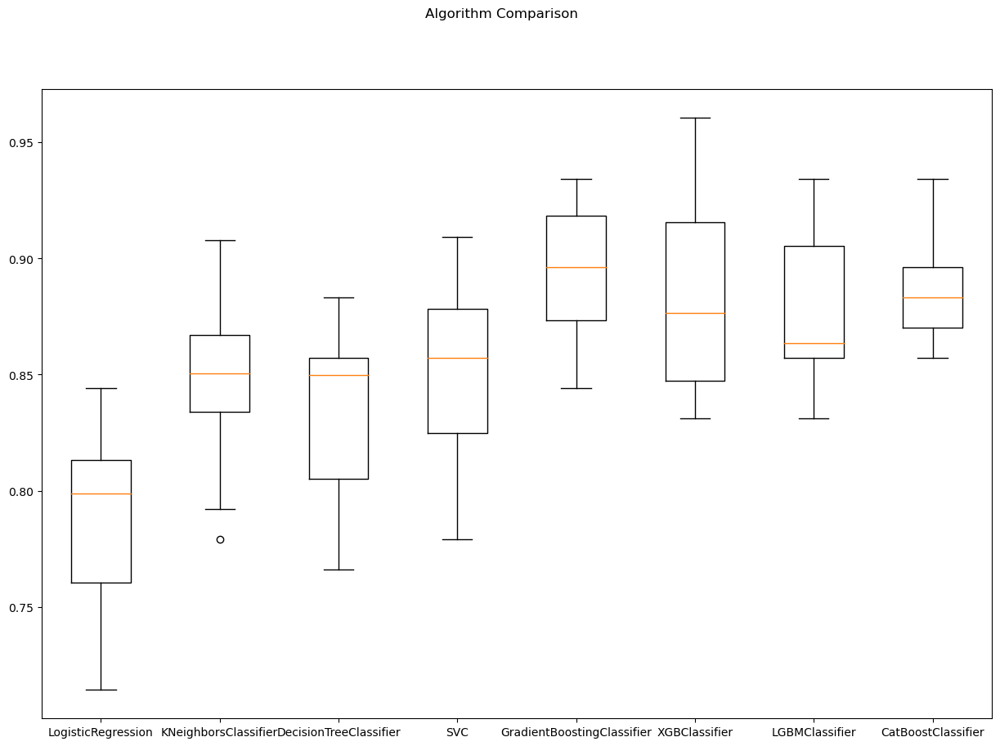

In [51]:
# Boxplot algorithms comparision
fig = plt.figure(figsize=(15,10))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(model_name)
plt.show()

In our case the best 4 models are:
1. GradientBoostingClassifier
2. CatBoostClassifier
3. XGBClassifier
4. LGBMClassifier

## 6. Model Tuning

* GradientBoostingClassifier

In [53]:
gbm_clf = GradientBoostingClassifier()

# GridSearchCV params
gbm_params = {"learning_rate": [0.01, 0.1, 0.001],
               "max_depth": [3,5, 8, 10],
               "n_estimators": [200, 500, 1000],
               "subsample": [1, 0.5, 0.8]}

gbm_cv_clf = GridSearchCV(gbm_clf,
                          gbm_params,
                          cv=10,
                          verbose=2
                         )

gbm_cv_clf.fit(X, y)

Fitting 10 folds for each of 108 candidates, totalling 1080 fits
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.6s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=1; total time=   0.5s
[CV] END learni

[CV] END learning_rate=0.01, max_depth=3, n_estimators=1000, subsample=0.8; total time=   2.8s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=1000, subsample=0.8; total time=   2.8s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=1000, subsample=0.8; total time=   2.8s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=200, subsample=1; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=200, subsample=1; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=200, subsample=1; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=200, subsample=1; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=200, subsample=1; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=200, subsample=1; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=200, subsample=1; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=200, subsample=1

[CV] END learning_rate=0.01, max_depth=5, n_estimators=1000, subsample=0.8; total time=   4.8s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=1000, subsample=0.8; total time=   4.8s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=1000, subsample=0.8; total time=   4.8s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=1000, subsample=0.8; total time=   4.8s
[CV] END learning_rate=0.01, max_depth=5, n_estimators=1000, subsample=0.8; total time=   4.8s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=200, subsample=1; total time=   1.8s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=200, subsample=1; total time=   1.8s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=200, subsample=1; total time=   1.7s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=200, subsample=1; total time=   1.7s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=200, subsample=1; total time=   1.7s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=200, subsa

[CV] END learning_rate=0.01, max_depth=8, n_estimators=1000, subsample=0.8; total time=  11.7s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=1000, subsample=0.8; total time=  10.4s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=1000, subsample=0.8; total time=  10.5s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=1000, subsample=0.8; total time=  10.5s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=1000, subsample=0.8; total time=  10.4s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=1000, subsample=0.8; total time=  10.7s
[CV] END learning_rate=0.01, max_depth=8, n_estimators=1000, subsample=0.8; total time=  10.6s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=200, subsample=1; total time=   1.7s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=200, subsample=1; total time=   1.8s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=200, subsample=1; total time=   1.6s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=

[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   6.9s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   8.1s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   7.7s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   7.3s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   7.1s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   7.3s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   7.0s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   7.1s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   8.1s
[CV] END learning_rate=0.01, max_depth=10, n_estimators=1000, subsample=0.8; total time=   7.7s
[CV] END learning_rate=0.1, max_depth=3,

[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.2s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.3s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.2s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.3s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.3s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.2s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.3s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.3s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.2s
[CV] END learning_rate=0.1, max_depth=3, n_estimators=1000, 

[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.8; total time=   1.8s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.8; total time=   1.8s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.8; total time=   1.8s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.8; total time=   1.8s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.8; total time=   1.8s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, 

[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.5; total time=   2.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.5; total time=   2.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.5; total time=   1.9s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, 

[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.5; total time=   2.3s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.5; total time=   2.2s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.5; total time=   2.2s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.5; total time=   2.2s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.5; total time=   2.2s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.8; total time=   1.9s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.8; total time=   1.9s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.8; total time=   1.9s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.8; total time=   1.9s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=1000, subsample=0.8; total time=   1.9s
[CV] END learning_rate=0.1, max_depth=10, n_estima

[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.5; total time=   1.0s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.2s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.8; total time=   1.3s
[CV] END learning_rate=0.001, max_depth=

[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=1; total time=   2.4s
[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.9s
[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.9s
[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.9s
[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.9s
[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.9s
[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.001, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.8s
[CV] END learning_rate=0.001, max_depth=5,

[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=1; total time=   4.3s
[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=1; total time=   4.0s
[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=1; total time=   3.4s
[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=1; total time=   3.4s
[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=0.5; total time=   4.1s
[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=0.5; total time=   4.1s
[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=0.5; total time=   4.0s
[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=0.5; total time=   4.0s
[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=0.5; total time=   4.0s
[CV] END learning_rate=0.001, max_depth=8, n_estimators=1000, subsample=0.5; total time=   4.1s
[CV] END learning_rate=0.001, max_depth=8, n_est

[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=1; total time=   5.1s
[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=1; total time=   5.0s
[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=1; total time=   4.1s
[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=1; total time=   4.7s
[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=1; total time=   3.9s
[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=1; total time=   4.4s
[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=1; total time=   4.1s
[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=1; total time=   3.8s
[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=0.5; total time=   5.9s
[CV] END learning_rate=0.001, max_depth=10, n_estimators=1000, subsample=0.5; total time=   6.0s
[CV] END learning_rate=0.001, max_depth=10, n_

GridSearchCV(cv=10, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.01, 0.1, 0.001],
                         'max_depth': [3, 5, 8, 10],
                         'n_estimators': [200, 500, 1000],
                         'subsample': [1, 0.5, 0.8]},
             verbose=2)

In [54]:
gbm_cv_clf.best_params_

{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1}

In [47]:
from sklearn.ensemble import GradientBoostingClassifier
gbm_best_params = {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1}
gbm_tuned_clf = GradientBoostingClassifier(**gbm_best_params)
gbm_tuned_clf.fit(X, y);

In [56]:
cross_val_score(gbm_tuned_clf, X, y, cv=10).mean()

0.8958817498291183

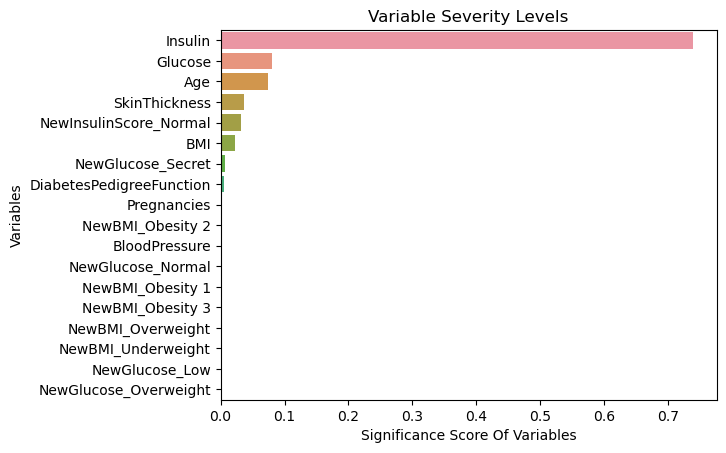

In [48]:
feature_imp = pd.Series(gbm_tuned_clf.feature_importances_,
                        index=X.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Significance Score Of Variables')
plt.ylabel('Variables')
plt.title("Variable Severity Levels")
plt.show()

* CatBoostClassifier

In [58]:
catboost_clf = CatBoostClassifier()

# CatBoost params
cbc_params = {'depth'         : [4,5,6,7,8,9, 10],
              'learning_rate' : [0.01,0.02,0.03,0.04],
              'iterations'    : [10, 20,30,40,50,60,70,80,90, 100]
             }

cbc_cv_clf = GridSearchCV(catboost_clf,
                          cbc_params,
                          cv=10,
                          verbose=2
                         )

cbc_cv_clf.fit(X, y)

Fitting 10 folds for each of 280 candidates, totalling 2800 fits
0:	learn: 0.6880518	total: 755us	remaining: 6.79ms
1:	learn: 0.6831837	total: 1.69ms	remaining: 6.76ms
2:	learn: 0.6789188	total: 2.54ms	remaining: 5.93ms
3:	learn: 0.6744011	total: 3.89ms	remaining: 5.84ms
4:	learn: 0.6701814	total: 4.82ms	remaining: 4.82ms
5:	learn: 0.6658189	total: 5.75ms	remaining: 3.83ms
6:	learn: 0.6617264	total: 6.58ms	remaining: 2.82ms
7:	learn: 0.6568897	total: 7.31ms	remaining: 1.83ms
8:	learn: 0.6520224	total: 8.16ms	remaining: 906us
9:	learn: 0.6476189	total: 9.06ms	remaining: 0us
[CV] END .........depth=4, iterations=10, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6879145	total: 766us	remaining: 6.9ms
1:	learn: 0.6831312	total: 1.64ms	remaining: 6.55ms
2:	learn: 0.6786711	total: 2.52ms	remaining: 5.88ms
3:	learn: 0.6739688	total: 3.33ms	remaining: 5ms
4:	learn: 0.6696711	total: 4.12ms	remaining: 4.12ms
5:	learn: 0.6650982	total: 4.88ms	remaining: 3.25ms
6:	learn: 0.6608065	total: 5.66m

1:	learn: 0.6731292	total: 4.04ms	remaining: 16.2ms
2:	learn: 0.6647345	total: 6.09ms	remaining: 14.2ms
3:	learn: 0.6563554	total: 7.86ms	remaining: 11.8ms
4:	learn: 0.6485371	total: 9.68ms	remaining: 9.68ms
5:	learn: 0.6403554	total: 11.5ms	remaining: 7.7ms
6:	learn: 0.6328062	total: 13.1ms	remaining: 5.6ms
7:	learn: 0.6240190	total: 14.6ms	remaining: 3.65ms
8:	learn: 0.6157135	total: 16ms	remaining: 1.77ms
9:	learn: 0.6076168	total: 17.3ms	remaining: 0us
[CV] END .........depth=4, iterations=10, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6828835	total: 782us	remaining: 7.04ms
1:	learn: 0.6742194	total: 1.66ms	remaining: 6.63ms
2:	learn: 0.6658518	total: 2.42ms	remaining: 5.65ms
3:	learn: 0.6572523	total: 3.18ms	remaining: 4.77ms
4:	learn: 0.6492451	total: 3.99ms	remaining: 3.99ms
5:	learn: 0.6409221	total: 4.79ms	remaining: 3.19ms
6:	learn: 0.6331281	total: 5.46ms	remaining: 2.34ms
7:	learn: 0.6239322	total: 6.22ms	remaining: 1.55ms
8:	learn: 0.6153514	total: 6.99ms	remaining

0:	learn: 0.6726739	total: 1.22ms	remaining: 11ms
1:	learn: 0.6557386	total: 2.47ms	remaining: 9.9ms
2:	learn: 0.6402245	total: 3.63ms	remaining: 8.47ms
3:	learn: 0.6242521	total: 4.66ms	remaining: 6.99ms
4:	learn: 0.6104355	total: 5.61ms	remaining: 5.61ms
5:	learn: 0.5957799	total: 6.53ms	remaining: 4.36ms
6:	learn: 0.5831589	total: 7.47ms	remaining: 3.2ms
7:	learn: 0.5684909	total: 8.46ms	remaining: 2.12ms
8:	learn: 0.5537655	total: 10.4ms	remaining: 1.16ms
9:	learn: 0.5409318	total: 12.1ms	remaining: 0us
[CV] END .........depth=4, iterations=10, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6725320	total: 729us	remaining: 6.57ms
1:	learn: 0.6535696	total: 1.54ms	remaining: 6.14ms
2:	learn: 0.6384670	total: 2.21ms	remaining: 5.16ms
3:	learn: 0.6226167	total: 2.85ms	remaining: 4.28ms
4:	learn: 0.6087880	total: 3.54ms	remaining: 3.54ms
5:	learn: 0.5944743	total: 4.24ms	remaining: 2.83ms
6:	learn: 0.5806514	total: 4.96ms	remaining: 2.13ms
7:	learn: 0.5664196	total: 5.8ms	remaining:

0:	learn: 0.6880131	total: 1.16ms	remaining: 22.1ms
1:	learn: 0.6832518	total: 2.52ms	remaining: 22.7ms
2:	learn: 0.6789001	total: 3.96ms	remaining: 22.4ms
3:	learn: 0.6741697	total: 5.48ms	remaining: 21.9ms
4:	learn: 0.6699373	total: 6.66ms	remaining: 20ms
5:	learn: 0.6656122	total: 7.85ms	remaining: 18.3ms
6:	learn: 0.6612781	total: 8.79ms	remaining: 16.3ms
7:	learn: 0.6568703	total: 10.2ms	remaining: 15.3ms
8:	learn: 0.6522637	total: 11.5ms	remaining: 14ms
9:	learn: 0.6473243	total: 12.4ms	remaining: 12.4ms
10:	learn: 0.6430836	total: 13.1ms	remaining: 10.7ms
11:	learn: 0.6394055	total: 13.8ms	remaining: 9.2ms
12:	learn: 0.6347102	total: 14.5ms	remaining: 7.8ms
13:	learn: 0.6304708	total: 15.3ms	remaining: 6.54ms
14:	learn: 0.6268163	total: 15.9ms	remaining: 5.31ms
15:	learn: 0.6230217	total: 16.6ms	remaining: 4.16ms
16:	learn: 0.6187024	total: 17.3ms	remaining: 3.06ms
17:	learn: 0.6142665	total: 18ms	remaining: 2ms
18:	learn: 0.6107448	total: 18.8ms	remaining: 989us
19:	learn: 0.60

13:	learn: 0.5787367	total: 10.3ms	remaining: 4.42ms
14:	learn: 0.5727319	total: 11.2ms	remaining: 3.73ms
15:	learn: 0.5667565	total: 12.3ms	remaining: 3.07ms
16:	learn: 0.5609165	total: 13.2ms	remaining: 2.33ms
17:	learn: 0.5540870	total: 14ms	remaining: 1.56ms
18:	learn: 0.5483036	total: 14.8ms	remaining: 779us
19:	learn: 0.5428568	total: 15.7ms	remaining: 0us
[CV] END .........depth=4, iterations=20, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6828154	total: 5.35ms	remaining: 102ms
1:	learn: 0.6739596	total: 8.81ms	remaining: 79.3ms
2:	learn: 0.6655818	total: 11.5ms	remaining: 65.3ms
3:	learn: 0.6567456	total: 13.9ms	remaining: 55.7ms
4:	learn: 0.6488521	total: 15.9ms	remaining: 47.8ms
5:	learn: 0.6403031	total: 17.5ms	remaining: 40.8ms
6:	learn: 0.6327029	total: 19.1ms	remaining: 35.5ms
7:	learn: 0.6237866	total: 20.7ms	remaining: 31.1ms
8:	learn: 0.6154563	total: 22.2ms	remaining: 27.1ms
9:	learn: 0.6071579	total: 23.4ms	remaining: 23.4ms
10:	learn: 0.5995145	total: 25.1ms	

19:	learn: 0.4972479	total: 21.9ms	remaining: 0us
[CV] END .........depth=4, iterations=20, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6775961	total: 726us	remaining: 13.8ms
1:	learn: 0.6638499	total: 1.54ms	remaining: 13.8ms
2:	learn: 0.6514891	total: 2.43ms	remaining: 13.8ms
3:	learn: 0.6387749	total: 3.13ms	remaining: 12.5ms
4:	learn: 0.6275334	total: 4.09ms	remaining: 12.3ms
5:	learn: 0.6158477	total: 5.83ms	remaining: 13.6ms
6:	learn: 0.6052179	total: 6.99ms	remaining: 13ms
7:	learn: 0.5931989	total: 8.25ms	remaining: 12.4ms
8:	learn: 0.5809974	total: 9.19ms	remaining: 11.2ms
9:	learn: 0.5706972	total: 9.87ms	remaining: 9.87ms
10:	learn: 0.5606798	total: 10.6ms	remaining: 8.68ms
11:	learn: 0.5516183	total: 11.6ms	remaining: 7.71ms
12:	learn: 0.5425710	total: 12.3ms	remaining: 6.61ms
13:	learn: 0.5335606	total: 13ms	remaining: 5.55ms
14:	learn: 0.5261659	total: 13.7ms	remaining: 4.55ms
15:	learn: 0.5188151	total: 14.3ms	remaining: 3.58ms
16:	learn: 0.5110148	total: 15ms	rem

16:	learn: 0.4775672	total: 17.3ms	remaining: 3.06ms
17:	learn: 0.4694024	total: 18.2ms	remaining: 2.02ms
18:	learn: 0.4626944	total: 19.2ms	remaining: 1.01ms
19:	learn: 0.4559768	total: 20.1ms	remaining: 0us
[CV] END .........depth=4, iterations=20, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6725053	total: 847us	remaining: 16.1ms
1:	learn: 0.6545745	total: 1.77ms	remaining: 16ms
2:	learn: 0.6387305	total: 2.53ms	remaining: 14.3ms
3:	learn: 0.6226264	total: 3.21ms	remaining: 12.8ms
4:	learn: 0.6086087	total: 3.99ms	remaining: 12ms
5:	learn: 0.5941996	total: 4.7ms	remaining: 11ms
6:	learn: 0.5812779	total: 5.4ms	remaining: 10ms
7:	learn: 0.5667224	total: 6.7ms	remaining: 10ms
8:	learn: 0.5520977	total: 8.48ms	remaining: 10.4ms
9:	learn: 0.5400680	total: 9.58ms	remaining: 9.58ms
10:	learn: 0.5284017	total: 10.4ms	remaining: 8.48ms
11:	learn: 0.5179909	total: 11.1ms	remaining: 7.39ms
12:	learn: 0.5077118	total: 11.8ms	remaining: 6.37ms
13:	learn: 0.4975797	total: 12.5ms	remaining:

1:	learn: 0.6831837	total: 5.48ms	remaining: 76.7ms
2:	learn: 0.6789188	total: 7.74ms	remaining: 69.6ms
3:	learn: 0.6744011	total: 9.81ms	remaining: 63.8ms
4:	learn: 0.6701814	total: 12.1ms	remaining: 60.5ms
5:	learn: 0.6658189	total: 13.5ms	remaining: 53.9ms
6:	learn: 0.6617264	total: 14.6ms	remaining: 48.1ms
7:	learn: 0.6568897	total: 15.6ms	remaining: 42.8ms
8:	learn: 0.6520224	total: 16.7ms	remaining: 38.9ms
9:	learn: 0.6476189	total: 18.3ms	remaining: 36.6ms
10:	learn: 0.6436662	total: 19.7ms	remaining: 34ms
11:	learn: 0.6399346	total: 21ms	remaining: 31.5ms
12:	learn: 0.6359731	total: 22.9ms	remaining: 29.9ms
13:	learn: 0.6316768	total: 24ms	remaining: 27.4ms
14:	learn: 0.6280911	total: 24.8ms	remaining: 24.8ms
15:	learn: 0.6246042	total: 25.8ms	remaining: 22.6ms
16:	learn: 0.6204763	total: 26.9ms	remaining: 20.6ms
17:	learn: 0.6165016	total: 27.8ms	remaining: 18.5ms
18:	learn: 0.6130230	total: 28.6ms	remaining: 16.6ms
19:	learn: 0.6096625	total: 29.7ms	remaining: 14.8ms
20:	lear

0:	learn: 0.6879913	total: 995us	remaining: 28.9ms
1:	learn: 0.6835615	total: 3.19ms	remaining: 44.6ms
2:	learn: 0.6792140	total: 4.11ms	remaining: 37ms
3:	learn: 0.6746852	total: 4.92ms	remaining: 32ms
4:	learn: 0.6704040	total: 5.68ms	remaining: 28.4ms
5:	learn: 0.6658948	total: 6.57ms	remaining: 26.3ms
6:	learn: 0.6616086	total: 7.4ms	remaining: 24.3ms
7:	learn: 0.6565226	total: 8.2ms	remaining: 22.6ms
8:	learn: 0.6517073	total: 9.1ms	remaining: 21.2ms
9:	learn: 0.6472190	total: 9.96ms	remaining: 19.9ms
10:	learn: 0.6423493	total: 10.9ms	remaining: 18.9ms
11:	learn: 0.6385450	total: 11.8ms	remaining: 17.7ms
12:	learn: 0.6342676	total: 12.7ms	remaining: 16.6ms
13:	learn: 0.6299836	total: 13.4ms	remaining: 15.3ms
14:	learn: 0.6263201	total: 14.4ms	remaining: 14.4ms
15:	learn: 0.6225676	total: 15.2ms	remaining: 13.3ms
16:	learn: 0.6187304	total: 16.1ms	remaining: 12.3ms
17:	learn: 0.6147127	total: 17ms	remaining: 11.3ms
18:	learn: 0.6111675	total: 18.4ms	remaining: 10.7ms
19:	learn: 0.

1:	learn: 0.6739596	total: 3.09ms	remaining: 43.3ms
2:	learn: 0.6655818	total: 4.44ms	remaining: 39.9ms
3:	learn: 0.6567456	total: 5.76ms	remaining: 37.5ms
4:	learn: 0.6488521	total: 7.08ms	remaining: 35.4ms
5:	learn: 0.6403031	total: 8.55ms	remaining: 34.2ms
6:	learn: 0.6327029	total: 10ms	remaining: 32.9ms
7:	learn: 0.6237866	total: 12.3ms	remaining: 33.9ms
8:	learn: 0.6154563	total: 13.8ms	remaining: 32.1ms
9:	learn: 0.6071579	total: 14.8ms	remaining: 29.6ms
10:	learn: 0.5995145	total: 16.3ms	remaining: 28.1ms
11:	learn: 0.5926917	total: 17.2ms	remaining: 25.8ms
12:	learn: 0.5856821	total: 18.1ms	remaining: 23.7ms
13:	learn: 0.5787213	total: 18.9ms	remaining: 21.6ms
14:	learn: 0.5729568	total: 19.8ms	remaining: 19.8ms
15:	learn: 0.5669521	total: 20.6ms	remaining: 18ms
16:	learn: 0.5608192	total: 21.5ms	remaining: 16.4ms
17:	learn: 0.5546846	total: 22.3ms	remaining: 14.9ms
18:	learn: 0.5490369	total: 23.2ms	remaining: 13.5ms
19:	learn: 0.5435641	total: 24.4ms	remaining: 12.2ms
20:	le

0:	learn: 0.6830242	total: 1.15ms	remaining: 33.2ms
1:	learn: 0.6739582	total: 2.36ms	remaining: 33.1ms
2:	learn: 0.6656176	total: 3.52ms	remaining: 31.7ms
3:	learn: 0.6571501	total: 4.66ms	remaining: 30.3ms
4:	learn: 0.6494857	total: 5.71ms	remaining: 28.5ms
5:	learn: 0.6413430	total: 6.82ms	remaining: 27.3ms
6:	learn: 0.6338169	total: 7.59ms	remaining: 24.9ms
7:	learn: 0.6249571	total: 8.86ms	remaining: 24.4ms
8:	learn: 0.6166837	total: 10.2ms	remaining: 23.8ms
9:	learn: 0.6091056	total: 11.2ms	remaining: 22.4ms
10:	learn: 0.6016252	total: 12.2ms	remaining: 21.1ms
11:	learn: 0.5949043	total: 12.9ms	remaining: 19.4ms
12:	learn: 0.5883556	total: 13.7ms	remaining: 17.9ms
13:	learn: 0.5813600	total: 14.3ms	remaining: 16.3ms
14:	learn: 0.5755697	total: 14.9ms	remaining: 14.9ms
15:	learn: 0.5695809	total: 15.5ms	remaining: 13.6ms
16:	learn: 0.5638351	total: 16.4ms	remaining: 12.6ms
17:	learn: 0.5576069	total: 17.4ms	remaining: 11.6ms
18:	learn: 0.5520734	total: 18.2ms	remaining: 10.5ms
19:

10:	learn: 0.5623404	total: 9.32ms	remaining: 16.1ms
11:	learn: 0.5532693	total: 10.2ms	remaining: 15.3ms
12:	learn: 0.5444627	total: 11ms	remaining: 14.4ms
13:	learn: 0.5357438	total: 12ms	remaining: 13.7ms
14:	learn: 0.5277803	total: 12.8ms	remaining: 12.8ms
15:	learn: 0.5204122	total: 13.6ms	remaining: 11.9ms
16:	learn: 0.5132160	total: 14.4ms	remaining: 11ms
17:	learn: 0.5053088	total: 15.3ms	remaining: 10.2ms
18:	learn: 0.4986173	total: 16.1ms	remaining: 9.33ms
19:	learn: 0.4921746	total: 16.8ms	remaining: 8.38ms
20:	learn: 0.4851901	total: 17.6ms	remaining: 7.53ms
21:	learn: 0.4787224	total: 18.3ms	remaining: 6.64ms
22:	learn: 0.4722169	total: 19ms	remaining: 5.77ms
23:	learn: 0.4673950	total: 19.8ms	remaining: 4.94ms
24:	learn: 0.4619964	total: 20.8ms	remaining: 4.15ms
25:	learn: 0.4564946	total: 21.7ms	remaining: 3.33ms
26:	learn: 0.4514334	total: 22.4ms	remaining: 2.49ms
27:	learn: 0.4461018	total: 23.3ms	remaining: 1.66ms
28:	learn: 0.4407388	total: 24.1ms	remaining: 830us
29

[CV] END .........depth=4, iterations=30, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6725053	total: 1.13ms	remaining: 32.6ms
1:	learn: 0.6545745	total: 2.37ms	remaining: 33.2ms
2:	learn: 0.6387305	total: 6.73ms	remaining: 60.6ms
3:	learn: 0.6226264	total: 7.98ms	remaining: 51.9ms
4:	learn: 0.6086087	total: 9.52ms	remaining: 47.6ms
5:	learn: 0.5941996	total: 10.9ms	remaining: 43.4ms
6:	learn: 0.5812779	total: 12.2ms	remaining: 40.1ms
7:	learn: 0.5667224	total: 13.3ms	remaining: 36.6ms
8:	learn: 0.5520977	total: 14.4ms	remaining: 33.5ms
9:	learn: 0.5400680	total: 17ms	remaining: 33.9ms
10:	learn: 0.5284017	total: 18ms	remaining: 31.2ms
11:	learn: 0.5179909	total: 19.1ms	remaining: 28.6ms
12:	learn: 0.5077118	total: 20ms	remaining: 26.2ms
13:	learn: 0.4975797	total: 21.3ms	remaining: 24.3ms
14:	learn: 0.4891205	total: 22.7ms	remaining: 22.7ms
15:	learn: 0.4809232	total: 23.9ms	remaining: 20.9ms
16:	learn: 0.4733420	total: 25.2ms	remaining: 19.2ms
17:	learn: 0.4642186	total: 26.1ms

28:	learn: 0.4004388	total: 24.5ms	remaining: 844us
29:	learn: 0.3956522	total: 27.6ms	remaining: 0us
[CV] END .........depth=4, iterations=30, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6730862	total: 958us	remaining: 27.8ms
1:	learn: 0.6557246	total: 4.12ms	remaining: 57.6ms
2:	learn: 0.6403150	total: 5.07ms	remaining: 45.6ms
3:	learn: 0.6250178	total: 6.38ms	remaining: 41.5ms
4:	learn: 0.6114888	total: 7.29ms	remaining: 36.4ms
5:	learn: 0.5982761	total: 8.23ms	remaining: 32.9ms
6:	learn: 0.5857425	total: 8.99ms	remaining: 29.5ms
7:	learn: 0.5710476	total: 9.71ms	remaining: 26.7ms
8:	learn: 0.5566682	total: 10.4ms	remaining: 24.4ms
9:	learn: 0.5451443	total: 11.1ms	remaining: 22.2ms
10:	learn: 0.5340075	total: 11.8ms	remaining: 20.3ms
11:	learn: 0.5241151	total: 12.5ms	remaining: 18.8ms
12:	learn: 0.5139232	total: 13.2ms	remaining: 17.2ms
13:	learn: 0.5039452	total: 14.1ms	remaining: 16.1ms
14:	learn: 0.4947345	total: 15ms	remaining: 15ms
15:	learn: 0.4866914	total: 18.1ms	re

9:	learn: 0.6465937	total: 10.9ms	remaining: 32.8ms
10:	learn: 0.6425968	total: 12.8ms	remaining: 33.8ms
11:	learn: 0.6385031	total: 14.3ms	remaining: 33.4ms
12:	learn: 0.6344916	total: 17ms	remaining: 35.3ms
13:	learn: 0.6302965	total: 18.4ms	remaining: 34.3ms
14:	learn: 0.6263568	total: 19.5ms	remaining: 32.5ms
15:	learn: 0.6226428	total: 20.6ms	remaining: 30.9ms
16:	learn: 0.6190276	total: 22ms	remaining: 29.7ms
17:	learn: 0.6148709	total: 23.1ms	remaining: 28.2ms
18:	learn: 0.6111803	total: 24.2ms	remaining: 26.8ms
19:	learn: 0.6077477	total: 25.5ms	remaining: 25.5ms
20:	learn: 0.6043844	total: 26.7ms	remaining: 24.1ms
21:	learn: 0.6006819	total: 27.7ms	remaining: 22.6ms
22:	learn: 0.5969184	total: 29.1ms	remaining: 21.5ms
23:	learn: 0.5935536	total: 31.1ms	remaining: 20.8ms
24:	learn: 0.5904591	total: 32.3ms	remaining: 19.4ms
25:	learn: 0.5869596	total: 33.5ms	remaining: 18ms
26:	learn: 0.5838616	total: 34.5ms	remaining: 16.6ms
27:	learn: 0.5804056	total: 35.4ms	remaining: 15.2ms


18:	learn: 0.6137223	total: 19ms	remaining: 21ms
19:	learn: 0.6103780	total: 19.8ms	remaining: 19.8ms
20:	learn: 0.6066577	total: 20.8ms	remaining: 18.8ms
21:	learn: 0.6030450	total: 21.6ms	remaining: 17.7ms
22:	learn: 0.5993658	total: 22.4ms	remaining: 16.6ms
23:	learn: 0.5959425	total: 23.2ms	remaining: 15.4ms
24:	learn: 0.5928608	total: 23.9ms	remaining: 14.3ms
25:	learn: 0.5895083	total: 24.5ms	remaining: 13.2ms
26:	learn: 0.5863585	total: 25.2ms	remaining: 12.1ms
27:	learn: 0.5830706	total: 26ms	remaining: 11.2ms
28:	learn: 0.5798809	total: 27ms	remaining: 10.2ms
29:	learn: 0.5767954	total: 27.9ms	remaining: 9.28ms
30:	learn: 0.5733640	total: 28.8ms	remaining: 8.35ms
31:	learn: 0.5703634	total: 31.4ms	remaining: 7.85ms
32:	learn: 0.5673203	total: 32.3ms	remaining: 6.85ms
33:	learn: 0.5648089	total: 33.1ms	remaining: 5.84ms
34:	learn: 0.5621147	total: 33.9ms	remaining: 4.84ms
35:	learn: 0.5591213	total: 34.8ms	remaining: 3.87ms
36:	learn: 0.5563873	total: 35.5ms	remaining: 2.88ms
3

36:	learn: 0.4645547	total: 32.3ms	remaining: 2.62ms
37:	learn: 0.4601694	total: 33.1ms	remaining: 1.74ms
38:	learn: 0.4568058	total: 34.1ms	remaining: 874us
39:	learn: 0.4532918	total: 35.1ms	remaining: 0us
[CV] END .........depth=4, iterations=40, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6828154	total: 1.02ms	remaining: 39.9ms
1:	learn: 0.6739596	total: 1.83ms	remaining: 34.9ms
2:	learn: 0.6655818	total: 2.54ms	remaining: 31.3ms
3:	learn: 0.6567456	total: 3.25ms	remaining: 29.2ms
4:	learn: 0.6488521	total: 3.98ms	remaining: 27.8ms
5:	learn: 0.6403031	total: 4.97ms	remaining: 28.2ms
6:	learn: 0.6327029	total: 6.15ms	remaining: 29ms
7:	learn: 0.6237866	total: 6.96ms	remaining: 27.8ms
8:	learn: 0.6154563	total: 7.83ms	remaining: 27ms
9:	learn: 0.6071579	total: 8.87ms	remaining: 26.6ms
10:	learn: 0.5995145	total: 9.71ms	remaining: 25.6ms
11:	learn: 0.5926917	total: 10.4ms	remaining: 24.3ms
12:	learn: 0.5856821	total: 11.1ms	remaining: 23ms
13:	learn: 0.5787213	total: 11.7ms	rem

21:	learn: 0.5321888	total: 30ms	remaining: 24.6ms
22:	learn: 0.5265235	total: 32.7ms	remaining: 24.2ms
23:	learn: 0.5215674	total: 34.1ms	remaining: 22.7ms
24:	learn: 0.5170736	total: 35.1ms	remaining: 21.1ms
25:	learn: 0.5121989	total: 35.9ms	remaining: 19.3ms
26:	learn: 0.5078736	total: 37ms	remaining: 17.8ms
27:	learn: 0.5033443	total: 37.8ms	remaining: 16.2ms
28:	learn: 0.4983064	total: 38.8ms	remaining: 14.7ms
29:	learn: 0.4939182	total: 42.4ms	remaining: 14.1ms
30:	learn: 0.4893689	total: 43.8ms	remaining: 12.7ms
31:	learn: 0.4851448	total: 45.5ms	remaining: 11.4ms
32:	learn: 0.4809623	total: 46.4ms	remaining: 9.84ms
33:	learn: 0.4775494	total: 47.5ms	remaining: 8.39ms
34:	learn: 0.4738645	total: 48.7ms	remaining: 6.96ms
35:	learn: 0.4702068	total: 50.2ms	remaining: 5.58ms
36:	learn: 0.4665686	total: 51.6ms	remaining: 4.18ms
37:	learn: 0.4621422	total: 53.8ms	remaining: 2.83ms
38:	learn: 0.4587910	total: 56.7ms	remaining: 1.45ms
39:	learn: 0.4558791	total: 57.9ms	remaining: 0us


0:	learn: 0.6775961	total: 1.15ms	remaining: 44.8ms
1:	learn: 0.6638499	total: 2.49ms	remaining: 47.3ms
2:	learn: 0.6514891	total: 3.71ms	remaining: 45.8ms
3:	learn: 0.6387749	total: 4.85ms	remaining: 43.6ms
4:	learn: 0.6275334	total: 5.84ms	remaining: 40.9ms
5:	learn: 0.6158477	total: 6.78ms	remaining: 38.4ms
6:	learn: 0.6052179	total: 7.75ms	remaining: 36.5ms
7:	learn: 0.5931989	total: 8.64ms	remaining: 34.6ms
8:	learn: 0.5809974	total: 9.48ms	remaining: 32.7ms
9:	learn: 0.5706972	total: 10.3ms	remaining: 30.9ms
10:	learn: 0.5606798	total: 11.3ms	remaining: 29.7ms
11:	learn: 0.5516183	total: 13.1ms	remaining: 30.5ms
12:	learn: 0.5425710	total: 14.6ms	remaining: 30.4ms
13:	learn: 0.5335606	total: 15.6ms	remaining: 28.9ms
14:	learn: 0.5261659	total: 16.3ms	remaining: 27.2ms
15:	learn: 0.5188151	total: 17ms	remaining: 25.5ms
16:	learn: 0.5110148	total: 18.2ms	remaining: 24.6ms
17:	learn: 0.5027573	total: 18.9ms	remaining: 23.1ms
18:	learn: 0.4959420	total: 19.8ms	remaining: 21.9ms
19:	l

16:	learn: 0.5141203	total: 17.3ms	remaining: 23.4ms
17:	learn: 0.5065630	total: 18.8ms	remaining: 22.9ms
18:	learn: 0.5001930	total: 19.9ms	remaining: 22ms
19:	learn: 0.4943528	total: 20.7ms	remaining: 20.7ms
20:	learn: 0.4876626	total: 21.5ms	remaining: 19.5ms
21:	learn: 0.4817300	total: 22.2ms	remaining: 18.2ms
22:	learn: 0.4751187	total: 23.1ms	remaining: 17ms
23:	learn: 0.4698905	total: 23.8ms	remaining: 15.8ms
24:	learn: 0.4645239	total: 24.7ms	remaining: 14.8ms
25:	learn: 0.4591591	total: 25.5ms	remaining: 13.7ms
26:	learn: 0.4541569	total: 26.3ms	remaining: 12.7ms
27:	learn: 0.4493573	total: 27.3ms	remaining: 11.7ms
28:	learn: 0.4436674	total: 29ms	remaining: 11ms
29:	learn: 0.4392083	total: 30.3ms	remaining: 10.1ms
30:	learn: 0.4342078	total: 31.5ms	remaining: 9.13ms
31:	learn: 0.4301669	total: 32.5ms	remaining: 8.14ms
32:	learn: 0.4257444	total: 33.5ms	remaining: 7.11ms
33:	learn: 0.4220030	total: 34.5ms	remaining: 6.09ms
34:	learn: 0.4183571	total: 35.3ms	remaining: 5.04ms
3

0:	learn: 0.6730496	total: 959us	remaining: 37.4ms
1:	learn: 0.6547130	total: 2.09ms	remaining: 39.8ms
2:	learn: 0.6395182	total: 4.39ms	remaining: 54.2ms
3:	learn: 0.6239898	total: 5.46ms	remaining: 49.2ms
4:	learn: 0.6101940	total: 6.39ms	remaining: 44.7ms
5:	learn: 0.5964513	total: 7.57ms	remaining: 42.9ms
6:	learn: 0.5831584	total: 8.87ms	remaining: 41.8ms
7:	learn: 0.5687414	total: 10.1ms	remaining: 40.2ms
8:	learn: 0.5549004	total: 11.3ms	remaining: 39.1ms
9:	learn: 0.5435008	total: 12.2ms	remaining: 36.7ms
10:	learn: 0.5323718	total: 13.1ms	remaining: 34.6ms
11:	learn: 0.5219575	total: 13.9ms	remaining: 32.5ms
12:	learn: 0.5118092	total: 14.9ms	remaining: 31ms
13:	learn: 0.5016259	total: 16.2ms	remaining: 30ms
14:	learn: 0.4937777	total: 18.8ms	remaining: 31.4ms
15:	learn: 0.4862093	total: 19.8ms	remaining: 29.7ms
16:	learn: 0.4775672	total: 20.6ms	remaining: 27.9ms
17:	learn: 0.4694024	total: 21.5ms	remaining: 26.3ms
18:	learn: 0.4626944	total: 22.4ms	remaining: 24.7ms
19:	lear

36:	learn: 0.3613997	total: 35.2ms	remaining: 2.86ms
37:	learn: 0.3569834	total: 37.2ms	remaining: 1.96ms
38:	learn: 0.3540171	total: 38.7ms	remaining: 991us
39:	learn: 0.3516434	total: 39.9ms	remaining: 0us
[CV] END .........depth=4, iterations=40, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6711150	total: 1.13ms	remaining: 43.9ms
1:	learn: 0.6539154	total: 2.06ms	remaining: 39.2ms
2:	learn: 0.6384023	total: 3.06ms	remaining: 37.7ms
3:	learn: 0.6233672	total: 4.01ms	remaining: 36.1ms
4:	learn: 0.6097371	total: 5.18ms	remaining: 36.2ms
5:	learn: 0.5957595	total: 6.06ms	remaining: 34.3ms
6:	learn: 0.5832665	total: 9.08ms	remaining: 42.8ms
7:	learn: 0.5687927	total: 10.2ms	remaining: 40.8ms
8:	learn: 0.5543800	total: 11.2ms	remaining: 38.5ms
9:	learn: 0.5418955	total: 12.1ms	remaining: 36.2ms
10:	learn: 0.5306622	total: 12.8ms	remaining: 33.8ms
11:	learn: 0.5205046	total: 13.5ms	remaining: 31.6ms
12:	learn: 0.5102442	total: 14.2ms	remaining: 29.6ms
13:	learn: 0.5004259	total: 15ms

28:	learn: 0.5797365	total: 25.3ms	remaining: 18.3ms
29:	learn: 0.5766558	total: 27.8ms	remaining: 18.5ms
30:	learn: 0.5732562	total: 30.7ms	remaining: 18.8ms
31:	learn: 0.5703094	total: 32ms	remaining: 18ms
32:	learn: 0.5672509	total: 33.1ms	remaining: 17ms
33:	learn: 0.5647128	total: 34ms	remaining: 16ms
34:	learn: 0.5619159	total: 34.8ms	remaining: 14.9ms
35:	learn: 0.5589961	total: 35.5ms	remaining: 13.8ms
36:	learn: 0.5563927	total: 36.1ms	remaining: 12.7ms
37:	learn: 0.5531564	total: 37ms	remaining: 11.7ms
38:	learn: 0.5505729	total: 37.7ms	remaining: 10.6ms
39:	learn: 0.5480507	total: 38.4ms	remaining: 9.6ms
40:	learn: 0.5454066	total: 39.1ms	remaining: 8.58ms
41:	learn: 0.5427299	total: 41.2ms	remaining: 7.84ms
42:	learn: 0.5398606	total: 42.2ms	remaining: 6.87ms
43:	learn: 0.5375403	total: 45.1ms	remaining: 6.15ms
44:	learn: 0.5345455	total: 45.8ms	remaining: 5.09ms
45:	learn: 0.5319612	total: 46.8ms	remaining: 4.07ms
46:	learn: 0.5294707	total: 47.6ms	remaining: 3.04ms
47:	le

25:	learn: 0.5856360	total: 33ms	remaining: 30.4ms
26:	learn: 0.5823915	total: 34.1ms	remaining: 29ms
27:	learn: 0.5793110	total: 34.8ms	remaining: 27.4ms
28:	learn: 0.5759583	total: 35.7ms	remaining: 25.9ms
29:	learn: 0.5727678	total: 36.5ms	remaining: 24.3ms
30:	learn: 0.5692709	total: 37.3ms	remaining: 22.8ms
31:	learn: 0.5663401	total: 38ms	remaining: 21.4ms
32:	learn: 0.5631601	total: 38.7ms	remaining: 19.9ms
33:	learn: 0.5603932	total: 39.3ms	remaining: 18.5ms
34:	learn: 0.5575872	total: 40ms	remaining: 17.2ms
35:	learn: 0.5547279	total: 40.8ms	remaining: 15.9ms
36:	learn: 0.5519665	total: 42.8ms	remaining: 15ms
37:	learn: 0.5484150	total: 43.8ms	remaining: 13.8ms
38:	learn: 0.5455533	total: 44.7ms	remaining: 12.6ms
39:	learn: 0.5428001	total: 45.4ms	remaining: 11.3ms
40:	learn: 0.5402775	total: 46.2ms	remaining: 10.1ms
41:	learn: 0.5375713	total: 47ms	remaining: 8.95ms
42:	learn: 0.5343193	total: 47.6ms	remaining: 7.75ms
43:	learn: 0.5318797	total: 48.2ms	remaining: 6.58ms
44:	l

9:	learn: 0.6468395	total: 7.82ms	remaining: 31.3ms
10:	learn: 0.6424014	total: 8.71ms	remaining: 30.9ms
11:	learn: 0.6385504	total: 9.88ms	remaining: 31.3ms
12:	learn: 0.6344076	total: 12.1ms	remaining: 34.4ms
13:	learn: 0.6299818	total: 13ms	remaining: 33.4ms
14:	learn: 0.6262815	total: 14.1ms	remaining: 32.8ms
15:	learn: 0.6225273	total: 15.1ms	remaining: 32.1ms
16:	learn: 0.6186898	total: 16.1ms	remaining: 31.3ms
17:	learn: 0.6146885	total: 17.1ms	remaining: 30.5ms
18:	learn: 0.6113652	total: 18ms	remaining: 29.3ms
19:	learn: 0.6079499	total: 19ms	remaining: 28.5ms
20:	learn: 0.6044013	total: 19.9ms	remaining: 27.5ms
21:	learn: 0.6005780	total: 20.8ms	remaining: 26.5ms
22:	learn: 0.5966248	total: 21.6ms	remaining: 25.3ms
23:	learn: 0.5932345	total: 22.4ms	remaining: 24.3ms
24:	learn: 0.5900240	total: 23.3ms	remaining: 23.3ms
25:	learn: 0.5865632	total: 25.7ms	remaining: 23.7ms
26:	learn: 0.5833575	total: 26.7ms	remaining: 22.7ms
27:	learn: 0.5803027	total: 28ms	remaining: 22ms
28:	

27:	learn: 0.5016779	total: 24.4ms	remaining: 19.2ms
28:	learn: 0.4964382	total: 25.3ms	remaining: 18.3ms
29:	learn: 0.4920324	total: 26.4ms	remaining: 17.6ms
30:	learn: 0.4876385	total: 27.4ms	remaining: 16.8ms
31:	learn: 0.4834896	total: 28.3ms	remaining: 15.9ms
32:	learn: 0.4794455	total: 29.3ms	remaining: 15.1ms
33:	learn: 0.4761180	total: 30.1ms	remaining: 14.2ms
34:	learn: 0.4724141	total: 30.9ms	remaining: 13.2ms
35:	learn: 0.4685001	total: 31.6ms	remaining: 12.3ms
36:	learn: 0.4649221	total: 32.3ms	remaining: 11.3ms
37:	learn: 0.4603578	total: 33.2ms	remaining: 10.5ms
38:	learn: 0.4567766	total: 33.9ms	remaining: 9.57ms
39:	learn: 0.4537822	total: 34.7ms	remaining: 8.68ms
40:	learn: 0.4507029	total: 35.6ms	remaining: 7.82ms
41:	learn: 0.4468943	total: 36.6ms	remaining: 6.97ms
42:	learn: 0.4432120	total: 37.4ms	remaining: 6.09ms
43:	learn: 0.4397694	total: 38.2ms	remaining: 5.21ms
44:	learn: 0.4361975	total: 39ms	remaining: 4.34ms
45:	learn: 0.4334376	total: 39.7ms	remaining: 3.

24:	learn: 0.5170736	total: 30.8ms	remaining: 30.8ms
25:	learn: 0.5121989	total: 31.8ms	remaining: 29.4ms
26:	learn: 0.5078736	total: 33.1ms	remaining: 28.2ms
27:	learn: 0.5033443	total: 34ms	remaining: 26.7ms
28:	learn: 0.4983064	total: 34.8ms	remaining: 25.2ms
29:	learn: 0.4939182	total: 35.8ms	remaining: 23.8ms
30:	learn: 0.4893689	total: 36.6ms	remaining: 22.4ms
31:	learn: 0.4851448	total: 37.4ms	remaining: 21.1ms
32:	learn: 0.4809623	total: 38.1ms	remaining: 19.6ms
33:	learn: 0.4775494	total: 38.9ms	remaining: 18.3ms
34:	learn: 0.4738645	total: 39.7ms	remaining: 17ms
35:	learn: 0.4702068	total: 40.6ms	remaining: 15.8ms
36:	learn: 0.4665686	total: 41.4ms	remaining: 14.6ms
37:	learn: 0.4621422	total: 42.2ms	remaining: 13.3ms
38:	learn: 0.4587910	total: 43.1ms	remaining: 12.2ms
39:	learn: 0.4558791	total: 44ms	remaining: 11ms
40:	learn: 0.4527602	total: 44.8ms	remaining: 9.84ms
41:	learn: 0.4488277	total: 45.7ms	remaining: 8.71ms
42:	learn: 0.4453136	total: 46.8ms	remaining: 7.62ms
4

49:	learn: 0.3711496	total: 36.1ms	remaining: 0us
[CV] END .........depth=4, iterations=50, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6775961	total: 735us	remaining: 36ms
1:	learn: 0.6638499	total: 1.52ms	remaining: 36.5ms
2:	learn: 0.6514891	total: 2.2ms	remaining: 34.4ms
3:	learn: 0.6387749	total: 2.88ms	remaining: 33.2ms
4:	learn: 0.6275334	total: 3.59ms	remaining: 32.3ms
5:	learn: 0.6158477	total: 4.28ms	remaining: 31.4ms
6:	learn: 0.6052179	total: 5.2ms	remaining: 31.9ms
7:	learn: 0.5931989	total: 5.88ms	remaining: 30.9ms
8:	learn: 0.5809974	total: 6.69ms	remaining: 30.5ms
9:	learn: 0.5706972	total: 7.38ms	remaining: 29.5ms
10:	learn: 0.5606798	total: 8.09ms	remaining: 28.7ms
11:	learn: 0.5516183	total: 9.14ms	remaining: 28.9ms
12:	learn: 0.5425710	total: 9.95ms	remaining: 28.3ms
13:	learn: 0.5335606	total: 10.7ms	remaining: 27.6ms
14:	learn: 0.5261659	total: 11.5ms	remaining: 26.8ms
15:	learn: 0.5188151	total: 12.1ms	remaining: 25.8ms
16:	learn: 0.5110148	total: 12.8ms	r

4:	learn: 0.6284954	total: 9.38ms	remaining: 84.4ms
5:	learn: 0.6171632	total: 11.4ms	remaining: 84ms
6:	learn: 0.6068696	total: 13.5ms	remaining: 83ms
7:	learn: 0.5949348	total: 15.1ms	remaining: 79.3ms
8:	learn: 0.5829189	total: 16.6ms	remaining: 75.8ms
9:	learn: 0.5722846	total: 17.9ms	remaining: 71.8ms
10:	learn: 0.5626723	total: 19.4ms	remaining: 68.7ms
11:	learn: 0.5538001	total: 20.9ms	remaining: 66.1ms
12:	learn: 0.5447911	total: 22.2ms	remaining: 63.1ms
13:	learn: 0.5360969	total: 23.4ms	remaining: 60.2ms
14:	learn: 0.5285110	total: 24.4ms	remaining: 56.9ms
15:	learn: 0.5213567	total: 25.9ms	remaining: 55ms
16:	learn: 0.5141203	total: 27.1ms	remaining: 52.6ms
17:	learn: 0.5065630	total: 28.1ms	remaining: 50ms
18:	learn: 0.5001930	total: 29.1ms	remaining: 47.5ms
19:	learn: 0.4943528	total: 30.2ms	remaining: 45.2ms
20:	learn: 0.4876626	total: 31.2ms	remaining: 43ms
21:	learn: 0.4817300	total: 32.1ms	remaining: 40.9ms
22:	learn: 0.4751187	total: 33ms	remaining: 38.8ms
23:	learn: 

7:	learn: 0.5965354	total: 14.6ms	remaining: 76.4ms
8:	learn: 0.5848600	total: 16ms	remaining: 72.8ms
9:	learn: 0.5744029	total: 17.1ms	remaining: 68.3ms
10:	learn: 0.5645946	total: 18.4ms	remaining: 65.3ms
11:	learn: 0.5564137	total: 19.8ms	remaining: 62.7ms
12:	learn: 0.5476371	total: 20.9ms	remaining: 59.4ms
13:	learn: 0.5388248	total: 21.8ms	remaining: 56.1ms
14:	learn: 0.5308886	total: 22.8ms	remaining: 53.1ms
15:	learn: 0.5234505	total: 23.8ms	remaining: 50.6ms
16:	learn: 0.5161385	total: 24.8ms	remaining: 48ms
17:	learn: 0.5084118	total: 26ms	remaining: 46.1ms
18:	learn: 0.5019283	total: 27.3ms	remaining: 44.5ms
19:	learn: 0.4959965	total: 28.2ms	remaining: 42.3ms
20:	learn: 0.4892302	total: 28.9ms	remaining: 39.9ms
21:	learn: 0.4830030	total: 29.7ms	remaining: 37.8ms
22:	learn: 0.4765399	total: 30.6ms	remaining: 35.9ms
23:	learn: 0.4708099	total: 31.4ms	remaining: 34.1ms
24:	learn: 0.4659388	total: 32.3ms	remaining: 32.3ms
25:	learn: 0.4598707	total: 33ms	remaining: 30.5ms
26:	

35:	learn: 0.3715104	total: 29.6ms	remaining: 11.5ms
36:	learn: 0.3685878	total: 30.5ms	remaining: 10.7ms
37:	learn: 0.3640639	total: 31.6ms	remaining: 9.98ms
38:	learn: 0.3610754	total: 32.5ms	remaining: 9.18ms
39:	learn: 0.3572805	total: 33.4ms	remaining: 8.36ms
40:	learn: 0.3541148	total: 34.4ms	remaining: 7.54ms
41:	learn: 0.3507114	total: 35.2ms	remaining: 6.7ms
42:	learn: 0.3466666	total: 35.9ms	remaining: 5.85ms
43:	learn: 0.3439261	total: 36.7ms	remaining: 5.01ms
44:	learn: 0.3397722	total: 37.5ms	remaining: 4.17ms
45:	learn: 0.3375724	total: 38.3ms	remaining: 3.33ms
46:	learn: 0.3345098	total: 39.2ms	remaining: 2.5ms
47:	learn: 0.3314231	total: 40ms	remaining: 1.67ms
48:	learn: 0.3290840	total: 40.8ms	remaining: 833us
49:	learn: 0.3277191	total: 41.6ms	remaining: 0us
[CV] END .........depth=4, iterations=50, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6729006	total: 715us	remaining: 35ms
1:	learn: 0.6549144	total: 1.48ms	remaining: 35.6ms
2:	learn: 0.6393086	total: 2.19

5:	learn: 0.5939984	total: 12.7ms	remaining: 92.9ms
6:	learn: 0.5804102	total: 14.4ms	remaining: 88.3ms
7:	learn: 0.5657458	total: 16.1ms	remaining: 84.3ms
8:	learn: 0.5522848	total: 17.2ms	remaining: 78.5ms
9:	learn: 0.5411597	total: 18.3ms	remaining: 73.3ms
10:	learn: 0.5298917	total: 19.3ms	remaining: 68.5ms
11:	learn: 0.5204263	total: 20.4ms	remaining: 64.6ms
12:	learn: 0.5099571	total: 21.6ms	remaining: 61.4ms
13:	learn: 0.4994101	total: 22.6ms	remaining: 58.2ms
14:	learn: 0.4908742	total: 24ms	remaining: 55.9ms
15:	learn: 0.4826595	total: 24.8ms	remaining: 52.6ms
16:	learn: 0.4744278	total: 25.7ms	remaining: 49.9ms
17:	learn: 0.4662388	total: 26.7ms	remaining: 47.5ms
18:	learn: 0.4588322	total: 27.6ms	remaining: 45.1ms
19:	learn: 0.4527622	total: 28.4ms	remaining: 42.7ms
20:	learn: 0.4445514	total: 29.5ms	remaining: 40.7ms
21:	learn: 0.4380969	total: 30.5ms	remaining: 38.8ms
22:	learn: 0.4310166	total: 31.4ms	remaining: 36.9ms
23:	learn: 0.4258226	total: 32.3ms	remaining: 35ms
24

0:	learn: 0.6879578	total: 934us	remaining: 55.1ms
1:	learn: 0.6834290	total: 2.15ms	remaining: 62.3ms
2:	learn: 0.6790753	total: 3.17ms	remaining: 60.3ms
3:	learn: 0.6744248	total: 4.38ms	remaining: 61.3ms
4:	learn: 0.6702001	total: 5.35ms	remaining: 58.8ms
5:	learn: 0.6655735	total: 6.24ms	remaining: 56.2ms
6:	learn: 0.6613899	total: 7.54ms	remaining: 57.1ms
7:	learn: 0.6564484	total: 8.7ms	remaining: 56.6ms
8:	learn: 0.6517432	total: 9.67ms	remaining: 54.8ms
9:	learn: 0.6469946	total: 10.5ms	remaining: 52.5ms
10:	learn: 0.6426615	total: 11.3ms	remaining: 50.2ms
11:	learn: 0.6386215	total: 12.2ms	remaining: 48.8ms
12:	learn: 0.6344482	total: 13.5ms	remaining: 49ms
13:	learn: 0.6302478	total: 14.5ms	remaining: 47.7ms
14:	learn: 0.6266929	total: 15.2ms	remaining: 45.6ms
15:	learn: 0.6229993	total: 15.9ms	remaining: 43.8ms
16:	learn: 0.6191265	total: 16.5ms	remaining: 41.8ms
17:	learn: 0.6148782	total: 17.2ms	remaining: 40.2ms
18:	learn: 0.6112738	total: 17.9ms	remaining: 38.6ms
19:	lea

[CV] END .........depth=4, iterations=60, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6879913	total: 763us	remaining: 45.1ms
1:	learn: 0.6835615	total: 1.7ms	remaining: 49.2ms
2:	learn: 0.6792140	total: 2.56ms	remaining: 48.7ms
3:	learn: 0.6746852	total: 3.4ms	remaining: 47.7ms
4:	learn: 0.6704040	total: 4.16ms	remaining: 45.7ms
5:	learn: 0.6658948	total: 4.93ms	remaining: 44.4ms
6:	learn: 0.6616086	total: 6.05ms	remaining: 45.8ms
7:	learn: 0.6565226	total: 6.94ms	remaining: 45.1ms
8:	learn: 0.6517073	total: 7.78ms	remaining: 44.1ms
9:	learn: 0.6472190	total: 8.57ms	remaining: 42.9ms
10:	learn: 0.6423493	total: 9.37ms	remaining: 41.7ms
11:	learn: 0.6385450	total: 10.6ms	remaining: 42.5ms
12:	learn: 0.6342676	total: 11.8ms	remaining: 42.7ms
13:	learn: 0.6299836	total: 12.6ms	remaining: 41.4ms
14:	learn: 0.6263201	total: 13.3ms	remaining: 39.9ms
15:	learn: 0.6225676	total: 14ms	remaining: 38.5ms
16:	learn: 0.6187304	total: 14.7ms	remaining: 37.2ms
17:	learn: 0.6147127	total: 15.6m

0:	learn: 0.6830044	total: 961us	remaining: 56.7ms
1:	learn: 0.6734599	total: 2.27ms	remaining: 65.7ms
2:	learn: 0.6652526	total: 3.25ms	remaining: 61.8ms
3:	learn: 0.6566678	total: 4.3ms	remaining: 60.2ms
4:	learn: 0.6487849	total: 5.26ms	remaining: 57.8ms
5:	learn: 0.6407373	total: 6.14ms	remaining: 55.3ms
6:	learn: 0.6333082	total: 6.96ms	remaining: 52.7ms
7:	learn: 0.6245661	total: 7.8ms	remaining: 50.7ms
8:	learn: 0.6159145	total: 8.63ms	remaining: 48.9ms
9:	learn: 0.6088763	total: 9.43ms	remaining: 47.2ms
10:	learn: 0.6020965	total: 10.5ms	remaining: 46.6ms
11:	learn: 0.5950438	total: 11.4ms	remaining: 45.7ms
12:	learn: 0.5884505	total: 12.1ms	remaining: 43.7ms
13:	learn: 0.5812825	total: 13ms	remaining: 42.6ms
14:	learn: 0.5754817	total: 13.8ms	remaining: 41.3ms
15:	learn: 0.5698675	total: 15.3ms	remaining: 42.1ms
16:	learn: 0.5632773	total: 16.5ms	remaining: 41.8ms
17:	learn: 0.5570037	total: 17.4ms	remaining: 40.7ms
18:	learn: 0.5516724	total: 18.3ms	remaining: 39.5ms
19:	lear

1:	learn: 0.6735839	total: 5.58ms	remaining: 162ms
2:	learn: 0.6651939	total: 7.75ms	remaining: 147ms
3:	learn: 0.6561818	total: 10.7ms	remaining: 150ms
4:	learn: 0.6482838	total: 13.5ms	remaining: 148ms
5:	learn: 0.6403108	total: 15.1ms	remaining: 136ms
6:	learn: 0.6324378	total: 16.5ms	remaining: 125ms
7:	learn: 0.6244569	total: 17.7ms	remaining: 115ms
8:	learn: 0.6162954	total: 19.2ms	remaining: 109ms
9:	learn: 0.6076015	total: 20.6ms	remaining: 103ms
10:	learn: 0.6002567	total: 22ms	remaining: 97.9ms
11:	learn: 0.5933134	total: 23.9ms	remaining: 95.6ms
12:	learn: 0.5853459	total: 25.2ms	remaining: 90.9ms
13:	learn: 0.5783241	total: 26.8ms	remaining: 88ms
14:	learn: 0.5724421	total: 28.3ms	remaining: 84.9ms
15:	learn: 0.5663340	total: 29.4ms	remaining: 80.9ms
16:	learn: 0.5593916	total: 30.6ms	remaining: 77.4ms
17:	learn: 0.5523204	total: 31.6ms	remaining: 73.8ms
18:	learn: 0.5468775	total: 32.6ms	remaining: 70.3ms
19:	learn: 0.5418150	total: 34ms	remaining: 68ms
20:	learn: 0.536165

13:	learn: 0.5789680	total: 10.5ms	remaining: 34.6ms
14:	learn: 0.5729888	total: 11.5ms	remaining: 34.4ms
15:	learn: 0.5669341	total: 12.6ms	remaining: 34.5ms
16:	learn: 0.5606546	total: 13.8ms	remaining: 34.8ms
17:	learn: 0.5543587	total: 14.8ms	remaining: 34.6ms
18:	learn: 0.5489381	total: 15.7ms	remaining: 33.8ms
19:	learn: 0.5437648	total: 16.4ms	remaining: 32.8ms
20:	learn: 0.5380316	total: 17.2ms	remaining: 31.9ms
21:	learn: 0.5322579	total: 18ms	remaining: 31.1ms
22:	learn: 0.5263022	total: 18.8ms	remaining: 30.3ms
23:	learn: 0.5215384	total: 19.6ms	remaining: 29.3ms
24:	learn: 0.5169825	total: 20.2ms	remaining: 28.3ms
25:	learn: 0.5120454	total: 21.1ms	remaining: 27.6ms
26:	learn: 0.5076011	total: 21.9ms	remaining: 26.8ms
27:	learn: 0.5030014	total: 23ms	remaining: 26.3ms
28:	learn: 0.4985898	total: 24ms	remaining: 25.7ms
29:	learn: 0.4942198	total: 25.3ms	remaining: 25.3ms
30:	learn: 0.4892505	total: 26.4ms	remaining: 24.7ms
31:	learn: 0.4851479	total: 27.6ms	remaining: 24.2ms

0:	learn: 0.6777207	total: 2.94ms	remaining: 174ms
1:	learn: 0.6647295	total: 4.82ms	remaining: 140ms
2:	learn: 0.6526385	total: 8.89ms	remaining: 169ms
3:	learn: 0.6400413	total: 10.8ms	remaining: 151ms
4:	learn: 0.6289698	total: 12.2ms	remaining: 134ms
5:	learn: 0.6171054	total: 13.3ms	remaining: 120ms
6:	learn: 0.6067280	total: 14.7ms	remaining: 111ms
7:	learn: 0.5946187	total: 15.8ms	remaining: 103ms
8:	learn: 0.5823463	total: 16.8ms	remaining: 95ms
9:	learn: 0.5714360	total: 18ms	remaining: 89.8ms
10:	learn: 0.5616762	total: 19.2ms	remaining: 85.7ms
11:	learn: 0.5529842	total: 20.8ms	remaining: 83.1ms
12:	learn: 0.5441324	total: 21.9ms	remaining: 79.3ms
13:	learn: 0.5353463	total: 23.1ms	remaining: 75.8ms
14:	learn: 0.5283246	total: 24.1ms	remaining: 72.4ms
15:	learn: 0.5210017	total: 25.1ms	remaining: 69.1ms
16:	learn: 0.5135416	total: 26ms	remaining: 65.9ms
17:	learn: 0.5044182	total: 26.9ms	remaining: 62.8ms
18:	learn: 0.4977472	total: 27.8ms	remaining: 60ms
19:	learn: 0.491378

8:	learn: 0.5829189	total: 17.3ms	remaining: 98.2ms
9:	learn: 0.5722846	total: 18.9ms	remaining: 94.4ms
10:	learn: 0.5626723	total: 19.8ms	remaining: 88.4ms
11:	learn: 0.5538001	total: 20.9ms	remaining: 83.4ms
12:	learn: 0.5447911	total: 21.8ms	remaining: 79ms
13:	learn: 0.5360969	total: 23.2ms	remaining: 76.4ms
14:	learn: 0.5285110	total: 24.2ms	remaining: 72.7ms
15:	learn: 0.5213567	total: 25.1ms	remaining: 69ms
16:	learn: 0.5141203	total: 25.9ms	remaining: 65.6ms
17:	learn: 0.5065630	total: 38.1ms	remaining: 89ms
18:	learn: 0.5001930	total: 39.1ms	remaining: 84.3ms
19:	learn: 0.4943528	total: 39.9ms	remaining: 79.8ms
20:	learn: 0.4876626	total: 40.7ms	remaining: 75.6ms
21:	learn: 0.4817300	total: 41.5ms	remaining: 71.7ms
22:	learn: 0.4751187	total: 42.7ms	remaining: 68.8ms
23:	learn: 0.4698905	total: 45.2ms	remaining: 67.8ms
24:	learn: 0.4645239	total: 46.4ms	remaining: 65ms
25:	learn: 0.4591591	total: 47.4ms	remaining: 62ms
26:	learn: 0.4541569	total: 48.2ms	remaining: 58.9ms
27:	l

1:	learn: 0.6652917	total: 1.93ms	remaining: 56ms
2:	learn: 0.6529001	total: 2.92ms	remaining: 55.5ms
3:	learn: 0.6405410	total: 3.78ms	remaining: 52.9ms
4:	learn: 0.6293171	total: 4.71ms	remaining: 51.9ms
5:	learn: 0.6180379	total: 5.58ms	remaining: 50.3ms
6:	learn: 0.6068529	total: 6.57ms	remaining: 49.8ms
7:	learn: 0.5965354	total: 7.38ms	remaining: 48ms
8:	learn: 0.5848600	total: 8.21ms	remaining: 46.5ms
9:	learn: 0.5744029	total: 8.97ms	remaining: 44.9ms
10:	learn: 0.5645946	total: 9.73ms	remaining: 43.4ms
11:	learn: 0.5564137	total: 10.7ms	remaining: 42.8ms
12:	learn: 0.5476371	total: 11.6ms	remaining: 41.8ms
13:	learn: 0.5388248	total: 12.4ms	remaining: 40.6ms
14:	learn: 0.5308886	total: 13.2ms	remaining: 39.7ms
15:	learn: 0.5234505	total: 14.1ms	remaining: 38.8ms
16:	learn: 0.5161385	total: 14.8ms	remaining: 37.5ms
17:	learn: 0.5084118	total: 15.7ms	remaining: 36.6ms
18:	learn: 0.5019283	total: 16.6ms	remaining: 35.7ms
19:	learn: 0.4959965	total: 17.3ms	remaining: 34.7ms
20:	le

1:	learn: 0.6557386	total: 2.91ms	remaining: 84.5ms
2:	learn: 0.6402245	total: 4.28ms	remaining: 81.4ms
3:	learn: 0.6242521	total: 5.66ms	remaining: 79.3ms
4:	learn: 0.6104355	total: 6.8ms	remaining: 74.8ms
5:	learn: 0.5957799	total: 7.91ms	remaining: 71.2ms
6:	learn: 0.5831589	total: 8.77ms	remaining: 66.4ms
7:	learn: 0.5684909	total: 9.74ms	remaining: 63.3ms
8:	learn: 0.5537655	total: 10.5ms	remaining: 59.7ms
9:	learn: 0.5409318	total: 11.3ms	remaining: 56.7ms
10:	learn: 0.5294146	total: 12.2ms	remaining: 54.1ms
11:	learn: 0.5194892	total: 13ms	remaining: 51.9ms
12:	learn: 0.5093569	total: 13.8ms	remaining: 49.9ms
13:	learn: 0.4994489	total: 14.7ms	remaining: 48.2ms
14:	learn: 0.4907653	total: 15.7ms	remaining: 47ms
15:	learn: 0.4826318	total: 16.4ms	remaining: 45.2ms
16:	learn: 0.4745960	total: 17.2ms	remaining: 43.5ms
17:	learn: 0.4654905	total: 18ms	remaining: 42ms
18:	learn: 0.4578494	total: 18.8ms	remaining: 40.5ms
19:	learn: 0.4511540	total: 19.5ms	remaining: 39.1ms
20:	learn: 

1:	learn: 0.6562454	total: 2.76ms	remaining: 80ms
2:	learn: 0.6407416	total: 4.04ms	remaining: 76.7ms
3:	learn: 0.6252156	total: 5.55ms	remaining: 77.7ms
4:	learn: 0.6111696	total: 6.47ms	remaining: 71.2ms
5:	learn: 0.5969392	total: 7.51ms	remaining: 67.6ms
6:	learn: 0.5837638	total: 8.52ms	remaining: 64.5ms
7:	learn: 0.5685779	total: 9.38ms	remaining: 61ms
8:	learn: 0.5536312	total: 10.3ms	remaining: 58.4ms
9:	learn: 0.5422814	total: 11ms	remaining: 55.1ms
10:	learn: 0.5306719	total: 11.9ms	remaining: 53.1ms
11:	learn: 0.5205065	total: 12.7ms	remaining: 50.9ms
12:	learn: 0.5100853	total: 13.5ms	remaining: 48.9ms
13:	learn: 0.4999814	total: 14.4ms	remaining: 47.2ms
14:	learn: 0.4911729	total: 15.2ms	remaining: 45.5ms
15:	learn: 0.4829507	total: 16ms	remaining: 44ms
16:	learn: 0.4749237	total: 16.8ms	remaining: 42.6ms
17:	learn: 0.4666285	total: 17.6ms	remaining: 41ms
18:	learn: 0.4599223	total: 18.4ms	remaining: 39.7ms
19:	learn: 0.4534872	total: 19.2ms	remaining: 38.5ms
20:	learn: 0.4

42:	learn: 0.3538218	total: 56ms	remaining: 22.1ms
43:	learn: 0.3510621	total: 58.4ms	remaining: 21.2ms
44:	learn: 0.3475484	total: 59.5ms	remaining: 19.8ms
45:	learn: 0.3449415	total: 60.7ms	remaining: 18.5ms
46:	learn: 0.3414519	total: 61.8ms	remaining: 17.1ms
47:	learn: 0.3388846	total: 62.9ms	remaining: 15.7ms
48:	learn: 0.3367404	total: 66.2ms	remaining: 14.9ms
49:	learn: 0.3347558	total: 67.2ms	remaining: 13.4ms
50:	learn: 0.3327560	total: 68.2ms	remaining: 12ms
51:	learn: 0.3308880	total: 69.2ms	remaining: 10.6ms
52:	learn: 0.3290890	total: 70.2ms	remaining: 9.28ms
53:	learn: 0.3273839	total: 71.5ms	remaining: 7.94ms
54:	learn: 0.3254853	total: 72.7ms	remaining: 6.61ms
55:	learn: 0.3228769	total: 73.8ms	remaining: 5.27ms
56:	learn: 0.3207452	total: 74.8ms	remaining: 3.94ms
57:	learn: 0.3186629	total: 75.8ms	remaining: 2.61ms
58:	learn: 0.3166626	total: 76.7ms	remaining: 1.3ms
59:	learn: 0.3157942	total: 77.9ms	remaining: 0us
[CV] END .........depth=4, iterations=60, learning_rat

56:	learn: 0.5005621	total: 44.3ms	remaining: 10.1ms
57:	learn: 0.4984108	total: 45.2ms	remaining: 9.35ms
58:	learn: 0.4961965	total: 46.1ms	remaining: 8.59ms
59:	learn: 0.4938696	total: 47ms	remaining: 7.84ms
60:	learn: 0.4917226	total: 47.9ms	remaining: 7.06ms
61:	learn: 0.4895598	total: 48.8ms	remaining: 6.29ms
62:	learn: 0.4868870	total: 49.6ms	remaining: 5.51ms
63:	learn: 0.4846241	total: 50.4ms	remaining: 4.73ms
64:	learn: 0.4825817	total: 51.1ms	remaining: 3.93ms
65:	learn: 0.4803135	total: 52ms	remaining: 3.15ms
66:	learn: 0.4780733	total: 52.9ms	remaining: 2.37ms
67:	learn: 0.4761680	total: 53.6ms	remaining: 1.57ms
68:	learn: 0.4740139	total: 54.3ms	remaining: 786us
69:	learn: 0.4718542	total: 55.2ms	remaining: 0us
[CV] END .........depth=4, iterations=70, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6879225	total: 2.69ms	remaining: 185ms
1:	learn: 0.6828703	total: 4.42ms	remaining: 150ms
2:	learn: 0.6786553	total: 5.89ms	remaining: 132ms
3:	learn: 0.6740458	total: 7.81m

38:	learn: 0.5469799	total: 31.5ms	remaining: 25.1ms
39:	learn: 0.5444379	total: 32.5ms	remaining: 24.4ms
40:	learn: 0.5418332	total: 33.4ms	remaining: 23.7ms
41:	learn: 0.5390132	total: 34.2ms	remaining: 22.8ms
42:	learn: 0.5361619	total: 35.1ms	remaining: 22ms
43:	learn: 0.5336541	total: 35.8ms	remaining: 21.1ms
44:	learn: 0.5307081	total: 36.4ms	remaining: 20.2ms
45:	learn: 0.5283642	total: 37.4ms	remaining: 19.5ms
46:	learn: 0.5254695	total: 38ms	remaining: 18.6ms
47:	learn: 0.5225940	total: 38.9ms	remaining: 17.8ms
48:	learn: 0.5200576	total: 39.7ms	remaining: 17ms
49:	learn: 0.5177877	total: 40.4ms	remaining: 16.1ms
50:	learn: 0.5155373	total: 41.2ms	remaining: 15.4ms
51:	learn: 0.5132613	total: 42ms	remaining: 14.5ms
52:	learn: 0.5109319	total: 42.8ms	remaining: 13.7ms
53:	learn: 0.5087866	total: 43.8ms	remaining: 13ms
54:	learn: 0.5063814	total: 44.7ms	remaining: 12.2ms
55:	learn: 0.5039304	total: 45.6ms	remaining: 11.4ms
56:	learn: 0.5013283	total: 46.6ms	remaining: 10.6ms
57:

0:	learn: 0.6830044	total: 1.49ms	remaining: 102ms
1:	learn: 0.6734599	total: 2.74ms	remaining: 93.2ms
2:	learn: 0.6652526	total: 3.85ms	remaining: 86ms
3:	learn: 0.6566678	total: 4.89ms	remaining: 80.7ms
4:	learn: 0.6487849	total: 5.87ms	remaining: 76.2ms
5:	learn: 0.6407373	total: 6.89ms	remaining: 73.6ms
6:	learn: 0.6333082	total: 8.11ms	remaining: 73ms
7:	learn: 0.6245661	total: 9.02ms	remaining: 69.9ms
8:	learn: 0.6159145	total: 9.7ms	remaining: 65.8ms
9:	learn: 0.6088763	total: 10.5ms	remaining: 63.2ms
10:	learn: 0.6020965	total: 11.4ms	remaining: 61ms
11:	learn: 0.5950438	total: 12.2ms	remaining: 58.8ms
12:	learn: 0.5884505	total: 13ms	remaining: 57.1ms
13:	learn: 0.5812825	total: 13.9ms	remaining: 55.7ms
14:	learn: 0.5754817	total: 14.9ms	remaining: 54.6ms
15:	learn: 0.5698675	total: 15.7ms	remaining: 53ms
16:	learn: 0.5632773	total: 16.5ms	remaining: 51.5ms
17:	learn: 0.5570037	total: 17.4ms	remaining: 50.3ms
18:	learn: 0.5516724	total: 18.3ms	remaining: 49.1ms
19:	learn: 0.54

0:	learn: 0.6829289	total: 769us	remaining: 53.1ms
1:	learn: 0.6735839	total: 1.8ms	remaining: 61.3ms
2:	learn: 0.6651939	total: 2.57ms	remaining: 57.3ms
3:	learn: 0.6561818	total: 3.31ms	remaining: 54.7ms
4:	learn: 0.6482838	total: 4.29ms	remaining: 55.8ms
5:	learn: 0.6403108	total: 5.67ms	remaining: 60.4ms
6:	learn: 0.6324378	total: 6.52ms	remaining: 58.6ms
7:	learn: 0.6244569	total: 7.29ms	remaining: 56.5ms
8:	learn: 0.6162954	total: 7.96ms	remaining: 54ms
9:	learn: 0.6076015	total: 8.73ms	remaining: 52.4ms
10:	learn: 0.6002567	total: 9.51ms	remaining: 51ms
11:	learn: 0.5933134	total: 10.3ms	remaining: 49.7ms
12:	learn: 0.5853459	total: 11.1ms	remaining: 48.6ms
13:	learn: 0.5783241	total: 12ms	remaining: 47.8ms
14:	learn: 0.5724421	total: 13ms	remaining: 47.8ms
15:	learn: 0.5663340	total: 14ms	remaining: 47.3ms
16:	learn: 0.5593916	total: 14.8ms	remaining: 46.1ms
17:	learn: 0.5523204	total: 15.5ms	remaining: 44.7ms
18:	learn: 0.5468775	total: 16.2ms	remaining: 43.4ms
19:	learn: 0.54

56:	learn: 0.4086680	total: 47.9ms	remaining: 10.9ms
57:	learn: 0.4066256	total: 48.9ms	remaining: 10.1ms
58:	learn: 0.4040582	total: 49.8ms	remaining: 9.28ms
59:	learn: 0.4017628	total: 50.7ms	remaining: 8.45ms
60:	learn: 0.3999069	total: 51.4ms	remaining: 7.59ms
61:	learn: 0.3972674	total: 52.1ms	remaining: 6.72ms
62:	learn: 0.3951606	total: 52.8ms	remaining: 5.86ms
63:	learn: 0.3929427	total: 53.4ms	remaining: 5.01ms
64:	learn: 0.3910038	total: 54.2ms	remaining: 4.17ms
65:	learn: 0.3884705	total: 54.8ms	remaining: 3.32ms
66:	learn: 0.3863776	total: 55.5ms	remaining: 2.48ms
67:	learn: 0.3846905	total: 56.1ms	remaining: 1.65ms
68:	learn: 0.3822723	total: 56.8ms	remaining: 822us
69:	learn: 0.3800448	total: 57.4ms	remaining: 0us
[CV] END .........depth=4, iterations=70, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6825891	total: 712us	remaining: 49.2ms
1:	learn: 0.6736817	total: 1.49ms	remaining: 50.5ms
2:	learn: 0.6649605	total: 2.25ms	remaining: 50.4ms
3:	learn: 0.6563280	total:

23:	learn: 0.4641045	total: 34ms	remaining: 65.2ms
24:	learn: 0.4587806	total: 35ms	remaining: 62.9ms
25:	learn: 0.4531097	total: 35.9ms	remaining: 60.8ms
26:	learn: 0.4471466	total: 36.8ms	remaining: 58.6ms
27:	learn: 0.4421243	total: 37.6ms	remaining: 56.4ms
28:	learn: 0.4365289	total: 38.4ms	remaining: 54.3ms
29:	learn: 0.4317422	total: 39.2ms	remaining: 52.3ms
30:	learn: 0.4269352	total: 40.2ms	remaining: 50.5ms
31:	learn: 0.4225964	total: 41ms	remaining: 48.7ms
32:	learn: 0.4184544	total: 41.8ms	remaining: 46.9ms
33:	learn: 0.4144552	total: 42.6ms	remaining: 45.1ms
34:	learn: 0.4105954	total: 43.4ms	remaining: 43.4ms
35:	learn: 0.4069709	total: 44.2ms	remaining: 41.7ms
36:	learn: 0.4033929	total: 44.9ms	remaining: 40ms
37:	learn: 0.3989295	total: 45.8ms	remaining: 38.6ms
38:	learn: 0.3956855	total: 46.7ms	remaining: 37.1ms
39:	learn: 0.3927679	total: 47.5ms	remaining: 35.6ms
40:	learn: 0.3898728	total: 48.3ms	remaining: 34.2ms
41:	learn: 0.3861400	total: 49.2ms	remaining: 32.8ms
4

6:	learn: 0.6068696	total: 7.3ms	remaining: 65.7ms
7:	learn: 0.5949348	total: 8.49ms	remaining: 65.8ms
8:	learn: 0.5829189	total: 9.63ms	remaining: 65.3ms
9:	learn: 0.5722846	total: 10.5ms	remaining: 62.9ms
10:	learn: 0.5626723	total: 11.5ms	remaining: 61.5ms
11:	learn: 0.5538001	total: 12.4ms	remaining: 60ms
12:	learn: 0.5447911	total: 13.3ms	remaining: 58.1ms
13:	learn: 0.5360969	total: 14.1ms	remaining: 56.5ms
14:	learn: 0.5285110	total: 14.9ms	remaining: 54.6ms
15:	learn: 0.5213567	total: 15.6ms	remaining: 52.8ms
16:	learn: 0.5141203	total: 16.3ms	remaining: 50.9ms
17:	learn: 0.5065630	total: 17.1ms	remaining: 49.5ms
18:	learn: 0.5001930	total: 18ms	remaining: 48.3ms
19:	learn: 0.4943528	total: 19.1ms	remaining: 47.7ms
20:	learn: 0.4876626	total: 19.9ms	remaining: 46.5ms
21:	learn: 0.4817300	total: 21ms	remaining: 45.9ms
22:	learn: 0.4751187	total: 22.1ms	remaining: 45.1ms
23:	learn: 0.4698905	total: 23.1ms	remaining: 44.3ms
24:	learn: 0.4645239	total: 24.1ms	remaining: 43.3ms
25:	

0:	learn: 0.6782952	total: 1.54ms	remaining: 106ms
1:	learn: 0.6652917	total: 2.46ms	remaining: 83.5ms
2:	learn: 0.6529001	total: 3.46ms	remaining: 77.2ms
3:	learn: 0.6405410	total: 4.25ms	remaining: 70.2ms
4:	learn: 0.6293171	total: 5.08ms	remaining: 66.1ms
5:	learn: 0.6180379	total: 5.82ms	remaining: 62ms
6:	learn: 0.6068529	total: 6.66ms	remaining: 59.9ms
7:	learn: 0.5965354	total: 7.42ms	remaining: 57.5ms
8:	learn: 0.5848600	total: 8.3ms	remaining: 56.2ms
9:	learn: 0.5744029	total: 9.18ms	remaining: 55.1ms
10:	learn: 0.5645946	total: 9.97ms	remaining: 53.5ms
11:	learn: 0.5564137	total: 10.8ms	remaining: 52.1ms
12:	learn: 0.5476371	total: 11.5ms	remaining: 50.5ms
13:	learn: 0.5388248	total: 12.4ms	remaining: 49.4ms
14:	learn: 0.5308886	total: 13.1ms	remaining: 48ms
15:	learn: 0.5234505	total: 13.8ms	remaining: 46.6ms
16:	learn: 0.5161385	total: 14.8ms	remaining: 46ms
17:	learn: 0.5084118	total: 15.4ms	remaining: 44.5ms
18:	learn: 0.5019283	total: 16.2ms	remaining: 43.5ms
19:	learn: 

54:	learn: 0.3133850	total: 60.8ms	remaining: 16.6ms
55:	learn: 0.3113307	total: 61.6ms	remaining: 15.4ms
56:	learn: 0.3088479	total: 62.7ms	remaining: 14.3ms
57:	learn: 0.3067446	total: 63.6ms	remaining: 13.2ms
58:	learn: 0.3047262	total: 64.4ms	remaining: 12ms
59:	learn: 0.3033222	total: 65.2ms	remaining: 10.9ms
60:	learn: 0.3021163	total: 66.2ms	remaining: 9.76ms
61:	learn: 0.3006749	total: 67ms	remaining: 8.64ms
62:	learn: 0.2981388	total: 67.8ms	remaining: 7.53ms
63:	learn: 0.2960677	total: 68.5ms	remaining: 6.42ms
64:	learn: 0.2952916	total: 69.3ms	remaining: 5.33ms
65:	learn: 0.2932116	total: 70ms	remaining: 4.24ms
66:	learn: 0.2918393	total: 70.8ms	remaining: 3.17ms
67:	learn: 0.2905510	total: 71.6ms	remaining: 2.1ms
68:	learn: 0.2887622	total: 72.3ms	remaining: 1.05ms
69:	learn: 0.2871840	total: 73.1ms	remaining: 0us
[CV] END .........depth=4, iterations=70, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6725320	total: 759us	remaining: 52.4ms
1:	learn: 0.6535696	total: 1.5

[CV] END .........depth=4, iterations=70, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6711150	total: 958us	remaining: 66.1ms
1:	learn: 0.6539154	total: 1.94ms	remaining: 66ms
2:	learn: 0.6384023	total: 2.89ms	remaining: 64.5ms
3:	learn: 0.6233672	total: 3.9ms	remaining: 64.4ms
4:	learn: 0.6097371	total: 4.88ms	remaining: 63.5ms
5:	learn: 0.5957595	total: 5.71ms	remaining: 60.9ms
6:	learn: 0.5832665	total: 6.59ms	remaining: 59.3ms
7:	learn: 0.5687927	total: 7.51ms	remaining: 58.2ms
8:	learn: 0.5543800	total: 8.86ms	remaining: 60.1ms
9:	learn: 0.5418955	total: 10.3ms	remaining: 61.7ms
10:	learn: 0.5306622	total: 11.3ms	remaining: 60.5ms
11:	learn: 0.5205046	total: 12.4ms	remaining: 59.8ms
12:	learn: 0.5102442	total: 13.1ms	remaining: 57.6ms
13:	learn: 0.5004259	total: 13.8ms	remaining: 55.4ms
14:	learn: 0.4920216	total: 14.5ms	remaining: 53.2ms
15:	learn: 0.4841450	total: 15.2ms	remaining: 51.3ms
16:	learn: 0.4762832	total: 15.9ms	remaining: 49.5ms
17:	learn: 0.4680330	total: 16.6

0:	learn: 0.6734351	total: 1.1ms	remaining: 75.9ms
1:	learn: 0.6564872	total: 2.26ms	remaining: 77ms
2:	learn: 0.6406104	total: 3.22ms	remaining: 71.9ms
3:	learn: 0.6249480	total: 4.18ms	remaining: 69ms
4:	learn: 0.6109446	total: 5.22ms	remaining: 67.9ms
5:	learn: 0.5970557	total: 6.15ms	remaining: 65.7ms
6:	learn: 0.5834164	total: 7.07ms	remaining: 63.6ms
7:	learn: 0.5707849	total: 7.92ms	remaining: 61.4ms
8:	learn: 0.5568069	total: 8.65ms	remaining: 58.6ms
9:	learn: 0.5444536	total: 9.56ms	remaining: 57.4ms
10:	learn: 0.5330294	total: 10.4ms	remaining: 55.8ms
11:	learn: 0.5237294	total: 11ms	remaining: 53.3ms
12:	learn: 0.5137742	total: 11.7ms	remaining: 51.3ms
13:	learn: 0.5038206	total: 12.4ms	remaining: 49.7ms
14:	learn: 0.4949523	total: 13.2ms	remaining: 48.5ms
15:	learn: 0.4867073	total: 14ms	remaining: 47.4ms
16:	learn: 0.4788023	total: 14.8ms	remaining: 46.2ms
17:	learn: 0.4703916	total: 15.4ms	remaining: 44.6ms
18:	learn: 0.4634833	total: 16.3ms	remaining: 43.7ms
19:	learn: 0

36:	learn: 0.5526241	total: 43.3ms	remaining: 50.3ms
37:	learn: 0.5495290	total: 44.2ms	remaining: 48.9ms
38:	learn: 0.5469167	total: 45.1ms	remaining: 47.4ms
39:	learn: 0.5441870	total: 46ms	remaining: 46ms
40:	learn: 0.5416222	total: 46.9ms	remaining: 44.6ms
41:	learn: 0.5387949	total: 47.6ms	remaining: 43.1ms
42:	learn: 0.5359146	total: 48.4ms	remaining: 41.6ms
43:	learn: 0.5333398	total: 49.2ms	remaining: 40.2ms
44:	learn: 0.5303764	total: 49.9ms	remaining: 38.8ms
45:	learn: 0.5279939	total: 50.8ms	remaining: 37.5ms
46:	learn: 0.5250697	total: 51.5ms	remaining: 36.1ms
47:	learn: 0.5222466	total: 52.2ms	remaining: 34.8ms
48:	learn: 0.5197810	total: 52.9ms	remaining: 33.4ms
49:	learn: 0.5174221	total: 53.5ms	remaining: 32.1ms
50:	learn: 0.5150273	total: 54.4ms	remaining: 30.9ms
51:	learn: 0.5127689	total: 55.1ms	remaining: 29.6ms
52:	learn: 0.5105348	total: 55.9ms	remaining: 28.5ms
53:	learn: 0.5081629	total: 56.7ms	remaining: 27.3ms
54:	learn: 0.5057353	total: 57.6ms	remaining: 26.2

24:	learn: 0.5916571	total: 31.3ms	remaining: 68.9ms
25:	learn: 0.5882809	total: 32.3ms	remaining: 67.1ms
26:	learn: 0.5851880	total: 33.4ms	remaining: 65.6ms
27:	learn: 0.5820592	total: 34.5ms	remaining: 64.1ms
28:	learn: 0.5785049	total: 35.4ms	remaining: 62.2ms
29:	learn: 0.5755174	total: 36.3ms	remaining: 60.4ms
30:	learn: 0.5721255	total: 37ms	remaining: 58.4ms
31:	learn: 0.5691276	total: 37.8ms	remaining: 56.7ms
32:	learn: 0.5660911	total: 38.5ms	remaining: 54.9ms
33:	learn: 0.5634059	total: 39.3ms	remaining: 53.2ms
34:	learn: 0.5606412	total: 40.1ms	remaining: 51.6ms
35:	learn: 0.5577111	total: 40.9ms	remaining: 50ms
36:	learn: 0.5545755	total: 41.7ms	remaining: 48.5ms
37:	learn: 0.5515391	total: 42.6ms	remaining: 47.1ms
38:	learn: 0.5489689	total: 43.5ms	remaining: 45.7ms
39:	learn: 0.5465319	total: 44.3ms	remaining: 44.3ms
40:	learn: 0.5440004	total: 45.1ms	remaining: 42.9ms
41:	learn: 0.5412353	total: 46ms	remaining: 41.6ms
42:	learn: 0.5383596	total: 46.8ms	remaining: 40.3ms

0:	learn: 0.6881481	total: 1.19ms	remaining: 94ms
1:	learn: 0.6836175	total: 2.7ms	remaining: 105ms
2:	learn: 0.6791425	total: 3.8ms	remaining: 97.5ms
3:	learn: 0.6745759	total: 4.92ms	remaining: 93.5ms
4:	learn: 0.6702898	total: 6.04ms	remaining: 90.6ms
5:	learn: 0.6658651	total: 7.33ms	remaining: 90.4ms
6:	learn: 0.6613760	total: 8.51ms	remaining: 88.7ms
7:	learn: 0.6569807	total: 9.56ms	remaining: 86ms
8:	learn: 0.6520044	total: 10.6ms	remaining: 83.5ms
9:	learn: 0.6474702	total: 11.6ms	remaining: 80.9ms
10:	learn: 0.6426927	total: 12.8ms	remaining: 80.4ms
11:	learn: 0.6389251	total: 13.9ms	remaining: 78.7ms
12:	learn: 0.6347909	total: 15ms	remaining: 77.5ms
13:	learn: 0.6305755	total: 15.8ms	remaining: 74.6ms
14:	learn: 0.6267425	total: 16.6ms	remaining: 72ms
15:	learn: 0.6230239	total: 17.2ms	remaining: 68.9ms
16:	learn: 0.6187848	total: 18ms	remaining: 66.9ms
17:	learn: 0.6147984	total: 18.8ms	remaining: 64.9ms
18:	learn: 0.6114927	total: 19.6ms	remaining: 63.1ms
19:	learn: 0.608

12:	learn: 0.5859547	total: 10.2ms	remaining: 52.6ms
13:	learn: 0.5787367	total: 11.2ms	remaining: 52.8ms
14:	learn: 0.5727319	total: 12.4ms	remaining: 53.9ms
15:	learn: 0.5667565	total: 13.5ms	remaining: 54ms
16:	learn: 0.5609165	total: 14.4ms	remaining: 53.5ms
17:	learn: 0.5540870	total: 15.3ms	remaining: 52.8ms
18:	learn: 0.5483036	total: 16.2ms	remaining: 51.9ms
19:	learn: 0.5428568	total: 16.9ms	remaining: 50.8ms
20:	learn: 0.5370630	total: 17.8ms	remaining: 49.9ms
21:	learn: 0.5316483	total: 18.6ms	remaining: 49ms
22:	learn: 0.5258327	total: 19.4ms	remaining: 48.2ms
23:	learn: 0.5209285	total: 20.3ms	remaining: 47.4ms
24:	learn: 0.5164577	total: 21.2ms	remaining: 46.6ms
25:	learn: 0.5115014	total: 22.1ms	remaining: 45.8ms
26:	learn: 0.5065853	total: 22.7ms	remaining: 44.6ms
27:	learn: 0.5019470	total: 23.4ms	remaining: 43.5ms
28:	learn: 0.4968363	total: 24.3ms	remaining: 42.7ms
29:	learn: 0.4923599	total: 25.1ms	remaining: 41.8ms
30:	learn: 0.4877620	total: 25.8ms	remaining: 40.8

0:	learn: 0.6820268	total: 784us	remaining: 62ms
1:	learn: 0.6731292	total: 1.7ms	remaining: 66.5ms
2:	learn: 0.6647345	total: 2.38ms	remaining: 61.2ms
3:	learn: 0.6563554	total: 3.07ms	remaining: 58.3ms
4:	learn: 0.6485371	total: 3.85ms	remaining: 57.7ms
5:	learn: 0.6403554	total: 4.66ms	remaining: 57.5ms
6:	learn: 0.6328062	total: 5.41ms	remaining: 56.5ms
7:	learn: 0.6240190	total: 6.2ms	remaining: 55.8ms
8:	learn: 0.6157135	total: 7.02ms	remaining: 55.4ms
9:	learn: 0.6076168	total: 7.8ms	remaining: 54.6ms
10:	learn: 0.6001929	total: 8.55ms	remaining: 53.6ms
11:	learn: 0.5932842	total: 9.3ms	remaining: 52.7ms
12:	learn: 0.5861880	total: 10.1ms	remaining: 52ms
13:	learn: 0.5792515	total: 10.8ms	remaining: 51.1ms
14:	learn: 0.5735935	total: 11.6ms	remaining: 50.2ms
15:	learn: 0.5677469	total: 12.4ms	remaining: 49.5ms
16:	learn: 0.5620168	total: 13.2ms	remaining: 48.8ms
17:	learn: 0.5558170	total: 13.9ms	remaining: 48ms
18:	learn: 0.5504036	total: 14.7ms	remaining: 47.3ms
19:	learn: 0.5

[CV] END .........depth=4, iterations=80, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6830242	total: 1.15ms	remaining: 91ms
1:	learn: 0.6739582	total: 2.3ms	remaining: 89.6ms
2:	learn: 0.6656176	total: 3.47ms	remaining: 89ms
3:	learn: 0.6571501	total: 4.65ms	remaining: 88.3ms
4:	learn: 0.6494857	total: 5.76ms	remaining: 86.5ms
5:	learn: 0.6413430	total: 6.81ms	remaining: 84ms
6:	learn: 0.6338169	total: 7.84ms	remaining: 81.8ms
7:	learn: 0.6249571	total: 8.85ms	remaining: 79.7ms
8:	learn: 0.6166837	total: 10.5ms	remaining: 83.1ms
9:	learn: 0.6091056	total: 11.8ms	remaining: 82.8ms
10:	learn: 0.6016252	total: 12.7ms	remaining: 79.8ms
11:	learn: 0.5949043	total: 13.5ms	remaining: 76.5ms
12:	learn: 0.5883556	total: 14.4ms	remaining: 74.3ms
13:	learn: 0.5813600	total: 15.4ms	remaining: 72.5ms
14:	learn: 0.5755697	total: 16.3ms	remaining: 70.8ms
15:	learn: 0.5695809	total: 17.9ms	remaining: 71.4ms
16:	learn: 0.5638351	total: 19ms	remaining: 70.5ms
17:	learn: 0.5576069	total: 20ms	rema

1:	learn: 0.6639727	total: 2.58ms	remaining: 100ms
2:	learn: 0.6521276	total: 3.9ms	remaining: 100ms
3:	learn: 0.6398837	total: 5.4ms	remaining: 103ms
4:	learn: 0.6288272	total: 6.46ms	remaining: 96.9ms
5:	learn: 0.6176798	total: 7.3ms	remaining: 90ms
6:	learn: 0.6074006	total: 8.1ms	remaining: 84.4ms
7:	learn: 0.5955099	total: 8.94ms	remaining: 80.5ms
8:	learn: 0.5839287	total: 9.87ms	remaining: 77.8ms
9:	learn: 0.5747047	total: 10.8ms	remaining: 75.6ms
10:	learn: 0.5659410	total: 11.9ms	remaining: 74.6ms
11:	learn: 0.5568778	total: 12.8ms	remaining: 72.6ms
12:	learn: 0.5479531	total: 13.4ms	remaining: 69.2ms
13:	learn: 0.5389183	total: 14.2ms	remaining: 67ms
14:	learn: 0.5318213	total: 15ms	remaining: 64.9ms
15:	learn: 0.5249649	total: 16.6ms	remaining: 66.6ms
16:	learn: 0.5174204	total: 18.8ms	remaining: 69.5ms
17:	learn: 0.5098651	total: 19.9ms	remaining: 68.6ms
18:	learn: 0.5036037	total: 20.9ms	remaining: 67.1ms
19:	learn: 0.4972479	total: 21.9ms	remaining: 65.7ms
20:	learn: 0.49

11:	learn: 0.5532693	total: 12.6ms	remaining: 71.5ms
12:	learn: 0.5444627	total: 13.6ms	remaining: 70.1ms
13:	learn: 0.5357438	total: 14.8ms	remaining: 69.9ms
14:	learn: 0.5277803	total: 15.9ms	remaining: 68.7ms
15:	learn: 0.5204122	total: 17ms	remaining: 68ms
16:	learn: 0.5132160	total: 17.8ms	remaining: 66ms
17:	learn: 0.5053088	total: 18.5ms	remaining: 63.6ms
18:	learn: 0.4986173	total: 19.3ms	remaining: 61.8ms
19:	learn: 0.4921746	total: 20ms	remaining: 59.9ms
20:	learn: 0.4851901	total: 20.8ms	remaining: 58.4ms
21:	learn: 0.4787224	total: 21.5ms	remaining: 56.6ms
22:	learn: 0.4722169	total: 22.3ms	remaining: 55.3ms
23:	learn: 0.4673950	total: 23.2ms	remaining: 54.2ms
24:	learn: 0.4619964	total: 24.1ms	remaining: 53.1ms
25:	learn: 0.4564946	total: 24.8ms	remaining: 51.6ms
26:	learn: 0.4514334	total: 25.7ms	remaining: 50.4ms
27:	learn: 0.4461018	total: 26.5ms	remaining: 49.2ms
28:	learn: 0.4407388	total: 27.5ms	remaining: 48.3ms
29:	learn: 0.4361036	total: 28.3ms	remaining: 47.2ms
3

65:	learn: 0.3282132	total: 60.7ms	remaining: 12.9ms
66:	learn: 0.3264979	total: 61.7ms	remaining: 12ms
67:	learn: 0.3244873	total: 62.7ms	remaining: 11.1ms
68:	learn: 0.3224865	total: 63.8ms	remaining: 10.2ms
69:	learn: 0.3207496	total: 64.6ms	remaining: 9.23ms
70:	learn: 0.3187135	total: 65.4ms	remaining: 8.29ms
71:	learn: 0.3170272	total: 66.2ms	remaining: 7.36ms
72:	learn: 0.3148887	total: 67.1ms	remaining: 6.43ms
73:	learn: 0.3138142	total: 67.8ms	remaining: 5.5ms
74:	learn: 0.3120933	total: 68.7ms	remaining: 4.58ms
75:	learn: 0.3105206	total: 69.5ms	remaining: 3.66ms
76:	learn: 0.3088488	total: 70.4ms	remaining: 2.74ms
77:	learn: 0.3075743	total: 71.2ms	remaining: 1.83ms
78:	learn: 0.3057303	total: 72.1ms	remaining: 912us
79:	learn: 0.3042763	total: 72.9ms	remaining: 0us
[CV] END .........depth=4, iterations=80, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6780302	total: 1.23ms	remaining: 97.1ms
1:	learn: 0.6647249	total: 2.78ms	remaining: 108ms
2:	learn: 0.6527003	total: 4

0:	learn: 0.6730496	total: 1.23ms	remaining: 97.1ms
1:	learn: 0.6547130	total: 2.57ms	remaining: 100ms
2:	learn: 0.6395182	total: 3.73ms	remaining: 95.8ms
3:	learn: 0.6239898	total: 4.95ms	remaining: 94ms
4:	learn: 0.6101940	total: 6.09ms	remaining: 91.3ms
5:	learn: 0.5964513	total: 7.28ms	remaining: 89.7ms
6:	learn: 0.5831584	total: 8.38ms	remaining: 87.3ms
7:	learn: 0.5687414	total: 9.28ms	remaining: 83.5ms
8:	learn: 0.5549004	total: 10ms	remaining: 79ms
9:	learn: 0.5435008	total: 10.9ms	remaining: 76.2ms
10:	learn: 0.5323718	total: 11.7ms	remaining: 73.6ms
11:	learn: 0.5219575	total: 12.6ms	remaining: 71.4ms
12:	learn: 0.5118092	total: 13.4ms	remaining: 69.2ms
13:	learn: 0.5016259	total: 14.3ms	remaining: 67.4ms
14:	learn: 0.4937777	total: 15.1ms	remaining: 65.3ms
15:	learn: 0.4862093	total: 15.8ms	remaining: 63.3ms
16:	learn: 0.4775672	total: 16.5ms	remaining: 61.1ms
17:	learn: 0.4694024	total: 17.3ms	remaining: 59.5ms
18:	learn: 0.4626944	total: 18.2ms	remaining: 58.4ms
19:	learn:

0:	learn: 0.6729006	total: 944us	remaining: 74.6ms
1:	learn: 0.6549144	total: 1.85ms	remaining: 72.3ms
2:	learn: 0.6393086	total: 2.63ms	remaining: 67.6ms
3:	learn: 0.6229298	total: 3.39ms	remaining: 64.4ms
4:	learn: 0.6090429	total: 4.1ms	remaining: 61.4ms
5:	learn: 0.5954368	total: 4.86ms	remaining: 59.9ms
6:	learn: 0.5823758	total: 5.64ms	remaining: 58.8ms
7:	learn: 0.5691351	total: 6.4ms	remaining: 57.6ms
8:	learn: 0.5561602	total: 7.19ms	remaining: 56.8ms
9:	learn: 0.5424578	total: 8.06ms	remaining: 56.4ms
10:	learn: 0.5312130	total: 8.89ms	remaining: 55.8ms
11:	learn: 0.5209157	total: 9.67ms	remaining: 54.8ms
12:	learn: 0.5090989	total: 10.4ms	remaining: 53.8ms
13:	learn: 0.4985548	total: 11.2ms	remaining: 52.9ms
14:	learn: 0.4906989	total: 12.1ms	remaining: 52.4ms
15:	learn: 0.4825012	total: 12.9ms	remaining: 51.8ms
16:	learn: 0.4730833	total: 13.8ms	remaining: 51ms
17:	learn: 0.4636983	total: 14.6ms	remaining: 50.1ms
18:	learn: 0.4568855	total: 15.3ms	remaining: 49.2ms
19:	lear

40:	learn: 0.3587935	total: 42.1ms	remaining: 40.1ms
41:	learn: 0.3552660	total: 43.1ms	remaining: 39ms
42:	learn: 0.3518448	total: 44.1ms	remaining: 37.9ms
43:	learn: 0.3494292	total: 45.1ms	remaining: 36.9ms
44:	learn: 0.3460716	total: 46ms	remaining: 35.8ms
45:	learn: 0.3439270	total: 46.6ms	remaining: 34.5ms
46:	learn: 0.3405897	total: 47.6ms	remaining: 33.4ms
47:	learn: 0.3379615	total: 48.4ms	remaining: 32.3ms
48:	learn: 0.3356415	total: 49.1ms	remaining: 31.1ms
49:	learn: 0.3343129	total: 50ms	remaining: 30ms
50:	learn: 0.3320939	total: 50.8ms	remaining: 28.9ms
51:	learn: 0.3301216	total: 51.6ms	remaining: 27.8ms
52:	learn: 0.3282851	total: 52.4ms	remaining: 26.7ms
53:	learn: 0.3265094	total: 53.1ms	remaining: 25.6ms
54:	learn: 0.3246106	total: 53.9ms	remaining: 24.5ms
55:	learn: 0.3223802	total: 54.7ms	remaining: 23.4ms
56:	learn: 0.3201428	total: 55.5ms	remaining: 22.4ms
57:	learn: 0.3184248	total: 56.2ms	remaining: 21.3ms
58:	learn: 0.3163431	total: 57ms	remaining: 20.3ms
59:

57:	learn: 0.5028181	total: 53.1ms	remaining: 29.3ms
58:	learn: 0.5003015	total: 54.1ms	remaining: 28.4ms
59:	learn: 0.4983994	total: 55.1ms	remaining: 27.5ms
60:	learn: 0.4962222	total: 56ms	remaining: 26.6ms
61:	learn: 0.4943745	total: 56.9ms	remaining: 25.7ms
62:	learn: 0.4923274	total: 57.6ms	remaining: 24.7ms
63:	learn: 0.4901814	total: 58.5ms	remaining: 23.8ms
64:	learn: 0.4882149	total: 59.3ms	remaining: 22.8ms
65:	learn: 0.4859019	total: 60.1ms	remaining: 21.9ms
66:	learn: 0.4839266	total: 60.9ms	remaining: 20.9ms
67:	learn: 0.4820022	total: 61.7ms	remaining: 19.9ms
68:	learn: 0.4797436	total: 62.4ms	remaining: 19ms
69:	learn: 0.4775696	total: 63.1ms	remaining: 18ms
70:	learn: 0.4754563	total: 63.9ms	remaining: 17.1ms
71:	learn: 0.4734494	total: 64.6ms	remaining: 16.2ms
72:	learn: 0.4715570	total: 65.4ms	remaining: 15.2ms
73:	learn: 0.4697351	total: 66.2ms	remaining: 14.3ms
74:	learn: 0.4679042	total: 66.9ms	remaining: 13.4ms
75:	learn: 0.4657675	total: 67.7ms	remaining: 12.5ms

[CV] END .........depth=4, iterations=90, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6880131	total: 907us	remaining: 80.8ms
1:	learn: 0.6832518	total: 1.96ms	remaining: 86.1ms
2:	learn: 0.6789001	total: 3.13ms	remaining: 90.8ms
3:	learn: 0.6741697	total: 4.45ms	remaining: 95.7ms
4:	learn: 0.6699373	total: 5.45ms	remaining: 92.7ms
5:	learn: 0.6656122	total: 6.34ms	remaining: 88.8ms
6:	learn: 0.6612781	total: 7.2ms	remaining: 85.4ms
7:	learn: 0.6568703	total: 8.04ms	remaining: 82.4ms
8:	learn: 0.6522637	total: 8.81ms	remaining: 79.3ms
9:	learn: 0.6473243	total: 9.64ms	remaining: 77.1ms
10:	learn: 0.6430836	total: 10.5ms	remaining: 75.6ms
11:	learn: 0.6394055	total: 11.3ms	remaining: 73.7ms
12:	learn: 0.6347102	total: 12ms	remaining: 71ms
13:	learn: 0.6304708	total: 12.6ms	remaining: 68.5ms
14:	learn: 0.6268163	total: 13.4ms	remaining: 66.9ms
15:	learn: 0.6230217	total: 14ms	remaining: 65ms
16:	learn: 0.6187024	total: 14.8ms	remaining: 63.4ms
17:	learn: 0.6142665	total: 15.5ms	rem

73:	learn: 0.4691310	total: 52.8ms	remaining: 11.4ms
74:	learn: 0.4672821	total: 53.7ms	remaining: 10.7ms
75:	learn: 0.4651699	total: 54.7ms	remaining: 10.1ms
76:	learn: 0.4634450	total: 55.8ms	remaining: 9.42ms
77:	learn: 0.4619192	total: 56.6ms	remaining: 8.71ms
78:	learn: 0.4600673	total: 57.5ms	remaining: 8.01ms
79:	learn: 0.4580904	total: 58.4ms	remaining: 7.3ms
80:	learn: 0.4561104	total: 59.1ms	remaining: 6.57ms
81:	learn: 0.4543029	total: 59.9ms	remaining: 5.84ms
82:	learn: 0.4525623	total: 60.7ms	remaining: 5.12ms
83:	learn: 0.4509337	total: 61.4ms	remaining: 4.39ms
84:	learn: 0.4492791	total: 62.2ms	remaining: 3.66ms
85:	learn: 0.4477185	total: 63.1ms	remaining: 2.94ms
86:	learn: 0.4458218	total: 64.2ms	remaining: 2.21ms
87:	learn: 0.4443177	total: 64.9ms	remaining: 1.48ms
88:	learn: 0.4427350	total: 65.7ms	remaining: 738us
89:	learn: 0.4413562	total: 66.4ms	remaining: 0us
[CV] END .........depth=4, iterations=90, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6879913	tot

0:	learn: 0.6881481	total: 2.37ms	remaining: 211ms
1:	learn: 0.6836175	total: 4.95ms	remaining: 218ms
2:	learn: 0.6791425	total: 6.74ms	remaining: 195ms
3:	learn: 0.6745759	total: 8.21ms	remaining: 177ms
4:	learn: 0.6702898	total: 9.82ms	remaining: 167ms
5:	learn: 0.6658651	total: 11.4ms	remaining: 160ms
6:	learn: 0.6613760	total: 12.7ms	remaining: 151ms
7:	learn: 0.6569807	total: 14.5ms	remaining: 148ms
8:	learn: 0.6520044	total: 15.6ms	remaining: 141ms
9:	learn: 0.6474702	total: 16.8ms	remaining: 135ms
10:	learn: 0.6426927	total: 18ms	remaining: 129ms
11:	learn: 0.6389251	total: 19.1ms	remaining: 124ms
12:	learn: 0.6347909	total: 20.2ms	remaining: 120ms
13:	learn: 0.6305755	total: 21.3ms	remaining: 116ms
14:	learn: 0.6267425	total: 22.5ms	remaining: 112ms
15:	learn: 0.6230239	total: 23.5ms	remaining: 109ms
16:	learn: 0.6187848	total: 24.5ms	remaining: 105ms
17:	learn: 0.6147984	total: 25.4ms	remaining: 102ms
18:	learn: 0.6114927	total: 26.4ms	remaining: 98.6ms
19:	learn: 0.6080451	to

0:	learn: 0.6828154	total: 966us	remaining: 86ms
1:	learn: 0.6739596	total: 2.12ms	remaining: 93.2ms
2:	learn: 0.6655818	total: 3.25ms	remaining: 94.2ms
3:	learn: 0.6567456	total: 4.04ms	remaining: 86.9ms
4:	learn: 0.6488521	total: 5.03ms	remaining: 85.5ms
5:	learn: 0.6403031	total: 5.98ms	remaining: 83.7ms
6:	learn: 0.6327029	total: 6.88ms	remaining: 81.6ms
7:	learn: 0.6237866	total: 7.84ms	remaining: 80.3ms
8:	learn: 0.6154563	total: 8.7ms	remaining: 78.3ms
9:	learn: 0.6071579	total: 9.52ms	remaining: 76.2ms
10:	learn: 0.5995145	total: 10.4ms	remaining: 74.4ms
11:	learn: 0.5926917	total: 11.2ms	remaining: 72.8ms
12:	learn: 0.5856821	total: 11.8ms	remaining: 70.1ms
13:	learn: 0.5787213	total: 12.6ms	remaining: 68.5ms
14:	learn: 0.5729568	total: 13.3ms	remaining: 66.6ms
15:	learn: 0.5669521	total: 14.1ms	remaining: 65.3ms
16:	learn: 0.5608192	total: 15ms	remaining: 64.3ms
17:	learn: 0.5546846	total: 15.7ms	remaining: 63ms
18:	learn: 0.5490369	total: 16.7ms	remaining: 62.4ms
19:	learn: 

0:	learn: 0.6820268	total: 947us	remaining: 84.3ms
1:	learn: 0.6731292	total: 2.04ms	remaining: 89.9ms
2:	learn: 0.6647345	total: 3ms	remaining: 87ms
3:	learn: 0.6563554	total: 4.01ms	remaining: 86.3ms
4:	learn: 0.6485371	total: 5.07ms	remaining: 86.2ms
5:	learn: 0.6403554	total: 6.01ms	remaining: 84.1ms
6:	learn: 0.6328062	total: 6.92ms	remaining: 82ms
7:	learn: 0.6240190	total: 7.87ms	remaining: 80.7ms
8:	learn: 0.6157135	total: 8.9ms	remaining: 80.1ms
9:	learn: 0.6076168	total: 9.8ms	remaining: 78.4ms
10:	learn: 0.6001929	total: 10.7ms	remaining: 76.7ms
11:	learn: 0.5932842	total: 11.5ms	remaining: 74.7ms
12:	learn: 0.5861880	total: 12.2ms	remaining: 72ms
13:	learn: 0.5792515	total: 12.9ms	remaining: 69.9ms
14:	learn: 0.5735935	total: 13.7ms	remaining: 68.6ms
15:	learn: 0.5677469	total: 14.5ms	remaining: 67ms
16:	learn: 0.5620168	total: 15.4ms	remaining: 66ms
17:	learn: 0.5558170	total: 16ms	remaining: 64.1ms
18:	learn: 0.5504036	total: 16.7ms	remaining: 62.5ms
19:	learn: 0.5453410	

0:	learn: 0.6830242	total: 952us	remaining: 84.8ms
1:	learn: 0.6739582	total: 2.08ms	remaining: 91.5ms
2:	learn: 0.6656176	total: 3.11ms	remaining: 90.3ms
3:	learn: 0.6571501	total: 4ms	remaining: 86.1ms
4:	learn: 0.6494857	total: 4.88ms	remaining: 82.9ms
5:	learn: 0.6413430	total: 5.71ms	remaining: 80ms
6:	learn: 0.6338169	total: 6.53ms	remaining: 77.4ms
7:	learn: 0.6249571	total: 7.36ms	remaining: 75.5ms
8:	learn: 0.6166837	total: 8.16ms	remaining: 73.4ms
9:	learn: 0.6091056	total: 9ms	remaining: 72ms
10:	learn: 0.6016252	total: 9.91ms	remaining: 71.2ms
11:	learn: 0.5949043	total: 10.6ms	remaining: 68.6ms
12:	learn: 0.5883556	total: 11.4ms	remaining: 67.4ms
13:	learn: 0.5813600	total: 12.2ms	remaining: 66.1ms
14:	learn: 0.5755697	total: 12.9ms	remaining: 64.5ms
15:	learn: 0.5695809	total: 14ms	remaining: 64.8ms
16:	learn: 0.5638351	total: 14.8ms	remaining: 63.7ms
17:	learn: 0.5576069	total: 15.6ms	remaining: 62.4ms
18:	learn: 0.5520734	total: 16.3ms	remaining: 61ms
19:	learn: 0.54701

74:	learn: 0.3644941	total: 67.1ms	remaining: 13.4ms
75:	learn: 0.3622887	total: 68.1ms	remaining: 12.5ms
76:	learn: 0.3606929	total: 69.1ms	remaining: 11.7ms
77:	learn: 0.3593659	total: 69.9ms	remaining: 10.8ms
78:	learn: 0.3575490	total: 70.9ms	remaining: 9.87ms
79:	learn: 0.3557552	total: 71.7ms	remaining: 8.96ms
80:	learn: 0.3538601	total: 72.5ms	remaining: 8.06ms
81:	learn: 0.3520027	total: 73.3ms	remaining: 7.15ms
82:	learn: 0.3503018	total: 74ms	remaining: 6.24ms
83:	learn: 0.3488384	total: 74.8ms	remaining: 5.34ms
84:	learn: 0.3467165	total: 75.6ms	remaining: 4.44ms
85:	learn: 0.3453126	total: 76.4ms	remaining: 3.55ms
86:	learn: 0.3434902	total: 77.2ms	remaining: 2.66ms
87:	learn: 0.3423166	total: 78ms	remaining: 1.77ms
88:	learn: 0.3406260	total: 78.9ms	remaining: 886us
89:	learn: 0.3392535	total: 79.5ms	remaining: 0us
[CV] END .........depth=4, iterations=90, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6831983	total: 721us	remaining: 64.2ms
1:	learn: 0.6743339	total: 1

83:	learn: 0.2960837	total: 73.8ms	remaining: 5.27ms
84:	learn: 0.2947214	total: 74.8ms	remaining: 4.4ms
85:	learn: 0.2931250	total: 76.1ms	remaining: 3.54ms
86:	learn: 0.2918701	total: 77.1ms	remaining: 2.66ms
87:	learn: 0.2907690	total: 77.9ms	remaining: 1.77ms
88:	learn: 0.2894520	total: 78.8ms	remaining: 885us
89:	learn: 0.2884582	total: 79.5ms	remaining: 0us
[CV] END .........depth=4, iterations=90, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6777207	total: 2.44ms	remaining: 218ms
1:	learn: 0.6647295	total: 4.34ms	remaining: 191ms
2:	learn: 0.6526385	total: 5.96ms	remaining: 173ms
3:	learn: 0.6400413	total: 8.11ms	remaining: 174ms
4:	learn: 0.6289698	total: 9.85ms	remaining: 167ms
5:	learn: 0.6171054	total: 11.2ms	remaining: 156ms
6:	learn: 0.6067280	total: 12.4ms	remaining: 147ms
7:	learn: 0.5946187	total: 14.5ms	remaining: 149ms
8:	learn: 0.5823463	total: 15.7ms	remaining: 141ms
9:	learn: 0.5714360	total: 16.8ms	remaining: 134ms
10:	learn: 0.5616762	total: 17.8ms	remainin

0:	learn: 0.6765457	total: 1.09ms	remaining: 96.9ms
1:	learn: 0.6634867	total: 2.3ms	remaining: 101ms
2:	learn: 0.6513829	total: 3.23ms	remaining: 93.7ms
3:	learn: 0.6394517	total: 4.17ms	remaining: 89.6ms
4:	learn: 0.6284954	total: 5.08ms	remaining: 86.4ms
5:	learn: 0.6171632	total: 6.08ms	remaining: 85.1ms
6:	learn: 0.6068696	total: 7.07ms	remaining: 83.8ms
7:	learn: 0.5949348	total: 8.18ms	remaining: 83.8ms
8:	learn: 0.5829189	total: 9.14ms	remaining: 82.3ms
9:	learn: 0.5722846	total: 9.98ms	remaining: 79.9ms
10:	learn: 0.5626723	total: 10.8ms	remaining: 77.7ms
11:	learn: 0.5538001	total: 11.7ms	remaining: 75.9ms
12:	learn: 0.5447911	total: 12.4ms	remaining: 73.7ms
13:	learn: 0.5360969	total: 13.3ms	remaining: 72ms
14:	learn: 0.5285110	total: 14ms	remaining: 70ms
15:	learn: 0.5213567	total: 14.7ms	remaining: 68.1ms
16:	learn: 0.5141203	total: 15.5ms	remaining: 66.4ms
17:	learn: 0.5065630	total: 16.3ms	remaining: 65.2ms
18:	learn: 0.5001930	total: 17ms	remaining: 63.4ms
19:	learn: 0.

71:	learn: 0.3170272	total: 50.5ms	remaining: 12.6ms
72:	learn: 0.3148887	total: 51.4ms	remaining: 12ms
73:	learn: 0.3138142	total: 52.6ms	remaining: 11.4ms
74:	learn: 0.3120933	total: 53.6ms	remaining: 10.7ms
75:	learn: 0.3105206	total: 54.6ms	remaining: 10.1ms
76:	learn: 0.3088488	total: 55.5ms	remaining: 9.38ms
77:	learn: 0.3075743	total: 56.6ms	remaining: 8.7ms
78:	learn: 0.3057303	total: 57.5ms	remaining: 8.01ms
79:	learn: 0.3042763	total: 58.3ms	remaining: 7.29ms
80:	learn: 0.3027638	total: 59.2ms	remaining: 6.57ms
81:	learn: 0.3012655	total: 60ms	remaining: 5.86ms
82:	learn: 0.3000557	total: 60.8ms	remaining: 5.13ms
83:	learn: 0.2987301	total: 61.7ms	remaining: 4.41ms
84:	learn: 0.2971185	total: 62.5ms	remaining: 3.68ms
85:	learn: 0.2960066	total: 63.3ms	remaining: 2.94ms
86:	learn: 0.2950850	total: 64.2ms	remaining: 2.21ms
87:	learn: 0.2939628	total: 65ms	remaining: 1.48ms
88:	learn: 0.2927962	total: 65.7ms	remaining: 738us
89:	learn: 0.2911774	total: 66.6ms	remaining: 0us
[CV]

60:	learn: 0.3447508	total: 57.4ms	remaining: 27.3ms
61:	learn: 0.3434398	total: 58.1ms	remaining: 26.3ms
62:	learn: 0.3407327	total: 59.1ms	remaining: 25.3ms
63:	learn: 0.3387274	total: 60.1ms	remaining: 24.4ms
64:	learn: 0.3371947	total: 61ms	remaining: 23.5ms
65:	learn: 0.3349663	total: 61.7ms	remaining: 22.4ms
66:	learn: 0.3332413	total: 62.4ms	remaining: 21.4ms
67:	learn: 0.3316889	total: 63.2ms	remaining: 20.5ms
68:	learn: 0.3295827	total: 64ms	remaining: 19.5ms
69:	learn: 0.3280179	total: 64.8ms	remaining: 18.5ms
70:	learn: 0.3259872	total: 65.6ms	remaining: 17.6ms
71:	learn: 0.3245335	total: 66.4ms	remaining: 16.6ms
72:	learn: 0.3231604	total: 67.3ms	remaining: 15.7ms
73:	learn: 0.3212100	total: 68ms	remaining: 14.7ms
74:	learn: 0.3196249	total: 69.1ms	remaining: 13.8ms
75:	learn: 0.3178811	total: 70.1ms	remaining: 12.9ms
76:	learn: 0.3162684	total: 71ms	remaining: 12ms
77:	learn: 0.3152418	total: 71.8ms	remaining: 11ms
78:	learn: 0.3139673	total: 72.6ms	remaining: 10.1ms
79:	l

0:	learn: 0.6725320	total: 1.04ms	remaining: 92.7ms
1:	learn: 0.6535696	total: 2.27ms	remaining: 99.7ms
2:	learn: 0.6384670	total: 3.26ms	remaining: 94.6ms
3:	learn: 0.6226167	total: 4.32ms	remaining: 92.8ms
4:	learn: 0.6087880	total: 5.3ms	remaining: 90.1ms
5:	learn: 0.5944743	total: 6.16ms	remaining: 86.3ms
6:	learn: 0.5806514	total: 6.89ms	remaining: 81.7ms
7:	learn: 0.5664196	total: 7.64ms	remaining: 78.3ms
8:	learn: 0.5531659	total: 8.51ms	remaining: 76.6ms
9:	learn: 0.5418824	total: 9.42ms	remaining: 75.3ms
10:	learn: 0.5309649	total: 10.3ms	remaining: 73.8ms
11:	learn: 0.5205645	total: 11ms	remaining: 71.3ms
12:	learn: 0.5105472	total: 11.8ms	remaining: 69.7ms
13:	learn: 0.5007445	total: 12.5ms	remaining: 68.1ms
14:	learn: 0.4918575	total: 13.4ms	remaining: 66.9ms
15:	learn: 0.4836855	total: 14.1ms	remaining: 65.4ms
16:	learn: 0.4758409	total: 14.8ms	remaining: 63.8ms
17:	learn: 0.4672001	total: 15.5ms	remaining: 62ms
18:	learn: 0.4600739	total: 16.3ms	remaining: 60.9ms
19:	lear

74:	learn: 0.2792523	total: 54.9ms	remaining: 11ms
75:	learn: 0.2778603	total: 55.9ms	remaining: 10.3ms
76:	learn: 0.2763891	total: 56.9ms	remaining: 9.6ms
77:	learn: 0.2755104	total: 57.9ms	remaining: 8.9ms
78:	learn: 0.2737385	total: 59ms	remaining: 8.21ms
79:	learn: 0.2722726	total: 59.8ms	remaining: 7.48ms
80:	learn: 0.2708752	total: 60.6ms	remaining: 6.74ms
81:	learn: 0.2693639	total: 61.5ms	remaining: 6ms
82:	learn: 0.2680218	total: 62.3ms	remaining: 5.25ms
83:	learn: 0.2665476	total: 63ms	remaining: 4.5ms
84:	learn: 0.2649240	total: 63.6ms	remaining: 3.74ms
85:	learn: 0.2638952	total: 64.5ms	remaining: 3ms
86:	learn: 0.2631361	total: 65.2ms	remaining: 2.25ms
87:	learn: 0.2618038	total: 66.1ms	remaining: 1.5ms
88:	learn: 0.2613331	total: 66.8ms	remaining: 750us
89:	learn: 0.2605694	total: 67.6ms	remaining: 0us
[CV] END .........depth=4, iterations=90, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6711150	total: 720us	remaining: 64.1ms
1:	learn: 0.6539154	total: 1.46ms	remain

55:	learn: 0.3223802	total: 69.3ms	remaining: 42.1ms
56:	learn: 0.3201428	total: 70.2ms	remaining: 40.7ms
57:	learn: 0.3184248	total: 71.1ms	remaining: 39.2ms
58:	learn: 0.3163431	total: 72.1ms	remaining: 37.9ms
59:	learn: 0.3153823	total: 73.1ms	remaining: 36.5ms
60:	learn: 0.3139327	total: 73.9ms	remaining: 35.1ms
61:	learn: 0.3128498	total: 74.8ms	remaining: 33.8ms
62:	learn: 0.3108736	total: 75.7ms	remaining: 32.4ms
63:	learn: 0.3085688	total: 76.5ms	remaining: 31.1ms
64:	learn: 0.3077888	total: 77.3ms	remaining: 29.7ms
65:	learn: 0.3055352	total: 78.1ms	remaining: 28.4ms
66:	learn: 0.3040888	total: 78.9ms	remaining: 27.1ms
67:	learn: 0.3031450	total: 79.6ms	remaining: 25.8ms
68:	learn: 0.3022404	total: 80.5ms	remaining: 24.5ms
69:	learn: 0.3008071	total: 81.2ms	remaining: 23.2ms
70:	learn: 0.2993933	total: 82ms	remaining: 22ms
71:	learn: 0.2979543	total: 82.9ms	remaining: 20.7ms
72:	learn: 0.2964795	total: 83.5ms	remaining: 19.5ms
73:	learn: 0.2954792	total: 84.4ms	remaining: 18.2

59:	learn: 0.4983994	total: 44ms	remaining: 29.4ms
60:	learn: 0.4962222	total: 45ms	remaining: 28.8ms
61:	learn: 0.4943745	total: 46ms	remaining: 28.2ms
62:	learn: 0.4923274	total: 47ms	remaining: 27.6ms
63:	learn: 0.4901814	total: 48ms	remaining: 27ms
64:	learn: 0.4882149	total: 48.8ms	remaining: 26.3ms
65:	learn: 0.4859019	total: 49.6ms	remaining: 25.5ms
66:	learn: 0.4839266	total: 50.3ms	remaining: 24.8ms
67:	learn: 0.4820022	total: 51.1ms	remaining: 24ms
68:	learn: 0.4797436	total: 51.8ms	remaining: 23.3ms
69:	learn: 0.4775696	total: 52.6ms	remaining: 22.6ms
70:	learn: 0.4754563	total: 53.3ms	remaining: 21.8ms
71:	learn: 0.4734494	total: 54.1ms	remaining: 21ms
72:	learn: 0.4715570	total: 54.9ms	remaining: 20.3ms
73:	learn: 0.4697351	total: 55.6ms	remaining: 19.5ms
74:	learn: 0.4679042	total: 56.4ms	remaining: 18.8ms
75:	learn: 0.4657675	total: 57.1ms	remaining: 18ms
76:	learn: 0.4640419	total: 57.8ms	remaining: 17.3ms
77:	learn: 0.4624702	total: 58.6ms	remaining: 16.5ms
78:	learn: 

32:	learn: 0.5642325	total: 38ms	remaining: 77.2ms
33:	learn: 0.5615956	total: 39.1ms	remaining: 75.8ms
34:	learn: 0.5586574	total: 40.2ms	remaining: 74.7ms
35:	learn: 0.5555355	total: 41.2ms	remaining: 73.2ms
36:	learn: 0.5527752	total: 42.2ms	remaining: 71.8ms
37:	learn: 0.5494409	total: 42.8ms	remaining: 69.9ms
38:	learn: 0.5467418	total: 43.6ms	remaining: 68.2ms
39:	learn: 0.5441347	total: 44.4ms	remaining: 66.6ms
40:	learn: 0.5414086	total: 45.2ms	remaining: 65ms
41:	learn: 0.5386042	total: 45.9ms	remaining: 63.4ms
42:	learn: 0.5356770	total: 46.7ms	remaining: 61.8ms
43:	learn: 0.5332850	total: 47.5ms	remaining: 60.4ms
44:	learn: 0.5303581	total: 48.2ms	remaining: 58.9ms
45:	learn: 0.5280642	total: 48.9ms	remaining: 57.4ms
46:	learn: 0.5251299	total: 49.7ms	remaining: 56ms
47:	learn: 0.5222885	total: 50.6ms	remaining: 54.8ms
48:	learn: 0.5197191	total: 51.4ms	remaining: 53.5ms
49:	learn: 0.5174316	total: 52.2ms	remaining: 52.2ms
50:	learn: 0.5150770	total: 53.1ms	remaining: 51ms
5

[CV] END ........depth=4, iterations=100, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6875607	total: 1.08ms	remaining: 107ms
1:	learn: 0.6830136	total: 2.15ms	remaining: 106ms
2:	learn: 0.6786468	total: 3.04ms	remaining: 98.1ms
3:	learn: 0.6742304	total: 4.17ms	remaining: 100ms
4:	learn: 0.6700426	total: 5.24ms	remaining: 99.5ms
5:	learn: 0.6656067	total: 6.24ms	remaining: 97.8ms
6:	learn: 0.6614454	total: 7.19ms	remaining: 95.5ms
7:	learn: 0.6565748	total: 8.04ms	remaining: 92.4ms
8:	learn: 0.6519131	total: 8.87ms	remaining: 89.7ms
9:	learn: 0.6472705	total: 9.76ms	remaining: 87.8ms
10:	learn: 0.6429759	total: 10.6ms	remaining: 85.8ms
11:	learn: 0.6389999	total: 11.5ms	remaining: 84.3ms
12:	learn: 0.6347679	total: 12.3ms	remaining: 82.1ms
13:	learn: 0.6305724	total: 13.1ms	remaining: 80.3ms
14:	learn: 0.6270579	total: 13.8ms	remaining: 78.2ms
15:	learn: 0.6234311	total: 14.6ms	remaining: 76.7ms
16:	learn: 0.6196527	total: 15.9ms	remaining: 77.8ms
17:	learn: 0.6157230	total: 17.

80:	learn: 0.4558600	total: 59.5ms	remaining: 14ms
81:	learn: 0.4539485	total: 60.4ms	remaining: 13.3ms
82:	learn: 0.4523590	total: 61.4ms	remaining: 12.6ms
83:	learn: 0.4506197	total: 62.4ms	remaining: 11.9ms
84:	learn: 0.4489381	total: 63.3ms	remaining: 11.2ms
85:	learn: 0.4474367	total: 64.2ms	remaining: 10.5ms
86:	learn: 0.4455558	total: 64.9ms	remaining: 9.7ms
87:	learn: 0.4440242	total: 65.8ms	remaining: 8.97ms
88:	learn: 0.4425017	total: 66.6ms	remaining: 8.23ms
89:	learn: 0.4409426	total: 67.4ms	remaining: 7.49ms
90:	learn: 0.4393002	total: 68.2ms	remaining: 6.75ms
91:	learn: 0.4378444	total: 69ms	remaining: 6ms
92:	learn: 0.4362503	total: 69.8ms	remaining: 5.26ms
93:	learn: 0.4346137	total: 70.6ms	remaining: 4.5ms
94:	learn: 0.4331768	total: 71.4ms	remaining: 3.76ms
95:	learn: 0.4315884	total: 72.2ms	remaining: 3.01ms
96:	learn: 0.4303490	total: 72.9ms	remaining: 2.25ms
97:	learn: 0.4288818	total: 73.7ms	remaining: 1.5ms
98:	learn: 0.4272909	total: 74.4ms	remaining: 751us
99:	

96:	learn: 0.3365293	total: 83.2ms	remaining: 2.57ms
97:	learn: 0.3353511	total: 84.1ms	remaining: 1.72ms
98:	learn: 0.3337013	total: 85.1ms	remaining: 859us
99:	learn: 0.3327014	total: 86.2ms	remaining: 0us
[CV] END ........depth=4, iterations=100, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6827311	total: 736us	remaining: 72.9ms
1:	learn: 0.6733675	total: 1.55ms	remaining: 76.2ms
2:	learn: 0.6647929	total: 2.25ms	remaining: 72.7ms
3:	learn: 0.6558666	total: 2.91ms	remaining: 69.9ms
4:	learn: 0.6478465	total: 3.6ms	remaining: 68.4ms
5:	learn: 0.6394111	total: 4.3ms	remaining: 67.3ms
6:	learn: 0.6316219	total: 5.01ms	remaining: 66.6ms
7:	learn: 0.6238798	total: 5.72ms	remaining: 65.8ms
8:	learn: 0.6147541	total: 6.34ms	remaining: 64.2ms
9:	learn: 0.6069335	total: 7.48ms	remaining: 67.3ms
10:	learn: 0.5999646	total: 8.3ms	remaining: 67.2ms
11:	learn: 0.5931038	total: 8.94ms	remaining: 65.6ms
12:	learn: 0.5859547	total: 9.61ms	remaining: 64.3ms
13:	learn: 0.5787367	total: 10.3ms	r

80:	learn: 0.3519603	total: 75.4ms	remaining: 17.7ms
81:	learn: 0.3502759	total: 76.3ms	remaining: 16.8ms
82:	learn: 0.3488426	total: 77.5ms	remaining: 15.9ms
83:	learn: 0.3471846	total: 78.6ms	remaining: 15ms
84:	learn: 0.3452785	total: 79.5ms	remaining: 14ms
85:	learn: 0.3440282	total: 80.4ms	remaining: 13.1ms
86:	learn: 0.3426637	total: 81.3ms	remaining: 12.2ms
87:	learn: 0.3415734	total: 82.2ms	remaining: 11.2ms
88:	learn: 0.3400279	total: 83.1ms	remaining: 10.3ms
89:	learn: 0.3380828	total: 84ms	remaining: 9.33ms
90:	learn: 0.3365874	total: 84.9ms	remaining: 8.39ms
91:	learn: 0.3355247	total: 85.8ms	remaining: 7.46ms
92:	learn: 0.3343594	total: 86.5ms	remaining: 6.51ms
93:	learn: 0.3330761	total: 87.3ms	remaining: 5.57ms
94:	learn: 0.3318600	total: 88ms	remaining: 4.63ms
95:	learn: 0.3305546	total: 88.7ms	remaining: 3.7ms
96:	learn: 0.3296874	total: 89.7ms	remaining: 2.77ms
97:	learn: 0.3284629	total: 90.6ms	remaining: 1.85ms
98:	learn: 0.3267478	total: 91.5ms	remaining: 924us
99:

8:	learn: 0.6153514	total: 14.7ms	remaining: 149ms
9:	learn: 0.6075551	total: 16.2ms	remaining: 146ms
10:	learn: 0.5999026	total: 17.6ms	remaining: 143ms
11:	learn: 0.5930265	total: 18.9ms	remaining: 139ms
12:	learn: 0.5858685	total: 20.1ms	remaining: 135ms
13:	learn: 0.5787634	total: 21.2ms	remaining: 131ms
14:	learn: 0.5728491	total: 22.2ms	remaining: 126ms
15:	learn: 0.5668015	total: 23.2ms	remaining: 122ms
16:	learn: 0.5606897	total: 24.1ms	remaining: 118ms
17:	learn: 0.5543563	total: 24.9ms	remaining: 113ms
18:	learn: 0.5488830	total: 25.9ms	remaining: 110ms
19:	learn: 0.5436155	total: 26.8ms	remaining: 107ms
20:	learn: 0.5377215	total: 27.7ms	remaining: 104ms
21:	learn: 0.5321888	total: 28.6ms	remaining: 101ms
22:	learn: 0.5265235	total: 29.4ms	remaining: 98.3ms
23:	learn: 0.5215674	total: 30.3ms	remaining: 95.9ms
24:	learn: 0.5170736	total: 31.2ms	remaining: 93.6ms
25:	learn: 0.5121989	total: 31.9ms	remaining: 90.9ms
26:	learn: 0.5078736	total: 32.9ms	remaining: 89ms
27:	learn: 

67:	learn: 0.3846905	total: 61.1ms	remaining: 28.8ms
68:	learn: 0.3822723	total: 62.4ms	remaining: 28ms
69:	learn: 0.3800448	total: 64ms	remaining: 27.4ms
70:	learn: 0.3778373	total: 65.3ms	remaining: 26.7ms
71:	learn: 0.3758261	total: 66.7ms	remaining: 25.9ms
72:	learn: 0.3738284	total: 67.8ms	remaining: 25.1ms
73:	learn: 0.3720923	total: 68.9ms	remaining: 24.2ms
74:	learn: 0.3702106	total: 70.1ms	remaining: 23.4ms
75:	learn: 0.3681224	total: 71.3ms	remaining: 22.5ms
76:	learn: 0.3660838	total: 72.5ms	remaining: 21.7ms
77:	learn: 0.3646317	total: 73.6ms	remaining: 20.8ms
78:	learn: 0.3626822	total: 74.7ms	remaining: 19.9ms
79:	learn: 0.3606637	total: 75.7ms	remaining: 18.9ms
80:	learn: 0.3588609	total: 76.5ms	remaining: 17.9ms
81:	learn: 0.3570090	total: 77.5ms	remaining: 17ms
82:	learn: 0.3553061	total: 78.4ms	remaining: 16.1ms
83:	learn: 0.3537124	total: 79.3ms	remaining: 15.1ms
84:	learn: 0.3517471	total: 80.4ms	remaining: 14.2ms
85:	learn: 0.3504935	total: 81.4ms	remaining: 13.2ms

1:	learn: 0.6639727	total: 5.5ms	remaining: 269ms
2:	learn: 0.6521276	total: 7.37ms	remaining: 238ms
3:	learn: 0.6398837	total: 9.48ms	remaining: 228ms
4:	learn: 0.6288272	total: 10.9ms	remaining: 207ms
5:	learn: 0.6176798	total: 12.6ms	remaining: 197ms
6:	learn: 0.6074006	total: 13.9ms	remaining: 185ms
7:	learn: 0.5955099	total: 15.2ms	remaining: 175ms
8:	learn: 0.5839287	total: 16.6ms	remaining: 168ms
9:	learn: 0.5747047	total: 17.7ms	remaining: 160ms
10:	learn: 0.5659410	total: 18.7ms	remaining: 151ms
11:	learn: 0.5568778	total: 19.8ms	remaining: 145ms
12:	learn: 0.5479531	total: 21.2ms	remaining: 142ms
13:	learn: 0.5389183	total: 22.3ms	remaining: 137ms
14:	learn: 0.5318213	total: 23.3ms	remaining: 132ms
15:	learn: 0.5249649	total: 24.3ms	remaining: 128ms
16:	learn: 0.5174204	total: 25.3ms	remaining: 124ms
17:	learn: 0.5098651	total: 26.2ms	remaining: 119ms
18:	learn: 0.5036037	total: 27.3ms	remaining: 116ms
19:	learn: 0.4972479	total: 28.3ms	remaining: 113ms
20:	learn: 0.4904659	t

1:	learn: 0.6647295	total: 2.6ms	remaining: 128ms
2:	learn: 0.6526385	total: 6.8ms	remaining: 220ms
3:	learn: 0.6400413	total: 7.99ms	remaining: 192ms
4:	learn: 0.6289698	total: 9.25ms	remaining: 176ms
5:	learn: 0.6171054	total: 10.4ms	remaining: 163ms
6:	learn: 0.6067280	total: 11.5ms	remaining: 153ms
7:	learn: 0.5946187	total: 12.5ms	remaining: 143ms
8:	learn: 0.5823463	total: 13.4ms	remaining: 135ms
9:	learn: 0.5714360	total: 14.3ms	remaining: 128ms
10:	learn: 0.5616762	total: 31.1ms	remaining: 251ms
11:	learn: 0.5529842	total: 32.1ms	remaining: 235ms
12:	learn: 0.5441324	total: 33.1ms	remaining: 222ms
13:	learn: 0.5353463	total: 34.1ms	remaining: 209ms
14:	learn: 0.5283246	total: 36.3ms	remaining: 206ms
15:	learn: 0.5210017	total: 37.7ms	remaining: 198ms
16:	learn: 0.5135416	total: 38.8ms	remaining: 189ms
17:	learn: 0.5044182	total: 39.8ms	remaining: 181ms
18:	learn: 0.4977472	total: 40.8ms	remaining: 174ms
19:	learn: 0.4913782	total: 41.9ms	remaining: 168ms
20:	learn: 0.4836122	to

97:	learn: 0.2862539	total: 128ms	remaining: 2.62ms
98:	learn: 0.2849688	total: 130ms	remaining: 1.32ms
99:	learn: 0.2842727	total: 132ms	remaining: 0us
[CV] END ........depth=4, iterations=100, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6778889	total: 2.52ms	remaining: 249ms
1:	learn: 0.6641411	total: 4.07ms	remaining: 199ms
2:	learn: 0.6520040	total: 5.75ms	remaining: 186ms
3:	learn: 0.6391194	total: 8ms	remaining: 192ms
4:	learn: 0.6279429	total: 9.34ms	remaining: 178ms
5:	learn: 0.6169019	total: 10.7ms	remaining: 168ms
6:	learn: 0.6061604	total: 11.8ms	remaining: 157ms
7:	learn: 0.5952822	total: 13.1ms	remaining: 151ms
8:	learn: 0.5843882	total: 14.5ms	remaining: 147ms
9:	learn: 0.5728417	total: 15.9ms	remaining: 143ms
10:	learn: 0.5632330	total: 17ms	remaining: 138ms
11:	learn: 0.5542958	total: 18.1ms	remaining: 133ms
12:	learn: 0.5440504	total: 19ms	remaining: 127ms
13:	learn: 0.5347449	total: 20ms	remaining: 123ms
14:	learn: 0.5275623	total: 21.1ms	remaining: 120ms
15:	l

0:	learn: 0.6778226	total: 1.01ms	remaining: 101ms
1:	learn: 0.6651150	total: 2.31ms	remaining: 113ms
2:	learn: 0.6530362	total: 3.98ms	remaining: 129ms
3:	learn: 0.6407822	total: 5.18ms	remaining: 124ms
4:	learn: 0.6295387	total: 6.27ms	remaining: 119ms
5:	learn: 0.6180030	total: 7.34ms	remaining: 115ms
6:	learn: 0.6073491	total: 8.49ms	remaining: 113ms
7:	learn: 0.5948339	total: 9.35ms	remaining: 107ms
8:	learn: 0.5833076	total: 10.4ms	remaining: 105ms
9:	learn: 0.5736480	total: 11.7ms	remaining: 106ms
10:	learn: 0.5636183	total: 12.9ms	remaining: 105ms
11:	learn: 0.5547585	total: 14.1ms	remaining: 103ms
12:	learn: 0.5456039	total: 15.3ms	remaining: 102ms
13:	learn: 0.5366473	total: 16.4ms	remaining: 101ms
14:	learn: 0.5293262	total: 17.5ms	remaining: 99.4ms
15:	learn: 0.5218554	total: 19.5ms	remaining: 102ms
16:	learn: 0.5144352	total: 21.4ms	remaining: 105ms
17:	learn: 0.5067735	total: 22.7ms	remaining: 103ms
18:	learn: 0.5004920	total: 23.8ms	remaining: 101ms
19:	learn: 0.4943277	

1:	learn: 0.6643185	total: 2.57ms	remaining: 126ms
2:	learn: 0.6517419	total: 3.85ms	remaining: 125ms
3:	learn: 0.6394415	total: 5.12ms	remaining: 123ms
4:	learn: 0.6281331	total: 6.72ms	remaining: 128ms
5:	learn: 0.6163078	total: 9.19ms	remaining: 144ms
6:	learn: 0.6050927	total: 10.3ms	remaining: 137ms
7:	learn: 0.5944897	total: 11.4ms	remaining: 131ms
8:	learn: 0.5831440	total: 12.4ms	remaining: 126ms
9:	learn: 0.5736187	total: 13.3ms	remaining: 120ms
10:	learn: 0.5637630	total: 14.5ms	remaining: 117ms
11:	learn: 0.5554615	total: 15.5ms	remaining: 114ms
12:	learn: 0.5467175	total: 16.7ms	remaining: 112ms
13:	learn: 0.5373363	total: 17.9ms	remaining: 110ms
14:	learn: 0.5296594	total: 18.8ms	remaining: 106ms
15:	learn: 0.5222464	total: 22.2ms	remaining: 117ms
16:	learn: 0.5146069	total: 23.6ms	remaining: 115ms
17:	learn: 0.5070159	total: 24.8ms	remaining: 113ms
18:	learn: 0.5005753	total: 26.1ms	remaining: 111ms
19:	learn: 0.4946063	total: 27.1ms	remaining: 109ms
20:	learn: 0.4868518	

34:	learn: 0.3800677	total: 36.1ms	remaining: 67ms
35:	learn: 0.3765371	total: 37.3ms	remaining: 66.3ms
36:	learn: 0.3730673	total: 38.6ms	remaining: 65.8ms
37:	learn: 0.3686731	total: 39.8ms	remaining: 64.9ms
38:	learn: 0.3657227	total: 40.8ms	remaining: 63.9ms
39:	learn: 0.3622429	total: 41.8ms	remaining: 62.8ms
40:	learn: 0.3584174	total: 42.8ms	remaining: 61.6ms
41:	learn: 0.3550457	total: 43.6ms	remaining: 60.2ms
42:	learn: 0.3512303	total: 44.8ms	remaining: 59.4ms
43:	learn: 0.3484909	total: 45.8ms	remaining: 58.2ms
44:	learn: 0.3447782	total: 46.8ms	remaining: 57.2ms
45:	learn: 0.3419035	total: 47.7ms	remaining: 56ms
46:	learn: 0.3389434	total: 48.9ms	remaining: 55.2ms
47:	learn: 0.3364815	total: 50.2ms	remaining: 54.4ms
48:	learn: 0.3343248	total: 51.2ms	remaining: 53.3ms
49:	learn: 0.3326662	total: 52.2ms	remaining: 52.2ms
50:	learn: 0.3302547	total: 53.2ms	remaining: 51.1ms
51:	learn: 0.3284010	total: 54.3ms	remaining: 50.1ms
52:	learn: 0.3263888	total: 55.2ms	remaining: 49ms

84:	learn: 0.2686139	total: 82.3ms	remaining: 14.5ms
85:	learn: 0.2676199	total: 83.3ms	remaining: 13.6ms
86:	learn: 0.2664924	total: 84.5ms	remaining: 12.6ms
87:	learn: 0.2652951	total: 85.6ms	remaining: 11.7ms
88:	learn: 0.2648548	total: 86.4ms	remaining: 10.7ms
89:	learn: 0.2639173	total: 87.4ms	remaining: 9.71ms
90:	learn: 0.2630562	total: 88.4ms	remaining: 8.74ms
91:	learn: 0.2620278	total: 89.3ms	remaining: 7.76ms
92:	learn: 0.2611287	total: 90.1ms	remaining: 6.78ms
93:	learn: 0.2598901	total: 91.1ms	remaining: 5.81ms
94:	learn: 0.2590784	total: 92.1ms	remaining: 4.84ms
95:	learn: 0.2583435	total: 92.9ms	remaining: 3.87ms
96:	learn: 0.2575912	total: 93.8ms	remaining: 2.9ms
97:	learn: 0.2568671	total: 94.7ms	remaining: 1.93ms
98:	learn: 0.2558362	total: 95.7ms	remaining: 966us
99:	learn: 0.2554537	total: 96.5ms	remaining: 0us
[CV] END ........depth=4, iterations=100, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6725320	total: 920us	remaining: 91.1ms
1:	learn: 0.6535696	total

45:	learn: 0.3414885	total: 41.3ms	remaining: 48.5ms
46:	learn: 0.3385204	total: 42.4ms	remaining: 47.8ms
47:	learn: 0.3357572	total: 43.6ms	remaining: 47.2ms
48:	learn: 0.3337156	total: 44.8ms	remaining: 46.6ms
49:	learn: 0.3323666	total: 45.8ms	remaining: 45.8ms
50:	learn: 0.3299675	total: 46.8ms	remaining: 44.9ms
51:	learn: 0.3280115	total: 47.6ms	remaining: 44ms
52:	learn: 0.3259903	total: 48.6ms	remaining: 43.1ms
53:	learn: 0.3242668	total: 49.5ms	remaining: 42.2ms
54:	learn: 0.3219642	total: 50.4ms	remaining: 41.3ms
55:	learn: 0.3197836	total: 51.4ms	remaining: 40.4ms
56:	learn: 0.3180120	total: 52.3ms	remaining: 39.4ms
57:	learn: 0.3161895	total: 53.2ms	remaining: 38.5ms
58:	learn: 0.3139687	total: 54ms	remaining: 37.5ms
59:	learn: 0.3131278	total: 54.8ms	remaining: 36.6ms
60:	learn: 0.3119266	total: 55.8ms	remaining: 35.7ms
61:	learn: 0.3108437	total: 56.8ms	remaining: 34.8ms
62:	learn: 0.3082632	total: 57.6ms	remaining: 33.8ms
63:	learn: 0.3070503	total: 58.6ms	remaining: 32.9

61:	learn: 0.3128498	total: 70.6ms	remaining: 43.3ms
62:	learn: 0.3108736	total: 71.5ms	remaining: 42ms
63:	learn: 0.3085688	total: 72.7ms	remaining: 40.9ms
64:	learn: 0.3077888	total: 73.7ms	remaining: 39.7ms
65:	learn: 0.3055352	total: 74.7ms	remaining: 38.5ms
66:	learn: 0.3040888	total: 75.6ms	remaining: 37.2ms
67:	learn: 0.3031450	total: 76.4ms	remaining: 36ms
68:	learn: 0.3022404	total: 77.3ms	remaining: 34.7ms
69:	learn: 0.3008071	total: 78.2ms	remaining: 33.5ms
70:	learn: 0.2993933	total: 79.1ms	remaining: 32.3ms
71:	learn: 0.2979543	total: 80ms	remaining: 31.1ms
72:	learn: 0.2964795	total: 80.9ms	remaining: 29.9ms
73:	learn: 0.2954792	total: 81.8ms	remaining: 28.7ms
74:	learn: 0.2945846	total: 82.8ms	remaining: 27.6ms
75:	learn: 0.2933250	total: 83.6ms	remaining: 26.4ms
76:	learn: 0.2915184	total: 84.6ms	remaining: 25.3ms
77:	learn: 0.2904727	total: 85.6ms	remaining: 24.1ms
78:	learn: 0.2894299	total: 86.6ms	remaining: 23ms
79:	learn: 0.2879812	total: 87.3ms	remaining: 21.8ms
8

3:	learn: 0.6744979	total: 5.75ms	remaining: 8.63ms
4:	learn: 0.6702308	total: 7.4ms	remaining: 7.4ms
5:	learn: 0.6660174	total: 8.97ms	remaining: 5.98ms
6:	learn: 0.6618878	total: 10.3ms	remaining: 4.43ms
7:	learn: 0.6579301	total: 11.8ms	remaining: 2.96ms
8:	learn: 0.6537965	total: 13.1ms	remaining: 1.46ms
9:	learn: 0.6496881	total: 14.4ms	remaining: 0us
[CV] END .........depth=5, iterations=10, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6879030	total: 1.75ms	remaining: 15.7ms
1:	learn: 0.6833850	total: 3.03ms	remaining: 12.1ms
2:	learn: 0.6791260	total: 4.2ms	remaining: 9.8ms
3:	learn: 0.6745523	total: 5.34ms	remaining: 8.01ms
4:	learn: 0.6701616	total: 6.53ms	remaining: 6.53ms
5:	learn: 0.6655069	total: 7.67ms	remaining: 5.11ms
6:	learn: 0.6612778	total: 8.87ms	remaining: 3.8ms
7:	learn: 0.6569611	total: 10.1ms	remaining: 2.52ms
8:	learn: 0.6530316	total: 11.2ms	remaining: 1.25ms
9:	learn: 0.6487102	total: 12.5ms	remaining: 0us
[CV] END .........depth=5, iterations=10, lear

0:	learn: 0.6829584	total: 3.37ms	remaining: 30.3ms
1:	learn: 0.6748260	total: 6.42ms	remaining: 25.7ms
2:	learn: 0.6667708	total: 8.47ms	remaining: 19.8ms
3:	learn: 0.6587075	total: 10.3ms	remaining: 15.5ms
4:	learn: 0.6508128	total: 11.8ms	remaining: 11.8ms
5:	learn: 0.6427084	total: 13.2ms	remaining: 8.78ms
6:	learn: 0.6337229	total: 14.6ms	remaining: 6.27ms
7:	learn: 0.6266803	total: 16ms	remaining: 4.01ms
8:	learn: 0.6191217	total: 17.4ms	remaining: 1.94ms
9:	learn: 0.6118137	total: 18.9ms	remaining: 0us
[CV] END .........depth=5, iterations=10, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6826728	total: 1.14ms	remaining: 10.2ms
1:	learn: 0.6728620	total: 2.12ms	remaining: 8.49ms
2:	learn: 0.6643353	total: 3.06ms	remaining: 7.13ms
3:	learn: 0.6558822	total: 4.06ms	remaining: 6.08ms
4:	learn: 0.6476784	total: 5ms	remaining: 5ms
5:	learn: 0.6399077	total: 6.23ms	remaining: 4.15ms
6:	learn: 0.6305365	total: 7.27ms	remaining: 3.12ms
7:	learn: 0.6232638	total: 8.24ms	remaining: 2

0:	learn: 0.6725766	total: 1.55ms	remaining: 13.9ms
1:	learn: 0.6556394	total: 3.43ms	remaining: 13.7ms
2:	learn: 0.6393078	total: 4.99ms	remaining: 11.6ms
3:	learn: 0.6238284	total: 7.94ms	remaining: 11.9ms
4:	learn: 0.6099528	total: 9.17ms	remaining: 9.17ms
5:	learn: 0.5962916	total: 10.3ms	remaining: 6.83ms
6:	learn: 0.5814242	total: 11.7ms	remaining: 5ms
7:	learn: 0.5697212	total: 12.8ms	remaining: 3.2ms
8:	learn: 0.5576773	total: 14ms	remaining: 1.55ms
9:	learn: 0.5459528	total: 15.1ms	remaining: 0us
[CV] END .........depth=5, iterations=10, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6725090	total: 1.19ms	remaining: 10.7ms
1:	learn: 0.6546453	total: 2.28ms	remaining: 9.13ms
2:	learn: 0.6381918	total: 3.35ms	remaining: 7.82ms
3:	learn: 0.6216750	total: 4.25ms	remaining: 6.37ms
4:	learn: 0.6078718	total: 5.33ms	remaining: 5.33ms
5:	learn: 0.5939358	total: 6.19ms	remaining: 4.12ms
6:	learn: 0.5803600	total: 7.02ms	remaining: 3.01ms
7:	learn: 0.5683499	total: 7.92ms	remaining:

14:	learn: 0.6283685	total: 15.2ms	remaining: 5.06ms
15:	learn: 0.6245913	total: 16.6ms	remaining: 4.15ms
16:	learn: 0.6207549	total: 17.6ms	remaining: 3.11ms
17:	learn: 0.6172953	total: 18.9ms	remaining: 2.1ms
18:	learn: 0.6135901	total: 20ms	remaining: 1.05ms
19:	learn: 0.6102388	total: 21.1ms	remaining: 0us
[CV] END .........depth=5, iterations=20, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6879167	total: 20ms	remaining: 380ms
1:	learn: 0.6831888	total: 30.7ms	remaining: 277ms
2:	learn: 0.6786148	total: 38.9ms	remaining: 221ms
3:	learn: 0.6738510	total: 43.5ms	remaining: 174ms
4:	learn: 0.6696754	total: 46.7ms	remaining: 140ms
5:	learn: 0.6649550	total: 49.7ms	remaining: 116ms
6:	learn: 0.6605798	total: 51.8ms	remaining: 96.1ms
7:	learn: 0.6565650	total: 53.9ms	remaining: 80.9ms
8:	learn: 0.6524208	total: 56.1ms	remaining: 68.6ms
9:	learn: 0.6480554	total: 58ms	remaining: 58ms
10:	learn: 0.6436398	total: 61.1ms	remaining: 50ms
11:	learn: 0.6397013	total: 62.6ms	remaining: 41

13:	learn: 0.5832076	total: 29.8ms	remaining: 12.8ms
14:	learn: 0.5769455	total: 31.3ms	remaining: 10.4ms
15:	learn: 0.5707570	total: 32.5ms	remaining: 8.13ms
16:	learn: 0.5646005	total: 33.7ms	remaining: 5.94ms
17:	learn: 0.5591360	total: 34.7ms	remaining: 3.85ms
18:	learn: 0.5532755	total: 35.7ms	remaining: 1.88ms
19:	learn: 0.5481593	total: 36.6ms	remaining: 0us
[CV] END .........depth=5, iterations=20, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6827354	total: 1.33ms	remaining: 25.2ms
1:	learn: 0.6734558	total: 2.58ms	remaining: 23.2ms
2:	learn: 0.6646277	total: 3.84ms	remaining: 21.8ms
3:	learn: 0.6555460	total: 5.83ms	remaining: 23.3ms
4:	learn: 0.6477154	total: 7.29ms	remaining: 21.9ms
5:	learn: 0.6396097	total: 8.32ms	remaining: 19.4ms
6:	learn: 0.6316351	total: 9.75ms	remaining: 18.1ms
7:	learn: 0.6244117	total: 10.8ms	remaining: 16.2ms
8:	learn: 0.6170347	total: 11.8ms	remaining: 14.4ms
9:	learn: 0.6093161	total: 12.8ms	remaining: 12.8ms
10:	learn: 0.6020950	total: 13.

1:	learn: 0.6632735	total: 3.02ms	remaining: 27.2ms
2:	learn: 0.6506420	total: 4.78ms	remaining: 27.1ms
3:	learn: 0.6390532	total: 6.37ms	remaining: 25.5ms
4:	learn: 0.6281477	total: 7.67ms	remaining: 23ms
5:	learn: 0.6155142	total: 9.37ms	remaining: 21.9ms
6:	learn: 0.6034400	total: 11.6ms	remaining: 21.5ms
7:	learn: 0.5936679	total: 13.7ms	remaining: 20.6ms
8:	learn: 0.5835902	total: 15.4ms	remaining: 18.8ms
9:	learn: 0.5722376	total: 16.6ms	remaining: 16.6ms
10:	learn: 0.5626476	total: 17.8ms	remaining: 14.6ms
11:	learn: 0.5524535	total: 19.1ms	remaining: 12.7ms
12:	learn: 0.5438143	total: 20.4ms	remaining: 11ms
13:	learn: 0.5349507	total: 21.6ms	remaining: 9.24ms
14:	learn: 0.5269891	total: 26.1ms	remaining: 8.71ms
15:	learn: 0.5194826	total: 28.7ms	remaining: 7.16ms
16:	learn: 0.5117319	total: 30.6ms	remaining: 5.4ms
17:	learn: 0.5053500	total: 33ms	remaining: 3.66ms
18:	learn: 0.4977667	total: 34.9ms	remaining: 1.84ms
19:	learn: 0.4917072	total: 38.8ms	remaining: 0us
[CV] END ...

1:	learn: 0.6537907	total: 15.9ms	remaining: 143ms
2:	learn: 0.6375377	total: 20.5ms	remaining: 116ms
3:	learn: 0.6228593	total: 23.3ms	remaining: 93.3ms
4:	learn: 0.6087698	total: 26ms	remaining: 78ms
5:	learn: 0.5930999	total: 28.3ms	remaining: 66ms
6:	learn: 0.5783438	total: 29.9ms	remaining: 55.6ms
7:	learn: 0.5665494	total: 31.7ms	remaining: 47.5ms
8:	learn: 0.5545277	total: 33.6ms	remaining: 41.1ms
9:	learn: 0.5403916	total: 35.9ms	remaining: 35.9ms
10:	learn: 0.5292178	total: 37.7ms	remaining: 30.9ms
11:	learn: 0.5174019	total: 39.2ms	remaining: 26.1ms
12:	learn: 0.5075307	total: 40.6ms	remaining: 21.9ms
13:	learn: 0.4973021	total: 41.9ms	remaining: 17.9ms
14:	learn: 0.4883527	total: 43.1ms	remaining: 14.4ms
15:	learn: 0.4797105	total: 44.7ms	remaining: 11.2ms
16:	learn: 0.4711730	total: 46.3ms	remaining: 8.17ms
17:	learn: 0.4643688	total: 47.3ms	remaining: 5.26ms
18:	learn: 0.4561941	total: 48.6ms	remaining: 2.56ms
19:	learn: 0.4496004	total: 50ms	remaining: 0us
[CV] END ......

6:	learn: 0.6618878	total: 10.5ms	remaining: 34.5ms
7:	learn: 0.6579301	total: 12.1ms	remaining: 33.3ms
8:	learn: 0.6537965	total: 13.6ms	remaining: 31.7ms
9:	learn: 0.6496881	total: 14.9ms	remaining: 29.7ms
10:	learn: 0.6454426	total: 16.3ms	remaining: 28.1ms
11:	learn: 0.6407319	total: 17.6ms	remaining: 26.4ms
12:	learn: 0.6368229	total: 18.8ms	remaining: 24.6ms
13:	learn: 0.6325782	total: 20ms	remaining: 22.9ms
14:	learn: 0.6287485	total: 21.3ms	remaining: 21.3ms
15:	learn: 0.6253059	total: 22.6ms	remaining: 19.8ms
16:	learn: 0.6214739	total: 24.2ms	remaining: 18.5ms
17:	learn: 0.6180889	total: 25.5ms	remaining: 17ms
18:	learn: 0.6146570	total: 26.8ms	remaining: 15.5ms
19:	learn: 0.6113493	total: 28ms	remaining: 14ms
20:	learn: 0.6076825	total: 29.2ms	remaining: 12.5ms
21:	learn: 0.6043046	total: 30.4ms	remaining: 11.1ms
22:	learn: 0.6006902	total: 31.8ms	remaining: 9.69ms
23:	learn: 0.5972370	total: 33.4ms	remaining: 8.36ms
24:	learn: 0.5940847	total: 34.7ms	remaining: 6.94ms
25:	l

11:	learn: 0.6417812	total: 16.1ms	remaining: 24.2ms
12:	learn: 0.6379520	total: 17.8ms	remaining: 23.3ms
13:	learn: 0.6346016	total: 19.2ms	remaining: 22ms
14:	learn: 0.6308700	total: 20.6ms	remaining: 20.6ms
15:	learn: 0.6267524	total: 21.8ms	remaining: 19.1ms
16:	learn: 0.6229623	total: 23ms	remaining: 17.6ms
17:	learn: 0.6195719	total: 24ms	remaining: 16ms
18:	learn: 0.6151073	total: 25.3ms	remaining: 14.6ms
19:	learn: 0.6117460	total: 26.5ms	remaining: 13.2ms
20:	learn: 0.6081257	total: 27.6ms	remaining: 11.8ms
21:	learn: 0.6043846	total: 29ms	remaining: 10.5ms
22:	learn: 0.6007195	total: 30.4ms	remaining: 9.25ms
23:	learn: 0.5970826	total: 31.8ms	remaining: 7.94ms
24:	learn: 0.5939979	total: 33ms	remaining: 6.61ms
25:	learn: 0.5903030	total: 34.4ms	remaining: 5.29ms
26:	learn: 0.5870377	total: 35.5ms	remaining: 3.95ms
27:	learn: 0.5841252	total: 36.7ms	remaining: 2.62ms
28:	learn: 0.5804795	total: 37.9ms	remaining: 1.31ms
29:	learn: 0.5774239	total: 38.9ms	remaining: 0us
[CV] END

14:	learn: 0.5760428	total: 25.8ms	remaining: 25.8ms
15:	learn: 0.5702308	total: 27.5ms	remaining: 24.1ms
16:	learn: 0.5640720	total: 28.9ms	remaining: 22.1ms
17:	learn: 0.5586629	total: 30.1ms	remaining: 20.1ms
18:	learn: 0.5526901	total: 31.2ms	remaining: 18.1ms
19:	learn: 0.5475190	total: 32.3ms	remaining: 16.2ms
20:	learn: 0.5417952	total: 33.4ms	remaining: 14.3ms
21:	learn: 0.5367010	total: 34.5ms	remaining: 12.5ms
22:	learn: 0.5308805	total: 35.4ms	remaining: 10.8ms
23:	learn: 0.5252853	total: 36.3ms	remaining: 9.07ms
24:	learn: 0.5203333	total: 37.3ms	remaining: 7.46ms
25:	learn: 0.5154294	total: 38.3ms	remaining: 5.89ms
26:	learn: 0.5104955	total: 39.3ms	remaining: 4.37ms
27:	learn: 0.5064964	total: 40.4ms	remaining: 2.89ms
28:	learn: 0.5012676	total: 41.4ms	remaining: 1.43ms
29:	learn: 0.4958371	total: 42.4ms	remaining: 0us
[CV] END .........depth=5, iterations=30, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6820484	total: 1.09ms	remaining: 31.7ms
1:	learn: 0.6726496	to

1:	learn: 0.6649079	total: 4.32ms	remaining: 60.5ms
2:	learn: 0.6521409	total: 6.34ms	remaining: 57.1ms
3:	learn: 0.6396670	total: 7.93ms	remaining: 51.5ms
4:	learn: 0.6283875	total: 9.38ms	remaining: 46.9ms
5:	learn: 0.6175726	total: 10.7ms	remaining: 42.8ms
6:	learn: 0.6072836	total: 12ms	remaining: 39.4ms
7:	learn: 0.5969096	total: 13.5ms	remaining: 37.2ms
8:	learn: 0.5870261	total: 14.8ms	remaining: 34.6ms
9:	learn: 0.5772464	total: 16.3ms	remaining: 32.5ms
10:	learn: 0.5676787	total: 17.5ms	remaining: 30.3ms
11:	learn: 0.5588355	total: 18.8ms	remaining: 28.2ms
12:	learn: 0.5503988	total: 20.2ms	remaining: 26.4ms
13:	learn: 0.5416465	total: 21.3ms	remaining: 24.3ms
14:	learn: 0.5336679	total: 22.4ms	remaining: 22.4ms
15:	learn: 0.5266290	total: 23.6ms	remaining: 20.7ms
16:	learn: 0.5191220	total: 24.8ms	remaining: 18.9ms
17:	learn: 0.5125951	total: 26ms	remaining: 17.3ms
18:	learn: 0.5055368	total: 27.6ms	remaining: 16ms
19:	learn: 0.4996879	total: 28.9ms	remaining: 14.5ms
20:	lear

17:	learn: 0.5094475	total: 23.7ms	remaining: 15.8ms
18:	learn: 0.5022165	total: 25ms	remaining: 14.5ms
19:	learn: 0.4959186	total: 26.4ms	remaining: 13.2ms
20:	learn: 0.4893457	total: 27.6ms	remaining: 11.8ms
21:	learn: 0.4831323	total: 29ms	remaining: 10.6ms
22:	learn: 0.4766410	total: 30.2ms	remaining: 9.2ms
23:	learn: 0.4702546	total: 31.3ms	remaining: 7.83ms
24:	learn: 0.4642884	total: 32.4ms	remaining: 6.48ms
25:	learn: 0.4580737	total: 33.5ms	remaining: 5.15ms
26:	learn: 0.4525736	total: 34.6ms	remaining: 3.84ms
27:	learn: 0.4481069	total: 35.6ms	remaining: 2.54ms
28:	learn: 0.4423789	total: 36.8ms	remaining: 1.27ms
29:	learn: 0.4373900	total: 38.1ms	remaining: 0us
[CV] END .........depth=5, iterations=30, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6779328	total: 1.22ms	remaining: 35.3ms
1:	learn: 0.6659690	total: 2.2ms	remaining: 30.8ms
2:	learn: 0.6542762	total: 3.26ms	remaining: 29.3ms
3:	learn: 0.6427410	total: 4.22ms	remaining: 27.4ms
4:	learn: 0.6315907	total: 5.21

6:	learn: 0.5814242	total: 19.9ms	remaining: 65.4ms
7:	learn: 0.5697212	total: 22.4ms	remaining: 61.7ms
8:	learn: 0.5576773	total: 24.3ms	remaining: 56.6ms
9:	learn: 0.5459528	total: 25.9ms	remaining: 51.8ms
10:	learn: 0.5343021	total: 27.5ms	remaining: 47.5ms
11:	learn: 0.5247849	total: 29ms	remaining: 43.5ms
12:	learn: 0.5147115	total: 30.3ms	remaining: 39.7ms
13:	learn: 0.5042391	total: 31.5ms	remaining: 36ms
14:	learn: 0.4954578	total: 32.9ms	remaining: 32.9ms
15:	learn: 0.4868521	total: 34.3ms	remaining: 30ms
16:	learn: 0.4786140	total: 35.6ms	remaining: 27.3ms
17:	learn: 0.4719440	total: 37ms	remaining: 24.6ms
18:	learn: 0.4644223	total: 38.3ms	remaining: 22.2ms
19:	learn: 0.4572552	total: 39.4ms	remaining: 19.7ms
20:	learn: 0.4503062	total: 40.5ms	remaining: 17.4ms
21:	learn: 0.4440672	total: 41.4ms	remaining: 15.1ms
22:	learn: 0.4371298	total: 42.3ms	remaining: 12.9ms
23:	learn: 0.4304345	total: 43.3ms	remaining: 10.8ms
24:	learn: 0.4244182	total: 44.4ms	remaining: 8.89ms
25:	l

2:	learn: 0.6417967	total: 24.6ms	remaining: 221ms
3:	learn: 0.6275413	total: 28.7ms	remaining: 186ms
4:	learn: 0.6133169	total: 31.5ms	remaining: 158ms
5:	learn: 0.5995296	total: 33.9ms	remaining: 136ms
6:	learn: 0.5863090	total: 36.1ms	remaining: 119ms
7:	learn: 0.5753377	total: 38.2ms	remaining: 105ms
8:	learn: 0.5630485	total: 40ms	remaining: 93.4ms
9:	learn: 0.5510443	total: 41.9ms	remaining: 83.9ms
10:	learn: 0.5396555	total: 43.6ms	remaining: 75.3ms
11:	learn: 0.5299627	total: 45.3ms	remaining: 67.9ms
12:	learn: 0.5205915	total: 47ms	remaining: 61.4ms
13:	learn: 0.5107855	total: 48.5ms	remaining: 55.4ms
14:	learn: 0.5019272	total: 49.8ms	remaining: 49.8ms
15:	learn: 0.4933130	total: 51.2ms	remaining: 44.8ms
16:	learn: 0.4849679	total: 52.5ms	remaining: 40.2ms
17:	learn: 0.4779757	total: 53.9ms	remaining: 35.9ms
18:	learn: 0.4684188	total: 54.9ms	remaining: 31.8ms
19:	learn: 0.4612446	total: 56.1ms	remaining: 28.1ms
20:	learn: 0.4545746	total: 57.3ms	remaining: 24.6ms
21:	learn: 

39:	learn: 0.5438715	total: 41ms	remaining: 0us
[CV] END .........depth=5, iterations=40, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6879167	total: 1.32ms	remaining: 51.7ms
1:	learn: 0.6831888	total: 2.43ms	remaining: 46.2ms
2:	learn: 0.6786148	total: 3.51ms	remaining: 43.3ms
3:	learn: 0.6738510	total: 4.46ms	remaining: 40.2ms
4:	learn: 0.6696754	total: 5.42ms	remaining: 37.9ms
5:	learn: 0.6649550	total: 6.34ms	remaining: 35.9ms
6:	learn: 0.6605798	total: 7.28ms	remaining: 34.3ms
7:	learn: 0.6565650	total: 8.21ms	remaining: 32.8ms
8:	learn: 0.6524208	total: 9.63ms	remaining: 33.2ms
9:	learn: 0.6480554	total: 10.6ms	remaining: 31.9ms
10:	learn: 0.6436398	total: 11.5ms	remaining: 30.4ms
11:	learn: 0.6397013	total: 12.5ms	remaining: 29.1ms
12:	learn: 0.6355145	total: 13.4ms	remaining: 27.8ms
13:	learn: 0.6316950	total: 14.3ms	remaining: 26.5ms
14:	learn: 0.6278188	total: 15.1ms	remaining: 25.2ms
15:	learn: 0.6242510	total: 16ms	remaining: 24ms
16:	learn: 0.6203035	total: 16.9ms	re

0:	learn: 0.6878872	total: 1.86ms	remaining: 72.5ms
1:	learn: 0.6828809	total: 3.48ms	remaining: 66.2ms
2:	learn: 0.6784746	total: 4.81ms	remaining: 59.4ms
3:	learn: 0.6740272	total: 6.02ms	remaining: 54.2ms
4:	learn: 0.6696520	total: 7.22ms	remaining: 50.5ms
5:	learn: 0.6654466	total: 8.35ms	remaining: 47.3ms
6:	learn: 0.6603307	total: 9.47ms	remaining: 44.6ms
7:	learn: 0.6562903	total: 10.7ms	remaining: 42.7ms
8:	learn: 0.6519462	total: 11.6ms	remaining: 40.1ms
9:	learn: 0.6477814	total: 12.8ms	remaining: 38.4ms
10:	learn: 0.6434728	total: 13.9ms	remaining: 36.8ms
11:	learn: 0.6395839	total: 15.1ms	remaining: 35.2ms
12:	learn: 0.6356560	total: 16.2ms	remaining: 33.6ms
13:	learn: 0.6316197	total: 17.9ms	remaining: 33.2ms
14:	learn: 0.6278083	total: 19.3ms	remaining: 32.1ms
15:	learn: 0.6243020	total: 20.5ms	remaining: 30.8ms
16:	learn: 0.6204242	total: 21.8ms	remaining: 29.5ms
17:	learn: 0.6168854	total: 22.9ms	remaining: 28ms
18:	learn: 0.6133513	total: 23.9ms	remaining: 26.4ms
19:	l

37:	learn: 0.4578302	total: 44.1ms	remaining: 2.32ms
38:	learn: 0.4536109	total: 45.6ms	remaining: 1.17ms
39:	learn: 0.4498275	total: 47ms	remaining: 0us
[CV] END .........depth=5, iterations=40, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6827695	total: 1.23ms	remaining: 48ms
1:	learn: 0.6739468	total: 2.4ms	remaining: 45.5ms
2:	learn: 0.6651729	total: 3.47ms	remaining: 42.8ms
3:	learn: 0.6566620	total: 4.62ms	remaining: 41.6ms
4:	learn: 0.6487776	total: 5.77ms	remaining: 40.4ms
5:	learn: 0.6409725	total: 7.23ms	remaining: 41ms
6:	learn: 0.6330811	total: 8.55ms	remaining: 40.3ms
7:	learn: 0.6259284	total: 9.7ms	remaining: 38.8ms
8:	learn: 0.6182341	total: 10.9ms	remaining: 37.4ms
9:	learn: 0.6107319	total: 12ms	remaining: 36.1ms
10:	learn: 0.6031192	total: 13.4ms	remaining: 35.4ms
11:	learn: 0.5967039	total: 14.7ms	remaining: 34.4ms
12:	learn: 0.5899953	total: 15.9ms	remaining: 32.9ms
13:	learn: 0.5832076	total: 17ms	remaining: 31.6ms
14:	learn: 0.5769455	total: 18.2ms	remainin

0:	learn: 0.6829584	total: 1.35ms	remaining: 52.5ms
1:	learn: 0.6748260	total: 2.86ms	remaining: 54.3ms
2:	learn: 0.6667708	total: 4.17ms	remaining: 51.4ms
3:	learn: 0.6587075	total: 5.44ms	remaining: 48.9ms
4:	learn: 0.6508128	total: 6.69ms	remaining: 46.8ms
5:	learn: 0.6427084	total: 7.97ms	remaining: 45.1ms
6:	learn: 0.6337229	total: 9.04ms	remaining: 42.6ms
7:	learn: 0.6266803	total: 10.1ms	remaining: 40.6ms
8:	learn: 0.6191217	total: 11.4ms	remaining: 39.4ms
9:	learn: 0.6118137	total: 12.8ms	remaining: 38.5ms
10:	learn: 0.6044455	total: 14.2ms	remaining: 37.4ms
11:	learn: 0.5980088	total: 15.6ms	remaining: 36.3ms
12:	learn: 0.5915320	total: 17.6ms	remaining: 36.6ms
13:	learn: 0.5853091	total: 19.7ms	remaining: 36.6ms
14:	learn: 0.5789865	total: 21ms	remaining: 35.1ms
15:	learn: 0.5721044	total: 22.2ms	remaining: 33.3ms
16:	learn: 0.5660223	total: 23.5ms	remaining: 31.8ms
17:	learn: 0.5606975	total: 24.7ms	remaining: 30.2ms
18:	learn: 0.5535593	total: 25.8ms	remaining: 28.6ms
19:	l

[CV] END .........depth=5, iterations=40, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6776501	total: 1.61ms	remaining: 62.9ms
1:	learn: 0.6646838	total: 3.07ms	remaining: 58.3ms
2:	learn: 0.6519893	total: 4.44ms	remaining: 54.7ms
3:	learn: 0.6398229	total: 5.83ms	remaining: 52.5ms
4:	learn: 0.6287272	total: 7.21ms	remaining: 50.5ms
5:	learn: 0.6176794	total: 8.61ms	remaining: 48.8ms
6:	learn: 0.6055987	total: 9.8ms	remaining: 46.2ms
7:	learn: 0.5959186	total: 11ms	remaining: 44ms
8:	learn: 0.5858784	total: 12.2ms	remaining: 42ms
9:	learn: 0.5759478	total: 13.4ms	remaining: 40.2ms
10:	learn: 0.5659714	total: 14.7ms	remaining: 38.8ms
11:	learn: 0.5577025	total: 15.8ms	remaining: 36.8ms
12:	learn: 0.5489033	total: 17ms	remaining: 35.3ms
13:	learn: 0.5403653	total: 18.2ms	remaining: 33.8ms
14:	learn: 0.5325490	total: 19.4ms	remaining: 32.3ms
15:	learn: 0.5248718	total: 20.6ms	remaining: 30.9ms
16:	learn: 0.5173767	total: 22.4ms	remaining: 30.3ms
17:	learn: 0.5108361	total: 24.4ms	re

1:	learn: 0.6659690	total: 6.79ms	remaining: 129ms
2:	learn: 0.6542762	total: 9.82ms	remaining: 121ms
3:	learn: 0.6427410	total: 12.1ms	remaining: 109ms
4:	learn: 0.6315907	total: 13.6ms	remaining: 95.5ms
5:	learn: 0.6202861	total: 16ms	remaining: 90.9ms
6:	learn: 0.6078762	total: 17.7ms	remaining: 83.6ms
7:	learn: 0.5983182	total: 19.2ms	remaining: 76.7ms
8:	learn: 0.5891126	total: 20.9ms	remaining: 72ms
9:	learn: 0.5793983	total: 22.4ms	remaining: 67.2ms
10:	learn: 0.5697443	total: 23.8ms	remaining: 62.8ms
11:	learn: 0.5614135	total: 25.3ms	remaining: 59ms
12:	learn: 0.5531025	total: 26.7ms	remaining: 55.4ms
13:	learn: 0.5452209	total: 28ms	remaining: 52ms
14:	learn: 0.5372772	total: 29.3ms	remaining: 48.8ms
15:	learn: 0.5295754	total: 30.6ms	remaining: 45.9ms
16:	learn: 0.5221309	total: 31.8ms	remaining: 43ms
17:	learn: 0.5156994	total: 33.1ms	remaining: 40.4ms
18:	learn: 0.5068841	total: 34.3ms	remaining: 37.9ms
19:	learn: 0.5008476	total: 35.4ms	remaining: 35.4ms
20:	learn: 0.4945

13:	learn: 0.5024852	total: 16.8ms	remaining: 31.1ms
14:	learn: 0.4935788	total: 18.3ms	remaining: 30.5ms
15:	learn: 0.4847124	total: 19.5ms	remaining: 29.2ms
16:	learn: 0.4763156	total: 20.6ms	remaining: 27.9ms
17:	learn: 0.4692222	total: 22ms	remaining: 26.8ms
18:	learn: 0.4616750	total: 23.2ms	remaining: 25.6ms
19:	learn: 0.4544861	total: 24.4ms	remaining: 24.4ms
20:	learn: 0.4476916	total: 25.6ms	remaining: 23.1ms
21:	learn: 0.4404268	total: 26.7ms	remaining: 21.9ms
22:	learn: 0.4338656	total: 27.9ms	remaining: 20.6ms
23:	learn: 0.4269370	total: 29.2ms	remaining: 19.5ms
24:	learn: 0.4203090	total: 30.4ms	remaining: 18.2ms
25:	learn: 0.4130634	total: 31.6ms	remaining: 17ms
26:	learn: 0.4073839	total: 32.8ms	remaining: 15.8ms
27:	learn: 0.4032076	total: 34ms	remaining: 14.6ms
28:	learn: 0.3976900	total: 35.2ms	remaining: 13.4ms
29:	learn: 0.3931071	total: 36.3ms	remaining: 12.1ms
30:	learn: 0.3884705	total: 37.5ms	remaining: 10.9ms
31:	learn: 0.3832191	total: 38.7ms	remaining: 9.67ms

35:	learn: 0.3736256	total: 44.6ms	remaining: 4.96ms
36:	learn: 0.3696099	total: 46.2ms	remaining: 3.75ms
37:	learn: 0.3654572	total: 47.4ms	remaining: 2.5ms
38:	learn: 0.3609906	total: 48.7ms	remaining: 1.25ms
39:	learn: 0.3576852	total: 49.9ms	remaining: 0us
[CV] END .........depth=5, iterations=40, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6726760	total: 1.59ms	remaining: 62.2ms
1:	learn: 0.6560487	total: 3.18ms	remaining: 60.4ms
2:	learn: 0.6396064	total: 4.37ms	remaining: 53.9ms
3:	learn: 0.6247782	total: 5.57ms	remaining: 50.1ms
4:	learn: 0.6103852	total: 6.8ms	remaining: 47.6ms
5:	learn: 0.5966678	total: 8ms	remaining: 45.4ms
6:	learn: 0.5811519	total: 9.13ms	remaining: 43ms
7:	learn: 0.5687152	total: 10.2ms	remaining: 40.7ms
8:	learn: 0.5577528	total: 11.4ms	remaining: 39.4ms
9:	learn: 0.5460032	total: 12.7ms	remaining: 38ms
10:	learn: 0.5350609	total: 13.9ms	remaining: 36.7ms
11:	learn: 0.5227262	total: 15.1ms	remaining: 35.1ms
12:	learn: 0.5129581	total: 16.6ms	remai

29:	learn: 0.3999685	total: 34.7ms	remaining: 11.6ms
30:	learn: 0.3953299	total: 36ms	remaining: 10.5ms
31:	learn: 0.3910750	total: 37.5ms	remaining: 9.37ms
32:	learn: 0.3862126	total: 38.8ms	remaining: 8.23ms
33:	learn: 0.3828177	total: 40ms	remaining: 7.06ms
34:	learn: 0.3787570	total: 41.2ms	remaining: 5.89ms
35:	learn: 0.3750063	total: 42.4ms	remaining: 4.71ms
36:	learn: 0.3708837	total: 43.6ms	remaining: 3.54ms
37:	learn: 0.3673127	total: 44.7ms	remaining: 2.35ms
38:	learn: 0.3629389	total: 45.9ms	remaining: 1.18ms
39:	learn: 0.3596894	total: 47.5ms	remaining: 0us
[CV] END .........depth=5, iterations=40, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6880528	total: 1.35ms	remaining: 66.2ms
1:	learn: 0.6836470	total: 2.58ms	remaining: 61.8ms
2:	learn: 0.6790849	total: 3.79ms	remaining: 59.4ms
3:	learn: 0.6744979	total: 4.93ms	remaining: 56.7ms
4:	learn: 0.6702308	total: 6.08ms	remaining: 54.7ms
5:	learn: 0.6660174	total: 7.16ms	remaining: 52.5ms
6:	learn: 0.6618878	total: 8.25

[CV] END .........depth=5, iterations=50, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6879363	total: 1.22ms	remaining: 59.9ms
1:	learn: 0.6834332	total: 2.28ms	remaining: 54.8ms
2:	learn: 0.6788840	total: 3.29ms	remaining: 51.5ms
3:	learn: 0.6744155	total: 4.44ms	remaining: 51ms
4:	learn: 0.6702051	total: 5.5ms	remaining: 49.5ms
5:	learn: 0.6656055	total: 6.66ms	remaining: 48.8ms
6:	learn: 0.6612885	total: 7.66ms	remaining: 47ms
7:	learn: 0.6568803	total: 8.99ms	remaining: 47.2ms
8:	learn: 0.6525932	total: 10.1ms	remaining: 46.1ms
9:	learn: 0.6483344	total: 11.2ms	remaining: 44.9ms
10:	learn: 0.6438403	total: 12.3ms	remaining: 43.5ms
11:	learn: 0.6400843	total: 13.3ms	remaining: 42.3ms
12:	learn: 0.6361357	total: 14.3ms	remaining: 40.7ms
13:	learn: 0.6321498	total: 15.4ms	remaining: 39.5ms
14:	learn: 0.6283685	total: 16.4ms	remaining: 38.2ms
15:	learn: 0.6245913	total: 17.4ms	remaining: 37.1ms
16:	learn: 0.6207549	total: 18.5ms	remaining: 36ms
17:	learn: 0.6172953	total: 19.6ms	

32:	learn: 0.5672816	total: 47.7ms	remaining: 24.6ms
33:	learn: 0.5644524	total: 49.2ms	remaining: 23.2ms
34:	learn: 0.5611593	total: 50.5ms	remaining: 21.7ms
35:	learn: 0.5578328	total: 51.8ms	remaining: 20.2ms
36:	learn: 0.5546300	total: 53ms	remaining: 18.6ms
37:	learn: 0.5515368	total: 54.2ms	remaining: 17.1ms
38:	learn: 0.5482820	total: 55.3ms	remaining: 15.6ms
39:	learn: 0.5453974	total: 56.4ms	remaining: 14.1ms
40:	learn: 0.5428023	total: 57.9ms	remaining: 12.7ms
41:	learn: 0.5405070	total: 59.2ms	remaining: 11.3ms
42:	learn: 0.5376866	total: 60.5ms	remaining: 9.85ms
43:	learn: 0.5350298	total: 61.7ms	remaining: 8.42ms
44:	learn: 0.5321106	total: 62.9ms	remaining: 6.99ms
45:	learn: 0.5293520	total: 64.1ms	remaining: 5.58ms
46:	learn: 0.5267768	total: 65.4ms	remaining: 4.17ms
47:	learn: 0.5246085	total: 66.5ms	remaining: 2.77ms
48:	learn: 0.5223239	total: 67.6ms	remaining: 1.38ms
49:	learn: 0.5199397	total: 68.7ms	remaining: 0us
[CV] END .........depth=5, iterations=50, learning_

0:	learn: 0.6830039	total: 1.73ms	remaining: 84.9ms
1:	learn: 0.6741032	total: 3.24ms	remaining: 77.8ms
2:	learn: 0.6652921	total: 4.44ms	remaining: 69.6ms
3:	learn: 0.6565625	total: 5.87ms	remaining: 67.5ms
4:	learn: 0.6485566	total: 7.15ms	remaining: 64.3ms
5:	learn: 0.6409777	total: 8.36ms	remaining: 61.3ms
6:	learn: 0.6334583	total: 9.47ms	remaining: 58.2ms
7:	learn: 0.6263269	total: 10.6ms	remaining: 55.8ms
8:	learn: 0.6187695	total: 11.8ms	remaining: 53.7ms
9:	learn: 0.6113535	total: 12.9ms	remaining: 51.7ms
10:	learn: 0.6040159	total: 14.1ms	remaining: 50.1ms
11:	learn: 0.5971823	total: 15.3ms	remaining: 48.4ms
12:	learn: 0.5905682	total: 16.6ms	remaining: 47.3ms
13:	learn: 0.5840006	total: 17.9ms	remaining: 46ms
14:	learn: 0.5776484	total: 20.1ms	remaining: 46.9ms
15:	learn: 0.5716144	total: 21.5ms	remaining: 45.8ms
16:	learn: 0.5656166	total: 22.7ms	remaining: 44ms
17:	learn: 0.5601824	total: 23.8ms	remaining: 42.2ms
18:	learn: 0.5548554	total: 24.7ms	remaining: 40.4ms
19:	lea

[CV] END .........depth=5, iterations=50, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6827354	total: 1.44ms	remaining: 70.6ms
1:	learn: 0.6734558	total: 2.9ms	remaining: 69.7ms
2:	learn: 0.6646277	total: 4.36ms	remaining: 68.4ms
3:	learn: 0.6555460	total: 5.62ms	remaining: 64.7ms
4:	learn: 0.6477154	total: 6.86ms	remaining: 61.7ms
5:	learn: 0.6396097	total: 8.03ms	remaining: 58.9ms
6:	learn: 0.6316351	total: 9.2ms	remaining: 56.5ms
7:	learn: 0.6244117	total: 10.4ms	remaining: 54.6ms
8:	learn: 0.6170347	total: 11.5ms	remaining: 52.5ms
9:	learn: 0.6093161	total: 12.7ms	remaining: 50.8ms
10:	learn: 0.6020950	total: 14ms	remaining: 49.5ms
11:	learn: 0.5959119	total: 15.2ms	remaining: 48.2ms
12:	learn: 0.5888045	total: 16.4ms	remaining: 46.7ms
13:	learn: 0.5824433	total: 17.6ms	remaining: 45.4ms
14:	learn: 0.5760428	total: 19.6ms	remaining: 45.7ms
15:	learn: 0.5702308	total: 21.3ms	remaining: 45.3ms
16:	learn: 0.5640720	total: 22.5ms	remaining: 43.6ms
17:	learn: 0.5586629	total: 23.6

35:	learn: 0.4718985	total: 41.4ms	remaining: 16.1ms
36:	learn: 0.4677753	total: 42.8ms	remaining: 15ms
37:	learn: 0.4637668	total: 44.2ms	remaining: 14ms
38:	learn: 0.4592989	total: 45.5ms	remaining: 12.8ms
39:	learn: 0.4558132	total: 46.8ms	remaining: 11.7ms
40:	learn: 0.4525214	total: 48.3ms	remaining: 10.6ms
41:	learn: 0.4492235	total: 49.5ms	remaining: 9.43ms
42:	learn: 0.4459889	total: 50.7ms	remaining: 8.26ms
43:	learn: 0.4428765	total: 51.9ms	remaining: 7.08ms
44:	learn: 0.4393279	total: 53.2ms	remaining: 5.91ms
45:	learn: 0.4360243	total: 54.4ms	remaining: 4.73ms
46:	learn: 0.4330219	total: 55.7ms	remaining: 3.55ms
47:	learn: 0.4305296	total: 56.8ms	remaining: 2.37ms
48:	learn: 0.4278730	total: 58ms	remaining: 1.18ms
49:	learn: 0.4251178	total: 59.2ms	remaining: 0us
[CV] END .........depth=5, iterations=50, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6826728	total: 1.25ms	remaining: 61ms
1:	learn: 0.6728620	total: 2.47ms	remaining: 59.3ms
2:	learn: 0.6643353	total: 3.69

1:	learn: 0.6645229	total: 2.8ms	remaining: 67.3ms
2:	learn: 0.6526220	total: 4.38ms	remaining: 68.6ms
3:	learn: 0.6399308	total: 5.57ms	remaining: 64.1ms
4:	learn: 0.6283312	total: 6.9ms	remaining: 62.1ms
5:	learn: 0.6171092	total: 8.07ms	remaining: 59.2ms
6:	learn: 0.6065450	total: 9.27ms	remaining: 56.9ms
7:	learn: 0.5969761	total: 10.4ms	remaining: 54.6ms
8:	learn: 0.5875055	total: 11.6ms	remaining: 52.8ms
9:	learn: 0.5774231	total: 12.8ms	remaining: 51.1ms
10:	learn: 0.5673937	total: 14.2ms	remaining: 50.2ms
11:	learn: 0.5569034	total: 15.4ms	remaining: 48.9ms
12:	learn: 0.5479666	total: 16.7ms	remaining: 47.6ms
13:	learn: 0.5387304	total: 17.9ms	remaining: 46ms
14:	learn: 0.5310437	total: 19.1ms	remaining: 44.5ms
15:	learn: 0.5233211	total: 20.2ms	remaining: 43ms
16:	learn: 0.5156649	total: 21.4ms	remaining: 41.5ms
17:	learn: 0.5090572	total: 22.6ms	remaining: 40.2ms
18:	learn: 0.5020148	total: 23.8ms	remaining: 38.9ms
19:	learn: 0.4958723	total: 25ms	remaining: 37.5ms
20:	learn:

37:	learn: 0.4001595	total: 52.9ms	remaining: 16.7ms
38:	learn: 0.3958012	total: 54.2ms	remaining: 15.3ms
39:	learn: 0.3911264	total: 55.6ms	remaining: 13.9ms
40:	learn: 0.3879754	total: 57ms	remaining: 12.5ms
41:	learn: 0.3838225	total: 58.3ms	remaining: 11.1ms
42:	learn: 0.3802206	total: 59.5ms	remaining: 9.69ms
43:	learn: 0.3763774	total: 60.7ms	remaining: 8.28ms
44:	learn: 0.3724028	total: 61.7ms	remaining: 6.86ms
45:	learn: 0.3693246	total: 62.9ms	remaining: 5.47ms
46:	learn: 0.3658853	total: 64.2ms	remaining: 4.09ms
47:	learn: 0.3636323	total: 65.4ms	remaining: 2.72ms
48:	learn: 0.3608433	total: 66.6ms	remaining: 1.36ms
49:	learn: 0.3581675	total: 67.9ms	remaining: 0us
[CV] END .........depth=5, iterations=50, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6765751	total: 3.14ms	remaining: 154ms
1:	learn: 0.6627674	total: 6.3ms	remaining: 151ms
2:	learn: 0.6500738	total: 8.7ms	remaining: 136ms
3:	learn: 0.6370817	total: 10.7ms	remaining: 123ms
4:	learn: 0.6260977	total: 12.5ms

0:	learn: 0.6775056	total: 1.75ms	remaining: 85.5ms
1:	learn: 0.6630852	total: 3.29ms	remaining: 78.9ms
2:	learn: 0.6507425	total: 4.61ms	remaining: 72.3ms
3:	learn: 0.6386870	total: 5.94ms	remaining: 68.3ms
4:	learn: 0.6271383	total: 7.13ms	remaining: 64.1ms
5:	learn: 0.6163538	total: 8.28ms	remaining: 60.7ms
6:	learn: 0.6034473	total: 9.3ms	remaining: 57.1ms
7:	learn: 0.5936025	total: 10.3ms	remaining: 54.2ms
8:	learn: 0.5833227	total: 11.5ms	remaining: 52.3ms
9:	learn: 0.5737359	total: 12.8ms	remaining: 51ms
10:	learn: 0.5626984	total: 13.8ms	remaining: 49ms
11:	learn: 0.5520863	total: 15ms	remaining: 47.5ms
12:	learn: 0.5437433	total: 16.2ms	remaining: 46.1ms
13:	learn: 0.5363721	total: 17.7ms	remaining: 45.5ms
14:	learn: 0.5285120	total: 19.2ms	remaining: 44.8ms
15:	learn: 0.5210116	total: 20.6ms	remaining: 43.7ms
16:	learn: 0.5134013	total: 21.6ms	remaining: 41.9ms
17:	learn: 0.5066957	total: 22.7ms	remaining: 40.3ms
18:	learn: 0.4999062	total: 23.8ms	remaining: 38.8ms
19:	learn:

0:	learn: 0.6726398	total: 1.49ms	remaining: 73.1ms
1:	learn: 0.6537907	total: 3ms	remaining: 71.9ms
2:	learn: 0.6375377	total: 4.54ms	remaining: 71.1ms
3:	learn: 0.6228593	total: 6.01ms	remaining: 69.1ms
4:	learn: 0.6087698	total: 7.21ms	remaining: 64.9ms
5:	learn: 0.5930999	total: 8.43ms	remaining: 61.8ms
6:	learn: 0.5783438	total: 9.48ms	remaining: 58.3ms
7:	learn: 0.5665494	total: 10.7ms	remaining: 56.1ms
8:	learn: 0.5545277	total: 12ms	remaining: 54.8ms
9:	learn: 0.5403916	total: 13.1ms	remaining: 52.3ms
10:	learn: 0.5292178	total: 14.2ms	remaining: 50.5ms
11:	learn: 0.5174019	total: 15.4ms	remaining: 48.9ms
12:	learn: 0.5075307	total: 16.5ms	remaining: 47.1ms
13:	learn: 0.4973021	total: 17.8ms	remaining: 45.8ms
14:	learn: 0.4883527	total: 19.1ms	remaining: 44.6ms
15:	learn: 0.4797105	total: 21.4ms	remaining: 45.6ms
16:	learn: 0.4711730	total: 22.7ms	remaining: 44.1ms
17:	learn: 0.4643688	total: 23.8ms	remaining: 42.4ms
18:	learn: 0.4561941	total: 24.9ms	remaining: 40.7ms
19:	lear

43:	learn: 0.3458886	total: 51.6ms	remaining: 7.04ms
44:	learn: 0.3428247	total: 53.1ms	remaining: 5.9ms
45:	learn: 0.3399907	total: 54.2ms	remaining: 4.71ms
46:	learn: 0.3373136	total: 55.6ms	remaining: 3.55ms
47:	learn: 0.3354126	total: 56.7ms	remaining: 2.36ms
48:	learn: 0.3327864	total: 57.7ms	remaining: 1.18ms
49:	learn: 0.3308699	total: 58.8ms	remaining: 0us
[CV] END .........depth=5, iterations=50, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6726760	total: 1.17ms	remaining: 57.6ms
1:	learn: 0.6560487	total: 2.32ms	remaining: 55.8ms
2:	learn: 0.6396064	total: 3.36ms	remaining: 52.7ms
3:	learn: 0.6247782	total: 4.36ms	remaining: 50.1ms
4:	learn: 0.6103852	total: 5.5ms	remaining: 49.5ms
5:	learn: 0.5966678	total: 6.57ms	remaining: 48.2ms
6:	learn: 0.5811519	total: 7.51ms	remaining: 46.1ms
7:	learn: 0.5687152	total: 8.84ms	remaining: 46.4ms
8:	learn: 0.5577528	total: 10.1ms	remaining: 46ms
9:	learn: 0.5460032	total: 11.4ms	remaining: 45.4ms
10:	learn: 0.5350609	total: 12.9ms	

1:	learn: 0.6572849	total: 3.33ms	remaining: 80ms
2:	learn: 0.6417967	total: 5.32ms	remaining: 83.3ms
3:	learn: 0.6275413	total: 7.18ms	remaining: 82.6ms
4:	learn: 0.6133169	total: 8.39ms	remaining: 75.5ms
5:	learn: 0.5995296	total: 9.6ms	remaining: 70.4ms
6:	learn: 0.5863090	total: 10.6ms	remaining: 65.2ms
7:	learn: 0.5753377	total: 11.8ms	remaining: 61.7ms
8:	learn: 0.5630485	total: 12.9ms	remaining: 58.8ms
9:	learn: 0.5510443	total: 14.1ms	remaining: 56.4ms
10:	learn: 0.5396555	total: 15.3ms	remaining: 54.2ms
11:	learn: 0.5299627	total: 16.6ms	remaining: 52.5ms
12:	learn: 0.5205915	total: 17.6ms	remaining: 50.1ms
13:	learn: 0.5107855	total: 18.7ms	remaining: 48.2ms
14:	learn: 0.5019272	total: 19.9ms	remaining: 46.4ms
15:	learn: 0.4933130	total: 21ms	remaining: 44.6ms
16:	learn: 0.4849679	total: 22.1ms	remaining: 43ms
17:	learn: 0.4779757	total: 23.3ms	remaining: 41.4ms
18:	learn: 0.4684188	total: 24.6ms	remaining: 40.1ms
19:	learn: 0.4612446	total: 25.8ms	remaining: 38.7ms
20:	learn

39:	learn: 0.5426654	total: 45.6ms	remaining: 22.8ms
40:	learn: 0.5401709	total: 47ms	remaining: 21.8ms
41:	learn: 0.5377380	total: 48.5ms	remaining: 20.8ms
42:	learn: 0.5348625	total: 49.8ms	remaining: 19.7ms
43:	learn: 0.5321760	total: 51.1ms	remaining: 18.6ms
44:	learn: 0.5292770	total: 52.4ms	remaining: 17.5ms
45:	learn: 0.5264307	total: 53.6ms	remaining: 16.3ms
46:	learn: 0.5236063	total: 54.9ms	remaining: 15.2ms
47:	learn: 0.5212174	total: 56ms	remaining: 14ms
48:	learn: 0.5189800	total: 57.3ms	remaining: 12.9ms
49:	learn: 0.5163470	total: 58.7ms	remaining: 11.7ms
50:	learn: 0.5134703	total: 60ms	remaining: 10.6ms
51:	learn: 0.5108350	total: 61.4ms	remaining: 9.44ms
52:	learn: 0.5088523	total: 62.7ms	remaining: 8.28ms
53:	learn: 0.5065147	total: 64.1ms	remaining: 7.12ms
54:	learn: 0.5041697	total: 65.2ms	remaining: 5.92ms
55:	learn: 0.5018137	total: 66.3ms	remaining: 4.74ms
56:	learn: 0.4997621	total: 67.6ms	remaining: 3.56ms
57:	learn: 0.4976371	total: 69.2ms	remaining: 2.38ms
5

27:	learn: 0.5827510	total: 41.7ms	remaining: 47.6ms
28:	learn: 0.5792549	total: 43.2ms	remaining: 46.2ms
29:	learn: 0.5761007	total: 44.7ms	remaining: 44.7ms
30:	learn: 0.5729877	total: 46ms	remaining: 43ms
31:	learn: 0.5696172	total: 47.2ms	remaining: 41.3ms
32:	learn: 0.5662248	total: 48.3ms	remaining: 39.5ms
33:	learn: 0.5635130	total: 49.5ms	remaining: 37.8ms
34:	learn: 0.5603603	total: 50.7ms	remaining: 36.2ms
35:	learn: 0.5571499	total: 51.9ms	remaining: 34.6ms
36:	learn: 0.5540625	total: 53.2ms	remaining: 33.1ms
37:	learn: 0.5508633	total: 54.5ms	remaining: 31.6ms
38:	learn: 0.5476840	total: 55.8ms	remaining: 30.1ms
39:	learn: 0.5447933	total: 57ms	remaining: 28.5ms
40:	learn: 0.5422589	total: 58.2ms	remaining: 27ms
41:	learn: 0.5400203	total: 59.5ms	remaining: 25.5ms
42:	learn: 0.5372975	total: 60.7ms	remaining: 24ms
43:	learn: 0.5345413	total: 61.9ms	remaining: 22.5ms
44:	learn: 0.5316608	total: 63.1ms	remaining: 21ms
45:	learn: 0.5289147	total: 64.5ms	remaining: 19.6ms
46:	l

37:	learn: 0.5488900	total: 52.9ms	remaining: 30.6ms
38:	learn: 0.5457794	total: 54.5ms	remaining: 29.3ms
39:	learn: 0.5428855	total: 56.1ms	remaining: 28ms
40:	learn: 0.5402938	total: 57.3ms	remaining: 26.6ms
41:	learn: 0.5380126	total: 58.6ms	remaining: 25.1ms
42:	learn: 0.5352149	total: 59.8ms	remaining: 23.6ms
43:	learn: 0.5325641	total: 60.9ms	remaining: 22.2ms
44:	learn: 0.5296504	total: 62.1ms	remaining: 20.7ms
45:	learn: 0.5268608	total: 63.3ms	remaining: 19.3ms
46:	learn: 0.5240761	total: 64.5ms	remaining: 17.8ms
47:	learn: 0.5216748	total: 65.7ms	remaining: 16.4ms
48:	learn: 0.5191604	total: 67ms	remaining: 15ms
49:	learn: 0.5169758	total: 68.2ms	remaining: 13.6ms
50:	learn: 0.5144346	total: 69.2ms	remaining: 12.2ms
51:	learn: 0.5117494	total: 70.2ms	remaining: 10.8ms
52:	learn: 0.5096342	total: 71.4ms	remaining: 9.43ms
53:	learn: 0.5073663	total: 72.8ms	remaining: 8.09ms
54:	learn: 0.5051467	total: 73.9ms	remaining: 6.72ms
55:	learn: 0.5025837	total: 75.1ms	remaining: 5.37ms

34:	learn: 0.4735345	total: 50.4ms	remaining: 36ms
35:	learn: 0.4690961	total: 51.9ms	remaining: 34.6ms
36:	learn: 0.4645325	total: 53.5ms	remaining: 33.2ms
37:	learn: 0.4608043	total: 55ms	remaining: 31.8ms
38:	learn: 0.4562968	total: 56.3ms	remaining: 30.3ms
39:	learn: 0.4525260	total: 57.6ms	remaining: 28.8ms
40:	learn: 0.4492821	total: 58.7ms	remaining: 27.2ms
41:	learn: 0.4465691	total: 59.9ms	remaining: 25.7ms
42:	learn: 0.4429762	total: 61.1ms	remaining: 24.2ms
43:	learn: 0.4396892	total: 62.3ms	remaining: 22.7ms
44:	learn: 0.4364766	total: 63.6ms	remaining: 21.2ms
45:	learn: 0.4328954	total: 64.9ms	remaining: 19.7ms
46:	learn: 0.4293687	total: 66.1ms	remaining: 18.3ms
47:	learn: 0.4267429	total: 67.3ms	remaining: 16.8ms
48:	learn: 0.4238961	total: 68.7ms	remaining: 15.4ms
49:	learn: 0.4210708	total: 70ms	remaining: 14ms
50:	learn: 0.4182814	total: 71.3ms	remaining: 12.6ms
51:	learn: 0.4151459	total: 72.5ms	remaining: 11.2ms
52:	learn: 0.4124567	total: 73.7ms	remaining: 9.74ms
5

0:	learn: 0.6820484	total: 1.45ms	remaining: 85.3ms
1:	learn: 0.6726496	total: 2.84ms	remaining: 82.5ms
2:	learn: 0.6638687	total: 4.17ms	remaining: 79.3ms
3:	learn: 0.6557414	total: 5.49ms	remaining: 76.9ms
4:	learn: 0.6479185	total: 6.75ms	remaining: 74.3ms
5:	learn: 0.6397319	total: 8.18ms	remaining: 73.6ms
6:	learn: 0.6308932	total: 9.33ms	remaining: 70.7ms
7:	learn: 0.6238884	total: 10.6ms	remaining: 68.6ms
8:	learn: 0.6165137	total: 11.8ms	remaining: 66.6ms
9:	learn: 0.6093737	total: 13ms	remaining: 64.8ms
10:	learn: 0.6020606	total: 14.1ms	remaining: 62.9ms
11:	learn: 0.5959225	total: 15.4ms	remaining: 61.5ms
12:	learn: 0.5894534	total: 16.7ms	remaining: 60.2ms
13:	learn: 0.5822091	total: 17.9ms	remaining: 59ms
14:	learn: 0.5761968	total: 19.2ms	remaining: 57.7ms
15:	learn: 0.5693257	total: 21.3ms	remaining: 58.6ms
16:	learn: 0.5632594	total: 22.8ms	remaining: 57.7ms
17:	learn: 0.5579234	total: 24.1ms	remaining: 56.2ms
18:	learn: 0.5522542	total: 25.3ms	remaining: 54.6ms
19:	lea

8:	learn: 0.6155632	total: 11.2ms	remaining: 63.5ms
9:	learn: 0.6082840	total: 12.8ms	remaining: 64.2ms
10:	learn: 0.5998729	total: 14.7ms	remaining: 65.4ms
11:	learn: 0.5929526	total: 16.3ms	remaining: 65.3ms
12:	learn: 0.5863653	total: 17.6ms	remaining: 63.8ms
13:	learn: 0.5795600	total: 18.9ms	remaining: 62.1ms
14:	learn: 0.5733027	total: 20ms	remaining: 60.1ms
15:	learn: 0.5664271	total: 21.3ms	remaining: 58.6ms
16:	learn: 0.5602361	total: 22.6ms	remaining: 57.2ms
17:	learn: 0.5546892	total: 23.9ms	remaining: 55.7ms
18:	learn: 0.5489581	total: 25.1ms	remaining: 54.1ms
19:	learn: 0.5435994	total: 26.4ms	remaining: 52.8ms
20:	learn: 0.5380338	total: 27.8ms	remaining: 51.6ms
21:	learn: 0.5323543	total: 29.1ms	remaining: 50.2ms
22:	learn: 0.5267345	total: 30.3ms	remaining: 48.8ms
23:	learn: 0.5211103	total: 31.4ms	remaining: 47.1ms
24:	learn: 0.5166218	total: 32.7ms	remaining: 45.8ms
25:	learn: 0.5109353	total: 33.8ms	remaining: 44.2ms
26:	learn: 0.5060479	total: 34.9ms	remaining: 42.7

12:	learn: 0.5479666	total: 17.8ms	remaining: 64.4ms
13:	learn: 0.5387304	total: 19.6ms	remaining: 64.3ms
14:	learn: 0.5310437	total: 21.2ms	remaining: 63.5ms
15:	learn: 0.5233211	total: 22.5ms	remaining: 61.9ms
16:	learn: 0.5156649	total: 23.8ms	remaining: 60.3ms
17:	learn: 0.5090572	total: 25.1ms	remaining: 58.6ms
18:	learn: 0.5020148	total: 26.3ms	remaining: 56.7ms
19:	learn: 0.4958723	total: 27.6ms	remaining: 55.2ms
20:	learn: 0.4891877	total: 28.9ms	remaining: 53.7ms
21:	learn: 0.4824002	total: 30.3ms	remaining: 52.4ms
22:	learn: 0.4761860	total: 31.7ms	remaining: 51ms
23:	learn: 0.4700977	total: 33.1ms	remaining: 49.6ms
24:	learn: 0.4645230	total: 34.3ms	remaining: 48ms
25:	learn: 0.4575606	total: 35.7ms	remaining: 46.7ms
26:	learn: 0.4519046	total: 37.1ms	remaining: 45.4ms
27:	learn: 0.4475915	total: 38.5ms	remaining: 44ms
28:	learn: 0.4420700	total: 39.8ms	remaining: 42.5ms
29:	learn: 0.4373733	total: 41ms	remaining: 41ms
30:	learn: 0.4327851	total: 42.1ms	remaining: 39.4ms
31:

5:	learn: 0.6158827	total: 8.52ms	remaining: 76.7ms
6:	learn: 0.6049699	total: 10.1ms	remaining: 76.3ms
7:	learn: 0.5952069	total: 11.9ms	remaining: 77.6ms
8:	learn: 0.5853303	total: 14.1ms	remaining: 79.6ms
9:	learn: 0.5750533	total: 15.1ms	remaining: 75.7ms
10:	learn: 0.5654205	total: 16.4ms	remaining: 72.9ms
11:	learn: 0.5574742	total: 17.6ms	remaining: 70.3ms
12:	learn: 0.5483718	total: 18.8ms	remaining: 67.9ms
13:	learn: 0.5403694	total: 20.1ms	remaining: 65.9ms
14:	learn: 0.5324280	total: 21.3ms	remaining: 64ms
15:	learn: 0.5252649	total: 22.7ms	remaining: 62.3ms
16:	learn: 0.5177107	total: 24ms	remaining: 60.7ms
17:	learn: 0.5112276	total: 25.2ms	remaining: 58.8ms
18:	learn: 0.5039945	total: 26.5ms	remaining: 57.1ms
19:	learn: 0.4974643	total: 27.7ms	remaining: 55.4ms
20:	learn: 0.4910994	total: 29ms	remaining: 53.8ms
21:	learn: 0.4851962	total: 30.2ms	remaining: 52.2ms
22:	learn: 0.4782556	total: 31.4ms	remaining: 50.5ms
23:	learn: 0.4718740	total: 32.9ms	remaining: 49.4ms
24:	

1:	learn: 0.6659690	total: 3.11ms	remaining: 90.3ms
2:	learn: 0.6542762	total: 4.84ms	remaining: 91.9ms
3:	learn: 0.6427410	total: 6.2ms	remaining: 86.7ms
4:	learn: 0.6315907	total: 7.46ms	remaining: 82.1ms
5:	learn: 0.6202861	total: 8.65ms	remaining: 77.8ms
6:	learn: 0.6078762	total: 9.96ms	remaining: 75.4ms
7:	learn: 0.5983182	total: 11.2ms	remaining: 72.9ms
8:	learn: 0.5891126	total: 12.6ms	remaining: 71.4ms
9:	learn: 0.5793983	total: 13.8ms	remaining: 69.1ms
10:	learn: 0.5697443	total: 15.1ms	remaining: 67.2ms
11:	learn: 0.5614135	total: 16.2ms	remaining: 64.8ms
12:	learn: 0.5531025	total: 17.6ms	remaining: 63.7ms
13:	learn: 0.5452209	total: 18.8ms	remaining: 61.8ms
14:	learn: 0.5372772	total: 20ms	remaining: 59.9ms
15:	learn: 0.5295754	total: 21.2ms	remaining: 58.3ms
16:	learn: 0.5221309	total: 22.4ms	remaining: 56.7ms
17:	learn: 0.5156994	total: 23.5ms	remaining: 54.8ms
18:	learn: 0.5068841	total: 24.7ms	remaining: 53.4ms
19:	learn: 0.5008476	total: 26ms	remaining: 52.1ms
20:	lea

14:	learn: 0.4962460	total: 20.3ms	remaining: 61ms
15:	learn: 0.4877214	total: 21.9ms	remaining: 60.1ms
16:	learn: 0.4797634	total: 23.3ms	remaining: 58.8ms
17:	learn: 0.4729601	total: 24.5ms	remaining: 57.1ms
18:	learn: 0.4659019	total: 25.6ms	remaining: 55.3ms
19:	learn: 0.4590191	total: 26.8ms	remaining: 53.6ms
20:	learn: 0.4521975	total: 27.9ms	remaining: 51.9ms
21:	learn: 0.4454305	total: 29.2ms	remaining: 50.4ms
22:	learn: 0.4388156	total: 30.2ms	remaining: 48.6ms
23:	learn: 0.4319828	total: 31.5ms	remaining: 47.3ms
24:	learn: 0.4270052	total: 32.7ms	remaining: 45.7ms
25:	learn: 0.4207286	total: 34ms	remaining: 44.5ms
26:	learn: 0.4151575	total: 35.5ms	remaining: 43.4ms
27:	learn: 0.4111519	total: 36.8ms	remaining: 42.1ms
28:	learn: 0.4049007	total: 38.2ms	remaining: 40.9ms
29:	learn: 0.4000786	total: 39.5ms	remaining: 39.5ms
30:	learn: 0.3956777	total: 40.6ms	remaining: 38ms
31:	learn: 0.3908676	total: 41.9ms	remaining: 36.7ms
32:	learn: 0.3853740	total: 43.1ms	remaining: 35.3ms

1:	learn: 0.6556394	total: 3.09ms	remaining: 89.5ms
2:	learn: 0.6393078	total: 4.73ms	remaining: 89.9ms
3:	learn: 0.6238284	total: 6.15ms	remaining: 86.1ms
4:	learn: 0.6099528	total: 7.54ms	remaining: 82.9ms
5:	learn: 0.5962916	total: 8.92ms	remaining: 80.3ms
6:	learn: 0.5814242	total: 10.1ms	remaining: 76.8ms
7:	learn: 0.5697212	total: 11.4ms	remaining: 74ms
8:	learn: 0.5576773	total: 12.6ms	remaining: 71.6ms
9:	learn: 0.5459528	total: 13.8ms	remaining: 69.2ms
10:	learn: 0.5343021	total: 15.1ms	remaining: 67.3ms
11:	learn: 0.5247849	total: 16.4ms	remaining: 65.6ms
12:	learn: 0.5147115	total: 17.6ms	remaining: 63.7ms
13:	learn: 0.5042391	total: 18.8ms	remaining: 61.9ms
14:	learn: 0.4954578	total: 20ms	remaining: 60ms
15:	learn: 0.4868521	total: 21.1ms	remaining: 58.2ms
16:	learn: 0.4786140	total: 22.4ms	remaining: 56.7ms
17:	learn: 0.4719440	total: 23.6ms	remaining: 55.1ms
18:	learn: 0.4644223	total: 24.7ms	remaining: 53.3ms
19:	learn: 0.4572552	total: 26ms	remaining: 52ms
20:	learn: 0

20:	learn: 0.4480586	total: 27.4ms	remaining: 50.8ms
21:	learn: 0.4413453	total: 29.3ms	remaining: 50.5ms
22:	learn: 0.4345231	total: 31ms	remaining: 49.8ms
23:	learn: 0.4277882	total: 32.4ms	remaining: 48.6ms
24:	learn: 0.4216328	total: 33.7ms	remaining: 47.1ms
25:	learn: 0.4148782	total: 34.9ms	remaining: 45.7ms
26:	learn: 0.4093379	total: 36.2ms	remaining: 44.2ms
27:	learn: 0.4049916	total: 37.5ms	remaining: 42.8ms
28:	learn: 0.3992753	total: 38.9ms	remaining: 41.5ms
29:	learn: 0.3944055	total: 40.3ms	remaining: 40.3ms
30:	learn: 0.3900576	total: 41.6ms	remaining: 39ms
31:	learn: 0.3847607	total: 43ms	remaining: 37.6ms
32:	learn: 0.3793084	total: 44.3ms	remaining: 36.2ms
33:	learn: 0.3756358	total: 45.6ms	remaining: 34.9ms
34:	learn: 0.3709605	total: 46.9ms	remaining: 33.5ms
35:	learn: 0.3671338	total: 48.4ms	remaining: 32.2ms
36:	learn: 0.3629485	total: 49.5ms	remaining: 30.8ms
37:	learn: 0.3588041	total: 50.7ms	remaining: 29.4ms
38:	learn: 0.3544932	total: 52ms	remaining: 28ms
39:

14:	learn: 0.5019272	total: 18.4ms	remaining: 55.1ms
15:	learn: 0.4933130	total: 20.1ms	remaining: 55.3ms
16:	learn: 0.4849679	total: 21.4ms	remaining: 54.1ms
17:	learn: 0.4779757	total: 22.9ms	remaining: 53.4ms
18:	learn: 0.4684188	total: 24.1ms	remaining: 52.1ms
19:	learn: 0.4612446	total: 25.3ms	remaining: 50.7ms
20:	learn: 0.4545746	total: 26.6ms	remaining: 49.4ms
21:	learn: 0.4471383	total: 27.7ms	remaining: 47.8ms
22:	learn: 0.4401872	total: 28.9ms	remaining: 46.6ms
23:	learn: 0.4336334	total: 30.4ms	remaining: 45.5ms
24:	learn: 0.4276450	total: 31.5ms	remaining: 44.1ms
25:	learn: 0.4214128	total: 32.7ms	remaining: 42.8ms
26:	learn: 0.4157927	total: 33.9ms	remaining: 41.5ms
27:	learn: 0.4114927	total: 35.1ms	remaining: 40.2ms
28:	learn: 0.4049366	total: 36.6ms	remaining: 39.1ms
29:	learn: 0.3999685	total: 37.9ms	remaining: 37.9ms
30:	learn: 0.3953299	total: 38.9ms	remaining: 36.4ms
31:	learn: 0.3910750	total: 40.2ms	remaining: 35.1ms
32:	learn: 0.3862126	total: 41.5ms	remaining: 

0:	learn: 0.6879517	total: 1.74ms	remaining: 120ms
1:	learn: 0.6829466	total: 3.18ms	remaining: 108ms
2:	learn: 0.6784233	total: 4.53ms	remaining: 101ms
3:	learn: 0.6741383	total: 5.86ms	remaining: 96.8ms
4:	learn: 0.6698754	total: 7.23ms	remaining: 94ms
5:	learn: 0.6655245	total: 8.24ms	remaining: 87.9ms
6:	learn: 0.6607055	total: 9.36ms	remaining: 84.3ms
7:	learn: 0.6566939	total: 10.5ms	remaining: 81.5ms
8:	learn: 0.6524360	total: 11.5ms	remaining: 78ms
9:	learn: 0.6481942	total: 12.7ms	remaining: 76.1ms
10:	learn: 0.6435429	total: 13.7ms	remaining: 73.5ms
11:	learn: 0.6395125	total: 14.8ms	remaining: 71.5ms
12:	learn: 0.6355153	total: 16ms	remaining: 70.2ms
13:	learn: 0.6314203	total: 17.2ms	remaining: 68.8ms
14:	learn: 0.6275827	total: 18.4ms	remaining: 67.6ms
15:	learn: 0.6240583	total: 48.1ms	remaining: 162ms
16:	learn: 0.6200010	total: 49.6ms	remaining: 155ms
17:	learn: 0.6166045	total: 52.7ms	remaining: 152ms
18:	learn: 0.6128457	total: 54ms	remaining: 145ms
19:	learn: 0.60940

27:	learn: 0.5830968	total: 43.7ms	remaining: 65.5ms
28:	learn: 0.5795001	total: 45.6ms	remaining: 64.5ms
29:	learn: 0.5758179	total: 47.6ms	remaining: 63.4ms
30:	learn: 0.5726380	total: 49ms	remaining: 61.6ms
31:	learn: 0.5695418	total: 50.1ms	remaining: 59.5ms
32:	learn: 0.5660488	total: 51.2ms	remaining: 57.4ms
33:	learn: 0.5629405	total: 52.3ms	remaining: 55.4ms
34:	learn: 0.5596809	total: 53.6ms	remaining: 53.6ms
35:	learn: 0.5565304	total: 54.8ms	remaining: 51.7ms
36:	learn: 0.5530684	total: 55.9ms	remaining: 49.9ms
37:	learn: 0.5500418	total: 57.2ms	remaining: 48.1ms
38:	learn: 0.5468705	total: 58.4ms	remaining: 46.4ms
39:	learn: 0.5435686	total: 59.5ms	remaining: 44.6ms
40:	learn: 0.5409782	total: 60.7ms	remaining: 42.9ms
41:	learn: 0.5384253	total: 61.9ms	remaining: 41.3ms
42:	learn: 0.5356871	total: 63.2ms	remaining: 39.7ms
43:	learn: 0.5331521	total: 64.4ms	remaining: 38ms
44:	learn: 0.5300841	total: 65.6ms	remaining: 36.4ms
45:	learn: 0.5273201	total: 66.7ms	remaining: 34.8

2:	learn: 0.6794997	total: 5.6ms	remaining: 125ms
3:	learn: 0.6752753	total: 7.57ms	remaining: 125ms
4:	learn: 0.6711354	total: 9.17ms	remaining: 119ms
5:	learn: 0.6667817	total: 10.6ms	remaining: 113ms
6:	learn: 0.6618986	total: 12ms	remaining: 108ms
7:	learn: 0.6579987	total: 13.1ms	remaining: 101ms
8:	learn: 0.6537458	total: 14.2ms	remaining: 96.2ms
9:	learn: 0.6495862	total: 15.5ms	remaining: 92.8ms
10:	learn: 0.6454767	total: 16.7ms	remaining: 89.4ms
11:	learn: 0.6417812	total: 17.9ms	remaining: 86.5ms
12:	learn: 0.6379520	total: 19.3ms	remaining: 84.4ms
13:	learn: 0.6346016	total: 20.6ms	remaining: 82.3ms
14:	learn: 0.6308700	total: 22ms	remaining: 80.6ms
15:	learn: 0.6267524	total: 23.2ms	remaining: 78.3ms
16:	learn: 0.6229623	total: 24.4ms	remaining: 76.1ms
17:	learn: 0.6195719	total: 25.6ms	remaining: 74.1ms
18:	learn: 0.6151073	total: 27ms	remaining: 72.6ms
19:	learn: 0.6117460	total: 28.3ms	remaining: 70.8ms
20:	learn: 0.6081257	total: 29.8ms	remaining: 69.6ms
21:	learn: 0.6

50:	learn: 0.5179407	total: 71ms	remaining: 26.5ms
51:	learn: 0.5153278	total: 72.5ms	remaining: 25.1ms
52:	learn: 0.5128973	total: 74ms	remaining: 23.7ms
53:	learn: 0.5104649	total: 75.6ms	remaining: 22.4ms
54:	learn: 0.5082173	total: 76.9ms	remaining: 21ms
55:	learn: 0.5057794	total: 78.2ms	remaining: 19.5ms
56:	learn: 0.5034256	total: 79.3ms	remaining: 18.1ms
57:	learn: 0.5014497	total: 80.5ms	remaining: 16.7ms
58:	learn: 0.4993465	total: 81.8ms	remaining: 15.2ms
59:	learn: 0.4973141	total: 83ms	remaining: 13.8ms
60:	learn: 0.4950760	total: 84.2ms	remaining: 12.4ms
61:	learn: 0.4926733	total: 85.6ms	remaining: 11ms
62:	learn: 0.4904731	total: 86.8ms	remaining: 9.64ms
63:	learn: 0.4885834	total: 88ms	remaining: 8.25ms
64:	learn: 0.4862450	total: 89.2ms	remaining: 6.86ms
65:	learn: 0.4839552	total: 90.2ms	remaining: 5.47ms
66:	learn: 0.4818091	total: 91.4ms	remaining: 4.09ms
67:	learn: 0.4799324	total: 92.6ms	remaining: 2.72ms
68:	learn: 0.4775548	total: 93.8ms	remaining: 1.36ms
69:	l

40:	learn: 0.4467471	total: 48.8ms	remaining: 34.5ms
41:	learn: 0.4436513	total: 50.4ms	remaining: 33.6ms
42:	learn: 0.4402171	total: 51.9ms	remaining: 32.6ms
43:	learn: 0.4367781	total: 53.3ms	remaining: 31.5ms
44:	learn: 0.4333179	total: 54.6ms	remaining: 30.3ms
45:	learn: 0.4298933	total: 55.8ms	remaining: 29.1ms
46:	learn: 0.4264589	total: 57ms	remaining: 27.9ms
47:	learn: 0.4238153	total: 58.1ms	remaining: 26.6ms
48:	learn: 0.4212730	total: 59.3ms	remaining: 25.4ms
49:	learn: 0.4183958	total: 60.6ms	remaining: 24.2ms
50:	learn: 0.4147679	total: 61.9ms	remaining: 23.1ms
51:	learn: 0.4115476	total: 63.2ms	remaining: 21.9ms
52:	learn: 0.4090506	total: 64.5ms	remaining: 20.7ms
53:	learn: 0.4061160	total: 65.8ms	remaining: 19.5ms
54:	learn: 0.4035527	total: 67.1ms	remaining: 18.3ms
55:	learn: 0.4009194	total: 68.3ms	remaining: 17.1ms
56:	learn: 0.3984241	total: 69.5ms	remaining: 15.9ms
57:	learn: 0.3953772	total: 70.8ms	remaining: 14.7ms
58:	learn: 0.3932393	total: 72ms	remaining: 13.4

27:	learn: 0.5064955	total: 44ms	remaining: 66.1ms
28:	learn: 0.5015250	total: 45.8ms	remaining: 64.7ms
29:	learn: 0.4974210	total: 47.2ms	remaining: 62.9ms
30:	learn: 0.4931529	total: 48.6ms	remaining: 61.2ms
31:	learn: 0.4883774	total: 49.8ms	remaining: 59.2ms
32:	learn: 0.4831897	total: 51ms	remaining: 57.2ms
33:	learn: 0.4796183	total: 52.1ms	remaining: 55.2ms
34:	learn: 0.4753971	total: 53.3ms	remaining: 53.3ms
35:	learn: 0.4711047	total: 54.5ms	remaining: 51.5ms
36:	learn: 0.4667241	total: 55.8ms	remaining: 49.8ms
37:	learn: 0.4625003	total: 57ms	remaining: 48ms
38:	learn: 0.4582686	total: 58.2ms	remaining: 46.3ms
39:	learn: 0.4546497	total: 59.4ms	remaining: 44.6ms
40:	learn: 0.4514759	total: 60.6ms	remaining: 42.9ms
41:	learn: 0.4488281	total: 61.8ms	remaining: 41.2ms
42:	learn: 0.4455019	total: 63ms	remaining: 39.6ms
43:	learn: 0.4421696	total: 64.4ms	remaining: 38ms
44:	learn: 0.4386889	total: 65.6ms	remaining: 36.5ms
45:	learn: 0.4354096	total: 66.9ms	remaining: 34.9ms
46:	l

2:	learn: 0.6643353	total: 7.73ms	remaining: 173ms
3:	learn: 0.6558822	total: 10.7ms	remaining: 177ms
4:	learn: 0.6476784	total: 13ms	remaining: 169ms
5:	learn: 0.6399077	total: 14.9ms	remaining: 159ms
6:	learn: 0.6305365	total: 16.6ms	remaining: 150ms
7:	learn: 0.6232638	total: 18.8ms	remaining: 145ms
8:	learn: 0.6155632	total: 20.3ms	remaining: 138ms
9:	learn: 0.6082840	total: 22ms	remaining: 132ms
10:	learn: 0.5998729	total: 23.5ms	remaining: 126ms
11:	learn: 0.5929526	total: 25.1ms	remaining: 121ms
12:	learn: 0.5863653	total: 26.5ms	remaining: 116ms
13:	learn: 0.5795600	total: 28ms	remaining: 112ms
14:	learn: 0.5733027	total: 29.3ms	remaining: 108ms
15:	learn: 0.5664271	total: 30.6ms	remaining: 103ms
16:	learn: 0.5602361	total: 31.8ms	remaining: 99.2ms
17:	learn: 0.5546892	total: 33ms	remaining: 95.3ms
18:	learn: 0.5489581	total: 34.1ms	remaining: 91.7ms
19:	learn: 0.5435994	total: 35.3ms	remaining: 88.3ms
20:	learn: 0.5380338	total: 36.5ms	remaining: 85.3ms
21:	learn: 0.5323543	to

40:	learn: 0.3935997	total: 55.7ms	remaining: 39.4ms
41:	learn: 0.3904226	total: 57.4ms	remaining: 38.3ms
42:	learn: 0.3875074	total: 58.7ms	remaining: 36.9ms
43:	learn: 0.3841276	total: 60.1ms	remaining: 35.5ms
44:	learn: 0.3813309	total: 61.3ms	remaining: 34ms
45:	learn: 0.3778537	total: 62.5ms	remaining: 32.6ms
46:	learn: 0.3747918	total: 63.7ms	remaining: 31.2ms
47:	learn: 0.3725461	total: 64.8ms	remaining: 29.7ms
48:	learn: 0.3696443	total: 66ms	remaining: 28.3ms
49:	learn: 0.3673448	total: 67.1ms	remaining: 26.8ms
50:	learn: 0.3646291	total: 68.2ms	remaining: 25.4ms
51:	learn: 0.3613762	total: 69.4ms	remaining: 24ms
52:	learn: 0.3592357	total: 70.5ms	remaining: 22.6ms
53:	learn: 0.3564804	total: 71.7ms	remaining: 21.2ms
54:	learn: 0.3540706	total: 72.8ms	remaining: 19.9ms
55:	learn: 0.3514996	total: 74.3ms	remaining: 18.6ms
56:	learn: 0.3491764	total: 75.6ms	remaining: 17.2ms
57:	learn: 0.3469792	total: 76.8ms	remaining: 15.9ms
58:	learn: 0.3448363	total: 78ms	remaining: 14.5ms
5

1:	learn: 0.6646838	total: 4.56ms	remaining: 155ms
2:	learn: 0.6519893	total: 7.06ms	remaining: 158ms
3:	learn: 0.6398229	total: 9.06ms	remaining: 150ms
4:	learn: 0.6287272	total: 11ms	remaining: 143ms
5:	learn: 0.6176794	total: 12.8ms	remaining: 136ms
6:	learn: 0.6055987	total: 14.4ms	remaining: 129ms
7:	learn: 0.5959186	total: 16.2ms	remaining: 126ms
8:	learn: 0.5858784	total: 18.2ms	remaining: 123ms
9:	learn: 0.5759478	total: 20ms	remaining: 120ms
10:	learn: 0.5659714	total: 22.4ms	remaining: 120ms
11:	learn: 0.5577025	total: 24.1ms	remaining: 116ms
12:	learn: 0.5489033	total: 25.6ms	remaining: 112ms
13:	learn: 0.5403653	total: 27.1ms	remaining: 109ms
14:	learn: 0.5325490	total: 28.5ms	remaining: 105ms
15:	learn: 0.5248718	total: 29.6ms	remaining: 100ms
16:	learn: 0.5173767	total: 30.7ms	remaining: 95.8ms
17:	learn: 0.5108361	total: 31.9ms	remaining: 92.3ms
18:	learn: 0.5038491	total: 33ms	remaining: 88.6ms
19:	learn: 0.4973321	total: 34.3ms	remaining: 85.8ms
20:	learn: 0.4907481	to

55:	learn: 0.3505020	total: 64.9ms	remaining: 16.2ms
56:	learn: 0.3483342	total: 66.5ms	remaining: 15.2ms
57:	learn: 0.3462366	total: 67.9ms	remaining: 14.1ms
58:	learn: 0.3439104	total: 69.4ms	remaining: 12.9ms
59:	learn: 0.3414486	total: 70.7ms	remaining: 11.8ms
60:	learn: 0.3392863	total: 71.9ms	remaining: 10.6ms
61:	learn: 0.3368738	total: 73.1ms	remaining: 9.44ms
62:	learn: 0.3344577	total: 74.3ms	remaining: 8.26ms
63:	learn: 0.3327938	total: 75.6ms	remaining: 7.09ms
64:	learn: 0.3308748	total: 76.8ms	remaining: 5.91ms
65:	learn: 0.3286390	total: 78ms	remaining: 4.73ms
66:	learn: 0.3268727	total: 79.3ms	remaining: 3.55ms
67:	learn: 0.3256936	total: 80.6ms	remaining: 2.37ms
68:	learn: 0.3237455	total: 81.8ms	remaining: 1.19ms
69:	learn: 0.3221526	total: 83.2ms	remaining: 0us
[CV] END .........depth=5, iterations=70, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6777250	total: 1.34ms	remaining: 92.3ms
1:	learn: 0.6650052	total: 3ms	remaining: 102ms
2:	learn: 0.6532516	total: 4.

28:	learn: 0.4386230	total: 48.7ms	remaining: 68.9ms
29:	learn: 0.4338403	total: 50.4ms	remaining: 67.2ms
30:	learn: 0.4292409	total: 52.1ms	remaining: 65.6ms
31:	learn: 0.4240705	total: 53.8ms	remaining: 63.9ms
32:	learn: 0.4186441	total: 55.2ms	remaining: 61.9ms
33:	learn: 0.4146917	total: 56.5ms	remaining: 59.8ms
34:	learn: 0.4099980	total: 57.8ms	remaining: 57.8ms
35:	learn: 0.4052435	total: 59.2ms	remaining: 55.9ms
36:	learn: 0.4012626	total: 60.4ms	remaining: 53.9ms
37:	learn: 0.3965670	total: 61.7ms	remaining: 52ms
38:	learn: 0.3926788	total: 63.1ms	remaining: 50.2ms
39:	learn: 0.3892137	total: 64.3ms	remaining: 48.2ms
40:	learn: 0.3858289	total: 65.6ms	remaining: 46.4ms
41:	learn: 0.3828910	total: 66.9ms	remaining: 44.6ms
42:	learn: 0.3797951	total: 68.3ms	remaining: 42.9ms
43:	learn: 0.3765393	total: 69.6ms	remaining: 41.1ms
44:	learn: 0.3730106	total: 70.8ms	remaining: 39.4ms
45:	learn: 0.3699270	total: 72.1ms	remaining: 37.6ms
46:	learn: 0.3665581	total: 73.4ms	remaining: 35

7:	learn: 0.5710857	total: 10.4ms	remaining: 80.3ms
8:	learn: 0.5590415	total: 12ms	remaining: 81.4ms
9:	learn: 0.5471520	total: 13.5ms	remaining: 81.3ms
10:	learn: 0.5354113	total: 14.7ms	remaining: 78.8ms
11:	learn: 0.5231800	total: 16ms	remaining: 77.4ms
12:	learn: 0.5129401	total: 17.2ms	remaining: 75.2ms
13:	learn: 0.5024852	total: 18.4ms	remaining: 73.7ms
14:	learn: 0.4935788	total: 19.7ms	remaining: 72.2ms
15:	learn: 0.4847124	total: 21ms	remaining: 71ms
16:	learn: 0.4763156	total: 22.4ms	remaining: 69.9ms
17:	learn: 0.4692222	total: 23.8ms	remaining: 68.9ms
18:	learn: 0.4616750	total: 25.3ms	remaining: 67.8ms
19:	learn: 0.4544861	total: 26.6ms	remaining: 66.6ms
20:	learn: 0.4476916	total: 28.1ms	remaining: 65.6ms
21:	learn: 0.4404268	total: 29.6ms	remaining: 64.7ms
22:	learn: 0.4338656	total: 31ms	remaining: 63.3ms
23:	learn: 0.4269370	total: 32.1ms	remaining: 61.6ms
24:	learn: 0.4203090	total: 33.4ms	remaining: 60.1ms
25:	learn: 0.4130634	total: 34.7ms	remaining: 58.7ms
26:	le

62:	learn: 0.2991587	total: 78.8ms	remaining: 8.76ms
63:	learn: 0.2972908	total: 80.3ms	remaining: 7.53ms
64:	learn: 0.2958228	total: 81.9ms	remaining: 6.3ms
65:	learn: 0.2937475	total: 83.4ms	remaining: 5.05ms
66:	learn: 0.2921308	total: 84.7ms	remaining: 3.79ms
67:	learn: 0.2902132	total: 86ms	remaining: 2.53ms
68:	learn: 0.2885354	total: 87.2ms	remaining: 1.26ms
69:	learn: 0.2871967	total: 88.3ms	remaining: 0us
[CV] END .........depth=5, iterations=70, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6725090	total: 3.54ms	remaining: 245ms
1:	learn: 0.6546453	total: 6.38ms	remaining: 217ms
2:	learn: 0.6381918	total: 8.57ms	remaining: 191ms
3:	learn: 0.6216750	total: 10.7ms	remaining: 177ms
4:	learn: 0.6078718	total: 12.3ms	remaining: 160ms
5:	learn: 0.5939358	total: 14.1ms	remaining: 150ms
6:	learn: 0.5803600	total: 15.8ms	remaining: 142ms
7:	learn: 0.5683499	total: 17.4ms	remaining: 135ms
8:	learn: 0.5565316	total: 18.9ms	remaining: 128ms
9:	learn: 0.5438920	total: 20.3ms	remainin

30:	learn: 0.3900576	total: 40ms	remaining: 50.3ms
31:	learn: 0.3847607	total: 41.5ms	remaining: 49.3ms
32:	learn: 0.3793084	total: 43.1ms	remaining: 48.3ms
33:	learn: 0.3756358	total: 44.7ms	remaining: 47.3ms
34:	learn: 0.3709605	total: 45.9ms	remaining: 45.9ms
35:	learn: 0.3671338	total: 47.2ms	remaining: 44.6ms
36:	learn: 0.3629485	total: 48.3ms	remaining: 43.1ms
37:	learn: 0.3588041	total: 49.6ms	remaining: 41.7ms
38:	learn: 0.3544932	total: 50.8ms	remaining: 40.4ms
39:	learn: 0.3513522	total: 52.1ms	remaining: 39.1ms
40:	learn: 0.3488964	total: 53.6ms	remaining: 37.9ms
41:	learn: 0.3456817	total: 54.9ms	remaining: 36.6ms
42:	learn: 0.3430933	total: 56.2ms	remaining: 35.3ms
43:	learn: 0.3407207	total: 57.5ms	remaining: 34ms
44:	learn: 0.3378090	total: 58.8ms	remaining: 32.7ms
45:	learn: 0.3350100	total: 60ms	remaining: 31.3ms
46:	learn: 0.3319903	total: 61.4ms	remaining: 30ms
47:	learn: 0.3296939	total: 62.7ms	remaining: 28.7ms
48:	learn: 0.3272840	total: 63.9ms	remaining: 27.4ms
4

69:	learn: 0.2838592	total: 87.7ms	remaining: 0us
[CV] END .........depth=5, iterations=70, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6734297	total: 1.21ms	remaining: 83.5ms
1:	learn: 0.6572849	total: 2.47ms	remaining: 84ms
2:	learn: 0.6417967	total: 3.64ms	remaining: 81.4ms
3:	learn: 0.6275413	total: 4.93ms	remaining: 81.4ms
4:	learn: 0.6133169	total: 6.45ms	remaining: 83.8ms
5:	learn: 0.5995296	total: 7.67ms	remaining: 81.8ms
6:	learn: 0.5863090	total: 8.82ms	remaining: 79.4ms
7:	learn: 0.5753377	total: 9.99ms	remaining: 77.4ms
8:	learn: 0.5630485	total: 11.2ms	remaining: 75.7ms
9:	learn: 0.5510443	total: 12.3ms	remaining: 73.7ms
10:	learn: 0.5396555	total: 13.3ms	remaining: 71.6ms
11:	learn: 0.5299627	total: 14.5ms	remaining: 70ms
12:	learn: 0.5205915	total: 15.8ms	remaining: 69.2ms
13:	learn: 0.5107855	total: 16.9ms	remaining: 67.7ms
14:	learn: 0.5019272	total: 18.1ms	remaining: 66.5ms
15:	learn: 0.4933130	total: 19.4ms	remaining: 65.6ms
16:	learn: 0.4849679	total: 20.8ms	

26:	learn: 0.5851118	total: 39.3ms	remaining: 77.2ms
27:	learn: 0.5822215	total: 40.8ms	remaining: 75.7ms
28:	learn: 0.5787138	total: 42.5ms	remaining: 74.8ms
29:	learn: 0.5756982	total: 43.9ms	remaining: 73.2ms
30:	learn: 0.5724816	total: 45.4ms	remaining: 71.7ms
31:	learn: 0.5690935	total: 46.6ms	remaining: 70ms
32:	learn: 0.5652815	total: 47.9ms	remaining: 68.2ms
33:	learn: 0.5624872	total: 49.1ms	remaining: 66.4ms
34:	learn: 0.5592016	total: 50.2ms	remaining: 64.5ms
35:	learn: 0.5558826	total: 51.4ms	remaining: 62.9ms
36:	learn: 0.5526907	total: 52.5ms	remaining: 61.1ms
37:	learn: 0.5495810	total: 53.8ms	remaining: 59.5ms
38:	learn: 0.5461625	total: 55ms	remaining: 57.8ms
39:	learn: 0.5431613	total: 56.3ms	remaining: 56.3ms
40:	learn: 0.5405069	total: 57.6ms	remaining: 54.8ms
41:	learn: 0.5382254	total: 58.8ms	remaining: 53.2ms
42:	learn: 0.5353788	total: 60.3ms	remaining: 51.9ms
43:	learn: 0.5327358	total: 61.6ms	remaining: 50.4ms
44:	learn: 0.5300622	total: 62.8ms	remaining: 48.8

40:	learn: 0.5413852	total: 56ms	remaining: 53.3ms
41:	learn: 0.5391611	total: 57.5ms	remaining: 52ms
42:	learn: 0.5362754	total: 59ms	remaining: 50.7ms
43:	learn: 0.5336435	total: 60.3ms	remaining: 49.3ms
44:	learn: 0.5311501	total: 61.4ms	remaining: 47.8ms
45:	learn: 0.5282716	total: 62.6ms	remaining: 46.2ms
46:	learn: 0.5254464	total: 63.7ms	remaining: 44.7ms
47:	learn: 0.5231279	total: 64.9ms	remaining: 43.2ms
48:	learn: 0.5208205	total: 66ms	remaining: 41.7ms
49:	learn: 0.5184551	total: 67.1ms	remaining: 40.2ms
50:	learn: 0.5158442	total: 68.2ms	remaining: 38.8ms
51:	learn: 0.5132601	total: 69.4ms	remaining: 37.4ms
52:	learn: 0.5109423	total: 70.6ms	remaining: 36ms
53:	learn: 0.5086495	total: 71.7ms	remaining: 34.5ms
54:	learn: 0.5062418	total: 72.8ms	remaining: 33.1ms
55:	learn: 0.5038455	total: 74.1ms	remaining: 31.8ms
56:	learn: 0.5015703	total: 75.3ms	remaining: 30.4ms
57:	learn: 0.4992984	total: 76.5ms	remaining: 29ms
58:	learn: 0.4971326	total: 77.6ms	remaining: 27.6ms
59:	l

0:	learn: 0.6879613	total: 4.69ms	remaining: 371ms
1:	learn: 0.6837275	total: 7.16ms	remaining: 279ms
2:	learn: 0.6791627	total: 9.54ms	remaining: 245ms
3:	learn: 0.6747229	total: 11.7ms	remaining: 222ms
4:	learn: 0.6705086	total: 13.3ms	remaining: 200ms
5:	learn: 0.6660454	total: 15.3ms	remaining: 189ms
6:	learn: 0.6619466	total: 16.9ms	remaining: 176ms
7:	learn: 0.6579994	total: 18.6ms	remaining: 167ms
8:	learn: 0.6536962	total: 20ms	remaining: 158ms
9:	learn: 0.6494338	total: 21.5ms	remaining: 151ms
10:	learn: 0.6452597	total: 22.8ms	remaining: 143ms
11:	learn: 0.6411859	total: 24.2ms	remaining: 137ms
12:	learn: 0.6372347	total: 25.7ms	remaining: 132ms
13:	learn: 0.6331957	total: 27.1ms	remaining: 128ms
14:	learn: 0.6294513	total: 28.5ms	remaining: 123ms
15:	learn: 0.6259006	total: 29.7ms	remaining: 119ms
16:	learn: 0.6219560	total: 30.8ms	remaining: 114ms
17:	learn: 0.6184674	total: 32ms	remaining: 110ms
18:	learn: 0.6148498	total: 33.3ms	remaining: 107ms
19:	learn: 0.6113942	total

33:	learn: 0.5617411	total: 41ms	remaining: 55.4ms
34:	learn: 0.5583764	total: 42.6ms	remaining: 54.8ms
35:	learn: 0.5552080	total: 44.2ms	remaining: 54ms
36:	learn: 0.5520464	total: 45.5ms	remaining: 52.9ms
37:	learn: 0.5488900	total: 46.9ms	remaining: 51.8ms
38:	learn: 0.5457794	total: 48.1ms	remaining: 50.6ms
39:	learn: 0.5428855	total: 49.4ms	remaining: 49.4ms
40:	learn: 0.5402938	total: 50.6ms	remaining: 48.1ms
41:	learn: 0.5380126	total: 51.8ms	remaining: 46.9ms
42:	learn: 0.5352149	total: 53.1ms	remaining: 45.7ms
43:	learn: 0.5325641	total: 54.2ms	remaining: 44.3ms
44:	learn: 0.5296504	total: 55.5ms	remaining: 43.2ms
45:	learn: 0.5268608	total: 56.8ms	remaining: 42ms
46:	learn: 0.5240761	total: 58ms	remaining: 40.7ms
47:	learn: 0.5216748	total: 59.3ms	remaining: 39.5ms
48:	learn: 0.5191604	total: 60.7ms	remaining: 38.4ms
49:	learn: 0.5169758	total: 62ms	remaining: 37.2ms
50:	learn: 0.5144346	total: 63.1ms	remaining: 35.9ms
51:	learn: 0.5117494	total: 64.3ms	remaining: 34.6ms
52:

55:	learn: 0.4111431	total: 67.6ms	remaining: 29ms
56:	learn: 0.4086886	total: 69ms	remaining: 27.8ms
57:	learn: 0.4056326	total: 70.5ms	remaining: 26.7ms
58:	learn: 0.4032245	total: 72ms	remaining: 25.6ms
59:	learn: 0.4010659	total: 73.2ms	remaining: 24.4ms
60:	learn: 0.3987582	total: 74.4ms	remaining: 23.2ms
61:	learn: 0.3961412	total: 75.6ms	remaining: 21.9ms
62:	learn: 0.3933580	total: 76.7ms	remaining: 20.7ms
63:	learn: 0.3912994	total: 77.9ms	remaining: 19.5ms
64:	learn: 0.3887002	total: 79.5ms	remaining: 18.4ms
65:	learn: 0.3863195	total: 81.1ms	remaining: 17.2ms
66:	learn: 0.3840716	total: 82.5ms	remaining: 16ms
67:	learn: 0.3822179	total: 83.7ms	remaining: 14.8ms
68:	learn: 0.3796750	total: 85ms	remaining: 13.6ms
69:	learn: 0.3776660	total: 86.3ms	remaining: 12.3ms
70:	learn: 0.3757695	total: 87.5ms	remaining: 11.1ms
71:	learn: 0.3735257	total: 88.8ms	remaining: 9.87ms
72:	learn: 0.3715174	total: 90.1ms	remaining: 8.64ms
73:	learn: 0.3698360	total: 91.6ms	remaining: 7.43ms
74:

[CV] END .........depth=5, iterations=80, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6827695	total: 1.58ms	remaining: 125ms
1:	learn: 0.6739468	total: 3.01ms	remaining: 117ms
2:	learn: 0.6651729	total: 4.29ms	remaining: 110ms
3:	learn: 0.6566620	total: 5.59ms	remaining: 106ms
4:	learn: 0.6487776	total: 6.89ms	remaining: 103ms
5:	learn: 0.6409725	total: 8.21ms	remaining: 101ms
6:	learn: 0.6330811	total: 9.6ms	remaining: 100ms
7:	learn: 0.6259284	total: 10.8ms	remaining: 97.6ms
8:	learn: 0.6182341	total: 12.1ms	remaining: 95.6ms
9:	learn: 0.6107319	total: 13.3ms	remaining: 93.3ms
10:	learn: 0.6031192	total: 14.5ms	remaining: 91.2ms
11:	learn: 0.5967039	total: 15.8ms	remaining: 89.4ms
12:	learn: 0.5899953	total: 17.7ms	remaining: 91.3ms
13:	learn: 0.5832076	total: 19.1ms	remaining: 90ms
14:	learn: 0.5769455	total: 20.3ms	remaining: 88.2ms
15:	learn: 0.5707570	total: 21.5ms	remaining: 86ms
16:	learn: 0.5646005	total: 22.6ms	remaining: 83.9ms
17:	learn: 0.5591360	total: 24.2ms	remai

35:	learn: 0.4711047	total: 51.1ms	remaining: 62.5ms
36:	learn: 0.4667241	total: 52.5ms	remaining: 61.1ms
37:	learn: 0.4625003	total: 54.2ms	remaining: 59.9ms
38:	learn: 0.4582686	total: 55.6ms	remaining: 58.4ms
39:	learn: 0.4546497	total: 56.8ms	remaining: 56.8ms
40:	learn: 0.4514759	total: 58ms	remaining: 55.2ms
41:	learn: 0.4488281	total: 59.2ms	remaining: 53.5ms
42:	learn: 0.4455019	total: 60.3ms	remaining: 51.9ms
43:	learn: 0.4421696	total: 61.5ms	remaining: 50.3ms
44:	learn: 0.4386889	total: 62.7ms	remaining: 48.8ms
45:	learn: 0.4354096	total: 64ms	remaining: 47.3ms
46:	learn: 0.4324235	total: 65.2ms	remaining: 45.8ms
47:	learn: 0.4297539	total: 66.5ms	remaining: 44.4ms
48:	learn: 0.4269384	total: 67.9ms	remaining: 42.9ms
49:	learn: 0.4243977	total: 69.3ms	remaining: 41.6ms
50:	learn: 0.4208642	total: 70.6ms	remaining: 40.1ms
51:	learn: 0.4177602	total: 71.8ms	remaining: 38.7ms
52:	learn: 0.4152393	total: 73.1ms	remaining: 37.2ms
53:	learn: 0.4127634	total: 74.3ms	remaining: 35.8

46:	learn: 0.4330219	total: 79.5ms	remaining: 55.9ms
47:	learn: 0.4305296	total: 81.1ms	remaining: 54ms
48:	learn: 0.4278730	total: 82.5ms	remaining: 52.2ms
49:	learn: 0.4251178	total: 83.9ms	remaining: 50.4ms
50:	learn: 0.4222908	total: 85.3ms	remaining: 48.5ms
51:	learn: 0.4191240	total: 86.3ms	remaining: 46.5ms
52:	learn: 0.4167292	total: 87.5ms	remaining: 44.6ms
53:	learn: 0.4139952	total: 88.8ms	remaining: 42.7ms
54:	learn: 0.4111701	total: 90ms	remaining: 40.9ms
55:	learn: 0.4083596	total: 91.2ms	remaining: 39.1ms
56:	learn: 0.4059144	total: 92.6ms	remaining: 37.4ms
57:	learn: 0.4032063	total: 93.9ms	remaining: 35.6ms
58:	learn: 0.4010420	total: 95.2ms	remaining: 33.9ms
59:	learn: 0.3983169	total: 96.5ms	remaining: 32.2ms
60:	learn: 0.3959844	total: 97.8ms	remaining: 30.5ms
61:	learn: 0.3933713	total: 99.1ms	remaining: 28.8ms
62:	learn: 0.3906527	total: 100ms	remaining: 27.1ms
63:	learn: 0.3887787	total: 101ms	remaining: 25.3ms
64:	learn: 0.3861804	total: 103ms	remaining: 23.7ms


[CV] END .........depth=5, iterations=80, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6779979	total: 4.66ms	remaining: 368ms
1:	learn: 0.6649079	total: 7.63ms	remaining: 298ms
2:	learn: 0.6521409	total: 9.63ms	remaining: 247ms
3:	learn: 0.6396670	total: 12ms	remaining: 228ms
4:	learn: 0.6283875	total: 13.9ms	remaining: 209ms
5:	learn: 0.6175726	total: 16.2ms	remaining: 199ms
6:	learn: 0.6072836	total: 18ms	remaining: 188ms
7:	learn: 0.5969096	total: 20.5ms	remaining: 185ms
8:	learn: 0.5870261	total: 22.5ms	remaining: 177ms
9:	learn: 0.5772464	total: 24.5ms	remaining: 171ms
10:	learn: 0.5676787	total: 26.4ms	remaining: 166ms
11:	learn: 0.5588355	total: 28.6ms	remaining: 162ms
12:	learn: 0.5503988	total: 30.3ms	remaining: 156ms
13:	learn: 0.5416465	total: 31.8ms	remaining: 150ms
14:	learn: 0.5336679	total: 33.1ms	remaining: 143ms
15:	learn: 0.5266290	total: 34.6ms	remaining: 138ms
16:	learn: 0.5191220	total: 36ms	remaining: 133ms
17:	learn: 0.5125951	total: 38.1ms	remaining: 131ms

31:	learn: 0.4250661	total: 37.8ms	remaining: 56.6ms
32:	learn: 0.4194240	total: 39.4ms	remaining: 56.1ms
33:	learn: 0.4153595	total: 40.9ms	remaining: 55.3ms
34:	learn: 0.4104281	total: 42.5ms	remaining: 54.6ms
35:	learn: 0.4056957	total: 43.7ms	remaining: 53.4ms
36:	learn: 0.4014095	total: 44.9ms	remaining: 52.2ms
37:	learn: 0.3974771	total: 46.1ms	remaining: 51ms
38:	learn: 0.3930074	total: 47.3ms	remaining: 49.7ms
39:	learn: 0.3892743	total: 48.5ms	remaining: 48.5ms
40:	learn: 0.3862069	total: 49.8ms	remaining: 47.4ms
41:	learn: 0.3832443	total: 51.1ms	remaining: 46.2ms
42:	learn: 0.3798796	total: 52.2ms	remaining: 44.9ms
43:	learn: 0.3765373	total: 53.5ms	remaining: 43.8ms
44:	learn: 0.3732394	total: 54.7ms	remaining: 42.5ms
45:	learn: 0.3699687	total: 56ms	remaining: 41.4ms
46:	learn: 0.3668687	total: 57.3ms	remaining: 40.2ms
47:	learn: 0.3645120	total: 58.6ms	remaining: 39.1ms
48:	learn: 0.3622975	total: 59.9ms	remaining: 37.9ms
49:	learn: 0.3598919	total: 61ms	remaining: 36.6ms

74:	learn: 0.3034234	total: 95.3ms	remaining: 6.35ms
75:	learn: 0.3017526	total: 96.7ms	remaining: 5.09ms
76:	learn: 0.3003872	total: 98.1ms	remaining: 3.82ms
77:	learn: 0.2985066	total: 99.6ms	remaining: 2.55ms
78:	learn: 0.2970757	total: 101ms	remaining: 1.28ms
79:	learn: 0.2960902	total: 102ms	remaining: 0us
[CV] END .........depth=5, iterations=80, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6765751	total: 3.35ms	remaining: 265ms
1:	learn: 0.6627674	total: 5.58ms	remaining: 218ms
2:	learn: 0.6500738	total: 7.86ms	remaining: 202ms
3:	learn: 0.6370817	total: 9.63ms	remaining: 183ms
4:	learn: 0.6260977	total: 11.4ms	remaining: 171ms
5:	learn: 0.6147770	total: 13ms	remaining: 161ms
6:	learn: 0.6026815	total: 14.7ms	remaining: 153ms
7:	learn: 0.5923744	total: 16.1ms	remaining: 145ms
8:	learn: 0.5827887	total: 17.6ms	remaining: 139ms
9:	learn: 0.5733997	total: 19.3ms	remaining: 135ms
10:	learn: 0.5641592	total: 20.6ms	remaining: 129ms
11:	learn: 0.5561335	total: 22.1ms	remaining: 

10:	learn: 0.5697443	total: 16ms	remaining: 101ms
11:	learn: 0.5614135	total: 17.9ms	remaining: 101ms
12:	learn: 0.5531025	total: 19.4ms	remaining: 99.9ms
13:	learn: 0.5452209	total: 20.9ms	remaining: 98.4ms
14:	learn: 0.5372772	total: 22.2ms	remaining: 96.1ms
15:	learn: 0.5295754	total: 23.5ms	remaining: 93.8ms
16:	learn: 0.5221309	total: 24.6ms	remaining: 91.1ms
17:	learn: 0.5156994	total: 25.6ms	remaining: 88.3ms
18:	learn: 0.5068841	total: 26.9ms	remaining: 86.2ms
19:	learn: 0.5008476	total: 28.2ms	remaining: 84.7ms
20:	learn: 0.4945851	total: 29.6ms	remaining: 83ms
21:	learn: 0.4878633	total: 30.8ms	remaining: 81.3ms
22:	learn: 0.4814218	total: 32ms	remaining: 79.4ms
23:	learn: 0.4751055	total: 33.2ms	remaining: 77.5ms
24:	learn: 0.4695839	total: 34.6ms	remaining: 76.1ms
25:	learn: 0.4632848	total: 35.9ms	remaining: 74.5ms
26:	learn: 0.4580360	total: 37ms	remaining: 72.7ms
27:	learn: 0.4536155	total: 38.3ms	remaining: 71.2ms
28:	learn: 0.4471315	total: 39.6ms	remaining: 69.7ms
29:

46:	learn: 0.3771203	total: 57.3ms	remaining: 40.2ms
47:	learn: 0.3748227	total: 59.3ms	remaining: 39.6ms
48:	learn: 0.3720917	total: 60.5ms	remaining: 38.3ms
49:	learn: 0.3697173	total: 62ms	remaining: 37.2ms
50:	learn: 0.3670084	total: 63ms	remaining: 35.9ms
51:	learn: 0.3640351	total: 64.3ms	remaining: 34.6ms
52:	learn: 0.3616413	total: 65.4ms	remaining: 33.3ms
53:	learn: 0.3595122	total: 66.7ms	remaining: 32.1ms
54:	learn: 0.3569218	total: 67.9ms	remaining: 30.9ms
55:	learn: 0.3544666	total: 69.2ms	remaining: 29.7ms
56:	learn: 0.3522134	total: 70.5ms	remaining: 28.5ms
57:	learn: 0.3503234	total: 71.9ms	remaining: 27.3ms
58:	learn: 0.3485181	total: 73.4ms	remaining: 26.1ms
59:	learn: 0.3461040	total: 74.6ms	remaining: 24.9ms
60:	learn: 0.3439963	total: 76ms	remaining: 23.7ms
61:	learn: 0.3411472	total: 77.2ms	remaining: 22.4ms
62:	learn: 0.3392704	total: 78.4ms	remaining: 21.2ms
63:	learn: 0.3371470	total: 79.7ms	remaining: 19.9ms
64:	learn: 0.3346583	total: 80.7ms	remaining: 18.6ms

0:	learn: 0.6726398	total: 1.49ms	remaining: 118ms
1:	learn: 0.6537907	total: 3.05ms	remaining: 119ms
2:	learn: 0.6375377	total: 4.41ms	remaining: 113ms
3:	learn: 0.6228593	total: 5.75ms	remaining: 109ms
4:	learn: 0.6087698	total: 7.17ms	remaining: 108ms
5:	learn: 0.5930999	total: 8.47ms	remaining: 104ms
6:	learn: 0.5783438	total: 9.69ms	remaining: 101ms
7:	learn: 0.5665494	total: 10.9ms	remaining: 98.2ms
8:	learn: 0.5545277	total: 12.1ms	remaining: 95.8ms
9:	learn: 0.5403916	total: 13.3ms	remaining: 93.4ms
10:	learn: 0.5292178	total: 14.5ms	remaining: 90.9ms
11:	learn: 0.5174019	total: 15.7ms	remaining: 89ms
12:	learn: 0.5075307	total: 17ms	remaining: 87.5ms
13:	learn: 0.4973021	total: 18.2ms	remaining: 86ms
14:	learn: 0.4883527	total: 19.5ms	remaining: 84.6ms
15:	learn: 0.4797105	total: 20.6ms	remaining: 82.4ms
16:	learn: 0.4711730	total: 22.8ms	remaining: 84.6ms
17:	learn: 0.4643688	total: 24.3ms	remaining: 83.5ms
18:	learn: 0.4561941	total: 25.4ms	remaining: 81.4ms
19:	learn: 0.449

23:	learn: 0.4279827	total: 38ms	remaining: 88.7ms
24:	learn: 0.4216310	total: 39.3ms	remaining: 86.5ms
25:	learn: 0.4154820	total: 40.8ms	remaining: 84.8ms
26:	learn: 0.4104700	total: 42.3ms	remaining: 82.9ms
27:	learn: 0.4062677	total: 43.5ms	remaining: 80.8ms
28:	learn: 0.3998718	total: 44.7ms	remaining: 78.6ms
29:	learn: 0.3937466	total: 45.8ms	remaining: 76.4ms
30:	learn: 0.3880176	total: 47ms	remaining: 74.3ms
31:	learn: 0.3835276	total: 48.2ms	remaining: 72.3ms
32:	learn: 0.3777429	total: 49.4ms	remaining: 70.4ms
33:	learn: 0.3742949	total: 50.7ms	remaining: 68.6ms
34:	learn: 0.3697487	total: 51.9ms	remaining: 66.7ms
35:	learn: 0.3646571	total: 53.1ms	remaining: 64.9ms
36:	learn: 0.3599969	total: 54.3ms	remaining: 63.1ms
37:	learn: 0.3555440	total: 55.5ms	remaining: 61.4ms
38:	learn: 0.3513837	total: 56.9ms	remaining: 59.8ms
39:	learn: 0.3469624	total: 58.1ms	remaining: 58.1ms
40:	learn: 0.3430913	total: 59.5ms	remaining: 56.6ms
41:	learn: 0.3400722	total: 60.8ms	remaining: 55ms

65:	learn: 0.2907816	total: 80.2ms	remaining: 17ms
66:	learn: 0.2893024	total: 82.9ms	remaining: 16.1ms
67:	learn: 0.2878795	total: 84.5ms	remaining: 14.9ms
68:	learn: 0.2861432	total: 86.1ms	remaining: 13.7ms
69:	learn: 0.2848948	total: 87.7ms	remaining: 12.5ms
70:	learn: 0.2831663	total: 89.3ms	remaining: 11.3ms
71:	learn: 0.2809678	total: 90.9ms	remaining: 10.1ms
72:	learn: 0.2796750	total: 92.5ms	remaining: 8.87ms
73:	learn: 0.2783397	total: 94ms	remaining: 7.63ms
74:	learn: 0.2766373	total: 95.7ms	remaining: 6.38ms
75:	learn: 0.2750705	total: 97.4ms	remaining: 5.12ms
76:	learn: 0.2739064	total: 98.9ms	remaining: 3.85ms
77:	learn: 0.2726617	total: 100ms	remaining: 2.57ms
78:	learn: 0.2717985	total: 101ms	remaining: 1.28ms
79:	learn: 0.2704015	total: 103ms	remaining: 0us
[CV] END .........depth=5, iterations=80, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6729516	total: 1.33ms	remaining: 105ms
1:	learn: 0.6573102	total: 3.21ms	remaining: 125ms
2:	learn: 0.6422195	total: 4.62m

20:	learn: 0.4545746	total: 26.7ms	remaining: 74.9ms
21:	learn: 0.4471383	total: 28.1ms	remaining: 74ms
22:	learn: 0.4401872	total: 29.6ms	remaining: 73.4ms
23:	learn: 0.4336334	total: 31ms	remaining: 72.4ms
24:	learn: 0.4276450	total: 32.3ms	remaining: 71ms
25:	learn: 0.4214128	total: 33.5ms	remaining: 69.6ms
26:	learn: 0.4157927	total: 34.6ms	remaining: 67.9ms
27:	learn: 0.4114927	total: 35.8ms	remaining: 66.4ms
28:	learn: 0.4049366	total: 37ms	remaining: 65ms
29:	learn: 0.3999685	total: 38.2ms	remaining: 63.7ms
30:	learn: 0.3953299	total: 39.5ms	remaining: 62.5ms
31:	learn: 0.3910750	total: 40.8ms	remaining: 61.2ms
32:	learn: 0.3862126	total: 42.1ms	remaining: 59.9ms
33:	learn: 0.3828177	total: 43.4ms	remaining: 58.7ms
34:	learn: 0.3787570	total: 44.9ms	remaining: 57.7ms
35:	learn: 0.3750063	total: 46.2ms	remaining: 56.5ms
36:	learn: 0.3708837	total: 47.5ms	remaining: 55.2ms
37:	learn: 0.3673127	total: 48.7ms	remaining: 53.9ms
38:	learn: 0.3629389	total: 50ms	remaining: 52.6ms
39:	l

43:	learn: 0.5327358	total: 53.6ms	remaining: 56ms
44:	learn: 0.5300622	total: 55.2ms	remaining: 55.2ms
45:	learn: 0.5271337	total: 56.6ms	remaining: 54.1ms
46:	learn: 0.5243563	total: 57.9ms	remaining: 53ms
47:	learn: 0.5220077	total: 59ms	remaining: 51.6ms
48:	learn: 0.5195939	total: 60.2ms	remaining: 50.4ms
49:	learn: 0.5172191	total: 61.4ms	remaining: 49.1ms
50:	learn: 0.5147766	total: 62.6ms	remaining: 47.9ms
51:	learn: 0.5121443	total: 63.7ms	remaining: 46.5ms
52:	learn: 0.5097798	total: 64.9ms	remaining: 45.3ms
53:	learn: 0.5075041	total: 66.1ms	remaining: 44.1ms
54:	learn: 0.5051456	total: 67.4ms	remaining: 42.9ms
55:	learn: 0.5028765	total: 68.6ms	remaining: 41.7ms
56:	learn: 0.5007906	total: 69.9ms	remaining: 40.5ms
57:	learn: 0.4986777	total: 71.3ms	remaining: 39.3ms
58:	learn: 0.4966621	total: 72.6ms	remaining: 38.1ms
59:	learn: 0.4943889	total: 73.8ms	remaining: 36.9ms
60:	learn: 0.4923773	total: 75.2ms	remaining: 35.7ms
61:	learn: 0.4899400	total: 76.3ms	remaining: 34.4ms

65:	learn: 0.4811167	total: 85.5ms	remaining: 31.1ms
66:	learn: 0.4789616	total: 86.9ms	remaining: 29.8ms
67:	learn: 0.4771411	total: 88.8ms	remaining: 28.7ms
68:	learn: 0.4748312	total: 90.2ms	remaining: 27.5ms
69:	learn: 0.4731454	total: 91.5ms	remaining: 26.1ms
70:	learn: 0.4715151	total: 92.7ms	remaining: 24.8ms
71:	learn: 0.4693047	total: 94ms	remaining: 23.5ms
72:	learn: 0.4671790	total: 95.1ms	remaining: 22.2ms
73:	learn: 0.4651090	total: 96.3ms	remaining: 20.8ms
74:	learn: 0.4633906	total: 97.4ms	remaining: 19.5ms
75:	learn: 0.4614236	total: 98.8ms	remaining: 18.2ms
76:	learn: 0.4596048	total: 100ms	remaining: 16.9ms
77:	learn: 0.4578257	total: 101ms	remaining: 15.6ms
78:	learn: 0.4562027	total: 103ms	remaining: 14.3ms
79:	learn: 0.4544870	total: 104ms	remaining: 13ms
80:	learn: 0.4527291	total: 105ms	remaining: 11.7ms
81:	learn: 0.4512103	total: 107ms	remaining: 10.4ms
82:	learn: 0.4493464	total: 108ms	remaining: 9.09ms
83:	learn: 0.4473437	total: 109ms	remaining: 7.79ms
84:	l

11:	learn: 0.6411859	total: 19.1ms	remaining: 124ms
12:	learn: 0.6372347	total: 21.5ms	remaining: 127ms
13:	learn: 0.6331957	total: 23.5ms	remaining: 128ms
14:	learn: 0.6294513	total: 25.2ms	remaining: 126ms
15:	learn: 0.6259006	total: 26.8ms	remaining: 124ms
16:	learn: 0.6219560	total: 28.7ms	remaining: 123ms
17:	learn: 0.6184674	total: 30.7ms	remaining: 123ms
18:	learn: 0.6148498	total: 32.5ms	remaining: 121ms
19:	learn: 0.6113942	total: 34.5ms	remaining: 121ms
20:	learn: 0.6076640	total: 36.4ms	remaining: 119ms
21:	learn: 0.6043042	total: 38.2ms	remaining: 118ms
22:	learn: 0.6006006	total: 39.6ms	remaining: 115ms
23:	learn: 0.5969405	total: 41.5ms	remaining: 114ms
24:	learn: 0.5937708	total: 43.4ms	remaining: 113ms
25:	learn: 0.5900349	total: 45ms	remaining: 111ms
26:	learn: 0.5865854	total: 47.4ms	remaining: 111ms
27:	learn: 0.5836111	total: 48.9ms	remaining: 108ms
28:	learn: 0.5799843	total: 50.8ms	remaining: 107ms
29:	learn: 0.5769085	total: 52.6ms	remaining: 105ms
30:	learn: 0.5

0:	learn: 0.6878872	total: 1.62ms	remaining: 144ms
1:	learn: 0.6828809	total: 3.33ms	remaining: 147ms
2:	learn: 0.6784746	total: 4.62ms	remaining: 134ms
3:	learn: 0.6740272	total: 6.08ms	remaining: 131ms
4:	learn: 0.6696520	total: 7.5ms	remaining: 127ms
5:	learn: 0.6654466	total: 8.88ms	remaining: 124ms
6:	learn: 0.6603307	total: 10.2ms	remaining: 121ms
7:	learn: 0.6562903	total: 11.6ms	remaining: 119ms
8:	learn: 0.6519462	total: 13.1ms	remaining: 118ms
9:	learn: 0.6477814	total: 14.6ms	remaining: 117ms
10:	learn: 0.6434728	total: 16ms	remaining: 115ms
11:	learn: 0.6395839	total: 17.5ms	remaining: 114ms
12:	learn: 0.6356560	total: 19ms	remaining: 112ms
13:	learn: 0.6316197	total: 20.4ms	remaining: 111ms
14:	learn: 0.6278083	total: 21.9ms	remaining: 109ms
15:	learn: 0.6243020	total: 24.1ms	remaining: 112ms
16:	learn: 0.6204242	total: 25.6ms	remaining: 110ms
17:	learn: 0.6168854	total: 27.5ms	remaining: 110ms
18:	learn: 0.6133513	total: 29.1ms	remaining: 109ms
19:	learn: 0.6098308	total:

17:	learn: 0.5601824	total: 30.6ms	remaining: 123ms
18:	learn: 0.5548554	total: 32.4ms	remaining: 121ms
19:	learn: 0.5498103	total: 33.9ms	remaining: 119ms
20:	learn: 0.5442349	total: 35.2ms	remaining: 116ms
21:	learn: 0.5390764	total: 36.4ms	remaining: 113ms
22:	learn: 0.5335983	total: 37.7ms	remaining: 110ms
23:	learn: 0.5284616	total: 38.9ms	remaining: 107ms
24:	learn: 0.5239168	total: 40.1ms	remaining: 104ms
25:	learn: 0.5186369	total: 41.5ms	remaining: 102ms
26:	learn: 0.5136989	total: 43.5ms	remaining: 101ms
27:	learn: 0.5098706	total: 44.9ms	remaining: 99.5ms
28:	learn: 0.5051279	total: 46.3ms	remaining: 97.3ms
29:	learn: 0.5007701	total: 48ms	remaining: 95.9ms
30:	learn: 0.4964351	total: 49.5ms	remaining: 94.1ms
31:	learn: 0.4915313	total: 50.8ms	remaining: 92.1ms
32:	learn: 0.4868459	total: 52.1ms	remaining: 90ms
33:	learn: 0.4830127	total: 53.4ms	remaining: 87.9ms
34:	learn: 0.4787091	total: 54.7ms	remaining: 85.9ms
35:	learn: 0.4744439	total: 56.1ms	remaining: 84.1ms
36:	lea

24:	learn: 0.5181622	total: 39.6ms	remaining: 103ms
25:	learn: 0.5125527	total: 41.1ms	remaining: 101ms
26:	learn: 0.5077556	total: 42.6ms	remaining: 99.4ms
27:	learn: 0.5035149	total: 44.2ms	remaining: 97.8ms
28:	learn: 0.4985137	total: 45.5ms	remaining: 95.7ms
29:	learn: 0.4938462	total: 46.6ms	remaining: 93.2ms
30:	learn: 0.4892884	total: 47.9ms	remaining: 91.1ms
31:	learn: 0.4845177	total: 49.1ms	remaining: 89ms
32:	learn: 0.4793210	total: 50.3ms	remaining: 86.9ms
33:	learn: 0.4758882	total: 51.6ms	remaining: 85.1ms
34:	learn: 0.4713680	total: 53ms	remaining: 83.2ms
35:	learn: 0.4667361	total: 54.3ms	remaining: 81.4ms
36:	learn: 0.4622408	total: 55.6ms	remaining: 79.7ms
37:	learn: 0.4578302	total: 57.1ms	remaining: 78.1ms
38:	learn: 0.4536109	total: 58.3ms	remaining: 76.3ms
39:	learn: 0.4498275	total: 59.5ms	remaining: 74.4ms
40:	learn: 0.4467471	total: 60.8ms	remaining: 72.6ms
41:	learn: 0.4436513	total: 62.1ms	remaining: 70.9ms
42:	learn: 0.4402171	total: 63.3ms	remaining: 69.2ms

61:	learn: 0.3872790	total: 75.2ms	remaining: 33.9ms
62:	learn: 0.3842625	total: 77ms	remaining: 33ms
63:	learn: 0.3823002	total: 78.4ms	remaining: 31.9ms
64:	learn: 0.3799267	total: 79.9ms	remaining: 30.7ms
65:	learn: 0.3773675	total: 81.1ms	remaining: 29.5ms
66:	learn: 0.3749279	total: 82.3ms	remaining: 28.3ms
67:	learn: 0.3724238	total: 83.5ms	remaining: 27ms
68:	learn: 0.3700965	total: 84.8ms	remaining: 25.8ms
69:	learn: 0.3677960	total: 86ms	remaining: 24.6ms
70:	learn: 0.3658167	total: 87.3ms	remaining: 23.4ms
71:	learn: 0.3635677	total: 88.7ms	remaining: 22.2ms
72:	learn: 0.3616281	total: 90ms	remaining: 21ms
73:	learn: 0.3595340	total: 91.3ms	remaining: 19.7ms
74:	learn: 0.3570595	total: 92.4ms	remaining: 18.5ms
75:	learn: 0.3548946	total: 94.1ms	remaining: 17.3ms
76:	learn: 0.3532474	total: 95.3ms	remaining: 16.1ms
77:	learn: 0.3510274	total: 96.4ms	remaining: 14.8ms
78:	learn: 0.3493988	total: 97.7ms	remaining: 13.6ms
79:	learn: 0.3480197	total: 98.9ms	remaining: 12.4ms
80:	l

89:	learn: 0.3346885	total: 113ms	remaining: 0us
[CV] END .........depth=5, iterations=90, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6829584	total: 2.23ms	remaining: 198ms
1:	learn: 0.6748260	total: 3.99ms	remaining: 176ms
2:	learn: 0.6667708	total: 5.6ms	remaining: 162ms
3:	learn: 0.6587075	total: 6.86ms	remaining: 147ms
4:	learn: 0.6508128	total: 8.19ms	remaining: 139ms
5:	learn: 0.6427084	total: 9.37ms	remaining: 131ms
6:	learn: 0.6337229	total: 10.6ms	remaining: 126ms
7:	learn: 0.6266803	total: 11.9ms	remaining: 122ms
8:	learn: 0.6191217	total: 13.1ms	remaining: 118ms
9:	learn: 0.6118137	total: 14.4ms	remaining: 115ms
10:	learn: 0.6044455	total: 15.5ms	remaining: 111ms
11:	learn: 0.5980088	total: 16.6ms	remaining: 108ms
12:	learn: 0.5915320	total: 17.9ms	remaining: 106ms
13:	learn: 0.5853091	total: 19.4ms	remaining: 105ms
14:	learn: 0.5789865	total: 20.6ms	remaining: 103ms
15:	learn: 0.5721044	total: 21.9ms	remaining: 101ms
16:	learn: 0.5660223	total: 23.2ms	remaining: 99.

2:	learn: 0.6653511	total: 12.6ms	remaining: 366ms
3:	learn: 0.6574605	total: 16ms	remaining: 344ms
4:	learn: 0.6494040	total: 18.9ms	remaining: 321ms
5:	learn: 0.6417372	total: 21.4ms	remaining: 300ms
6:	learn: 0.6337451	total: 23.6ms	remaining: 280ms
7:	learn: 0.6271241	total: 25.6ms	remaining: 262ms
8:	learn: 0.6194640	total: 27.6ms	remaining: 249ms
9:	learn: 0.6121001	total: 29.4ms	remaining: 235ms
10:	learn: 0.6046513	total: 31.1ms	remaining: 223ms
11:	learn: 0.5980435	total: 32.8ms	remaining: 213ms
12:	learn: 0.5913931	total: 34.5ms	remaining: 204ms
13:	learn: 0.5847564	total: 36.1ms	remaining: 196ms
14:	learn: 0.5785456	total: 37.4ms	remaining: 187ms
15:	learn: 0.5715595	total: 38.6ms	remaining: 179ms
16:	learn: 0.5654223	total: 39.9ms	remaining: 171ms
17:	learn: 0.5600421	total: 41.3ms	remaining: 165ms
18:	learn: 0.5540616	total: 42.3ms	remaining: 158ms
19:	learn: 0.5486904	total: 43.6ms	remaining: 153ms
20:	learn: 0.5432520	total: 44.9ms	remaining: 147ms
21:	learn: 0.5374810	t

26:	learn: 0.4519046	total: 32.9ms	remaining: 76.9ms
27:	learn: 0.4475915	total: 34.8ms	remaining: 77.1ms
28:	learn: 0.4420700	total: 36.3ms	remaining: 76.4ms
29:	learn: 0.4373733	total: 37.6ms	remaining: 75.3ms
30:	learn: 0.4327851	total: 38.9ms	remaining: 74ms
31:	learn: 0.4274873	total: 40.1ms	remaining: 72.7ms
32:	learn: 0.4217098	total: 41.3ms	remaining: 71.4ms
33:	learn: 0.4178661	total: 42.6ms	remaining: 70.2ms
34:	learn: 0.4134557	total: 43.9ms	remaining: 68.9ms
35:	learn: 0.4086238	total: 45.1ms	remaining: 67.7ms
36:	learn: 0.4041715	total: 46.5ms	remaining: 66.6ms
37:	learn: 0.4003825	total: 47.9ms	remaining: 65.5ms
38:	learn: 0.3957873	total: 49.2ms	remaining: 64.3ms
39:	learn: 0.3920801	total: 50.7ms	remaining: 63.3ms
40:	learn: 0.3889138	total: 52ms	remaining: 62.1ms
41:	learn: 0.3863963	total: 53.2ms	remaining: 60.8ms
42:	learn: 0.3835431	total: 54.5ms	remaining: 59.5ms
43:	learn: 0.3801813	total: 55.7ms	remaining: 58.3ms
44:	learn: 0.3766000	total: 57ms	remaining: 57ms
4

45:	learn: 0.3746032	total: 64.5ms	remaining: 61.7ms
46:	learn: 0.3717672	total: 66ms	remaining: 60.4ms
47:	learn: 0.3694900	total: 67.5ms	remaining: 59.1ms
48:	learn: 0.3667371	total: 69.1ms	remaining: 57.8ms
49:	learn: 0.3644358	total: 70.3ms	remaining: 56.3ms
50:	learn: 0.3609975	total: 71.5ms	remaining: 54.7ms
51:	learn: 0.3580491	total: 72.8ms	remaining: 53.2ms
52:	learn: 0.3557781	total: 74.1ms	remaining: 51.7ms
53:	learn: 0.3531586	total: 75.3ms	remaining: 50.2ms
54:	learn: 0.3506873	total: 76.6ms	remaining: 48.7ms
55:	learn: 0.3479873	total: 78ms	remaining: 47.3ms
56:	learn: 0.3456582	total: 79.3ms	remaining: 45.9ms
57:	learn: 0.3430562	total: 80.5ms	remaining: 44.4ms
58:	learn: 0.3405140	total: 81.7ms	remaining: 42.9ms
59:	learn: 0.3382187	total: 83.1ms	remaining: 41.6ms
60:	learn: 0.3359554	total: 84.5ms	remaining: 40.2ms
61:	learn: 0.3335619	total: 85.7ms	remaining: 38.7ms
62:	learn: 0.3316188	total: 87.1ms	remaining: 37.3ms
63:	learn: 0.3294612	total: 88.4ms	remaining: 35.9

41:	learn: 0.3907521	total: 82.7ms	remaining: 94.5ms
42:	learn: 0.3874692	total: 86.7ms	remaining: 94.7ms
43:	learn: 0.3842476	total: 89.9ms	remaining: 94ms
44:	learn: 0.3808905	total: 92.3ms	remaining: 92.3ms
45:	learn: 0.3776589	total: 94.5ms	remaining: 90.4ms
46:	learn: 0.3746682	total: 96.7ms	remaining: 88.5ms
47:	learn: 0.3723985	total: 98.6ms	remaining: 86.3ms
48:	learn: 0.3695784	total: 100ms	remaining: 84.1ms
49:	learn: 0.3674342	total: 102ms	remaining: 81.8ms
50:	learn: 0.3639437	total: 104ms	remaining: 79.6ms
51:	learn: 0.3609924	total: 106ms	remaining: 77.3ms
52:	learn: 0.3587321	total: 107ms	remaining: 74.9ms
53:	learn: 0.3566161	total: 109ms	remaining: 72.4ms
54:	learn: 0.3531587	total: 110ms	remaining: 69.9ms
55:	learn: 0.3505020	total: 111ms	remaining: 67.5ms
56:	learn: 0.3483342	total: 113ms	remaining: 65.2ms
57:	learn: 0.3462366	total: 114ms	remaining: 62.8ms
58:	learn: 0.3439104	total: 115ms	remaining: 60.4ms
59:	learn: 0.3414486	total: 116ms	remaining: 58.1ms
60:	lea

47:	learn: 0.3737874	total: 57.6ms	remaining: 50.4ms
48:	learn: 0.3712336	total: 59.1ms	remaining: 49.4ms
49:	learn: 0.3686886	total: 60.5ms	remaining: 48.4ms
50:	learn: 0.3661426	total: 61.9ms	remaining: 47.3ms
51:	learn: 0.3628523	total: 63.1ms	remaining: 46.1ms
52:	learn: 0.3606252	total: 64.4ms	remaining: 45ms
53:	learn: 0.3583208	total: 65.6ms	remaining: 43.8ms
54:	learn: 0.3553770	total: 66.9ms	remaining: 42.5ms
55:	learn: 0.3529785	total: 68ms	remaining: 41.3ms
56:	learn: 0.3507156	total: 69.2ms	remaining: 40.1ms
57:	learn: 0.3483312	total: 70.5ms	remaining: 38.9ms
58:	learn: 0.3455153	total: 71.7ms	remaining: 37.7ms
59:	learn: 0.3435770	total: 73ms	remaining: 36.5ms
60:	learn: 0.3415201	total: 74.1ms	remaining: 35.2ms
61:	learn: 0.3391765	total: 75.2ms	remaining: 34ms
62:	learn: 0.3371791	total: 76.6ms	remaining: 32.8ms
63:	learn: 0.3352873	total: 77.8ms	remaining: 31.6ms
64:	learn: 0.3329630	total: 78.9ms	remaining: 30.4ms
65:	learn: 0.3306596	total: 80ms	remaining: 29.1ms
66:

81:	learn: 0.3072381	total: 99.4ms	remaining: 9.7ms
82:	learn: 0.3055061	total: 101ms	remaining: 8.51ms
83:	learn: 0.3042879	total: 102ms	remaining: 7.32ms
84:	learn: 0.3027560	total: 104ms	remaining: 6.11ms
85:	learn: 0.3014533	total: 105ms	remaining: 4.89ms
86:	learn: 0.3003426	total: 106ms	remaining: 3.67ms
87:	learn: 0.2991160	total: 108ms	remaining: 2.45ms
88:	learn: 0.2980024	total: 109ms	remaining: 1.22ms
89:	learn: 0.2969262	total: 110ms	remaining: 0us
[CV] END .........depth=5, iterations=90, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6730376	total: 4.06ms	remaining: 361ms
1:	learn: 0.6564169	total: 7.56ms	remaining: 333ms
2:	learn: 0.6399522	total: 9.9ms	remaining: 287ms
3:	learn: 0.6240746	total: 11.9ms	remaining: 257ms
4:	learn: 0.6092896	total: 13.6ms	remaining: 232ms
5:	learn: 0.5959267	total: 15.3ms	remaining: 215ms
6:	learn: 0.5833767	total: 17.5ms	remaining: 207ms
7:	learn: 0.5708358	total: 19.3ms	remaining: 198ms
8:	learn: 0.5590053	total: 21ms	remaining: 189m

17:	learn: 0.4643688	total: 21.7ms	remaining: 86.8ms
18:	learn: 0.4561941	total: 23.1ms	remaining: 86.4ms
19:	learn: 0.4496004	total: 24.6ms	remaining: 86.2ms
20:	learn: 0.4425922	total: 26ms	remaining: 85.3ms
21:	learn: 0.4363344	total: 27.2ms	remaining: 84.1ms
22:	learn: 0.4293441	total: 28.3ms	remaining: 82.4ms
23:	learn: 0.4225818	total: 29.5ms	remaining: 81.1ms
24:	learn: 0.4173346	total: 30.7ms	remaining: 79.9ms
25:	learn: 0.4108954	total: 31.9ms	remaining: 78.5ms
26:	learn: 0.4055619	total: 33.1ms	remaining: 77.3ms
27:	learn: 0.4011010	total: 34.4ms	remaining: 76.1ms
28:	learn: 0.3952956	total: 35.6ms	remaining: 74.9ms
29:	learn: 0.3902480	total: 36.9ms	remaining: 73.8ms
30:	learn: 0.3856824	total: 38.2ms	remaining: 72.6ms
31:	learn: 0.3800258	total: 39.4ms	remaining: 71.5ms
32:	learn: 0.3745516	total: 40.7ms	remaining: 70.2ms
33:	learn: 0.3710404	total: 41.9ms	remaining: 69ms
34:	learn: 0.3662132	total: 43.2ms	remaining: 67.9ms
35:	learn: 0.3616610	total: 44.3ms	remaining: 66.4

18:	learn: 0.4618385	total: 25.3ms	remaining: 94.4ms
19:	learn: 0.4549760	total: 26.7ms	remaining: 93.6ms
20:	learn: 0.4481039	total: 28.3ms	remaining: 92.9ms
21:	learn: 0.4419703	total: 29.8ms	remaining: 92ms
22:	learn: 0.4345723	total: 31.1ms	remaining: 90.5ms
23:	learn: 0.4279827	total: 32.4ms	remaining: 89ms
24:	learn: 0.4216310	total: 33.7ms	remaining: 87.5ms
25:	learn: 0.4154820	total: 34.9ms	remaining: 86ms
26:	learn: 0.4104700	total: 36.1ms	remaining: 84.2ms
27:	learn: 0.4062677	total: 37.2ms	remaining: 82.5ms
28:	learn: 0.3998718	total: 38.6ms	remaining: 81.3ms
29:	learn: 0.3937466	total: 40.1ms	remaining: 80.1ms
30:	learn: 0.3880176	total: 41.5ms	remaining: 78.9ms
31:	learn: 0.3835276	total: 43ms	remaining: 78ms
32:	learn: 0.3777429	total: 44.6ms	remaining: 77ms
33:	learn: 0.3742949	total: 46.1ms	remaining: 75.9ms
34:	learn: 0.3697487	total: 47.4ms	remaining: 74.5ms
35:	learn: 0.3646571	total: 48.6ms	remaining: 72.9ms
36:	learn: 0.3599969	total: 49.9ms	remaining: 71.5ms
37:	l

46:	learn: 0.3319903	total: 56.8ms	remaining: 52ms
47:	learn: 0.3296939	total: 58.3ms	remaining: 51ms
48:	learn: 0.3272840	total: 59.9ms	remaining: 50.1ms
49:	learn: 0.3250792	total: 61.4ms	remaining: 49.1ms
50:	learn: 0.3221452	total: 62.7ms	remaining: 47.9ms
51:	learn: 0.3194754	total: 64ms	remaining: 46.8ms
52:	learn: 0.3180326	total: 65.6ms	remaining: 45.8ms
53:	learn: 0.3159240	total: 66.7ms	remaining: 44.5ms
54:	learn: 0.3137283	total: 67.9ms	remaining: 43.2ms
55:	learn: 0.3113753	total: 69.2ms	remaining: 42ms
56:	learn: 0.3096340	total: 70.5ms	remaining: 40.8ms
57:	learn: 0.3075033	total: 71.7ms	remaining: 39.6ms
58:	learn: 0.3048441	total: 73ms	remaining: 38.4ms
59:	learn: 0.3031073	total: 74.1ms	remaining: 37.1ms
60:	learn: 0.3007291	total: 75.6ms	remaining: 35.9ms
61:	learn: 0.2982641	total: 76.8ms	remaining: 34.7ms
62:	learn: 0.2963490	total: 78.1ms	remaining: 33.5ms
63:	learn: 0.2946838	total: 79.3ms	remaining: 32.2ms
64:	learn: 0.2929007	total: 80.5ms	remaining: 30.9ms
65:

48:	learn: 0.3247670	total: 63.7ms	remaining: 53.3ms
49:	learn: 0.3227915	total: 65.3ms	remaining: 52.3ms
50:	learn: 0.3199520	total: 66.8ms	remaining: 51.1ms
51:	learn: 0.3175346	total: 67.9ms	remaining: 49.6ms
52:	learn: 0.3162956	total: 69.1ms	remaining: 48.2ms
53:	learn: 0.3141686	total: 70.3ms	remaining: 46.8ms
54:	learn: 0.3115397	total: 71.3ms	remaining: 45.4ms
55:	learn: 0.3093655	total: 72.5ms	remaining: 44ms
56:	learn: 0.3074256	total: 73.7ms	remaining: 42.7ms
57:	learn: 0.3056852	total: 74.8ms	remaining: 41.3ms
58:	learn: 0.3037916	total: 76.1ms	remaining: 40ms
59:	learn: 0.3017632	total: 77.4ms	remaining: 38.7ms
60:	learn: 0.2999493	total: 78.7ms	remaining: 37.4ms
61:	learn: 0.2974016	total: 79.9ms	remaining: 36.1ms
62:	learn: 0.2957384	total: 81.3ms	remaining: 34.8ms
63:	learn: 0.2941611	total: 82.5ms	remaining: 33.5ms
64:	learn: 0.2920718	total: 83.6ms	remaining: 32.1ms
65:	learn: 0.2899683	total: 84.8ms	remaining: 30.8ms
66:	learn: 0.2883981	total: 86ms	remaining: 29.5ms

88:	learn: 0.4434548	total: 117ms	remaining: 14.5ms
89:	learn: 0.4416428	total: 119ms	remaining: 13.2ms
90:	learn: 0.4399700	total: 120ms	remaining: 11.9ms
91:	learn: 0.4384644	total: 121ms	remaining: 10.6ms
92:	learn: 0.4368035	total: 123ms	remaining: 9.24ms
93:	learn: 0.4352725	total: 124ms	remaining: 7.92ms
94:	learn: 0.4335947	total: 125ms	remaining: 6.59ms
95:	learn: 0.4318812	total: 126ms	remaining: 5.27ms
96:	learn: 0.4302972	total: 128ms	remaining: 3.95ms
97:	learn: 0.4287922	total: 129ms	remaining: 2.63ms
98:	learn: 0.4270779	total: 130ms	remaining: 1.31ms
99:	learn: 0.4254037	total: 131ms	remaining: 0us
[CV] END ........depth=5, iterations=100, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6879030	total: 1.35ms	remaining: 133ms
1:	learn: 0.6833850	total: 2.62ms	remaining: 128ms
2:	learn: 0.6791260	total: 3.79ms	remaining: 123ms
3:	learn: 0.6745523	total: 5.51ms	remaining: 132ms
4:	learn: 0.6701616	total: 7.12ms	remaining: 135ms
5:	learn: 0.6655069	total: 8.4ms	remaining:

[CV] END ........depth=5, iterations=100, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6879363	total: 2.15ms	remaining: 213ms
1:	learn: 0.6834332	total: 3.84ms	remaining: 188ms
2:	learn: 0.6788840	total: 5.3ms	remaining: 171ms
3:	learn: 0.6744155	total: 6.72ms	remaining: 161ms
4:	learn: 0.6702051	total: 8.31ms	remaining: 158ms
5:	learn: 0.6656055	total: 9.62ms	remaining: 151ms
6:	learn: 0.6612885	total: 10.9ms	remaining: 145ms
7:	learn: 0.6568803	total: 12.1ms	remaining: 140ms
8:	learn: 0.6525932	total: 13.3ms	remaining: 135ms
9:	learn: 0.6483344	total: 14.5ms	remaining: 130ms
10:	learn: 0.6438403	total: 15.6ms	remaining: 126ms
11:	learn: 0.6400843	total: 16.9ms	remaining: 124ms
12:	learn: 0.6361357	total: 18.1ms	remaining: 121ms
13:	learn: 0.6321498	total: 19.4ms	remaining: 119ms
14:	learn: 0.6283685	total: 20.6ms	remaining: 117ms
15:	learn: 0.6245913	total: 22.2ms	remaining: 117ms
16:	learn: 0.6207549	total: 23.5ms	remaining: 115ms
17:	learn: 0.6172953	total: 24.8ms	remaining: 

0:	learn: 0.6875723	total: 1.49ms	remaining: 148ms
1:	learn: 0.6827731	total: 3.01ms	remaining: 148ms
2:	learn: 0.6782443	total: 4.33ms	remaining: 140ms
3:	learn: 0.6734620	total: 5.62ms	remaining: 135ms
4:	learn: 0.6692965	total: 7.13ms	remaining: 135ms
5:	learn: 0.6648794	total: 8.39ms	remaining: 131ms
6:	learn: 0.6600591	total: 9.68ms	remaining: 129ms
7:	learn: 0.6561640	total: 11.1ms	remaining: 128ms
8:	learn: 0.6520074	total: 12.5ms	remaining: 126ms
9:	learn: 0.6479311	total: 13.8ms	remaining: 125ms
10:	learn: 0.6438401	total: 15.3ms	remaining: 124ms
11:	learn: 0.6402376	total: 16.7ms	remaining: 123ms
12:	learn: 0.6365148	total: 18ms	remaining: 120ms
13:	learn: 0.6321941	total: 19.4ms	remaining: 119ms
14:	learn: 0.6285384	total: 20.9ms	remaining: 118ms
15:	learn: 0.6243512	total: 23.1ms	remaining: 121ms
16:	learn: 0.6205315	total: 24.8ms	remaining: 121ms
17:	learn: 0.6171358	total: 26.2ms	remaining: 119ms
18:	learn: 0.6135891	total: 27.5ms	remaining: 117ms
19:	learn: 0.6102668	tot

1:	learn: 0.6838823	total: 6.73ms	remaining: 330ms
2:	learn: 0.6794997	total: 9.73ms	remaining: 315ms
3:	learn: 0.6752753	total: 12ms	remaining: 288ms
4:	learn: 0.6711354	total: 14.3ms	remaining: 272ms
5:	learn: 0.6667817	total: 16.3ms	remaining: 255ms
6:	learn: 0.6618986	total: 18.3ms	remaining: 243ms
7:	learn: 0.6579987	total: 19.7ms	remaining: 227ms
8:	learn: 0.6537458	total: 21.1ms	remaining: 213ms
9:	learn: 0.6495862	total: 22.6ms	remaining: 204ms
10:	learn: 0.6454767	total: 24ms	remaining: 194ms
11:	learn: 0.6417812	total: 25.8ms	remaining: 189ms
12:	learn: 0.6379520	total: 27.2ms	remaining: 182ms
13:	learn: 0.6346016	total: 28.6ms	remaining: 176ms
14:	learn: 0.6308700	total: 29.9ms	remaining: 169ms
15:	learn: 0.6267524	total: 31.1ms	remaining: 163ms
16:	learn: 0.6229623	total: 32.3ms	remaining: 158ms
17:	learn: 0.6195719	total: 33.5ms	remaining: 153ms
18:	learn: 0.6151073	total: 34.8ms	remaining: 148ms
19:	learn: 0.6117460	total: 35.9ms	remaining: 144ms
20:	learn: 0.6081257	tota

16:	learn: 0.6227517	total: 22ms	remaining: 108ms
17:	learn: 0.6193152	total: 24.4ms	remaining: 111ms
18:	learn: 0.6155049	total: 26.2ms	remaining: 112ms
19:	learn: 0.6119653	total: 27.9ms	remaining: 112ms
20:	learn: 0.6083539	total: 29.6ms	remaining: 111ms
21:	learn: 0.6044671	total: 31.1ms	remaining: 110ms
22:	learn: 0.6008740	total: 32.7ms	remaining: 109ms
23:	learn: 0.5971592	total: 34.2ms	remaining: 108ms
24:	learn: 0.5939994	total: 35.8ms	remaining: 107ms
25:	learn: 0.5903424	total: 37.4ms	remaining: 106ms
26:	learn: 0.5869116	total: 39ms	remaining: 105ms
27:	learn: 0.5839498	total: 40.5ms	remaining: 104ms
28:	learn: 0.5802942	total: 41.7ms	remaining: 102ms
29:	learn: 0.5774218	total: 43ms	remaining: 100ms
30:	learn: 0.5741247	total: 44.3ms	remaining: 98.5ms
31:	learn: 0.5711590	total: 45.5ms	remaining: 96.7ms
32:	learn: 0.5677252	total: 46.7ms	remaining: 94.9ms
33:	learn: 0.5649492	total: 48.1ms	remaining: 93.3ms
34:	learn: 0.5617763	total: 49.3ms	remaining: 91.6ms
35:	learn: 0.

11:	learn: 0.5975760	total: 17ms	remaining: 125ms
12:	learn: 0.5905921	total: 18.5ms	remaining: 124ms
13:	learn: 0.5838357	total: 20ms	remaining: 123ms
14:	learn: 0.5776661	total: 21.7ms	remaining: 123ms
15:	learn: 0.5714811	total: 23.1ms	remaining: 121ms
16:	learn: 0.5651884	total: 24.2ms	remaining: 118ms
17:	learn: 0.5596458	total: 25.2ms	remaining: 115ms
18:	learn: 0.5537151	total: 26.5ms	remaining: 113ms
19:	learn: 0.5484134	total: 27.8ms	remaining: 111ms
20:	learn: 0.5426463	total: 29.2ms	remaining: 110ms
21:	learn: 0.5368277	total: 30.6ms	remaining: 109ms
22:	learn: 0.5314254	total: 32.1ms	remaining: 107ms
23:	learn: 0.5260733	total: 33.4ms	remaining: 106ms
24:	learn: 0.5210291	total: 34.9ms	remaining: 105ms
25:	learn: 0.5148280	total: 36.1ms	remaining: 103ms
26:	learn: 0.5097430	total: 37.3ms	remaining: 101ms
27:	learn: 0.5057122	total: 38.6ms	remaining: 99.3ms
28:	learn: 0.5007113	total: 39.9ms	remaining: 97.7ms
29:	learn: 0.4960364	total: 41.1ms	remaining: 96ms
30:	learn: 0.49

3:	learn: 0.6566620	total: 6.06ms	remaining: 145ms
4:	learn: 0.6487776	total: 7.86ms	remaining: 149ms
5:	learn: 0.6409725	total: 9.35ms	remaining: 146ms
6:	learn: 0.6330811	total: 10.7ms	remaining: 142ms
7:	learn: 0.6259284	total: 11.9ms	remaining: 137ms
8:	learn: 0.6182341	total: 13.3ms	remaining: 135ms
9:	learn: 0.6107319	total: 14.5ms	remaining: 131ms
10:	learn: 0.6031192	total: 15.6ms	remaining: 127ms
11:	learn: 0.5967039	total: 17.1ms	remaining: 125ms
12:	learn: 0.5899953	total: 18.4ms	remaining: 123ms
13:	learn: 0.5832076	total: 19.8ms	remaining: 122ms
14:	learn: 0.5769455	total: 21.2ms	remaining: 120ms
15:	learn: 0.5707570	total: 22.5ms	remaining: 118ms
16:	learn: 0.5646005	total: 23.9ms	remaining: 117ms
17:	learn: 0.5591360	total: 25.1ms	remaining: 114ms
18:	learn: 0.5532755	total: 26.3ms	remaining: 112ms
19:	learn: 0.5481593	total: 27.4ms	remaining: 110ms
20:	learn: 0.5425112	total: 28.7ms	remaining: 108ms
21:	learn: 0.5373825	total: 29.8ms	remaining: 106ms
22:	learn: 0.531716

9:	learn: 0.6093737	total: 12.7ms	remaining: 114ms
10:	learn: 0.6020606	total: 14.4ms	remaining: 116ms
11:	learn: 0.5959225	total: 15.6ms	remaining: 114ms
12:	learn: 0.5894534	total: 17ms	remaining: 114ms
13:	learn: 0.5822091	total: 18.3ms	remaining: 112ms
14:	learn: 0.5761968	total: 19.6ms	remaining: 111ms
15:	learn: 0.5693257	total: 20.9ms	remaining: 109ms
16:	learn: 0.5632594	total: 22ms	remaining: 107ms
17:	learn: 0.5579234	total: 23.2ms	remaining: 106ms
18:	learn: 0.5522542	total: 24.3ms	remaining: 104ms
19:	learn: 0.5471969	total: 25.6ms	remaining: 102ms
20:	learn: 0.5416102	total: 27ms	remaining: 102ms
21:	learn: 0.5359411	total: 28.3ms	remaining: 100ms
22:	learn: 0.5304008	total: 29.5ms	remaining: 98.9ms
23:	learn: 0.5252279	total: 30.9ms	remaining: 97.9ms
24:	learn: 0.5207139	total: 32ms	remaining: 96ms
25:	learn: 0.5152704	total: 33.2ms	remaining: 94.4ms
26:	learn: 0.5103354	total: 34.6ms	remaining: 93.6ms
27:	learn: 0.5064955	total: 35.9ms	remaining: 92.4ms
28:	learn: 0.5015

1:	learn: 0.6748260	total: 3.06ms	remaining: 150ms
2:	learn: 0.6667708	total: 4.75ms	remaining: 154ms
3:	learn: 0.6587075	total: 6.44ms	remaining: 155ms
4:	learn: 0.6508128	total: 7.84ms	remaining: 149ms
5:	learn: 0.6427084	total: 9.12ms	remaining: 143ms
6:	learn: 0.6337229	total: 10.4ms	remaining: 138ms
7:	learn: 0.6266803	total: 11.6ms	remaining: 134ms
8:	learn: 0.6191217	total: 12.9ms	remaining: 131ms
9:	learn: 0.6118137	total: 14.1ms	remaining: 127ms
10:	learn: 0.6044455	total: 15.5ms	remaining: 125ms
11:	learn: 0.5980088	total: 16.9ms	remaining: 124ms
12:	learn: 0.5915320	total: 18.3ms	remaining: 123ms
13:	learn: 0.5853091	total: 19.8ms	remaining: 121ms
14:	learn: 0.5789865	total: 21.3ms	remaining: 120ms
15:	learn: 0.5721044	total: 22.6ms	remaining: 119ms
16:	learn: 0.5660223	total: 23.8ms	remaining: 116ms
17:	learn: 0.5606975	total: 25.1ms	remaining: 114ms
18:	learn: 0.5535593	total: 26.3ms	remaining: 112ms
19:	learn: 0.5484277	total: 27.5ms	remaining: 110ms
20:	learn: 0.5429352	

9:	learn: 0.6121001	total: 23.7ms	remaining: 213ms
10:	learn: 0.6046513	total: 25.6ms	remaining: 207ms
11:	learn: 0.5980435	total: 27.1ms	remaining: 199ms
12:	learn: 0.5913931	total: 28.5ms	remaining: 191ms
13:	learn: 0.5847564	total: 29.8ms	remaining: 183ms
14:	learn: 0.5785456	total: 31.1ms	remaining: 176ms
15:	learn: 0.5715595	total: 32.3ms	remaining: 170ms
16:	learn: 0.5654223	total: 33.5ms	remaining: 163ms
17:	learn: 0.5600421	total: 34.7ms	remaining: 158ms
18:	learn: 0.5540616	total: 36ms	remaining: 153ms
19:	learn: 0.5486904	total: 37.3ms	remaining: 149ms
20:	learn: 0.5432520	total: 38.4ms	remaining: 145ms
21:	learn: 0.5374810	total: 39.8ms	remaining: 141ms
22:	learn: 0.5320526	total: 41.3ms	remaining: 138ms
23:	learn: 0.5265471	total: 42.6ms	remaining: 135ms
24:	learn: 0.5220993	total: 43.7ms	remaining: 131ms
25:	learn: 0.5167700	total: 44.8ms	remaining: 127ms
26:	learn: 0.5118543	total: 46.1ms	remaining: 125ms
27:	learn: 0.5077437	total: 47.3ms	remaining: 122ms
28:	learn: 0.50

6:	learn: 0.6065450	total: 9.35ms	remaining: 124ms
7:	learn: 0.5969761	total: 10.9ms	remaining: 126ms
8:	learn: 0.5875055	total: 12.5ms	remaining: 127ms
9:	learn: 0.5774231	total: 14ms	remaining: 126ms
10:	learn: 0.5673937	total: 15.3ms	remaining: 124ms
11:	learn: 0.5569034	total: 16.6ms	remaining: 122ms
12:	learn: 0.5479666	total: 17.8ms	remaining: 119ms
13:	learn: 0.5387304	total: 18.9ms	remaining: 116ms
14:	learn: 0.5310437	total: 20ms	remaining: 113ms
15:	learn: 0.5233211	total: 21.2ms	remaining: 111ms
16:	learn: 0.5156649	total: 22.6ms	remaining: 110ms
17:	learn: 0.5090572	total: 23.8ms	remaining: 109ms
18:	learn: 0.5020148	total: 25.2ms	remaining: 107ms
19:	learn: 0.4958723	total: 26.3ms	remaining: 105ms
20:	learn: 0.4891877	total: 27.5ms	remaining: 104ms
21:	learn: 0.4824002	total: 28.8ms	remaining: 102ms
22:	learn: 0.4761860	total: 30.2ms	remaining: 101ms
23:	learn: 0.4700977	total: 31.6ms	remaining: 100ms
24:	learn: 0.4645230	total: 32.9ms	remaining: 98.6ms
25:	learn: 0.457560

11:	learn: 0.5577025	total: 24.4ms	remaining: 179ms
12:	learn: 0.5489033	total: 26.1ms	remaining: 175ms
13:	learn: 0.5403653	total: 27.5ms	remaining: 169ms
14:	learn: 0.5325490	total: 29.1ms	remaining: 165ms
15:	learn: 0.5248718	total: 30.3ms	remaining: 159ms
16:	learn: 0.5173767	total: 31.6ms	remaining: 154ms
17:	learn: 0.5108361	total: 32.9ms	remaining: 150ms
18:	learn: 0.5038491	total: 34.2ms	remaining: 146ms
19:	learn: 0.4973321	total: 35.4ms	remaining: 142ms
20:	learn: 0.4907481	total: 37ms	remaining: 139ms
21:	learn: 0.4847987	total: 38.3ms	remaining: 136ms
22:	learn: 0.4782146	total: 39.7ms	remaining: 133ms
23:	learn: 0.4719334	total: 41ms	remaining: 130ms
24:	learn: 0.4667744	total: 42.1ms	remaining: 126ms
25:	learn: 0.4602031	total: 43.5ms	remaining: 124ms
26:	learn: 0.4546872	total: 44.8ms	remaining: 121ms
27:	learn: 0.4505531	total: 46ms	remaining: 118ms
28:	learn: 0.4447274	total: 47.2ms	remaining: 115ms
29:	learn: 0.4397946	total: 48.4ms	remaining: 113ms
30:	learn: 0.43493

14:	learn: 0.5316955	total: 18.9ms	remaining: 107ms
15:	learn: 0.5237137	total: 20.9ms	remaining: 110ms
16:	learn: 0.5162909	total: 22.3ms	remaining: 109ms
17:	learn: 0.5098611	total: 23.8ms	remaining: 108ms
18:	learn: 0.5032719	total: 25.1ms	remaining: 107ms
19:	learn: 0.4973412	total: 26.5ms	remaining: 106ms
20:	learn: 0.4907609	total: 27.6ms	remaining: 104ms
21:	learn: 0.4840555	total: 28.8ms	remaining: 102ms
22:	learn: 0.4775835	total: 30ms	remaining: 100ms
23:	learn: 0.4715950	total: 31.4ms	remaining: 99.5ms
24:	learn: 0.4667035	total: 32.8ms	remaining: 98.3ms
25:	learn: 0.4605362	total: 34.1ms	remaining: 97ms
26:	learn: 0.4550518	total: 35.4ms	remaining: 95.8ms
27:	learn: 0.4509152	total: 36.7ms	remaining: 94.4ms
28:	learn: 0.4453931	total: 38.1ms	remaining: 93.3ms
29:	learn: 0.4409453	total: 39.4ms	remaining: 91.9ms
30:	learn: 0.4363959	total: 40.6ms	remaining: 90.3ms
31:	learn: 0.4311396	total: 41.9ms	remaining: 89ms
32:	learn: 0.4261562	total: 43.1ms	remaining: 87.6ms
33:	lear

8:	learn: 0.5891126	total: 16.8ms	remaining: 170ms
9:	learn: 0.5793983	total: 19.2ms	remaining: 173ms
10:	learn: 0.5697443	total: 21.3ms	remaining: 172ms
11:	learn: 0.5614135	total: 22.9ms	remaining: 168ms
12:	learn: 0.5531025	total: 24.4ms	remaining: 163ms
13:	learn: 0.5452209	total: 25.8ms	remaining: 158ms
14:	learn: 0.5372772	total: 27.1ms	remaining: 153ms
15:	learn: 0.5295754	total: 28.4ms	remaining: 149ms
16:	learn: 0.5221309	total: 29.7ms	remaining: 145ms
17:	learn: 0.5156994	total: 30.9ms	remaining: 141ms
18:	learn: 0.5068841	total: 32.3ms	remaining: 138ms
19:	learn: 0.5008476	total: 33.7ms	remaining: 135ms
20:	learn: 0.4945851	total: 35.1ms	remaining: 132ms
21:	learn: 0.4878633	total: 36.4ms	remaining: 129ms
22:	learn: 0.4814218	total: 37.7ms	remaining: 126ms
23:	learn: 0.4751055	total: 38.8ms	remaining: 123ms
24:	learn: 0.4695839	total: 39.8ms	remaining: 119ms
25:	learn: 0.4632848	total: 41.1ms	remaining: 117ms
26:	learn: 0.4580360	total: 42.3ms	remaining: 114ms
27:	learn: 0.4

5:	learn: 0.6189423	total: 18.5ms	remaining: 290ms
6:	learn: 0.6081973	total: 20.8ms	remaining: 276ms
7:	learn: 0.5987873	total: 23ms	remaining: 264ms
8:	learn: 0.5885268	total: 25.1ms	remaining: 253ms
9:	learn: 0.5783418	total: 26.7ms	remaining: 240ms
10:	learn: 0.5686143	total: 28.3ms	remaining: 229ms
11:	learn: 0.5601675	total: 29.9ms	remaining: 220ms
12:	learn: 0.5516838	total: 31.1ms	remaining: 208ms
13:	learn: 0.5431988	total: 32.4ms	remaining: 199ms
14:	learn: 0.5354037	total: 33.7ms	remaining: 191ms
15:	learn: 0.5267351	total: 35.1ms	remaining: 184ms
16:	learn: 0.5192665	total: 36.4ms	remaining: 178ms
17:	learn: 0.5128545	total: 37.9ms	remaining: 173ms
18:	learn: 0.5059313	total: 39.5ms	remaining: 168ms
19:	learn: 0.4996789	total: 41ms	remaining: 164ms
20:	learn: 0.4933773	total: 42.6ms	remaining: 160ms
21:	learn: 0.4865227	total: 44.1ms	remaining: 156ms
22:	learn: 0.4799744	total: 45.6ms	remaining: 153ms
23:	learn: 0.4736950	total: 47.1ms	remaining: 149ms
24:	learn: 0.4681789	

[CV] END ........depth=5, iterations=100, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6724479	total: 1.69ms	remaining: 167ms
1:	learn: 0.6554140	total: 3.39ms	remaining: 166ms
2:	learn: 0.6400950	total: 4.8ms	remaining: 155ms
3:	learn: 0.6239596	total: 6.25ms	remaining: 150ms
4:	learn: 0.6094268	total: 7.45ms	remaining: 141ms
5:	learn: 0.5955303	total: 8.45ms	remaining: 132ms
6:	learn: 0.5826435	total: 9.68ms	remaining: 129ms
7:	learn: 0.5710857	total: 10.9ms	remaining: 125ms
8:	learn: 0.5590415	total: 12.1ms	remaining: 123ms
9:	learn: 0.5471520	total: 13.4ms	remaining: 120ms
10:	learn: 0.5354113	total: 14.6ms	remaining: 118ms
11:	learn: 0.5231800	total: 15.6ms	remaining: 114ms
12:	learn: 0.5129401	total: 16.9ms	remaining: 113ms
13:	learn: 0.5024852	total: 17.9ms	remaining: 110ms
14:	learn: 0.4935788	total: 19.1ms	remaining: 109ms
15:	learn: 0.4847124	total: 20.4ms	remaining: 107ms
16:	learn: 0.4763156	total: 21.6ms	remaining: 105ms
17:	learn: 0.4692222	total: 22.7ms	remaining: 

1:	learn: 0.6556394	total: 7ms	remaining: 343ms
2:	learn: 0.6393078	total: 10.6ms	remaining: 343ms
3:	learn: 0.6238284	total: 12.9ms	remaining: 310ms
4:	learn: 0.6099528	total: 14.8ms	remaining: 282ms
5:	learn: 0.5962916	total: 16.7ms	remaining: 261ms
6:	learn: 0.5814242	total: 18.4ms	remaining: 244ms
7:	learn: 0.5697212	total: 19.9ms	remaining: 228ms
8:	learn: 0.5576773	total: 21.3ms	remaining: 215ms
9:	learn: 0.5459528	total: 22.8ms	remaining: 205ms
10:	learn: 0.5343021	total: 24.2ms	remaining: 196ms
11:	learn: 0.5247849	total: 25.6ms	remaining: 187ms
12:	learn: 0.5147115	total: 27.1ms	remaining: 182ms
13:	learn: 0.5042391	total: 28.5ms	remaining: 175ms
14:	learn: 0.4954578	total: 29.6ms	remaining: 168ms
15:	learn: 0.4868521	total: 30.9ms	remaining: 162ms
16:	learn: 0.4786140	total: 32ms	remaining: 156ms
17:	learn: 0.4719440	total: 33.2ms	remaining: 151ms
18:	learn: 0.4644223	total: 34.2ms	remaining: 146ms
19:	learn: 0.4572552	total: 35.3ms	remaining: 141ms
20:	learn: 0.4503062	total

20:	learn: 0.4524021	total: 25.4ms	remaining: 95.5ms
21:	learn: 0.4450295	total: 27ms	remaining: 95.8ms
22:	learn: 0.4381669	total: 28.6ms	remaining: 95.6ms
23:	learn: 0.4319592	total: 30.1ms	remaining: 95.2ms
24:	learn: 0.4270212	total: 31.3ms	remaining: 94ms
25:	learn: 0.4204464	total: 32.6ms	remaining: 92.8ms
26:	learn: 0.4146495	total: 33.9ms	remaining: 91.7ms
27:	learn: 0.4106130	total: 35.2ms	remaining: 90.4ms
28:	learn: 0.4050046	total: 36.5ms	remaining: 89.3ms
29:	learn: 0.4006052	total: 37.7ms	remaining: 88ms
30:	learn: 0.3961893	total: 39ms	remaining: 86.8ms
31:	learn: 0.3910313	total: 40.3ms	remaining: 85.7ms
32:	learn: 0.3852586	total: 41.7ms	remaining: 84.6ms
33:	learn: 0.3818355	total: 42.8ms	remaining: 83.1ms
34:	learn: 0.3774908	total: 44.1ms	remaining: 81.9ms
35:	learn: 0.3736256	total: 45.3ms	remaining: 80.5ms
36:	learn: 0.3696099	total: 46.6ms	remaining: 79.4ms
37:	learn: 0.3654572	total: 47.9ms	remaining: 78.2ms
38:	learn: 0.3609906	total: 49.2ms	remaining: 76.9ms
3

6:	learn: 0.5842432	total: 10.8ms	remaining: 144ms
7:	learn: 0.5726861	total: 12.7ms	remaining: 146ms
8:	learn: 0.5616805	total: 14.2ms	remaining: 144ms
9:	learn: 0.5501948	total: 15.7ms	remaining: 141ms
10:	learn: 0.5389260	total: 16.9ms	remaining: 137ms
11:	learn: 0.5293072	total: 18.1ms	remaining: 133ms
12:	learn: 0.5197888	total: 19.3ms	remaining: 129ms
13:	learn: 0.5118181	total: 20.5ms	remaining: 126ms
14:	learn: 0.5028412	total: 21.8ms	remaining: 124ms
15:	learn: 0.4941853	total: 23.1ms	remaining: 121ms
16:	learn: 0.4859829	total: 24.4ms	remaining: 119ms
17:	learn: 0.4790187	total: 25.5ms	remaining: 116ms
18:	learn: 0.4692135	total: 26.8ms	remaining: 114ms
19:	learn: 0.4617063	total: 28ms	remaining: 112ms
20:	learn: 0.4551255	total: 29.2ms	remaining: 110ms
21:	learn: 0.4476716	total: 30.5ms	remaining: 108ms
22:	learn: 0.4409057	total: 31.6ms	remaining: 106ms
23:	learn: 0.4339069	total: 32.9ms	remaining: 104ms
24:	learn: 0.4276737	total: 34.1ms	remaining: 102ms
25:	learn: 0.42094

6:	learn: 0.5863090	total: 14.3ms	remaining: 190ms
7:	learn: 0.5753377	total: 16.4ms	remaining: 188ms
8:	learn: 0.5630485	total: 18.1ms	remaining: 183ms
9:	learn: 0.5510443	total: 19.6ms	remaining: 177ms
10:	learn: 0.5396555	total: 21ms	remaining: 170ms
11:	learn: 0.5299627	total: 22.3ms	remaining: 164ms
12:	learn: 0.5205915	total: 23.7ms	remaining: 159ms
13:	learn: 0.5107855	total: 25.2ms	remaining: 155ms
14:	learn: 0.5019272	total: 26.5ms	remaining: 150ms
15:	learn: 0.4933130	total: 27.7ms	remaining: 145ms
16:	learn: 0.4849679	total: 29ms	remaining: 142ms
17:	learn: 0.4779757	total: 30.3ms	remaining: 138ms
18:	learn: 0.4684188	total: 31.6ms	remaining: 135ms
19:	learn: 0.4612446	total: 32.9ms	remaining: 131ms
20:	learn: 0.4545746	total: 34.1ms	remaining: 128ms
21:	learn: 0.4471383	total: 35.3ms	remaining: 125ms
22:	learn: 0.4401872	total: 36.4ms	remaining: 122ms
23:	learn: 0.4336334	total: 37.7ms	remaining: 119ms
24:	learn: 0.4276450	total: 39ms	remaining: 117ms
25:	learn: 0.4214128	t

4:	learn: 0.6712057	total: 16.9ms	remaining: 16.9ms
5:	learn: 0.6662072	total: 19.9ms	remaining: 13.3ms
6:	learn: 0.6615759	total: 22.2ms	remaining: 9.51ms
7:	learn: 0.6569266	total: 24.3ms	remaining: 6.09ms
8:	learn: 0.6526446	total: 26.2ms	remaining: 2.91ms
9:	learn: 0.6487576	total: 28.1ms	remaining: 0us
[CV] END .........depth=6, iterations=10, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6883907	total: 1.68ms	remaining: 15.1ms
1:	learn: 0.6838819	total: 3.18ms	remaining: 12.7ms
2:	learn: 0.6791261	total: 4.65ms	remaining: 10.9ms
3:	learn: 0.6753126	total: 6.06ms	remaining: 9.09ms
4:	learn: 0.6710960	total: 7.39ms	remaining: 7.39ms
5:	learn: 0.6665817	total: 8.99ms	remaining: 6ms
6:	learn: 0.6619869	total: 10.5ms	remaining: 4.51ms
7:	learn: 0.6574600	total: 12ms	remaining: 2.99ms
8:	learn: 0.6532328	total: 13.4ms	remaining: 1.49ms
9:	learn: 0.6494296	total: 14.9ms	remaining: 0us
[CV] END .........depth=6, iterations=10, learning_rate=0.01; total time=   0.0s
0:	learn: 0.68831

0:	learn: 0.6788640	total: 2.22ms	remaining: 20ms
1:	learn: 0.6648721	total: 4.48ms	remaining: 17.9ms
2:	learn: 0.6519497	total: 6.36ms	remaining: 14.8ms
3:	learn: 0.6402542	total: 7.96ms	remaining: 11.9ms
4:	learn: 0.6287474	total: 9.55ms	remaining: 9.55ms
5:	learn: 0.6158276	total: 11.3ms	remaining: 7.54ms
6:	learn: 0.6035557	total: 13ms	remaining: 5.58ms
7:	learn: 0.5934691	total: 14.7ms	remaining: 3.67ms
8:	learn: 0.5830429	total: 16.3ms	remaining: 1.81ms
9:	learn: 0.5735071	total: 18ms	remaining: 0us
[CV] END .........depth=6, iterations=10, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6787333	total: 4.9ms	remaining: 44.1ms
1:	learn: 0.6674063	total: 8.38ms	remaining: 33.5ms
2:	learn: 0.6539123	total: 11.4ms	remaining: 26.5ms
3:	learn: 0.6420518	total: 13.6ms	remaining: 20.4ms
4:	learn: 0.6299244	total: 16ms	remaining: 16ms
5:	learn: 0.6181016	total: 18.2ms	remaining: 12.1ms
6:	learn: 0.6056436	total: 20.4ms	remaining: 8.72ms
7:	learn: 0.5933359	total: 22.5ms	remaining: 5.63

1:	learn: 0.6565722	total: 3.88ms	remaining: 15.5ms
2:	learn: 0.6396544	total: 6.18ms	remaining: 14.4ms
3:	learn: 0.6273711	total: 8.12ms	remaining: 12.2ms
4:	learn: 0.6123798	total: 9.81ms	remaining: 9.81ms
5:	learn: 0.5971997	total: 11.6ms	remaining: 7.76ms
6:	learn: 0.5818249	total: 13.3ms	remaining: 5.71ms
7:	learn: 0.5665319	total: 14.7ms	remaining: 3.68ms
8:	learn: 0.5539900	total: 16.3ms	remaining: 1.81ms
9:	learn: 0.5430469	total: 17.9ms	remaining: 0us
[CV] END .........depth=6, iterations=10, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6746639	total: 25.4ms	remaining: 229ms
1:	learn: 0.6571346	total: 38.4ms	remaining: 154ms
2:	learn: 0.6404392	total: 44.9ms	remaining: 105ms
3:	learn: 0.6270688	total: 49.2ms	remaining: 73.7ms
4:	learn: 0.6122811	total: 52.5ms	remaining: 52.5ms
5:	learn: 0.5974559	total: 55.5ms	remaining: 37ms
6:	learn: 0.5832023	total: 58.1ms	remaining: 24.9ms
7:	learn: 0.5682811	total: 60.4ms	remaining: 15.1ms
8:	learn: 0.5559275	total: 62.7ms	remaining

0:	learn: 0.6884647	total: 1.62ms	remaining: 30.8ms
1:	learn: 0.6838255	total: 3.5ms	remaining: 31.5ms
2:	learn: 0.6791960	total: 5.37ms	remaining: 30.4ms
3:	learn: 0.6753540	total: 6.91ms	remaining: 27.6ms
4:	learn: 0.6709342	total: 8.34ms	remaining: 25ms
5:	learn: 0.6661691	total: 9.87ms	remaining: 23ms
6:	learn: 0.6615530	total: 11.6ms	remaining: 21.6ms
7:	learn: 0.6569258	total: 13.2ms	remaining: 19.7ms
8:	learn: 0.6526104	total: 14.7ms	remaining: 18ms
9:	learn: 0.6488424	total: 17.2ms	remaining: 17.2ms
10:	learn: 0.6449891	total: 19.2ms	remaining: 15.7ms
11:	learn: 0.6417957	total: 20.8ms	remaining: 13.8ms
12:	learn: 0.6382221	total: 22.2ms	remaining: 12ms
13:	learn: 0.6349493	total: 23.6ms	remaining: 10.1ms
14:	learn: 0.6308819	total: 24.9ms	remaining: 8.3ms
15:	learn: 0.6272577	total: 26.2ms	remaining: 6.55ms
16:	learn: 0.6235161	total: 26.6ms	remaining: 4.7ms
17:	learn: 0.6201384	total: 28ms	remaining: 3.11ms
18:	learn: 0.6162159	total: 29.4ms	remaining: 1.55ms
19:	learn: 0.612

13:	learn: 0.5864357	total: 22.6ms	remaining: 9.69ms
14:	learn: 0.5804887	total: 24.5ms	remaining: 8.15ms
15:	learn: 0.5744414	total: 26ms	remaining: 6.5ms
16:	learn: 0.5685284	total: 26.5ms	remaining: 4.68ms
17:	learn: 0.5620121	total: 28.1ms	remaining: 3.12ms
18:	learn: 0.5558426	total: 29.6ms	remaining: 1.56ms
19:	learn: 0.5499770	total: 31.1ms	remaining: 0us
[CV] END .........depth=6, iterations=20, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6836734	total: 4.34ms	remaining: 82.6ms
1:	learn: 0.6748232	total: 7.22ms	remaining: 65ms
2:	learn: 0.6665707	total: 10.4ms	remaining: 58.9ms
3:	learn: 0.6593023	total: 13.2ms	remaining: 53ms
4:	learn: 0.6513467	total: 15.8ms	remaining: 47.4ms
5:	learn: 0.6429221	total: 18ms	remaining: 42ms
6:	learn: 0.6341574	total: 20ms	remaining: 37.2ms
7:	learn: 0.6259364	total: 22.1ms	remaining: 33.1ms
8:	learn: 0.6184059	total: 24ms	remaining: 29.4ms
9:	learn: 0.6116977	total: 25.8ms	remaining: 25.8ms
10:	learn: 0.6047157	total: 27.6ms	remaining: 

0:	learn: 0.6778362	total: 1.63ms	remaining: 31ms
1:	learn: 0.6645334	total: 3.27ms	remaining: 29.5ms
2:	learn: 0.6510461	total: 4.84ms	remaining: 27.4ms
3:	learn: 0.6410094	total: 6.3ms	remaining: 25.2ms
4:	learn: 0.6305889	total: 7.82ms	remaining: 23.5ms
5:	learn: 0.6185075	total: 9.4ms	remaining: 21.9ms
6:	learn: 0.6063688	total: 11.1ms	remaining: 20.7ms
7:	learn: 0.5941857	total: 12.8ms	remaining: 19.2ms
8:	learn: 0.5830040	total: 14.4ms	remaining: 17.6ms
9:	learn: 0.5739145	total: 15.9ms	remaining: 15.9ms
10:	learn: 0.5656976	total: 17.5ms	remaining: 14.3ms
11:	learn: 0.5586537	total: 19ms	remaining: 12.6ms
12:	learn: 0.5511845	total: 21.2ms	remaining: 11.4ms
13:	learn: 0.5443671	total: 22.6ms	remaining: 9.71ms
14:	learn: 0.5363641	total: 24.3ms	remaining: 8.09ms
15:	learn: 0.5291585	total: 25.6ms	remaining: 6.4ms
16:	learn: 0.5222628	total: 26ms	remaining: 4.59ms
17:	learn: 0.5149005	total: 27.3ms	remaining: 3.03ms
18:	learn: 0.5072480	total: 28.7ms	remaining: 1.51ms
19:	learn: 0

0:	learn: 0.6741812	total: 1.77ms	remaining: 33.7ms
1:	learn: 0.6558692	total: 3.48ms	remaining: 31.4ms
2:	learn: 0.6391946	total: 5.09ms	remaining: 28.9ms
3:	learn: 0.6243114	total: 6.63ms	remaining: 26.5ms
4:	learn: 0.6098600	total: 8.2ms	remaining: 24.6ms
5:	learn: 0.5938025	total: 9.73ms	remaining: 22.7ms
6:	learn: 0.5787225	total: 11.4ms	remaining: 21.2ms
7:	learn: 0.5665472	total: 13ms	remaining: 19.5ms
8:	learn: 0.5540860	total: 14.7ms	remaining: 17.9ms
9:	learn: 0.5433852	total: 16.3ms	remaining: 16.3ms
10:	learn: 0.5323489	total: 17.9ms	remaining: 14.7ms
11:	learn: 0.5234128	total: 20.7ms	remaining: 13.8ms
12:	learn: 0.5145113	total: 22.1ms	remaining: 11.9ms
13:	learn: 0.5064397	total: 23.5ms	remaining: 10.1ms
14:	learn: 0.4973597	total: 24.7ms	remaining: 8.25ms
15:	learn: 0.4888352	total: 26.6ms	remaining: 6.65ms
16:	learn: 0.4808503	total: 27.1ms	remaining: 4.79ms
17:	learn: 0.4714996	total: 28.4ms	remaining: 3.16ms
18:	learn: 0.4629844	total: 29.7ms	remaining: 1.56ms
19:	le

14:	learn: 0.6302729	total: 33.8ms	remaining: 33.8ms
15:	learn: 0.6269552	total: 35.9ms	remaining: 31.4ms
16:	learn: 0.6233156	total: 36.5ms	remaining: 27.9ms
17:	learn: 0.6194938	total: 38ms	remaining: 25.3ms
18:	learn: 0.6156055	total: 39.5ms	remaining: 22.9ms
19:	learn: 0.6119375	total: 40.9ms	remaining: 20.4ms
20:	learn: 0.6084884	total: 42.3ms	remaining: 18.1ms
21:	learn: 0.6047098	total: 43.8ms	remaining: 15.9ms
22:	learn: 0.6011795	total: 45.4ms	remaining: 13.8ms
23:	learn: 0.5983805	total: 46.9ms	remaining: 11.7ms
24:	learn: 0.5949344	total: 48.4ms	remaining: 9.68ms
25:	learn: 0.5918570	total: 49.9ms	remaining: 7.68ms
26:	learn: 0.5885800	total: 51.5ms	remaining: 5.72ms
27:	learn: 0.5854471	total: 52.9ms	remaining: 3.78ms
28:	learn: 0.5824725	total: 54.4ms	remaining: 1.88ms
29:	learn: 0.5791942	total: 55.9ms	remaining: 0us
[CV] END .........depth=6, iterations=30, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6882913	total: 4.99ms	remaining: 145ms
1:	learn: 0.6836157	total

1:	learn: 0.6838819	total: 10.8ms	remaining: 152ms
2:	learn: 0.6791261	total: 14.9ms	remaining: 134ms
3:	learn: 0.6753126	total: 17.3ms	remaining: 112ms
4:	learn: 0.6710960	total: 20ms	remaining: 99.8ms
5:	learn: 0.6665817	total: 22.1ms	remaining: 88.4ms
6:	learn: 0.6619869	total: 24.3ms	remaining: 79.8ms
7:	learn: 0.6574600	total: 26.3ms	remaining: 72.2ms
8:	learn: 0.6532328	total: 28.3ms	remaining: 66ms
9:	learn: 0.6494296	total: 30.4ms	remaining: 60.7ms
10:	learn: 0.6456030	total: 32.8ms	remaining: 56.6ms
11:	learn: 0.6424979	total: 34.9ms	remaining: 52.4ms
12:	learn: 0.6391534	total: 37ms	remaining: 48.4ms
13:	learn: 0.6358332	total: 38.9ms	remaining: 44.4ms
14:	learn: 0.6319260	total: 40.8ms	remaining: 40.8ms
15:	learn: 0.6284482	total: 42.9ms	remaining: 37.5ms
16:	learn: 0.6247914	total: 43.6ms	remaining: 33.3ms
17:	learn: 0.6214438	total: 45.5ms	remaining: 30.3ms
18:	learn: 0.6175268	total: 47.4ms	remaining: 27.4ms
19:	learn: 0.6139617	total: 49.3ms	remaining: 24.7ms
20:	learn: 

1:	learn: 0.6745251	total: 9.7ms	remaining: 136ms
2:	learn: 0.6656122	total: 13.5ms	remaining: 121ms
3:	learn: 0.6574350	total: 16.4ms	remaining: 107ms
4:	learn: 0.6498602	total: 19.9ms	remaining: 99.6ms
5:	learn: 0.6405659	total: 23.1ms	remaining: 92.5ms
6:	learn: 0.6316549	total: 25.7ms	remaining: 84.6ms
7:	learn: 0.6242039	total: 28.4ms	remaining: 78.1ms
8:	learn: 0.6164140	total: 31.3ms	remaining: 73ms
9:	learn: 0.6092037	total: 33ms	remaining: 65.9ms
10:	learn: 0.6020261	total: 34.8ms	remaining: 60.1ms
11:	learn: 0.5960179	total: 36.9ms	remaining: 55.4ms
12:	learn: 0.5898701	total: 39.4ms	remaining: 51.5ms
13:	learn: 0.5842647	total: 41.6ms	remaining: 47.6ms
14:	learn: 0.5778550	total: 43.9ms	remaining: 43.9ms
15:	learn: 0.5717411	total: 46.4ms	remaining: 40.6ms
16:	learn: 0.5657153	total: 47ms	remaining: 35.9ms
17:	learn: 0.5597702	total: 48.5ms	remaining: 32.3ms
18:	learn: 0.5535904	total: 51.7ms	remaining: 30ms
19:	learn: 0.5478053	total: 53.4ms	remaining: 26.7ms
20:	learn: 0.5

0:	learn: 0.6838238	total: 2.6ms	remaining: 75.3ms
1:	learn: 0.6747205	total: 4.66ms	remaining: 65.2ms
2:	learn: 0.6657757	total: 6.98ms	remaining: 62.8ms
3:	learn: 0.6589670	total: 11.3ms	remaining: 73.5ms
4:	learn: 0.6506322	total: 13.2ms	remaining: 66.2ms
5:	learn: 0.6420621	total: 15.5ms	remaining: 62ms
6:	learn: 0.6336967	total: 17.8ms	remaining: 58.6ms
7:	learn: 0.6253243	total: 19.7ms	remaining: 54.2ms
8:	learn: 0.6175888	total: 21.6ms	remaining: 50.4ms
9:	learn: 0.6107130	total: 26.1ms	remaining: 52.2ms
10:	learn: 0.6035661	total: 28.8ms	remaining: 49.8ms
11:	learn: 0.5980505	total: 31ms	remaining: 46.5ms
12:	learn: 0.5919611	total: 33.3ms	remaining: 43.5ms
13:	learn: 0.5864438	total: 36.9ms	remaining: 42.2ms
14:	learn: 0.5796292	total: 40.3ms	remaining: 40.3ms
15:	learn: 0.5734087	total: 42.8ms	remaining: 37.5ms
16:	learn: 0.5674067	total: 43.6ms	remaining: 33.4ms
17:	learn: 0.5621195	total: 45.5ms	remaining: 30.3ms
18:	learn: 0.5558479	total: 47.9ms	remaining: 27.7ms
19:	lear

5:	learn: 0.6185075	total: 13.3ms	remaining: 53.2ms
6:	learn: 0.6063688	total: 15.8ms	remaining: 51.8ms
7:	learn: 0.5941857	total: 18.4ms	remaining: 50.6ms
8:	learn: 0.5830040	total: 20.4ms	remaining: 47.6ms
9:	learn: 0.5739145	total: 22.3ms	remaining: 44.6ms
10:	learn: 0.5656976	total: 24.2ms	remaining: 41.8ms
11:	learn: 0.5586537	total: 26.2ms	remaining: 39.3ms
12:	learn: 0.5511845	total: 28.3ms	remaining: 37ms
13:	learn: 0.5443671	total: 30.6ms	remaining: 35ms
14:	learn: 0.5363641	total: 33ms	remaining: 33ms
15:	learn: 0.5291585	total: 35ms	remaining: 30.6ms
16:	learn: 0.5222628	total: 35.7ms	remaining: 27.3ms
17:	learn: 0.5149005	total: 37.5ms	remaining: 25ms
18:	learn: 0.5072480	total: 39.7ms	remaining: 23ms
19:	learn: 0.5004571	total: 41.6ms	remaining: 20.8ms
20:	learn: 0.4936916	total: 43.6ms	remaining: 18.7ms
21:	learn: 0.4858518	total: 45.8ms	remaining: 16.6ms
22:	learn: 0.4798494	total: 47.6ms	remaining: 14.5ms
23:	learn: 0.4751371	total: 49.7ms	remaining: 12.4ms
24:	learn: 0

1:	learn: 0.6562740	total: 6.23ms	remaining: 87.2ms
2:	learn: 0.6390591	total: 11.8ms	remaining: 106ms
3:	learn: 0.6239161	total: 14.3ms	remaining: 93ms
4:	learn: 0.6099474	total: 17.2ms	remaining: 86.2ms
5:	learn: 0.5954808	total: 19.4ms	remaining: 77.4ms
6:	learn: 0.5803151	total: 21.9ms	remaining: 72ms
7:	learn: 0.5678195	total: 26.4ms	remaining: 72.6ms
8:	learn: 0.5554323	total: 30.8ms	remaining: 71.9ms
9:	learn: 0.5446761	total: 34.7ms	remaining: 69.4ms
10:	learn: 0.5344590	total: 39.8ms	remaining: 68.8ms
11:	learn: 0.5266073	total: 43.3ms	remaining: 65ms
12:	learn: 0.5180384	total: 45.9ms	remaining: 60ms
13:	learn: 0.5098644	total: 48.4ms	remaining: 55.3ms
14:	learn: 0.5005351	total: 50.9ms	remaining: 50.9ms
15:	learn: 0.4919374	total: 55.9ms	remaining: 48.9ms
16:	learn: 0.4835760	total: 56.8ms	remaining: 43.4ms
17:	learn: 0.4743508	total: 60.3ms	remaining: 40.2ms
18:	learn: 0.4657510	total: 64.1ms	remaining: 37.1ms
19:	learn: 0.4582959	total: 66.3ms	remaining: 33.2ms
20:	learn: 

[CV] END .........depth=6, iterations=30, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6740529	total: 3.68ms	remaining: 107ms
1:	learn: 0.6565722	total: 8.37ms	remaining: 117ms
2:	learn: 0.6396544	total: 11ms	remaining: 98.6ms
3:	learn: 0.6273711	total: 13.9ms	remaining: 90.7ms
4:	learn: 0.6123798	total: 16.5ms	remaining: 82.6ms
5:	learn: 0.5971997	total: 21.4ms	remaining: 85.6ms
6:	learn: 0.5818249	total: 23.8ms	remaining: 78.3ms
7:	learn: 0.5665319	total: 26.2ms	remaining: 72ms
8:	learn: 0.5539900	total: 28.6ms	remaining: 66.7ms
9:	learn: 0.5430469	total: 30.9ms	remaining: 61.7ms
10:	learn: 0.5326863	total: 33ms	remaining: 57.1ms
11:	learn: 0.5242141	total: 38ms	remaining: 57.1ms
12:	learn: 0.5151318	total: 40.1ms	remaining: 52.4ms
13:	learn: 0.5057758	total: 43.1ms	remaining: 49.2ms
14:	learn: 0.4965235	total: 45.1ms	remaining: 45.1ms
15:	learn: 0.4882650	total: 47.2ms	remaining: 41.3ms
16:	learn: 0.4805046	total: 48.1ms	remaining: 36.8ms
17:	learn: 0.4724854	total: 50.9ms	rem

1:	learn: 0.6837325	total: 16ms	remaining: 304ms
2:	learn: 0.6791291	total: 18.8ms	remaining: 232ms
3:	learn: 0.6748427	total: 21.2ms	remaining: 191ms
4:	learn: 0.6708127	total: 26ms	remaining: 182ms
5:	learn: 0.6658231	total: 28.2ms	remaining: 160ms
6:	learn: 0.6609714	total: 30.7ms	remaining: 145ms
7:	learn: 0.6568379	total: 33.4ms	remaining: 134ms
8:	learn: 0.6524619	total: 37.2ms	remaining: 128ms
9:	learn: 0.6485595	total: 40.6ms	remaining: 122ms
10:	learn: 0.6443746	total: 44.3ms	remaining: 117ms
11:	learn: 0.6412533	total: 46.8ms	remaining: 109ms
12:	learn: 0.6378039	total: 49.4ms	remaining: 103ms
13:	learn: 0.6344534	total: 56ms	remaining: 104ms
14:	learn: 0.6306103	total: 58.6ms	remaining: 97.7ms
15:	learn: 0.6268768	total: 61.2ms	remaining: 91.8ms
16:	learn: 0.6230075	total: 64ms	remaining: 86.6ms
17:	learn: 0.6188853	total: 69.6ms	remaining: 85.1ms
18:	learn: 0.6156254	total: 72.3ms	remaining: 79.9ms
19:	learn: 0.6116807	total: 76.7ms	remaining: 76.7ms
20:	learn: 0.6083621	to

1:	learn: 0.6838819	total: 7.61ms	remaining: 145ms
2:	learn: 0.6791261	total: 12.3ms	remaining: 152ms
3:	learn: 0.6753126	total: 16.3ms	remaining: 146ms
4:	learn: 0.6710960	total: 20.3ms	remaining: 142ms
5:	learn: 0.6665817	total: 24.6ms	remaining: 139ms
6:	learn: 0.6619869	total: 28.8ms	remaining: 136ms
7:	learn: 0.6574600	total: 33ms	remaining: 132ms
8:	learn: 0.6532328	total: 40.8ms	remaining: 140ms
9:	learn: 0.6494296	total: 47ms	remaining: 141ms
10:	learn: 0.6456030	total: 53.1ms	remaining: 140ms
11:	learn: 0.6424979	total: 60.2ms	remaining: 140ms
12:	learn: 0.6391534	total: 81.7ms	remaining: 170ms
13:	learn: 0.6358332	total: 85.7ms	remaining: 159ms
14:	learn: 0.6319260	total: 89.6ms	remaining: 149ms
15:	learn: 0.6284482	total: 96.2ms	remaining: 144ms
16:	learn: 0.6247914	total: 97.7ms	remaining: 132ms
17:	learn: 0.6214438	total: 102ms	remaining: 125ms
18:	learn: 0.6175268	total: 107ms	remaining: 119ms
19:	learn: 0.6139617	total: 115ms	remaining: 115ms
20:	learn: 0.6100119	total: 

14:	learn: 0.5784362	total: 34.3ms	remaining: 57.1ms
15:	learn: 0.5723173	total: 37.4ms	remaining: 56.1ms
16:	learn: 0.5661916	total: 39.9ms	remaining: 54ms
17:	learn: 0.5597127	total: 42.5ms	remaining: 51.9ms
18:	learn: 0.5544178	total: 45.1ms	remaining: 49.8ms
19:	learn: 0.5484152	total: 47.8ms	remaining: 47.8ms
20:	learn: 0.5431647	total: 50.9ms	remaining: 46ms
21:	learn: 0.5379509	total: 53.5ms	remaining: 43.8ms
22:	learn: 0.5322496	total: 56.4ms	remaining: 41.7ms
23:	learn: 0.5273309	total: 59.1ms	remaining: 39.4ms
24:	learn: 0.5222275	total: 61.7ms	remaining: 37ms
25:	learn: 0.5166761	total: 64.2ms	remaining: 34.5ms
26:	learn: 0.5113260	total: 67.7ms	remaining: 32.6ms
27:	learn: 0.5057509	total: 71.7ms	remaining: 30.7ms
28:	learn: 0.5015059	total: 76.1ms	remaining: 28.9ms
29:	learn: 0.4968580	total: 79.8ms	remaining: 26.6ms
30:	learn: 0.4924118	total: 82.1ms	remaining: 23.8ms
31:	learn: 0.4877672	total: 84.4ms	remaining: 21.1ms
32:	learn: 0.4827606	total: 86.8ms	remaining: 18.4ms

15:	learn: 0.5731927	total: 37.9ms	remaining: 56.8ms
16:	learn: 0.5675587	total: 39ms	remaining: 52.8ms
17:	learn: 0.5616238	total: 41.7ms	remaining: 51ms
18:	learn: 0.5553638	total: 44ms	remaining: 48.6ms
19:	learn: 0.5497123	total: 46.5ms	remaining: 46.5ms
20:	learn: 0.5440382	total: 49ms	remaining: 44.4ms
21:	learn: 0.5382102	total: 51.8ms	remaining: 42.4ms
22:	learn: 0.5331973	total: 54.1ms	remaining: 40ms
23:	learn: 0.5290185	total: 56.8ms	remaining: 37.8ms
24:	learn: 0.5238489	total: 59.3ms	remaining: 35.6ms
25:	learn: 0.5193566	total: 61.8ms	remaining: 33.3ms
26:	learn: 0.5147785	total: 64.4ms	remaining: 31ms
27:	learn: 0.5102546	total: 67.3ms	remaining: 28.8ms
28:	learn: 0.5059795	total: 69.9ms	remaining: 26.5ms
29:	learn: 0.5015797	total: 72.5ms	remaining: 24.2ms
30:	learn: 0.4969149	total: 75.8ms	remaining: 22ms
31:	learn: 0.4933294	total: 78.7ms	remaining: 19.7ms
32:	learn: 0.4888055	total: 82.7ms	remaining: 17.5ms
33:	learn: 0.4849134	total: 84.9ms	remaining: 15ms
34:	learn

15:	learn: 0.5277588	total: 38.7ms	remaining: 58ms
16:	learn: 0.5206898	total: 40.1ms	remaining: 54.3ms
17:	learn: 0.5135457	total: 42.8ms	remaining: 52.3ms
18:	learn: 0.5060469	total: 45.1ms	remaining: 49.8ms
19:	learn: 0.4995409	total: 47.5ms	remaining: 47.5ms
20:	learn: 0.4931362	total: 49.9ms	remaining: 45.2ms
21:	learn: 0.4862216	total: 52.5ms	remaining: 43ms
22:	learn: 0.4802051	total: 55.1ms	remaining: 40.7ms
23:	learn: 0.4759051	total: 57.7ms	remaining: 38.5ms
24:	learn: 0.4702485	total: 60.1ms	remaining: 36.1ms
25:	learn: 0.4649673	total: 62.6ms	remaining: 33.7ms
26:	learn: 0.4598174	total: 65.1ms	remaining: 31.4ms
27:	learn: 0.4546369	total: 68.6ms	remaining: 29.4ms
28:	learn: 0.4501426	total: 71.1ms	remaining: 27ms
29:	learn: 0.4448849	total: 73.9ms	remaining: 24.6ms
30:	learn: 0.4395837	total: 76.4ms	remaining: 22.2ms
31:	learn: 0.4350916	total: 79ms	remaining: 19.8ms
32:	learn: 0.4302873	total: 81.9ms	remaining: 17.4ms
33:	learn: 0.4260073	total: 86.5ms	remaining: 15.3ms
3

18:	learn: 0.5007299	total: 43.9ms	remaining: 48.5ms
19:	learn: 0.4947483	total: 48.4ms	remaining: 48.4ms
20:	learn: 0.4883789	total: 51.9ms	remaining: 47ms
21:	learn: 0.4827377	total: 54.7ms	remaining: 44.8ms
22:	learn: 0.4764298	total: 58.2ms	remaining: 43ms
23:	learn: 0.4710980	total: 61ms	remaining: 40.6ms
24:	learn: 0.4655099	total: 63.6ms	remaining: 38.1ms
25:	learn: 0.4582525	total: 66ms	remaining: 35.6ms
26:	learn: 0.4525800	total: 68.7ms	remaining: 33.1ms
27:	learn: 0.4468510	total: 71.4ms	remaining: 30.6ms
28:	learn: 0.4421357	total: 74ms	remaining: 28.1ms
29:	learn: 0.4373586	total: 76.6ms	remaining: 25.5ms
30:	learn: 0.4323493	total: 79.4ms	remaining: 23ms
31:	learn: 0.4281213	total: 82.2ms	remaining: 20.5ms
32:	learn: 0.4228164	total: 84.6ms	remaining: 17.9ms
33:	learn: 0.4180778	total: 89.1ms	remaining: 15.7ms
34:	learn: 0.4135997	total: 91.7ms	remaining: 13.1ms
35:	learn: 0.4095740	total: 94.2ms	remaining: 10.5ms
36:	learn: 0.4050260	total: 97ms	remaining: 7.87ms
37:	lea

0:	learn: 0.6792238	total: 2.57ms	remaining: 100ms
1:	learn: 0.6658244	total: 5.9ms	remaining: 112ms
2:	learn: 0.6528636	total: 8.54ms	remaining: 105ms
3:	learn: 0.6423638	total: 11.4ms	remaining: 102ms
4:	learn: 0.6306017	total: 14.6ms	remaining: 102ms
5:	learn: 0.6186635	total: 17.3ms	remaining: 98.2ms
6:	learn: 0.6071083	total: 20.3ms	remaining: 95.9ms
7:	learn: 0.5957671	total: 22.7ms	remaining: 90.8ms
8:	learn: 0.5853792	total: 25.6ms	remaining: 88.3ms
9:	learn: 0.5763702	total: 28.3ms	remaining: 85ms
10:	learn: 0.5670115	total: 31.1ms	remaining: 82ms
11:	learn: 0.5598315	total: 34.1ms	remaining: 79.5ms
12:	learn: 0.5524086	total: 37.1ms	remaining: 77ms
13:	learn: 0.5453199	total: 39.1ms	remaining: 72.6ms
14:	learn: 0.5366771	total: 41.5ms	remaining: 69.2ms
15:	learn: 0.5288972	total: 43.8ms	remaining: 65.7ms
16:	learn: 0.5216273	total: 44.6ms	remaining: 60.3ms
17:	learn: 0.5144883	total: 46.8ms	remaining: 57.2ms
18:	learn: 0.5069374	total: 49.4ms	remaining: 54.6ms
19:	learn: 0.50

0:	learn: 0.6741812	total: 2.75ms	remaining: 107ms
1:	learn: 0.6558692	total: 7.93ms	remaining: 151ms
2:	learn: 0.6391946	total: 12.1ms	remaining: 150ms
3:	learn: 0.6243114	total: 16.1ms	remaining: 145ms
4:	learn: 0.6098600	total: 19.6ms	remaining: 137ms
5:	learn: 0.5938025	total: 24.3ms	remaining: 137ms
6:	learn: 0.5787225	total: 27.8ms	remaining: 131ms
7:	learn: 0.5665472	total: 31.6ms	remaining: 127ms
8:	learn: 0.5540860	total: 37ms	remaining: 127ms
9:	learn: 0.5433852	total: 41.9ms	remaining: 126ms
10:	learn: 0.5323489	total: 50ms	remaining: 132ms
11:	learn: 0.5234128	total: 55.2ms	remaining: 129ms
12:	learn: 0.5145113	total: 58.7ms	remaining: 122ms
13:	learn: 0.5064397	total: 61.6ms	remaining: 114ms
14:	learn: 0.4973597	total: 69.7ms	remaining: 116ms
15:	learn: 0.4888352	total: 72.9ms	remaining: 109ms
16:	learn: 0.4808503	total: 73.8ms	remaining: 99.8ms
17:	learn: 0.4714996	total: 76.2ms	remaining: 93.1ms
18:	learn: 0.4629844	total: 82.4ms	remaining: 91.1ms
19:	learn: 0.4556000	to

12:	learn: 0.5175751	total: 40.6ms	remaining: 84.3ms
13:	learn: 0.5095004	total: 42.9ms	remaining: 79.7ms
14:	learn: 0.5001250	total: 45ms	remaining: 75ms
15:	learn: 0.4917853	total: 46.9ms	remaining: 70.4ms
16:	learn: 0.4824989	total: 50.4ms	remaining: 68.2ms
17:	learn: 0.4737378	total: 52.8ms	remaining: 64.5ms
18:	learn: 0.4665188	total: 55ms	remaining: 60.8ms
19:	learn: 0.4587464	total: 57ms	remaining: 57ms
20:	learn: 0.4520163	total: 59.1ms	remaining: 53.5ms
21:	learn: 0.4457159	total: 61.3ms	remaining: 50.2ms
22:	learn: 0.4388483	total: 65.8ms	remaining: 48.6ms
23:	learn: 0.4324631	total: 68.1ms	remaining: 45.4ms
24:	learn: 0.4265185	total: 70.2ms	remaining: 42.1ms
25:	learn: 0.4203473	total: 72.4ms	remaining: 39ms
26:	learn: 0.4141525	total: 74.8ms	remaining: 36ms
27:	learn: 0.4080800	total: 77.1ms	remaining: 33ms
28:	learn: 0.4024665	total: 81.3ms	remaining: 30.9ms
29:	learn: 0.3980131	total: 83.5ms	remaining: 27.8ms
30:	learn: 0.3931415	total: 85.7ms	remaining: 24.9ms
31:	learn

0:	learn: 0.6883446	total: 2.34ms	remaining: 115ms
1:	learn: 0.6834131	total: 4.61ms	remaining: 111ms
2:	learn: 0.6784790	total: 6.93ms	remaining: 109ms
3:	learn: 0.6746708	total: 9.1ms	remaining: 105ms
4:	learn: 0.6702428	total: 11ms	remaining: 99.4ms
5:	learn: 0.6655614	total: 13.1ms	remaining: 96.1ms
6:	learn: 0.6607034	total: 15ms	remaining: 92.3ms
7:	learn: 0.6564299	total: 17ms	remaining: 89ms
8:	learn: 0.6516848	total: 18.9ms	remaining: 86ms
9:	learn: 0.6477831	total: 20.8ms	remaining: 83.4ms
10:	learn: 0.6436947	total: 22.8ms	remaining: 80.9ms
11:	learn: 0.6401225	total: 25.2ms	remaining: 79.7ms
12:	learn: 0.6366006	total: 27.2ms	remaining: 77.4ms
13:	learn: 0.6328475	total: 29.3ms	remaining: 75.3ms
14:	learn: 0.6288459	total: 32.5ms	remaining: 75.8ms
15:	learn: 0.6253359	total: 34.5ms	remaining: 73.3ms
16:	learn: 0.6218118	total: 36.3ms	remaining: 70.4ms
17:	learn: 0.6175639	total: 38.1ms	remaining: 67.8ms
18:	learn: 0.6139345	total: 39.8ms	remaining: 64.9ms
19:	learn: 0.60999

24:	learn: 0.5959847	total: 48.7ms	remaining: 48.7ms
25:	learn: 0.5929032	total: 51ms	remaining: 47.1ms
26:	learn: 0.5897454	total: 53.1ms	remaining: 45.2ms
27:	learn: 0.5866136	total: 55ms	remaining: 43.2ms
28:	learn: 0.5835837	total: 57.1ms	remaining: 41.3ms
29:	learn: 0.5804980	total: 59ms	remaining: 39.3ms
30:	learn: 0.5770406	total: 61ms	remaining: 37.4ms
31:	learn: 0.5744534	total: 63.5ms	remaining: 35.7ms
32:	learn: 0.5717874	total: 65.8ms	remaining: 33.9ms
33:	learn: 0.5689503	total: 67.8ms	remaining: 31.9ms
34:	learn: 0.5657971	total: 69.8ms	remaining: 29.9ms
35:	learn: 0.5625608	total: 71.5ms	remaining: 27.8ms
36:	learn: 0.5596836	total: 73.5ms	remaining: 25.8ms
37:	learn: 0.5568584	total: 75.4ms	remaining: 23.8ms
38:	learn: 0.5536378	total: 77.4ms	remaining: 21.8ms
39:	learn: 0.5510319	total: 79.1ms	remaining: 19.8ms
40:	learn: 0.5485530	total: 81.5ms	remaining: 17.9ms
41:	learn: 0.5459064	total: 83.5ms	remaining: 15.9ms
42:	learn: 0.5432217	total: 85.5ms	remaining: 13.9ms
4

0:	learn: 0.6884647	total: 2.93ms	remaining: 144ms
1:	learn: 0.6838255	total: 5.14ms	remaining: 123ms
2:	learn: 0.6791960	total: 7.14ms	remaining: 112ms
3:	learn: 0.6753540	total: 9.34ms	remaining: 107ms
4:	learn: 0.6709342	total: 11.3ms	remaining: 101ms
5:	learn: 0.6661691	total: 13.6ms	remaining: 99.8ms
6:	learn: 0.6615530	total: 15.5ms	remaining: 95.3ms
7:	learn: 0.6569258	total: 17.7ms	remaining: 93ms
8:	learn: 0.6526104	total: 19.5ms	remaining: 88.7ms
9:	learn: 0.6488424	total: 21.2ms	remaining: 84.9ms
10:	learn: 0.6449891	total: 23.5ms	remaining: 83.2ms
11:	learn: 0.6417957	total: 25.4ms	remaining: 80.5ms
12:	learn: 0.6382221	total: 27.2ms	remaining: 77.5ms
13:	learn: 0.6349493	total: 30ms	remaining: 77.1ms
14:	learn: 0.6308819	total: 32ms	remaining: 74.7ms
15:	learn: 0.6272577	total: 34.1ms	remaining: 72.4ms
16:	learn: 0.6235161	total: 34.7ms	remaining: 67.4ms
17:	learn: 0.6201384	total: 36.4ms	remaining: 64.7ms
18:	learn: 0.6162159	total: 38.1ms	remaining: 62.2ms
19:	learn: 0.6

0:	learn: 0.6835854	total: 2.18ms	remaining: 107ms
1:	learn: 0.6745251	total: 4.1ms	remaining: 98.4ms
2:	learn: 0.6656122	total: 5.93ms	remaining: 93ms
3:	learn: 0.6574350	total: 7.79ms	remaining: 89.6ms
4:	learn: 0.6498602	total: 9.67ms	remaining: 87ms
5:	learn: 0.6405659	total: 11.5ms	remaining: 84.6ms
6:	learn: 0.6316549	total: 13.3ms	remaining: 81.8ms
7:	learn: 0.6242039	total: 15.1ms	remaining: 79.2ms
8:	learn: 0.6164140	total: 17.1ms	remaining: 77.9ms
9:	learn: 0.6092037	total: 18.9ms	remaining: 75.7ms
10:	learn: 0.6020261	total: 20.8ms	remaining: 73.8ms
11:	learn: 0.5960179	total: 22.7ms	remaining: 71.9ms
12:	learn: 0.5898701	total: 24.8ms	remaining: 70.5ms
13:	learn: 0.5842647	total: 28.4ms	remaining: 73.1ms
14:	learn: 0.5778550	total: 30.6ms	remaining: 71.4ms
15:	learn: 0.5717411	total: 32.9ms	remaining: 70ms
16:	learn: 0.5657153	total: 33.6ms	remaining: 65.3ms
17:	learn: 0.5597702	total: 35.5ms	remaining: 63.1ms
18:	learn: 0.5535904	total: 37.5ms	remaining: 61.2ms
19:	learn: 

18:	learn: 0.5558426	total: 50.6ms	remaining: 82.5ms
19:	learn: 0.5499770	total: 53.2ms	remaining: 79.8ms
20:	learn: 0.5441203	total: 55ms	remaining: 76ms
21:	learn: 0.5380152	total: 56.8ms	remaining: 72.3ms
22:	learn: 0.5330818	total: 58.9ms	remaining: 69.1ms
23:	learn: 0.5287644	total: 63.7ms	remaining: 69ms
24:	learn: 0.5236834	total: 65.8ms	remaining: 65.8ms
25:	learn: 0.5189547	total: 67.5ms	remaining: 62.3ms
26:	learn: 0.5141912	total: 69.2ms	remaining: 59ms
27:	learn: 0.5094560	total: 72.1ms	remaining: 56.6ms
28:	learn: 0.5051678	total: 77.6ms	remaining: 56.2ms
29:	learn: 0.4996071	total: 79.8ms	remaining: 53.2ms
30:	learn: 0.4946404	total: 81.8ms	remaining: 50.1ms
31:	learn: 0.4908752	total: 83.8ms	remaining: 47.2ms
32:	learn: 0.4871842	total: 86.7ms	remaining: 44.6ms
33:	learn: 0.4832465	total: 89.4ms	remaining: 42.1ms
34:	learn: 0.4789936	total: 93.3ms	remaining: 40ms
35:	learn: 0.4738690	total: 95.6ms	remaining: 37.2ms
36:	learn: 0.4698979	total: 97.8ms	remaining: 34.3ms
37:

45:	learn: 0.3812506	total: 81.8ms	remaining: 7.11ms
46:	learn: 0.3777016	total: 84.3ms	remaining: 5.38ms
47:	learn: 0.3744187	total: 86.1ms	remaining: 3.59ms
48:	learn: 0.3705074	total: 88ms	remaining: 1.79ms
49:	learn: 0.3670329	total: 89.9ms	remaining: 0us
[CV] END .........depth=6, iterations=50, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6786984	total: 2.13ms	remaining: 104ms
1:	learn: 0.6651842	total: 4.05ms	remaining: 97.2ms
2:	learn: 0.6518181	total: 5.75ms	remaining: 90.1ms
3:	learn: 0.6399361	total: 7.49ms	remaining: 86.2ms
4:	learn: 0.6278729	total: 9.36ms	remaining: 84.3ms
5:	learn: 0.6162971	total: 12.1ms	remaining: 88.8ms
6:	learn: 0.6040604	total: 13.9ms	remaining: 85.2ms
7:	learn: 0.5937547	total: 15.7ms	remaining: 82.2ms
8:	learn: 0.5834479	total: 17.7ms	remaining: 80.6ms
9:	learn: 0.5744008	total: 19.8ms	remaining: 79.3ms
10:	learn: 0.5651800	total: 21.5ms	remaining: 76.3ms
11:	learn: 0.5584271	total: 23.3ms	remaining: 73.7ms
12:	learn: 0.5504485	total: 25ms	r

46:	learn: 0.3676568	total: 88.1ms	remaining: 5.62ms
47:	learn: 0.3642529	total: 90.5ms	remaining: 3.77ms
48:	learn: 0.3611969	total: 93ms	remaining: 1.9ms
49:	learn: 0.3584501	total: 95.3ms	remaining: 0us
[CV] END .........depth=6, iterations=50, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6778362	total: 2.31ms	remaining: 113ms
1:	learn: 0.6645334	total: 4.28ms	remaining: 103ms
2:	learn: 0.6510461	total: 6.06ms	remaining: 95ms
3:	learn: 0.6410094	total: 7.62ms	remaining: 87.6ms
4:	learn: 0.6305889	total: 9.35ms	remaining: 84.2ms
5:	learn: 0.6185075	total: 12.1ms	remaining: 88.5ms
6:	learn: 0.6063688	total: 13.8ms	remaining: 84.7ms
7:	learn: 0.5941857	total: 15.5ms	remaining: 81.5ms
8:	learn: 0.5830040	total: 17.4ms	remaining: 79.4ms
9:	learn: 0.5739145	total: 19ms	remaining: 76.1ms
10:	learn: 0.5656976	total: 20.9ms	remaining: 74.2ms
11:	learn: 0.5586537	total: 22.7ms	remaining: 71.8ms
12:	learn: 0.5511845	total: 24.4ms	remaining: 69.4ms
13:	learn: 0.5443671	total: 26.7ms	remai

40:	learn: 0.3939227	total: 77.1ms	remaining: 16.9ms
41:	learn: 0.3896582	total: 79.2ms	remaining: 15.1ms
42:	learn: 0.3859620	total: 81.2ms	remaining: 13.2ms
43:	learn: 0.3820082	total: 83.2ms	remaining: 11.3ms
44:	learn: 0.3785764	total: 85.4ms	remaining: 9.49ms
45:	learn: 0.3754722	total: 87.2ms	remaining: 7.58ms
46:	learn: 0.3723125	total: 88.9ms	remaining: 5.68ms
47:	learn: 0.3690302	total: 90.8ms	remaining: 3.78ms
48:	learn: 0.3668777	total: 93.1ms	remaining: 1.9ms
49:	learn: 0.3634885	total: 94.9ms	remaining: 0us
[CV] END .........depth=6, iterations=50, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6792238	total: 1.9ms	remaining: 93ms
1:	learn: 0.6658244	total: 3.63ms	remaining: 87.1ms
2:	learn: 0.6528636	total: 5.57ms	remaining: 87.2ms
3:	learn: 0.6423638	total: 7.56ms	remaining: 87ms
4:	learn: 0.6306017	total: 9.29ms	remaining: 83.6ms
5:	learn: 0.6186635	total: 11.1ms	remaining: 81.4ms
6:	learn: 0.6071083	total: 12.7ms	remaining: 77.8ms
7:	learn: 0.5957671	total: 14.2ms	

6:	learn: 0.5794097	total: 19.2ms	remaining: 118ms
7:	learn: 0.5668787	total: 21.3ms	remaining: 112ms
8:	learn: 0.5541997	total: 23.6ms	remaining: 108ms
9:	learn: 0.5434930	total: 25.7ms	remaining: 103ms
10:	learn: 0.5327110	total: 29.5ms	remaining: 104ms
11:	learn: 0.5236586	total: 32.2ms	remaining: 102ms
12:	learn: 0.5146328	total: 34.2ms	remaining: 97.2ms
13:	learn: 0.5063982	total: 35.9ms	remaining: 92.4ms
14:	learn: 0.4961131	total: 37.7ms	remaining: 88.1ms
15:	learn: 0.4882139	total: 40.2ms	remaining: 85.4ms
16:	learn: 0.4803791	total: 41ms	remaining: 79.5ms
17:	learn: 0.4722173	total: 44.4ms	remaining: 79ms
18:	learn: 0.4636638	total: 46.4ms	remaining: 75.8ms
19:	learn: 0.4562706	total: 48.9ms	remaining: 73.4ms
20:	learn: 0.4485090	total: 50.9ms	remaining: 70.3ms
21:	learn: 0.4399714	total: 52.9ms	remaining: 67.3ms
22:	learn: 0.4333087	total: 55ms	remaining: 64.5ms
23:	learn: 0.4278814	total: 57.7ms	remaining: 62.5ms
24:	learn: 0.4213084	total: 59.6ms	remaining: 59.6ms
25:	learn

0:	learn: 0.6740986	total: 2.82ms	remaining: 138ms
1:	learn: 0.6563088	total: 4.9ms	remaining: 118ms
2:	learn: 0.6398462	total: 7.1ms	remaining: 111ms
3:	learn: 0.6265816	total: 8.9ms	remaining: 102ms
4:	learn: 0.6129825	total: 11.4ms	remaining: 102ms
5:	learn: 0.5978876	total: 13.4ms	remaining: 98.6ms
6:	learn: 0.5834381	total: 15.3ms	remaining: 93.7ms
7:	learn: 0.5681119	total: 17ms	remaining: 89.5ms
8:	learn: 0.5558607	total: 18.9ms	remaining: 86.2ms
9:	learn: 0.5447022	total: 21.1ms	remaining: 84.3ms
10:	learn: 0.5340028	total: 23ms	remaining: 81.5ms
11:	learn: 0.5253944	total: 24.8ms	remaining: 78.4ms
12:	learn: 0.5164361	total: 27.1ms	remaining: 77.1ms
13:	learn: 0.5068736	total: 29.7ms	remaining: 76.5ms
14:	learn: 0.4985855	total: 31.7ms	remaining: 74ms
15:	learn: 0.4902426	total: 34.8ms	remaining: 74ms
16:	learn: 0.4824794	total: 35.5ms	remaining: 68.9ms
17:	learn: 0.4742965	total: 37.5ms	remaining: 66.7ms
18:	learn: 0.4662235	total: 39.3ms	remaining: 64.1ms
19:	learn: 0.458856

28:	learn: 0.4052400	total: 56.6ms	remaining: 41ms
29:	learn: 0.3995720	total: 58.8ms	remaining: 39.2ms
30:	learn: 0.3940678	total: 60.7ms	remaining: 37.2ms
31:	learn: 0.3903047	total: 63.9ms	remaining: 35.9ms
32:	learn: 0.3855197	total: 65.8ms	remaining: 33.9ms
33:	learn: 0.3814259	total: 67.7ms	remaining: 31.8ms
34:	learn: 0.3771537	total: 69.6ms	remaining: 29.8ms
35:	learn: 0.3728161	total: 70.9ms	remaining: 27.6ms
36:	learn: 0.3686149	total: 72.7ms	remaining: 25.5ms
37:	learn: 0.3652448	total: 74.4ms	remaining: 23.5ms
38:	learn: 0.3616133	total: 77.8ms	remaining: 21.9ms
39:	learn: 0.3587214	total: 79.9ms	remaining: 20ms
40:	learn: 0.3550555	total: 81.8ms	remaining: 18ms
41:	learn: 0.3526856	total: 83.9ms	remaining: 16ms
42:	learn: 0.3497833	total: 85.8ms	remaining: 14ms
43:	learn: 0.3457465	total: 87.6ms	remaining: 11.9ms
44:	learn: 0.3431724	total: 89.6ms	remaining: 9.96ms
45:	learn: 0.3401326	total: 93.1ms	remaining: 8.09ms
46:	learn: 0.3366989	total: 95ms	remaining: 6.06ms
47:	l

27:	learn: 0.5818785	total: 60.3ms	remaining: 68.9ms
28:	learn: 0.5789035	total: 62.6ms	remaining: 66.9ms
29:	learn: 0.5759218	total: 64.6ms	remaining: 64.6ms
30:	learn: 0.5726103	total: 66.3ms	remaining: 62ms
31:	learn: 0.5693664	total: 68.2ms	remaining: 59.7ms
32:	learn: 0.5656754	total: 70.1ms	remaining: 57.3ms
33:	learn: 0.5623435	total: 72.9ms	remaining: 55.7ms
34:	learn: 0.5593954	total: 74.9ms	remaining: 53.5ms
35:	learn: 0.5562653	total: 76.9ms	remaining: 51.3ms
36:	learn: 0.5533798	total: 78.8ms	remaining: 49ms
37:	learn: 0.5506639	total: 80.7ms	remaining: 46.7ms
38:	learn: 0.5477458	total: 82.7ms	remaining: 44.6ms
39:	learn: 0.5452082	total: 86.4ms	remaining: 43.2ms
40:	learn: 0.5421791	total: 88.3ms	remaining: 40.9ms
41:	learn: 0.5395107	total: 90.3ms	remaining: 38.7ms
42:	learn: 0.5367067	total: 92.1ms	remaining: 36.4ms
43:	learn: 0.5340339	total: 94.2ms	remaining: 34.3ms
44:	learn: 0.5308592	total: 95.9ms	remaining: 32ms
45:	learn: 0.5282865	total: 98.3ms	remaining: 29.9ms

14:	learn: 0.6311188	total: 36.7ms	remaining: 110ms
15:	learn: 0.6275723	total: 38.8ms	remaining: 107ms
16:	learn: 0.6240359	total: 40ms	remaining: 101ms
17:	learn: 0.6203654	total: 42.6ms	remaining: 99.3ms
18:	learn: 0.6164329	total: 45ms	remaining: 97.2ms
19:	learn: 0.6128101	total: 48.4ms	remaining: 96.9ms
20:	learn: 0.6091251	total: 50.7ms	remaining: 94.1ms
21:	learn: 0.6053738	total: 52.4ms	remaining: 90.6ms
22:	learn: 0.6022922	total: 55.3ms	remaining: 89ms
23:	learn: 0.5994360	total: 58.5ms	remaining: 87.7ms
24:	learn: 0.5959847	total: 60.6ms	remaining: 84.8ms
25:	learn: 0.5929032	total: 64.2ms	remaining: 84ms
26:	learn: 0.5897454	total: 66.2ms	remaining: 80.9ms
27:	learn: 0.5866136	total: 68.6ms	remaining: 78.4ms
28:	learn: 0.5835837	total: 71.4ms	remaining: 76.3ms
29:	learn: 0.5804980	total: 73.6ms	remaining: 73.6ms
30:	learn: 0.5770406	total: 75.8ms	remaining: 70.9ms
31:	learn: 0.5744534	total: 79ms	remaining: 69.2ms
32:	learn: 0.5717874	total: 81.9ms	remaining: 67ms
33:	lear

55:	learn: 0.5120759	total: 163ms	remaining: 11.7ms
56:	learn: 0.5098911	total: 167ms	remaining: 8.76ms
57:	learn: 0.5073953	total: 170ms	remaining: 5.88ms
58:	learn: 0.5047535	total: 173ms	remaining: 2.93ms
59:	learn: 0.5024450	total: 175ms	remaining: 0us
[CV] END .........depth=6, iterations=60, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6883142	total: 5.21ms	remaining: 308ms
1:	learn: 0.6836925	total: 7.45ms	remaining: 216ms
2:	learn: 0.6789560	total: 9.65ms	remaining: 183ms
3:	learn: 0.6754015	total: 11.5ms	remaining: 162ms
4:	learn: 0.6709456	total: 13.5ms	remaining: 149ms
5:	learn: 0.6662720	total: 15.6ms	remaining: 140ms
6:	learn: 0.6613770	total: 21.2ms	remaining: 161ms
7:	learn: 0.6566590	total: 24.1ms	remaining: 157ms
8:	learn: 0.6522915	total: 26.3ms	remaining: 149ms
9:	learn: 0.6483213	total: 28.3ms	remaining: 142ms
10:	learn: 0.6444122	total: 30.8ms	remaining: 137ms
11:	learn: 0.6411808	total: 36.5ms	remaining: 146ms
12:	learn: 0.6375511	total: 38.4ms	remaining: 13

16:	learn: 0.5661916	total: 43.5ms	remaining: 110ms
17:	learn: 0.5597127	total: 48.3ms	remaining: 113ms
18:	learn: 0.5544178	total: 50.5ms	remaining: 109ms
19:	learn: 0.5484152	total: 52.5ms	remaining: 105ms
20:	learn: 0.5431647	total: 54.6ms	remaining: 101ms
21:	learn: 0.5379509	total: 57.3ms	remaining: 99ms
22:	learn: 0.5322496	total: 59.8ms	remaining: 96.1ms
23:	learn: 0.5273309	total: 64.1ms	remaining: 96.2ms
24:	learn: 0.5222275	total: 67.1ms	remaining: 93.9ms
25:	learn: 0.5166761	total: 69.7ms	remaining: 91.2ms
26:	learn: 0.5113260	total: 72ms	remaining: 88ms
27:	learn: 0.5057509	total: 74.4ms	remaining: 85ms
28:	learn: 0.5015059	total: 79.5ms	remaining: 85ms
29:	learn: 0.4968580	total: 82.2ms	remaining: 82.2ms
30:	learn: 0.4924118	total: 84.7ms	remaining: 79.2ms
31:	learn: 0.4877672	total: 87.3ms	remaining: 76.4ms
32:	learn: 0.4827606	total: 89.6ms	remaining: 73.3ms
33:	learn: 0.4781788	total: 94.1ms	remaining: 72ms
34:	learn: 0.4738544	total: 98.2ms	remaining: 70.2ms
35:	learn:

0:	learn: 0.6834973	total: 2.12ms	remaining: 125ms
1:	learn: 0.6758041	total: 4.24ms	remaining: 123ms
2:	learn: 0.6665174	total: 6.42ms	remaining: 122ms
3:	learn: 0.6582418	total: 9.48ms	remaining: 133ms
4:	learn: 0.6496814	total: 12.6ms	remaining: 139ms
5:	learn: 0.6412225	total: 15.4ms	remaining: 138ms
6:	learn: 0.6315919	total: 17.9ms	remaining: 135ms
7:	learn: 0.6234306	total: 21.8ms	remaining: 142ms
8:	learn: 0.6157543	total: 24.9ms	remaining: 141ms
9:	learn: 0.6081810	total: 27.4ms	remaining: 137ms
10:	learn: 0.6009568	total: 29.4ms	remaining: 131ms
11:	learn: 0.5947038	total: 34.3ms	remaining: 137ms
12:	learn: 0.5888955	total: 39.2ms	remaining: 142ms
13:	learn: 0.5833430	total: 41.9ms	remaining: 138ms
14:	learn: 0.5761668	total: 44.2ms	remaining: 132ms
15:	learn: 0.5697378	total: 46.3ms	remaining: 127ms
16:	learn: 0.5638118	total: 48.5ms	remaining: 123ms
17:	learn: 0.5573004	total: 53.8ms	remaining: 125ms
18:	learn: 0.5514698	total: 56.5ms	remaining: 122ms
19:	learn: 0.5464285	t

51:	learn: 0.4203232	total: 164ms	remaining: 25.2ms
52:	learn: 0.4176936	total: 169ms	remaining: 22.3ms
53:	learn: 0.4152256	total: 172ms	remaining: 19.1ms
54:	learn: 0.4125012	total: 174ms	remaining: 15.8ms
55:	learn: 0.4100195	total: 176ms	remaining: 12.6ms
56:	learn: 0.4071782	total: 178ms	remaining: 9.36ms
57:	learn: 0.4040747	total: 182ms	remaining: 6.29ms
58:	learn: 0.4010616	total: 185ms	remaining: 3.14ms
59:	learn: 0.3982717	total: 188ms	remaining: 0us
[CV] END .........depth=6, iterations=60, learning_rate=0.02; total time=   0.1s
0:	learn: 0.6836734	total: 4.87ms	remaining: 287ms
1:	learn: 0.6748232	total: 8.31ms	remaining: 241ms
2:	learn: 0.6665707	total: 47.1ms	remaining: 894ms
3:	learn: 0.6593023	total: 57.3ms	remaining: 802ms
4:	learn: 0.6513467	total: 60.2ms	remaining: 662ms
5:	learn: 0.6429221	total: 74.8ms	remaining: 673ms
6:	learn: 0.6341574	total: 78.2ms	remaining: 592ms
7:	learn: 0.6259364	total: 81.6ms	remaining: 531ms
8:	learn: 0.6184059	total: 84.1ms	remaining: 4

[CV] END .........depth=6, iterations=60, learning_rate=0.02; total time=   0.1s
0:	learn: 0.6791165	total: 2.17ms	remaining: 128ms
1:	learn: 0.6644390	total: 4.35ms	remaining: 126ms
2:	learn: 0.6511345	total: 9.49ms	remaining: 180ms
3:	learn: 0.6394674	total: 12ms	remaining: 168ms
4:	learn: 0.6278541	total: 14.1ms	remaining: 155ms
5:	learn: 0.6162002	total: 15.9ms	remaining: 143ms
6:	learn: 0.6050794	total: 18.4ms	remaining: 140ms
7:	learn: 0.5944350	total: 21.4ms	remaining: 139ms
8:	learn: 0.5840864	total: 24ms	remaining: 136ms
9:	learn: 0.5751272	total: 26ms	remaining: 130ms
10:	learn: 0.5659422	total: 28ms	remaining: 125ms
11:	learn: 0.5582317	total: 29.9ms	remaining: 120ms
12:	learn: 0.5501284	total: 31.9ms	remaining: 115ms
13:	learn: 0.5422839	total: 36.6ms	remaining: 120ms
14:	learn: 0.5345431	total: 39ms	remaining: 117ms
15:	learn: 0.5277588	total: 41.8ms	remaining: 115ms
16:	learn: 0.5206898	total: 42.6ms	remaining: 108ms
17:	learn: 0.5135457	total: 44.7ms	remaining: 104ms
18:

34:	learn: 0.4113263	total: 89.8ms	remaining: 64.1ms
35:	learn: 0.4067677	total: 92.9ms	remaining: 61.9ms
36:	learn: 0.4024274	total: 96.4ms	remaining: 59.9ms
37:	learn: 0.3986659	total: 98.5ms	remaining: 57ms
38:	learn: 0.3941699	total: 101ms	remaining: 54.2ms
39:	learn: 0.3905779	total: 103ms	remaining: 51.3ms
40:	learn: 0.3867178	total: 105ms	remaining: 48.5ms
41:	learn: 0.3833681	total: 107ms	remaining: 46ms
42:	learn: 0.3799075	total: 112ms	remaining: 44.3ms
43:	learn: 0.3765217	total: 114ms	remaining: 41.6ms
44:	learn: 0.3729930	total: 116ms	remaining: 38.7ms
45:	learn: 0.3698323	total: 118ms	remaining: 36.1ms
46:	learn: 0.3664059	total: 121ms	remaining: 33.5ms
47:	learn: 0.3638479	total: 126ms	remaining: 31.4ms
48:	learn: 0.3603160	total: 128ms	remaining: 28.7ms
49:	learn: 0.3575533	total: 130ms	remaining: 26ms
50:	learn: 0.3538564	total: 132ms	remaining: 23.3ms
51:	learn: 0.3510653	total: 135ms	remaining: 20.7ms
52:	learn: 0.3480332	total: 141ms	remaining: 18.6ms
53:	learn: 0.3

59:	learn: 0.3412255	total: 159ms	remaining: 0us
[CV] END .........depth=6, iterations=60, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6788023	total: 6.2ms	remaining: 366ms
1:	learn: 0.6652102	total: 8.83ms	remaining: 256ms
2:	learn: 0.6524591	total: 10.8ms	remaining: 205ms
3:	learn: 0.6420370	total: 12.9ms	remaining: 181ms
4:	learn: 0.6301428	total: 15.2ms	remaining: 167ms
5:	learn: 0.6180619	total: 20.2ms	remaining: 181ms
6:	learn: 0.6062836	total: 22.9ms	remaining: 173ms
7:	learn: 0.5959392	total: 25.1ms	remaining: 163ms
8:	learn: 0.5856445	total: 27ms	remaining: 153ms
9:	learn: 0.5758766	total: 29.1ms	remaining: 145ms
10:	learn: 0.5667804	total: 33.1ms	remaining: 147ms
11:	learn: 0.5594588	total: 35.6ms	remaining: 142ms
12:	learn: 0.5520727	total: 38.2ms	remaining: 138ms
13:	learn: 0.5445898	total: 39.9ms	remaining: 131ms
14:	learn: 0.5370966	total: 41.6ms	remaining: 125ms
15:	learn: 0.5295392	total: 43.4ms	remaining: 119ms
16:	learn: 0.5222968	total: 44ms	remaining: 111ms
1

36:	learn: 0.4090782	total: 91.2ms	remaining: 56.7ms
37:	learn: 0.4052417	total: 94.3ms	remaining: 54.6ms
38:	learn: 0.4005154	total: 96.7ms	remaining: 52.1ms
39:	learn: 0.3971435	total: 99.3ms	remaining: 49.6ms
40:	learn: 0.3939227	total: 104ms	remaining: 48.1ms
41:	learn: 0.3896582	total: 106ms	remaining: 45.5ms
42:	learn: 0.3859620	total: 109ms	remaining: 43ms
43:	learn: 0.3820082	total: 111ms	remaining: 40.5ms
44:	learn: 0.3785764	total: 114ms	remaining: 38ms
45:	learn: 0.3754722	total: 119ms	remaining: 36.3ms
46:	learn: 0.3723125	total: 121ms	remaining: 33.6ms
47:	learn: 0.3690302	total: 124ms	remaining: 30.9ms
48:	learn: 0.3668777	total: 126ms	remaining: 28.3ms
49:	learn: 0.3634885	total: 129ms	remaining: 25.7ms
50:	learn: 0.3611965	total: 131ms	remaining: 23.1ms
51:	learn: 0.3583726	total: 133ms	remaining: 20.5ms
52:	learn: 0.3552536	total: 136ms	remaining: 17.9ms
53:	learn: 0.3530167	total: 138ms	remaining: 15.3ms
54:	learn: 0.3504967	total: 140ms	remaining: 12.7ms
55:	learn: 0

0:	learn: 0.6741808	total: 2.31ms	remaining: 137ms
1:	learn: 0.6560024	total: 5.35ms	remaining: 155ms
2:	learn: 0.6381887	total: 7.71ms	remaining: 146ms
3:	learn: 0.6249706	total: 10.2ms	remaining: 143ms
4:	learn: 0.6102186	total: 14.3ms	remaining: 157ms
5:	learn: 0.5951388	total: 16.3ms	remaining: 147ms
6:	learn: 0.5794097	total: 19.2ms	remaining: 145ms
7:	learn: 0.5668787	total: 21.6ms	remaining: 140ms
8:	learn: 0.5541997	total: 23.9ms	remaining: 135ms
9:	learn: 0.5434930	total: 25.8ms	remaining: 129ms
10:	learn: 0.5327110	total: 30.1ms	remaining: 134ms
11:	learn: 0.5236586	total: 32.4ms	remaining: 129ms
12:	learn: 0.5146328	total: 34.2ms	remaining: 124ms
13:	learn: 0.5063982	total: 36.3ms	remaining: 119ms
14:	learn: 0.4961131	total: 38.2ms	remaining: 115ms
15:	learn: 0.4882139	total: 40.1ms	remaining: 110ms
16:	learn: 0.4803791	total: 40.8ms	remaining: 103ms
17:	learn: 0.4722173	total: 46.9ms	remaining: 109ms
18:	learn: 0.4636638	total: 49.3ms	remaining: 106ms
19:	learn: 0.4562706	t

0:	learn: 0.6728177	total: 3.54ms	remaining: 209ms
1:	learn: 0.6554133	total: 8ms	remaining: 232ms
2:	learn: 0.6388220	total: 10.4ms	remaining: 198ms
3:	learn: 0.6258479	total: 14.3ms	remaining: 200ms
4:	learn: 0.6127304	total: 16.9ms	remaining: 186ms
5:	learn: 0.5976509	total: 19.4ms	remaining: 174ms
6:	learn: 0.5826849	total: 21.9ms	remaining: 166ms
7:	learn: 0.5690855	total: 23.9ms	remaining: 155ms
8:	learn: 0.5570022	total: 26.4ms	remaining: 149ms
9:	learn: 0.5462098	total: 29.3ms	remaining: 146ms
10:	learn: 0.5364725	total: 31.7ms	remaining: 141ms
11:	learn: 0.5282441	total: 34.6ms	remaining: 138ms
12:	learn: 0.5199030	total: 36.7ms	remaining: 133ms
13:	learn: 0.5107557	total: 39.3ms	remaining: 129ms
14:	learn: 0.5016905	total: 43.8ms	remaining: 132ms
15:	learn: 0.4936607	total: 46.4ms	remaining: 128ms
16:	learn: 0.4861838	total: 47.3ms	remaining: 120ms
17:	learn: 0.4763868	total: 50.4ms	remaining: 118ms
18:	learn: 0.4680432	total: 52.8ms	remaining: 114ms
19:	learn: 0.4607680	tota

0:	learn: 0.6740529	total: 4.12ms	remaining: 243ms
1:	learn: 0.6565722	total: 6.86ms	remaining: 199ms
2:	learn: 0.6396544	total: 9.52ms	remaining: 181ms
3:	learn: 0.6273711	total: 11.8ms	remaining: 165ms
4:	learn: 0.6123798	total: 13.8ms	remaining: 152ms
5:	learn: 0.5971997	total: 17.8ms	remaining: 160ms
6:	learn: 0.5818249	total: 20.7ms	remaining: 157ms
7:	learn: 0.5665319	total: 23.1ms	remaining: 150ms
8:	learn: 0.5539900	total: 25.5ms	remaining: 144ms
9:	learn: 0.5430469	total: 27.7ms	remaining: 138ms
10:	learn: 0.5326863	total: 29.8ms	remaining: 133ms
11:	learn: 0.5242141	total: 33.2ms	remaining: 133ms
12:	learn: 0.5151318	total: 35.6ms	remaining: 129ms
13:	learn: 0.5057758	total: 38.2ms	remaining: 125ms
14:	learn: 0.4965235	total: 40.4ms	remaining: 121ms
15:	learn: 0.4882650	total: 42.7ms	remaining: 118ms
16:	learn: 0.4805046	total: 43.6ms	remaining: 110ms
17:	learn: 0.4724854	total: 46.8ms	remaining: 109ms
18:	learn: 0.4642243	total: 49.6ms	remaining: 107ms
19:	learn: 0.4561953	t

50:	learn: 0.5222857	total: 127ms	remaining: 47.4ms
51:	learn: 0.5201075	total: 130ms	remaining: 44.9ms
52:	learn: 0.5175247	total: 131ms	remaining: 42.2ms
53:	learn: 0.5153268	total: 136ms	remaining: 40.2ms
54:	learn: 0.5129068	total: 139ms	remaining: 37.8ms
55:	learn: 0.5107830	total: 141ms	remaining: 35.2ms
56:	learn: 0.5086246	total: 143ms	remaining: 32.6ms
57:	learn: 0.5066714	total: 145ms	remaining: 30ms
58:	learn: 0.5040964	total: 150ms	remaining: 28ms
59:	learn: 0.5018236	total: 153ms	remaining: 25.6ms
60:	learn: 0.4995614	total: 156ms	remaining: 23ms
61:	learn: 0.4974098	total: 158ms	remaining: 20.3ms
62:	learn: 0.4954452	total: 160ms	remaining: 17.7ms
63:	learn: 0.4931759	total: 164ms	remaining: 15.4ms
64:	learn: 0.4914035	total: 167ms	remaining: 12.8ms
65:	learn: 0.4890431	total: 169ms	remaining: 10.2ms
66:	learn: 0.4871472	total: 171ms	remaining: 7.65ms
67:	learn: 0.4851540	total: 173ms	remaining: 5.09ms
68:	learn: 0.4828977	total: 177ms	remaining: 2.56ms
69:	learn: 0.48061

2:	learn: 0.6791291	total: 8.64ms	remaining: 193ms
3:	learn: 0.6748427	total: 11.2ms	remaining: 185ms
4:	learn: 0.6708127	total: 13.4ms	remaining: 175ms
5:	learn: 0.6658231	total: 15.8ms	remaining: 168ms
6:	learn: 0.6609714	total: 17.9ms	remaining: 161ms
7:	learn: 0.6568379	total: 19.9ms	remaining: 154ms
8:	learn: 0.6524619	total: 21.8ms	remaining: 148ms
9:	learn: 0.6485595	total: 23.6ms	remaining: 142ms
10:	learn: 0.6443746	total: 25.3ms	remaining: 135ms
11:	learn: 0.6412533	total: 27.6ms	remaining: 133ms
12:	learn: 0.6378039	total: 29.9ms	remaining: 131ms
13:	learn: 0.6344534	total: 32.4ms	remaining: 130ms
14:	learn: 0.6306103	total: 34.3ms	remaining: 126ms
15:	learn: 0.6268768	total: 36.2ms	remaining: 122ms
16:	learn: 0.6230075	total: 38.1ms	remaining: 119ms
17:	learn: 0.6188853	total: 40.1ms	remaining: 116ms
18:	learn: 0.6156254	total: 42ms	remaining: 113ms
19:	learn: 0.6116807	total: 43.9ms	remaining: 110ms
20:	learn: 0.6083621	total: 45.8ms	remaining: 107ms
21:	learn: 0.6050621	t

4:	learn: 0.6712057	total: 10ms	remaining: 130ms
5:	learn: 0.6662072	total: 12.3ms	remaining: 131ms
6:	learn: 0.6615759	total: 14.2ms	remaining: 128ms
7:	learn: 0.6569266	total: 16ms	remaining: 124ms
8:	learn: 0.6526446	total: 17.6ms	remaining: 119ms
9:	learn: 0.6487576	total: 19.3ms	remaining: 116ms
10:	learn: 0.6446332	total: 21.1ms	remaining: 113ms
11:	learn: 0.6409299	total: 22.9ms	remaining: 111ms
12:	learn: 0.6375591	total: 25.5ms	remaining: 112ms
13:	learn: 0.6342880	total: 27.8ms	remaining: 111ms
14:	learn: 0.6306967	total: 30.4ms	remaining: 112ms
15:	learn: 0.6270125	total: 32.4ms	remaining: 109ms
16:	learn: 0.6233220	total: 32.9ms	remaining: 103ms
17:	learn: 0.6196103	total: 35ms	remaining: 101ms
18:	learn: 0.6157449	total: 37.6ms	remaining: 101ms
19:	learn: 0.6120565	total: 39.4ms	remaining: 98.6ms
20:	learn: 0.6082921	total: 41.9ms	remaining: 97.8ms
21:	learn: 0.6049952	total: 44.3ms	remaining: 96.6ms
22:	learn: 0.6017003	total: 46.3ms	remaining: 94.6ms
23:	learn: 0.5987728

65:	learn: 0.4843474	total: 124ms	remaining: 7.49ms
66:	learn: 0.4822790	total: 127ms	remaining: 5.66ms
67:	learn: 0.4801062	total: 129ms	remaining: 3.78ms
68:	learn: 0.4779881	total: 131ms	remaining: 1.89ms
69:	learn: 0.4758275	total: 133ms	remaining: 0us
[CV] END .........depth=6, iterations=70, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6884647	total: 2.37ms	remaining: 164ms
1:	learn: 0.6838255	total: 4.07ms	remaining: 138ms
2:	learn: 0.6791960	total: 6.32ms	remaining: 141ms
3:	learn: 0.6753540	total: 9ms	remaining: 149ms
4:	learn: 0.6709342	total: 10.8ms	remaining: 141ms
5:	learn: 0.6661691	total: 12.8ms	remaining: 137ms
6:	learn: 0.6615530	total: 15.3ms	remaining: 137ms
7:	learn: 0.6569258	total: 17.4ms	remaining: 135ms
8:	learn: 0.6526104	total: 19.2ms	remaining: 130ms
9:	learn: 0.6488424	total: 21.1ms	remaining: 127ms
10:	learn: 0.6449891	total: 24ms	remaining: 129ms
11:	learn: 0.6417957	total: 25.8ms	remaining: 125ms
12:	learn: 0.6382221	total: 29.8ms	remaining: 131ms
1

68:	learn: 0.3728676	total: 127ms	remaining: 1.84ms
69:	learn: 0.3706040	total: 129ms	remaining: 0us
[CV] END .........depth=6, iterations=70, learning_rate=0.02; total time=   0.1s
0:	learn: 0.6835833	total: 3.15ms	remaining: 218ms
1:	learn: 0.6739029	total: 5.1ms	remaining: 173ms
2:	learn: 0.6643713	total: 6.87ms	remaining: 153ms
3:	learn: 0.6571150	total: 8.65ms	remaining: 143ms
4:	learn: 0.6487806	total: 10.5ms	remaining: 137ms
5:	learn: 0.6400838	total: 12.5ms	remaining: 133ms
6:	learn: 0.6311620	total: 14.3ms	remaining: 129ms
7:	learn: 0.6234690	total: 16.5ms	remaining: 128ms
8:	learn: 0.6149956	total: 18.4ms	remaining: 125ms
9:	learn: 0.6081500	total: 20.1ms	remaining: 120ms
10:	learn: 0.6010007	total: 21.9ms	remaining: 117ms
11:	learn: 0.5955097	total: 23.7ms	remaining: 114ms
12:	learn: 0.5894981	total: 25.4ms	remaining: 111ms
13:	learn: 0.5839964	total: 27.1ms	remaining: 108ms
14:	learn: 0.5768763	total: 28.8ms	remaining: 106ms
15:	learn: 0.5711281	total: 30.6ms	remaining: 103

65:	learn: 0.3817153	total: 158ms	remaining: 9.6ms
66:	learn: 0.3796139	total: 160ms	remaining: 7.18ms
67:	learn: 0.3774433	total: 162ms	remaining: 4.78ms
68:	learn: 0.3747967	total: 164ms	remaining: 2.38ms
69:	learn: 0.3720082	total: 165ms	remaining: 0us
[CV] END .........depth=6, iterations=70, learning_rate=0.02; total time=   0.1s
0:	learn: 0.6828973	total: 2.19ms	remaining: 151ms
1:	learn: 0.6738597	total: 4.21ms	remaining: 143ms
2:	learn: 0.6645596	total: 6.71ms	remaining: 150ms
3:	learn: 0.6573566	total: 8.66ms	remaining: 143ms
4:	learn: 0.6499793	total: 10.6ms	remaining: 138ms
5:	learn: 0.6413577	total: 12.7ms	remaining: 135ms
6:	learn: 0.6326472	total: 14.5ms	remaining: 130ms
7:	learn: 0.6243799	total: 16.4ms	remaining: 127ms
8:	learn: 0.6159357	total: 19ms	remaining: 129ms
9:	learn: 0.6090932	total: 21.4ms	remaining: 129ms
10:	learn: 0.6024139	total: 23.5ms	remaining: 126ms
11:	learn: 0.5961551	total: 25.4ms	remaining: 123ms
12:	learn: 0.5906460	total: 27.9ms	remaining: 122ms

5:	learn: 0.6415490	total: 11.8ms	remaining: 126ms
6:	learn: 0.6325360	total: 14.3ms	remaining: 129ms
7:	learn: 0.6240124	total: 16.5ms	remaining: 128ms
8:	learn: 0.6162315	total: 18.4ms	remaining: 124ms
9:	learn: 0.6092484	total: 20.2ms	remaining: 121ms
10:	learn: 0.6024652	total: 22.1ms	remaining: 119ms
11:	learn: 0.5968788	total: 24.2ms	remaining: 117ms
12:	learn: 0.5907116	total: 26.2ms	remaining: 115ms
13:	learn: 0.5842388	total: 28.1ms	remaining: 113ms
14:	learn: 0.5772731	total: 30ms	remaining: 110ms
15:	learn: 0.5712864	total: 32.1ms	remaining: 109ms
16:	learn: 0.5654086	total: 32.9ms	remaining: 103ms
17:	learn: 0.5589463	total: 34.7ms	remaining: 100ms
18:	learn: 0.5526536	total: 36.7ms	remaining: 98.4ms
19:	learn: 0.5469722	total: 38.7ms	remaining: 96.8ms
20:	learn: 0.5411020	total: 40.7ms	remaining: 94.9ms
21:	learn: 0.5351177	total: 42.6ms	remaining: 92.8ms
22:	learn: 0.5296853	total: 44.3ms	remaining: 90.6ms
23:	learn: 0.5250271	total: 46.4ms	remaining: 89ms
24:	learn: 0.51

1:	learn: 0.6651842	total: 6.73ms	remaining: 229ms
2:	learn: 0.6518181	total: 9.04ms	remaining: 202ms
3:	learn: 0.6399361	total: 11.5ms	remaining: 189ms
4:	learn: 0.6278729	total: 13.7ms	remaining: 178ms
5:	learn: 0.6162971	total: 17.1ms	remaining: 182ms
6:	learn: 0.6040604	total: 19.4ms	remaining: 175ms
7:	learn: 0.5937547	total: 21.9ms	remaining: 170ms
8:	learn: 0.5834479	total: 24ms	remaining: 163ms
9:	learn: 0.5744008	total: 26.4ms	remaining: 158ms
10:	learn: 0.5651800	total: 29.3ms	remaining: 157ms
11:	learn: 0.5584271	total: 32.3ms	remaining: 156ms
12:	learn: 0.5504485	total: 34.4ms	remaining: 151ms
13:	learn: 0.5434456	total: 36.7ms	remaining: 147ms
14:	learn: 0.5352890	total: 38.7ms	remaining: 142ms
15:	learn: 0.5276500	total: 41ms	remaining: 138ms
16:	learn: 0.5200157	total: 43ms	remaining: 134ms
17:	learn: 0.5120801	total: 45.9ms	remaining: 133ms
18:	learn: 0.5049387	total: 48.4ms	remaining: 130ms
19:	learn: 0.4976771	total: 51.3ms	remaining: 128ms
20:	learn: 0.4914527	total:

27:	learn: 0.4484255	total: 73.6ms	remaining: 110ms
28:	learn: 0.4437583	total: 76.7ms	remaining: 108ms
29:	learn: 0.4389630	total: 78.6ms	remaining: 105ms
30:	learn: 0.4337178	total: 81.1ms	remaining: 102ms
31:	learn: 0.4297166	total: 83.6ms	remaining: 99.3ms
32:	learn: 0.4248873	total: 86.3ms	remaining: 96.8ms
33:	learn: 0.4207588	total: 88.3ms	remaining: 93.5ms
34:	learn: 0.4164641	total: 90.6ms	remaining: 90.6ms
35:	learn: 0.4120704	total: 92.5ms	remaining: 87.4ms
36:	learn: 0.4077714	total: 94.9ms	remaining: 84.7ms
37:	learn: 0.4040111	total: 99.7ms	remaining: 84ms
38:	learn: 0.4000665	total: 102ms	remaining: 81ms
39:	learn: 0.3967271	total: 104ms	remaining: 78ms
40:	learn: 0.3930180	total: 106ms	remaining: 75.2ms
41:	learn: 0.3899562	total: 109ms	remaining: 72.7ms
42:	learn: 0.3867608	total: 113ms	remaining: 70.7ms
43:	learn: 0.3836970	total: 115ms	remaining: 68ms
44:	learn: 0.3806257	total: 117ms	remaining: 65.1ms
45:	learn: 0.3771270	total: 119ms	remaining: 62.3ms
46:	learn: 0.

56:	learn: 0.3495136	total: 142ms	remaining: 32.5ms
57:	learn: 0.3465929	total: 146ms	remaining: 30.1ms
58:	learn: 0.3437282	total: 148ms	remaining: 27.6ms
59:	learn: 0.3412255	total: 150ms	remaining: 25ms
60:	learn: 0.3391320	total: 152ms	remaining: 22.4ms
61:	learn: 0.3369992	total: 154ms	remaining: 19.9ms
62:	learn: 0.3349877	total: 157ms	remaining: 17.5ms
63:	learn: 0.3327818	total: 160ms	remaining: 15ms
64:	learn: 0.3310650	total: 164ms	remaining: 12.6ms
65:	learn: 0.3290699	total: 166ms	remaining: 10.1ms
66:	learn: 0.3274353	total: 169ms	remaining: 7.55ms
67:	learn: 0.3252277	total: 171ms	remaining: 5.03ms
68:	learn: 0.3227467	total: 173ms	remaining: 2.51ms
69:	learn: 0.3207980	total: 176ms	remaining: 0us
[CV] END .........depth=6, iterations=70, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6788023	total: 2.19ms	remaining: 151ms
1:	learn: 0.6652102	total: 4.25ms	remaining: 144ms
2:	learn: 0.6524591	total: 6.34ms	remaining: 142ms
3:	learn: 0.6420370	total: 8.19ms	remaining: 

2:	learn: 0.6523101	total: 10.6ms	remaining: 236ms
3:	learn: 0.6426403	total: 13ms	remaining: 215ms
4:	learn: 0.6307382	total: 15ms	remaining: 195ms
5:	learn: 0.6185520	total: 22.6ms	remaining: 241ms
6:	learn: 0.6060785	total: 24.9ms	remaining: 224ms
7:	learn: 0.5949120	total: 27.3ms	remaining: 211ms
8:	learn: 0.5844069	total: 29.2ms	remaining: 198ms
9:	learn: 0.5751271	total: 36.3ms	remaining: 218ms
10:	learn: 0.5658544	total: 38.8ms	remaining: 208ms
11:	learn: 0.5585867	total: 41.3ms	remaining: 199ms
12:	learn: 0.5506250	total: 43.8ms	remaining: 192ms
13:	learn: 0.5434966	total: 47.3ms	remaining: 189ms
14:	learn: 0.5352832	total: 50.4ms	remaining: 185ms
15:	learn: 0.5278354	total: 52.8ms	remaining: 178ms
16:	learn: 0.5206830	total: 53.7ms	remaining: 167ms
17:	learn: 0.5128404	total: 56.2ms	remaining: 162ms
18:	learn: 0.5051590	total: 58.8ms	remaining: 158ms
19:	learn: 0.4983890	total: 65.2ms	remaining: 163ms
20:	learn: 0.4913855	total: 67.7ms	remaining: 158ms
21:	learn: 0.4842508	tot

21:	learn: 0.4441514	total: 51.3ms	remaining: 112ms
22:	learn: 0.4378004	total: 53.8ms	remaining: 110ms
23:	learn: 0.4327234	total: 56.2ms	remaining: 108ms
24:	learn: 0.4269004	total: 58.1ms	remaining: 105ms
25:	learn: 0.4215872	total: 60.1ms	remaining: 102ms
26:	learn: 0.4161884	total: 64.3ms	remaining: 102ms
27:	learn: 0.4106084	total: 66.8ms	remaining: 100ms
28:	learn: 0.4060873	total: 68.8ms	remaining: 97.3ms
29:	learn: 0.4008235	total: 70.9ms	remaining: 94.6ms
30:	learn: 0.3955328	total: 72.9ms	remaining: 91.7ms
31:	learn: 0.3918742	total: 75.4ms	remaining: 89.6ms
32:	learn: 0.3866634	total: 80.9ms	remaining: 90.7ms
33:	learn: 0.3823392	total: 82.9ms	remaining: 87.7ms
34:	learn: 0.3776946	total: 84.9ms	remaining: 84.9ms
35:	learn: 0.3735003	total: 86.8ms	remaining: 82ms
36:	learn: 0.3692512	total: 89.2ms	remaining: 79.5ms
37:	learn: 0.3658116	total: 92.8ms	remaining: 78.2ms
38:	learn: 0.3616333	total: 95.7ms	remaining: 76ms
39:	learn: 0.3582869	total: 97.8ms	remaining: 73.4ms
40:	

46:	learn: 0.3273938	total: 123ms	remaining: 60.4ms
47:	learn: 0.3244184	total: 129ms	remaining: 59.3ms
48:	learn: 0.3216282	total: 132ms	remaining: 56.7ms
49:	learn: 0.3185220	total: 135ms	remaining: 53.8ms
50:	learn: 0.3158988	total: 137ms	remaining: 50.9ms
51:	learn: 0.3131160	total: 139ms	remaining: 48ms
52:	learn: 0.3105186	total: 141ms	remaining: 45.1ms
53:	learn: 0.3083925	total: 147ms	remaining: 43.4ms
54:	learn: 0.3063636	total: 149ms	remaining: 40.8ms
55:	learn: 0.3045357	total: 151ms	remaining: 37.8ms
56:	learn: 0.3021266	total: 153ms	remaining: 35ms
57:	learn: 0.3006612	total: 155ms	remaining: 32.2ms
58:	learn: 0.2977988	total: 161ms	remaining: 29.9ms
59:	learn: 0.2955874	total: 163ms	remaining: 27.2ms
60:	learn: 0.2939382	total: 165ms	remaining: 24.3ms
61:	learn: 0.2918942	total: 167ms	remaining: 21.6ms
62:	learn: 0.2900862	total: 170ms	remaining: 18.8ms
63:	learn: 0.2884284	total: 175ms	remaining: 16.4ms
64:	learn: 0.2868785	total: 178ms	remaining: 13.7ms
65:	learn: 0.285

1:	learn: 0.6554133	total: 4.51ms	remaining: 153ms
2:	learn: 0.6388220	total: 6.95ms	remaining: 155ms
3:	learn: 0.6258479	total: 8.95ms	remaining: 148ms
4:	learn: 0.6127304	total: 11.2ms	remaining: 145ms
5:	learn: 0.5976509	total: 13.1ms	remaining: 140ms
6:	learn: 0.5826849	total: 15ms	remaining: 135ms
7:	learn: 0.5690855	total: 16.9ms	remaining: 131ms
8:	learn: 0.5570022	total: 19.3ms	remaining: 131ms
9:	learn: 0.5462098	total: 21.7ms	remaining: 130ms
10:	learn: 0.5364725	total: 23.6ms	remaining: 127ms
11:	learn: 0.5282441	total: 25.4ms	remaining: 123ms
12:	learn: 0.5199030	total: 27.3ms	remaining: 120ms
13:	learn: 0.5107557	total: 29.3ms	remaining: 117ms
14:	learn: 0.5016905	total: 31.2ms	remaining: 114ms
15:	learn: 0.4936607	total: 33.3ms	remaining: 113ms
16:	learn: 0.4861838	total: 33.8ms	remaining: 105ms
17:	learn: 0.4763868	total: 35.8ms	remaining: 104ms
18:	learn: 0.4680432	total: 38ms	remaining: 102ms
19:	learn: 0.4607680	total: 39.9ms	remaining: 99.8ms
20:	learn: 0.4536222	tot

56:	learn: 0.3103764	total: 121ms	remaining: 27.7ms
57:	learn: 0.3082544	total: 124ms	remaining: 25.7ms
58:	learn: 0.3055441	total: 126ms	remaining: 23.6ms
59:	learn: 0.3035776	total: 128ms	remaining: 21.4ms
60:	learn: 0.3017926	total: 130ms	remaining: 19.2ms
61:	learn: 0.2999461	total: 133ms	remaining: 17.2ms
62:	learn: 0.2983939	total: 135ms	remaining: 15ms
63:	learn: 0.2964513	total: 138ms	remaining: 12.9ms
64:	learn: 0.2949042	total: 140ms	remaining: 10.8ms
65:	learn: 0.2931895	total: 143ms	remaining: 8.64ms
66:	learn: 0.2917076	total: 145ms	remaining: 6.5ms
67:	learn: 0.2900357	total: 148ms	remaining: 4.35ms
68:	learn: 0.2884460	total: 150ms	remaining: 2.18ms
69:	learn: 0.2869691	total: 153ms	remaining: 0us
[CV] END .........depth=6, iterations=70, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6740529	total: 1.97ms	remaining: 136ms
1:	learn: 0.6565722	total: 4.21ms	remaining: 143ms
2:	learn: 0.6396544	total: 6.12ms	remaining: 137ms
3:	learn: 0.6273711	total: 8ms	remaining: 13

39:	learn: 0.5502595	total: 102ms	remaining: 102ms
40:	learn: 0.5477942	total: 106ms	remaining: 101ms
41:	learn: 0.5451104	total: 108ms	remaining: 97.9ms
42:	learn: 0.5424605	total: 111ms	remaining: 95.2ms
43:	learn: 0.5395049	total: 113ms	remaining: 92.3ms
44:	learn: 0.5371782	total: 116ms	remaining: 90.6ms
45:	learn: 0.5345860	total: 119ms	remaining: 87.9ms
46:	learn: 0.5318967	total: 121ms	remaining: 85.2ms
47:	learn: 0.5292063	total: 124ms	remaining: 82.6ms
48:	learn: 0.5269946	total: 126ms	remaining: 79.7ms
49:	learn: 0.5243599	total: 129ms	remaining: 77.2ms
50:	learn: 0.5222857	total: 133ms	remaining: 75.4ms
51:	learn: 0.5201075	total: 135ms	remaining: 72.8ms
52:	learn: 0.5175247	total: 138ms	remaining: 70.4ms
53:	learn: 0.5153268	total: 141ms	remaining: 67.7ms
54:	learn: 0.5129068	total: 144ms	remaining: 65.4ms
55:	learn: 0.5107830	total: 147ms	remaining: 63ms
56:	learn: 0.5086246	total: 150ms	remaining: 60.5ms
57:	learn: 0.5066714	total: 152ms	remaining: 57.8ms
58:	learn: 0.504

45:	learn: 0.5282865	total: 114ms	remaining: 84.6ms
46:	learn: 0.5253112	total: 118ms	remaining: 83.1ms
47:	learn: 0.5230662	total: 121ms	remaining: 80.4ms
48:	learn: 0.5204499	total: 122ms	remaining: 77.1ms
49:	learn: 0.5178475	total: 124ms	remaining: 74.3ms
50:	learn: 0.5153105	total: 126ms	remaining: 71.6ms
51:	learn: 0.5127467	total: 128ms	remaining: 68.8ms
52:	learn: 0.5099831	total: 130ms	remaining: 66.2ms
53:	learn: 0.5078400	total: 133ms	remaining: 64.3ms
54:	learn: 0.5057332	total: 136ms	remaining: 61.6ms
55:	learn: 0.5035815	total: 138ms	remaining: 58.9ms
56:	learn: 0.5014241	total: 140ms	remaining: 56.3ms
57:	learn: 0.4994441	total: 142ms	remaining: 53.8ms
58:	learn: 0.4968752	total: 144ms	remaining: 51.2ms
59:	learn: 0.4944970	total: 146ms	remaining: 48.7ms
60:	learn: 0.4921809	total: 149ms	remaining: 46.5ms
61:	learn: 0.4900665	total: 152ms	remaining: 44ms
62:	learn: 0.4879949	total: 154ms	remaining: 41.4ms
63:	learn: 0.4856313	total: 156ms	remaining: 38.9ms
64:	learn: 0.4

7:	learn: 0.6566855	total: 15.2ms	remaining: 136ms
8:	learn: 0.6524519	total: 17.6ms	remaining: 139ms
9:	learn: 0.6485577	total: 19.8ms	remaining: 139ms
10:	learn: 0.6445736	total: 21.7ms	remaining: 136ms
11:	learn: 0.6414442	total: 23.5ms	remaining: 133ms
12:	learn: 0.6381463	total: 25.4ms	remaining: 131ms
13:	learn: 0.6349286	total: 27.4ms	remaining: 129ms
14:	learn: 0.6311188	total: 29.5ms	remaining: 128ms
15:	learn: 0.6275723	total: 31.6ms	remaining: 127ms
16:	learn: 0.6240359	total: 32.4ms	remaining: 120ms
17:	learn: 0.6203654	total: 34.2ms	remaining: 118ms
18:	learn: 0.6164329	total: 36.1ms	remaining: 116ms
19:	learn: 0.6128101	total: 38ms	remaining: 114ms
20:	learn: 0.6091251	total: 40.1ms	remaining: 113ms
21:	learn: 0.6053738	total: 42ms	remaining: 111ms
22:	learn: 0.6022922	total: 43.8ms	remaining: 109ms
23:	learn: 0.5994360	total: 45.8ms	remaining: 107ms
24:	learn: 0.5959847	total: 47.7ms	remaining: 105ms
25:	learn: 0.5929032	total: 50ms	remaining: 104ms
26:	learn: 0.5897454	

78:	learn: 0.4631418	total: 172ms	remaining: 2.18ms
79:	learn: 0.4615369	total: 175ms	remaining: 0us
[CV] END .........depth=6, iterations=80, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6883142	total: 2.2ms	remaining: 174ms
1:	learn: 0.6836925	total: 4.5ms	remaining: 176ms
2:	learn: 0.6789560	total: 6.43ms	remaining: 165ms
3:	learn: 0.6754015	total: 8.31ms	remaining: 158ms
4:	learn: 0.6709456	total: 9.94ms	remaining: 149ms
5:	learn: 0.6662720	total: 11.8ms	remaining: 145ms
6:	learn: 0.6613770	total: 13.4ms	remaining: 140ms
7:	learn: 0.6566590	total: 15.1ms	remaining: 136ms
8:	learn: 0.6522915	total: 17ms	remaining: 134ms
9:	learn: 0.6483213	total: 19.1ms	remaining: 134ms
10:	learn: 0.6444122	total: 21.2ms	remaining: 133ms
11:	learn: 0.6411808	total: 23.1ms	remaining: 131ms
12:	learn: 0.6375511	total: 25.6ms	remaining: 132ms
13:	learn: 0.6336995	total: 27.9ms	remaining: 131ms
14:	learn: 0.6295252	total: 29.6ms	remaining: 128ms
15:	learn: 0.6258626	total: 31.4ms	remaining: 126ms


21:	learn: 0.5375744	total: 57.7ms	remaining: 152ms
22:	learn: 0.5322796	total: 59.8ms	remaining: 148ms
23:	learn: 0.5280935	total: 62ms	remaining: 145ms
24:	learn: 0.5230584	total: 64.1ms	remaining: 141ms
25:	learn: 0.5176210	total: 66.1ms	remaining: 137ms
26:	learn: 0.5123014	total: 68.1ms	remaining: 134ms
27:	learn: 0.5069116	total: 72.4ms	remaining: 134ms
28:	learn: 0.5028347	total: 75ms	remaining: 132ms
29:	learn: 0.4987829	total: 78.1ms	remaining: 130ms
30:	learn: 0.4947027	total: 80.4ms	remaining: 127ms
31:	learn: 0.4901369	total: 82.6ms	remaining: 124ms
32:	learn: 0.4850364	total: 86.8ms	remaining: 124ms
33:	learn: 0.4800486	total: 88.8ms	remaining: 120ms
34:	learn: 0.4757594	total: 91.1ms	remaining: 117ms
35:	learn: 0.4715131	total: 93ms	remaining: 114ms
36:	learn: 0.4675188	total: 95.1ms	remaining: 111ms
37:	learn: 0.4639379	total: 97.1ms	remaining: 107ms
38:	learn: 0.4600005	total: 102ms	remaining: 107ms
39:	learn: 0.4566097	total: 105ms	remaining: 105ms
40:	learn: 0.4529298

30:	learn: 0.4920426	total: 74ms	remaining: 117ms
31:	learn: 0.4874872	total: 76.4ms	remaining: 115ms
32:	learn: 0.4822535	total: 78.7ms	remaining: 112ms
33:	learn: 0.4776826	total: 81.4ms	remaining: 110ms
34:	learn: 0.4734208	total: 83.5ms	remaining: 107ms
35:	learn: 0.4693368	total: 85.5ms	remaining: 105ms
36:	learn: 0.4654029	total: 87.5ms	remaining: 102ms
37:	learn: 0.4617759	total: 89.6ms	remaining: 99.1ms
38:	learn: 0.4574417	total: 91.9ms	remaining: 96.6ms
39:	learn: 0.4538354	total: 94.7ms	remaining: 94.7ms
40:	learn: 0.4497246	total: 97ms	remaining: 92.3ms
41:	learn: 0.4465036	total: 99.2ms	remaining: 89.8ms
42:	learn: 0.4429660	total: 101ms	remaining: 87.2ms
43:	learn: 0.4396825	total: 103ms	remaining: 84.5ms
44:	learn: 0.4360761	total: 107ms	remaining: 83.5ms
45:	learn: 0.4328530	total: 110ms	remaining: 81.4ms
46:	learn: 0.4293045	total: 112ms	remaining: 78.7ms
47:	learn: 0.4265481	total: 114ms	remaining: 76.1ms
48:	learn: 0.4229544	total: 116ms	remaining: 73.5ms
49:	learn: 

0:	learn: 0.6828973	total: 5.7ms	remaining: 450ms
1:	learn: 0.6738597	total: 10.2ms	remaining: 397ms
2:	learn: 0.6645596	total: 12.7ms	remaining: 326ms
3:	learn: 0.6573566	total: 15.6ms	remaining: 296ms
4:	learn: 0.6499793	total: 17.7ms	remaining: 265ms
5:	learn: 0.6413577	total: 19.8ms	remaining: 244ms
6:	learn: 0.6326472	total: 21.9ms	remaining: 229ms
7:	learn: 0.6243799	total: 24ms	remaining: 216ms
8:	learn: 0.6159357	total: 26.1ms	remaining: 206ms
9:	learn: 0.6090932	total: 28.1ms	remaining: 197ms
10:	learn: 0.6024139	total: 30ms	remaining: 188ms
11:	learn: 0.5961551	total: 31.9ms	remaining: 181ms
12:	learn: 0.5906460	total: 33.6ms	remaining: 173ms
13:	learn: 0.5852807	total: 35.4ms	remaining: 167ms
14:	learn: 0.5789696	total: 37.2ms	remaining: 161ms
15:	learn: 0.5731927	total: 39ms	remaining: 156ms
16:	learn: 0.5675587	total: 39.7ms	remaining: 147ms
17:	learn: 0.5616238	total: 41.4ms	remaining: 143ms
18:	learn: 0.5553638	total: 43.3ms	remaining: 139ms
19:	learn: 0.5497123	total: 4

0:	learn: 0.6836734	total: 2.87ms	remaining: 227ms
1:	learn: 0.6748232	total: 4.99ms	remaining: 194ms
2:	learn: 0.6665707	total: 7.06ms	remaining: 181ms
3:	learn: 0.6593023	total: 8.85ms	remaining: 168ms
4:	learn: 0.6513467	total: 10.5ms	remaining: 157ms
5:	learn: 0.6429221	total: 12.3ms	remaining: 152ms
6:	learn: 0.6341574	total: 14ms	remaining: 146ms
7:	learn: 0.6259364	total: 15.7ms	remaining: 142ms
8:	learn: 0.6184059	total: 17.3ms	remaining: 137ms
9:	learn: 0.6116977	total: 19.4ms	remaining: 135ms
10:	learn: 0.6047157	total: 21.3ms	remaining: 134ms
11:	learn: 0.5992939	total: 23.2ms	remaining: 131ms
12:	learn: 0.5935869	total: 25ms	remaining: 129ms
13:	learn: 0.5880063	total: 26.9ms	remaining: 127ms
14:	learn: 0.5814723	total: 29.9ms	remaining: 130ms
15:	learn: 0.5754489	total: 31.6ms	remaining: 127ms
16:	learn: 0.5696225	total: 32.2ms	remaining: 119ms
17:	learn: 0.5642303	total: 33.8ms	remaining: 116ms
18:	learn: 0.5580778	total: 35.5ms	remaining: 114ms
19:	learn: 0.5524943	total

0:	learn: 0.6838238	total: 2.86ms	remaining: 226ms
1:	learn: 0.6747205	total: 5.22ms	remaining: 204ms
2:	learn: 0.6657757	total: 7.89ms	remaining: 203ms
3:	learn: 0.6589670	total: 11.4ms	remaining: 217ms
4:	learn: 0.6506322	total: 15ms	remaining: 225ms
5:	learn: 0.6420621	total: 17.1ms	remaining: 211ms
6:	learn: 0.6336967	total: 21ms	remaining: 219ms
7:	learn: 0.6253243	total: 24.5ms	remaining: 221ms
8:	learn: 0.6175888	total: 28.3ms	remaining: 223ms
9:	learn: 0.6107130	total: 31.4ms	remaining: 219ms
10:	learn: 0.6035661	total: 33.9ms	remaining: 212ms
11:	learn: 0.5980505	total: 36.7ms	remaining: 208ms
12:	learn: 0.5919611	total: 39.3ms	remaining: 203ms
13:	learn: 0.5864438	total: 42.1ms	remaining: 198ms
14:	learn: 0.5796292	total: 44.3ms	remaining: 192ms
15:	learn: 0.5734087	total: 46.1ms	remaining: 184ms
16:	learn: 0.5674067	total: 46.8ms	remaining: 173ms
17:	learn: 0.5621195	total: 48.5ms	remaining: 167ms
18:	learn: 0.5558479	total: 52.6ms	remaining: 169ms
19:	learn: 0.5502616	total

43:	learn: 0.3808554	total: 96.3ms	remaining: 78.8ms
44:	learn: 0.3764873	total: 98.7ms	remaining: 76.7ms
45:	learn: 0.3733768	total: 101ms	remaining: 74.6ms
46:	learn: 0.3701205	total: 104ms	remaining: 72.8ms
47:	learn: 0.3675442	total: 106ms	remaining: 70.4ms
48:	learn: 0.3644937	total: 108ms	remaining: 68.1ms
49:	learn: 0.3617438	total: 110ms	remaining: 65.8ms
50:	learn: 0.3580558	total: 112ms	remaining: 63.6ms
51:	learn: 0.3552128	total: 114ms	remaining: 61.4ms
52:	learn: 0.3518108	total: 118ms	remaining: 60ms
53:	learn: 0.3491865	total: 120ms	remaining: 57.8ms
54:	learn: 0.3467256	total: 122ms	remaining: 55.4ms
55:	learn: 0.3439816	total: 124ms	remaining: 53ms
56:	learn: 0.3413349	total: 126ms	remaining: 50.9ms
57:	learn: 0.3390788	total: 129ms	remaining: 48.8ms
58:	learn: 0.3363346	total: 131ms	remaining: 46.8ms
59:	learn: 0.3347225	total: 133ms	remaining: 44.5ms
60:	learn: 0.3328134	total: 135ms	remaining: 42.2ms
61:	learn: 0.3301829	total: 138ms	remaining: 40ms
62:	learn: 0.328

3:	learn: 0.6420518	total: 7.9ms	remaining: 150ms
4:	learn: 0.6299244	total: 10.4ms	remaining: 156ms
5:	learn: 0.6181016	total: 12.5ms	remaining: 154ms
6:	learn: 0.6056436	total: 14.4ms	remaining: 151ms
7:	learn: 0.5933359	total: 16.3ms	remaining: 147ms
8:	learn: 0.5829823	total: 18.1ms	remaining: 143ms
9:	learn: 0.5728891	total: 19.8ms	remaining: 139ms
10:	learn: 0.5633955	total: 21.8ms	remaining: 137ms
11:	learn: 0.5550495	total: 23.8ms	remaining: 135ms
12:	learn: 0.5476043	total: 25.9ms	remaining: 134ms
13:	learn: 0.5406015	total: 28.1ms	remaining: 133ms
14:	learn: 0.5315255	total: 33.8ms	remaining: 146ms
15:	learn: 0.5235633	total: 37.1ms	remaining: 148ms
16:	learn: 0.5163293	total: 40.3ms	remaining: 149ms
17:	learn: 0.5077325	total: 42.9ms	remaining: 148ms
18:	learn: 0.5007299	total: 46ms	remaining: 148ms
19:	learn: 0.4947483	total: 48.5ms	remaining: 146ms
20:	learn: 0.4883789	total: 50.4ms	remaining: 142ms
21:	learn: 0.4827377	total: 52.5ms	remaining: 138ms
22:	learn: 0.4764298	t

8:	learn: 0.5856445	total: 26ms	remaining: 205ms
9:	learn: 0.5758766	total: 28ms	remaining: 196ms
10:	learn: 0.5667804	total: 30.7ms	remaining: 193ms
11:	learn: 0.5594588	total: 32.8ms	remaining: 186ms
12:	learn: 0.5520727	total: 36ms	remaining: 186ms
13:	learn: 0.5445898	total: 40.4ms	remaining: 190ms
14:	learn: 0.5370966	total: 42.6ms	remaining: 185ms
15:	learn: 0.5295392	total: 46ms	remaining: 184ms
16:	learn: 0.5222968	total: 46.6ms	remaining: 173ms
17:	learn: 0.5148381	total: 50.1ms	remaining: 173ms
18:	learn: 0.5073883	total: 52.2ms	remaining: 168ms
19:	learn: 0.5003074	total: 54.9ms	remaining: 165ms
20:	learn: 0.4933381	total: 57.2ms	remaining: 161ms
21:	learn: 0.4859928	total: 59.8ms	remaining: 158ms
22:	learn: 0.4795754	total: 62ms	remaining: 154ms
23:	learn: 0.4747004	total: 66.4ms	remaining: 155ms
24:	learn: 0.4684089	total: 69.1ms	remaining: 152ms
25:	learn: 0.4630760	total: 73ms	remaining: 152ms
26:	learn: 0.4575145	total: 74.9ms	remaining: 147ms
27:	learn: 0.4522955	total

50:	learn: 0.3611965	total: 93.5ms	remaining: 53.2ms
51:	learn: 0.3583726	total: 95.9ms	remaining: 51.7ms
52:	learn: 0.3552536	total: 98ms	remaining: 49.9ms
53:	learn: 0.3530167	total: 100ms	remaining: 48.2ms
54:	learn: 0.3504967	total: 102ms	remaining: 46.3ms
55:	learn: 0.3480867	total: 104ms	remaining: 44.5ms
56:	learn: 0.3455996	total: 106ms	remaining: 42.6ms
57:	learn: 0.3426811	total: 108ms	remaining: 40.8ms
58:	learn: 0.3396855	total: 110ms	remaining: 39ms
59:	learn: 0.3373182	total: 112ms	remaining: 37.3ms
60:	learn: 0.3349926	total: 114ms	remaining: 35.4ms
61:	learn: 0.3329943	total: 116ms	remaining: 33.6ms
62:	learn: 0.3310534	total: 118ms	remaining: 31.8ms
63:	learn: 0.3288862	total: 119ms	remaining: 29.9ms
64:	learn: 0.3268458	total: 121ms	remaining: 28ms
65:	learn: 0.3247090	total: 123ms	remaining: 26.1ms
66:	learn: 0.3227133	total: 125ms	remaining: 24.3ms
67:	learn: 0.3204767	total: 127ms	remaining: 22.4ms
68:	learn: 0.3184990	total: 129ms	remaining: 20.6ms
69:	learn: 0.31

0:	learn: 0.6739592	total: 5.29ms	remaining: 418ms
1:	learn: 0.6562740	total: 9.59ms	remaining: 374ms
2:	learn: 0.6390591	total: 13.8ms	remaining: 355ms
3:	learn: 0.6239161	total: 16.7ms	remaining: 317ms
4:	learn: 0.6099474	total: 18.8ms	remaining: 282ms
5:	learn: 0.5954808	total: 21ms	remaining: 259ms
6:	learn: 0.5803151	total: 23.4ms	remaining: 244ms
7:	learn: 0.5678195	total: 25.6ms	remaining: 231ms
8:	learn: 0.5554323	total: 27.6ms	remaining: 218ms
9:	learn: 0.5446761	total: 29.6ms	remaining: 207ms
10:	learn: 0.5344590	total: 31.2ms	remaining: 195ms
11:	learn: 0.5266073	total: 32.8ms	remaining: 186ms
12:	learn: 0.5180384	total: 34.6ms	remaining: 178ms
13:	learn: 0.5098644	total: 36.3ms	remaining: 171ms
14:	learn: 0.5005351	total: 37.9ms	remaining: 164ms
15:	learn: 0.4919374	total: 39.3ms	remaining: 157ms
16:	learn: 0.4835760	total: 40ms	remaining: 148ms
17:	learn: 0.4743508	total: 41.9ms	remaining: 144ms
18:	learn: 0.4657510	total: 43.6ms	remaining: 140ms
19:	learn: 0.4582959	total

55:	learn: 0.3085631	total: 129ms	remaining: 55.3ms
56:	learn: 0.3060899	total: 131ms	remaining: 53ms
57:	learn: 0.3034501	total: 133ms	remaining: 50.5ms
58:	learn: 0.3010074	total: 135ms	remaining: 48ms
59:	learn: 0.2996120	total: 137ms	remaining: 45.6ms
60:	learn: 0.2980088	total: 139ms	remaining: 43.4ms
61:	learn: 0.2960420	total: 141ms	remaining: 41.1ms
62:	learn: 0.2942820	total: 143ms	remaining: 38.7ms
63:	learn: 0.2923800	total: 145ms	remaining: 36.3ms
64:	learn: 0.2909349	total: 147ms	remaining: 34ms
65:	learn: 0.2893165	total: 149ms	remaining: 31.6ms
66:	learn: 0.2876058	total: 151ms	remaining: 29.3ms
67:	learn: 0.2858412	total: 153ms	remaining: 27.1ms
68:	learn: 0.2843378	total: 156ms	remaining: 24.9ms
69:	learn: 0.2825589	total: 159ms	remaining: 22.6ms
70:	learn: 0.2810030	total: 160ms	remaining: 20.3ms
71:	learn: 0.2796834	total: 163ms	remaining: 18.1ms
72:	learn: 0.2781901	total: 166ms	remaining: 15.9ms
73:	learn: 0.2766456	total: 168ms	remaining: 13.6ms
74:	learn: 0.27541

12:	learn: 0.5164361	total: 25.1ms	remaining: 129ms
13:	learn: 0.5068736	total: 27.8ms	remaining: 131ms
14:	learn: 0.4985855	total: 30.3ms	remaining: 131ms
15:	learn: 0.4902426	total: 32.4ms	remaining: 129ms
16:	learn: 0.4824794	total: 33ms	remaining: 122ms
17:	learn: 0.4742965	total: 35.4ms	remaining: 122ms
18:	learn: 0.4662235	total: 37.6ms	remaining: 121ms
19:	learn: 0.4588562	total: 39.6ms	remaining: 119ms
20:	learn: 0.4515011	total: 41.5ms	remaining: 117ms
21:	learn: 0.4452284	total: 43.7ms	remaining: 115ms
22:	learn: 0.4389918	total: 45.7ms	remaining: 113ms
23:	learn: 0.4340452	total: 47.7ms	remaining: 111ms
24:	learn: 0.4274510	total: 49.7ms	remaining: 109ms
25:	learn: 0.4220534	total: 51.7ms	remaining: 107ms
26:	learn: 0.4164260	total: 53.6ms	remaining: 105ms
27:	learn: 0.4110471	total: 55.5ms	remaining: 103ms
28:	learn: 0.4064651	total: 57.7ms	remaining: 101ms
29:	learn: 0.4011889	total: 59.7ms	remaining: 99.5ms
30:	learn: 0.3960398	total: 61.8ms	remaining: 97.7ms
31:	learn: 0

1:	learn: 0.6571346	total: 9.01ms	remaining: 351ms
2:	learn: 0.6404392	total: 12.9ms	remaining: 332ms
3:	learn: 0.6270688	total: 15.6ms	remaining: 297ms
4:	learn: 0.6122811	total: 18.1ms	remaining: 271ms
5:	learn: 0.5974559	total: 20.4ms	remaining: 251ms
6:	learn: 0.5832023	total: 22.5ms	remaining: 235ms
7:	learn: 0.5682811	total: 24.5ms	remaining: 221ms
8:	learn: 0.5559275	total: 26.4ms	remaining: 208ms
9:	learn: 0.5453652	total: 28.4ms	remaining: 199ms
10:	learn: 0.5344063	total: 30.1ms	remaining: 189ms
11:	learn: 0.5260624	total: 31.8ms	remaining: 180ms
12:	learn: 0.5175382	total: 33.9ms	remaining: 175ms
13:	learn: 0.5093424	total: 35.9ms	remaining: 169ms
14:	learn: 0.4995384	total: 37.9ms	remaining: 164ms
15:	learn: 0.4908085	total: 39.7ms	remaining: 159ms
16:	learn: 0.4829270	total: 40.3ms	remaining: 149ms
17:	learn: 0.4750711	total: 42ms	remaining: 145ms
18:	learn: 0.4668606	total: 43.8ms	remaining: 141ms
19:	learn: 0.4595599	total: 45.6ms	remaining: 137ms
20:	learn: 0.4521696	to

1:	learn: 0.6836157	total: 4.22ms	remaining: 186ms
2:	learn: 0.6788411	total: 6.87ms	remaining: 199ms
3:	learn: 0.6744998	total: 9.19ms	remaining: 198ms
4:	learn: 0.6703238	total: 11.2ms	remaining: 190ms
5:	learn: 0.6653701	total: 13.1ms	remaining: 183ms
6:	learn: 0.6605280	total: 14.8ms	remaining: 175ms
7:	learn: 0.6563077	total: 16.7ms	remaining: 171ms
8:	learn: 0.6519950	total: 18.8ms	remaining: 169ms
9:	learn: 0.6481093	total: 20.7ms	remaining: 166ms
10:	learn: 0.6440783	total: 22.4ms	remaining: 161ms
11:	learn: 0.6407988	total: 24.1ms	remaining: 157ms
12:	learn: 0.6374269	total: 26ms	remaining: 154ms
13:	learn: 0.6341907	total: 27.7ms	remaining: 150ms
14:	learn: 0.6303083	total: 29.5ms	remaining: 148ms
15:	learn: 0.6265830	total: 31.5ms	remaining: 146ms
16:	learn: 0.6228425	total: 33.8ms	remaining: 145ms
17:	learn: 0.6189670	total: 35.8ms	remaining: 143ms
18:	learn: 0.6156857	total: 37.7ms	remaining: 141ms
19:	learn: 0.6116185	total: 39.6ms	remaining: 139ms
20:	learn: 0.6082718	to

69:	learn: 0.4731450	total: 128ms	remaining: 36.6ms
70:	learn: 0.4705900	total: 131ms	remaining: 35ms
71:	learn: 0.4686060	total: 133ms	remaining: 33.2ms
72:	learn: 0.4666286	total: 135ms	remaining: 31.3ms
73:	learn: 0.4642036	total: 136ms	remaining: 29.5ms
74:	learn: 0.4623673	total: 138ms	remaining: 27.6ms
75:	learn: 0.4604338	total: 140ms	remaining: 25.8ms
76:	learn: 0.4584985	total: 142ms	remaining: 24ms
77:	learn: 0.4565234	total: 144ms	remaining: 22.1ms
78:	learn: 0.4543932	total: 146ms	remaining: 20.3ms
79:	learn: 0.4526161	total: 148ms	remaining: 18.5ms
80:	learn: 0.4506127	total: 150ms	remaining: 16.6ms
81:	learn: 0.4489487	total: 152ms	remaining: 14.8ms
82:	learn: 0.4471697	total: 153ms	remaining: 12.9ms
83:	learn: 0.4453812	total: 155ms	remaining: 11.1ms
84:	learn: 0.4438592	total: 157ms	remaining: 9.24ms
85:	learn: 0.4421290	total: 159ms	remaining: 7.4ms
86:	learn: 0.4404785	total: 161ms	remaining: 5.56ms
87:	learn: 0.4388538	total: 163ms	remaining: 3.71ms
88:	learn: 0.4370

44:	learn: 0.5342433	total: 76.2ms	remaining: 76.2ms
45:	learn: 0.5316396	total: 78.7ms	remaining: 75.2ms
46:	learn: 0.5288741	total: 80.7ms	remaining: 73.8ms
47:	learn: 0.5265713	total: 82.4ms	remaining: 72.1ms
48:	learn: 0.5241520	total: 83.2ms	remaining: 69.6ms
49:	learn: 0.5215951	total: 84.9ms	remaining: 67.9ms
50:	learn: 0.5192444	total: 86.7ms	remaining: 66.3ms
51:	learn: 0.5168368	total: 88.4ms	remaining: 64.6ms
52:	learn: 0.5143077	total: 90ms	remaining: 62.9ms
53:	learn: 0.5120578	total: 91.8ms	remaining: 61.2ms
54:	learn: 0.5097654	total: 93.6ms	remaining: 59.5ms
55:	learn: 0.5074700	total: 95.5ms	remaining: 58ms
56:	learn: 0.5052863	total: 97.4ms	remaining: 56.4ms
57:	learn: 0.5033534	total: 99.4ms	remaining: 54.9ms
58:	learn: 0.5007654	total: 101ms	remaining: 53.3ms
59:	learn: 0.4989730	total: 103ms	remaining: 51.6ms
60:	learn: 0.4964606	total: 105ms	remaining: 49.9ms
61:	learn: 0.4941058	total: 107ms	remaining: 48.3ms
62:	learn: 0.4921714	total: 109ms	remaining: 46.6ms
63

0:	learn: 0.6883907	total: 2.07ms	remaining: 185ms
1:	learn: 0.6838819	total: 4.1ms	remaining: 181ms
2:	learn: 0.6791261	total: 5.97ms	remaining: 173ms
3:	learn: 0.6753126	total: 7.81ms	remaining: 168ms
4:	learn: 0.6710960	total: 9.51ms	remaining: 162ms
5:	learn: 0.6665817	total: 11.3ms	remaining: 158ms
6:	learn: 0.6619869	total: 12.9ms	remaining: 153ms
7:	learn: 0.6574600	total: 14.6ms	remaining: 150ms
8:	learn: 0.6532328	total: 16.3ms	remaining: 147ms
9:	learn: 0.6494296	total: 18.1ms	remaining: 145ms
10:	learn: 0.6456030	total: 19.9ms	remaining: 143ms
11:	learn: 0.6424979	total: 21.8ms	remaining: 142ms
12:	learn: 0.6391534	total: 23.4ms	remaining: 139ms
13:	learn: 0.6358332	total: 25.2ms	remaining: 137ms
14:	learn: 0.6319260	total: 26.9ms	remaining: 134ms
15:	learn: 0.6284482	total: 28.8ms	remaining: 133ms
16:	learn: 0.6247914	total: 29.8ms	remaining: 128ms
17:	learn: 0.6214438	total: 31.6ms	remaining: 127ms
18:	learn: 0.6175268	total: 35.5ms	remaining: 133ms
19:	learn: 0.6139617	to

18:	learn: 0.6162159	total: 38.2ms	remaining: 143ms
19:	learn: 0.6125630	total: 40.2ms	remaining: 141ms
20:	learn: 0.6087791	total: 42.2ms	remaining: 139ms
21:	learn: 0.6049219	total: 44.2ms	remaining: 137ms
22:	learn: 0.6013412	total: 46.1ms	remaining: 134ms
23:	learn: 0.5984895	total: 48.1ms	remaining: 132ms
24:	learn: 0.5948832	total: 50.2ms	remaining: 130ms
25:	learn: 0.5916435	total: 52.2ms	remaining: 128ms
26:	learn: 0.5881198	total: 54.1ms	remaining: 126ms
27:	learn: 0.5849848	total: 56.1ms	remaining: 124ms
28:	learn: 0.5820368	total: 58.1ms	remaining: 122ms
29:	learn: 0.5783836	total: 60.2ms	remaining: 120ms
30:	learn: 0.5748361	total: 62.2ms	remaining: 118ms
31:	learn: 0.5722261	total: 64.5ms	remaining: 117ms
32:	learn: 0.5695144	total: 66.5ms	remaining: 115ms
33:	learn: 0.5665872	total: 68.6ms	remaining: 113ms
34:	learn: 0.5634024	total: 70.6ms	remaining: 111ms
35:	learn: 0.5600791	total: 72ms	remaining: 108ms
36:	learn: 0.5574968	total: 74ms	remaining: 106ms
37:	learn: 0.554

42:	learn: 0.4445928	total: 79.8ms	remaining: 87.2ms
43:	learn: 0.4414271	total: 82.5ms	remaining: 86.2ms
44:	learn: 0.4375981	total: 84.6ms	remaining: 84.6ms
45:	learn: 0.4343202	total: 86.6ms	remaining: 82.9ms
46:	learn: 0.4310467	total: 88.5ms	remaining: 81ms
47:	learn: 0.4282772	total: 90.5ms	remaining: 79.2ms
48:	learn: 0.4252888	total: 91.5ms	remaining: 76.6ms
49:	learn: 0.4219403	total: 93.5ms	remaining: 74.8ms
50:	learn: 0.4189054	total: 95.4ms	remaining: 72.9ms
51:	learn: 0.4158934	total: 97.4ms	remaining: 71.2ms
52:	learn: 0.4127808	total: 99.6ms	remaining: 69.6ms
53:	learn: 0.4101875	total: 102ms	remaining: 67.7ms
54:	learn: 0.4077554	total: 104ms	remaining: 65.9ms
55:	learn: 0.4051833	total: 105ms	remaining: 64ms
56:	learn: 0.4026181	total: 107ms	remaining: 62.1ms
57:	learn: 0.4003873	total: 109ms	remaining: 60.1ms
58:	learn: 0.3973276	total: 111ms	remaining: 58.2ms
59:	learn: 0.3948795	total: 113ms	remaining: 56.4ms
60:	learn: 0.3922389	total: 115ms	remaining: 54.6ms
61:	l

0:	learn: 0.6834973	total: 2.4ms	remaining: 214ms
1:	learn: 0.6758041	total: 4.39ms	remaining: 193ms
2:	learn: 0.6665174	total: 6.17ms	remaining: 179ms
3:	learn: 0.6582418	total: 8.22ms	remaining: 177ms
4:	learn: 0.6496814	total: 10.2ms	remaining: 173ms
5:	learn: 0.6412225	total: 12ms	remaining: 168ms
6:	learn: 0.6315919	total: 13.7ms	remaining: 162ms
7:	learn: 0.6234306	total: 15.3ms	remaining: 157ms
8:	learn: 0.6157543	total: 17ms	remaining: 153ms
9:	learn: 0.6081810	total: 18.8ms	remaining: 150ms
10:	learn: 0.6009568	total: 20.5ms	remaining: 147ms
11:	learn: 0.5947038	total: 22.5ms	remaining: 146ms
12:	learn: 0.5888955	total: 24.4ms	remaining: 144ms
13:	learn: 0.5833430	total: 26.1ms	remaining: 142ms
14:	learn: 0.5761668	total: 27.9ms	remaining: 139ms
15:	learn: 0.5697378	total: 29.7ms	remaining: 137ms
16:	learn: 0.5638118	total: 31.5ms	remaining: 135ms
17:	learn: 0.5573004	total: 33.3ms	remaining: 133ms
18:	learn: 0.5514698	total: 36ms	remaining: 135ms
19:	learn: 0.5464285	total: 3

0:	learn: 0.6835438	total: 1.98ms	remaining: 176ms
1:	learn: 0.6743133	total: 4.06ms	remaining: 179ms
2:	learn: 0.6655345	total: 5.92ms	remaining: 172ms
3:	learn: 0.6582521	total: 7.84ms	remaining: 169ms
4:	learn: 0.6505955	total: 9.51ms	remaining: 162ms
5:	learn: 0.6412714	total: 11.1ms	remaining: 155ms
6:	learn: 0.6327728	total: 12.6ms	remaining: 150ms
7:	learn: 0.6251872	total: 14.4ms	remaining: 147ms
8:	learn: 0.6175423	total: 16.2ms	remaining: 146ms
9:	learn: 0.6106947	total: 17.9ms	remaining: 144ms
10:	learn: 0.6035163	total: 19.7ms	remaining: 142ms
11:	learn: 0.5979304	total: 21.7ms	remaining: 141ms
12:	learn: 0.5921702	total: 23.4ms	remaining: 139ms
13:	learn: 0.5864357	total: 25.3ms	remaining: 138ms
14:	learn: 0.5804887	total: 28ms	remaining: 140ms
15:	learn: 0.5744414	total: 30ms	remaining: 139ms
16:	learn: 0.5685284	total: 30.6ms	remaining: 131ms
17:	learn: 0.5620121	total: 32.2ms	remaining: 129ms
18:	learn: 0.5558426	total: 33.8ms	remaining: 126ms
19:	learn: 0.5499770	total

0:	learn: 0.6835205	total: 2.26ms	remaining: 201ms
1:	learn: 0.6744476	total: 4.21ms	remaining: 185ms
2:	learn: 0.6654310	total: 6.03ms	remaining: 175ms
3:	learn: 0.6586629	total: 8ms	remaining: 172ms
4:	learn: 0.6502562	total: 9.94ms	remaining: 169ms
5:	learn: 0.6415490	total: 11.9ms	remaining: 166ms
6:	learn: 0.6325360	total: 14.1ms	remaining: 167ms
7:	learn: 0.6240124	total: 15.9ms	remaining: 163ms
8:	learn: 0.6162315	total: 17.8ms	remaining: 160ms
9:	learn: 0.6092484	total: 19.4ms	remaining: 156ms
10:	learn: 0.6024652	total: 21.3ms	remaining: 153ms
11:	learn: 0.5968788	total: 23.2ms	remaining: 151ms
12:	learn: 0.5907116	total: 25.1ms	remaining: 148ms
13:	learn: 0.5842388	total: 26.9ms	remaining: 146ms
14:	learn: 0.5772731	total: 29.8ms	remaining: 149ms
15:	learn: 0.5712864	total: 31.7ms	remaining: 147ms
16:	learn: 0.5654086	total: 32.3ms	remaining: 139ms
17:	learn: 0.5589463	total: 34ms	remaining: 136ms
18:	learn: 0.5526536	total: 35.7ms	remaining: 134ms
19:	learn: 0.5469722	total:

47:	learn: 0.3744187	total: 91.9ms	remaining: 80.4ms
48:	learn: 0.3705074	total: 94.1ms	remaining: 78.7ms
49:	learn: 0.3670329	total: 96.2ms	remaining: 77ms
50:	learn: 0.3646268	total: 98.2ms	remaining: 75.1ms
51:	learn: 0.3617709	total: 100ms	remaining: 73.1ms
52:	learn: 0.3586338	total: 102ms	remaining: 71.2ms
53:	learn: 0.3560815	total: 104ms	remaining: 69.2ms
54:	learn: 0.3535793	total: 106ms	remaining: 67.3ms
55:	learn: 0.3511680	total: 108ms	remaining: 65.4ms
56:	learn: 0.3478753	total: 110ms	remaining: 63.4ms
57:	learn: 0.3450788	total: 111ms	remaining: 61.3ms
58:	learn: 0.3422640	total: 113ms	remaining: 59.3ms
59:	learn: 0.3399631	total: 114ms	remaining: 57.2ms
60:	learn: 0.3379596	total: 116ms	remaining: 55.3ms
61:	learn: 0.3359605	total: 118ms	remaining: 53.4ms
62:	learn: 0.3341415	total: 120ms	remaining: 51.5ms
63:	learn: 0.3316358	total: 122ms	remaining: 49.6ms
64:	learn: 0.3299598	total: 124ms	remaining: 47.7ms
65:	learn: 0.3276126	total: 126ms	remaining: 45.8ms
66:	learn:

86:	learn: 0.2834372	total: 195ms	remaining: 6.72ms
87:	learn: 0.2821129	total: 197ms	remaining: 4.49ms
88:	learn: 0.2799705	total: 200ms	remaining: 2.24ms
89:	learn: 0.2788871	total: 202ms	remaining: 0us
[CV] END .........depth=6, iterations=90, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6788640	total: 2.14ms	remaining: 191ms
1:	learn: 0.6648721	total: 4.04ms	remaining: 178ms
2:	learn: 0.6519497	total: 5.66ms	remaining: 164ms
3:	learn: 0.6402542	total: 7.5ms	remaining: 161ms
4:	learn: 0.6287474	total: 9.2ms	remaining: 156ms
5:	learn: 0.6158276	total: 11.4ms	remaining: 160ms
6:	learn: 0.6035557	total: 13.3ms	remaining: 158ms
7:	learn: 0.5934691	total: 15.1ms	remaining: 155ms
8:	learn: 0.5830429	total: 17ms	remaining: 153ms
9:	learn: 0.5735071	total: 18.7ms	remaining: 149ms
10:	learn: 0.5641077	total: 20.6ms	remaining: 148ms
11:	learn: 0.5563932	total: 22.3ms	remaining: 145ms
12:	learn: 0.5486872	total: 24.3ms	remaining: 144ms
13:	learn: 0.5415917	total: 26.7ms	remaining: 145ms


20:	learn: 0.4936916	total: 44.2ms	remaining: 145ms
21:	learn: 0.4858518	total: 46.7ms	remaining: 144ms
22:	learn: 0.4798494	total: 48.7ms	remaining: 142ms
23:	learn: 0.4751371	total: 50.5ms	remaining: 139ms
24:	learn: 0.4691556	total: 52.1ms	remaining: 136ms
25:	learn: 0.4641233	total: 53.7ms	remaining: 132ms
26:	learn: 0.4590114	total: 55.5ms	remaining: 130ms
27:	learn: 0.4539219	total: 57.4ms	remaining: 127ms
28:	learn: 0.4492422	total: 59.4ms	remaining: 125ms
29:	learn: 0.4441644	total: 61.3ms	remaining: 123ms
30:	learn: 0.4390428	total: 62.9ms	remaining: 120ms
31:	learn: 0.4351937	total: 64.8ms	remaining: 118ms
32:	learn: 0.4300019	total: 66.6ms	remaining: 115ms
33:	learn: 0.4258345	total: 68.4ms	remaining: 113ms
34:	learn: 0.4209941	total: 70.3ms	remaining: 110ms
35:	learn: 0.4164164	total: 72.5ms	remaining: 109ms
36:	learn: 0.4123009	total: 74.6ms	remaining: 107ms
37:	learn: 0.4086375	total: 76.8ms	remaining: 105ms
38:	learn: 0.4039407	total: 79.1ms	remaining: 103ms
39:	learn: 0

[CV] END .........depth=6, iterations=90, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6789968	total: 4.58ms	remaining: 408ms
1:	learn: 0.6659662	total: 6.49ms	remaining: 286ms
2:	learn: 0.6530852	total: 8.37ms	remaining: 243ms
3:	learn: 0.6426991	total: 10.2ms	remaining: 220ms
4:	learn: 0.6310134	total: 12.1ms	remaining: 206ms
5:	learn: 0.6192125	total: 14.2ms	remaining: 198ms
6:	learn: 0.6075575	total: 16ms	remaining: 189ms
7:	learn: 0.5953359	total: 17.7ms	remaining: 182ms
8:	learn: 0.5852302	total: 20.6ms	remaining: 186ms
9:	learn: 0.5758229	total: 22.4ms	remaining: 179ms
10:	learn: 0.5666171	total: 24.1ms	remaining: 173ms
11:	learn: 0.5595882	total: 25.7ms	remaining: 167ms
12:	learn: 0.5521695	total: 27.3ms	remaining: 162ms
13:	learn: 0.5450648	total: 29.6ms	remaining: 160ms
14:	learn: 0.5367759	total: 31.3ms	remaining: 156ms
15:	learn: 0.5292972	total: 32.9ms	remaining: 152ms
16:	learn: 0.5209834	total: 34.7ms	remaining: 149ms
17:	learn: 0.5130610	total: 36.2ms	remaining: 1

35:	learn: 0.4165647	total: 60.3ms	remaining: 90.5ms
36:	learn: 0.4121932	total: 62.6ms	remaining: 89.6ms
37:	learn: 0.4085902	total: 64.7ms	remaining: 88.5ms
38:	learn: 0.4050358	total: 66.6ms	remaining: 87.1ms
39:	learn: 0.4017812	total: 68.3ms	remaining: 85.3ms
40:	learn: 0.3979072	total: 70ms	remaining: 83.7ms
41:	learn: 0.3948355	total: 71.6ms	remaining: 81.8ms
42:	learn: 0.3916434	total: 73.4ms	remaining: 80.3ms
43:	learn: 0.3873478	total: 75.3ms	remaining: 78.7ms
44:	learn: 0.3839783	total: 77.4ms	remaining: 77.4ms
45:	learn: 0.3806022	total: 79.3ms	remaining: 75.9ms
46:	learn: 0.3769820	total: 81ms	remaining: 74.1ms
47:	learn: 0.3737211	total: 82.9ms	remaining: 72.5ms
48:	learn: 0.3709393	total: 84.8ms	remaining: 71ms
49:	learn: 0.3681264	total: 86.7ms	remaining: 69.3ms
50:	learn: 0.3656771	total: 88.6ms	remaining: 67.7ms
51:	learn: 0.3632413	total: 90.4ms	remaining: 66.1ms
52:	learn: 0.3608013	total: 92.5ms	remaining: 64.6ms
53:	learn: 0.3589033	total: 94.4ms	remaining: 63ms
5

[CV] END .........depth=6, iterations=90, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6741808	total: 2.06ms	remaining: 183ms
1:	learn: 0.6560024	total: 3.95ms	remaining: 174ms
2:	learn: 0.6381887	total: 5.89ms	remaining: 171ms
3:	learn: 0.6249706	total: 7.9ms	remaining: 170ms
4:	learn: 0.6102186	total: 9.79ms	remaining: 166ms
5:	learn: 0.5951388	total: 12.7ms	remaining: 178ms
6:	learn: 0.5794097	total: 14.5ms	remaining: 172ms
7:	learn: 0.5668787	total: 16.2ms	remaining: 166ms
8:	learn: 0.5541997	total: 18ms	remaining: 162ms
9:	learn: 0.5434930	total: 19.8ms	remaining: 158ms
10:	learn: 0.5327110	total: 22.1ms	remaining: 159ms
11:	learn: 0.5236586	total: 23.9ms	remaining: 156ms
12:	learn: 0.5146328	total: 25.7ms	remaining: 152ms
13:	learn: 0.5063982	total: 27.5ms	remaining: 149ms
14:	learn: 0.4961131	total: 29.2ms	remaining: 146ms
15:	learn: 0.4882139	total: 30.8ms	remaining: 142ms
16:	learn: 0.4803791	total: 31.3ms	remaining: 134ms
17:	learn: 0.4722173	total: 33.1ms	remaining: 13

73:	learn: 0.2766456	total: 129ms	remaining: 27.9ms
74:	learn: 0.2754156	total: 131ms	remaining: 26.2ms
75:	learn: 0.2739052	total: 133ms	remaining: 24.5ms
76:	learn: 0.2726702	total: 135ms	remaining: 22.8ms
77:	learn: 0.2712315	total: 137ms	remaining: 21.1ms
78:	learn: 0.2697650	total: 139ms	remaining: 19.3ms
79:	learn: 0.2686925	total: 141ms	remaining: 17.6ms
80:	learn: 0.2673674	total: 143ms	remaining: 15.8ms
81:	learn: 0.2664977	total: 144ms	remaining: 14.1ms
82:	learn: 0.2652769	total: 146ms	remaining: 12.3ms
83:	learn: 0.2640193	total: 148ms	remaining: 10.6ms
84:	learn: 0.2628553	total: 150ms	remaining: 8.84ms
85:	learn: 0.2609781	total: 152ms	remaining: 7.08ms
86:	learn: 0.2600758	total: 154ms	remaining: 5.3ms
87:	learn: 0.2592896	total: 156ms	remaining: 3.54ms
88:	learn: 0.2575469	total: 157ms	remaining: 1.77ms
89:	learn: 0.2568735	total: 159ms	remaining: 0us
[CV] END .........depth=6, iterations=90, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6740093	total: 2.27ms	remai

12:	learn: 0.5164361	total: 23.4ms	remaining: 139ms
13:	learn: 0.5068736	total: 25.9ms	remaining: 140ms
14:	learn: 0.4985855	total: 27.9ms	remaining: 139ms
15:	learn: 0.4902426	total: 29.7ms	remaining: 137ms
16:	learn: 0.4824794	total: 30.2ms	remaining: 130ms
17:	learn: 0.4742965	total: 31.9ms	remaining: 128ms
18:	learn: 0.4662235	total: 33.6ms	remaining: 126ms
19:	learn: 0.4588562	total: 35.5ms	remaining: 124ms
20:	learn: 0.4515011	total: 37.8ms	remaining: 124ms
21:	learn: 0.4452284	total: 39.7ms	remaining: 123ms
22:	learn: 0.4389918	total: 41.5ms	remaining: 121ms
23:	learn: 0.4340452	total: 43.4ms	remaining: 119ms
24:	learn: 0.4274510	total: 45.5ms	remaining: 118ms
25:	learn: 0.4220534	total: 47.4ms	remaining: 117ms
26:	learn: 0.4164260	total: 49.2ms	remaining: 115ms
27:	learn: 0.4110471	total: 51.2ms	remaining: 113ms
28:	learn: 0.4064651	total: 53ms	remaining: 111ms
29:	learn: 0.4011889	total: 55ms	remaining: 110ms
30:	learn: 0.3960398	total: 56.7ms	remaining: 108ms
31:	learn: 0.392

0:	learn: 0.6740529	total: 2.19ms	remaining: 195ms
1:	learn: 0.6565722	total: 4.48ms	remaining: 197ms
2:	learn: 0.6396544	total: 6.53ms	remaining: 189ms
3:	learn: 0.6273711	total: 8.37ms	remaining: 180ms
4:	learn: 0.6123798	total: 9.93ms	remaining: 169ms
5:	learn: 0.5971997	total: 11.7ms	remaining: 164ms
6:	learn: 0.5818249	total: 13.6ms	remaining: 162ms
7:	learn: 0.5665319	total: 15.5ms	remaining: 159ms
8:	learn: 0.5539900	total: 17.3ms	remaining: 155ms
9:	learn: 0.5430469	total: 19.1ms	remaining: 153ms
10:	learn: 0.5326863	total: 20.9ms	remaining: 150ms
11:	learn: 0.5242141	total: 22.8ms	remaining: 148ms
12:	learn: 0.5151318	total: 24.6ms	remaining: 146ms
13:	learn: 0.5057758	total: 26.5ms	remaining: 144ms
14:	learn: 0.4965235	total: 29.1ms	remaining: 145ms
15:	learn: 0.4882650	total: 31.2ms	remaining: 144ms
16:	learn: 0.4805046	total: 31.9ms	remaining: 137ms
17:	learn: 0.4724854	total: 33.5ms	remaining: 134ms
18:	learn: 0.4642243	total: 35.2ms	remaining: 131ms
19:	learn: 0.4561953	t

0:	learn: 0.6884310	total: 2.1ms	remaining: 208ms
1:	learn: 0.6833587	total: 3.89ms	remaining: 191ms
2:	learn: 0.6786077	total: 5.85ms	remaining: 189ms
3:	learn: 0.6745421	total: 7.48ms	remaining: 180ms
4:	learn: 0.6701589	total: 9.21ms	remaining: 175ms
5:	learn: 0.6656782	total: 10.9ms	remaining: 171ms
6:	learn: 0.6612633	total: 12.6ms	remaining: 168ms
7:	learn: 0.6569124	total: 14.4ms	remaining: 166ms
8:	learn: 0.6525897	total: 16.2ms	remaining: 164ms
9:	learn: 0.6487502	total: 18ms	remaining: 162ms
10:	learn: 0.6447477	total: 19.8ms	remaining: 160ms
11:	learn: 0.6415829	total: 21.6ms	remaining: 158ms
12:	learn: 0.6379383	total: 23.4ms	remaining: 157ms
13:	learn: 0.6343170	total: 25.2ms	remaining: 155ms
14:	learn: 0.6302729	total: 27.2ms	remaining: 154ms
15:	learn: 0.6269552	total: 29.8ms	remaining: 156ms
16:	learn: 0.6233156	total: 30.8ms	remaining: 150ms
17:	learn: 0.6194938	total: 32.6ms	remaining: 148ms
18:	learn: 0.6156055	total: 34.3ms	remaining: 146ms
19:	learn: 0.6119375	tota

84:	learn: 0.4483754	total: 149ms	remaining: 26.3ms
85:	learn: 0.4467051	total: 152ms	remaining: 24.7ms
86:	learn: 0.4451723	total: 154ms	remaining: 22.9ms
87:	learn: 0.4437429	total: 155ms	remaining: 21.2ms
88:	learn: 0.4416278	total: 157ms	remaining: 19.4ms
89:	learn: 0.4397295	total: 159ms	remaining: 17.7ms
90:	learn: 0.4381091	total: 161ms	remaining: 16ms
91:	learn: 0.4363453	total: 163ms	remaining: 14.2ms
92:	learn: 0.4344530	total: 165ms	remaining: 12.4ms
93:	learn: 0.4326819	total: 167ms	remaining: 10.7ms
94:	learn: 0.4312895	total: 169ms	remaining: 8.9ms
95:	learn: 0.4299092	total: 171ms	remaining: 7.12ms
96:	learn: 0.4284160	total: 173ms	remaining: 5.34ms
97:	learn: 0.4268035	total: 175ms	remaining: 3.57ms
98:	learn: 0.4252606	total: 176ms	remaining: 1.78ms
99:	learn: 0.4238339	total: 178ms	remaining: 0us
[CV] END ........depth=6, iterations=100, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6883446	total: 1.97ms	remaining: 195ms
1:	learn: 0.6834131	total: 3.7ms	remaining

5:	learn: 0.6665010	total: 11.4ms	remaining: 179ms
6:	learn: 0.6616059	total: 13.8ms	remaining: 183ms
7:	learn: 0.6570872	total: 15.7ms	remaining: 180ms
8:	learn: 0.6527650	total: 17.4ms	remaining: 176ms
9:	learn: 0.6485407	total: 19.2ms	remaining: 173ms
10:	learn: 0.6443876	total: 21.2ms	remaining: 172ms
11:	learn: 0.6407445	total: 23.5ms	remaining: 172ms
12:	learn: 0.6373284	total: 25.4ms	remaining: 170ms
13:	learn: 0.6337800	total: 27.1ms	remaining: 166ms
14:	learn: 0.6294747	total: 29ms	remaining: 164ms
15:	learn: 0.6256390	total: 31.1ms	remaining: 163ms
16:	learn: 0.6219574	total: 33ms	remaining: 161ms
17:	learn: 0.6176910	total: 34.8ms	remaining: 159ms
18:	learn: 0.6141457	total: 36.6ms	remaining: 156ms
19:	learn: 0.6109111	total: 38.4ms	remaining: 154ms
20:	learn: 0.6074279	total: 40.2ms	remaining: 151ms
21:	learn: 0.6042256	total: 42.2ms	remaining: 150ms
22:	learn: 0.6007139	total: 44ms	remaining: 147ms
23:	learn: 0.5979778	total: 45.8ms	remaining: 145ms
24:	learn: 0.5946418	to

80:	learn: 0.4611492	total: 143ms	remaining: 33.5ms
81:	learn: 0.4595517	total: 145ms	remaining: 31.8ms
82:	learn: 0.4578157	total: 147ms	remaining: 30.1ms
83:	learn: 0.4561664	total: 149ms	remaining: 28.4ms
84:	learn: 0.4542756	total: 151ms	remaining: 26.6ms
85:	learn: 0.4523632	total: 152ms	remaining: 24.8ms
86:	learn: 0.4507824	total: 155ms	remaining: 23.1ms
87:	learn: 0.4491095	total: 156ms	remaining: 21.3ms
88:	learn: 0.4473274	total: 158ms	remaining: 19.6ms
89:	learn: 0.4455192	total: 160ms	remaining: 17.8ms
90:	learn: 0.4440770	total: 162ms	remaining: 16ms
91:	learn: 0.4425649	total: 164ms	remaining: 14.2ms
92:	learn: 0.4407534	total: 165ms	remaining: 12.5ms
93:	learn: 0.4389219	total: 167ms	remaining: 10.7ms
94:	learn: 0.4374758	total: 169ms	remaining: 8.9ms
95:	learn: 0.4361214	total: 171ms	remaining: 7.12ms
96:	learn: 0.4347370	total: 173ms	remaining: 5.34ms
97:	learn: 0.4332690	total: 174ms	remaining: 3.56ms
98:	learn: 0.4314241	total: 176ms	remaining: 1.78ms
99:	learn: 0.42

0:	learn: 0.6883142	total: 2.15ms	remaining: 213ms
1:	learn: 0.6836925	total: 4.63ms	remaining: 227ms
2:	learn: 0.6789560	total: 6.87ms	remaining: 222ms
3:	learn: 0.6754015	total: 9.19ms	remaining: 220ms
4:	learn: 0.6709456	total: 11.1ms	remaining: 211ms
5:	learn: 0.6662720	total: 12.9ms	remaining: 202ms
6:	learn: 0.6613770	total: 14.7ms	remaining: 196ms
7:	learn: 0.6566590	total: 16.5ms	remaining: 189ms
8:	learn: 0.6522915	total: 18.4ms	remaining: 187ms
9:	learn: 0.6483213	total: 20.3ms	remaining: 183ms
10:	learn: 0.6444122	total: 22.3ms	remaining: 180ms
11:	learn: 0.6411808	total: 24.3ms	remaining: 178ms
12:	learn: 0.6375511	total: 26.2ms	remaining: 175ms
13:	learn: 0.6336995	total: 28.1ms	remaining: 172ms
14:	learn: 0.6295252	total: 30ms	remaining: 170ms
15:	learn: 0.6258626	total: 32.1ms	remaining: 169ms
16:	learn: 0.6221848	total: 32.8ms	remaining: 160ms
17:	learn: 0.6181946	total: 35ms	remaining: 159ms
18:	learn: 0.6142443	total: 36.6ms	remaining: 156ms
19:	learn: 0.6105937	total

87:	learn: 0.4486830	total: 153ms	remaining: 20.8ms
88:	learn: 0.4471201	total: 155ms	remaining: 19.1ms
89:	learn: 0.4451842	total: 157ms	remaining: 17.4ms
90:	learn: 0.4437884	total: 159ms	remaining: 15.7ms
91:	learn: 0.4422473	total: 160ms	remaining: 14ms
92:	learn: 0.4406376	total: 162ms	remaining: 12.2ms
93:	learn: 0.4389928	total: 164ms	remaining: 10.5ms
94:	learn: 0.4376438	total: 166ms	remaining: 8.75ms
95:	learn: 0.4358718	total: 168ms	remaining: 7ms
96:	learn: 0.4342009	total: 170ms	remaining: 5.25ms
97:	learn: 0.4326124	total: 172ms	remaining: 3.51ms
98:	learn: 0.4311806	total: 174ms	remaining: 1.75ms
99:	learn: 0.4295272	total: 175ms	remaining: 0us
[CV] END ........depth=6, iterations=100, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6837550	total: 4.62ms	remaining: 457ms
1:	learn: 0.6737906	total: 8.68ms	remaining: 425ms
2:	learn: 0.6646118	total: 11.7ms	remaining: 378ms
3:	learn: 0.6568702	total: 14.2ms	remaining: 340ms
4:	learn: 0.6486280	total: 16.5ms	remaining: 31

5:	learn: 0.6400838	total: 17.3ms	remaining: 270ms
6:	learn: 0.6311620	total: 20.2ms	remaining: 268ms
7:	learn: 0.6234690	total: 22.4ms	remaining: 258ms
8:	learn: 0.6149956	total: 24.3ms	remaining: 245ms
9:	learn: 0.6081500	total: 26.3ms	remaining: 236ms
10:	learn: 0.6010007	total: 28.2ms	remaining: 228ms
11:	learn: 0.5955097	total: 29.9ms	remaining: 220ms
12:	learn: 0.5894981	total: 31.7ms	remaining: 212ms
13:	learn: 0.5839964	total: 33.7ms	remaining: 207ms
14:	learn: 0.5768763	total: 35.5ms	remaining: 201ms
15:	learn: 0.5711281	total: 37.2ms	remaining: 195ms
16:	learn: 0.5653009	total: 39ms	remaining: 190ms
17:	learn: 0.5583629	total: 40.5ms	remaining: 185ms
18:	learn: 0.5523980	total: 42ms	remaining: 179ms
19:	learn: 0.5464935	total: 43.7ms	remaining: 175ms
20:	learn: 0.5411782	total: 45.5ms	remaining: 171ms
21:	learn: 0.5360278	total: 47.4ms	remaining: 168ms
22:	learn: 0.5305824	total: 49.2ms	remaining: 165ms
23:	learn: 0.5262892	total: 51ms	remaining: 162ms
24:	learn: 0.5211745	to

75:	learn: 0.3616188	total: 137ms	remaining: 43.1ms
76:	learn: 0.3594381	total: 139ms	remaining: 41.5ms
77:	learn: 0.3575840	total: 141ms	remaining: 39.8ms
78:	learn: 0.3554028	total: 143ms	remaining: 38ms
79:	learn: 0.3534249	total: 145ms	remaining: 36.2ms
80:	learn: 0.3518282	total: 147ms	remaining: 34.4ms
81:	learn: 0.3501783	total: 149ms	remaining: 32.6ms
82:	learn: 0.3484527	total: 150ms	remaining: 30.8ms
83:	learn: 0.3468106	total: 152ms	remaining: 29ms
84:	learn: 0.3455440	total: 154ms	remaining: 27.2ms
85:	learn: 0.3439560	total: 156ms	remaining: 25.4ms
86:	learn: 0.3422244	total: 158ms	remaining: 23.7ms
87:	learn: 0.3407103	total: 160ms	remaining: 21.9ms
88:	learn: 0.3389517	total: 162ms	remaining: 20.1ms
89:	learn: 0.3373111	total: 164ms	remaining: 18.2ms
90:	learn: 0.3361249	total: 166ms	remaining: 16.4ms
91:	learn: 0.3350013	total: 168ms	remaining: 14.6ms
92:	learn: 0.3338015	total: 170ms	remaining: 12.8ms
93:	learn: 0.3322729	total: 172ms	remaining: 11ms
94:	learn: 0.33082

0:	learn: 0.6835438	total: 7.59ms	remaining: 751ms
1:	learn: 0.6743133	total: 12.3ms	remaining: 600ms
2:	learn: 0.6655345	total: 15.9ms	remaining: 515ms
3:	learn: 0.6582521	total: 18.7ms	remaining: 449ms
4:	learn: 0.6505955	total: 21.6ms	remaining: 410ms
5:	learn: 0.6412714	total: 24ms	remaining: 376ms
6:	learn: 0.6327728	total: 26.5ms	remaining: 352ms
7:	learn: 0.6251872	total: 28.8ms	remaining: 331ms
8:	learn: 0.6175423	total: 30.8ms	remaining: 311ms
9:	learn: 0.6106947	total: 32.5ms	remaining: 293ms
10:	learn: 0.6035163	total: 34.5ms	remaining: 279ms
11:	learn: 0.5979304	total: 36.1ms	remaining: 265ms
12:	learn: 0.5921702	total: 37.9ms	remaining: 254ms
13:	learn: 0.5864357	total: 39.7ms	remaining: 244ms
14:	learn: 0.5804887	total: 41.6ms	remaining: 236ms
15:	learn: 0.5744414	total: 43.3ms	remaining: 227ms
16:	learn: 0.5685284	total: 44ms	remaining: 215ms
17:	learn: 0.5620121	total: 45.6ms	remaining: 208ms
18:	learn: 0.5558426	total: 47.4ms	remaining: 202ms
19:	learn: 0.5499770	total

59:	learn: 0.4013236	total: 108ms	remaining: 71.7ms
60:	learn: 0.3986139	total: 110ms	remaining: 70.3ms
61:	learn: 0.3961960	total: 112ms	remaining: 68.4ms
62:	learn: 0.3940694	total: 113ms	remaining: 66.6ms
63:	learn: 0.3913289	total: 115ms	remaining: 64.8ms
64:	learn: 0.3894631	total: 117ms	remaining: 63.1ms
65:	learn: 0.3875588	total: 119ms	remaining: 61.4ms
66:	learn: 0.3855549	total: 121ms	remaining: 59.7ms
67:	learn: 0.3830956	total: 123ms	remaining: 58ms
68:	learn: 0.3804114	total: 125ms	remaining: 56.1ms
69:	learn: 0.3782778	total: 127ms	remaining: 54.3ms
70:	learn: 0.3761520	total: 129ms	remaining: 52.5ms
71:	learn: 0.3739219	total: 130ms	remaining: 50.6ms
72:	learn: 0.3718766	total: 133ms	remaining: 49ms
73:	learn: 0.3698981	total: 135ms	remaining: 47.3ms
74:	learn: 0.3677197	total: 136ms	remaining: 45.5ms
75:	learn: 0.3659343	total: 138ms	remaining: 43.7ms
76:	learn: 0.3643707	total: 140ms	remaining: 41.9ms
77:	learn: 0.3621947	total: 142ms	remaining: 40.1ms
78:	learn: 0.360

64:	learn: 0.3911097	total: 190ms	remaining: 102ms
65:	learn: 0.3891012	total: 193ms	remaining: 99.3ms
66:	learn: 0.3868694	total: 195ms	remaining: 95.9ms
67:	learn: 0.3842619	total: 197ms	remaining: 92.6ms
68:	learn: 0.3821622	total: 199ms	remaining: 89.2ms
69:	learn: 0.3796783	total: 200ms	remaining: 85.9ms
70:	learn: 0.3772677	total: 203ms	remaining: 82.7ms
71:	learn: 0.3752363	total: 205ms	remaining: 79.7ms
72:	learn: 0.3733423	total: 207ms	remaining: 76.6ms
73:	learn: 0.3715716	total: 209ms	remaining: 73.4ms
74:	learn: 0.3693921	total: 211ms	remaining: 70.3ms
75:	learn: 0.3674867	total: 213ms	remaining: 67.2ms
76:	learn: 0.3654119	total: 215ms	remaining: 64.2ms
77:	learn: 0.3636416	total: 217ms	remaining: 61.2ms
78:	learn: 0.3616443	total: 219ms	remaining: 58.1ms
79:	learn: 0.3600941	total: 221ms	remaining: 55.2ms
80:	learn: 0.3585553	total: 223ms	remaining: 52.3ms
81:	learn: 0.3570867	total: 225ms	remaining: 49.3ms
82:	learn: 0.3551616	total: 227ms	remaining: 46.5ms
83:	learn: 0.

[CV] END ........depth=6, iterations=100, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6788627	total: 1.95ms	remaining: 193ms
1:	learn: 0.6646077	total: 4.04ms	remaining: 198ms
2:	learn: 0.6508005	total: 5.99ms	remaining: 194ms
3:	learn: 0.6404249	total: 7.6ms	remaining: 182ms
4:	learn: 0.6286497	total: 9.39ms	remaining: 178ms
5:	learn: 0.6165170	total: 11.2ms	remaining: 175ms
6:	learn: 0.6042008	total: 12.9ms	remaining: 172ms
7:	learn: 0.5937898	total: 14.7ms	remaining: 169ms
8:	learn: 0.5832426	total: 16.3ms	remaining: 165ms
9:	learn: 0.5737564	total: 18.3ms	remaining: 164ms
10:	learn: 0.5638888	total: 20.1ms	remaining: 162ms
11:	learn: 0.5563241	total: 21.9ms	remaining: 160ms
12:	learn: 0.5485976	total: 23.6ms	remaining: 158ms
13:	learn: 0.5416474	total: 25.4ms	remaining: 156ms
14:	learn: 0.5326371	total: 27.2ms	remaining: 154ms
15:	learn: 0.5255309	total: 29ms	remaining: 152ms
16:	learn: 0.5182892	total: 30.8ms	remaining: 151ms
17:	learn: 0.5096901	total: 32.9ms	remaining: 15

56:	learn: 0.3475960	total: 107ms	remaining: 80.8ms
57:	learn: 0.3455184	total: 109ms	remaining: 79.2ms
58:	learn: 0.3428013	total: 111ms	remaining: 77.4ms
59:	learn: 0.3404362	total: 113ms	remaining: 75.6ms
60:	learn: 0.3377940	total: 115ms	remaining: 73.7ms
61:	learn: 0.3352801	total: 117ms	remaining: 71.8ms
62:	learn: 0.3329492	total: 119ms	remaining: 69.9ms
63:	learn: 0.3311579	total: 121ms	remaining: 68.3ms
64:	learn: 0.3290370	total: 123ms	remaining: 66.5ms
65:	learn: 0.3271595	total: 125ms	remaining: 64.6ms
66:	learn: 0.3253681	total: 127ms	remaining: 62.6ms
67:	learn: 0.3231454	total: 129ms	remaining: 60.7ms
68:	learn: 0.3211597	total: 131ms	remaining: 58.8ms
69:	learn: 0.3193136	total: 133ms	remaining: 56.9ms
70:	learn: 0.3173697	total: 135ms	remaining: 55ms
71:	learn: 0.3152700	total: 136ms	remaining: 53ms
72:	learn: 0.3136754	total: 138ms	remaining: 51.2ms
73:	learn: 0.3123133	total: 140ms	remaining: 49.3ms
74:	learn: 0.3108022	total: 142ms	remaining: 47.4ms
75:	learn: 0.309

97:	learn: 0.2804887	total: 182ms	remaining: 3.71ms
98:	learn: 0.2791080	total: 184ms	remaining: 1.86ms
99:	learn: 0.2780894	total: 186ms	remaining: 0us
[CV] END ........depth=6, iterations=100, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6788023	total: 2.08ms	remaining: 206ms
1:	learn: 0.6652102	total: 3.99ms	remaining: 196ms
2:	learn: 0.6524591	total: 6.53ms	remaining: 211ms
3:	learn: 0.6420370	total: 8.57ms	remaining: 206ms
4:	learn: 0.6301428	total: 10.4ms	remaining: 198ms
5:	learn: 0.6180619	total: 12.7ms	remaining: 198ms
6:	learn: 0.6062836	total: 14.5ms	remaining: 192ms
7:	learn: 0.5959392	total: 16.2ms	remaining: 187ms
8:	learn: 0.5856445	total: 18.1ms	remaining: 183ms
9:	learn: 0.5758766	total: 19.8ms	remaining: 179ms
10:	learn: 0.5667804	total: 21.5ms	remaining: 174ms
11:	learn: 0.5594588	total: 23.4ms	remaining: 171ms
12:	learn: 0.5520727	total: 25ms	remaining: 167ms
13:	learn: 0.5445898	total: 27.2ms	remaining: 167ms
14:	learn: 0.5370966	total: 29ms	remaining: 164ms


18:	learn: 0.5051590	total: 34ms	remaining: 145ms
19:	learn: 0.4983890	total: 36.5ms	remaining: 146ms
20:	learn: 0.4913855	total: 38.5ms	remaining: 145ms
21:	learn: 0.4842508	total: 40.3ms	remaining: 143ms
22:	learn: 0.4778121	total: 42ms	remaining: 141ms
23:	learn: 0.4724282	total: 43.9ms	remaining: 139ms
24:	learn: 0.4656720	total: 45.8ms	remaining: 138ms
25:	learn: 0.4603082	total: 47.9ms	remaining: 136ms
26:	learn: 0.4549938	total: 49.8ms	remaining: 135ms
27:	learn: 0.4495862	total: 51.8ms	remaining: 133ms
28:	learn: 0.4448855	total: 53.7ms	remaining: 131ms
29:	learn: 0.4398129	total: 55.5ms	remaining: 130ms
30:	learn: 0.4346635	total: 57.4ms	remaining: 128ms
31:	learn: 0.4306553	total: 59.1ms	remaining: 125ms
32:	learn: 0.4267852	total: 60.9ms	remaining: 124ms
33:	learn: 0.4224763	total: 62.5ms	remaining: 121ms
34:	learn: 0.4176460	total: 64.3ms	remaining: 119ms
35:	learn: 0.4129474	total: 66.1ms	remaining: 117ms
36:	learn: 0.4090782	total: 67.9ms	remaining: 116ms
37:	learn: 0.405

90:	learn: 0.2909235	total: 168ms	remaining: 16.6ms
91:	learn: 0.2900099	total: 171ms	remaining: 14.9ms
92:	learn: 0.2888951	total: 173ms	remaining: 13ms
93:	learn: 0.2873363	total: 175ms	remaining: 11.2ms
94:	learn: 0.2863835	total: 177ms	remaining: 9.31ms
95:	learn: 0.2852632	total: 179ms	remaining: 7.44ms
96:	learn: 0.2840248	total: 181ms	remaining: 5.59ms
97:	learn: 0.2827114	total: 183ms	remaining: 3.73ms
98:	learn: 0.2819288	total: 184ms	remaining: 1.86ms
99:	learn: 0.2807449	total: 186ms	remaining: 0us
[CV] END ........depth=6, iterations=100, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6745187	total: 4.72ms	remaining: 468ms
1:	learn: 0.6552980	total: 7.81ms	remaining: 383ms
2:	learn: 0.6381572	total: 10.8ms	remaining: 348ms
3:	learn: 0.6233272	total: 13.8ms	remaining: 330ms
4:	learn: 0.6087500	total: 16.4ms	remaining: 312ms
5:	learn: 0.5942837	total: 18.7ms	remaining: 293ms
6:	learn: 0.5806706	total: 20.6ms	remaining: 273ms
7:	learn: 0.5672658	total: 22.6ms	remaining: 25

8:	learn: 0.5541997	total: 21.6ms	remaining: 218ms
9:	learn: 0.5434930	total: 24ms	remaining: 216ms
10:	learn: 0.5327110	total: 26ms	remaining: 210ms
11:	learn: 0.5236586	total: 27.8ms	remaining: 204ms
12:	learn: 0.5146328	total: 29.4ms	remaining: 197ms
13:	learn: 0.5063982	total: 31ms	remaining: 191ms
14:	learn: 0.4961131	total: 32.9ms	remaining: 186ms
15:	learn: 0.4882139	total: 34.6ms	remaining: 182ms
16:	learn: 0.4803791	total: 35.3ms	remaining: 172ms
17:	learn: 0.4722173	total: 37.4ms	remaining: 171ms
18:	learn: 0.4636638	total: 39.4ms	remaining: 168ms
19:	learn: 0.4562706	total: 41.2ms	remaining: 165ms
20:	learn: 0.4485090	total: 43ms	remaining: 162ms
21:	learn: 0.4399714	total: 44.8ms	remaining: 159ms
22:	learn: 0.4333087	total: 46.6ms	remaining: 156ms
23:	learn: 0.4278814	total: 49.6ms	remaining: 157ms
24:	learn: 0.4213084	total: 51.7ms	remaining: 155ms
25:	learn: 0.4157610	total: 54.1ms	remaining: 154ms
26:	learn: 0.4101760	total: 56.3ms	remaining: 152ms
27:	learn: 0.4047519	t

77:	learn: 0.2712315	total: 134ms	remaining: 37.9ms
78:	learn: 0.2697650	total: 137ms	remaining: 36.4ms
79:	learn: 0.2686925	total: 139ms	remaining: 34.7ms
80:	learn: 0.2673674	total: 141ms	remaining: 33ms
81:	learn: 0.2664977	total: 142ms	remaining: 31.3ms
82:	learn: 0.2652769	total: 144ms	remaining: 29.6ms
83:	learn: 0.2640193	total: 146ms	remaining: 27.9ms
84:	learn: 0.2628553	total: 148ms	remaining: 26.2ms
85:	learn: 0.2609781	total: 150ms	remaining: 24.5ms
86:	learn: 0.2600758	total: 152ms	remaining: 22.7ms
87:	learn: 0.2592896	total: 154ms	remaining: 21ms
88:	learn: 0.2575469	total: 156ms	remaining: 19.3ms
89:	learn: 0.2568735	total: 158ms	remaining: 17.5ms
90:	learn: 0.2562411	total: 160ms	remaining: 15.8ms
91:	learn: 0.2549775	total: 161ms	remaining: 14ms
92:	learn: 0.2537538	total: 163ms	remaining: 12.3ms
93:	learn: 0.2528285	total: 165ms	remaining: 10.5ms
94:	learn: 0.2522418	total: 167ms	remaining: 8.77ms
95:	learn: 0.2509148	total: 169ms	remaining: 7.03ms
96:	learn: 0.25042

1:	learn: 0.6563088	total: 4.54ms	remaining: 222ms
2:	learn: 0.6398462	total: 6.97ms	remaining: 225ms
3:	learn: 0.6265816	total: 8.95ms	remaining: 215ms
4:	learn: 0.6129825	total: 10.8ms	remaining: 205ms
5:	learn: 0.5978876	total: 12.4ms	remaining: 195ms
6:	learn: 0.5834381	total: 14.2ms	remaining: 189ms
7:	learn: 0.5681119	total: 15.8ms	remaining: 182ms
8:	learn: 0.5558607	total: 18ms	remaining: 182ms
9:	learn: 0.5447022	total: 19.8ms	remaining: 178ms
10:	learn: 0.5340028	total: 21.7ms	remaining: 176ms
11:	learn: 0.5253944	total: 23.6ms	remaining: 173ms
12:	learn: 0.5164361	total: 25.4ms	remaining: 170ms
13:	learn: 0.5068736	total: 27.2ms	remaining: 167ms
14:	learn: 0.4985855	total: 28.8ms	remaining: 163ms
15:	learn: 0.4902426	total: 30.7ms	remaining: 161ms
16:	learn: 0.4824794	total: 31.3ms	remaining: 153ms
17:	learn: 0.4742965	total: 33.2ms	remaining: 151ms
18:	learn: 0.4662235	total: 35.1ms	remaining: 150ms
19:	learn: 0.4588562	total: 36.9ms	remaining: 148ms
20:	learn: 0.4515011	to

76:	learn: 0.2782907	total: 136ms	remaining: 40.6ms
77:	learn: 0.2767506	total: 139ms	remaining: 39.1ms
78:	learn: 0.2754471	total: 141ms	remaining: 37.4ms
79:	learn: 0.2743443	total: 143ms	remaining: 35.6ms
80:	learn: 0.2725576	total: 144ms	remaining: 33.9ms
81:	learn: 0.2712766	total: 146ms	remaining: 32.1ms
82:	learn: 0.2703672	total: 148ms	remaining: 30.4ms
83:	learn: 0.2692324	total: 150ms	remaining: 28.6ms
84:	learn: 0.2679118	total: 152ms	remaining: 26.8ms
85:	learn: 0.2666222	total: 154ms	remaining: 25.1ms
86:	learn: 0.2653695	total: 156ms	remaining: 23.3ms
87:	learn: 0.2644917	total: 158ms	remaining: 21.5ms
88:	learn: 0.2630625	total: 160ms	remaining: 19.7ms
89:	learn: 0.2619609	total: 161ms	remaining: 17.9ms
90:	learn: 0.2609104	total: 164ms	remaining: 16.2ms
91:	learn: 0.2598492	total: 166ms	remaining: 14.4ms
92:	learn: 0.2584005	total: 167ms	remaining: 12.6ms
93:	learn: 0.2574406	total: 169ms	remaining: 10.8ms
94:	learn: 0.2568618	total: 171ms	remaining: 9.01ms
95:	learn: 0

99:	learn: 0.2541996	total: 186ms	remaining: 0us
[CV] END ........depth=6, iterations=100, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6884899	total: 3.19ms	remaining: 28.7ms
1:	learn: 0.6846154	total: 6.07ms	remaining: 24.3ms
2:	learn: 0.6800738	total: 9.76ms	remaining: 22.8ms
3:	learn: 0.6760166	total: 12.3ms	remaining: 18.4ms
4:	learn: 0.6722245	total: 14.8ms	remaining: 14.8ms
5:	learn: 0.6685624	total: 17.4ms	remaining: 11.6ms
6:	learn: 0.6644389	total: 20.5ms	remaining: 8.8ms
7:	learn: 0.6602911	total: 23.2ms	remaining: 5.79ms
8:	learn: 0.6571270	total: 25.8ms	remaining: 2.86ms
9:	learn: 0.6530766	total: 28.3ms	remaining: 0us
[CV] END .........depth=7, iterations=10, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6883640	total: 3.12ms	remaining: 28.1ms
1:	learn: 0.6843817	total: 5.73ms	remaining: 22.9ms
2:	learn: 0.6797659	total: 8.14ms	remaining: 19ms
3:	learn: 0.6755703	total: 10.6ms	remaining: 15.9ms
4:	learn: 0.6715098	total: 13ms	remaining: 13ms
5:	learn: 0.6673233

1:	learn: 0.6758410	total: 7.16ms	remaining: 28.6ms
2:	learn: 0.6667718	total: 10.1ms	remaining: 23.6ms
3:	learn: 0.6586502	total: 13.1ms	remaining: 19.6ms
4:	learn: 0.6509094	total: 15.6ms	remaining: 15.6ms
5:	learn: 0.6438402	total: 18.1ms	remaining: 12.1ms
6:	learn: 0.6372090	total: 20.6ms	remaining: 8.85ms
7:	learn: 0.6295978	total: 23.1ms	remaining: 5.76ms
8:	learn: 0.6234155	total: 25.4ms	remaining: 2.82ms
9:	learn: 0.6154509	total: 27.7ms	remaining: 0us
[CV] END .........depth=7, iterations=10, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6830266	total: 2.5ms	remaining: 22.5ms
1:	learn: 0.6755698	total: 4.39ms	remaining: 17.6ms
2:	learn: 0.6666357	total: 6.45ms	remaining: 15.1ms
3:	learn: 0.6588686	total: 8.83ms	remaining: 13.2ms
4:	learn: 0.6511021	total: 10.9ms	remaining: 10.9ms
5:	learn: 0.6443417	total: 12.9ms	remaining: 8.62ms
6:	learn: 0.6372766	total: 15.1ms	remaining: 6.47ms
7:	learn: 0.6294323	total: 17.3ms	remaining: 4.31ms
8:	learn: 0.6238301	total: 19.4ms	remai

2:	learn: 0.6551306	total: 16.2ms	remaining: 37.8ms
3:	learn: 0.6435294	total: 21.9ms	remaining: 32.8ms
4:	learn: 0.6320026	total: 26.1ms	remaining: 26.1ms
5:	learn: 0.6220666	total: 30ms	remaining: 20ms
6:	learn: 0.6115831	total: 33.4ms	remaining: 14.3ms
7:	learn: 0.6009334	total: 36.6ms	remaining: 9.15ms
8:	learn: 0.5925311	total: 39.4ms	remaining: 4.38ms
9:	learn: 0.5817236	total: 42.1ms	remaining: 0us
[CV] END .........depth=7, iterations=10, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6793069	total: 29.6ms	remaining: 267ms
1:	learn: 0.6687847	total: 38.3ms	remaining: 153ms
2:	learn: 0.6557290	total: 44.4ms	remaining: 104ms
3:	learn: 0.6443945	total: 48.6ms	remaining: 72.8ms
4:	learn: 0.6334103	total: 52.6ms	remaining: 52.6ms
5:	learn: 0.6243498	total: 56.1ms	remaining: 37.4ms
6:	learn: 0.6148427	total: 59.3ms	remaining: 25.4ms
7:	learn: 0.6040817	total: 62.3ms	remaining: 15.6ms
8:	learn: 0.5960200	total: 64.8ms	remaining: 7.2ms
9:	learn: 0.5850900	total: 67.4ms	remaining: 0

6:	learn: 0.6638369	total: 19.2ms	remaining: 35.7ms
7:	learn: 0.6596164	total: 22.1ms	remaining: 33.1ms
8:	learn: 0.6562005	total: 25ms	remaining: 30.6ms
9:	learn: 0.6516940	total: 27.9ms	remaining: 27.9ms
10:	learn: 0.6481411	total: 31ms	remaining: 25.3ms
11:	learn: 0.6444598	total: 33.7ms	remaining: 22.5ms
12:	learn: 0.6404400	total: 36.8ms	remaining: 19.8ms
13:	learn: 0.6370258	total: 39.7ms	remaining: 17ms
14:	learn: 0.6331433	total: 42ms	remaining: 14ms
15:	learn: 0.6291157	total: 43.2ms	remaining: 10.8ms
16:	learn: 0.6258417	total: 45.4ms	remaining: 8.01ms
17:	learn: 0.6223325	total: 47.8ms	remaining: 5.31ms
18:	learn: 0.6195789	total: 50.9ms	remaining: 2.68ms
19:	learn: 0.6161878	total: 54.2ms	remaining: 0us
[CV] END .........depth=7, iterations=20, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6883989	total: 3.93ms	remaining: 74.6ms
1:	learn: 0.6844169	total: 7.48ms	remaining: 67.3ms
2:	learn: 0.6796862	total: 10.6ms	remaining: 59.8ms
3:	learn: 0.6755239	total: 13.7ms	rema

[CV] END .........depth=7, iterations=20, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6838725	total: 2.56ms	remaining: 48.6ms
1:	learn: 0.6755868	total: 5.98ms	remaining: 53.8ms
2:	learn: 0.6668626	total: 8.44ms	remaining: 47.9ms
3:	learn: 0.6591483	total: 10.5ms	remaining: 41.9ms
4:	learn: 0.6519954	total: 13ms	remaining: 39.1ms
5:	learn: 0.6451511	total: 15.1ms	remaining: 35.3ms
6:	learn: 0.6375519	total: 17.1ms	remaining: 31.8ms
7:	learn: 0.6298222	total: 19ms	remaining: 28.5ms
8:	learn: 0.6240277	total: 21.1ms	remaining: 25.8ms
9:	learn: 0.6168165	total: 23.2ms	remaining: 23.2ms
10:	learn: 0.6103524	total: 25.2ms	remaining: 20.6ms
11:	learn: 0.6039658	total: 27.6ms	remaining: 18.4ms
12:	learn: 0.5972744	total: 29.8ms	remaining: 16.1ms
13:	learn: 0.5916654	total: 31.9ms	remaining: 13.7ms
14:	learn: 0.5848176	total: 33.9ms	remaining: 11.3ms
15:	learn: 0.5789091	total: 35.8ms	remaining: 8.95ms
16:	learn: 0.5735609	total: 37.8ms	remaining: 6.66ms
17:	learn: 0.5685490	total: 39.8

8:	learn: 0.6228629	total: 33ms	remaining: 40.3ms
9:	learn: 0.6147909	total: 35.6ms	remaining: 35.6ms
10:	learn: 0.6083157	total: 38ms	remaining: 31.1ms
11:	learn: 0.6021498	total: 40.4ms	remaining: 26.9ms
12:	learn: 0.5952753	total: 42.9ms	remaining: 23.1ms
13:	learn: 0.5894640	total: 45.5ms	remaining: 19.5ms
14:	learn: 0.5824788	total: 47.8ms	remaining: 15.9ms
15:	learn: 0.5766411	total: 50.5ms	remaining: 12.6ms
16:	learn: 0.5709523	total: 53.1ms	remaining: 9.36ms
17:	learn: 0.5652201	total: 55.7ms	remaining: 6.19ms
18:	learn: 0.5603423	total: 58.2ms	remaining: 3.06ms
19:	learn: 0.5549836	total: 60.7ms	remaining: 0us
[CV] END .........depth=7, iterations=20, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6838799	total: 56.7ms	remaining: 1.08s
1:	learn: 0.6767419	total: 77.1ms	remaining: 694ms
2:	learn: 0.6677751	total: 87.2ms	remaining: 494ms
3:	learn: 0.6598735	total: 92.6ms	remaining: 371ms
4:	learn: 0.6521232	total: 97.2ms	remaining: 292ms
5:	learn: 0.6456428	total: 101ms	rema

0:	learn: 0.6790369	total: 3.47ms	remaining: 66ms
1:	learn: 0.6678882	total: 6.5ms	remaining: 58.5ms
2:	learn: 0.6548975	total: 9.04ms	remaining: 51.2ms
3:	learn: 0.6434828	total: 11.6ms	remaining: 46.6ms
4:	learn: 0.6321650	total: 14.2ms	remaining: 42.7ms
5:	learn: 0.6224733	total: 16.9ms	remaining: 39.5ms
6:	learn: 0.6129779	total: 19.5ms	remaining: 36.3ms
7:	learn: 0.6023078	total: 22.2ms	remaining: 33.3ms
8:	learn: 0.5940085	total: 24.8ms	remaining: 30.3ms
9:	learn: 0.5828032	total: 28.2ms	remaining: 28.2ms
10:	learn: 0.5742481	total: 31.4ms	remaining: 25.7ms
11:	learn: 0.5655221	total: 33.7ms	remaining: 22.5ms
12:	learn: 0.5582236	total: 36ms	remaining: 19.4ms
13:	learn: 0.5502467	total: 38.4ms	remaining: 16.5ms
14:	learn: 0.5421306	total: 40.6ms	remaining: 13.5ms
15:	learn: 0.5348122	total: 42.9ms	remaining: 10.7ms
16:	learn: 0.5283469	total: 45.8ms	remaining: 8.08ms
17:	learn: 0.5223768	total: 48.1ms	remaining: 5.34ms
18:	learn: 0.5160026	total: 50.5ms	remaining: 2.66ms
19:	lear

0:	learn: 0.6741132	total: 3.02ms	remaining: 57.4ms
1:	learn: 0.6592514	total: 5.75ms	remaining: 51.7ms
2:	learn: 0.6433014	total: 8.47ms	remaining: 48ms
3:	learn: 0.6291072	total: 11.2ms	remaining: 44.8ms
4:	learn: 0.6152481	total: 13.8ms	remaining: 41.3ms
5:	learn: 0.6028589	total: 16.4ms	remaining: 38.3ms
6:	learn: 0.5915465	total: 19.1ms	remaining: 35.5ms
7:	learn: 0.5787595	total: 21.7ms	remaining: 32.5ms
8:	learn: 0.5677496	total: 24.5ms	remaining: 30ms
9:	learn: 0.5554351	total: 27.2ms	remaining: 27.2ms
10:	learn: 0.5455019	total: 31ms	remaining: 25.3ms
11:	learn: 0.5355052	total: 33.5ms	remaining: 22.3ms
12:	learn: 0.5251661	total: 35.9ms	remaining: 19.3ms
13:	learn: 0.5169105	total: 39ms	remaining: 16.7ms
14:	learn: 0.5064327	total: 41.8ms	remaining: 13.9ms
15:	learn: 0.4984438	total: 44.5ms	remaining: 11.1ms
16:	learn: 0.4907141	total: 47.1ms	remaining: 8.3ms
17:	learn: 0.4835468	total: 49.5ms	remaining: 5.5ms
18:	learn: 0.4768172	total: 52.3ms	remaining: 2.75ms
19:	learn: 0.

25:	learn: 0.5953228	total: 67ms	remaining: 10.3ms
26:	learn: 0.5922599	total: 70.1ms	remaining: 7.79ms
27:	learn: 0.5885899	total: 73ms	remaining: 5.21ms
28:	learn: 0.5857260	total: 75.8ms	remaining: 2.61ms
29:	learn: 0.5826712	total: 78.6ms	remaining: 0us
[CV] END .........depth=7, iterations=30, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6883989	total: 2.68ms	remaining: 77.7ms
1:	learn: 0.6844169	total: 5.3ms	remaining: 74.3ms
2:	learn: 0.6796862	total: 7.62ms	remaining: 68.6ms
3:	learn: 0.6755239	total: 10.2ms	remaining: 66ms
4:	learn: 0.6714792	total: 12.8ms	remaining: 64.2ms
5:	learn: 0.6677410	total: 15.4ms	remaining: 61.6ms
6:	learn: 0.6643166	total: 17.7ms	remaining: 58.2ms
7:	learn: 0.6599238	total: 20.3ms	remaining: 55.9ms
8:	learn: 0.6565590	total: 23ms	remaining: 53.6ms
9:	learn: 0.6518425	total: 25.9ms	remaining: 51.7ms
10:	learn: 0.6484099	total: 28.5ms	remaining: 49.2ms
11:	learn: 0.6446506	total: 30.9ms	remaining: 46.4ms
12:	learn: 0.6408128	total: 33.8ms	remai

28:	learn: 0.5871080	total: 74.9ms	remaining: 2.58ms
29:	learn: 0.5843283	total: 78.1ms	remaining: 0us
[CV] END .........depth=7, iterations=30, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6884116	total: 3.88ms	remaining: 113ms
1:	learn: 0.6846265	total: 6.58ms	remaining: 92.1ms
2:	learn: 0.6801405	total: 9.17ms	remaining: 82.5ms
3:	learn: 0.6761337	total: 11.5ms	remaining: 74.6ms
4:	learn: 0.6719578	total: 13.9ms	remaining: 69.4ms
5:	learn: 0.6683520	total: 16.6ms	remaining: 66.2ms
6:	learn: 0.6647503	total: 19.5ms	remaining: 63.9ms
7:	learn: 0.6603922	total: 22.1ms	remaining: 60.8ms
8:	learn: 0.6570007	total: 24.7ms	remaining: 57.6ms
9:	learn: 0.6525186	total: 27.1ms	remaining: 54.2ms
10:	learn: 0.6488023	total: 29.8ms	remaining: 51.4ms
11:	learn: 0.6450948	total: 32.6ms	remaining: 48.8ms
12:	learn: 0.6413080	total: 35.1ms	remaining: 45.9ms
13:	learn: 0.6380151	total: 37.6ms	remaining: 43ms
14:	learn: 0.6339207	total: 40.1ms	remaining: 40.1ms
15:	learn: 0.6304658	total: 42.6ms

29:	learn: 0.5032772	total: 74ms	remaining: 0us
[CV] END .........depth=7, iterations=30, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6836779	total: 4.62ms	remaining: 134ms
1:	learn: 0.6757455	total: 7.55ms	remaining: 106ms
2:	learn: 0.6669592	total: 10ms	remaining: 90.2ms
3:	learn: 0.6591311	total: 12.5ms	remaining: 81.1ms
4:	learn: 0.6514717	total: 15.1ms	remaining: 75.6ms
5:	learn: 0.6436670	total: 17.8ms	remaining: 71.3ms
6:	learn: 0.6361359	total: 21.1ms	remaining: 69.4ms
7:	learn: 0.6282694	total: 23.6ms	remaining: 64.9ms
8:	learn: 0.6220824	total: 25.9ms	remaining: 60.5ms
9:	learn: 0.6140116	total: 28.4ms	remaining: 56.9ms
10:	learn: 0.6074865	total: 31ms	remaining: 53.5ms
11:	learn: 0.6013012	total: 33.6ms	remaining: 50.4ms
12:	learn: 0.5950155	total: 36.2ms	remaining: 47.4ms
13:	learn: 0.5891029	total: 38.7ms	remaining: 44.2ms
14:	learn: 0.5827739	total: 41.2ms	remaining: 41.2ms
15:	learn: 0.5769528	total: 43.8ms	remaining: 38.3ms
16:	learn: 0.5715313	total: 46.2ms	rema

0:	learn: 0.6838799	total: 3.59ms	remaining: 104ms
1:	learn: 0.6767419	total: 6.51ms	remaining: 91.2ms
2:	learn: 0.6677751	total: 9.42ms	remaining: 84.7ms
3:	learn: 0.6598735	total: 11.9ms	remaining: 77.6ms
4:	learn: 0.6521232	total: 14.4ms	remaining: 71.9ms
5:	learn: 0.6456428	total: 17ms	remaining: 68.1ms
6:	learn: 0.6387621	total: 19.7ms	remaining: 64.7ms
7:	learn: 0.6309543	total: 22.2ms	remaining: 60.9ms
8:	learn: 0.6249723	total: 24.8ms	remaining: 57.9ms
9:	learn: 0.6165158	total: 27.4ms	remaining: 54.8ms
10:	learn: 0.6101339	total: 30ms	remaining: 51.8ms
11:	learn: 0.6038837	total: 33.1ms	remaining: 49.6ms
12:	learn: 0.5970180	total: 35.5ms	remaining: 46.4ms
13:	learn: 0.5912493	total: 37.8ms	remaining: 43.2ms
14:	learn: 0.5843805	total: 40.5ms	remaining: 40.5ms
15:	learn: 0.5784698	total: 43.1ms	remaining: 37.7ms
16:	learn: 0.5728495	total: 45.4ms	remaining: 34.7ms
17:	learn: 0.5670264	total: 47.8ms	remaining: 31.9ms
18:	learn: 0.5622156	total: 50.4ms	remaining: 29.2ms
19:	lear

4:	learn: 0.6319371	total: 15.7ms	remaining: 78.5ms
5:	learn: 0.6224600	total: 18.7ms	remaining: 74.6ms
6:	learn: 0.6134243	total: 21.4ms	remaining: 70.3ms
7:	learn: 0.6029848	total: 24.3ms	remaining: 66.7ms
8:	learn: 0.5954148	total: 27.2ms	remaining: 63.5ms
9:	learn: 0.5846993	total: 30ms	remaining: 60.1ms
10:	learn: 0.5765646	total: 32.9ms	remaining: 56.8ms
11:	learn: 0.5683458	total: 35.6ms	remaining: 53.4ms
12:	learn: 0.5604380	total: 38.1ms	remaining: 49.8ms
13:	learn: 0.5526147	total: 41.9ms	remaining: 47.9ms
14:	learn: 0.5440591	total: 44.5ms	remaining: 44.5ms
15:	learn: 0.5366115	total: 47.5ms	remaining: 41.6ms
16:	learn: 0.5298639	total: 51.9ms	remaining: 39.7ms
17:	learn: 0.5239192	total: 56.9ms	remaining: 37.9ms
18:	learn: 0.5179528	total: 61ms	remaining: 35.3ms
19:	learn: 0.5114338	total: 64.3ms	remaining: 32.2ms
20:	learn: 0.5047944	total: 65.6ms	remaining: 28.1ms
21:	learn: 0.4976589	total: 68.6ms	remaining: 24.9ms
22:	learn: 0.4918158	total: 71.4ms	remaining: 21.7ms
23:

5:	learn: 0.6035549	total: 26.5ms	remaining: 106ms
6:	learn: 0.5896402	total: 29.6ms	remaining: 97.1ms
7:	learn: 0.5767125	total: 32.4ms	remaining: 89.2ms
8:	learn: 0.5672620	total: 35.3ms	remaining: 82.3ms
9:	learn: 0.5556939	total: 38.1ms	remaining: 76.2ms
10:	learn: 0.5450857	total: 40.9ms	remaining: 70.7ms
11:	learn: 0.5352042	total: 43.8ms	remaining: 65.7ms
12:	learn: 0.5260860	total: 46.5ms	remaining: 60.9ms
13:	learn: 0.5179151	total: 49.3ms	remaining: 56.4ms
14:	learn: 0.5078317	total: 52.6ms	remaining: 52.6ms
15:	learn: 0.4993593	total: 55.4ms	remaining: 48.5ms
16:	learn: 0.4924039	total: 58.2ms	remaining: 44.5ms
17:	learn: 0.4838327	total: 61ms	remaining: 40.7ms
18:	learn: 0.4771872	total: 63.8ms	remaining: 37ms
19:	learn: 0.4693076	total: 68ms	remaining: 34ms
20:	learn: 0.4621213	total: 69.3ms	remaining: 29.7ms
21:	learn: 0.4543042	total: 71.9ms	remaining: 26.1ms
22:	learn: 0.4480058	total: 74.8ms	remaining: 22.8ms
23:	learn: 0.4421237	total: 77.3ms	remaining: 19.3ms
24:	lea

0:	learn: 0.6744112	total: 6.89ms	remaining: 200ms
1:	learn: 0.6598111	total: 12.5ms	remaining: 175ms
2:	learn: 0.6430060	total: 16.5ms	remaining: 148ms
3:	learn: 0.6284740	total: 20ms	remaining: 130ms
4:	learn: 0.6142222	total: 23.5ms	remaining: 117ms
5:	learn: 0.6021568	total: 26.8ms	remaining: 107ms
6:	learn: 0.5918442	total: 29.8ms	remaining: 97.9ms
7:	learn: 0.5790027	total: 32.6ms	remaining: 89.6ms
8:	learn: 0.5694899	total: 35.2ms	remaining: 82.2ms
9:	learn: 0.5558520	total: 37.8ms	remaining: 75.6ms
10:	learn: 0.5456247	total: 40.5ms	remaining: 69.9ms
11:	learn: 0.5353066	total: 43.1ms	remaining: 64.7ms
12:	learn: 0.5268456	total: 45.8ms	remaining: 59.8ms
13:	learn: 0.5175192	total: 48.6ms	remaining: 55.5ms
14:	learn: 0.5082103	total: 51.2ms	remaining: 51.2ms
15:	learn: 0.4992538	total: 54.6ms	remaining: 47.8ms
16:	learn: 0.4920422	total: 57.5ms	remaining: 44ms
17:	learn: 0.4853786	total: 59.8ms	remaining: 39.9ms
18:	learn: 0.4782731	total: 62.1ms	remaining: 36ms
19:	learn: 0.47

0:	learn: 0.6883989	total: 3.62ms	remaining: 141ms
1:	learn: 0.6844169	total: 6.57ms	remaining: 125ms
2:	learn: 0.6796862	total: 9.55ms	remaining: 118ms
3:	learn: 0.6755239	total: 13.8ms	remaining: 124ms
4:	learn: 0.6714792	total: 17.1ms	remaining: 120ms
5:	learn: 0.6677410	total: 20.5ms	remaining: 116ms
6:	learn: 0.6643166	total: 23.8ms	remaining: 112ms
7:	learn: 0.6599238	total: 27.2ms	remaining: 109ms
8:	learn: 0.6565590	total: 30.1ms	remaining: 104ms
9:	learn: 0.6518425	total: 32.9ms	remaining: 98.7ms
10:	learn: 0.6484099	total: 36.6ms	remaining: 96.6ms
11:	learn: 0.6446506	total: 39.1ms	remaining: 91.2ms
12:	learn: 0.6408128	total: 41.6ms	remaining: 86.3ms
13:	learn: 0.6371584	total: 44.1ms	remaining: 82ms
14:	learn: 0.6331755	total: 46.7ms	remaining: 77.8ms
15:	learn: 0.6297076	total: 49ms	remaining: 73.6ms
16:	learn: 0.6262678	total: 52.2ms	remaining: 70.7ms
17:	learn: 0.6226275	total: 55ms	remaining: 67.2ms
18:	learn: 0.6195384	total: 57.4ms	remaining: 63.5ms
19:	learn: 0.61602

31:	learn: 0.5781573	total: 84.8ms	remaining: 21.2ms
32:	learn: 0.5748737	total: 87.5ms	remaining: 18.6ms
33:	learn: 0.5720282	total: 90.2ms	remaining: 15.9ms
34:	learn: 0.5694596	total: 92.7ms	remaining: 13.2ms
35:	learn: 0.5669932	total: 95.4ms	remaining: 10.6ms
36:	learn: 0.5644263	total: 98ms	remaining: 7.95ms
37:	learn: 0.5614658	total: 101ms	remaining: 5.31ms
38:	learn: 0.5579757	total: 104ms	remaining: 2.66ms
39:	learn: 0.5552891	total: 106ms	remaining: 0us
[CV] END .........depth=7, iterations=40, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6884116	total: 2.66ms	remaining: 104ms
1:	learn: 0.6846265	total: 5.21ms	remaining: 99ms
2:	learn: 0.6801405	total: 8.16ms	remaining: 101ms
3:	learn: 0.6761337	total: 10.7ms	remaining: 96.3ms
4:	learn: 0.6719578	total: 13.2ms	remaining: 92.6ms
5:	learn: 0.6683520	total: 15.8ms	remaining: 89.8ms
6:	learn: 0.6647503	total: 18.2ms	remaining: 85.8ms
7:	learn: 0.6603922	total: 20.8ms	remaining: 83.1ms
8:	learn: 0.6570007	total: 23ms	remain

38:	learn: 0.4693033	total: 99.3ms	remaining: 2.55ms
39:	learn: 0.4655652	total: 104ms	remaining: 0us
[CV] END .........depth=7, iterations=40, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6836185	total: 4.49ms	remaining: 175ms
1:	learn: 0.6757968	total: 7.54ms	remaining: 143ms
2:	learn: 0.6668437	total: 10.5ms	remaining: 130ms
3:	learn: 0.6589005	total: 13ms	remaining: 117ms
4:	learn: 0.6512372	total: 15.5ms	remaining: 109ms
5:	learn: 0.6437318	total: 18.3ms	remaining: 104ms
6:	learn: 0.6373290	total: 21.6ms	remaining: 102ms
7:	learn: 0.6296003	total: 24.2ms	remaining: 96.6ms
8:	learn: 0.6234807	total: 26.7ms	remaining: 92ms
9:	learn: 0.6154621	total: 29.1ms	remaining: 87.4ms
10:	learn: 0.6091934	total: 31.5ms	remaining: 83ms
11:	learn: 0.6027748	total: 34ms	remaining: 79.2ms
12:	learn: 0.5962191	total: 36.8ms	remaining: 76.4ms
13:	learn: 0.5903847	total: 39.4ms	remaining: 73.3ms
14:	learn: 0.5838767	total: 42ms	remaining: 70ms
15:	learn: 0.5778331	total: 44.5ms	remaining: 66.7m

29:	learn: 0.5075817	total: 75.6ms	remaining: 25.2ms
30:	learn: 0.5028662	total: 78.5ms	remaining: 22.8ms
31:	learn: 0.4987644	total: 81.3ms	remaining: 20.3ms
32:	learn: 0.4947463	total: 84.2ms	remaining: 17.9ms
33:	learn: 0.4909388	total: 87ms	remaining: 15.3ms
34:	learn: 0.4863564	total: 89.7ms	remaining: 12.8ms
35:	learn: 0.4825005	total: 93.1ms	remaining: 10.3ms
36:	learn: 0.4786119	total: 95.9ms	remaining: 7.77ms
37:	learn: 0.4744785	total: 99.1ms	remaining: 5.21ms
38:	learn: 0.4707914	total: 102ms	remaining: 2.61ms
39:	learn: 0.4670662	total: 105ms	remaining: 0us
[CV] END .........depth=7, iterations=40, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6837009	total: 2.82ms	remaining: 110ms
1:	learn: 0.6761332	total: 5.55ms	remaining: 105ms
2:	learn: 0.6672067	total: 8.04ms	remaining: 99.2ms
3:	learn: 0.6592349	total: 10.4ms	remaining: 93.5ms
4:	learn: 0.6511319	total: 12.9ms	remaining: 90.3ms
5:	learn: 0.6442078	total: 15.2ms	remaining: 86.1ms
6:	learn: 0.6368893	total: 17.7ms

22:	learn: 0.5404705	total: 59.3ms	remaining: 43.8ms
23:	learn: 0.5363438	total: 62.1ms	remaining: 41.4ms
24:	learn: 0.5311427	total: 64.8ms	remaining: 38.9ms
25:	learn: 0.5259514	total: 67.4ms	remaining: 36.3ms
26:	learn: 0.5211345	total: 69.8ms	remaining: 33.6ms
27:	learn: 0.5168153	total: 72.4ms	remaining: 31ms
28:	learn: 0.5115191	total: 75.1ms	remaining: 28.5ms
29:	learn: 0.5074517	total: 78.1ms	remaining: 26ms
30:	learn: 0.5028789	total: 80.9ms	remaining: 23.5ms
31:	learn: 0.4984834	total: 83.7ms	remaining: 20.9ms
32:	learn: 0.4942985	total: 86.7ms	remaining: 18.4ms
33:	learn: 0.4907763	total: 89.6ms	remaining: 15.8ms
34:	learn: 0.4862082	total: 92.4ms	remaining: 13.2ms
35:	learn: 0.4823006	total: 95.3ms	remaining: 10.6ms
36:	learn: 0.4783271	total: 98.1ms	remaining: 7.95ms
37:	learn: 0.4740455	total: 101ms	remaining: 5.31ms
38:	learn: 0.4704974	total: 104ms	remaining: 2.66ms
39:	learn: 0.4664086	total: 107ms	remaining: 0us
[CV] END .........depth=7, iterations=40, learning_rate=

27:	learn: 0.4584798	total: 72.2ms	remaining: 31ms
28:	learn: 0.4522707	total: 75.3ms	remaining: 28.6ms
29:	learn: 0.4469867	total: 78ms	remaining: 26ms
30:	learn: 0.4416005	total: 81ms	remaining: 23.5ms
31:	learn: 0.4368598	total: 83.7ms	remaining: 20.9ms
32:	learn: 0.4323893	total: 86.6ms	remaining: 18.4ms
33:	learn: 0.4270884	total: 89.5ms	remaining: 15.8ms
34:	learn: 0.4227661	total: 92.4ms	remaining: 13.2ms
35:	learn: 0.4187401	total: 95.2ms	remaining: 10.6ms
36:	learn: 0.4142689	total: 97.8ms	remaining: 7.93ms
37:	learn: 0.4093680	total: 101ms	remaining: 5.29ms
38:	learn: 0.4055187	total: 103ms	remaining: 2.65ms
39:	learn: 0.4013711	total: 106ms	remaining: 0us
[CV] END .........depth=7, iterations=40, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6780280	total: 6.49ms	remaining: 253ms
1:	learn: 0.6670499	total: 11.4ms	remaining: 216ms
2:	learn: 0.6540504	total: 15.1ms	remaining: 186ms
3:	learn: 0.6429278	total: 18.9ms	remaining: 170ms
4:	learn: 0.6319371	total: 21.9ms	remain

21:	learn: 0.4970058	total: 65.1ms	remaining: 53.3ms
22:	learn: 0.4910545	total: 68.1ms	remaining: 50.4ms
23:	learn: 0.4855672	total: 70.8ms	remaining: 47.2ms
24:	learn: 0.4794394	total: 73.4ms	remaining: 44.1ms
25:	learn: 0.4731804	total: 76.2ms	remaining: 41ms
26:	learn: 0.4676525	total: 79ms	remaining: 38ms
27:	learn: 0.4627671	total: 82ms	remaining: 35.1ms
28:	learn: 0.4567293	total: 84.8ms	remaining: 32.2ms
29:	learn: 0.4521651	total: 87.7ms	remaining: 29.2ms
30:	learn: 0.4468890	total: 90.4ms	remaining: 26.3ms
31:	learn: 0.4420619	total: 93.2ms	remaining: 23.3ms
32:	learn: 0.4374906	total: 96ms	remaining: 20.4ms
33:	learn: 0.4325026	total: 99ms	remaining: 17.5ms
34:	learn: 0.4275123	total: 102ms	remaining: 14.5ms
35:	learn: 0.4233984	total: 105ms	remaining: 11.6ms
36:	learn: 0.4185663	total: 108ms	remaining: 8.78ms
37:	learn: 0.4140362	total: 111ms	remaining: 5.84ms
38:	learn: 0.4104508	total: 114ms	remaining: 2.92ms
39:	learn: 0.4061937	total: 116ms	remaining: 0us
[CV] END .....

18:	learn: 0.4728855	total: 49.4ms	remaining: 54.5ms
19:	learn: 0.4655711	total: 52.4ms	remaining: 52.4ms
20:	learn: 0.4579284	total: 53.6ms	remaining: 48.5ms
21:	learn: 0.4499081	total: 56.4ms	remaining: 46.1ms
22:	learn: 0.4438241	total: 59.3ms	remaining: 43.9ms
23:	learn: 0.4382460	total: 62.3ms	remaining: 41.5ms
24:	learn: 0.4316725	total: 65.1ms	remaining: 39ms
25:	learn: 0.4250202	total: 68ms	remaining: 36.6ms
26:	learn: 0.4193234	total: 70.8ms	remaining: 34.1ms
27:	learn: 0.4135285	total: 73.5ms	remaining: 31.5ms
28:	learn: 0.4069589	total: 76.4ms	remaining: 29ms
29:	learn: 0.4019135	total: 79.2ms	remaining: 26.4ms
30:	learn: 0.3967812	total: 82.3ms	remaining: 23.9ms
31:	learn: 0.3912460	total: 85.3ms	remaining: 21.3ms
32:	learn: 0.3870755	total: 88.2ms	remaining: 18.7ms
33:	learn: 0.3813441	total: 92.2ms	remaining: 16.3ms
34:	learn: 0.3762557	total: 95ms	remaining: 13.6ms
35:	learn: 0.3721205	total: 98.2ms	remaining: 10.9ms
36:	learn: 0.3678498	total: 101ms	remaining: 8.19ms
37

10:	learn: 0.5453248	total: 33.6ms	remaining: 88.7ms
11:	learn: 0.5353757	total: 36.6ms	remaining: 85.5ms
12:	learn: 0.5257263	total: 39.4ms	remaining: 81.8ms
13:	learn: 0.5169914	total: 42.2ms	remaining: 78.4ms
14:	learn: 0.5066545	total: 44.9ms	remaining: 74.9ms
15:	learn: 0.4980599	total: 47.8ms	remaining: 71.6ms
16:	learn: 0.4902254	total: 50.5ms	remaining: 68.3ms
17:	learn: 0.4828577	total: 53.1ms	remaining: 64.9ms
18:	learn: 0.4763446	total: 56ms	remaining: 61.9ms
19:	learn: 0.4694115	total: 58.8ms	remaining: 58.8ms
20:	learn: 0.4622666	total: 60.1ms	remaining: 54.4ms
21:	learn: 0.4545362	total: 62.9ms	remaining: 51.4ms
22:	learn: 0.4474710	total: 65.6ms	remaining: 48.5ms
23:	learn: 0.4423464	total: 68.6ms	remaining: 45.8ms
24:	learn: 0.4360449	total: 71.5ms	remaining: 42.9ms
25:	learn: 0.4300591	total: 75.5ms	remaining: 40.7ms
26:	learn: 0.4246252	total: 78.1ms	remaining: 37.6ms
27:	learn: 0.4187952	total: 80.6ms	remaining: 34.6ms
28:	learn: 0.4128113	total: 83.5ms	remaining: 31

43:	learn: 0.5451801	total: 127ms	remaining: 17.3ms
44:	learn: 0.5426928	total: 130ms	remaining: 14.5ms
45:	learn: 0.5404205	total: 133ms	remaining: 11.6ms
46:	learn: 0.5382068	total: 136ms	remaining: 8.65ms
47:	learn: 0.5358074	total: 138ms	remaining: 5.77ms
48:	learn: 0.5332587	total: 142ms	remaining: 2.89ms
49:	learn: 0.5303225	total: 144ms	remaining: 0us
[CV] END .........depth=7, iterations=50, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6883640	total: 6.85ms	remaining: 335ms
1:	learn: 0.6843817	total: 10.1ms	remaining: 242ms
2:	learn: 0.6797659	total: 16ms	remaining: 250ms
3:	learn: 0.6755703	total: 20.8ms	remaining: 239ms
4:	learn: 0.6715098	total: 23.7ms	remaining: 213ms
5:	learn: 0.6673233	total: 26.5ms	remaining: 194ms
6:	learn: 0.6638369	total: 29.5ms	remaining: 181ms
7:	learn: 0.6596164	total: 32.5ms	remaining: 171ms
8:	learn: 0.6562005	total: 35.4ms	remaining: 161ms
9:	learn: 0.6516940	total: 37.9ms	remaining: 152ms
10:	learn: 0.6481411	total: 40.4ms	remaining: 143m

45:	learn: 0.5380752	total: 119ms	remaining: 10.3ms
46:	learn: 0.5354598	total: 122ms	remaining: 7.77ms
47:	learn: 0.5328521	total: 125ms	remaining: 5.2ms
48:	learn: 0.5305005	total: 127ms	remaining: 2.6ms
49:	learn: 0.5282159	total: 130ms	remaining: 0us
[CV] END .........depth=7, iterations=50, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6880670	total: 3.04ms	remaining: 149ms
1:	learn: 0.6842671	total: 5.77ms	remaining: 139ms
2:	learn: 0.6796616	total: 8.46ms	remaining: 133ms
3:	learn: 0.6755924	total: 11ms	remaining: 126ms
4:	learn: 0.6714740	total: 13.7ms	remaining: 123ms
5:	learn: 0.6678527	total: 16.3ms	remaining: 120ms
6:	learn: 0.6640154	total: 19ms	remaining: 117ms
7:	learn: 0.6598329	total: 22.1ms	remaining: 116ms
8:	learn: 0.6567046	total: 25.2ms	remaining: 115ms
9:	learn: 0.6521208	total: 27.8ms	remaining: 111ms
10:	learn: 0.6486703	total: 30.3ms	remaining: 108ms
11:	learn: 0.6450531	total: 32.9ms	remaining: 104ms
12:	learn: 0.6415003	total: 35.4ms	remaining: 101ms
13

1:	learn: 0.6847582	total: 6.87ms	remaining: 165ms
2:	learn: 0.6800454	total: 9.87ms	remaining: 155ms
3:	learn: 0.6758182	total: 12.6ms	remaining: 145ms
4:	learn: 0.6715126	total: 15.6ms	remaining: 140ms
5:	learn: 0.6673844	total: 18.2ms	remaining: 133ms
6:	learn: 0.6632740	total: 21ms	remaining: 129ms
7:	learn: 0.6590106	total: 26.7ms	remaining: 140ms
8:	learn: 0.6554513	total: 29.6ms	remaining: 135ms
9:	learn: 0.6507579	total: 32.3ms	remaining: 129ms
10:	learn: 0.6471040	total: 35ms	remaining: 124ms
11:	learn: 0.6434200	total: 37.9ms	remaining: 120ms
12:	learn: 0.6394357	total: 41ms	remaining: 117ms
13:	learn: 0.6358534	total: 43.8ms	remaining: 113ms
14:	learn: 0.6317349	total: 46.8ms	remaining: 109ms
15:	learn: 0.6282377	total: 50.8ms	remaining: 108ms
16:	learn: 0.6248319	total: 53.3ms	remaining: 104ms
17:	learn: 0.6213352	total: 55.9ms	remaining: 99.4ms
18:	learn: 0.6183168	total: 58.4ms	remaining: 95.4ms
19:	learn: 0.6149474	total: 61.8ms	remaining: 92.7ms
20:	learn: 0.6113310	tot

5:	learn: 0.6437318	total: 16.3ms	remaining: 119ms
6:	learn: 0.6373290	total: 20.2ms	remaining: 124ms
7:	learn: 0.6296003	total: 23.1ms	remaining: 121ms
8:	learn: 0.6234807	total: 25.9ms	remaining: 118ms
9:	learn: 0.6154621	total: 28.7ms	remaining: 115ms
10:	learn: 0.6091934	total: 31.3ms	remaining: 111ms
11:	learn: 0.6027748	total: 34.1ms	remaining: 108ms
12:	learn: 0.5962191	total: 36.7ms	remaining: 104ms
13:	learn: 0.5903847	total: 39.5ms	remaining: 102ms
14:	learn: 0.5838767	total: 42.5ms	remaining: 99.2ms
15:	learn: 0.5778331	total: 45.2ms	remaining: 96.1ms
16:	learn: 0.5722768	total: 48.2ms	remaining: 93.5ms
17:	learn: 0.5665825	total: 51.2ms	remaining: 91.1ms
18:	learn: 0.5615034	total: 54.2ms	remaining: 88.4ms
19:	learn: 0.5561529	total: 58.1ms	remaining: 87.2ms
20:	learn: 0.5503449	total: 59.5ms	remaining: 82.1ms
21:	learn: 0.5444170	total: 62ms	remaining: 78.9ms
22:	learn: 0.5395278	total: 65.2ms	remaining: 76.6ms
23:	learn: 0.5349294	total: 67.9ms	remaining: 73.6ms
24:	learn

3:	learn: 0.6588686	total: 19.9ms	remaining: 229ms
4:	learn: 0.6511021	total: 23.5ms	remaining: 211ms
5:	learn: 0.6443417	total: 26.6ms	remaining: 195ms
6:	learn: 0.6372766	total: 29.4ms	remaining: 181ms
7:	learn: 0.6294323	total: 32.3ms	remaining: 170ms
8:	learn: 0.6238301	total: 35.2ms	remaining: 160ms
9:	learn: 0.6158942	total: 37.8ms	remaining: 151ms
10:	learn: 0.6097927	total: 40.5ms	remaining: 144ms
11:	learn: 0.6042317	total: 43ms	remaining: 136ms
12:	learn: 0.5976858	total: 45.7ms	remaining: 130ms
13:	learn: 0.5916335	total: 48.4ms	remaining: 124ms
14:	learn: 0.5849384	total: 51.1ms	remaining: 119ms
15:	learn: 0.5790577	total: 53.7ms	remaining: 114ms
16:	learn: 0.5736122	total: 56.5ms	remaining: 110ms
17:	learn: 0.5681715	total: 59.3ms	remaining: 105ms
18:	learn: 0.5633220	total: 62.3ms	remaining: 102ms
19:	learn: 0.5579665	total: 65.8ms	remaining: 98.7ms
20:	learn: 0.5524272	total: 67.2ms	remaining: 92.7ms
21:	learn: 0.5465710	total: 69.6ms	remaining: 88.5ms
22:	learn: 0.54169

18:	learn: 0.5603423	total: 50.9ms	remaining: 83.1ms
19:	learn: 0.5549836	total: 54.1ms	remaining: 81.1ms
20:	learn: 0.5493208	total: 55.2ms	remaining: 76.3ms
21:	learn: 0.5435480	total: 58.2ms	remaining: 74ms
22:	learn: 0.5389759	total: 61.2ms	remaining: 71.8ms
23:	learn: 0.5344798	total: 63.9ms	remaining: 69.2ms
24:	learn: 0.5293943	total: 66.9ms	remaining: 66.9ms
25:	learn: 0.5240482	total: 69.8ms	remaining: 64.4ms
26:	learn: 0.5193898	total: 72.5ms	remaining: 61.8ms
27:	learn: 0.5144833	total: 75.3ms	remaining: 59.2ms
28:	learn: 0.5092258	total: 78.2ms	remaining: 56.6ms
29:	learn: 0.5054215	total: 81.2ms	remaining: 54.1ms
30:	learn: 0.5007187	total: 84.6ms	remaining: 51.9ms
31:	learn: 0.4962184	total: 87.6ms	remaining: 49.3ms
32:	learn: 0.4920898	total: 90.6ms	remaining: 46.7ms
33:	learn: 0.4873339	total: 94.4ms	remaining: 44.4ms
34:	learn: 0.4826530	total: 97.7ms	remaining: 41.9ms
35:	learn: 0.4785754	total: 100ms	remaining: 39ms
36:	learn: 0.4745977	total: 103ms	remaining: 36.1ms

21:	learn: 0.4922436	total: 56.1ms	remaining: 71.4ms
22:	learn: 0.4865288	total: 59.5ms	remaining: 69.8ms
23:	learn: 0.4811422	total: 62.3ms	remaining: 67.5ms
24:	learn: 0.4741267	total: 65ms	remaining: 65ms
25:	learn: 0.4689539	total: 67.9ms	remaining: 62.7ms
26:	learn: 0.4636438	total: 71ms	remaining: 60.5ms
27:	learn: 0.4579200	total: 73.9ms	remaining: 58.1ms
28:	learn: 0.4511424	total: 76.8ms	remaining: 55.6ms
29:	learn: 0.4467699	total: 79.6ms	remaining: 53ms
30:	learn: 0.4415037	total: 82.6ms	remaining: 50.6ms
31:	learn: 0.4364392	total: 85.3ms	remaining: 48ms
32:	learn: 0.4319779	total: 88.3ms	remaining: 45.5ms
33:	learn: 0.4268674	total: 91.6ms	remaining: 43.1ms
34:	learn: 0.4218511	total: 94.6ms	remaining: 40.5ms
35:	learn: 0.4176662	total: 97.4ms	remaining: 37.9ms
36:	learn: 0.4129852	total: 101ms	remaining: 35.5ms
37:	learn: 0.4083664	total: 104ms	remaining: 33ms
38:	learn: 0.4045878	total: 107ms	remaining: 30.3ms
39:	learn: 0.4002737	total: 110ms	remaining: 27.4ms
40:	learn

32:	learn: 0.4378425	total: 95.8ms	remaining: 49.3ms
33:	learn: 0.4321013	total: 99.5ms	remaining: 46.8ms
34:	learn: 0.4270350	total: 103ms	remaining: 44.1ms
35:	learn: 0.4230211	total: 107ms	remaining: 41.5ms
36:	learn: 0.4188448	total: 110ms	remaining: 38.7ms
37:	learn: 0.4145002	total: 114ms	remaining: 36ms
38:	learn: 0.4106864	total: 117ms	remaining: 33ms
39:	learn: 0.4067206	total: 121ms	remaining: 30.2ms
40:	learn: 0.4024275	total: 124ms	remaining: 27.2ms
41:	learn: 0.3988096	total: 128ms	remaining: 24.3ms
42:	learn: 0.3951275	total: 131ms	remaining: 21.3ms
43:	learn: 0.3917804	total: 134ms	remaining: 18.3ms
44:	learn: 0.3880554	total: 138ms	remaining: 15.3ms
45:	learn: 0.3854530	total: 142ms	remaining: 12.4ms
46:	learn: 0.3824684	total: 145ms	remaining: 9.28ms
47:	learn: 0.3793512	total: 148ms	remaining: 6.18ms
48:	learn: 0.3754503	total: 151ms	remaining: 3.09ms
49:	learn: 0.3723716	total: 154ms	remaining: 0us
[CV] END .........depth=7, iterations=50, learning_rate=0.03; total t

19:	learn: 0.5108711	total: 51.8ms	remaining: 77.7ms
20:	learn: 0.5041226	total: 53.1ms	remaining: 73.4ms
21:	learn: 0.4970058	total: 55.9ms	remaining: 71.2ms
22:	learn: 0.4910545	total: 58.6ms	remaining: 68.8ms
23:	learn: 0.4855672	total: 61.3ms	remaining: 66.4ms
24:	learn: 0.4794394	total: 64.1ms	remaining: 64.1ms
25:	learn: 0.4731804	total: 67.1ms	remaining: 61.9ms
26:	learn: 0.4676525	total: 69.9ms	remaining: 59.5ms
27:	learn: 0.4627671	total: 72.7ms	remaining: 57.1ms
28:	learn: 0.4567293	total: 75.5ms	remaining: 54.7ms
29:	learn: 0.4521651	total: 78.3ms	remaining: 52.2ms
30:	learn: 0.4468890	total: 80.8ms	remaining: 49.5ms
31:	learn: 0.4420619	total: 83.8ms	remaining: 47.2ms
32:	learn: 0.4374906	total: 86.7ms	remaining: 44.7ms
33:	learn: 0.4325026	total: 89.7ms	remaining: 42.2ms
34:	learn: 0.4275123	total: 94.8ms	remaining: 40.6ms
35:	learn: 0.4233984	total: 98.9ms	remaining: 38.5ms
36:	learn: 0.4185663	total: 101ms	remaining: 35.7ms
37:	learn: 0.4140362	total: 104ms	remaining: 32

20:	learn: 0.4579284	total: 62.8ms	remaining: 86.7ms
21:	learn: 0.4499081	total: 66ms	remaining: 84ms
22:	learn: 0.4438241	total: 68.9ms	remaining: 80.8ms
23:	learn: 0.4382460	total: 71.7ms	remaining: 77.6ms
24:	learn: 0.4316725	total: 74.4ms	remaining: 74.4ms
25:	learn: 0.4250202	total: 77.4ms	remaining: 71.5ms
26:	learn: 0.4193234	total: 80.4ms	remaining: 68.5ms
27:	learn: 0.4135285	total: 83.3ms	remaining: 65.5ms
28:	learn: 0.4069589	total: 86.2ms	remaining: 62.4ms
29:	learn: 0.4019135	total: 88.8ms	remaining: 59.2ms
30:	learn: 0.3967812	total: 91.6ms	remaining: 56.2ms
31:	learn: 0.3912460	total: 94.3ms	remaining: 53ms
32:	learn: 0.3870755	total: 97.2ms	remaining: 50.1ms
33:	learn: 0.3813441	total: 100ms	remaining: 47.1ms
34:	learn: 0.3762557	total: 103ms	remaining: 44.2ms
35:	learn: 0.3721205	total: 106ms	remaining: 41.2ms
36:	learn: 0.3678498	total: 111ms	remaining: 39ms
37:	learn: 0.3636737	total: 114ms	remaining: 36.1ms
38:	learn: 0.3594453	total: 117ms	remaining: 32.9ms
39:	lea

17:	learn: 0.4828577	total: 55ms	remaining: 97.7ms
18:	learn: 0.4763446	total: 57.9ms	remaining: 94.5ms
19:	learn: 0.4694115	total: 60.7ms	remaining: 91ms
20:	learn: 0.4622666	total: 61.8ms	remaining: 85.3ms
21:	learn: 0.4545362	total: 64.5ms	remaining: 82.1ms
22:	learn: 0.4474710	total: 67.3ms	remaining: 79ms
23:	learn: 0.4423464	total: 70.1ms	remaining: 75.9ms
24:	learn: 0.4360449	total: 73ms	remaining: 73ms
25:	learn: 0.4300591	total: 75.8ms	remaining: 69.9ms
26:	learn: 0.4246252	total: 78.3ms	remaining: 66.7ms
27:	learn: 0.4187952	total: 81ms	remaining: 63.6ms
28:	learn: 0.4128113	total: 83.8ms	remaining: 60.7ms
29:	learn: 0.4084310	total: 86.5ms	remaining: 57.6ms
30:	learn: 0.4031724	total: 89.1ms	remaining: 54.6ms
31:	learn: 0.3977337	total: 91.7ms	remaining: 51.6ms
32:	learn: 0.3929651	total: 94.5ms	remaining: 48.7ms
33:	learn: 0.3871621	total: 97.4ms	remaining: 45.8ms
34:	learn: 0.3820980	total: 99.7ms	remaining: 42.7ms
35:	learn: 0.3777946	total: 103ms	remaining: 39.9ms
36:	le

26:	learn: 0.5947793	total: 72.5ms	remaining: 88.6ms
27:	learn: 0.5915217	total: 75.8ms	remaining: 86.6ms
28:	learn: 0.5880351	total: 78.6ms	remaining: 84.1ms
29:	learn: 0.5851565	total: 81.3ms	remaining: 81.3ms
30:	learn: 0.5819640	total: 84.1ms	remaining: 78.7ms
31:	learn: 0.5788084	total: 86.9ms	remaining: 76ms
32:	learn: 0.5759354	total: 89.7ms	remaining: 73.4ms
33:	learn: 0.5729254	total: 92.6ms	remaining: 70.8ms
34:	learn: 0.5697458	total: 95.4ms	remaining: 68.2ms
35:	learn: 0.5668655	total: 98.2ms	remaining: 65.5ms
36:	learn: 0.5640997	total: 101ms	remaining: 62.6ms
37:	learn: 0.5609760	total: 103ms	remaining: 59.9ms
38:	learn: 0.5580855	total: 107ms	remaining: 57.6ms
39:	learn: 0.5552244	total: 110ms	remaining: 54.9ms
40:	learn: 0.5521600	total: 113ms	remaining: 52.2ms
41:	learn: 0.5499865	total: 117ms	remaining: 50ms
42:	learn: 0.5472713	total: 119ms	remaining: 47.1ms
43:	learn: 0.5451801	total: 122ms	remaining: 44.4ms
44:	learn: 0.5426928	total: 125ms	remaining: 41.6ms
45:	le

0:	learn: 0.6883273	total: 3.46ms	remaining: 204ms
1:	learn: 0.6844022	total: 6.38ms	remaining: 185ms
2:	learn: 0.6797255	total: 9.18ms	remaining: 174ms
3:	learn: 0.6754661	total: 12.1ms	remaining: 169ms
4:	learn: 0.6713571	total: 14.9ms	remaining: 164ms
5:	learn: 0.6673834	total: 17.8ms	remaining: 160ms
6:	learn: 0.6637768	total: 20.7ms	remaining: 156ms
7:	learn: 0.6596225	total: 23.5ms	remaining: 153ms
8:	learn: 0.6561696	total: 26.2ms	remaining: 149ms
9:	learn: 0.6517033	total: 29ms	remaining: 145ms
10:	learn: 0.6481638	total: 32ms	remaining: 142ms
11:	learn: 0.6444614	total: 35.3ms	remaining: 141ms
12:	learn: 0.6403407	total: 38.3ms	remaining: 138ms
13:	learn: 0.6370497	total: 40.8ms	remaining: 134ms
14:	learn: 0.6328677	total: 43.4ms	remaining: 130ms
15:	learn: 0.6294637	total: 45.9ms	remaining: 126ms
16:	learn: 0.6263276	total: 49.4ms	remaining: 125ms
17:	learn: 0.6228313	total: 52ms	remaining: 121ms
18:	learn: 0.6197725	total: 55ms	remaining: 119ms
19:	learn: 0.6163644	total: 57

0:	learn: 0.6884116	total: 3.22ms	remaining: 190ms
1:	learn: 0.6846265	total: 6.34ms	remaining: 184ms
2:	learn: 0.6801405	total: 9.33ms	remaining: 177ms
3:	learn: 0.6761337	total: 12.1ms	remaining: 169ms
4:	learn: 0.6719578	total: 14.8ms	remaining: 163ms
5:	learn: 0.6683520	total: 17.7ms	remaining: 159ms
6:	learn: 0.6647503	total: 20.7ms	remaining: 157ms
7:	learn: 0.6603922	total: 23.7ms	remaining: 154ms
8:	learn: 0.6570007	total: 26.6ms	remaining: 151ms
9:	learn: 0.6525186	total: 29.4ms	remaining: 147ms
10:	learn: 0.6488023	total: 32.3ms	remaining: 144ms
11:	learn: 0.6450948	total: 35.9ms	remaining: 143ms
12:	learn: 0.6413080	total: 38.8ms	remaining: 140ms
13:	learn: 0.6380151	total: 42.2ms	remaining: 139ms
14:	learn: 0.6339207	total: 44.6ms	remaining: 134ms
15:	learn: 0.6304658	total: 47.2ms	remaining: 130ms
16:	learn: 0.6273359	total: 49.7ms	remaining: 126ms
17:	learn: 0.6240524	total: 52.3ms	remaining: 122ms
18:	learn: 0.6210324	total: 55ms	remaining: 119ms
19:	learn: 0.6177180	tot

0:	learn: 0.6838725	total: 3.9ms	remaining: 230ms
1:	learn: 0.6755868	total: 7.1ms	remaining: 206ms
2:	learn: 0.6668626	total: 10.1ms	remaining: 191ms
3:	learn: 0.6591483	total: 12.8ms	remaining: 179ms
4:	learn: 0.6519954	total: 15.7ms	remaining: 172ms
5:	learn: 0.6451511	total: 18.2ms	remaining: 164ms
6:	learn: 0.6375519	total: 20.9ms	remaining: 158ms
7:	learn: 0.6298222	total: 23.5ms	remaining: 153ms
8:	learn: 0.6240277	total: 26.1ms	remaining: 148ms
9:	learn: 0.6168165	total: 28.8ms	remaining: 144ms
10:	learn: 0.6103524	total: 31.7ms	remaining: 141ms
11:	learn: 0.6039658	total: 34.5ms	remaining: 138ms
12:	learn: 0.5972744	total: 37.5ms	remaining: 136ms
13:	learn: 0.5916654	total: 40.5ms	remaining: 133ms
14:	learn: 0.5848176	total: 43ms	remaining: 129ms
15:	learn: 0.5789091	total: 46ms	remaining: 126ms
16:	learn: 0.5735609	total: 48.2ms	remaining: 122ms
17:	learn: 0.5685490	total: 50.7ms	remaining: 118ms
18:	learn: 0.5636467	total: 53.2ms	remaining: 115ms
19:	learn: 0.5582497	total: 

0:	learn: 0.6836779	total: 3.26ms	remaining: 193ms
1:	learn: 0.6757455	total: 6.18ms	remaining: 179ms
2:	learn: 0.6669592	total: 9.08ms	remaining: 173ms
3:	learn: 0.6591311	total: 12.7ms	remaining: 177ms
4:	learn: 0.6514717	total: 15.5ms	remaining: 171ms
5:	learn: 0.6436670	total: 18.8ms	remaining: 169ms
6:	learn: 0.6361359	total: 21.7ms	remaining: 164ms
7:	learn: 0.6282694	total: 24.8ms	remaining: 161ms
8:	learn: 0.6220824	total: 27.9ms	remaining: 158ms
9:	learn: 0.6140116	total: 30.7ms	remaining: 154ms
10:	learn: 0.6074865	total: 34.3ms	remaining: 153ms
11:	learn: 0.6013012	total: 37.4ms	remaining: 150ms
12:	learn: 0.5950155	total: 40.2ms	remaining: 145ms
13:	learn: 0.5891029	total: 43.5ms	remaining: 143ms
14:	learn: 0.5827739	total: 46ms	remaining: 138ms
15:	learn: 0.5769528	total: 48.7ms	remaining: 134ms
16:	learn: 0.5715313	total: 51.3ms	remaining: 130ms
17:	learn: 0.5665539	total: 54.1ms	remaining: 126ms
18:	learn: 0.5610622	total: 56.6ms	remaining: 122ms
19:	learn: 0.5556689	tot

0:	learn: 0.6837009	total: 3.31ms	remaining: 195ms
1:	learn: 0.6761332	total: 6.39ms	remaining: 185ms
2:	learn: 0.6672067	total: 9.35ms	remaining: 178ms
3:	learn: 0.6592349	total: 12.2ms	remaining: 171ms
4:	learn: 0.6511319	total: 15.1ms	remaining: 166ms
5:	learn: 0.6442078	total: 18ms	remaining: 162ms
6:	learn: 0.6368893	total: 20.8ms	remaining: 158ms
7:	learn: 0.6290981	total: 23.9ms	remaining: 156ms
8:	learn: 0.6229343	total: 26.7ms	remaining: 151ms
9:	learn: 0.6146178	total: 30.8ms	remaining: 154ms
10:	learn: 0.6082029	total: 33.6ms	remaining: 149ms
11:	learn: 0.6015784	total: 37.9ms	remaining: 152ms
12:	learn: 0.5959165	total: 40.6ms	remaining: 147ms
13:	learn: 0.5897113	total: 43.1ms	remaining: 142ms
14:	learn: 0.5833071	total: 45.6ms	remaining: 137ms
15:	learn: 0.5775165	total: 48.2ms	remaining: 132ms
16:	learn: 0.5720445	total: 50.7ms	remaining: 128ms
17:	learn: 0.5663073	total: 53.8ms	remaining: 126ms
18:	learn: 0.5611742	total: 56.4ms	remaining: 122ms
19:	learn: 0.5556902	tot

0:	learn: 0.6838799	total: 3.67ms	remaining: 216ms
1:	learn: 0.6767419	total: 7.04ms	remaining: 204ms
2:	learn: 0.6677751	total: 9.83ms	remaining: 187ms
3:	learn: 0.6598735	total: 12.7ms	remaining: 177ms
4:	learn: 0.6521232	total: 15.5ms	remaining: 170ms
5:	learn: 0.6456428	total: 18.3ms	remaining: 164ms
6:	learn: 0.6387621	total: 21.1ms	remaining: 160ms
7:	learn: 0.6309543	total: 23.9ms	remaining: 156ms
8:	learn: 0.6249723	total: 26.7ms	remaining: 151ms
9:	learn: 0.6165158	total: 29.5ms	remaining: 148ms
10:	learn: 0.6101339	total: 32.3ms	remaining: 144ms
11:	learn: 0.6038837	total: 36.7ms	remaining: 147ms
12:	learn: 0.5970180	total: 39.4ms	remaining: 142ms
13:	learn: 0.5912493	total: 41.9ms	remaining: 138ms
14:	learn: 0.5843805	total: 44.5ms	remaining: 134ms
15:	learn: 0.5784698	total: 47ms	remaining: 129ms
16:	learn: 0.5728495	total: 49.6ms	remaining: 125ms
17:	learn: 0.5670264	total: 52.7ms	remaining: 123ms
18:	learn: 0.5622156	total: 55.2ms	remaining: 119ms
19:	learn: 0.5568579	tot

0:	learn: 0.6790228	total: 3.28ms	remaining: 193ms
1:	learn: 0.6674896	total: 6.6ms	remaining: 191ms
2:	learn: 0.6546060	total: 9.52ms	remaining: 181ms
3:	learn: 0.6432282	total: 12.1ms	remaining: 169ms
4:	learn: 0.6323988	total: 14.9ms	remaining: 164ms
5:	learn: 0.6226087	total: 17.7ms	remaining: 160ms
6:	learn: 0.6139152	total: 20.6ms	remaining: 156ms
7:	learn: 0.6031188	total: 23.5ms	remaining: 153ms
8:	learn: 0.5952370	total: 26.3ms	remaining: 149ms
9:	learn: 0.5838149	total: 29ms	remaining: 145ms
10:	learn: 0.5750885	total: 31.8ms	remaining: 142ms
11:	learn: 0.5662178	total: 35.8ms	remaining: 143ms
12:	learn: 0.5565421	total: 38.9ms	remaining: 141ms
13:	learn: 0.5487693	total: 41.4ms	remaining: 136ms
14:	learn: 0.5401932	total: 43.8ms	remaining: 132ms
15:	learn: 0.5328690	total: 46.3ms	remaining: 127ms
16:	learn: 0.5259433	total: 48.9ms	remaining: 124ms
17:	learn: 0.5185907	total: 51.4ms	remaining: 120ms
18:	learn: 0.5125189	total: 54.2ms	remaining: 117ms
19:	learn: 0.5060940	tota

0:	learn: 0.6780280	total: 3.23ms	remaining: 190ms
1:	learn: 0.6670499	total: 6.34ms	remaining: 184ms
2:	learn: 0.6540504	total: 9.29ms	remaining: 176ms
3:	learn: 0.6429278	total: 12ms	remaining: 168ms
4:	learn: 0.6319371	total: 14.8ms	remaining: 162ms
5:	learn: 0.6224600	total: 17.4ms	remaining: 157ms
6:	learn: 0.6134243	total: 20.2ms	remaining: 153ms
7:	learn: 0.6029848	total: 23ms	remaining: 149ms
8:	learn: 0.5954148	total: 25.9ms	remaining: 147ms
9:	learn: 0.5846993	total: 28.7ms	remaining: 143ms
10:	learn: 0.5765646	total: 31.3ms	remaining: 139ms
11:	learn: 0.5683458	total: 35.1ms	remaining: 140ms
12:	learn: 0.5604380	total: 37.8ms	remaining: 137ms
13:	learn: 0.5526147	total: 40.7ms	remaining: 134ms
14:	learn: 0.5440591	total: 43.2ms	remaining: 130ms
15:	learn: 0.5366115	total: 45.6ms	remaining: 125ms
16:	learn: 0.5298639	total: 48.1ms	remaining: 122ms
17:	learn: 0.5239192	total: 50.5ms	remaining: 118ms
18:	learn: 0.5179528	total: 53ms	remaining: 114ms
19:	learn: 0.5114338	total: 

0:	learn: 0.6789774	total: 3.56ms	remaining: 210ms
1:	learn: 0.6684706	total: 6.83ms	remaining: 198ms
2:	learn: 0.6551306	total: 10.3ms	remaining: 195ms
3:	learn: 0.6435294	total: 13.2ms	remaining: 185ms
4:	learn: 0.6320026	total: 16.3ms	remaining: 179ms
5:	learn: 0.6220666	total: 19.2ms	remaining: 173ms
6:	learn: 0.6115831	total: 22.3ms	remaining: 169ms
7:	learn: 0.6009334	total: 25.2ms	remaining: 164ms
8:	learn: 0.5925311	total: 28.1ms	remaining: 159ms
9:	learn: 0.5817236	total: 34.2ms	remaining: 171ms
10:	learn: 0.5731060	total: 38.4ms	remaining: 171ms
11:	learn: 0.5650197	total: 41ms	remaining: 164ms
12:	learn: 0.5568983	total: 43.4ms	remaining: 157ms
13:	learn: 0.5490414	total: 46ms	remaining: 151ms
14:	learn: 0.5401323	total: 48.5ms	remaining: 146ms
15:	learn: 0.5327950	total: 51.1ms	remaining: 140ms
16:	learn: 0.5260008	total: 54.3ms	remaining: 137ms
17:	learn: 0.5188527	total: 57.1ms	remaining: 133ms
18:	learn: 0.5128832	total: 59.7ms	remaining: 129ms
19:	learn: 0.5064049	total

0:	learn: 0.6742445	total: 3.33ms	remaining: 196ms
1:	learn: 0.6591553	total: 6.61ms	remaining: 192ms
2:	learn: 0.6423054	total: 10.1ms	remaining: 191ms
3:	learn: 0.6278457	total: 13.2ms	remaining: 185ms
4:	learn: 0.6134697	total: 16.1ms	remaining: 177ms
5:	learn: 0.6013808	total: 18.9ms	remaining: 170ms
6:	learn: 0.5900500	total: 22.1ms	remaining: 167ms
7:	learn: 0.5766325	total: 25ms	remaining: 163ms
8:	learn: 0.5672347	total: 27.9ms	remaining: 158ms
9:	learn: 0.5540800	total: 30.9ms	remaining: 154ms
10:	learn: 0.5441420	total: 33.7ms	remaining: 150ms
11:	learn: 0.5353394	total: 37.6ms	remaining: 150ms
12:	learn: 0.5259524	total: 40.5ms	remaining: 147ms
13:	learn: 0.5172332	total: 43ms	remaining: 141ms
14:	learn: 0.5073092	total: 45.5ms	remaining: 136ms
15:	learn: 0.4990756	total: 48ms	remaining: 132ms
16:	learn: 0.4892611	total: 50.5ms	remaining: 128ms
17:	learn: 0.4804953	total: 53.3ms	remaining: 124ms
18:	learn: 0.4736433	total: 56ms	remaining: 121ms
19:	learn: 0.4665379	total: 58

[CV] END .........depth=7, iterations=60, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6741132	total: 3.4ms	remaining: 201ms
1:	learn: 0.6592514	total: 6.33ms	remaining: 184ms
2:	learn: 0.6433014	total: 9.22ms	remaining: 175ms
3:	learn: 0.6291072	total: 11.9ms	remaining: 167ms
4:	learn: 0.6152481	total: 14.4ms	remaining: 158ms
5:	learn: 0.6028589	total: 17.1ms	remaining: 154ms
6:	learn: 0.5915465	total: 19.9ms	remaining: 151ms
7:	learn: 0.5787595	total: 22.7ms	remaining: 148ms
8:	learn: 0.5677496	total: 25.4ms	remaining: 144ms
9:	learn: 0.5554351	total: 28.1ms	remaining: 140ms
10:	learn: 0.5455019	total: 30.8ms	remaining: 137ms
11:	learn: 0.5355052	total: 33.7ms	remaining: 135ms
12:	learn: 0.5251661	total: 37ms	remaining: 134ms
13:	learn: 0.5169105	total: 39.6ms	remaining: 130ms
14:	learn: 0.5064327	total: 42ms	remaining: 126ms
15:	learn: 0.4984438	total: 44.5ms	remaining: 122ms
16:	learn: 0.4907141	total: 47.1ms	remaining: 119ms
17:	learn: 0.4835468	total: 50.4ms	remaining: 118m

49:	learn: 0.3276801	total: 131ms	remaining: 26.3ms
50:	learn: 0.3252402	total: 135ms	remaining: 23.8ms
51:	learn: 0.3222965	total: 138ms	remaining: 21.2ms
52:	learn: 0.3186425	total: 140ms	remaining: 18.5ms
53:	learn: 0.3156022	total: 143ms	remaining: 15.9ms
54:	learn: 0.3128785	total: 146ms	remaining: 13.3ms
55:	learn: 0.3101607	total: 149ms	remaining: 10.6ms
56:	learn: 0.3072124	total: 152ms	remaining: 7.99ms
57:	learn: 0.3043704	total: 155ms	remaining: 5.33ms
58:	learn: 0.3025437	total: 158ms	remaining: 2.67ms
59:	learn: 0.3004758	total: 160ms	remaining: 0us
[CV] END .........depth=7, iterations=60, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6744364	total: 7.24ms	remaining: 427ms
1:	learn: 0.6600924	total: 11.8ms	remaining: 343ms
2:	learn: 0.6451655	total: 15.5ms	remaining: 295ms
3:	learn: 0.6306389	total: 19.4ms	remaining: 272ms
4:	learn: 0.6164961	total: 22.4ms	remaining: 247ms
5:	learn: 0.6046237	total: 25.7ms	remaining: 232ms
6:	learn: 0.5918788	total: 28.3ms	remaining:

8:	learn: 0.6571270	total: 24ms	remaining: 163ms
9:	learn: 0.6530766	total: 27.1ms	remaining: 163ms
10:	learn: 0.6494342	total: 29.8ms	remaining: 160ms
11:	learn: 0.6457706	total: 32.2ms	remaining: 156ms
12:	learn: 0.6422529	total: 34.9ms	remaining: 153ms
13:	learn: 0.6389230	total: 37.8ms	remaining: 151ms
14:	learn: 0.6348541	total: 40.8ms	remaining: 150ms
15:	learn: 0.6313074	total: 45.2ms	remaining: 152ms
16:	learn: 0.6280078	total: 48.2ms	remaining: 150ms
17:	learn: 0.6245201	total: 51.7ms	remaining: 149ms
18:	learn: 0.6214888	total: 55.3ms	remaining: 149ms
19:	learn: 0.6181013	total: 58.7ms	remaining: 147ms
20:	learn: 0.6145645	total: 60.4ms	remaining: 141ms
21:	learn: 0.6108368	total: 63.5ms	remaining: 139ms
22:	learn: 0.6076821	total: 66.5ms	remaining: 136ms
23:	learn: 0.6048907	total: 69.8ms	remaining: 134ms
24:	learn: 0.6013355	total: 72.9ms	remaining: 131ms
25:	learn: 0.5979360	total: 75.5ms	remaining: 128ms
26:	learn: 0.5947793	total: 78ms	remaining: 124ms
27:	learn: 0.59152

53:	learn: 0.5154018	total: 141ms	remaining: 41.8ms
54:	learn: 0.5126540	total: 144ms	remaining: 39.3ms
55:	learn: 0.5102440	total: 147ms	remaining: 36.8ms
56:	learn: 0.5076360	total: 150ms	remaining: 34.3ms
57:	learn: 0.5054326	total: 153ms	remaining: 31.7ms
58:	learn: 0.5031160	total: 156ms	remaining: 29.1ms
59:	learn: 0.5009669	total: 159ms	remaining: 26.5ms
60:	learn: 0.4986407	total: 162ms	remaining: 23.9ms
61:	learn: 0.4965299	total: 165ms	remaining: 21.3ms
62:	learn: 0.4940990	total: 168ms	remaining: 18.7ms
63:	learn: 0.4917039	total: 171ms	remaining: 16ms
64:	learn: 0.4897114	total: 174ms	remaining: 13.4ms
65:	learn: 0.4875450	total: 177ms	remaining: 10.7ms
66:	learn: 0.4854652	total: 180ms	remaining: 8.04ms
67:	learn: 0.4834075	total: 183ms	remaining: 5.37ms
68:	learn: 0.4818749	total: 205ms	remaining: 2.97ms
69:	learn: 0.4801536	total: 211ms	remaining: 0us
[CV] END .........depth=7, iterations=70, learning_rate=0.01; total time=   0.2s
0:	learn: 0.6883928	total: 3.1ms	remaini

[CV] END .........depth=7, iterations=70, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6880670	total: 3.32ms	remaining: 229ms
1:	learn: 0.6842671	total: 6.64ms	remaining: 226ms
2:	learn: 0.6796616	total: 10.8ms	remaining: 242ms
3:	learn: 0.6755924	total: 14.2ms	remaining: 234ms
4:	learn: 0.6714740	total: 16.9ms	remaining: 219ms
5:	learn: 0.6678527	total: 19.6ms	remaining: 209ms
6:	learn: 0.6640154	total: 22.2ms	remaining: 200ms
7:	learn: 0.6598329	total: 25.4ms	remaining: 197ms
8:	learn: 0.6567046	total: 28ms	remaining: 190ms
9:	learn: 0.6521208	total: 30.8ms	remaining: 185ms
10:	learn: 0.6486703	total: 33.5ms	remaining: 180ms
11:	learn: 0.6450531	total: 36.5ms	remaining: 176ms
12:	learn: 0.6415003	total: 39.4ms	remaining: 173ms
13:	learn: 0.6382494	total: 42.2ms	remaining: 169ms
14:	learn: 0.6342837	total: 44.9ms	remaining: 165ms
15:	learn: 0.6308627	total: 47.4ms	remaining: 160ms
16:	learn: 0.6275227	total: 50.2ms	remaining: 157ms
17:	learn: 0.6241952	total: 52.9ms	remaining: 1

0:	learn: 0.6883844	total: 3.23ms	remaining: 223ms
1:	learn: 0.6847582	total: 6.44ms	remaining: 219ms
2:	learn: 0.6800454	total: 9.36ms	remaining: 209ms
3:	learn: 0.6758182	total: 12.2ms	remaining: 201ms
4:	learn: 0.6715126	total: 15.2ms	remaining: 198ms
5:	learn: 0.6673844	total: 18.4ms	remaining: 196ms
6:	learn: 0.6632740	total: 21.5ms	remaining: 194ms
7:	learn: 0.6590106	total: 24.4ms	remaining: 189ms
8:	learn: 0.6554513	total: 27.3ms	remaining: 185ms
9:	learn: 0.6507579	total: 30.2ms	remaining: 181ms
10:	learn: 0.6471040	total: 33.1ms	remaining: 177ms
11:	learn: 0.6434200	total: 36.3ms	remaining: 175ms
12:	learn: 0.6394357	total: 39.4ms	remaining: 173ms
13:	learn: 0.6358534	total: 42.2ms	remaining: 169ms
14:	learn: 0.6317349	total: 44.7ms	remaining: 164ms
15:	learn: 0.6282377	total: 47.1ms	remaining: 159ms
16:	learn: 0.6248319	total: 50.1ms	remaining: 156ms
17:	learn: 0.6213352	total: 53ms	remaining: 153ms
18:	learn: 0.6183168	total: 55.6ms	remaining: 149ms
19:	learn: 0.6149474	tot

27:	learn: 0.5174662	total: 78.2ms	remaining: 117ms
28:	learn: 0.5119819	total: 81.4ms	remaining: 115ms
29:	learn: 0.5073504	total: 84.1ms	remaining: 112ms
30:	learn: 0.5027381	total: 86.8ms	remaining: 109ms
31:	learn: 0.4985986	total: 89.5ms	remaining: 106ms
32:	learn: 0.4945643	total: 92.2ms	remaining: 103ms
33:	learn: 0.4898346	total: 95.2ms	remaining: 101ms
34:	learn: 0.4852554	total: 98.1ms	remaining: 98.1ms
35:	learn: 0.4813057	total: 101ms	remaining: 95.1ms
36:	learn: 0.4773287	total: 103ms	remaining: 92.2ms
37:	learn: 0.4730093	total: 106ms	remaining: 89.4ms
38:	learn: 0.4693033	total: 109ms	remaining: 86.7ms
39:	learn: 0.4655652	total: 112ms	remaining: 83.9ms
40:	learn: 0.4614660	total: 115ms	remaining: 81.1ms
41:	learn: 0.4574103	total: 117ms	remaining: 78.3ms
42:	learn: 0.4538988	total: 121ms	remaining: 75.7ms
43:	learn: 0.4506806	total: 124ms	remaining: 73.3ms
44:	learn: 0.4475693	total: 127ms	remaining: 70.3ms
45:	learn: 0.4450078	total: 129ms	remaining: 67.4ms
46:	learn: 

66:	learn: 0.3796444	total: 191ms	remaining: 8.55ms
67:	learn: 0.3774310	total: 194ms	remaining: 5.71ms
68:	learn: 0.3755403	total: 197ms	remaining: 2.86ms
69:	learn: 0.3736898	total: 201ms	remaining: 0us
[CV] END .........depth=7, iterations=70, learning_rate=0.02; total time=   0.2s
0:	learn: 0.6836779	total: 3.05ms	remaining: 211ms
1:	learn: 0.6757455	total: 5.67ms	remaining: 193ms
2:	learn: 0.6669592	total: 8.43ms	remaining: 188ms
3:	learn: 0.6591311	total: 11.5ms	remaining: 190ms
4:	learn: 0.6514717	total: 14.3ms	remaining: 185ms
5:	learn: 0.6436670	total: 17.3ms	remaining: 184ms
6:	learn: 0.6361359	total: 20ms	remaining: 180ms
7:	learn: 0.6282694	total: 22.5ms	remaining: 174ms
8:	learn: 0.6220824	total: 25.3ms	remaining: 172ms
9:	learn: 0.6140116	total: 28ms	remaining: 168ms
10:	learn: 0.6074865	total: 30.5ms	remaining: 164ms
11:	learn: 0.6013012	total: 33.2ms	remaining: 161ms
12:	learn: 0.5950155	total: 36ms	remaining: 158ms
13:	learn: 0.5891029	total: 38.8ms	remaining: 155ms
14

69:	learn: 0.3818675	total: 194ms	remaining: 0us
[CV] END .........depth=7, iterations=70, learning_rate=0.02; total time=   0.1s
0:	learn: 0.6837009	total: 3.03ms	remaining: 209ms
1:	learn: 0.6761332	total: 5.9ms	remaining: 201ms
2:	learn: 0.6672067	total: 9.58ms	remaining: 214ms
3:	learn: 0.6592349	total: 11.9ms	remaining: 196ms
4:	learn: 0.6511319	total: 14.2ms	remaining: 184ms
5:	learn: 0.6442078	total: 16.7ms	remaining: 178ms
6:	learn: 0.6368893	total: 19.2ms	remaining: 173ms
7:	learn: 0.6290981	total: 22.5ms	remaining: 175ms
8:	learn: 0.6229343	total: 25.2ms	remaining: 171ms
9:	learn: 0.6146178	total: 27.9ms	remaining: 167ms
10:	learn: 0.6082029	total: 30.4ms	remaining: 163ms
11:	learn: 0.6015784	total: 33.1ms	remaining: 160ms
12:	learn: 0.5959165	total: 35.4ms	remaining: 155ms
13:	learn: 0.5897113	total: 38.3ms	remaining: 153ms
14:	learn: 0.5833071	total: 41ms	remaining: 150ms
15:	learn: 0.5775165	total: 43.5ms	remaining: 147ms
16:	learn: 0.5720445	total: 46ms	remaining: 143ms
1

15:	learn: 0.5766411	total: 46ms	remaining: 155ms
16:	learn: 0.5709523	total: 49.1ms	remaining: 153ms
17:	learn: 0.5652201	total: 52ms	remaining: 150ms
18:	learn: 0.5603423	total: 54.8ms	remaining: 147ms
19:	learn: 0.5549836	total: 57.6ms	remaining: 144ms
20:	learn: 0.5493208	total: 59ms	remaining: 138ms
21:	learn: 0.5435480	total: 61.8ms	remaining: 135ms
22:	learn: 0.5389759	total: 64.7ms	remaining: 132ms
23:	learn: 0.5344798	total: 67.5ms	remaining: 129ms
24:	learn: 0.5293943	total: 70.2ms	remaining: 126ms
25:	learn: 0.5240482	total: 72.9ms	remaining: 123ms
26:	learn: 0.5193898	total: 75.8ms	remaining: 121ms
27:	learn: 0.5144833	total: 78.7ms	remaining: 118ms
28:	learn: 0.5092258	total: 81.4ms	remaining: 115ms
29:	learn: 0.5054215	total: 84.3ms	remaining: 112ms
30:	learn: 0.5007187	total: 87.1ms	remaining: 110ms
31:	learn: 0.4962184	total: 91.4ms	remaining: 109ms
32:	learn: 0.4920898	total: 94.1ms	remaining: 106ms
33:	learn: 0.4873339	total: 97ms	remaining: 103ms
34:	learn: 0.4826530

51:	learn: 0.3660795	total: 135ms	remaining: 46.9ms
52:	learn: 0.3627684	total: 139ms	remaining: 44.6ms
53:	learn: 0.3604499	total: 142ms	remaining: 42.1ms
54:	learn: 0.3572472	total: 145ms	remaining: 39.4ms
55:	learn: 0.3543367	total: 148ms	remaining: 36.9ms
56:	learn: 0.3520549	total: 150ms	remaining: 34.3ms
57:	learn: 0.3493613	total: 154ms	remaining: 31.8ms
58:	learn: 0.3464641	total: 157ms	remaining: 29.2ms
59:	learn: 0.3441473	total: 160ms	remaining: 26.6ms
60:	learn: 0.3419247	total: 162ms	remaining: 24ms
61:	learn: 0.3396703	total: 166ms	remaining: 21.4ms
62:	learn: 0.3372457	total: 168ms	remaining: 18.7ms
63:	learn: 0.3349282	total: 171ms	remaining: 16ms
64:	learn: 0.3328968	total: 174ms	remaining: 13.4ms
65:	learn: 0.3306818	total: 178ms	remaining: 10.8ms
66:	learn: 0.3288003	total: 181ms	remaining: 8.13ms
67:	learn: 0.3267380	total: 184ms	remaining: 5.42ms
68:	learn: 0.3251056	total: 187ms	remaining: 2.71ms
69:	learn: 0.3227834	total: 189ms	remaining: 0us
[CV] END .........d

0:	learn: 0.6790022	total: 3.27ms	remaining: 226ms
1:	learn: 0.6673185	total: 6.4ms	remaining: 218ms
2:	learn: 0.6545411	total: 9.23ms	remaining: 206ms
3:	learn: 0.6433166	total: 12ms	remaining: 197ms
4:	learn: 0.6324633	total: 14.6ms	remaining: 190ms
5:	learn: 0.6215090	total: 17.4ms	remaining: 186ms
6:	learn: 0.6110880	total: 20.2ms	remaining: 182ms
7:	learn: 0.6000575	total: 23.1ms	remaining: 179ms
8:	learn: 0.5917476	total: 25.7ms	remaining: 174ms
9:	learn: 0.5809330	total: 28.6ms	remaining: 171ms
10:	learn: 0.5722541	total: 31.3ms	remaining: 168ms
11:	learn: 0.5641364	total: 35.6ms	remaining: 172ms
12:	learn: 0.5560181	total: 38ms	remaining: 167ms
13:	learn: 0.5484237	total: 40.5ms	remaining: 162ms
14:	learn: 0.5404723	total: 42.7ms	remaining: 157ms
15:	learn: 0.5331454	total: 45.6ms	remaining: 154ms
16:	learn: 0.5252937	total: 48.1ms	remaining: 150ms
17:	learn: 0.5191506	total: 50.6ms	remaining: 146ms
18:	learn: 0.5121695	total: 53.2ms	remaining: 143ms
19:	learn: 0.5057616	total:

27:	learn: 0.4631195	total: 78.8ms	remaining: 118ms
28:	learn: 0.4570158	total: 82.2ms	remaining: 116ms
29:	learn: 0.4521145	total: 85ms	remaining: 113ms
30:	learn: 0.4468190	total: 88.1ms	remaining: 111ms
31:	learn: 0.4423132	total: 90.9ms	remaining: 108ms
32:	learn: 0.4378425	total: 93.8ms	remaining: 105ms
33:	learn: 0.4321013	total: 96.4ms	remaining: 102ms
34:	learn: 0.4270350	total: 99.1ms	remaining: 99.1ms
35:	learn: 0.4230211	total: 102ms	remaining: 96.7ms
36:	learn: 0.4188448	total: 105ms	remaining: 94ms
37:	learn: 0.4145002	total: 108ms	remaining: 91.1ms
38:	learn: 0.4106864	total: 111ms	remaining: 88.2ms
39:	learn: 0.4067206	total: 114ms	remaining: 85.8ms
40:	learn: 0.4024275	total: 117ms	remaining: 82.9ms
41:	learn: 0.3988096	total: 120ms	remaining: 80ms
42:	learn: 0.3951275	total: 124ms	remaining: 77.7ms
43:	learn: 0.3917804	total: 126ms	remaining: 74.6ms
44:	learn: 0.3880554	total: 129ms	remaining: 71.8ms
45:	learn: 0.3854530	total: 132ms	remaining: 68.8ms
46:	learn: 0.3824

65:	learn: 0.3299525	total: 181ms	remaining: 11ms
66:	learn: 0.3281197	total: 184ms	remaining: 8.25ms
67:	learn: 0.3258646	total: 187ms	remaining: 5.5ms
68:	learn: 0.3240960	total: 190ms	remaining: 2.75ms
69:	learn: 0.3222597	total: 193ms	remaining: 0us
[CV] END .........depth=7, iterations=70, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6789774	total: 2.94ms	remaining: 203ms
1:	learn: 0.6684706	total: 6.19ms	remaining: 210ms
2:	learn: 0.6551306	total: 9.06ms	remaining: 202ms
3:	learn: 0.6435294	total: 11.7ms	remaining: 192ms
4:	learn: 0.6320026	total: 14.3ms	remaining: 185ms
5:	learn: 0.6220666	total: 16.9ms	remaining: 181ms
6:	learn: 0.6115831	total: 19.5ms	remaining: 176ms
7:	learn: 0.6009334	total: 22.7ms	remaining: 176ms
8:	learn: 0.5925311	total: 26ms	remaining: 176ms
9:	learn: 0.5817236	total: 28.6ms	remaining: 171ms
10:	learn: 0.5731060	total: 31.4ms	remaining: 168ms
11:	learn: 0.5650197	total: 33.6ms	remaining: 163ms
12:	learn: 0.5568983	total: 36.3ms	remaining: 159ms
1

12:	learn: 0.5260860	total: 35.6ms	remaining: 156ms
13:	learn: 0.5179151	total: 38.5ms	remaining: 154ms
14:	learn: 0.5078317	total: 41.3ms	remaining: 151ms
15:	learn: 0.4993593	total: 43.9ms	remaining: 148ms
16:	learn: 0.4924039	total: 46.8ms	remaining: 146ms
17:	learn: 0.4838327	total: 49.5ms	remaining: 143ms
18:	learn: 0.4771872	total: 52.3ms	remaining: 140ms
19:	learn: 0.4693076	total: 54.9ms	remaining: 137ms
20:	learn: 0.4621213	total: 56.2ms	remaining: 131ms
21:	learn: 0.4543042	total: 59.1ms	remaining: 129ms
22:	learn: 0.4480058	total: 62.1ms	remaining: 127ms
23:	learn: 0.4421237	total: 65.1ms	remaining: 125ms
24:	learn: 0.4350664	total: 68.1ms	remaining: 123ms
25:	learn: 0.4286565	total: 71ms	remaining: 120ms
26:	learn: 0.4230803	total: 73.7ms	remaining: 117ms
27:	learn: 0.4174135	total: 80.7ms	remaining: 121ms
28:	learn: 0.4114440	total: 84.6ms	remaining: 120ms
29:	learn: 0.4061397	total: 87.7ms	remaining: 117ms
30:	learn: 0.4009164	total: 90.8ms	remaining: 114ms
31:	learn: 0.3

47:	learn: 0.3300361	total: 126ms	remaining: 57.9ms
48:	learn: 0.3263270	total: 130ms	remaining: 55.5ms
49:	learn: 0.3238622	total: 132ms	remaining: 52.9ms
50:	learn: 0.3211769	total: 135ms	remaining: 50.3ms
51:	learn: 0.3182646	total: 138ms	remaining: 47.8ms
52:	learn: 0.3147424	total: 141ms	remaining: 45.2ms
53:	learn: 0.3126235	total: 144ms	remaining: 42.7ms
54:	learn: 0.3097732	total: 147ms	remaining: 40ms
55:	learn: 0.3073484	total: 149ms	remaining: 37.4ms
56:	learn: 0.3054260	total: 152ms	remaining: 34.7ms
57:	learn: 0.3028913	total: 155ms	remaining: 32.1ms
58:	learn: 0.3006348	total: 158ms	remaining: 29.5ms
59:	learn: 0.2987811	total: 161ms	remaining: 26.8ms
60:	learn: 0.2966192	total: 164ms	remaining: 24.2ms
61:	learn: 0.2947440	total: 167ms	remaining: 21.5ms
62:	learn: 0.2922083	total: 170ms	remaining: 18.9ms
63:	learn: 0.2902235	total: 174ms	remaining: 16.3ms
64:	learn: 0.2886897	total: 177ms	remaining: 13.6ms
65:	learn: 0.2865099	total: 179ms	remaining: 10.9ms
66:	learn: 0.2

0:	learn: 0.6730720	total: 7.29ms	remaining: 503ms
1:	learn: 0.6587048	total: 13.1ms	remaining: 446ms
2:	learn: 0.6432247	total: 17ms	remaining: 380ms
3:	learn: 0.6290124	total: 20.5ms	remaining: 339ms
4:	learn: 0.6151183	total: 23.8ms	remaining: 310ms
5:	learn: 0.6032654	total: 27.2ms	remaining: 290ms
6:	learn: 0.5921223	total: 30.1ms	remaining: 271ms
7:	learn: 0.5793076	total: 32.9ms	remaining: 255ms
8:	learn: 0.5701771	total: 35.7ms	remaining: 242ms
9:	learn: 0.5572715	total: 38.4ms	remaining: 230ms
10:	learn: 0.5475699	total: 41.3ms	remaining: 221ms
11:	learn: 0.5378599	total: 44.1ms	remaining: 213ms
12:	learn: 0.5286647	total: 46.9ms	remaining: 206ms
13:	learn: 0.5196240	total: 49.7ms	remaining: 199ms
14:	learn: 0.5097957	total: 52.5ms	remaining: 193ms
15:	learn: 0.5013848	total: 55.3ms	remaining: 187ms
16:	learn: 0.4921357	total: 59ms	remaining: 184ms
17:	learn: 0.4854890	total: 61.5ms	remaining: 178ms
18:	learn: 0.4789101	total: 63.9ms	remaining: 172ms
19:	learn: 0.4720173	total

26:	learn: 0.4246252	total: 80.4ms	remaining: 128ms
27:	learn: 0.4187952	total: 83.8ms	remaining: 126ms
28:	learn: 0.4128113	total: 86.7ms	remaining: 123ms
29:	learn: 0.4084310	total: 89.9ms	remaining: 120ms
30:	learn: 0.4031724	total: 93ms	remaining: 117ms
31:	learn: 0.3977337	total: 95.9ms	remaining: 114ms
32:	learn: 0.3929651	total: 98.7ms	remaining: 111ms
33:	learn: 0.3871621	total: 101ms	remaining: 107ms
34:	learn: 0.3820980	total: 104ms	remaining: 104ms
35:	learn: 0.3777946	total: 107ms	remaining: 101ms
36:	learn: 0.3732957	total: 110ms	remaining: 98.2ms
37:	learn: 0.3692961	total: 113ms	remaining: 95.2ms
38:	learn: 0.3659513	total: 116ms	remaining: 92.1ms
39:	learn: 0.3623014	total: 119ms	remaining: 89.1ms
40:	learn: 0.3585663	total: 122ms	remaining: 86.1ms
41:	learn: 0.3543484	total: 126ms	remaining: 84ms
42:	learn: 0.3507539	total: 129ms	remaining: 81ms
43:	learn: 0.3469183	total: 132ms	remaining: 77.8ms
44:	learn: 0.3435159	total: 135ms	remaining: 74.9ms
45:	learn: 0.3404559	

50:	learn: 0.3299853	total: 138ms	remaining: 51.4ms
51:	learn: 0.3274694	total: 141ms	remaining: 48.7ms
52:	learn: 0.3243686	total: 144ms	remaining: 46.1ms
53:	learn: 0.3220110	total: 147ms	remaining: 43.4ms
54:	learn: 0.3191229	total: 149ms	remaining: 40.7ms
55:	learn: 0.3164760	total: 152ms	remaining: 38ms
56:	learn: 0.3145649	total: 155ms	remaining: 35.4ms
57:	learn: 0.3119806	total: 158ms	remaining: 32.7ms
58:	learn: 0.3093607	total: 161ms	remaining: 30ms
59:	learn: 0.3073440	total: 164ms	remaining: 27.3ms
60:	learn: 0.3052753	total: 167ms	remaining: 24.6ms
61:	learn: 0.3030954	total: 170ms	remaining: 21.9ms
62:	learn: 0.3006084	total: 173ms	remaining: 19.2ms
63:	learn: 0.2988167	total: 176ms	remaining: 16.5ms
64:	learn: 0.2973695	total: 179ms	remaining: 13.7ms
65:	learn: 0.2954404	total: 183ms	remaining: 11.1ms
66:	learn: 0.2935472	total: 186ms	remaining: 8.32ms
67:	learn: 0.2914710	total: 188ms	remaining: 5.54ms
68:	learn: 0.2904541	total: 191ms	remaining: 2.77ms
69:	learn: 0.288

22:	learn: 0.6051509	total: 62.3ms	remaining: 154ms
23:	learn: 0.6019983	total: 65.5ms	remaining: 153ms
24:	learn: 0.5984669	total: 68.3ms	remaining: 150ms
25:	learn: 0.5954902	total: 71.1ms	remaining: 148ms
26:	learn: 0.5923673	total: 73.8ms	remaining: 145ms
27:	learn: 0.5890236	total: 76.7ms	remaining: 142ms
28:	learn: 0.5850324	total: 79.8ms	remaining: 140ms
29:	learn: 0.5823238	total: 82.7ms	remaining: 138ms
30:	learn: 0.5790793	total: 85.7ms	remaining: 135ms
31:	learn: 0.5758636	total: 88.6ms	remaining: 133ms
32:	learn: 0.5729611	total: 91.5ms	remaining: 130ms
33:	learn: 0.5699642	total: 94.5ms	remaining: 128ms
34:	learn: 0.5670504	total: 97.4ms	remaining: 125ms
35:	learn: 0.5641108	total: 100ms	remaining: 123ms
36:	learn: 0.5611509	total: 103ms	remaining: 120ms
37:	learn: 0.5580097	total: 106ms	remaining: 117ms
38:	learn: 0.5552363	total: 110ms	remaining: 115ms
39:	learn: 0.5522755	total: 112ms	remaining: 112ms
40:	learn: 0.5491149	total: 115ms	remaining: 109ms
41:	learn: 0.54602

39:	learn: 0.5540251	total: 105ms	remaining: 105ms
40:	learn: 0.5509512	total: 108ms	remaining: 103ms
41:	learn: 0.5481078	total: 111ms	remaining: 100ms
42:	learn: 0.5455924	total: 114ms	remaining: 97.9ms
43:	learn: 0.5434673	total: 117ms	remaining: 95.5ms
44:	learn: 0.5405628	total: 120ms	remaining: 93.1ms
45:	learn: 0.5380752	total: 123ms	remaining: 90.6ms
46:	learn: 0.5354598	total: 125ms	remaining: 87.9ms
47:	learn: 0.5328521	total: 128ms	remaining: 85.4ms
48:	learn: 0.5305005	total: 131ms	remaining: 82.8ms
49:	learn: 0.5282159	total: 134ms	remaining: 80.3ms
50:	learn: 0.5255899	total: 137ms	remaining: 77.7ms
51:	learn: 0.5231140	total: 140ms	remaining: 75.2ms
52:	learn: 0.5205538	total: 143ms	remaining: 72.7ms
53:	learn: 0.5182961	total: 146ms	remaining: 70.2ms
54:	learn: 0.5155813	total: 149ms	remaining: 67.6ms
55:	learn: 0.5132360	total: 153ms	remaining: 65.5ms
56:	learn: 0.5108057	total: 156ms	remaining: 62.9ms
57:	learn: 0.5085554	total: 158ms	remaining: 60.1ms
58:	learn: 0.50

38:	learn: 0.5579757	total: 98.6ms	remaining: 104ms
39:	learn: 0.5552891	total: 102ms	remaining: 102ms
40:	learn: 0.5523859	total: 105ms	remaining: 99.6ms
41:	learn: 0.5494449	total: 107ms	remaining: 97.2ms
42:	learn: 0.5465965	total: 110ms	remaining: 95.1ms
43:	learn: 0.5444285	total: 113ms	remaining: 92.7ms
44:	learn: 0.5420261	total: 116ms	remaining: 90.5ms
45:	learn: 0.5398377	total: 119ms	remaining: 88.2ms
46:	learn: 0.5372678	total: 122ms	remaining: 85.9ms
47:	learn: 0.5346098	total: 125ms	remaining: 83.4ms
48:	learn: 0.5320345	total: 128ms	remaining: 81ms
49:	learn: 0.5296796	total: 131ms	remaining: 78.5ms
50:	learn: 0.5270940	total: 134ms	remaining: 75.9ms
51:	learn: 0.5247566	total: 136ms	remaining: 73.5ms
52:	learn: 0.5220392	total: 139ms	remaining: 71ms
53:	learn: 0.5199274	total: 142ms	remaining: 68.6ms
54:	learn: 0.5172626	total: 146ms	remaining: 66.3ms
55:	learn: 0.5147078	total: 149ms	remaining: 63.7ms
56:	learn: 0.5124428	total: 151ms	remaining: 61.1ms
57:	learn: 0.5100

41:	learn: 0.5475977	total: 109ms	remaining: 98.7ms
42:	learn: 0.5444890	total: 112ms	remaining: 96.7ms
43:	learn: 0.5424304	total: 115ms	remaining: 94.3ms
44:	learn: 0.5399009	total: 118ms	remaining: 91.9ms
45:	learn: 0.5376339	total: 121ms	remaining: 89.6ms
46:	learn: 0.5351670	total: 124ms	remaining: 87.1ms
47:	learn: 0.5325373	total: 127ms	remaining: 84.8ms
48:	learn: 0.5298871	total: 130ms	remaining: 82.5ms
49:	learn: 0.5275370	total: 133ms	remaining: 80ms
50:	learn: 0.5249186	total: 136ms	remaining: 77.5ms
51:	learn: 0.5224888	total: 139ms	remaining: 75ms
52:	learn: 0.5197983	total: 142ms	remaining: 72.5ms
53:	learn: 0.5176334	total: 145ms	remaining: 69.9ms
54:	learn: 0.5149426	total: 148ms	remaining: 67.5ms
55:	learn: 0.5123751	total: 152ms	remaining: 65ms
56:	learn: 0.5103947	total: 155ms	remaining: 62.7ms
57:	learn: 0.5080033	total: 158ms	remaining: 60.1ms
58:	learn: 0.5056988	total: 161ms	remaining: 57.2ms
59:	learn: 0.5032686	total: 163ms	remaining: 54.5ms
60:	learn: 0.50123

50:	learn: 0.4307721	total: 140ms	remaining: 79.6ms
51:	learn: 0.4278084	total: 143ms	remaining: 77.1ms
52:	learn: 0.4243253	total: 146ms	remaining: 74.3ms
53:	learn: 0.4218176	total: 149ms	remaining: 71.6ms
54:	learn: 0.4185207	total: 152ms	remaining: 69ms
55:	learn: 0.4155183	total: 155ms	remaining: 66.3ms
56:	learn: 0.4123178	total: 158ms	remaining: 63.6ms
57:	learn: 0.4093518	total: 161ms	remaining: 60.9ms
58:	learn: 0.4063247	total: 163ms	remaining: 58.1ms
59:	learn: 0.4038563	total: 166ms	remaining: 55.4ms
60:	learn: 0.4013802	total: 169ms	remaining: 52.6ms
61:	learn: 0.3990889	total: 172ms	remaining: 50ms
62:	learn: 0.3964210	total: 175ms	remaining: 47.2ms
63:	learn: 0.3939833	total: 178ms	remaining: 44.5ms
64:	learn: 0.3918160	total: 181ms	remaining: 41.7ms
65:	learn: 0.3892597	total: 184ms	remaining: 39ms
66:	learn: 0.3870899	total: 188ms	remaining: 36.4ms
67:	learn: 0.3848524	total: 191ms	remaining: 33.6ms
68:	learn: 0.3830693	total: 193ms	remaining: 30.8ms
69:	learn: 0.38126

67:	learn: 0.3774310	total: 181ms	remaining: 31.9ms
68:	learn: 0.3755403	total: 185ms	remaining: 29.5ms
69:	learn: 0.3736898	total: 188ms	remaining: 26.8ms
70:	learn: 0.3718169	total: 191ms	remaining: 24.2ms
71:	learn: 0.3697099	total: 194ms	remaining: 21.5ms
72:	learn: 0.3672150	total: 197ms	remaining: 18.9ms
73:	learn: 0.3654132	total: 200ms	remaining: 16.2ms
74:	learn: 0.3633823	total: 203ms	remaining: 13.5ms
75:	learn: 0.3611068	total: 206ms	remaining: 10.8ms
76:	learn: 0.3594953	total: 209ms	remaining: 8.13ms
77:	learn: 0.3575633	total: 213ms	remaining: 5.46ms
78:	learn: 0.3556837	total: 216ms	remaining: 2.74ms
79:	learn: 0.3535285	total: 219ms	remaining: 0us
[CV] END .........depth=7, iterations=80, learning_rate=0.02; total time=   0.2s
0:	learn: 0.6836779	total: 23.9ms	remaining: 1.89s
1:	learn: 0.6757455	total: 30.9ms	remaining: 1.21s
2:	learn: 0.6669592	total: 36.1ms	remaining: 927ms
3:	learn: 0.6591311	total: 40.4ms	remaining: 767ms
4:	learn: 0.6514717	total: 44.3ms	remainin

65:	learn: 0.3846794	total: 173ms	remaining: 36.7ms
66:	learn: 0.3822990	total: 176ms	remaining: 34.2ms
67:	learn: 0.3795335	total: 179ms	remaining: 31.6ms
68:	learn: 0.3771825	total: 182ms	remaining: 29ms
69:	learn: 0.3751243	total: 186ms	remaining: 26.5ms
70:	learn: 0.3731277	total: 188ms	remaining: 23.9ms
71:	learn: 0.3711776	total: 191ms	remaining: 21.2ms
72:	learn: 0.3686311	total: 194ms	remaining: 18.6ms
73:	learn: 0.3663002	total: 197ms	remaining: 15.9ms
74:	learn: 0.3639090	total: 200ms	remaining: 13.3ms
75:	learn: 0.3623055	total: 202ms	remaining: 10.7ms
76:	learn: 0.3600707	total: 205ms	remaining: 8ms
77:	learn: 0.3584103	total: 208ms	remaining: 5.33ms
78:	learn: 0.3563492	total: 211ms	remaining: 2.67ms
79:	learn: 0.3544743	total: 214ms	remaining: 0us
[CV] END .........depth=7, iterations=80, learning_rate=0.02; total time=   0.2s
0:	learn: 0.6830266	total: 7.42ms	remaining: 586ms
1:	learn: 0.6755698	total: 12.6ms	remaining: 490ms
2:	learn: 0.6666357	total: 16.5ms	remaining: 

0:	learn: 0.6837146	total: 3.44ms	remaining: 272ms
1:	learn: 0.6762796	total: 6.86ms	remaining: 267ms
2:	learn: 0.6675716	total: 9.65ms	remaining: 248ms
3:	learn: 0.6596585	total: 12.6ms	remaining: 239ms
4:	learn: 0.6517749	total: 15.4ms	remaining: 232ms
5:	learn: 0.6450317	total: 18.4ms	remaining: 226ms
6:	learn: 0.6384066	total: 21.2ms	remaining: 221ms
7:	learn: 0.6304292	total: 24.2ms	remaining: 217ms
8:	learn: 0.6243491	total: 27ms	remaining: 213ms
9:	learn: 0.6163645	total: 29.9ms	remaining: 210ms
10:	learn: 0.6097888	total: 32.9ms	remaining: 207ms
11:	learn: 0.6033387	total: 36.8ms	remaining: 208ms
12:	learn: 0.5969727	total: 39.4ms	remaining: 203ms
13:	learn: 0.5913651	total: 42ms	remaining: 198ms
14:	learn: 0.5844454	total: 44.7ms	remaining: 194ms
15:	learn: 0.5787047	total: 47.2ms	remaining: 189ms
16:	learn: 0.5731056	total: 50.3ms	remaining: 187ms
17:	learn: 0.5677377	total: 53.1ms	remaining: 183ms
18:	learn: 0.5628865	total: 55.7ms	remaining: 179ms
19:	learn: 0.5576845	total

6:	learn: 0.6387621	total: 19.5ms	remaining: 203ms
7:	learn: 0.6309543	total: 22.7ms	remaining: 204ms
8:	learn: 0.6249723	total: 25.6ms	remaining: 202ms
9:	learn: 0.6165158	total: 28.3ms	remaining: 198ms
10:	learn: 0.6101339	total: 31ms	remaining: 195ms
11:	learn: 0.6038837	total: 34ms	remaining: 193ms
12:	learn: 0.5970180	total: 37ms	remaining: 191ms
13:	learn: 0.5912493	total: 39.9ms	remaining: 188ms
14:	learn: 0.5843805	total: 42.6ms	remaining: 185ms
15:	learn: 0.5784698	total: 45.5ms	remaining: 182ms
16:	learn: 0.5728495	total: 48.3ms	remaining: 179ms
17:	learn: 0.5670264	total: 51.1ms	remaining: 176ms
18:	learn: 0.5622156	total: 60.3ms	remaining: 194ms
19:	learn: 0.5568579	total: 63.4ms	remaining: 190ms
20:	learn: 0.5512598	total: 64.8ms	remaining: 182ms
21:	learn: 0.5454512	total: 67.9ms	remaining: 179ms
22:	learn: 0.5404705	total: 70.3ms	remaining: 174ms
23:	learn: 0.5363438	total: 73.1ms	remaining: 171ms
24:	learn: 0.5311427	total: 75.7ms	remaining: 166ms
25:	learn: 0.5259514	t

19:	learn: 0.5071206	total: 53.3ms	remaining: 160ms
20:	learn: 0.5001694	total: 54.7ms	remaining: 154ms
21:	learn: 0.4929790	total: 57.7ms	remaining: 152ms
22:	learn: 0.4872244	total: 60.6ms	remaining: 150ms
23:	learn: 0.4819985	total: 63.6ms	remaining: 148ms
24:	learn: 0.4742146	total: 66.4ms	remaining: 146ms
25:	learn: 0.4690440	total: 69.3ms	remaining: 144ms
26:	learn: 0.4633219	total: 72.2ms	remaining: 142ms
27:	learn: 0.4576371	total: 74.8ms	remaining: 139ms
28:	learn: 0.4512924	total: 77.6ms	remaining: 136ms
29:	learn: 0.4466390	total: 80.4ms	remaining: 134ms
30:	learn: 0.4415874	total: 83.2ms	remaining: 132ms
31:	learn: 0.4366232	total: 85.9ms	remaining: 129ms
32:	learn: 0.4321097	total: 88.8ms	remaining: 126ms
33:	learn: 0.4267032	total: 91.6ms	remaining: 124ms
34:	learn: 0.4217474	total: 94.5ms	remaining: 122ms
35:	learn: 0.4172652	total: 98.3ms	remaining: 120ms
36:	learn: 0.4130434	total: 101ms	remaining: 117ms
37:	learn: 0.4084668	total: 103ms	remaining: 114ms
38:	learn: 0.4

29:	learn: 0.4459426	total: 95.2ms	remaining: 159ms
30:	learn: 0.4408912	total: 98.2ms	remaining: 155ms
31:	learn: 0.4360531	total: 101ms	remaining: 152ms
32:	learn: 0.4318171	total: 104ms	remaining: 148ms
33:	learn: 0.4270108	total: 107ms	remaining: 144ms
34:	learn: 0.4219609	total: 110ms	remaining: 142ms
35:	learn: 0.4176326	total: 113ms	remaining: 138ms
36:	learn: 0.4133667	total: 116ms	remaining: 135ms
37:	learn: 0.4090345	total: 119ms	remaining: 131ms
38:	learn: 0.4050863	total: 121ms	remaining: 128ms
39:	learn: 0.4010737	total: 124ms	remaining: 124ms
40:	learn: 0.3964858	total: 127ms	remaining: 121ms
41:	learn: 0.3924862	total: 130ms	remaining: 117ms
42:	learn: 0.3889286	total: 133ms	remaining: 114ms
43:	learn: 0.3860386	total: 137ms	remaining: 112ms
44:	learn: 0.3823537	total: 141ms	remaining: 109ms
45:	learn: 0.3798386	total: 144ms	remaining: 106ms
46:	learn: 0.3770341	total: 147ms	remaining: 103ms
47:	learn: 0.3739964	total: 150ms	remaining: 99.7ms
48:	learn: 0.3696361	total: 

38:	learn: 0.4106864	total: 101ms	remaining: 106ms
39:	learn: 0.4067206	total: 103ms	remaining: 103ms
40:	learn: 0.4024275	total: 106ms	remaining: 101ms
41:	learn: 0.3988096	total: 109ms	remaining: 98.4ms
42:	learn: 0.3951275	total: 112ms	remaining: 96.4ms
43:	learn: 0.3917804	total: 115ms	remaining: 94ms
44:	learn: 0.3880554	total: 118ms	remaining: 91.6ms
45:	learn: 0.3854530	total: 121ms	remaining: 89.2ms
46:	learn: 0.3824684	total: 124ms	remaining: 86.8ms
47:	learn: 0.3793512	total: 127ms	remaining: 84.4ms
48:	learn: 0.3754503	total: 129ms	remaining: 81.9ms
49:	learn: 0.3723716	total: 132ms	remaining: 79.4ms
50:	learn: 0.3694788	total: 135ms	remaining: 76.8ms
51:	learn: 0.3667296	total: 138ms	remaining: 74.3ms
52:	learn: 0.3632558	total: 141ms	remaining: 71.8ms
53:	learn: 0.3608636	total: 144ms	remaining: 69.3ms
54:	learn: 0.3577449	total: 147ms	remaining: 67ms
55:	learn: 0.3549201	total: 151ms	remaining: 64.5ms
56:	learn: 0.3515277	total: 153ms	remaining: 61.9ms
57:	learn: 0.348991

56:	learn: 0.3503684	total: 157ms	remaining: 63.5ms
57:	learn: 0.3476066	total: 160ms	remaining: 60.8ms
58:	learn: 0.3451988	total: 163ms	remaining: 58.1ms
59:	learn: 0.3431214	total: 166ms	remaining: 55.4ms
60:	learn: 0.3408676	total: 169ms	remaining: 52.6ms
61:	learn: 0.3387010	total: 172ms	remaining: 49.9ms
62:	learn: 0.3361885	total: 175ms	remaining: 47.2ms
63:	learn: 0.3340616	total: 178ms	remaining: 44.4ms
64:	learn: 0.3321489	total: 181ms	remaining: 41.7ms
65:	learn: 0.3299525	total: 184ms	remaining: 38.9ms
66:	learn: 0.3281197	total: 186ms	remaining: 36.2ms
67:	learn: 0.3258646	total: 190ms	remaining: 33.5ms
68:	learn: 0.3240960	total: 193ms	remaining: 30.7ms
69:	learn: 0.3222597	total: 196ms	remaining: 28ms
70:	learn: 0.3205355	total: 199ms	remaining: 25.2ms
71:	learn: 0.3192873	total: 202ms	remaining: 22.5ms
72:	learn: 0.3170404	total: 205ms	remaining: 19.7ms
73:	learn: 0.3155180	total: 208ms	remaining: 16.9ms
74:	learn: 0.3135854	total: 211ms	remaining: 14.1ms
75:	learn: 0.3

70:	learn: 0.3223782	total: 196ms	remaining: 24.8ms
71:	learn: 0.3205458	total: 199ms	remaining: 22.1ms
72:	learn: 0.3183727	total: 203ms	remaining: 19.5ms
73:	learn: 0.3170343	total: 206ms	remaining: 16.7ms
74:	learn: 0.3153089	total: 209ms	remaining: 13.9ms
75:	learn: 0.3132980	total: 212ms	remaining: 11.2ms
76:	learn: 0.3117478	total: 215ms	remaining: 8.39ms
77:	learn: 0.3100190	total: 218ms	remaining: 5.6ms
78:	learn: 0.3086951	total: 221ms	remaining: 2.8ms
79:	learn: 0.3071443	total: 224ms	remaining: 0us
[CV] END .........depth=7, iterations=80, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6747515	total: 3.3ms	remaining: 260ms
1:	learn: 0.6587435	total: 6.03ms	remaining: 235ms
2:	learn: 0.6423468	total: 8.79ms	remaining: 226ms
3:	learn: 0.6283083	total: 11.3ms	remaining: 214ms
4:	learn: 0.6155505	total: 14.1ms	remaining: 211ms
5:	learn: 0.6035549	total: 16.6ms	remaining: 205ms
6:	learn: 0.5896402	total: 19.5ms	remaining: 204ms
7:	learn: 0.5767125	total: 22.1ms	remaining: 199

68:	learn: 0.2822440	total: 188ms	remaining: 30ms
69:	learn: 0.2805931	total: 192ms	remaining: 27.4ms
70:	learn: 0.2792075	total: 194ms	remaining: 24.6ms
71:	learn: 0.2777720	total: 197ms	remaining: 21.9ms
72:	learn: 0.2758627	total: 200ms	remaining: 19.2ms
73:	learn: 0.2743809	total: 204ms	remaining: 16.5ms
74:	learn: 0.2729328	total: 207ms	remaining: 13.8ms
75:	learn: 0.2712132	total: 209ms	remaining: 11ms
76:	learn: 0.2691605	total: 212ms	remaining: 8.27ms
77:	learn: 0.2681180	total: 215ms	remaining: 5.52ms
78:	learn: 0.2668572	total: 218ms	remaining: 2.76ms
79:	learn: 0.2648770	total: 221ms	remaining: 0us
[CV] END .........depth=7, iterations=80, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6743925	total: 5.97ms	remaining: 471ms
1:	learn: 0.6598914	total: 10.3ms	remaining: 402ms
2:	learn: 0.6431806	total: 13.8ms	remaining: 354ms
3:	learn: 0.6280098	total: 17.3ms	remaining: 329ms
4:	learn: 0.6143671	total: 20.1ms	remaining: 301ms
5:	learn: 0.6021507	total: 23.2ms	remaining: 28

70:	learn: 0.2793848	total: 200ms	remaining: 25.4ms
71:	learn: 0.2778965	total: 203ms	remaining: 22.6ms
72:	learn: 0.2760266	total: 206ms	remaining: 19.8ms
73:	learn: 0.2746171	total: 209ms	remaining: 16.9ms
74:	learn: 0.2730138	total: 212ms	remaining: 14.1ms
75:	learn: 0.2718477	total: 213ms	remaining: 11.2ms
76:	learn: 0.2704184	total: 216ms	remaining: 8.42ms
77:	learn: 0.2692358	total: 219ms	remaining: 5.62ms
78:	learn: 0.2679744	total: 222ms	remaining: 2.81ms
79:	learn: 0.2667222	total: 225ms	remaining: 0us
[CV] END .........depth=7, iterations=80, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6741132	total: 11.9ms	remaining: 944ms
1:	learn: 0.6592514	total: 15.2ms	remaining: 594ms
2:	learn: 0.6433014	total: 18.4ms	remaining: 472ms
3:	learn: 0.6291072	total: 21.4ms	remaining: 407ms
4:	learn: 0.6152481	total: 24.4ms	remaining: 365ms
5:	learn: 0.6028589	total: 27.1ms	remaining: 334ms
6:	learn: 0.5915465	total: 29.8ms	remaining: 311ms
7:	learn: 0.5787595	total: 32.7ms	remaining: 

68:	learn: 0.2889134	total: 195ms	remaining: 31.1ms
69:	learn: 0.2873734	total: 198ms	remaining: 28.3ms
70:	learn: 0.2856466	total: 201ms	remaining: 25.5ms
71:	learn: 0.2839510	total: 204ms	remaining: 22.7ms
72:	learn: 0.2821851	total: 207ms	remaining: 19.8ms
73:	learn: 0.2809276	total: 210ms	remaining: 17ms
74:	learn: 0.2795126	total: 213ms	remaining: 14.2ms
75:	learn: 0.2782313	total: 216ms	remaining: 11.4ms
76:	learn: 0.2764790	total: 219ms	remaining: 8.54ms
77:	learn: 0.2750413	total: 222ms	remaining: 5.69ms
78:	learn: 0.2740100	total: 225ms	remaining: 2.85ms
79:	learn: 0.2722591	total: 228ms	remaining: 0us
[CV] END .........depth=7, iterations=80, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6744112	total: 3.4ms	remaining: 269ms
1:	learn: 0.6598111	total: 6.1ms	remaining: 238ms
2:	learn: 0.6430060	total: 8.73ms	remaining: 224ms
3:	learn: 0.6284740	total: 11.4ms	remaining: 217ms
4:	learn: 0.6142222	total: 14.2ms	remaining: 213ms
5:	learn: 0.6021568	total: 16.9ms	remaining: 20

74:	learn: 0.2793360	total: 211ms	remaining: 14.1ms
75:	learn: 0.2780294	total: 213ms	remaining: 11.2ms
76:	learn: 0.2766732	total: 216ms	remaining: 8.41ms
77:	learn: 0.2753688	total: 219ms	remaining: 5.62ms
78:	learn: 0.2741574	total: 222ms	remaining: 2.81ms
79:	learn: 0.2728235	total: 225ms	remaining: 0us
[CV] END .........depth=7, iterations=80, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6743300	total: 3.6ms	remaining: 284ms
1:	learn: 0.6605653	total: 6.31ms	remaining: 246ms
2:	learn: 0.6432860	total: 9.48ms	remaining: 243ms
3:	learn: 0.6284860	total: 12.2ms	remaining: 232ms
4:	learn: 0.6142491	total: 15.2ms	remaining: 229ms
5:	learn: 0.6018407	total: 18.2ms	remaining: 224ms
6:	learn: 0.5889265	total: 21ms	remaining: 220ms
7:	learn: 0.5759268	total: 23.9ms	remaining: 215ms
8:	learn: 0.5658422	total: 26.5ms	remaining: 209ms
9:	learn: 0.5529001	total: 29.1ms	remaining: 204ms
10:	learn: 0.5426405	total: 32ms	remaining: 201ms
11:	learn: 0.5331444	total: 34.9ms	remaining: 198ms
1

77:	learn: 0.2763329	total: 213ms	remaining: 5.46ms
78:	learn: 0.2752139	total: 216ms	remaining: 2.74ms
79:	learn: 0.2738176	total: 219ms	remaining: 0us
[CV] END .........depth=7, iterations=80, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6884899	total: 3.8ms	remaining: 338ms
1:	learn: 0.6846154	total: 6.47ms	remaining: 285ms
2:	learn: 0.6800738	total: 9.07ms	remaining: 263ms
3:	learn: 0.6760166	total: 12.1ms	remaining: 260ms
4:	learn: 0.6722245	total: 14.7ms	remaining: 250ms
5:	learn: 0.6685624	total: 17.3ms	remaining: 243ms
6:	learn: 0.6644389	total: 20.2ms	remaining: 240ms
7:	learn: 0.6602911	total: 22.9ms	remaining: 235ms
8:	learn: 0.6571270	total: 25.6ms	remaining: 230ms
9:	learn: 0.6530766	total: 28.3ms	remaining: 226ms
10:	learn: 0.6494342	total: 31ms	remaining: 223ms
11:	learn: 0.6457706	total: 33.6ms	remaining: 218ms
12:	learn: 0.6422529	total: 36.2ms	remaining: 215ms
13:	learn: 0.6389230	total: 38.9ms	remaining: 211ms
14:	learn: 0.6348541	total: 41.3ms	remaining: 207ms

80:	learn: 0.4616888	total: 226ms	remaining: 25.1ms
81:	learn: 0.4595148	total: 230ms	remaining: 22.4ms
82:	learn: 0.4574610	total: 232ms	remaining: 19.6ms
83:	learn: 0.4556620	total: 235ms	remaining: 16.8ms
84:	learn: 0.4535450	total: 238ms	remaining: 14ms
85:	learn: 0.4519076	total: 241ms	remaining: 11.2ms
86:	learn: 0.4501346	total: 244ms	remaining: 8.42ms
87:	learn: 0.4480889	total: 247ms	remaining: 5.61ms
88:	learn: 0.4462717	total: 250ms	remaining: 2.81ms
89:	learn: 0.4445790	total: 253ms	remaining: 0us
[CV] END .........depth=7, iterations=90, learning_rate=0.01; total time=   0.2s
0:	learn: 0.6883989	total: 6.93ms	remaining: 617ms
1:	learn: 0.6844169	total: 11.2ms	remaining: 494ms
2:	learn: 0.6796862	total: 14.9ms	remaining: 432ms
3:	learn: 0.6755239	total: 18.5ms	remaining: 397ms
4:	learn: 0.6714792	total: 21.4ms	remaining: 364ms
5:	learn: 0.6677410	total: 24.4ms	remaining: 342ms
6:	learn: 0.6643166	total: 26.9ms	remaining: 319ms
7:	learn: 0.6599238	total: 29.4ms	remaining: 30

68:	learn: 0.4861173	total: 193ms	remaining: 58.6ms
69:	learn: 0.4843391	total: 196ms	remaining: 55.9ms
70:	learn: 0.4824719	total: 199ms	remaining: 53.1ms
71:	learn: 0.4805317	total: 202ms	remaining: 50.5ms
72:	learn: 0.4783353	total: 205ms	remaining: 47.7ms
73:	learn: 0.4762548	total: 208ms	remaining: 44.9ms
74:	learn: 0.4744100	total: 211ms	remaining: 42.2ms
75:	learn: 0.4726628	total: 214ms	remaining: 39.4ms
76:	learn: 0.4706884	total: 217ms	remaining: 36.6ms
77:	learn: 0.4689907	total: 220ms	remaining: 33.9ms
78:	learn: 0.4672881	total: 223ms	remaining: 31.1ms
79:	learn: 0.4654364	total: 227ms	remaining: 28.3ms
80:	learn: 0.4636123	total: 230ms	remaining: 25.5ms
81:	learn: 0.4615392	total: 233ms	remaining: 22.7ms
82:	learn: 0.4599800	total: 235ms	remaining: 19.9ms
83:	learn: 0.4581294	total: 239ms	remaining: 17.1ms
84:	learn: 0.4567099	total: 242ms	remaining: 14.3ms
85:	learn: 0.4553051	total: 245ms	remaining: 11.4ms
86:	learn: 0.4537504	total: 247ms	remaining: 8.53ms
87:	learn: 0

67:	learn: 0.4899074	total: 181ms	remaining: 58.7ms
68:	learn: 0.4882889	total: 185ms	remaining: 56.2ms
69:	learn: 0.4864954	total: 188ms	remaining: 53.6ms
70:	learn: 0.4849577	total: 191ms	remaining: 51ms
71:	learn: 0.4828415	total: 194ms	remaining: 48.4ms
72:	learn: 0.4809122	total: 197ms	remaining: 45.8ms
73:	learn: 0.4792859	total: 199ms	remaining: 43.1ms
74:	learn: 0.4773018	total: 202ms	remaining: 40.5ms
75:	learn: 0.4752007	total: 204ms	remaining: 37.5ms
76:	learn: 0.4731918	total: 207ms	remaining: 34.9ms
77:	learn: 0.4711832	total: 209ms	remaining: 32.2ms
78:	learn: 0.4693131	total: 212ms	remaining: 29.6ms
79:	learn: 0.4675179	total: 215ms	remaining: 26.9ms
80:	learn: 0.4658848	total: 218ms	remaining: 24.2ms
81:	learn: 0.4638164	total: 221ms	remaining: 21.6ms
82:	learn: 0.4619067	total: 224ms	remaining: 18.9ms
83:	learn: 0.4601976	total: 228ms	remaining: 16.3ms
84:	learn: 0.4581955	total: 231ms	remaining: 13.6ms
85:	learn: 0.4568168	total: 234ms	remaining: 10.9ms
86:	learn: 0.4

67:	learn: 0.4885885	total: 184ms	remaining: 59.4ms
68:	learn: 0.4867480	total: 187ms	remaining: 56.9ms
69:	learn: 0.4845164	total: 190ms	remaining: 54.4ms
70:	learn: 0.4831074	total: 193ms	remaining: 51.7ms
71:	learn: 0.4814679	total: 196ms	remaining: 49.1ms
72:	learn: 0.4797588	total: 200ms	remaining: 46.5ms
73:	learn: 0.4780764	total: 202ms	remaining: 43.8ms
74:	learn: 0.4763177	total: 205ms	remaining: 41ms
75:	learn: 0.4742271	total: 206ms	remaining: 38ms
76:	learn: 0.4726592	total: 209ms	remaining: 35.3ms
77:	learn: 0.4709302	total: 212ms	remaining: 32.7ms
78:	learn: 0.4688925	total: 215ms	remaining: 30ms
79:	learn: 0.4668147	total: 218ms	remaining: 27.3ms
80:	learn: 0.4647368	total: 221ms	remaining: 24.6ms
81:	learn: 0.4628423	total: 224ms	remaining: 21.9ms
82:	learn: 0.4606990	total: 227ms	remaining: 19.2ms
83:	learn: 0.4591700	total: 231ms	remaining: 16.5ms
84:	learn: 0.4570636	total: 234ms	remaining: 13.8ms
85:	learn: 0.4552422	total: 238ms	remaining: 11ms
86:	learn: 0.4536697

47:	learn: 0.5341812	total: 127ms	remaining: 112ms
48:	learn: 0.5316240	total: 130ms	remaining: 109ms
49:	learn: 0.5293588	total: 133ms	remaining: 107ms
50:	learn: 0.5267914	total: 136ms	remaining: 104ms
51:	learn: 0.5246074	total: 139ms	remaining: 102ms
52:	learn: 0.5217253	total: 142ms	remaining: 99.1ms
53:	learn: 0.5196120	total: 145ms	remaining: 96.6ms
54:	learn: 0.5171095	total: 148ms	remaining: 94.2ms
55:	learn: 0.5146734	total: 151ms	remaining: 91.6ms
56:	learn: 0.5124977	total: 154ms	remaining: 89.1ms
57:	learn: 0.5104526	total: 157ms	remaining: 86.6ms
58:	learn: 0.5081697	total: 160ms	remaining: 84ms
59:	learn: 0.5054491	total: 163ms	remaining: 81.4ms
60:	learn: 0.5035983	total: 166ms	remaining: 78.9ms
61:	learn: 0.5015782	total: 169ms	remaining: 76.3ms
62:	learn: 0.4994455	total: 172ms	remaining: 73.8ms
63:	learn: 0.4971722	total: 175ms	remaining: 71.3ms
64:	learn: 0.4950210	total: 179ms	remaining: 68.7ms
65:	learn: 0.4927314	total: 181ms	remaining: 65.9ms
66:	learn: 0.490775

32:	learn: 0.4907651	total: 88ms	remaining: 152ms
33:	learn: 0.4865182	total: 91.5ms	remaining: 151ms
34:	learn: 0.4829463	total: 95.1ms	remaining: 149ms
35:	learn: 0.4791028	total: 98.8ms	remaining: 148ms
36:	learn: 0.4753903	total: 102ms	remaining: 146ms
37:	learn: 0.4710859	total: 105ms	remaining: 144ms
38:	learn: 0.4663090	total: 108ms	remaining: 141ms
39:	learn: 0.4624030	total: 111ms	remaining: 139ms
40:	learn: 0.4584081	total: 114ms	remaining: 136ms
41:	learn: 0.4544356	total: 117ms	remaining: 134ms
42:	learn: 0.4508655	total: 120ms	remaining: 131ms
43:	learn: 0.4477724	total: 123ms	remaining: 129ms
44:	learn: 0.4446205	total: 126ms	remaining: 126ms
45:	learn: 0.4416999	total: 129ms	remaining: 123ms
46:	learn: 0.4383601	total: 132ms	remaining: 121ms
47:	learn: 0.4351271	total: 136ms	remaining: 119ms
48:	learn: 0.4318344	total: 139ms	remaining: 116ms
49:	learn: 0.4291348	total: 141ms	remaining: 113ms
50:	learn: 0.4254856	total: 144ms	remaining: 110ms
51:	learn: 0.4225011	total: 1

32:	learn: 0.4915121	total: 85.7ms	remaining: 148ms
33:	learn: 0.4875946	total: 88.9ms	remaining: 146ms
34:	learn: 0.4840972	total: 91.7ms	remaining: 144ms
35:	learn: 0.4809350	total: 94.6ms	remaining: 142ms
36:	learn: 0.4768834	total: 97.6ms	remaining: 140ms
37:	learn: 0.4724195	total: 100ms	remaining: 137ms
38:	learn: 0.4678080	total: 103ms	remaining: 135ms
39:	learn: 0.4640531	total: 106ms	remaining: 133ms
40:	learn: 0.4600378	total: 109ms	remaining: 130ms
41:	learn: 0.4559736	total: 112ms	remaining: 128ms
42:	learn: 0.4518665	total: 115ms	remaining: 125ms
43:	learn: 0.4492617	total: 118ms	remaining: 123ms
44:	learn: 0.4465250	total: 121ms	remaining: 121ms
45:	learn: 0.4437640	total: 124ms	remaining: 118ms
46:	learn: 0.4403750	total: 127ms	remaining: 116ms
47:	learn: 0.4372253	total: 130ms	remaining: 113ms
48:	learn: 0.4341173	total: 136ms	remaining: 113ms
49:	learn: 0.4314053	total: 139ms	remaining: 111ms
50:	learn: 0.4280446	total: 142ms	remaining: 108ms
51:	learn: 0.4251383	total

18:	learn: 0.5633220	total: 49.9ms	remaining: 187ms
19:	learn: 0.5579665	total: 52.9ms	remaining: 185ms
20:	learn: 0.5524272	total: 54.2ms	remaining: 178ms
21:	learn: 0.5465710	total: 57ms	remaining: 176ms
22:	learn: 0.5416966	total: 59.8ms	remaining: 174ms
23:	learn: 0.5376785	total: 62.7ms	remaining: 172ms
24:	learn: 0.5322555	total: 65.4ms	remaining: 170ms
25:	learn: 0.5272217	total: 68.5ms	remaining: 169ms
26:	learn: 0.5222645	total: 71.3ms	remaining: 166ms
27:	learn: 0.5172826	total: 74.1ms	remaining: 164ms
28:	learn: 0.5119555	total: 76.9ms	remaining: 162ms
29:	learn: 0.5075817	total: 79.8ms	remaining: 160ms
30:	learn: 0.5028662	total: 82.8ms	remaining: 158ms
31:	learn: 0.4987644	total: 85.6ms	remaining: 155ms
32:	learn: 0.4947463	total: 88.6ms	remaining: 153ms
33:	learn: 0.4909388	total: 91.6ms	remaining: 151ms
34:	learn: 0.4863564	total: 95.1ms	remaining: 149ms
35:	learn: 0.4825005	total: 98.6ms	remaining: 148ms
36:	learn: 0.4786119	total: 101ms	remaining: 145ms
37:	learn: 0.47

3:	learn: 0.6596585	total: 11.5ms	remaining: 247ms
4:	learn: 0.6517749	total: 14.9ms	remaining: 253ms
5:	learn: 0.6450317	total: 17.9ms	remaining: 250ms
6:	learn: 0.6384066	total: 21.5ms	remaining: 255ms
7:	learn: 0.6304292	total: 24.5ms	remaining: 251ms
8:	learn: 0.6243491	total: 27.5ms	remaining: 248ms
9:	learn: 0.6163645	total: 30.9ms	remaining: 248ms
10:	learn: 0.6097888	total: 33.9ms	remaining: 243ms
11:	learn: 0.6033387	total: 36.7ms	remaining: 238ms
12:	learn: 0.5969727	total: 39.5ms	remaining: 234ms
13:	learn: 0.5913651	total: 42.4ms	remaining: 230ms
14:	learn: 0.5844454	total: 45.2ms	remaining: 226ms
15:	learn: 0.5787047	total: 48ms	remaining: 222ms
16:	learn: 0.5731056	total: 51ms	remaining: 219ms
17:	learn: 0.5677377	total: 53.8ms	remaining: 215ms
18:	learn: 0.5628865	total: 56.4ms	remaining: 211ms
19:	learn: 0.5576845	total: 60.9ms	remaining: 213ms
20:	learn: 0.5520720	total: 62.2ms	remaining: 204ms
21:	learn: 0.5461985	total: 65ms	remaining: 201ms
22:	learn: 0.5405953	tota

[CV] END .........depth=7, iterations=90, learning_rate=0.02; total time=   0.2s
0:	learn: 0.6838799	total: 3.13ms	remaining: 279ms
1:	learn: 0.6767419	total: 6.2ms	remaining: 273ms
2:	learn: 0.6677751	total: 9.15ms	remaining: 265ms
3:	learn: 0.6598735	total: 12ms	remaining: 259ms
4:	learn: 0.6521232	total: 15.3ms	remaining: 260ms
5:	learn: 0.6456428	total: 18.5ms	remaining: 258ms
6:	learn: 0.6387621	total: 21.3ms	remaining: 252ms
7:	learn: 0.6309543	total: 23.9ms	remaining: 245ms
8:	learn: 0.6249723	total: 26.7ms	remaining: 240ms
9:	learn: 0.6165158	total: 29.3ms	remaining: 234ms
10:	learn: 0.6101339	total: 32ms	remaining: 230ms
11:	learn: 0.6038837	total: 34.8ms	remaining: 226ms
12:	learn: 0.5970180	total: 37.6ms	remaining: 223ms
13:	learn: 0.5912493	total: 40ms	remaining: 217ms
14:	learn: 0.5843805	total: 42.6ms	remaining: 213ms
15:	learn: 0.5784698	total: 45.3ms	remaining: 209ms
16:	learn: 0.5728495	total: 47.8ms	remaining: 205ms
17:	learn: 0.5670264	total: 50.4ms	remaining: 202ms


80:	learn: 0.3033879	total: 221ms	remaining: 24.6ms
81:	learn: 0.3015219	total: 225ms	remaining: 22ms
82:	learn: 0.3001697	total: 228ms	remaining: 19.3ms
83:	learn: 0.2982812	total: 231ms	remaining: 16.5ms
84:	learn: 0.2970304	total: 234ms	remaining: 13.8ms
85:	learn: 0.2954661	total: 237ms	remaining: 11ms
86:	learn: 0.2936641	total: 241ms	remaining: 8.3ms
87:	learn: 0.2923707	total: 244ms	remaining: 5.54ms
88:	learn: 0.2910554	total: 247ms	remaining: 2.77ms
89:	learn: 0.2898625	total: 250ms	remaining: 0us
[CV] END .........depth=7, iterations=90, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6789114	total: 2.89ms	remaining: 257ms
1:	learn: 0.6673899	total: 5.55ms	remaining: 244ms
2:	learn: 0.6543621	total: 8.31ms	remaining: 241ms
3:	learn: 0.6429782	total: 10.9ms	remaining: 233ms
4:	learn: 0.6321234	total: 13.3ms	remaining: 227ms
5:	learn: 0.6223918	total: 16.1ms	remaining: 225ms
6:	learn: 0.6135066	total: 18.8ms	remaining: 223ms
7:	learn: 0.6025981	total: 21.4ms	remaining: 219ms

64:	learn: 0.3274170	total: 185ms	remaining: 71ms
65:	learn: 0.3251132	total: 187ms	remaining: 68.2ms
66:	learn: 0.3231346	total: 190ms	remaining: 65.3ms
67:	learn: 0.3211026	total: 193ms	remaining: 62.5ms
68:	learn: 0.3192439	total: 196ms	remaining: 59.7ms
69:	learn: 0.3175065	total: 199ms	remaining: 56.9ms
70:	learn: 0.3156060	total: 202ms	remaining: 54.1ms
71:	learn: 0.3136008	total: 205ms	remaining: 51.3ms
72:	learn: 0.3112806	total: 208ms	remaining: 48.4ms
73:	learn: 0.3097170	total: 211ms	remaining: 45.6ms
74:	learn: 0.3079991	total: 213ms	remaining: 42.7ms
75:	learn: 0.3060283	total: 216ms	remaining: 39.9ms
76:	learn: 0.3038641	total: 219ms	remaining: 37ms
77:	learn: 0.3023708	total: 222ms	remaining: 34.2ms
78:	learn: 0.3008028	total: 225ms	remaining: 31.3ms
79:	learn: 0.2994386	total: 228ms	remaining: 28.5ms
80:	learn: 0.2977831	total: 232ms	remaining: 25.8ms
81:	learn: 0.2959313	total: 234ms	remaining: 22.9ms
82:	learn: 0.2944956	total: 237ms	remaining: 20ms
83:	learn: 0.29298

59:	learn: 0.3379369	total: 182ms	remaining: 91.2ms
60:	learn: 0.3357883	total: 186ms	remaining: 88.4ms
61:	learn: 0.3337647	total: 189ms	remaining: 85.2ms
62:	learn: 0.3314516	total: 191ms	remaining: 82ms
63:	learn: 0.3293067	total: 194ms	remaining: 78.9ms
64:	learn: 0.3273470	total: 197ms	remaining: 75.9ms
65:	learn: 0.3248890	total: 200ms	remaining: 72.8ms
66:	learn: 0.3227106	total: 203ms	remaining: 69.7ms
67:	learn: 0.3205299	total: 206ms	remaining: 66.7ms
68:	learn: 0.3185616	total: 209ms	remaining: 63.6ms
69:	learn: 0.3167367	total: 212ms	remaining: 60.6ms
70:	learn: 0.3147343	total: 215ms	remaining: 57.6ms
71:	learn: 0.3130181	total: 218ms	remaining: 54.5ms
72:	learn: 0.3108349	total: 221ms	remaining: 51.4ms
73:	learn: 0.3092890	total: 223ms	remaining: 48.3ms
74:	learn: 0.3072457	total: 226ms	remaining: 45.3ms
75:	learn: 0.3051778	total: 231ms	remaining: 42.5ms
76:	learn: 0.3031561	total: 233ms	remaining: 39.4ms
77:	learn: 0.3015010	total: 236ms	remaining: 36.3ms
78:	learn: 0.2

51:	learn: 0.3638146	total: 138ms	remaining: 101ms
52:	learn: 0.3599847	total: 141ms	remaining: 98.7ms
53:	learn: 0.3567331	total: 144ms	remaining: 96ms
54:	learn: 0.3536818	total: 147ms	remaining: 93.4ms
55:	learn: 0.3508211	total: 150ms	remaining: 91.2ms
56:	learn: 0.3473262	total: 154ms	remaining: 88.9ms
57:	learn: 0.3443349	total: 157ms	remaining: 86.7ms
58:	learn: 0.3418895	total: 160ms	remaining: 84.2ms
59:	learn: 0.3395689	total: 163ms	remaining: 81.6ms
60:	learn: 0.3371793	total: 166ms	remaining: 79ms
61:	learn: 0.3350608	total: 169ms	remaining: 76.4ms
62:	learn: 0.3320654	total: 172ms	remaining: 73.8ms
63:	learn: 0.3300450	total: 175ms	remaining: 71.2ms
64:	learn: 0.3278289	total: 178ms	remaining: 68.6ms
65:	learn: 0.3254263	total: 182ms	remaining: 66ms
66:	learn: 0.3235065	total: 185ms	remaining: 63.4ms
67:	learn: 0.3214167	total: 189ms	remaining: 61.1ms
68:	learn: 0.3196717	total: 192ms	remaining: 58.3ms
69:	learn: 0.3179458	total: 194ms	remaining: 55.5ms
70:	learn: 0.315995

32:	learn: 0.4332017	total: 91.4ms	remaining: 158ms
33:	learn: 0.4285383	total: 94.5ms	remaining: 156ms
34:	learn: 0.4234209	total: 97.2ms	remaining: 153ms
35:	learn: 0.4192395	total: 100ms	remaining: 151ms
36:	learn: 0.4149276	total: 104ms	remaining: 148ms
37:	learn: 0.4102107	total: 106ms	remaining: 145ms
38:	learn: 0.4062698	total: 109ms	remaining: 143ms
39:	learn: 0.4016539	total: 112ms	remaining: 140ms
40:	learn: 0.3975984	total: 115ms	remaining: 137ms
41:	learn: 0.3934803	total: 118ms	remaining: 135ms
42:	learn: 0.3904739	total: 121ms	remaining: 132ms
43:	learn: 0.3873467	total: 124ms	remaining: 129ms
44:	learn: 0.3836560	total: 127ms	remaining: 127ms
45:	learn: 0.3804880	total: 129ms	remaining: 124ms
46:	learn: 0.3775780	total: 132ms	remaining: 121ms
47:	learn: 0.3748382	total: 135ms	remaining: 118ms
48:	learn: 0.3712094	total: 140ms	remaining: 117ms
49:	learn: 0.3683324	total: 142ms	remaining: 114ms
50:	learn: 0.3656339	total: 145ms	remaining: 111ms
51:	learn: 0.3627321	total: 

24:	learn: 0.4350664	total: 63.8ms	remaining: 166ms
25:	learn: 0.4286565	total: 66.9ms	remaining: 165ms
26:	learn: 0.4230803	total: 69.6ms	remaining: 162ms
27:	learn: 0.4174135	total: 72.3ms	remaining: 160ms
28:	learn: 0.4114440	total: 75.2ms	remaining: 158ms
29:	learn: 0.4061397	total: 78ms	remaining: 156ms
30:	learn: 0.4009164	total: 81ms	remaining: 154ms
31:	learn: 0.3958716	total: 83.7ms	remaining: 152ms
32:	learn: 0.3917269	total: 86.7ms	remaining: 150ms
33:	learn: 0.3858122	total: 89.5ms	remaining: 147ms
34:	learn: 0.3807599	total: 92.2ms	remaining: 145ms
35:	learn: 0.3768692	total: 95.1ms	remaining: 143ms
36:	learn: 0.3725827	total: 97.9ms	remaining: 140ms
37:	learn: 0.3686803	total: 101ms	remaining: 138ms
38:	learn: 0.3650466	total: 104ms	remaining: 136ms
39:	learn: 0.3611082	total: 107ms	remaining: 133ms
40:	learn: 0.3565684	total: 112ms	remaining: 134ms
41:	learn: 0.3526976	total: 115ms	remaining: 131ms
42:	learn: 0.3488687	total: 117ms	remaining: 128ms
43:	learn: 0.3457906	t

5:	learn: 0.6021507	total: 17.5ms	remaining: 244ms
6:	learn: 0.5907588	total: 20.6ms	remaining: 244ms
7:	learn: 0.5779431	total: 23.5ms	remaining: 241ms
8:	learn: 0.5684381	total: 26.5ms	remaining: 238ms
9:	learn: 0.5547613	total: 29.5ms	remaining: 236ms
10:	learn: 0.5443078	total: 32.4ms	remaining: 232ms
11:	learn: 0.5337991	total: 35ms	remaining: 228ms
12:	learn: 0.5225247	total: 37.9ms	remaining: 225ms
13:	learn: 0.5136334	total: 40.7ms	remaining: 221ms
14:	learn: 0.5035254	total: 43.6ms	remaining: 218ms
15:	learn: 0.4952894	total: 46.4ms	remaining: 215ms
16:	learn: 0.4876434	total: 49.5ms	remaining: 212ms
17:	learn: 0.4804073	total: 52.3ms	remaining: 209ms
18:	learn: 0.4736798	total: 55.3ms	remaining: 207ms
19:	learn: 0.4664994	total: 58.4ms	remaining: 204ms
20:	learn: 0.4592333	total: 59.8ms	remaining: 196ms
21:	learn: 0.4514429	total: 64.4ms	remaining: 199ms
22:	learn: 0.4453331	total: 67ms	remaining: 195ms
23:	learn: 0.4392727	total: 69.5ms	remaining: 191ms
24:	learn: 0.4317270	

88:	learn: 0.2538970	total: 249ms	remaining: 2.79ms
89:	learn: 0.2526732	total: 252ms	remaining: 0us
[CV] END .........depth=7, iterations=90, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6741132	total: 3.04ms	remaining: 270ms
1:	learn: 0.6592514	total: 7.2ms	remaining: 317ms
2:	learn: 0.6433014	total: 9.81ms	remaining: 285ms
3:	learn: 0.6291072	total: 15.3ms	remaining: 330ms
4:	learn: 0.6152481	total: 17.8ms	remaining: 303ms
5:	learn: 0.6028589	total: 20.6ms	remaining: 289ms
6:	learn: 0.5915465	total: 23.3ms	remaining: 277ms
7:	learn: 0.5787595	total: 25.8ms	remaining: 265ms
8:	learn: 0.5677496	total: 28.6ms	remaining: 258ms
9:	learn: 0.5554351	total: 31.2ms	remaining: 249ms
10:	learn: 0.5455019	total: 33.8ms	remaining: 243ms
11:	learn: 0.5355052	total: 36.4ms	remaining: 236ms
12:	learn: 0.5251661	total: 39.2ms	remaining: 232ms
13:	learn: 0.5169105	total: 42ms	remaining: 228ms
14:	learn: 0.5064327	total: 44.9ms	remaining: 225ms
15:	learn: 0.4984438	total: 47.3ms	remaining: 219ms

82:	learn: 0.2683531	total: 232ms	remaining: 19.6ms
83:	learn: 0.2672216	total: 235ms	remaining: 16.8ms
84:	learn: 0.2661035	total: 238ms	remaining: 14ms
85:	learn: 0.2650780	total: 241ms	remaining: 11.2ms
86:	learn: 0.2635831	total: 244ms	remaining: 8.42ms
87:	learn: 0.2624285	total: 247ms	remaining: 5.61ms
88:	learn: 0.2614161	total: 250ms	remaining: 2.81ms
89:	learn: 0.2596805	total: 253ms	remaining: 0us
[CV] END .........depth=7, iterations=90, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6744112	total: 2.66ms	remaining: 237ms
1:	learn: 0.6598111	total: 5.53ms	remaining: 243ms
2:	learn: 0.6430060	total: 8.2ms	remaining: 238ms
3:	learn: 0.6284740	total: 10.7ms	remaining: 229ms
4:	learn: 0.6142222	total: 13.6ms	remaining: 231ms
5:	learn: 0.6021568	total: 16.3ms	remaining: 229ms
6:	learn: 0.5918442	total: 18.9ms	remaining: 224ms
7:	learn: 0.5790027	total: 21.6ms	remaining: 221ms
8:	learn: 0.5694899	total: 24.3ms	remaining: 219ms
9:	learn: 0.5558520	total: 27ms	remaining: 216ms
1

70:	learn: 0.2854270	total: 205ms	remaining: 54.9ms
71:	learn: 0.2837459	total: 208ms	remaining: 52ms
72:	learn: 0.2817396	total: 211ms	remaining: 49.2ms
73:	learn: 0.2805618	total: 214ms	remaining: 46.3ms
74:	learn: 0.2793360	total: 217ms	remaining: 43.5ms
75:	learn: 0.2780294	total: 219ms	remaining: 40.3ms
76:	learn: 0.2766732	total: 222ms	remaining: 37.5ms
77:	learn: 0.2753688	total: 225ms	remaining: 34.6ms
78:	learn: 0.2741574	total: 228ms	remaining: 31.7ms
79:	learn: 0.2728235	total: 231ms	remaining: 28.9ms
80:	learn: 0.2716963	total: 234ms	remaining: 26ms
81:	learn: 0.2702292	total: 237ms	remaining: 23.1ms
82:	learn: 0.2691846	total: 240ms	remaining: 20.2ms
83:	learn: 0.2676242	total: 243ms	remaining: 17.4ms
84:	learn: 0.2661249	total: 246ms	remaining: 14.5ms
85:	learn: 0.2650719	total: 249ms	remaining: 11.6ms
86:	learn: 0.2636745	total: 252ms	remaining: 8.68ms
87:	learn: 0.2623927	total: 255ms	remaining: 5.79ms
88:	learn: 0.2612086	total: 257ms	remaining: 2.89ms
89:	learn: 0.260

60:	learn: 0.3052753	total: 169ms	remaining: 80.2ms
61:	learn: 0.3030954	total: 172ms	remaining: 77.7ms
62:	learn: 0.3006084	total: 175ms	remaining: 75ms
63:	learn: 0.2988167	total: 178ms	remaining: 72.3ms
64:	learn: 0.2973695	total: 181ms	remaining: 69.6ms
65:	learn: 0.2954404	total: 184ms	remaining: 66.9ms
66:	learn: 0.2935472	total: 188ms	remaining: 64.4ms
67:	learn: 0.2914710	total: 191ms	remaining: 61.7ms
68:	learn: 0.2904541	total: 194ms	remaining: 58.9ms
69:	learn: 0.2889333	total: 197ms	remaining: 56.2ms
70:	learn: 0.2874387	total: 200ms	remaining: 53.5ms
71:	learn: 0.2857482	total: 203ms	remaining: 50.8ms
72:	learn: 0.2838818	total: 206ms	remaining: 48ms
73:	learn: 0.2826187	total: 209ms	remaining: 45.2ms
74:	learn: 0.2810772	total: 212ms	remaining: 42.5ms
75:	learn: 0.2796320	total: 215ms	remaining: 39.7ms
76:	learn: 0.2778694	total: 220ms	remaining: 37.1ms
77:	learn: 0.2763329	total: 222ms	remaining: 34.2ms
78:	learn: 0.2752139	total: 225ms	remaining: 31.3ms
79:	learn: 0.273

31:	learn: 0.5766621	total: 117ms	remaining: 248ms
32:	learn: 0.5736395	total: 120ms	remaining: 243ms
33:	learn: 0.5705391	total: 122ms	remaining: 238ms
34:	learn: 0.5677312	total: 125ms	remaining: 233ms
35:	learn: 0.5649350	total: 128ms	remaining: 227ms
36:	learn: 0.5621188	total: 131ms	remaining: 223ms
37:	learn: 0.5589983	total: 134ms	remaining: 218ms
38:	learn: 0.5561443	total: 137ms	remaining: 214ms
39:	learn: 0.5532727	total: 140ms	remaining: 209ms
40:	learn: 0.5502061	total: 142ms	remaining: 205ms
41:	learn: 0.5479315	total: 145ms	remaining: 201ms
42:	learn: 0.5455090	total: 148ms	remaining: 196ms
43:	learn: 0.5431785	total: 151ms	remaining: 192ms
44:	learn: 0.5405918	total: 154ms	remaining: 188ms
45:	learn: 0.5381218	total: 157ms	remaining: 184ms
46:	learn: 0.5353256	total: 159ms	remaining: 180ms
47:	learn: 0.5328959	total: 164ms	remaining: 177ms
48:	learn: 0.5299534	total: 166ms	remaining: 173ms
49:	learn: 0.5269715	total: 169ms	remaining: 169ms
50:	learn: 0.5248719	total: 171

1:	learn: 0.6843530	total: 6.17ms	remaining: 303ms
2:	learn: 0.6798212	total: 9.25ms	remaining: 299ms
3:	learn: 0.6757262	total: 12.1ms	remaining: 291ms
4:	learn: 0.6716687	total: 15ms	remaining: 285ms
5:	learn: 0.6674930	total: 17.9ms	remaining: 281ms
6:	learn: 0.6634039	total: 21ms	remaining: 279ms
7:	learn: 0.6592204	total: 23.9ms	remaining: 275ms
8:	learn: 0.6557738	total: 26.6ms	remaining: 269ms
9:	learn: 0.6512370	total: 29.4ms	remaining: 264ms
10:	learn: 0.6475392	total: 32.2ms	remaining: 260ms
11:	learn: 0.6439828	total: 35ms	remaining: 257ms
12:	learn: 0.6403548	total: 37.8ms	remaining: 253ms
13:	learn: 0.6368778	total: 40.7ms	remaining: 250ms
14:	learn: 0.6330846	total: 43.9ms	remaining: 249ms
15:	learn: 0.6296090	total: 46.9ms	remaining: 246ms
16:	learn: 0.6262604	total: 50.3ms	remaining: 245ms
17:	learn: 0.6228289	total: 54.5ms	remaining: 248ms
18:	learn: 0.6197391	total: 57.3ms	remaining: 244ms
19:	learn: 0.6163388	total: 59.9ms	remaining: 239ms
20:	learn: 0.6128085	total:

81:	learn: 0.4598659	total: 221ms	remaining: 48.5ms
82:	learn: 0.4579960	total: 224ms	remaining: 45.9ms
83:	learn: 0.4563830	total: 227ms	remaining: 43.2ms
84:	learn: 0.4544241	total: 230ms	remaining: 40.5ms
85:	learn: 0.4527253	total: 233ms	remaining: 37.9ms
86:	learn: 0.4510110	total: 235ms	remaining: 35.2ms
87:	learn: 0.4491679	total: 239ms	remaining: 32.5ms
88:	learn: 0.4468923	total: 242ms	remaining: 29.9ms
89:	learn: 0.4451109	total: 244ms	remaining: 27.1ms
90:	learn: 0.4436739	total: 247ms	remaining: 24.4ms
91:	learn: 0.4422524	total: 250ms	remaining: 21.7ms
92:	learn: 0.4408274	total: 253ms	remaining: 19ms
93:	learn: 0.4389709	total: 256ms	remaining: 16.3ms
94:	learn: 0.4375838	total: 259ms	remaining: 13.6ms
95:	learn: 0.4358516	total: 262ms	remaining: 10.9ms
96:	learn: 0.4339212	total: 265ms	remaining: 8.18ms
97:	learn: 0.4322615	total: 268ms	remaining: 5.46ms
98:	learn: 0.4305388	total: 271ms	remaining: 2.74ms
99:	learn: 0.4290427	total: 274ms	remaining: 0us
[CV] END ........

57:	learn: 0.5100973	total: 159ms	remaining: 115ms
58:	learn: 0.5078797	total: 163ms	remaining: 113ms
59:	learn: 0.5051554	total: 166ms	remaining: 111ms
60:	learn: 0.5032270	total: 170ms	remaining: 108ms
61:	learn: 0.5011441	total: 173ms	remaining: 106ms
62:	learn: 0.4989867	total: 176ms	remaining: 103ms
63:	learn: 0.4968927	total: 179ms	remaining: 101ms
64:	learn: 0.4946998	total: 182ms	remaining: 97.8ms
65:	learn: 0.4926624	total: 184ms	remaining: 95ms
66:	learn: 0.4907013	total: 187ms	remaining: 92.2ms
67:	learn: 0.4885774	total: 190ms	remaining: 89.6ms
68:	learn: 0.4868343	total: 193ms	remaining: 86.8ms
69:	learn: 0.4850751	total: 196ms	remaining: 84.1ms
70:	learn: 0.4831989	total: 199ms	remaining: 81.3ms
71:	learn: 0.4811796	total: 202ms	remaining: 78.5ms
72:	learn: 0.4789002	total: 205ms	remaining: 75.8ms
73:	learn: 0.4767126	total: 209ms	remaining: 73.5ms
74:	learn: 0.4747166	total: 212ms	remaining: 70.6ms
75:	learn: 0.4730749	total: 215ms	remaining: 67.8ms
76:	learn: 0.4711320	

24:	learn: 0.5983967	total: 67.5ms	remaining: 203ms
25:	learn: 0.5951642	total: 70.8ms	remaining: 201ms
26:	learn: 0.5918796	total: 72.7ms	remaining: 196ms
27:	learn: 0.5889168	total: 75.3ms	remaining: 194ms
28:	learn: 0.5855229	total: 78.3ms	remaining: 192ms
29:	learn: 0.5827511	total: 81.3ms	remaining: 190ms
30:	learn: 0.5795060	total: 84.2ms	remaining: 187ms
31:	learn: 0.5768345	total: 87.1ms	remaining: 185ms
32:	learn: 0.5735699	total: 89.9ms	remaining: 183ms
33:	learn: 0.5707689	total: 92.7ms	remaining: 180ms
34:	learn: 0.5681159	total: 95.5ms	remaining: 177ms
35:	learn: 0.5656247	total: 98.5ms	remaining: 175ms
36:	learn: 0.5628563	total: 101ms	remaining: 173ms
37:	learn: 0.5598680	total: 104ms	remaining: 170ms
38:	learn: 0.5564431	total: 107ms	remaining: 168ms
39:	learn: 0.5536884	total: 110ms	remaining: 166ms
40:	learn: 0.5507492	total: 114ms	remaining: 163ms
41:	learn: 0.5475977	total: 118ms	remaining: 162ms
42:	learn: 0.5444890	total: 121ms	remaining: 160ms
43:	learn: 0.542430

99:	learn: 0.4329430	total: 282ms	remaining: 0us
[CV] END ........depth=7, iterations=100, learning_rate=0.01; total time=   0.2s
0:	learn: 0.6838725	total: 3.27ms	remaining: 324ms
1:	learn: 0.6755868	total: 6.35ms	remaining: 311ms
2:	learn: 0.6668626	total: 10.6ms	remaining: 343ms
3:	learn: 0.6591483	total: 13.2ms	remaining: 316ms
4:	learn: 0.6519954	total: 16.3ms	remaining: 310ms
5:	learn: 0.6451511	total: 18.9ms	remaining: 296ms
6:	learn: 0.6375519	total: 21.5ms	remaining: 285ms
7:	learn: 0.6298222	total: 24ms	remaining: 276ms
8:	learn: 0.6240277	total: 26.7ms	remaining: 270ms
9:	learn: 0.6168165	total: 29.3ms	remaining: 264ms
10:	learn: 0.6103524	total: 32ms	remaining: 259ms
11:	learn: 0.6039658	total: 34.7ms	remaining: 255ms
12:	learn: 0.5972744	total: 37.4ms	remaining: 250ms
13:	learn: 0.5916654	total: 40.1ms	remaining: 246ms
14:	learn: 0.5848176	total: 42.9ms	remaining: 243ms
15:	learn: 0.5789091	total: 45.9ms	remaining: 241ms
16:	learn: 0.5735609	total: 48.6ms	remaining: 238ms


1:	learn: 0.6758655	total: 14.3ms	remaining: 702ms
2:	learn: 0.6670147	total: 18.6ms	remaining: 603ms
3:	learn: 0.6590669	total: 21.9ms	remaining: 526ms
4:	learn: 0.6514245	total: 24.9ms	remaining: 473ms
5:	learn: 0.6444411	total: 27.7ms	remaining: 434ms
6:	learn: 0.6380544	total: 30.7ms	remaining: 408ms
7:	learn: 0.6301509	total: 33.6ms	remaining: 386ms
8:	learn: 0.6243191	total: 36.6ms	remaining: 370ms
9:	learn: 0.6158608	total: 39.6ms	remaining: 356ms
10:	learn: 0.6095014	total: 42.9ms	remaining: 347ms
11:	learn: 0.6027965	total: 45.8ms	remaining: 336ms
12:	learn: 0.5953956	total: 48.6ms	remaining: 325ms
13:	learn: 0.5893459	total: 51.6ms	remaining: 317ms
14:	learn: 0.5826224	total: 54.4ms	remaining: 308ms
15:	learn: 0.5768134	total: 57.2ms	remaining: 301ms
16:	learn: 0.5712002	total: 60.5ms	remaining: 295ms
17:	learn: 0.5652578	total: 63.6ms	remaining: 290ms
18:	learn: 0.5602962	total: 67ms	remaining: 285ms
19:	learn: 0.5542916	total: 69.6ms	remaining: 278ms
20:	learn: 0.5485984	to

80:	learn: 0.3594622	total: 222ms	remaining: 52.1ms
81:	learn: 0.3572295	total: 226ms	remaining: 49.5ms
82:	learn: 0.3554671	total: 228ms	remaining: 46.8ms
83:	learn: 0.3538260	total: 231ms	remaining: 44.1ms
84:	learn: 0.3522365	total: 234ms	remaining: 41.4ms
85:	learn: 0.3506622	total: 237ms	remaining: 38.6ms
86:	learn: 0.3487715	total: 240ms	remaining: 35.9ms
87:	learn: 0.3466071	total: 243ms	remaining: 33.2ms
88:	learn: 0.3444276	total: 246ms	remaining: 30.4ms
89:	learn: 0.3425327	total: 249ms	remaining: 27.7ms
90:	learn: 0.3411734	total: 252ms	remaining: 24.9ms
91:	learn: 0.3396387	total: 255ms	remaining: 22.2ms
92:	learn: 0.3385881	total: 258ms	remaining: 19.4ms
93:	learn: 0.3372142	total: 261ms	remaining: 16.6ms
94:	learn: 0.3358110	total: 264ms	remaining: 13.9ms
95:	learn: 0.3341791	total: 267ms	remaining: 11.1ms
96:	learn: 0.3324893	total: 270ms	remaining: 8.35ms
97:	learn: 0.3312756	total: 273ms	remaining: 5.58ms
98:	learn: 0.3297111	total: 276ms	remaining: 2.79ms
99:	learn: 0

99:	learn: 0.3300856	total: 275ms	remaining: 0us
[CV] END ........depth=7, iterations=100, learning_rate=0.02; total time=   0.2s
0:	learn: 0.6837009	total: 3.29ms	remaining: 326ms
1:	learn: 0.6761332	total: 6.18ms	remaining: 303ms
2:	learn: 0.6672067	total: 9.11ms	remaining: 294ms
3:	learn: 0.6592349	total: 13.2ms	remaining: 318ms
4:	learn: 0.6511319	total: 15.9ms	remaining: 302ms
5:	learn: 0.6442078	total: 18.7ms	remaining: 293ms
6:	learn: 0.6368893	total: 21.3ms	remaining: 283ms
7:	learn: 0.6290981	total: 23.9ms	remaining: 275ms
8:	learn: 0.6229343	total: 26.5ms	remaining: 268ms
9:	learn: 0.6146178	total: 29ms	remaining: 261ms
10:	learn: 0.6082029	total: 31.4ms	remaining: 254ms
11:	learn: 0.6015784	total: 34.4ms	remaining: 252ms
12:	learn: 0.5959165	total: 37.2ms	remaining: 249ms
13:	learn: 0.5897113	total: 39.9ms	remaining: 245ms
14:	learn: 0.5833071	total: 42.4ms	remaining: 241ms
15:	learn: 0.5775165	total: 45.1ms	remaining: 237ms
16:	learn: 0.5720445	total: 47.6ms	remaining: 232m

69:	learn: 0.3794230	total: 194ms	remaining: 83.2ms
70:	learn: 0.3774918	total: 198ms	remaining: 80.9ms
71:	learn: 0.3756390	total: 201ms	remaining: 78.1ms
72:	learn: 0.3738763	total: 204ms	remaining: 75.4ms
73:	learn: 0.3721849	total: 207ms	remaining: 72.8ms
74:	learn: 0.3704179	total: 210ms	remaining: 70ms
75:	learn: 0.3682895	total: 213ms	remaining: 67.2ms
76:	learn: 0.3665234	total: 216ms	remaining: 64.5ms
77:	learn: 0.3650371	total: 219ms	remaining: 61.7ms
78:	learn: 0.3632062	total: 222ms	remaining: 58.9ms
79:	learn: 0.3612857	total: 225ms	remaining: 56.2ms
80:	learn: 0.3594215	total: 228ms	remaining: 53.5ms
81:	learn: 0.3572072	total: 231ms	remaining: 50.6ms
82:	learn: 0.3548919	total: 234ms	remaining: 47.8ms
83:	learn: 0.3532160	total: 237ms	remaining: 45.1ms
84:	learn: 0.3516409	total: 240ms	remaining: 42.3ms
85:	learn: 0.3500559	total: 243ms	remaining: 39.5ms
86:	learn: 0.3483224	total: 246ms	remaining: 36.7ms
87:	learn: 0.3469194	total: 248ms	remaining: 33.9ms
88:	learn: 0.3

29:	learn: 0.5074517	total: 79ms	remaining: 184ms
30:	learn: 0.5028789	total: 82.3ms	remaining: 183ms
31:	learn: 0.4984834	total: 85ms	remaining: 181ms
32:	learn: 0.4942985	total: 87.8ms	remaining: 178ms
33:	learn: 0.4907763	total: 90.5ms	remaining: 176ms
34:	learn: 0.4862082	total: 93.3ms	remaining: 173ms
35:	learn: 0.4823006	total: 96.4ms	remaining: 171ms
36:	learn: 0.4783271	total: 99.1ms	remaining: 169ms
37:	learn: 0.4740455	total: 102ms	remaining: 166ms
38:	learn: 0.4704974	total: 105ms	remaining: 164ms
39:	learn: 0.4664086	total: 107ms	remaining: 161ms
40:	learn: 0.4626066	total: 110ms	remaining: 159ms
41:	learn: 0.4599574	total: 113ms	remaining: 156ms
42:	learn: 0.4564232	total: 116ms	remaining: 154ms
43:	learn: 0.4537181	total: 119ms	remaining: 151ms
44:	learn: 0.4504922	total: 122ms	remaining: 149ms
45:	learn: 0.4475676	total: 126ms	remaining: 148ms
46:	learn: 0.4450972	total: 129ms	remaining: 145ms
47:	learn: 0.4420964	total: 131ms	remaining: 142ms
48:	learn: 0.4384120	total:

0:	learn: 0.6789114	total: 3.28ms	remaining: 324ms
1:	learn: 0.6673899	total: 6.35ms	remaining: 311ms
2:	learn: 0.6543621	total: 9.21ms	remaining: 298ms
3:	learn: 0.6429782	total: 12ms	remaining: 289ms
4:	learn: 0.6321234	total: 14.7ms	remaining: 279ms
5:	learn: 0.6223918	total: 17.7ms	remaining: 277ms
6:	learn: 0.6135066	total: 20.5ms	remaining: 273ms
7:	learn: 0.6025981	total: 24ms	remaining: 276ms
8:	learn: 0.5943484	total: 26.8ms	remaining: 271ms
9:	learn: 0.5835574	total: 30.1ms	remaining: 271ms
10:	learn: 0.5752124	total: 33.1ms	remaining: 268ms
11:	learn: 0.5667716	total: 35.9ms	remaining: 263ms
12:	learn: 0.5582440	total: 39.6ms	remaining: 265ms
13:	learn: 0.5507057	total: 42.6ms	remaining: 262ms
14:	learn: 0.5420390	total: 45.6ms	remaining: 259ms
15:	learn: 0.5340146	total: 48.1ms	remaining: 253ms
16:	learn: 0.5271741	total: 50.7ms	remaining: 248ms
17:	learn: 0.5198610	total: 53.2ms	remaining: 243ms
18:	learn: 0.5138643	total: 55.9ms	remaining: 239ms
19:	learn: 0.5071206	total

85:	learn: 0.2899158	total: 229ms	remaining: 37.3ms
86:	learn: 0.2882850	total: 233ms	remaining: 34.8ms
87:	learn: 0.2869422	total: 236ms	remaining: 32.1ms
88:	learn: 0.2857956	total: 239ms	remaining: 29.5ms
89:	learn: 0.2838800	total: 241ms	remaining: 26.8ms
90:	learn: 0.2829495	total: 244ms	remaining: 24.2ms
91:	learn: 0.2812868	total: 247ms	remaining: 21.5ms
92:	learn: 0.2800017	total: 250ms	remaining: 18.9ms
93:	learn: 0.2788492	total: 253ms	remaining: 16.2ms
94:	learn: 0.2775097	total: 256ms	remaining: 13.5ms
95:	learn: 0.2763064	total: 259ms	remaining: 10.8ms
96:	learn: 0.2752691	total: 262ms	remaining: 8.11ms
97:	learn: 0.2738395	total: 265ms	remaining: 5.41ms
98:	learn: 0.2727877	total: 268ms	remaining: 2.71ms
99:	learn: 0.2713906	total: 271ms	remaining: 0us
[CV] END ........depth=7, iterations=100, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6790022	total: 3.76ms	remaining: 372ms
1:	learn: 0.6673185	total: 6.7ms	remaining: 328ms
2:	learn: 0.6545411	total: 9.16ms	remaini

56:	learn: 0.3452264	total: 157ms	remaining: 119ms
57:	learn: 0.3425769	total: 160ms	remaining: 116ms
58:	learn: 0.3402707	total: 163ms	remaining: 114ms
59:	learn: 0.3379369	total: 166ms	remaining: 111ms
60:	learn: 0.3357883	total: 169ms	remaining: 108ms
61:	learn: 0.3337647	total: 172ms	remaining: 105ms
62:	learn: 0.3314516	total: 175ms	remaining: 103ms
63:	learn: 0.3293067	total: 178ms	remaining: 100ms
64:	learn: 0.3273470	total: 181ms	remaining: 97.3ms
65:	learn: 0.3248890	total: 183ms	remaining: 94.5ms
66:	learn: 0.3227106	total: 186ms	remaining: 91.7ms
67:	learn: 0.3205299	total: 189ms	remaining: 89ms
68:	learn: 0.3185616	total: 192ms	remaining: 86.3ms
69:	learn: 0.3167367	total: 195ms	remaining: 83.5ms
70:	learn: 0.3147343	total: 198ms	remaining: 80.7ms
71:	learn: 0.3130181	total: 201ms	remaining: 78ms
72:	learn: 0.3108349	total: 204ms	remaining: 75.3ms
73:	learn: 0.3092890	total: 207ms	remaining: 72.7ms
74:	learn: 0.3072457	total: 210ms	remaining: 69.9ms
75:	learn: 0.3051778	tot

22:	learn: 0.4895258	total: 60.7ms	remaining: 203ms
23:	learn: 0.4842325	total: 63.8ms	remaining: 202ms
24:	learn: 0.4777828	total: 66.5ms	remaining: 200ms
25:	learn: 0.4721725	total: 69.3ms	remaining: 197ms
26:	learn: 0.4667546	total: 72.2ms	remaining: 195ms
27:	learn: 0.4612047	total: 75ms	remaining: 193ms
28:	learn: 0.4545693	total: 78ms	remaining: 191ms
29:	learn: 0.4504079	total: 81.3ms	remaining: 190ms
30:	learn: 0.4450932	total: 85ms	remaining: 189ms
31:	learn: 0.4401898	total: 87.9ms	remaining: 187ms
32:	learn: 0.4356123	total: 90.9ms	remaining: 185ms
33:	learn: 0.4298235	total: 93.7ms	remaining: 182ms
34:	learn: 0.4246356	total: 96.4ms	remaining: 179ms
35:	learn: 0.4205701	total: 99.7ms	remaining: 177ms
36:	learn: 0.4159879	total: 103ms	remaining: 175ms
37:	learn: 0.4114148	total: 106ms	remaining: 172ms
38:	learn: 0.4075562	total: 110ms	remaining: 171ms
39:	learn: 0.4032846	total: 112ms	remaining: 169ms
40:	learn: 0.3987735	total: 115ms	remaining: 166ms
41:	learn: 0.3956865	to

95:	learn: 0.2835108	total: 259ms	remaining: 10.8ms
96:	learn: 0.2821019	total: 262ms	remaining: 8.11ms
97:	learn: 0.2807964	total: 265ms	remaining: 5.41ms
98:	learn: 0.2796670	total: 268ms	remaining: 2.71ms
99:	learn: 0.2784512	total: 271ms	remaining: 0us
[CV] END ........depth=7, iterations=100, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6789774	total: 2.97ms	remaining: 294ms
1:	learn: 0.6684706	total: 5.66ms	remaining: 277ms
2:	learn: 0.6551306	total: 8.8ms	remaining: 285ms
3:	learn: 0.6435294	total: 11.6ms	remaining: 279ms
4:	learn: 0.6320026	total: 14.1ms	remaining: 268ms
5:	learn: 0.6220666	total: 16.7ms	remaining: 261ms
6:	learn: 0.6115831	total: 19.3ms	remaining: 256ms
7:	learn: 0.6009334	total: 22.8ms	remaining: 262ms
8:	learn: 0.5925311	total: 25.5ms	remaining: 258ms
9:	learn: 0.5817236	total: 28.1ms	remaining: 253ms
10:	learn: 0.5731060	total: 30.8ms	remaining: 249ms
11:	learn: 0.5650197	total: 33.4ms	remaining: 245ms
12:	learn: 0.5568983	total: 36.1ms	remaining: 242

56:	learn: 0.3533835	total: 155ms	remaining: 117ms
57:	learn: 0.3506996	total: 158ms	remaining: 115ms
58:	learn: 0.3477340	total: 162ms	remaining: 112ms
59:	learn: 0.3455196	total: 164ms	remaining: 110ms
60:	learn: 0.3431369	total: 167ms	remaining: 107ms
61:	learn: 0.3411797	total: 170ms	remaining: 104ms
62:	learn: 0.3385469	total: 173ms	remaining: 102ms
63:	learn: 0.3363941	total: 176ms	remaining: 99.1ms
64:	learn: 0.3344322	total: 179ms	remaining: 96.4ms
65:	learn: 0.3322795	total: 182ms	remaining: 93.9ms
66:	learn: 0.3297178	total: 185ms	remaining: 91.2ms
67:	learn: 0.3276507	total: 188ms	remaining: 88.7ms
68:	learn: 0.3257936	total: 191ms	remaining: 86ms
69:	learn: 0.3241945	total: 194ms	remaining: 83.3ms
70:	learn: 0.3223782	total: 197ms	remaining: 80.6ms
71:	learn: 0.3205458	total: 201ms	remaining: 78ms
72:	learn: 0.3183727	total: 205ms	remaining: 75.7ms
73:	learn: 0.3170343	total: 207ms	remaining: 72.9ms
74:	learn: 0.3153089	total: 210ms	remaining: 70ms
75:	learn: 0.3132980	tota

23:	learn: 0.4392162	total: 62.9ms	remaining: 199ms
24:	learn: 0.4310503	total: 66.1ms	remaining: 198ms
25:	learn: 0.4248451	total: 68.9ms	remaining: 196ms
26:	learn: 0.4192034	total: 71.6ms	remaining: 194ms
27:	learn: 0.4134970	total: 74.3ms	remaining: 191ms
28:	learn: 0.4069686	total: 77.2ms	remaining: 189ms
29:	learn: 0.4017936	total: 80.2ms	remaining: 187ms
30:	learn: 0.3966713	total: 83ms	remaining: 185ms
31:	learn: 0.3916876	total: 85.8ms	remaining: 182ms
32:	learn: 0.3872839	total: 88.8ms	remaining: 180ms
33:	learn: 0.3813848	total: 91.5ms	remaining: 178ms
34:	learn: 0.3763726	total: 94.3ms	remaining: 175ms
35:	learn: 0.3720467	total: 97.3ms	remaining: 173ms
36:	learn: 0.3678888	total: 100ms	remaining: 170ms
37:	learn: 0.3627273	total: 103ms	remaining: 168ms
38:	learn: 0.3587651	total: 106ms	remaining: 166ms
39:	learn: 0.3547177	total: 109ms	remaining: 163ms
40:	learn: 0.3508191	total: 113ms	remaining: 162ms
41:	learn: 0.3484051	total: 115ms	remaining: 159ms
42:	learn: 0.3447656

94:	learn: 0.2457422	total: 260ms	remaining: 13.7ms
95:	learn: 0.2444926	total: 263ms	remaining: 11ms
96:	learn: 0.2433130	total: 266ms	remaining: 8.24ms
97:	learn: 0.2420151	total: 269ms	remaining: 5.5ms
98:	learn: 0.2411272	total: 273ms	remaining: 2.75ms
99:	learn: 0.2398700	total: 276ms	remaining: 0us
[CV] END ........depth=7, iterations=100, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6743647	total: 2.81ms	remaining: 278ms
1:	learn: 0.6590702	total: 5.93ms	remaining: 291ms
2:	learn: 0.6425513	total: 8.65ms	remaining: 280ms
3:	learn: 0.6282395	total: 11.3ms	remaining: 270ms
4:	learn: 0.6145597	total: 13.8ms	remaining: 261ms
5:	learn: 0.6008770	total: 16.5ms	remaining: 258ms
6:	learn: 0.5880383	total: 19.5ms	remaining: 259ms
7:	learn: 0.5749703	total: 22.1ms	remaining: 254ms
8:	learn: 0.5650269	total: 24.6ms	remaining: 249ms
9:	learn: 0.5521037	total: 27.3ms	remaining: 245ms
10:	learn: 0.5419086	total: 30ms	remaining: 243ms
11:	learn: 0.5323490	total: 32.5ms	remaining: 239ms
1

61:	learn: 0.2936070	total: 167ms	remaining: 102ms
62:	learn: 0.2915481	total: 171ms	remaining: 100ms
63:	learn: 0.2897118	total: 174ms	remaining: 97.6ms
64:	learn: 0.2885484	total: 177ms	remaining: 95.2ms
65:	learn: 0.2863328	total: 180ms	remaining: 92.5ms
66:	learn: 0.2842503	total: 182ms	remaining: 89.9ms
67:	learn: 0.2822873	total: 185ms	remaining: 87.2ms
68:	learn: 0.2807305	total: 189ms	remaining: 84.8ms
69:	learn: 0.2788914	total: 192ms	remaining: 82.1ms
70:	learn: 0.2772066	total: 195ms	remaining: 79.5ms
71:	learn: 0.2758851	total: 197ms	remaining: 76.7ms
72:	learn: 0.2738383	total: 200ms	remaining: 73.9ms
73:	learn: 0.2725781	total: 203ms	remaining: 71.2ms
74:	learn: 0.2708549	total: 205ms	remaining: 68.4ms
75:	learn: 0.2694131	total: 208ms	remaining: 65.7ms
76:	learn: 0.2676201	total: 211ms	remaining: 63ms
77:	learn: 0.2659372	total: 215ms	remaining: 60.7ms
78:	learn: 0.2640176	total: 218ms	remaining: 58ms
79:	learn: 0.2626242	total: 221ms	remaining: 55.3ms
80:	learn: 0.26118

25:	learn: 0.4292928	total: 68.2ms	remaining: 194ms
26:	learn: 0.4236686	total: 71.2ms	remaining: 193ms
27:	learn: 0.4178859	total: 74.2ms	remaining: 191ms
28:	learn: 0.4109375	total: 77.1ms	remaining: 189ms
29:	learn: 0.4066601	total: 79.9ms	remaining: 187ms
30:	learn: 0.4012322	total: 82.9ms	remaining: 185ms
31:	learn: 0.3963509	total: 85.9ms	remaining: 183ms
32:	learn: 0.3917944	total: 88.8ms	remaining: 180ms
33:	learn: 0.3859023	total: 91.6ms	remaining: 178ms
34:	learn: 0.3807057	total: 94.5ms	remaining: 175ms
35:	learn: 0.3764285	total: 97.3ms	remaining: 173ms
36:	learn: 0.3721700	total: 100ms	remaining: 171ms
37:	learn: 0.3683554	total: 103ms	remaining: 168ms
38:	learn: 0.3645666	total: 106ms	remaining: 166ms
39:	learn: 0.3602275	total: 109ms	remaining: 164ms
40:	learn: 0.3564325	total: 112ms	remaining: 161ms
41:	learn: 0.3534189	total: 115ms	remaining: 159ms
42:	learn: 0.3500141	total: 118ms	remaining: 157ms
43:	learn: 0.3465746	total: 121ms	remaining: 154ms
44:	learn: 0.3426020

0:	learn: 0.6743300	total: 3.21ms	remaining: 318ms
1:	learn: 0.6605653	total: 6.25ms	remaining: 306ms
2:	learn: 0.6432860	total: 9.3ms	remaining: 301ms
3:	learn: 0.6284860	total: 12.2ms	remaining: 293ms
4:	learn: 0.6142491	total: 15.1ms	remaining: 286ms
5:	learn: 0.6018407	total: 17.9ms	remaining: 280ms
6:	learn: 0.5889265	total: 20.7ms	remaining: 275ms
7:	learn: 0.5759268	total: 23.6ms	remaining: 272ms
8:	learn: 0.5658422	total: 26.5ms	remaining: 268ms
9:	learn: 0.5529001	total: 29.4ms	remaining: 264ms
10:	learn: 0.5426405	total: 32.9ms	remaining: 266ms
11:	learn: 0.5331444	total: 35.8ms	remaining: 262ms
12:	learn: 0.5237337	total: 39.9ms	remaining: 267ms
13:	learn: 0.5146913	total: 42.5ms	remaining: 261ms
14:	learn: 0.5044716	total: 45.2ms	remaining: 256ms
15:	learn: 0.4961742	total: 47.8ms	remaining: 251ms
16:	learn: 0.4884515	total: 50.6ms	remaining: 247ms
17:	learn: 0.4813710	total: 53.2ms	remaining: 242ms
18:	learn: 0.4747478	total: 56.9ms	remaining: 242ms
19:	learn: 0.4677212	to

70:	learn: 0.2874387	total: 197ms	remaining: 80.4ms
71:	learn: 0.2857482	total: 200ms	remaining: 77.8ms
72:	learn: 0.2838818	total: 203ms	remaining: 75.1ms
73:	learn: 0.2826187	total: 206ms	remaining: 72.3ms
74:	learn: 0.2810772	total: 209ms	remaining: 69.7ms
75:	learn: 0.2796320	total: 212ms	remaining: 67ms
76:	learn: 0.2778694	total: 215ms	remaining: 64.3ms
77:	learn: 0.2763329	total: 218ms	remaining: 61.5ms
78:	learn: 0.2752139	total: 221ms	remaining: 58.7ms
79:	learn: 0.2738176	total: 224ms	remaining: 56ms
80:	learn: 0.2725884	total: 227ms	remaining: 53.2ms
81:	learn: 0.2710924	total: 230ms	remaining: 50.4ms
82:	learn: 0.2702010	total: 232ms	remaining: 47.6ms
83:	learn: 0.2684787	total: 235ms	remaining: 44.8ms
84:	learn: 0.2673083	total: 238ms	remaining: 42ms
85:	learn: 0.2657642	total: 241ms	remaining: 39.2ms
86:	learn: 0.2640307	total: 244ms	remaining: 36.5ms
87:	learn: 0.2633573	total: 248ms	remaining: 33.8ms
88:	learn: 0.2622235	total: 251ms	remaining: 31ms
89:	learn: 0.2607990

0:	learn: 0.6841281	total: 18.8ms	remaining: 169ms
1:	learn: 0.6745530	total: 25.8ms	remaining: 103ms
2:	learn: 0.6658490	total: 32.1ms	remaining: 75ms
3:	learn: 0.6582369	total: 37.8ms	remaining: 56.7ms
4:	learn: 0.6520063	total: 42.6ms	remaining: 42.6ms
5:	learn: 0.6448276	total: 47.2ms	remaining: 31.4ms
6:	learn: 0.6360581	total: 51.1ms	remaining: 21.9ms
7:	learn: 0.6289467	total: 55.1ms	remaining: 13.8ms
8:	learn: 0.6220698	total: 58.8ms	remaining: 6.54ms
9:	learn: 0.6142946	total: 60.6ms	remaining: 0us
[CV] END .........depth=8, iterations=10, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6842258	total: 40.9ms	remaining: 368ms
1:	learn: 0.6747138	total: 50.2ms	remaining: 201ms
2:	learn: 0.6660036	total: 56.5ms	remaining: 132ms
3:	learn: 0.6589838	total: 61.9ms	remaining: 92.9ms
4:	learn: 0.6531941	total: 66.4ms	remaining: 66.4ms
5:	learn: 0.6459458	total: 70.7ms	remaining: 47.1ms
6:	learn: 0.6379238	total: 74.3ms	remaining: 31.8ms
7:	learn: 0.6303464	total: 78.1ms	remaining: 

4:	learn: 0.6360441	total: 19.6ms	remaining: 19.6ms
5:	learn: 0.6254192	total: 23.6ms	remaining: 15.7ms
6:	learn: 0.6147192	total: 29.9ms	remaining: 12.8ms
7:	learn: 0.6048518	total: 35.2ms	remaining: 8.81ms
8:	learn: 0.5959252	total: 39.3ms	remaining: 4.36ms
9:	learn: 0.5862181	total: 43.3ms	remaining: 0us
[CV] END .........depth=8, iterations=10, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6797825	total: 16.1ms	remaining: 145ms
1:	learn: 0.6667956	total: 23ms	remaining: 92.1ms
2:	learn: 0.6545892	total: 28.6ms	remaining: 66.7ms
3:	learn: 0.6451255	total: 33.4ms	remaining: 50.1ms
4:	learn: 0.6358628	total: 37.8ms	remaining: 37.8ms
5:	learn: 0.6251257	total: 41.8ms	remaining: 27.9ms
6:	learn: 0.6140553	total: 45.5ms	remaining: 19.5ms
7:	learn: 0.6045597	total: 48.9ms	remaining: 12.2ms
8:	learn: 0.5958049	total: 52.1ms	remaining: 5.79ms
9:	learn: 0.5860427	total: 55.4ms	remaining: 0us
[CV] END .........depth=8, iterations=10, learning_rate=0.03; total time=   0.0s
0:	learn: 0.679

0:	learn: 0.6886305	total: 5.91ms	remaining: 112ms
1:	learn: 0.6841481	total: 10.6ms	remaining: 95ms
2:	learn: 0.6794435	total: 14.7ms	remaining: 83.2ms
3:	learn: 0.6757997	total: 19ms	remaining: 75.8ms
4:	learn: 0.6724652	total: 22.8ms	remaining: 68.5ms
5:	learn: 0.6690403	total: 26.7ms	remaining: 62.4ms
6:	learn: 0.6646956	total: 30.7ms	remaining: 57ms
7:	learn: 0.6606488	total: 36ms	remaining: 54ms
8:	learn: 0.6572504	total: 39.6ms	remaining: 48.4ms
9:	learn: 0.6527976	total: 41ms	remaining: 41ms
10:	learn: 0.6487743	total: 44.1ms	remaining: 36.1ms
11:	learn: 0.6456544	total: 47.4ms	remaining: 31.6ms
12:	learn: 0.6417851	total: 51.3ms	remaining: 27.6ms
13:	learn: 0.6383894	total: 54.8ms	remaining: 23.5ms
14:	learn: 0.6351280	total: 58.3ms	remaining: 19.4ms
15:	learn: 0.6320036	total: 61.4ms	remaining: 15.4ms
16:	learn: 0.6278792	total: 64.7ms	remaining: 11.4ms
17:	learn: 0.6247602	total: 68.1ms	remaining: 7.56ms
18:	learn: 0.6212539	total: 71.8ms	remaining: 3.78ms
19:	learn: 0.61823

9:	learn: 0.6534807	total: 44.5ms	remaining: 44.5ms
10:	learn: 0.6497995	total: 49.9ms	remaining: 40.9ms
11:	learn: 0.6463282	total: 55.6ms	remaining: 37.1ms
12:	learn: 0.6424374	total: 60.5ms	remaining: 32.6ms
13:	learn: 0.6391490	total: 65.1ms	remaining: 27.9ms
14:	learn: 0.6356902	total: 69.9ms	remaining: 23.3ms
15:	learn: 0.6321408	total: 74.6ms	remaining: 18.6ms
16:	learn: 0.6282978	total: 79.3ms	remaining: 14ms
17:	learn: 0.6251559	total: 83.8ms	remaining: 9.31ms
18:	learn: 0.6221093	total: 88.8ms	remaining: 4.67ms
19:	learn: 0.6183420	total: 94.2ms	remaining: 0us
[CV] END .........depth=8, iterations=20, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6844112	total: 16.2ms	remaining: 308ms
1:	learn: 0.6765673	total: 23.9ms	remaining: 215ms
2:	learn: 0.6681415	total: 29.5ms	remaining: 167ms
3:	learn: 0.6605697	total: 34.6ms	remaining: 138ms
4:	learn: 0.6541427	total: 39.5ms	remaining: 119ms
5:	learn: 0.6470833	total: 43.9ms	remaining: 102ms
6:	learn: 0.6391415	total: 47.6ms	re

[CV] END .........depth=8, iterations=20, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6842653	total: 4.85ms	remaining: 92.1ms
1:	learn: 0.6755086	total: 9.5ms	remaining: 85.5ms
2:	learn: 0.6672298	total: 14.7ms	remaining: 83.4ms
3:	learn: 0.6603421	total: 19.9ms	remaining: 79.7ms
4:	learn: 0.6540256	total: 23.9ms	remaining: 71.8ms
5:	learn: 0.6464666	total: 28.5ms	remaining: 66.6ms
6:	learn: 0.6387730	total: 32.4ms	remaining: 60.1ms
7:	learn: 0.6315875	total: 36.7ms	remaining: 55.1ms
8:	learn: 0.6246605	total: 40.8ms	remaining: 49.9ms
9:	learn: 0.6174713	total: 45.2ms	remaining: 45.2ms
10:	learn: 0.6111722	total: 49.2ms	remaining: 40.2ms
11:	learn: 0.6051665	total: 52.9ms	remaining: 35.3ms
12:	learn: 0.5994818	total: 56.9ms	remaining: 30.6ms
13:	learn: 0.5940958	total: 61.2ms	remaining: 26.2ms
14:	learn: 0.5881923	total: 65.2ms	remaining: 21.7ms
15:	learn: 0.5822790	total: 69.1ms	remaining: 17.3ms
16:	learn: 0.5756771	total: 73ms	remaining: 12.9ms
17:	learn: 0.5708113	total: 77.

12:	learn: 0.5531223	total: 60ms	remaining: 32.3ms
13:	learn: 0.5459722	total: 64.5ms	remaining: 27.6ms
14:	learn: 0.5392726	total: 68.9ms	remaining: 23ms
15:	learn: 0.5326058	total: 73.3ms	remaining: 18.3ms
16:	learn: 0.5254009	total: 77.9ms	remaining: 13.7ms
17:	learn: 0.5179440	total: 82.4ms	remaining: 9.15ms
18:	learn: 0.5113452	total: 86.8ms	remaining: 4.57ms
19:	learn: 0.5044409	total: 91.4ms	remaining: 0us
[CV] END .........depth=8, iterations=20, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6787611	total: 4.62ms	remaining: 87.7ms
1:	learn: 0.6658844	total: 8.96ms	remaining: 80.6ms
2:	learn: 0.6540329	total: 13ms	remaining: 73.7ms
3:	learn: 0.6431921	total: 17ms	remaining: 68ms
4:	learn: 0.6335864	total: 21.2ms	remaining: 63.6ms
5:	learn: 0.6232751	total: 25.1ms	remaining: 58.5ms
6:	learn: 0.6112183	total: 29.1ms	remaining: 54ms
7:	learn: 0.6017071	total: 32.9ms	remaining: 49.4ms
8:	learn: 0.5923074	total: 36.9ms	remaining: 45.1ms
9:	learn: 0.5826269	total: 41ms	remaining:

10:	learn: 0.5454438	total: 47.1ms	remaining: 38.5ms
11:	learn: 0.5358145	total: 51.8ms	remaining: 34.5ms
12:	learn: 0.5263317	total: 56.6ms	remaining: 30.5ms
13:	learn: 0.5178606	total: 61.2ms	remaining: 26.2ms
14:	learn: 0.5089097	total: 66ms	remaining: 22ms
15:	learn: 0.4999256	total: 70.5ms	remaining: 17.6ms
16:	learn: 0.4907263	total: 75.3ms	remaining: 13.3ms
17:	learn: 0.4823115	total: 79.9ms	remaining: 8.88ms
18:	learn: 0.4751880	total: 84.6ms	remaining: 4.45ms
19:	learn: 0.4676744	total: 89.5ms	remaining: 0us
[CV] END .........depth=8, iterations=20, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6754431	total: 4.88ms	remaining: 92.8ms
1:	learn: 0.6588377	total: 9.75ms	remaining: 87.8ms
2:	learn: 0.6424738	total: 14ms	remaining: 79.5ms
3:	learn: 0.6295475	total: 18.6ms	remaining: 74.5ms
4:	learn: 0.6191160	total: 22.6ms	remaining: 67.8ms
5:	learn: 0.6063216	total: 26.6ms	remaining: 62.1ms
6:	learn: 0.5924218	total: 30.7ms	remaining: 56.9ms
7:	learn: 0.5798516	total: 34.8ms	

[CV] END .........depth=8, iterations=20, learning_rate=0.04; total time=   0.0s
0:	learn: 0.6887615	total: 4.95ms	remaining: 144ms
1:	learn: 0.6847760	total: 9.64ms	remaining: 135ms
2:	learn: 0.6804312	total: 15.3ms	remaining: 138ms
3:	learn: 0.6764878	total: 19.7ms	remaining: 128ms
4:	learn: 0.6730971	total: 24ms	remaining: 120ms
5:	learn: 0.6693268	total: 28.4ms	remaining: 113ms
6:	learn: 0.6649600	total: 32.4ms	remaining: 106ms
7:	learn: 0.6610550	total: 36.3ms	remaining: 99.9ms
8:	learn: 0.6573884	total: 40.6ms	remaining: 94.8ms
9:	learn: 0.6534706	total: 44.7ms	remaining: 89.4ms
10:	learn: 0.6501036	total: 48.7ms	remaining: 84.1ms
11:	learn: 0.6468958	total: 52.6ms	remaining: 78.9ms
12:	learn: 0.6437892	total: 56.5ms	remaining: 73.9ms
13:	learn: 0.6405281	total: 60.7ms	remaining: 69.3ms
14:	learn: 0.6369709	total: 64.8ms	remaining: 64.8ms
15:	learn: 0.6334636	total: 68.5ms	remaining: 60ms
16:	learn: 0.6293510	total: 72.5ms	remaining: 55.5ms
17:	learn: 0.6262871	total: 76.6ms	rema

16:	learn: 0.6274014	total: 78.9ms	remaining: 60.4ms
17:	learn: 0.6243416	total: 83.5ms	remaining: 55.6ms
18:	learn: 0.6212968	total: 88.9ms	remaining: 51.4ms
19:	learn: 0.6175528	total: 94.2ms	remaining: 47.1ms
20:	learn: 0.6139078	total: 99.3ms	remaining: 42.5ms
21:	learn: 0.6104438	total: 105ms	remaining: 38.1ms
22:	learn: 0.6066922	total: 110ms	remaining: 33.4ms
23:	learn: 0.6043798	total: 115ms	remaining: 28.6ms
24:	learn: 0.6017019	total: 120ms	remaining: 23.9ms
25:	learn: 0.5988177	total: 124ms	remaining: 19.1ms
26:	learn: 0.5954517	total: 130ms	remaining: 14.4ms
27:	learn: 0.5930072	total: 134ms	remaining: 9.56ms
28:	learn: 0.5899016	total: 138ms	remaining: 4.76ms
29:	learn: 0.5864836	total: 143ms	remaining: 0us
[CV] END .........depth=8, iterations=30, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6886718	total: 5.37ms	remaining: 156ms
1:	learn: 0.6837746	total: 10.1ms	remaining: 141ms
2:	learn: 0.6793941	total: 14.7ms	remaining: 133ms
3:	learn: 0.6755177	total: 18.8ms	re

0:	learn: 0.6841491	total: 5.54ms	remaining: 161ms
1:	learn: 0.6753327	total: 10.8ms	remaining: 151ms
2:	learn: 0.6662218	total: 15.6ms	remaining: 141ms
3:	learn: 0.6592346	total: 20.8ms	remaining: 135ms
4:	learn: 0.6529135	total: 25.5ms	remaining: 128ms
5:	learn: 0.6454662	total: 30.3ms	remaining: 121ms
6:	learn: 0.6376579	total: 35.1ms	remaining: 115ms
7:	learn: 0.6309208	total: 40.5ms	remaining: 111ms
8:	learn: 0.6241545	total: 45.3ms	remaining: 106ms
9:	learn: 0.6162290	total: 47.2ms	remaining: 94.4ms
10:	learn: 0.6088878	total: 51.8ms	remaining: 89.5ms
11:	learn: 0.6032613	total: 56.2ms	remaining: 84.3ms
12:	learn: 0.5965826	total: 60.2ms	remaining: 78.7ms
13:	learn: 0.5907649	total: 64.2ms	remaining: 73.3ms
14:	learn: 0.5857391	total: 68.7ms	remaining: 68.7ms
15:	learn: 0.5804821	total: 72.7ms	remaining: 63.6ms
16:	learn: 0.5742348	total: 77.1ms	remaining: 59ms
17:	learn: 0.5684510	total: 81.2ms	remaining: 54.1ms
18:	learn: 0.5626867	total: 85.4ms	remaining: 49.4ms
19:	learn: 0.5

17:	learn: 0.5681200	total: 73.9ms	remaining: 49.3ms
18:	learn: 0.5631472	total: 78.6ms	remaining: 45.5ms
19:	learn: 0.5576184	total: 83.2ms	remaining: 41.6ms
20:	learn: 0.5517464	total: 87.8ms	remaining: 37.6ms
21:	learn: 0.5472872	total: 92.6ms	remaining: 33.7ms
22:	learn: 0.5414325	total: 97.1ms	remaining: 29.5ms
23:	learn: 0.5373975	total: 102ms	remaining: 25.5ms
24:	learn: 0.5332096	total: 107ms	remaining: 21.3ms
25:	learn: 0.5286731	total: 111ms	remaining: 17.1ms
26:	learn: 0.5236426	total: 116ms	remaining: 12.9ms
27:	learn: 0.5201278	total: 122ms	remaining: 8.73ms
28:	learn: 0.5151357	total: 126ms	remaining: 4.36ms
29:	learn: 0.5102998	total: 131ms	remaining: 0us
[CV] END .........depth=8, iterations=30, learning_rate=0.02; total time=   0.1s
0:	learn: 0.6842653	total: 6.53ms	remaining: 189ms
1:	learn: 0.6755086	total: 11.5ms	remaining: 161ms
2:	learn: 0.6672298	total: 16.3ms	remaining: 147ms
3:	learn: 0.6603421	total: 20.5ms	remaining: 133ms
4:	learn: 0.6540256	total: 24.8ms	re

25:	learn: 0.4719108	total: 113ms	remaining: 17.3ms
26:	learn: 0.4667759	total: 118ms	remaining: 13.1ms
27:	learn: 0.4612018	total: 122ms	remaining: 8.72ms
28:	learn: 0.4561008	total: 127ms	remaining: 4.36ms
29:	learn: 0.4513066	total: 131ms	remaining: 0us
[CV] END .........depth=8, iterations=30, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6796726	total: 8.96ms	remaining: 260ms
1:	learn: 0.6655578	total: 15.6ms	remaining: 218ms
2:	learn: 0.6529390	total: 20.8ms	remaining: 187ms
3:	learn: 0.6432823	total: 25.5ms	remaining: 166ms
4:	learn: 0.6355773	total: 29.8ms	remaining: 149ms
5:	learn: 0.6253705	total: 34ms	remaining: 136ms
6:	learn: 0.6130683	total: 38.2ms	remaining: 125ms
7:	learn: 0.6032327	total: 42.2ms	remaining: 116ms
8:	learn: 0.5937878	total: 46.2ms	remaining: 108ms
9:	learn: 0.5844309	total: 50.1ms	remaining: 100ms
10:	learn: 0.5760182	total: 54ms	remaining: 93.3ms
11:	learn: 0.5678472	total: 58.1ms	remaining: 87.2ms
12:	learn: 0.5597415	total: 62.2ms	remaining: 81.4

9:	learn: 0.5862181	total: 50.3ms	remaining: 101ms
10:	learn: 0.5778570	total: 55.3ms	remaining: 95.5ms
11:	learn: 0.5699395	total: 59.7ms	remaining: 89.6ms
12:	learn: 0.5625500	total: 64.1ms	remaining: 83.9ms
13:	learn: 0.5558018	total: 68.6ms	remaining: 78.5ms
14:	learn: 0.5483387	total: 73ms	remaining: 73ms
15:	learn: 0.5414527	total: 77.4ms	remaining: 67.7ms
16:	learn: 0.5330340	total: 82.1ms	remaining: 62.8ms
17:	learn: 0.5269658	total: 86.7ms	remaining: 57.8ms
18:	learn: 0.5207091	total: 91ms	remaining: 52.7ms
19:	learn: 0.5131743	total: 96.6ms	remaining: 48.3ms
20:	learn: 0.5061045	total: 100ms	remaining: 43.1ms
21:	learn: 0.5000298	total: 105ms	remaining: 38ms
22:	learn: 0.4934094	total: 108ms	remaining: 33ms
23:	learn: 0.4888435	total: 113ms	remaining: 28.3ms
24:	learn: 0.4835209	total: 117ms	remaining: 23.4ms
25:	learn: 0.4782082	total: 121ms	remaining: 18.6ms
26:	learn: 0.4725178	total: 125ms	remaining: 13.9ms
27:	learn: 0.4683777	total: 129ms	remaining: 9.22ms
28:	learn: 0.

23:	learn: 0.4399100	total: 112ms	remaining: 27.9ms
24:	learn: 0.4340362	total: 116ms	remaining: 23.2ms
25:	learn: 0.4268563	total: 121ms	remaining: 18.7ms
26:	learn: 0.4209301	total: 126ms	remaining: 14ms
27:	learn: 0.4167260	total: 131ms	remaining: 9.33ms
28:	learn: 0.4113357	total: 135ms	remaining: 4.67ms
29:	learn: 0.4056424	total: 140ms	remaining: 0us
[CV] END .........depth=8, iterations=30, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6754431	total: 4.83ms	remaining: 140ms
1:	learn: 0.6588377	total: 9.1ms	remaining: 127ms
2:	learn: 0.6424738	total: 13.5ms	remaining: 122ms
3:	learn: 0.6295475	total: 17.7ms	remaining: 115ms
4:	learn: 0.6191160	total: 21.9ms	remaining: 110ms
5:	learn: 0.6063216	total: 26.1ms	remaining: 104ms
6:	learn: 0.5924218	total: 29.7ms	remaining: 97.6ms
7:	learn: 0.5798516	total: 33.8ms	remaining: 92.9ms
8:	learn: 0.5683640	total: 37.7ms	remaining: 88ms
9:	learn: 0.5567738	total: 42.2ms	remaining: 84.3ms
10:	learn: 0.5468432	total: 46.2ms	remaining: 79.

7:	learn: 0.5792083	total: 44ms	remaining: 121ms
8:	learn: 0.5676373	total: 48.6ms	remaining: 113ms
9:	learn: 0.5559028	total: 53.1ms	remaining: 106ms
10:	learn: 0.5457429	total: 57.6ms	remaining: 99.4ms
11:	learn: 0.5370284	total: 62ms	remaining: 93.1ms
12:	learn: 0.5285952	total: 66.6ms	remaining: 87.1ms
13:	learn: 0.5201058	total: 71.1ms	remaining: 81.2ms
14:	learn: 0.5108466	total: 75.7ms	remaining: 75.7ms
15:	learn: 0.5020606	total: 80.3ms	remaining: 70.3ms
16:	learn: 0.4919994	total: 84.8ms	remaining: 64.8ms
17:	learn: 0.4850530	total: 90.6ms	remaining: 60.4ms
18:	learn: 0.4784473	total: 94.9ms	remaining: 54.9ms
19:	learn: 0.4699531	total: 98.8ms	remaining: 49.4ms
20:	learn: 0.4617334	total: 103ms	remaining: 44ms
21:	learn: 0.4542317	total: 107ms	remaining: 39.1ms
22:	learn: 0.4465175	total: 111ms	remaining: 33.9ms
23:	learn: 0.4405873	total: 116ms	remaining: 28.9ms
24:	learn: 0.4346637	total: 120ms	remaining: 24ms
25:	learn: 0.4293017	total: 124ms	remaining: 19.1ms
26:	learn: 0.

1:	learn: 0.6842997	total: 10.1ms	remaining: 191ms
2:	learn: 0.6797850	total: 14.8ms	remaining: 182ms
3:	learn: 0.6761124	total: 19.8ms	remaining: 178ms
4:	learn: 0.6730545	total: 25ms	remaining: 175ms
5:	learn: 0.6691760	total: 29.6ms	remaining: 168ms
6:	learn: 0.6648376	total: 34.4ms	remaining: 162ms
7:	learn: 0.6606863	total: 39.1ms	remaining: 156ms
8:	learn: 0.6568299	total: 43.8ms	remaining: 151ms
9:	learn: 0.6523641	total: 45.7ms	remaining: 137ms
10:	learn: 0.6484199	total: 50.5ms	remaining: 133ms
11:	learn: 0.6451167	total: 55.1ms	remaining: 128ms
12:	learn: 0.6411817	total: 60.9ms	remaining: 127ms
13:	learn: 0.6374741	total: 65.7ms	remaining: 122ms
14:	learn: 0.6342233	total: 70ms	remaining: 117ms
15:	learn: 0.6308085	total: 74.2ms	remaining: 111ms
16:	learn: 0.6271403	total: 78.1ms	remaining: 106ms
17:	learn: 0.6236980	total: 82.1ms	remaining: 100ms
18:	learn: 0.6203040	total: 86.4ms	remaining: 95.5ms
19:	learn: 0.6172900	total: 90.7ms	remaining: 90.7ms
20:	learn: 0.6137631	to

22:	learn: 0.6086870	total: 102ms	remaining: 75ms
23:	learn: 0.6060840	total: 107ms	remaining: 71.2ms
24:	learn: 0.6032533	total: 112ms	remaining: 66.9ms
25:	learn: 0.6002679	total: 116ms	remaining: 62.6ms
26:	learn: 0.5970822	total: 121ms	remaining: 58.3ms
27:	learn: 0.5946090	total: 126ms	remaining: 54ms
28:	learn: 0.5914588	total: 131ms	remaining: 49.6ms
29:	learn: 0.5884157	total: 136ms	remaining: 45.3ms
30:	learn: 0.5852945	total: 141ms	remaining: 40.8ms
31:	learn: 0.5824378	total: 146ms	remaining: 36.4ms
32:	learn: 0.5794009	total: 152ms	remaining: 32.2ms
33:	learn: 0.5764238	total: 156ms	remaining: 27.6ms
34:	learn: 0.5738955	total: 160ms	remaining: 22.9ms
35:	learn: 0.5705918	total: 164ms	remaining: 18.2ms
36:	learn: 0.5676618	total: 169ms	remaining: 13.7ms
37:	learn: 0.5652398	total: 173ms	remaining: 9.11ms
38:	learn: 0.5626220	total: 178ms	remaining: 4.55ms
39:	learn: 0.5597225	total: 182ms	remaining: 0us
[CV] END .........depth=8, iterations=40, learning_rate=0.01; total tim

0:	learn: 0.6841281	total: 5.08ms	remaining: 198ms
1:	learn: 0.6745530	total: 9.85ms	remaining: 187ms
2:	learn: 0.6658490	total: 14.4ms	remaining: 178ms
3:	learn: 0.6582369	total: 19ms	remaining: 171ms
4:	learn: 0.6520063	total: 23.8ms	remaining: 166ms
5:	learn: 0.6448276	total: 28.2ms	remaining: 160ms
6:	learn: 0.6360581	total: 32.8ms	remaining: 154ms
7:	learn: 0.6289467	total: 37.2ms	remaining: 149ms
8:	learn: 0.6220698	total: 43.1ms	remaining: 148ms
9:	learn: 0.6142946	total: 44.9ms	remaining: 135ms
10:	learn: 0.6073848	total: 49.1ms	remaining: 130ms
11:	learn: 0.6016935	total: 53ms	remaining: 124ms
12:	learn: 0.5954192	total: 57.3ms	remaining: 119ms
13:	learn: 0.5888477	total: 61.3ms	remaining: 114ms
14:	learn: 0.5829942	total: 65.9ms	remaining: 110ms
15:	learn: 0.5772493	total: 70.5ms	remaining: 106ms
16:	learn: 0.5711682	total: 75.5ms	remaining: 102ms
17:	learn: 0.5658584	total: 80ms	remaining: 97.8ms
18:	learn: 0.5605149	total: 84.8ms	remaining: 93.7ms
19:	learn: 0.5545940	total

24:	learn: 0.5332096	total: 114ms	remaining: 68.6ms
25:	learn: 0.5286731	total: 119ms	remaining: 64ms
26:	learn: 0.5236426	total: 123ms	remaining: 59.4ms
27:	learn: 0.5201278	total: 128ms	remaining: 54.9ms
28:	learn: 0.5151357	total: 133ms	remaining: 50.4ms
29:	learn: 0.5102998	total: 138ms	remaining: 45.9ms
30:	learn: 0.5054906	total: 142ms	remaining: 41.4ms
31:	learn: 0.5015998	total: 147ms	remaining: 36.7ms
32:	learn: 0.4967890	total: 152ms	remaining: 32.1ms
33:	learn: 0.4919220	total: 156ms	remaining: 27.6ms
34:	learn: 0.4882805	total: 161ms	remaining: 23ms
35:	learn: 0.4838531	total: 166ms	remaining: 18.5ms
36:	learn: 0.4798727	total: 171ms	remaining: 13.8ms
37:	learn: 0.4770553	total: 175ms	remaining: 9.2ms
38:	learn: 0.4731057	total: 179ms	remaining: 4.59ms
39:	learn: 0.4691771	total: 183ms	remaining: 0us
[CV] END .........depth=8, iterations=40, learning_rate=0.02; total time=   0.1s
0:	learn: 0.6842653	total: 4.91ms	remaining: 191ms
1:	learn: 0.6755086	total: 9.15ms	remaining:

0:	learn: 0.6797023	total: 5.3ms	remaining: 207ms
1:	learn: 0.6666356	total: 10ms	remaining: 190ms
2:	learn: 0.6534028	total: 14.7ms	remaining: 182ms
3:	learn: 0.6433731	total: 19.4ms	remaining: 175ms
4:	learn: 0.6343820	total: 24ms	remaining: 168ms
5:	learn: 0.6248223	total: 28.8ms	remaining: 163ms
6:	learn: 0.6136039	total: 33.4ms	remaining: 158ms
7:	learn: 0.6038392	total: 38.2ms	remaining: 153ms
8:	learn: 0.5953898	total: 43.7ms	remaining: 151ms
9:	learn: 0.5847220	total: 45.9ms	remaining: 138ms
10:	learn: 0.5749118	total: 50ms	remaining: 132ms
11:	learn: 0.5675051	total: 54ms	remaining: 126ms
12:	learn: 0.5587625	total: 57.7ms	remaining: 120ms
13:	learn: 0.5512089	total: 62.2ms	remaining: 116ms
14:	learn: 0.5447515	total: 66.4ms	remaining: 111ms
15:	learn: 0.5380344	total: 70.5ms	remaining: 106ms
16:	learn: 0.5305690	total: 74.8ms	remaining: 101ms
17:	learn: 0.5232994	total: 79ms	remaining: 96.5ms
18:	learn: 0.5162974	total: 83ms	remaining: 91.8ms
19:	learn: 0.5101607	total: 87.4m

1:	learn: 0.6658844	total: 11.6ms	remaining: 220ms
2:	learn: 0.6540329	total: 16.7ms	remaining: 206ms
3:	learn: 0.6431921	total: 22.1ms	remaining: 199ms
4:	learn: 0.6335864	total: 27.2ms	remaining: 190ms
5:	learn: 0.6232751	total: 32.1ms	remaining: 182ms
6:	learn: 0.6112183	total: 36.9ms	remaining: 174ms
7:	learn: 0.6017071	total: 41.9ms	remaining: 168ms
8:	learn: 0.5923074	total: 46.9ms	remaining: 162ms
9:	learn: 0.5826269	total: 51.9ms	remaining: 156ms
10:	learn: 0.5742586	total: 56.9ms	remaining: 150ms
11:	learn: 0.5664817	total: 61.7ms	remaining: 144ms
12:	learn: 0.5591350	total: 66.7ms	remaining: 139ms
13:	learn: 0.5509714	total: 71.7ms	remaining: 133ms
14:	learn: 0.5436505	total: 76.8ms	remaining: 128ms
15:	learn: 0.5362715	total: 81.7ms	remaining: 123ms
16:	learn: 0.5283765	total: 86.7ms	remaining: 117ms
17:	learn: 0.5226091	total: 91.8ms	remaining: 112ms
18:	learn: 0.5177301	total: 97.1ms	remaining: 107ms
19:	learn: 0.5102846	total: 102ms	remaining: 102ms
20:	learn: 0.5032393	t

39:	learn: 0.4060515	total: 183ms	remaining: 0us
[CV] END .........depth=8, iterations=40, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6799922	total: 5.46ms	remaining: 213ms
1:	learn: 0.6676986	total: 11.3ms	remaining: 215ms
2:	learn: 0.6548871	total: 17.1ms	remaining: 211ms
3:	learn: 0.6452504	total: 21.6ms	remaining: 195ms
4:	learn: 0.6356111	total: 25.9ms	remaining: 181ms
5:	learn: 0.6260350	total: 30.1ms	remaining: 171ms
6:	learn: 0.6137337	total: 34.7ms	remaining: 164ms
7:	learn: 0.6039266	total: 39.1ms	remaining: 157ms
8:	learn: 0.5954353	total: 43.6ms	remaining: 150ms
9:	learn: 0.5856572	total: 47.7ms	remaining: 143ms
10:	learn: 0.5770163	total: 52.4ms	remaining: 138ms
11:	learn: 0.5689609	total: 56.7ms	remaining: 132ms
12:	learn: 0.5602912	total: 60.8ms	remaining: 126ms
13:	learn: 0.5531672	total: 65.3ms	remaining: 121ms
14:	learn: 0.5458029	total: 69.7ms	remaining: 116ms
15:	learn: 0.5384341	total: 73.8ms	remaining: 111ms
16:	learn: 0.5302324	total: 78.2ms	remaining: 10

3:	learn: 0.6295475	total: 18.6ms	remaining: 168ms
4:	learn: 0.6191160	total: 23.4ms	remaining: 164ms
5:	learn: 0.6063216	total: 28.2ms	remaining: 160ms
6:	learn: 0.5924218	total: 32.8ms	remaining: 155ms
7:	learn: 0.5798516	total: 37.4ms	remaining: 150ms
8:	learn: 0.5683640	total: 42.3ms	remaining: 146ms
9:	learn: 0.5567738	total: 47.2ms	remaining: 142ms
10:	learn: 0.5468432	total: 52.1ms	remaining: 137ms
11:	learn: 0.5381287	total: 56.8ms	remaining: 132ms
12:	learn: 0.5296555	total: 61.6ms	remaining: 128ms
13:	learn: 0.5198934	total: 67.4ms	remaining: 125ms
14:	learn: 0.5113768	total: 71.7ms	remaining: 120ms
15:	learn: 0.5034762	total: 75.8ms	remaining: 114ms
16:	learn: 0.4950571	total: 79.8ms	remaining: 108ms
17:	learn: 0.4864445	total: 84.7ms	remaining: 104ms
18:	learn: 0.4794293	total: 89ms	remaining: 98.4ms
19:	learn: 0.4709254	total: 93ms	remaining: 93ms
20:	learn: 0.4632548	total: 97.7ms	remaining: 88.4ms
21:	learn: 0.4549344	total: 102ms	remaining: 83.3ms
22:	learn: 0.4470084	t

20:	learn: 0.4635824	total: 99.9ms	remaining: 90.3ms
21:	learn: 0.4561082	total: 105ms	remaining: 85.7ms
22:	learn: 0.4490834	total: 110ms	remaining: 81ms
23:	learn: 0.4432778	total: 115ms	remaining: 76.5ms
24:	learn: 0.4376976	total: 120ms	remaining: 71.8ms
25:	learn: 0.4321341	total: 125ms	remaining: 67.1ms
26:	learn: 0.4262558	total: 129ms	remaining: 62.2ms
27:	learn: 0.4218412	total: 134ms	remaining: 57.5ms
28:	learn: 0.4157054	total: 137ms	remaining: 52ms
29:	learn: 0.4103784	total: 142ms	remaining: 47.3ms
30:	learn: 0.4058763	total: 147ms	remaining: 42.6ms
31:	learn: 0.4013146	total: 152ms	remaining: 37.9ms
32:	learn: 0.3965077	total: 156ms	remaining: 33.1ms
33:	learn: 0.3927564	total: 160ms	remaining: 28.2ms
34:	learn: 0.3878452	total: 164ms	remaining: 23.5ms
35:	learn: 0.3830926	total: 169ms	remaining: 18.8ms
36:	learn: 0.3789251	total: 173ms	remaining: 14ms
37:	learn: 0.3755512	total: 177ms	remaining: 9.33ms
38:	learn: 0.3712984	total: 181ms	remaining: 4.65ms
39:	learn: 0.3670

29:	learn: 0.5863116	total: 125ms	remaining: 83.1ms
30:	learn: 0.5835286	total: 129ms	remaining: 79.3ms
31:	learn: 0.5809025	total: 134ms	remaining: 75.4ms
32:	learn: 0.5778880	total: 139ms	remaining: 71.4ms
33:	learn: 0.5750204	total: 143ms	remaining: 67.5ms
34:	learn: 0.5724008	total: 148ms	remaining: 63.5ms
35:	learn: 0.5694225	total: 151ms	remaining: 58.7ms
36:	learn: 0.5671990	total: 156ms	remaining: 54.7ms
37:	learn: 0.5641623	total: 161ms	remaining: 50.7ms
38:	learn: 0.5619488	total: 166ms	remaining: 46.7ms
39:	learn: 0.5590407	total: 170ms	remaining: 42.6ms
40:	learn: 0.5565971	total: 176ms	remaining: 38.7ms
41:	learn: 0.5545064	total: 181ms	remaining: 34.4ms
42:	learn: 0.5519983	total: 185ms	remaining: 30.1ms
43:	learn: 0.5494889	total: 190ms	remaining: 25.9ms
44:	learn: 0.5468628	total: 194ms	remaining: 21.5ms
45:	learn: 0.5443399	total: 198ms	remaining: 17.2ms
46:	learn: 0.5420896	total: 202ms	remaining: 12.9ms
47:	learn: 0.5391477	total: 207ms	remaining: 8.62ms
48:	learn: 0

8:	learn: 0.6560061	total: 39.8ms	remaining: 182ms
9:	learn: 0.6519689	total: 44.7ms	remaining: 179ms
10:	learn: 0.6483635	total: 49.6ms	remaining: 176ms
11:	learn: 0.6449641	total: 54.4ms	remaining: 172ms
12:	learn: 0.6418056	total: 59.4ms	remaining: 169ms
13:	learn: 0.6381106	total: 64.2ms	remaining: 165ms
14:	learn: 0.6346875	total: 68.9ms	remaining: 161ms
15:	learn: 0.6311756	total: 73.8ms	remaining: 157ms
16:	learn: 0.6274014	total: 78.8ms	remaining: 153ms
17:	learn: 0.6243416	total: 83.7ms	remaining: 149ms
18:	learn: 0.6212968	total: 88.7ms	remaining: 145ms
19:	learn: 0.6175528	total: 94.3ms	remaining: 141ms
20:	learn: 0.6139078	total: 98.7ms	remaining: 136ms
21:	learn: 0.6104438	total: 104ms	remaining: 132ms
22:	learn: 0.6066922	total: 108ms	remaining: 127ms
23:	learn: 0.6043798	total: 112ms	remaining: 122ms
24:	learn: 0.6017019	total: 116ms	remaining: 116ms
25:	learn: 0.5988177	total: 121ms	remaining: 111ms
26:	learn: 0.5954517	total: 125ms	remaining: 106ms
27:	learn: 0.5930072

40:	learn: 0.5546769	total: 198ms	remaining: 43.6ms
41:	learn: 0.5517487	total: 204ms	remaining: 38.9ms
42:	learn: 0.5491268	total: 210ms	remaining: 34.2ms
43:	learn: 0.5460280	total: 211ms	remaining: 28.8ms
44:	learn: 0.5434443	total: 216ms	remaining: 24ms
45:	learn: 0.5402438	total: 221ms	remaining: 19.2ms
46:	learn: 0.5376173	total: 226ms	remaining: 14.4ms
47:	learn: 0.5355038	total: 231ms	remaining: 9.63ms
48:	learn: 0.5328380	total: 236ms	remaining: 4.82ms
49:	learn: 0.5304442	total: 241ms	remaining: 0us
[CV] END .........depth=8, iterations=50, learning_rate=0.01; total time=   0.2s
0:	learn: 0.6887249	total: 4.34ms	remaining: 213ms
1:	learn: 0.6844827	total: 8.54ms	remaining: 205ms
2:	learn: 0.6799312	total: 12.9ms	remaining: 202ms
3:	learn: 0.6764395	total: 17.2ms	remaining: 198ms
4:	learn: 0.6728551	total: 21.5ms	remaining: 194ms
5:	learn: 0.6690912	total: 25.6ms	remaining: 188ms
6:	learn: 0.6648786	total: 30ms	remaining: 184ms
7:	learn: 0.6609648	total: 34.1ms	remaining: 179m

0:	learn: 0.6841281	total: 5.47ms	remaining: 268ms
1:	learn: 0.6745530	total: 10.9ms	remaining: 261ms
2:	learn: 0.6658490	total: 15.3ms	remaining: 240ms
3:	learn: 0.6582369	total: 19.9ms	remaining: 229ms
4:	learn: 0.6520063	total: 24.6ms	remaining: 221ms
5:	learn: 0.6448276	total: 28.9ms	remaining: 212ms
6:	learn: 0.6360581	total: 33.3ms	remaining: 205ms
7:	learn: 0.6289467	total: 37.6ms	remaining: 197ms
8:	learn: 0.6220698	total: 43.4ms	remaining: 198ms
9:	learn: 0.6142946	total: 45.2ms	remaining: 181ms
10:	learn: 0.6073848	total: 49ms	remaining: 174ms
11:	learn: 0.6016935	total: 52.6ms	remaining: 167ms
12:	learn: 0.5954192	total: 57.1ms	remaining: 162ms
13:	learn: 0.5888477	total: 60.9ms	remaining: 157ms
14:	learn: 0.5829942	total: 65.2ms	remaining: 152ms
15:	learn: 0.5772493	total: 69ms	remaining: 147ms
16:	learn: 0.5711682	total: 73.5ms	remaining: 143ms
17:	learn: 0.5658584	total: 77.2ms	remaining: 137ms
18:	learn: 0.5605149	total: 81.1ms	remaining: 132ms
19:	learn: 0.5545940	total

38:	learn: 0.4743707	total: 190ms	remaining: 53.5ms
39:	learn: 0.4701783	total: 195ms	remaining: 48.7ms
40:	learn: 0.4666195	total: 200ms	remaining: 43.9ms
41:	learn: 0.4629293	total: 205ms	remaining: 39.1ms
42:	learn: 0.4594670	total: 210ms	remaining: 34.2ms
43:	learn: 0.4559892	total: 215ms	remaining: 29.3ms
44:	learn: 0.4531384	total: 220ms	remaining: 24.4ms
45:	learn: 0.4498521	total: 225ms	remaining: 19.5ms
46:	learn: 0.4473663	total: 230ms	remaining: 14.7ms
47:	learn: 0.4437782	total: 235ms	remaining: 9.78ms
48:	learn: 0.4404007	total: 240ms	remaining: 4.89ms
49:	learn: 0.4376847	total: 245ms	remaining: 0us
[CV] END .........depth=8, iterations=50, learning_rate=0.02; total time=   0.2s
0:	learn: 0.6842318	total: 9.9ms	remaining: 485ms
1:	learn: 0.6746038	total: 16.1ms	remaining: 387ms
2:	learn: 0.6662392	total: 21.3ms	remaining: 334ms
3:	learn: 0.6588292	total: 26.3ms	remaining: 303ms
4:	learn: 0.6532655	total: 30.2ms	remaining: 272ms
5:	learn: 0.6456153	total: 34.7ms	remaining:

9:	learn: 0.6181589	total: 51.7ms	remaining: 207ms
10:	learn: 0.6116517	total: 56.6ms	remaining: 201ms
11:	learn: 0.6055122	total: 61.4ms	remaining: 195ms
12:	learn: 0.5988456	total: 66.6ms	remaining: 190ms
13:	learn: 0.5932706	total: 71.4ms	remaining: 184ms
14:	learn: 0.5874666	total: 76.3ms	remaining: 178ms
15:	learn: 0.5815356	total: 81.1ms	remaining: 172ms
16:	learn: 0.5755022	total: 85.8ms	remaining: 167ms
17:	learn: 0.5703730	total: 90.6ms	remaining: 161ms
18:	learn: 0.5652881	total: 95.5ms	remaining: 156ms
19:	learn: 0.5592065	total: 101ms	remaining: 152ms
20:	learn: 0.5533343	total: 105ms	remaining: 146ms
21:	learn: 0.5484147	total: 110ms	remaining: 140ms
22:	learn: 0.5424844	total: 115ms	remaining: 135ms
23:	learn: 0.5385316	total: 119ms	remaining: 129ms
24:	learn: 0.5336366	total: 123ms	remaining: 123ms
25:	learn: 0.5286806	total: 128ms	remaining: 118ms
26:	learn: 0.5238587	total: 132ms	remaining: 112ms
27:	learn: 0.5204263	total: 137ms	remaining: 108ms
28:	learn: 0.5156481	t

41:	learn: 0.3979602	total: 194ms	remaining: 37ms
42:	learn: 0.3942755	total: 199ms	remaining: 32.4ms
43:	learn: 0.3906179	total: 204ms	remaining: 27.8ms
44:	learn: 0.3879440	total: 209ms	remaining: 23.2ms
45:	learn: 0.3847006	total: 214ms	remaining: 18.6ms
46:	learn: 0.3821510	total: 219ms	remaining: 14ms
47:	learn: 0.3782944	total: 224ms	remaining: 9.32ms
48:	learn: 0.3747518	total: 229ms	remaining: 4.67ms
49:	learn: 0.3715386	total: 234ms	remaining: 0us
[CV] END .........depth=8, iterations=50, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6798181	total: 4.63ms	remaining: 227ms
1:	learn: 0.6657965	total: 9.34ms	remaining: 224ms
2:	learn: 0.6531713	total: 13.8ms	remaining: 216ms
3:	learn: 0.6430947	total: 18.1ms	remaining: 208ms
4:	learn: 0.6348624	total: 22.2ms	remaining: 200ms
5:	learn: 0.6246796	total: 26.7ms	remaining: 196ms
6:	learn: 0.6135192	total: 31ms	remaining: 191ms
7:	learn: 0.6033018	total: 35.2ms	remaining: 185ms
8:	learn: 0.5938983	total: 39.2ms	remaining: 179ms
9

6:	learn: 0.6132306	total: 32.2ms	remaining: 198ms
7:	learn: 0.6036337	total: 37.1ms	remaining: 195ms
8:	learn: 0.5946215	total: 42.1ms	remaining: 192ms
9:	learn: 0.5847243	total: 46.8ms	remaining: 187ms
10:	learn: 0.5762681	total: 51.6ms	remaining: 183ms
11:	learn: 0.5688756	total: 56.8ms	remaining: 180ms
12:	learn: 0.5608008	total: 61.6ms	remaining: 175ms
13:	learn: 0.5523724	total: 66.4ms	remaining: 171ms
14:	learn: 0.5447113	total: 71.2ms	remaining: 166ms
15:	learn: 0.5370987	total: 75.9ms	remaining: 161ms
16:	learn: 0.5290536	total: 81ms	remaining: 157ms
17:	learn: 0.5228867	total: 86.5ms	remaining: 154ms
18:	learn: 0.5169367	total: 92ms	remaining: 150ms
19:	learn: 0.5101567	total: 97.1ms	remaining: 146ms
20:	learn: 0.5029123	total: 101ms	remaining: 140ms
21:	learn: 0.4969711	total: 105ms	remaining: 134ms
22:	learn: 0.4904307	total: 110ms	remaining: 129ms
23:	learn: 0.4851967	total: 115ms	remaining: 124ms
24:	learn: 0.4798021	total: 119ms	remaining: 119ms
25:	learn: 0.4747077	tota

38:	learn: 0.4145041	total: 172ms	remaining: 48.6ms
39:	learn: 0.4105702	total: 177ms	remaining: 44.3ms
40:	learn: 0.4070318	total: 182ms	remaining: 39.9ms
41:	learn: 0.4025691	total: 187ms	remaining: 35.7ms
42:	learn: 0.3996812	total: 193ms	remaining: 31.4ms
43:	learn: 0.3957316	total: 198ms	remaining: 27ms
44:	learn: 0.3934728	total: 203ms	remaining: 22.5ms
45:	learn: 0.3902521	total: 207ms	remaining: 18ms
46:	learn: 0.3868156	total: 213ms	remaining: 13.6ms
47:	learn: 0.3835297	total: 218ms	remaining: 9.08ms
48:	learn: 0.3800489	total: 224ms	remaining: 4.58ms
49:	learn: 0.3767571	total: 229ms	remaining: 0us
[CV] END .........depth=8, iterations=50, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6758116	total: 4.42ms	remaining: 216ms
1:	learn: 0.6606237	total: 8.77ms	remaining: 210ms
2:	learn: 0.6437918	total: 12.8ms	remaining: 201ms
3:	learn: 0.6298590	total: 17.1ms	remaining: 196ms
4:	learn: 0.6183111	total: 21ms	remaining: 189ms
5:	learn: 0.6059206	total: 25.3ms	remaining: 186m

9:	learn: 0.5567738	total: 47.4ms	remaining: 189ms
10:	learn: 0.5468432	total: 52.6ms	remaining: 186ms
11:	learn: 0.5381287	total: 57.8ms	remaining: 183ms
12:	learn: 0.5296555	total: 64.4ms	remaining: 183ms
13:	learn: 0.5198934	total: 69.7ms	remaining: 179ms
14:	learn: 0.5113768	total: 75ms	remaining: 175ms
15:	learn: 0.5034762	total: 80.5ms	remaining: 171ms
16:	learn: 0.4950571	total: 85.3ms	remaining: 165ms
17:	learn: 0.4864445	total: 90.1ms	remaining: 160ms
18:	learn: 0.4794293	total: 96ms	remaining: 157ms
19:	learn: 0.4709254	total: 100ms	remaining: 151ms
20:	learn: 0.4632548	total: 105ms	remaining: 145ms
21:	learn: 0.4549344	total: 109ms	remaining: 139ms
22:	learn: 0.4470084	total: 122ms	remaining: 144ms
23:	learn: 0.4414169	total: 131ms	remaining: 142ms
24:	learn: 0.4355091	total: 137ms	remaining: 137ms
25:	learn: 0.4293210	total: 142ms	remaining: 131ms
26:	learn: 0.4236223	total: 147ms	remaining: 125ms
27:	learn: 0.4191054	total: 151ms	remaining: 119ms
28:	learn: 0.4129502	total

42:	learn: 0.3556610	total: 195ms	remaining: 31.8ms
43:	learn: 0.3524312	total: 200ms	remaining: 27.3ms
44:	learn: 0.3498407	total: 205ms	remaining: 22.8ms
45:	learn: 0.3461138	total: 211ms	remaining: 18.3ms
46:	learn: 0.3436226	total: 216ms	remaining: 13.8ms
47:	learn: 0.3399155	total: 221ms	remaining: 9.2ms
48:	learn: 0.3371025	total: 226ms	remaining: 4.61ms
49:	learn: 0.3341289	total: 231ms	remaining: 0us
[CV] END .........depth=8, iterations=50, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6755244	total: 10.8ms	remaining: 529ms
1:	learn: 0.6585891	total: 16.7ms	remaining: 402ms
2:	learn: 0.6430645	total: 21.7ms	remaining: 341ms
3:	learn: 0.6303916	total: 26.8ms	remaining: 308ms
4:	learn: 0.6205015	total: 31.3ms	remaining: 282ms
5:	learn: 0.6071473	total: 35.3ms	remaining: 259ms
6:	learn: 0.5938118	total: 39.4ms	remaining: 242ms
7:	learn: 0.5814265	total: 43.6ms	remaining: 229ms
8:	learn: 0.5705427	total: 47.8ms	remaining: 218ms
9:	learn: 0.5587941	total: 52.2ms	remaining: 209

6:	learn: 0.6649600	total: 39.8ms	remaining: 301ms
7:	learn: 0.6610550	total: 44.5ms	remaining: 289ms
8:	learn: 0.6573884	total: 48.9ms	remaining: 277ms
9:	learn: 0.6534706	total: 53.7ms	remaining: 269ms
10:	learn: 0.6501036	total: 58.3ms	remaining: 260ms
11:	learn: 0.6468958	total: 62.8ms	remaining: 251ms
12:	learn: 0.6437892	total: 67.4ms	remaining: 244ms
13:	learn: 0.6405281	total: 72.1ms	remaining: 237ms
14:	learn: 0.6369709	total: 78.8ms	remaining: 236ms
15:	learn: 0.6334636	total: 84.3ms	remaining: 232ms
16:	learn: 0.6293510	total: 89.3ms	remaining: 226ms
17:	learn: 0.6262871	total: 95.1ms	remaining: 222ms
18:	learn: 0.6233283	total: 100ms	remaining: 217ms
19:	learn: 0.6195432	total: 105ms	remaining: 210ms
20:	learn: 0.6153201	total: 109ms	remaining: 203ms
21:	learn: 0.6123607	total: 113ms	remaining: 196ms
22:	learn: 0.6087530	total: 118ms	remaining: 189ms
23:	learn: 0.6060262	total: 122ms	remaining: 183ms
24:	learn: 0.6032858	total: 126ms	remaining: 176ms
25:	learn: 0.6002558	to

43:	learn: 0.5443822	total: 189ms	remaining: 68.9ms
44:	learn: 0.5418462	total: 195ms	remaining: 64.9ms
45:	learn: 0.5392711	total: 199ms	remaining: 60.7ms
46:	learn: 0.5369655	total: 204ms	remaining: 56.5ms
47:	learn: 0.5345554	total: 209ms	remaining: 52.4ms
48:	learn: 0.5320254	total: 215ms	remaining: 48.2ms
49:	learn: 0.5299820	total: 220ms	remaining: 43.9ms
50:	learn: 0.5273138	total: 225ms	remaining: 39.6ms
51:	learn: 0.5246886	total: 229ms	remaining: 35.3ms
52:	learn: 0.5223333	total: 235ms	remaining: 31ms
53:	learn: 0.5203295	total: 241ms	remaining: 26.7ms
54:	learn: 0.5184533	total: 245ms	remaining: 22.3ms
55:	learn: 0.5167259	total: 249ms	remaining: 17.8ms
56:	learn: 0.5144699	total: 254ms	remaining: 13.4ms
57:	learn: 0.5121346	total: 258ms	remaining: 8.91ms
58:	learn: 0.5093651	total: 263ms	remaining: 4.45ms
59:	learn: 0.5073596	total: 267ms	remaining: 0us
[CV] END .........depth=8, iterations=60, learning_rate=0.01; total time=   0.2s
0:	learn: 0.6886689	total: 5.05ms	remain

28:	learn: 0.5899016	total: 128ms	remaining: 137ms
29:	learn: 0.5864836	total: 133ms	remaining: 133ms
30:	learn: 0.5832464	total: 139ms	remaining: 130ms
31:	learn: 0.5805415	total: 144ms	remaining: 126ms
32:	learn: 0.5774074	total: 148ms	remaining: 121ms
33:	learn: 0.5740854	total: 153ms	remaining: 117ms
34:	learn: 0.5715811	total: 158ms	remaining: 113ms
35:	learn: 0.5684143	total: 164ms	remaining: 109ms
36:	learn: 0.5656442	total: 169ms	remaining: 105ms
37:	learn: 0.5629583	total: 174ms	remaining: 101ms
38:	learn: 0.5601879	total: 179ms	remaining: 96.6ms
39:	learn: 0.5574832	total: 184ms	remaining: 91.8ms
40:	learn: 0.5548450	total: 188ms	remaining: 87.3ms
41:	learn: 0.5518502	total: 193ms	remaining: 82.6ms
42:	learn: 0.5492084	total: 197ms	remaining: 77.8ms
43:	learn: 0.5466087	total: 201ms	remaining: 73.2ms
44:	learn: 0.5444210	total: 206ms	remaining: 68.6ms
45:	learn: 0.5418543	total: 210ms	remaining: 64ms
46:	learn: 0.5399063	total: 215ms	remaining: 59.4ms
47:	learn: 0.5370783	tot

13:	learn: 0.6391245	total: 60.5ms	remaining: 199ms
14:	learn: 0.6355599	total: 65.5ms	remaining: 196ms
15:	learn: 0.6320145	total: 70.2ms	remaining: 193ms
16:	learn: 0.6281085	total: 75.2ms	remaining: 190ms
17:	learn: 0.6250367	total: 81ms	remaining: 189ms
18:	learn: 0.6217269	total: 87ms	remaining: 188ms
19:	learn: 0.6179101	total: 92.2ms	remaining: 184ms
20:	learn: 0.6140722	total: 97.3ms	remaining: 181ms
21:	learn: 0.6107613	total: 102ms	remaining: 176ms
22:	learn: 0.6070168	total: 107ms	remaining: 173ms
23:	learn: 0.6044294	total: 114ms	remaining: 172ms
24:	learn: 0.6011324	total: 119ms	remaining: 167ms
25:	learn: 0.5982849	total: 124ms	remaining: 163ms
26:	learn: 0.5950104	total: 129ms	remaining: 157ms
27:	learn: 0.5923944	total: 133ms	remaining: 152ms
28:	learn: 0.5889751	total: 135ms	remaining: 145ms
29:	learn: 0.5859235	total: 140ms	remaining: 140ms
30:	learn: 0.5830749	total: 144ms	remaining: 135ms
31:	learn: 0.5804809	total: 148ms	remaining: 129ms
32:	learn: 0.5776309	total:

11:	learn: 0.6032613	total: 49.4ms	remaining: 198ms
12:	learn: 0.5965826	total: 54.4ms	remaining: 197ms
13:	learn: 0.5907649	total: 59.1ms	remaining: 194ms
14:	learn: 0.5857391	total: 64.1ms	remaining: 192ms
15:	learn: 0.5804821	total: 68.9ms	remaining: 189ms
16:	learn: 0.5742348	total: 73.6ms	remaining: 186ms
17:	learn: 0.5684510	total: 78.2ms	remaining: 182ms
18:	learn: 0.5626867	total: 83.3ms	remaining: 180ms
19:	learn: 0.5568077	total: 88.1ms	remaining: 176ms
20:	learn: 0.5512105	total: 93.1ms	remaining: 173ms
21:	learn: 0.5460388	total: 97.8ms	remaining: 169ms
22:	learn: 0.5402482	total: 103ms	remaining: 166ms
23:	learn: 0.5350068	total: 108ms	remaining: 162ms
24:	learn: 0.5299477	total: 112ms	remaining: 157ms
25:	learn: 0.5254370	total: 117ms	remaining: 153ms
26:	learn: 0.5210455	total: 121ms	remaining: 148ms
27:	learn: 0.5163150	total: 125ms	remaining: 143ms
28:	learn: 0.5119369	total: 129ms	remaining: 138ms
29:	learn: 0.5072359	total: 134ms	remaining: 134ms
30:	learn: 0.5032731

13:	learn: 0.5879831	total: 56.7ms	remaining: 186ms
14:	learn: 0.5827086	total: 61.4ms	remaining: 184ms
15:	learn: 0.5774428	total: 66ms	remaining: 182ms
16:	learn: 0.5716890	total: 70.8ms	remaining: 179ms
17:	learn: 0.5657010	total: 75.3ms	remaining: 176ms
18:	learn: 0.5603571	total: 79.9ms	remaining: 172ms
19:	learn: 0.5547473	total: 84.5ms	remaining: 169ms
20:	learn: 0.5492712	total: 89.4ms	remaining: 166ms
21:	learn: 0.5442292	total: 94ms	remaining: 162ms
22:	learn: 0.5379799	total: 98.7ms	remaining: 159ms
23:	learn: 0.5320257	total: 104ms	remaining: 156ms
24:	learn: 0.5265436	total: 109ms	remaining: 153ms
25:	learn: 0.5219349	total: 113ms	remaining: 148ms
26:	learn: 0.5168581	total: 118ms	remaining: 144ms
27:	learn: 0.5120955	total: 123ms	remaining: 140ms
28:	learn: 0.5081650	total: 127ms	remaining: 135ms
29:	learn: 0.5035906	total: 131ms	remaining: 131ms
30:	learn: 0.4998292	total: 135ms	remaining: 127ms
31:	learn: 0.4961711	total: 140ms	remaining: 122ms
32:	learn: 0.4909285	tota

11:	learn: 0.6051665	total: 60.1ms	remaining: 240ms
12:	learn: 0.5994818	total: 64.8ms	remaining: 234ms
13:	learn: 0.5940958	total: 69.4ms	remaining: 228ms
14:	learn: 0.5881923	total: 74.1ms	remaining: 222ms
15:	learn: 0.5822790	total: 78.9ms	remaining: 217ms
16:	learn: 0.5756771	total: 84.1ms	remaining: 213ms
17:	learn: 0.5708113	total: 88.6ms	remaining: 207ms
18:	learn: 0.5657155	total: 93.3ms	remaining: 201ms
19:	learn: 0.5595743	total: 97.9ms	remaining: 196ms
20:	learn: 0.5529108	total: 103ms	remaining: 191ms
21:	learn: 0.5480632	total: 110ms	remaining: 189ms
22:	learn: 0.5425735	total: 114ms	remaining: 183ms
23:	learn: 0.5385782	total: 119ms	remaining: 178ms
24:	learn: 0.5341978	total: 123ms	remaining: 173ms
25:	learn: 0.5296748	total: 128ms	remaining: 167ms
26:	learn: 0.5249087	total: 132ms	remaining: 161ms
27:	learn: 0.5212693	total: 136ms	remaining: 156ms
28:	learn: 0.5160639	total: 139ms	remaining: 149ms
29:	learn: 0.5110830	total: 143ms	remaining: 143ms
30:	learn: 0.5070855	t

11:	learn: 0.5718051	total: 59.5ms	remaining: 238ms
12:	learn: 0.5648004	total: 64ms	remaining: 232ms
13:	learn: 0.5574696	total: 68.5ms	remaining: 225ms
14:	learn: 0.5497412	total: 73.4ms	remaining: 220ms
15:	learn: 0.5422556	total: 77.8ms	remaining: 214ms
16:	learn: 0.5334509	total: 82.5ms	remaining: 209ms
17:	learn: 0.5271662	total: 87.2ms	remaining: 204ms
18:	learn: 0.5209885	total: 91.9ms	remaining: 198ms
19:	learn: 0.5134179	total: 96.5ms	remaining: 193ms
20:	learn: 0.5050395	total: 101ms	remaining: 188ms
21:	learn: 0.4989725	total: 107ms	remaining: 185ms
22:	learn: 0.4918564	total: 112ms	remaining: 181ms
23:	learn: 0.4866684	total: 116ms	remaining: 175ms
24:	learn: 0.4817226	total: 121ms	remaining: 169ms
25:	learn: 0.4765017	total: 125ms	remaining: 163ms
26:	learn: 0.4708743	total: 129ms	remaining: 158ms
27:	learn: 0.4663724	total: 133ms	remaining: 152ms
28:	learn: 0.4600869	total: 136ms	remaining: 146ms
29:	learn: 0.4552647	total: 141ms	remaining: 141ms
30:	learn: 0.4509383	tot

13:	learn: 0.5528448	total: 72.9ms	remaining: 239ms
14:	learn: 0.5454138	total: 77.8ms	remaining: 233ms
15:	learn: 0.5380680	total: 82.3ms	remaining: 226ms
16:	learn: 0.5306672	total: 87.1ms	remaining: 220ms
17:	learn: 0.5239441	total: 91.9ms	remaining: 214ms
18:	learn: 0.5173532	total: 97ms	remaining: 209ms
19:	learn: 0.5097197	total: 102ms	remaining: 203ms
20:	learn: 0.5027347	total: 107ms	remaining: 200ms
21:	learn: 0.4960140	total: 112ms	remaining: 194ms
22:	learn: 0.4888430	total: 117ms	remaining: 188ms
23:	learn: 0.4840983	total: 122ms	remaining: 183ms
24:	learn: 0.4785300	total: 129ms	remaining: 180ms
25:	learn: 0.4726166	total: 133ms	remaining: 173ms
26:	learn: 0.4671178	total: 137ms	remaining: 168ms
27:	learn: 0.4630321	total: 142ms	remaining: 162ms
28:	learn: 0.4576001	total: 146ms	remaining: 156ms
29:	learn: 0.4519782	total: 150ms	remaining: 150ms
30:	learn: 0.4465588	total: 155ms	remaining: 145ms
31:	learn: 0.4421655	total: 159ms	remaining: 140ms
32:	learn: 0.4373117	total:

19:	learn: 0.5101567	total: 83.7ms	remaining: 167ms
20:	learn: 0.5029123	total: 88.7ms	remaining: 165ms
21:	learn: 0.4969711	total: 93.6ms	remaining: 162ms
22:	learn: 0.4904307	total: 98.6ms	remaining: 159ms
23:	learn: 0.4851967	total: 104ms	remaining: 157ms
24:	learn: 0.4798021	total: 109ms	remaining: 153ms
25:	learn: 0.4747077	total: 114ms	remaining: 149ms
26:	learn: 0.4690966	total: 119ms	remaining: 145ms
27:	learn: 0.4651241	total: 124ms	remaining: 141ms
28:	learn: 0.4598451	total: 128ms	remaining: 137ms
29:	learn: 0.4547264	total: 133ms	remaining: 133ms
30:	learn: 0.4491809	total: 139ms	remaining: 130ms
31:	learn: 0.4449632	total: 143ms	remaining: 125ms
32:	learn: 0.4402516	total: 147ms	remaining: 121ms
33:	learn: 0.4347547	total: 152ms	remaining: 117ms
34:	learn: 0.4307492	total: 157ms	remaining: 112ms
35:	learn: 0.4266296	total: 161ms	remaining: 108ms
36:	learn: 0.4219232	total: 166ms	remaining: 103ms
37:	learn: 0.4187885	total: 171ms	remaining: 98.8ms
38:	learn: 0.4144527	total

22:	learn: 0.4907153	total: 98.2ms	remaining: 158ms
23:	learn: 0.4860167	total: 103ms	remaining: 155ms
24:	learn: 0.4807646	total: 108ms	remaining: 151ms
25:	learn: 0.4749953	total: 113ms	remaining: 148ms
26:	learn: 0.4693640	total: 118ms	remaining: 144ms
27:	learn: 0.4653355	total: 123ms	remaining: 140ms
28:	learn: 0.4594993	total: 126ms	remaining: 134ms
29:	learn: 0.4542950	total: 131ms	remaining: 131ms
30:	learn: 0.4494171	total: 136ms	remaining: 127ms
31:	learn: 0.4448301	total: 141ms	remaining: 123ms
32:	learn: 0.4401759	total: 146ms	remaining: 119ms
33:	learn: 0.4361647	total: 151ms	remaining: 116ms
34:	learn: 0.4313224	total: 156ms	remaining: 111ms
35:	learn: 0.4269361	total: 160ms	remaining: 107ms
36:	learn: 0.4219901	total: 165ms	remaining: 103ms
37:	learn: 0.4188379	total: 170ms	remaining: 98.3ms
38:	learn: 0.4145041	total: 174ms	remaining: 94ms
39:	learn: 0.4105702	total: 179ms	remaining: 89.3ms
40:	learn: 0.4070318	total: 183ms	remaining: 84.7ms
41:	learn: 0.4025691	total: 

24:	learn: 0.4340362	total: 115ms	remaining: 161ms
25:	learn: 0.4268563	total: 120ms	remaining: 156ms
26:	learn: 0.4209301	total: 124ms	remaining: 152ms
27:	learn: 0.4167260	total: 129ms	remaining: 147ms
28:	learn: 0.4113357	total: 134ms	remaining: 143ms
29:	learn: 0.4056424	total: 138ms	remaining: 138ms
30:	learn: 0.4006800	total: 144ms	remaining: 135ms
31:	learn: 0.3962407	total: 149ms	remaining: 130ms
32:	learn: 0.3902077	total: 154ms	remaining: 126ms
33:	learn: 0.3846322	total: 158ms	remaining: 121ms
34:	learn: 0.3806420	total: 163ms	remaining: 117ms
35:	learn: 0.3766629	total: 169ms	remaining: 112ms
36:	learn: 0.3722035	total: 173ms	remaining: 107ms
37:	learn: 0.3692057	total: 178ms	remaining: 103ms
38:	learn: 0.3648051	total: 182ms	remaining: 98.1ms
39:	learn: 0.3604779	total: 187ms	remaining: 93.3ms
40:	learn: 0.3574643	total: 191ms	remaining: 88.3ms
41:	learn: 0.3536722	total: 195ms	remaining: 83.6ms
42:	learn: 0.3501744	total: 199ms	remaining: 78.6ms
43:	learn: 0.3466722	total

31:	learn: 0.4017275	total: 143ms	remaining: 125ms
32:	learn: 0.3965876	total: 149ms	remaining: 122ms
33:	learn: 0.3912627	total: 154ms	remaining: 118ms
34:	learn: 0.3880539	total: 159ms	remaining: 114ms
35:	learn: 0.3837947	total: 165ms	remaining: 110ms
36:	learn: 0.3796058	total: 170ms	remaining: 106ms
37:	learn: 0.3765747	total: 175ms	remaining: 101ms
38:	learn: 0.3722317	total: 180ms	remaining: 96.8ms
39:	learn: 0.3683734	total: 184ms	remaining: 92.2ms
40:	learn: 0.3645874	total: 190ms	remaining: 87.8ms
41:	learn: 0.3602644	total: 195ms	remaining: 83.4ms
42:	learn: 0.3568415	total: 200ms	remaining: 79ms
43:	learn: 0.3534865	total: 205ms	remaining: 74.4ms
44:	learn: 0.3503919	total: 209ms	remaining: 69.7ms
45:	learn: 0.3478559	total: 214ms	remaining: 65.2ms
46:	learn: 0.3454269	total: 219ms	remaining: 60.6ms
47:	learn: 0.3421086	total: 224ms	remaining: 56ms
48:	learn: 0.3388436	total: 228ms	remaining: 51.2ms
49:	learn: 0.3363327	total: 233ms	remaining: 46.6ms
50:	learn: 0.3335153	to

24:	learn: 0.4346637	total: 114ms	remaining: 160ms
25:	learn: 0.4293017	total: 119ms	remaining: 156ms
26:	learn: 0.4232455	total: 124ms	remaining: 151ms
27:	learn: 0.4189637	total: 129ms	remaining: 147ms
28:	learn: 0.4125153	total: 131ms	remaining: 141ms
29:	learn: 0.4068628	total: 136ms	remaining: 136ms
30:	learn: 0.4017463	total: 141ms	remaining: 132ms
31:	learn: 0.3971938	total: 146ms	remaining: 128ms
32:	learn: 0.3923376	total: 151ms	remaining: 123ms
33:	learn: 0.3878648	total: 156ms	remaining: 119ms
34:	learn: 0.3826933	total: 161ms	remaining: 115ms
35:	learn: 0.3780806	total: 166ms	remaining: 111ms
36:	learn: 0.3729696	total: 171ms	remaining: 106ms
37:	learn: 0.3694545	total: 175ms	remaining: 102ms
38:	learn: 0.3647794	total: 180ms	remaining: 96.9ms
39:	learn: 0.3604846	total: 185ms	remaining: 92.3ms
40:	learn: 0.3569407	total: 189ms	remaining: 87.6ms
41:	learn: 0.3529496	total: 194ms	remaining: 83ms
42:	learn: 0.3493376	total: 198ms	remaining: 78.4ms
43:	learn: 0.3455008	total: 

17:	learn: 0.6247602	total: 81ms	remaining: 234ms
18:	learn: 0.6212539	total: 85.5ms	remaining: 230ms
19:	learn: 0.6182325	total: 89.6ms	remaining: 224ms
20:	learn: 0.6147329	total: 94.5ms	remaining: 221ms
21:	learn: 0.6112808	total: 99.2ms	remaining: 217ms
22:	learn: 0.6078011	total: 104ms	remaining: 212ms
23:	learn: 0.6043154	total: 108ms	remaining: 208ms
24:	learn: 0.6011552	total: 113ms	remaining: 204ms
25:	learn: 0.5981520	total: 118ms	remaining: 200ms
26:	learn: 0.5952288	total: 123ms	remaining: 196ms
27:	learn: 0.5921832	total: 128ms	remaining: 191ms
28:	learn: 0.5895371	total: 134ms	remaining: 189ms
29:	learn: 0.5863116	total: 138ms	remaining: 184ms
30:	learn: 0.5835286	total: 142ms	remaining: 179ms
31:	learn: 0.5809025	total: 147ms	remaining: 174ms
32:	learn: 0.5778880	total: 151ms	remaining: 169ms
33:	learn: 0.5750204	total: 155ms	remaining: 165ms
34:	learn: 0.5724008	total: 160ms	remaining: 160ms
35:	learn: 0.5694225	total: 163ms	remaining: 154ms
36:	learn: 0.5671990	total: 

67:	learn: 0.4941701	total: 298ms	remaining: 8.78ms
68:	learn: 0.4923662	total: 303ms	remaining: 4.39ms
69:	learn: 0.4901525	total: 308ms	remaining: 0us
[CV] END .........depth=8, iterations=70, learning_rate=0.01; total time=   0.3s
0:	learn: 0.6885433	total: 5.58ms	remaining: 385ms
1:	learn: 0.6838002	total: 10ms	remaining: 341ms
2:	learn: 0.6788044	total: 14.2ms	remaining: 317ms
3:	learn: 0.6751009	total: 18.6ms	remaining: 308ms
4:	learn: 0.6714669	total: 22.9ms	remaining: 297ms
5:	learn: 0.6671110	total: 27.4ms	remaining: 292ms
6:	learn: 0.6629026	total: 31.5ms	remaining: 284ms
7:	learn: 0.6592638	total: 35.8ms	remaining: 278ms
8:	learn: 0.6554115	total: 40.1ms	remaining: 272ms
9:	learn: 0.6509160	total: 41.8ms	remaining: 251ms
10:	learn: 0.6465111	total: 46.1ms	remaining: 247ms
11:	learn: 0.6433585	total: 50.5ms	remaining: 244ms
12:	learn: 0.6394550	total: 54.9ms	remaining: 241ms
13:	learn: 0.6361738	total: 59.4ms	remaining: 237ms
14:	learn: 0.6329084	total: 63.6ms	remaining: 233m

44:	learn: 0.5448044	total: 206ms	remaining: 114ms
45:	learn: 0.5416494	total: 211ms	remaining: 110ms
46:	learn: 0.5390225	total: 216ms	remaining: 106ms
47:	learn: 0.5366958	total: 221ms	remaining: 101ms
48:	learn: 0.5335552	total: 226ms	remaining: 96.7ms
49:	learn: 0.5310405	total: 231ms	remaining: 92.3ms
50:	learn: 0.5287294	total: 236ms	remaining: 87.8ms
51:	learn: 0.5263730	total: 240ms	remaining: 83.2ms
52:	learn: 0.5242836	total: 245ms	remaining: 78.7ms
53:	learn: 0.5219293	total: 251ms	remaining: 74.2ms
54:	learn: 0.5198395	total: 255ms	remaining: 69.6ms
55:	learn: 0.5172174	total: 262ms	remaining: 65.4ms
56:	learn: 0.5145731	total: 266ms	remaining: 60.7ms
57:	learn: 0.5123311	total: 271ms	remaining: 56.1ms
58:	learn: 0.5100370	total: 275ms	remaining: 51.4ms
59:	learn: 0.5079228	total: 280ms	remaining: 46.6ms
60:	learn: 0.5059796	total: 285ms	remaining: 42ms
61:	learn: 0.5044020	total: 289ms	remaining: 37.3ms
62:	learn: 0.5023226	total: 294ms	remaining: 32.7ms
63:	learn: 0.49989

9:	learn: 0.6534807	total: 44.3ms	remaining: 266ms
10:	learn: 0.6497995	total: 49.2ms	remaining: 264ms
11:	learn: 0.6463282	total: 53.9ms	remaining: 261ms
12:	learn: 0.6424374	total: 58.9ms	remaining: 258ms
13:	learn: 0.6391490	total: 63.7ms	remaining: 255ms
14:	learn: 0.6356902	total: 68.6ms	remaining: 252ms
15:	learn: 0.6321408	total: 73.4ms	remaining: 248ms
16:	learn: 0.6282978	total: 78.2ms	remaining: 244ms
17:	learn: 0.6251559	total: 82.9ms	remaining: 240ms
18:	learn: 0.6221093	total: 87.9ms	remaining: 236ms
19:	learn: 0.6183420	total: 92.8ms	remaining: 232ms
20:	learn: 0.6146377	total: 98.3ms	remaining: 229ms
21:	learn: 0.6115283	total: 102ms	remaining: 223ms
22:	learn: 0.6077481	total: 107ms	remaining: 219ms
23:	learn: 0.6052039	total: 111ms	remaining: 213ms
24:	learn: 0.6020044	total: 116ms	remaining: 208ms
25:	learn: 0.5987396	total: 120ms	remaining: 202ms
26:	learn: 0.5955120	total: 124ms	remaining: 197ms
27:	learn: 0.5931778	total: 128ms	remaining: 192ms
28:	learn: 0.5900488

47:	learn: 0.4406322	total: 218ms	remaining: 99.8ms
48:	learn: 0.4381029	total: 223ms	remaining: 95.4ms
49:	learn: 0.4349695	total: 227ms	remaining: 90.9ms
50:	learn: 0.4315892	total: 232ms	remaining: 86.4ms
51:	learn: 0.4288619	total: 237ms	remaining: 81.9ms
52:	learn: 0.4263653	total: 241ms	remaining: 77.4ms
53:	learn: 0.4238439	total: 246ms	remaining: 72.9ms
54:	learn: 0.4205242	total: 251ms	remaining: 68.4ms
55:	learn: 0.4174284	total: 256ms	remaining: 63.9ms
56:	learn: 0.4146577	total: 260ms	remaining: 59.4ms
57:	learn: 0.4119433	total: 265ms	remaining: 54.8ms
58:	learn: 0.4092489	total: 270ms	remaining: 50.3ms
59:	learn: 0.4064415	total: 275ms	remaining: 45.8ms
60:	learn: 0.4037368	total: 276ms	remaining: 40.7ms
61:	learn: 0.4017809	total: 281ms	remaining: 36.2ms
62:	learn: 0.3993069	total: 285ms	remaining: 31.7ms
63:	learn: 0.3969631	total: 290ms	remaining: 27.2ms
64:	learn: 0.3948042	total: 294ms	remaining: 22.6ms
65:	learn: 0.3924923	total: 299ms	remaining: 18.1ms
66:	learn: 0

19:	learn: 0.5547473	total: 82.1ms	remaining: 205ms
20:	learn: 0.5492712	total: 87ms	remaining: 203ms
21:	learn: 0.5442292	total: 91.6ms	remaining: 200ms
22:	learn: 0.5379799	total: 96.3ms	remaining: 197ms
23:	learn: 0.5320257	total: 101ms	remaining: 194ms
24:	learn: 0.5265436	total: 106ms	remaining: 190ms
25:	learn: 0.5219349	total: 111ms	remaining: 188ms
26:	learn: 0.5168581	total: 116ms	remaining: 185ms
27:	learn: 0.5120955	total: 121ms	remaining: 182ms
28:	learn: 0.5081650	total: 127ms	remaining: 180ms
29:	learn: 0.5035906	total: 134ms	remaining: 178ms
30:	learn: 0.4998292	total: 139ms	remaining: 175ms
31:	learn: 0.4961711	total: 143ms	remaining: 170ms
32:	learn: 0.4909285	total: 148ms	remaining: 166ms
33:	learn: 0.4871544	total: 152ms	remaining: 161ms
34:	learn: 0.4830225	total: 156ms	remaining: 156ms
35:	learn: 0.4791134	total: 161ms	remaining: 152ms
36:	learn: 0.4752967	total: 165ms	remaining: 147ms
37:	learn: 0.4712775	total: 170ms	remaining: 143ms
38:	learn: 0.4677678	total: 1

66:	learn: 0.3917821	total: 289ms	remaining: 12.9ms
67:	learn: 0.3892009	total: 294ms	remaining: 8.65ms
68:	learn: 0.3868688	total: 299ms	remaining: 4.33ms
69:	learn: 0.3844457	total: 304ms	remaining: 0us
[CV] END .........depth=8, iterations=70, learning_rate=0.02; total time=   0.3s
0:	learn: 0.6842653	total: 4.3ms	remaining: 297ms
1:	learn: 0.6755086	total: 8.64ms	remaining: 294ms
2:	learn: 0.6672298	total: 13.1ms	remaining: 292ms
3:	learn: 0.6603421	total: 17.4ms	remaining: 287ms
4:	learn: 0.6540256	total: 21.7ms	remaining: 282ms
5:	learn: 0.6464666	total: 26.2ms	remaining: 280ms
6:	learn: 0.6387730	total: 31.2ms	remaining: 281ms
7:	learn: 0.6315875	total: 35.7ms	remaining: 277ms
8:	learn: 0.6246605	total: 39.7ms	remaining: 269ms
9:	learn: 0.6174713	total: 43.8ms	remaining: 263ms
10:	learn: 0.6111722	total: 48.2ms	remaining: 258ms
11:	learn: 0.6051665	total: 52.7ms	remaining: 255ms
12:	learn: 0.5994818	total: 57.3ms	remaining: 251ms
13:	learn: 0.5940958	total: 62ms	remaining: 248ms

41:	learn: 0.4642299	total: 193ms	remaining: 128ms
42:	learn: 0.4608815	total: 198ms	remaining: 124ms
43:	learn: 0.4576210	total: 203ms	remaining: 120ms
44:	learn: 0.4549447	total: 208ms	remaining: 115ms
45:	learn: 0.4518465	total: 213ms	remaining: 111ms
46:	learn: 0.4495876	total: 218ms	remaining: 107ms
47:	learn: 0.4459458	total: 223ms	remaining: 102ms
48:	learn: 0.4428030	total: 228ms	remaining: 97.6ms
49:	learn: 0.4396476	total: 232ms	remaining: 93ms
50:	learn: 0.4370344	total: 237ms	remaining: 88.4ms
51:	learn: 0.4345282	total: 243ms	remaining: 83.9ms
52:	learn: 0.4318839	total: 248ms	remaining: 79.7ms
53:	learn: 0.4287557	total: 253ms	remaining: 74.8ms
54:	learn: 0.4257312	total: 257ms	remaining: 70.2ms
55:	learn: 0.4228341	total: 262ms	remaining: 65.4ms
56:	learn: 0.4199288	total: 266ms	remaining: 60.6ms
57:	learn: 0.4174252	total: 270ms	remaining: 55.9ms
58:	learn: 0.4148694	total: 275ms	remaining: 51.3ms
59:	learn: 0.4121897	total: 280ms	remaining: 46.7ms
60:	learn: 0.4095712	

6:	learn: 0.6130683	total: 34.5ms	remaining: 311ms
7:	learn: 0.6032327	total: 39.3ms	remaining: 305ms
8:	learn: 0.5937878	total: 44.1ms	remaining: 299ms
9:	learn: 0.5844309	total: 49.1ms	remaining: 294ms
10:	learn: 0.5760182	total: 53.7ms	remaining: 288ms
11:	learn: 0.5678472	total: 58.4ms	remaining: 282ms
12:	learn: 0.5597415	total: 63.1ms	remaining: 277ms
13:	learn: 0.5523950	total: 67.8ms	remaining: 271ms
14:	learn: 0.5445916	total: 72.4ms	remaining: 265ms
15:	learn: 0.5366658	total: 77ms	remaining: 260ms
16:	learn: 0.5285753	total: 81.9ms	remaining: 255ms
17:	learn: 0.5223544	total: 87.7ms	remaining: 253ms
18:	learn: 0.5161435	total: 91.8ms	remaining: 246ms
19:	learn: 0.5092904	total: 96.2ms	remaining: 240ms
20:	learn: 0.5018502	total: 100ms	remaining: 234ms
21:	learn: 0.4953138	total: 105ms	remaining: 228ms
22:	learn: 0.4878200	total: 109ms	remaining: 222ms
23:	learn: 0.4828999	total: 113ms	remaining: 217ms
24:	learn: 0.4773304	total: 118ms	remaining: 212ms
25:	learn: 0.4718842	to

49:	learn: 0.3668852	total: 226ms	remaining: 90.4ms
50:	learn: 0.3634924	total: 231ms	remaining: 86ms
51:	learn: 0.3602841	total: 236ms	remaining: 81.7ms
52:	learn: 0.3577454	total: 241ms	remaining: 77.5ms
53:	learn: 0.3550265	total: 246ms	remaining: 73ms
54:	learn: 0.3525815	total: 252ms	remaining: 68.6ms
55:	learn: 0.3504429	total: 257ms	remaining: 64.2ms
56:	learn: 0.3481809	total: 261ms	remaining: 59.6ms
57:	learn: 0.3443259	total: 266ms	remaining: 55.1ms
58:	learn: 0.3413511	total: 271ms	remaining: 50.6ms
59:	learn: 0.3391899	total: 276ms	remaining: 46ms
60:	learn: 0.3370239	total: 282ms	remaining: 41.6ms
61:	learn: 0.3352551	total: 287ms	remaining: 37ms
62:	learn: 0.3334710	total: 291ms	remaining: 32.3ms
63:	learn: 0.3315971	total: 295ms	remaining: 27.7ms
64:	learn: 0.3291236	total: 300ms	remaining: 23ms
65:	learn: 0.3271726	total: 304ms	remaining: 18.4ms
66:	learn: 0.3249852	total: 309ms	remaining: 13.8ms
67:	learn: 0.3229215	total: 313ms	remaining: 9.21ms
68:	learn: 0.3213890	t

9:	learn: 0.5862181	total: 44ms	remaining: 264ms
10:	learn: 0.5778570	total: 48.8ms	remaining: 262ms
11:	learn: 0.5699395	total: 53.5ms	remaining: 259ms
12:	learn: 0.5625500	total: 58.8ms	remaining: 258ms
13:	learn: 0.5558018	total: 63.5ms	remaining: 254ms
14:	learn: 0.5483387	total: 68.4ms	remaining: 251ms
15:	learn: 0.5414527	total: 73.1ms	remaining: 247ms
16:	learn: 0.5330340	total: 78ms	remaining: 243ms
17:	learn: 0.5269658	total: 82.6ms	remaining: 239ms
18:	learn: 0.5207091	total: 87.7ms	remaining: 235ms
19:	learn: 0.5131743	total: 92.5ms	remaining: 231ms
20:	learn: 0.5061045	total: 97.6ms	remaining: 228ms
21:	learn: 0.5000298	total: 102ms	remaining: 223ms
22:	learn: 0.4934094	total: 107ms	remaining: 218ms
23:	learn: 0.4888435	total: 111ms	remaining: 212ms
24:	learn: 0.4835209	total: 115ms	remaining: 208ms
25:	learn: 0.4782082	total: 120ms	remaining: 203ms
26:	learn: 0.4725178	total: 124ms	remaining: 198ms
27:	learn: 0.4683777	total: 129ms	remaining: 193ms
28:	learn: 0.4623204	tot

58:	learn: 0.3512244	total: 272ms	remaining: 50.6ms
59:	learn: 0.3480823	total: 278ms	remaining: 46.3ms
60:	learn: 0.3455327	total: 284ms	remaining: 41.9ms
61:	learn: 0.3428798	total: 291ms	remaining: 37.5ms
62:	learn: 0.3405461	total: 299ms	remaining: 33.2ms
63:	learn: 0.3380474	total: 304ms	remaining: 28.5ms
64:	learn: 0.3361032	total: 309ms	remaining: 23.8ms
65:	learn: 0.3340505	total: 314ms	remaining: 19ms
66:	learn: 0.3324220	total: 319ms	remaining: 14.3ms
67:	learn: 0.3306313	total: 324ms	remaining: 9.54ms
68:	learn: 0.3286613	total: 330ms	remaining: 4.79ms
69:	learn: 0.3269219	total: 336ms	remaining: 0us
[CV] END .........depth=8, iterations=70, learning_rate=0.03; total time=   0.3s
0:	learn: 0.6758116	total: 20.2ms	remaining: 1.4s
1:	learn: 0.6606237	total: 28.4ms	remaining: 964ms
2:	learn: 0.6437918	total: 34.3ms	remaining: 765ms
3:	learn: 0.6298590	total: 39.5ms	remaining: 652ms
4:	learn: 0.6183111	total: 44.1ms	remaining: 573ms
5:	learn: 0.6059206	total: 48.3ms	remaining: 5

16:	learn: 0.4907263	total: 71.9ms	remaining: 224ms
17:	learn: 0.4823115	total: 76.5ms	remaining: 221ms
18:	learn: 0.4751880	total: 81.3ms	remaining: 218ms
19:	learn: 0.4676744	total: 86.3ms	remaining: 216ms
20:	learn: 0.4600268	total: 91ms	remaining: 212ms
21:	learn: 0.4525191	total: 95.7ms	remaining: 209ms
22:	learn: 0.4444027	total: 100ms	remaining: 205ms
23:	learn: 0.4399100	total: 105ms	remaining: 201ms
24:	learn: 0.4340362	total: 110ms	remaining: 198ms
25:	learn: 0.4268563	total: 115ms	remaining: 194ms
26:	learn: 0.4209301	total: 120ms	remaining: 191ms
27:	learn: 0.4167260	total: 126ms	remaining: 189ms
28:	learn: 0.4113357	total: 130ms	remaining: 184ms
29:	learn: 0.4056424	total: 135ms	remaining: 180ms
30:	learn: 0.4006800	total: 139ms	remaining: 175ms
31:	learn: 0.3962407	total: 144ms	remaining: 171ms
32:	learn: 0.3902077	total: 148ms	remaining: 166ms
33:	learn: 0.3846322	total: 153ms	remaining: 161ms
34:	learn: 0.3806420	total: 157ms	remaining: 157ms
35:	learn: 0.3766629	total:

65:	learn: 0.2854237	total: 301ms	remaining: 18.2ms
66:	learn: 0.2837274	total: 306ms	remaining: 13.7ms
67:	learn: 0.2817076	total: 311ms	remaining: 9.13ms
68:	learn: 0.2800576	total: 315ms	remaining: 4.57ms
69:	learn: 0.2780823	total: 320ms	remaining: 0us
[CV] END .........depth=8, iterations=70, learning_rate=0.04; total time=   0.3s
0:	learn: 0.6740407	total: 10.1ms	remaining: 697ms
1:	learn: 0.6560584	total: 17ms	remaining: 579ms
2:	learn: 0.6408521	total: 22.6ms	remaining: 505ms
3:	learn: 0.6285452	total: 27.4ms	remaining: 453ms
4:	learn: 0.6156674	total: 31.6ms	remaining: 411ms
5:	learn: 0.6028101	total: 35.8ms	remaining: 382ms
6:	learn: 0.5895410	total: 39.8ms	remaining: 358ms
7:	learn: 0.5778978	total: 44ms	remaining: 341ms
8:	learn: 0.5664527	total: 48.2ms	remaining: 326ms
9:	learn: 0.5547951	total: 52.4ms	remaining: 314ms
10:	learn: 0.5448886	total: 56.3ms	remaining: 302ms
11:	learn: 0.5357313	total: 60.2ms	remaining: 291ms
12:	learn: 0.5275347	total: 64.7ms	remaining: 284ms


32:	learn: 0.3965077	total: 152ms	remaining: 170ms
33:	learn: 0.3927564	total: 157ms	remaining: 166ms
34:	learn: 0.3878452	total: 161ms	remaining: 161ms
35:	learn: 0.3830926	total: 166ms	remaining: 157ms
36:	learn: 0.3789251	total: 171ms	remaining: 153ms
37:	learn: 0.3755512	total: 176ms	remaining: 148ms
38:	learn: 0.3712984	total: 181ms	remaining: 143ms
39:	learn: 0.3670225	total: 186ms	remaining: 139ms
40:	learn: 0.3626978	total: 191ms	remaining: 135ms
41:	learn: 0.3588489	total: 196ms	remaining: 130ms
42:	learn: 0.3553747	total: 201ms	remaining: 126ms
43:	learn: 0.3512938	total: 207ms	remaining: 122ms
44:	learn: 0.3486203	total: 212ms	remaining: 118ms
45:	learn: 0.3455590	total: 216ms	remaining: 113ms
46:	learn: 0.3429396	total: 221ms	remaining: 108ms
47:	learn: 0.3401389	total: 225ms	remaining: 103ms
48:	learn: 0.3370041	total: 230ms	remaining: 98.4ms
49:	learn: 0.3339422	total: 234ms	remaining: 93.5ms
50:	learn: 0.3306723	total: 238ms	remaining: 88.8ms
51:	learn: 0.3277936	total: 

0:	learn: 0.6887615	total: 5.37ms	remaining: 424ms
1:	learn: 0.6847760	total: 10.3ms	remaining: 402ms
2:	learn: 0.6804312	total: 15.4ms	remaining: 394ms
3:	learn: 0.6764878	total: 20.6ms	remaining: 392ms
4:	learn: 0.6730971	total: 25.5ms	remaining: 382ms
5:	learn: 0.6693268	total: 30.5ms	remaining: 376ms
6:	learn: 0.6649600	total: 35.2ms	remaining: 367ms
7:	learn: 0.6610550	total: 40.1ms	remaining: 361ms
8:	learn: 0.6573884	total: 45.7ms	remaining: 361ms
9:	learn: 0.6534706	total: 49.9ms	remaining: 349ms
10:	learn: 0.6501036	total: 54.1ms	remaining: 339ms
11:	learn: 0.6468958	total: 58.4ms	remaining: 331ms
12:	learn: 0.6437892	total: 63.3ms	remaining: 326ms
13:	learn: 0.6405281	total: 67.5ms	remaining: 318ms
14:	learn: 0.6369709	total: 72.2ms	remaining: 313ms
15:	learn: 0.6334636	total: 76.8ms	remaining: 307ms
16:	learn: 0.6293510	total: 81.5ms	remaining: 302ms
17:	learn: 0.6262871	total: 85.8ms	remaining: 296ms
18:	learn: 0.6233283	total: 89.9ms	remaining: 289ms
19:	learn: 0.6195432	t

27:	learn: 0.5888502	total: 123ms	remaining: 229ms
28:	learn: 0.5861238	total: 128ms	remaining: 225ms
29:	learn: 0.5832733	total: 133ms	remaining: 222ms
30:	learn: 0.5805119	total: 138ms	remaining: 218ms
31:	learn: 0.5778608	total: 143ms	remaining: 214ms
32:	learn: 0.5744871	total: 148ms	remaining: 210ms
33:	learn: 0.5716863	total: 153ms	remaining: 206ms
34:	learn: 0.5689945	total: 158ms	remaining: 203ms
35:	learn: 0.5662765	total: 163ms	remaining: 199ms
36:	learn: 0.5630770	total: 168ms	remaining: 195ms
37:	learn: 0.5600511	total: 173ms	remaining: 191ms
38:	learn: 0.5574270	total: 179ms	remaining: 188ms
39:	learn: 0.5547500	total: 184ms	remaining: 184ms
40:	learn: 0.5520681	total: 189ms	remaining: 180ms
41:	learn: 0.5490363	total: 194ms	remaining: 175ms
42:	learn: 0.5468284	total: 198ms	remaining: 170ms
43:	learn: 0.5443822	total: 203ms	remaining: 166ms
44:	learn: 0.5418462	total: 207ms	remaining: 161ms
45:	learn: 0.5392711	total: 212ms	remaining: 156ms
46:	learn: 0.5369655	total: 216

43:	learn: 0.5424092	total: 199ms	remaining: 163ms
44:	learn: 0.5401004	total: 204ms	remaining: 159ms
45:	learn: 0.5373933	total: 210ms	remaining: 155ms
46:	learn: 0.5351513	total: 215ms	remaining: 151ms
47:	learn: 0.5327205	total: 220ms	remaining: 147ms
48:	learn: 0.5303558	total: 225ms	remaining: 142ms
49:	learn: 0.5280761	total: 230ms	remaining: 138ms
50:	learn: 0.5256358	total: 235ms	remaining: 133ms
51:	learn: 0.5228136	total: 240ms	remaining: 129ms
52:	learn: 0.5210490	total: 245ms	remaining: 125ms
53:	learn: 0.5187808	total: 250ms	remaining: 120ms
54:	learn: 0.5157727	total: 256ms	remaining: 116ms
55:	learn: 0.5131891	total: 260ms	remaining: 112ms
56:	learn: 0.5111100	total: 265ms	remaining: 107ms
57:	learn: 0.5086144	total: 270ms	remaining: 102ms
58:	learn: 0.5061159	total: 274ms	remaining: 97.6ms
59:	learn: 0.5034346	total: 279ms	remaining: 92.9ms
60:	learn: 0.5014345	total: 283ms	remaining: 88.3ms
61:	learn: 0.4995593	total: 288ms	remaining: 83.6ms
62:	learn: 0.4974706	total:

74:	learn: 0.4784076	total: 339ms	remaining: 22.6ms
75:	learn: 0.4766085	total: 345ms	remaining: 18.2ms
76:	learn: 0.4747408	total: 350ms	remaining: 13.6ms
77:	learn: 0.4728729	total: 355ms	remaining: 9.11ms
78:	learn: 0.4709385	total: 360ms	remaining: 4.56ms
79:	learn: 0.4693217	total: 365ms	remaining: 0us
[CV] END .........depth=8, iterations=80, learning_rate=0.01; total time=   0.3s
0:	learn: 0.6886887	total: 4.7ms	remaining: 371ms
1:	learn: 0.6842362	total: 9.01ms	remaining: 351ms
2:	learn: 0.6799605	total: 13.6ms	remaining: 350ms
3:	learn: 0.6763689	total: 18.4ms	remaining: 350ms
4:	learn: 0.6730355	total: 23.1ms	remaining: 346ms
5:	learn: 0.6689982	total: 27.6ms	remaining: 340ms
6:	learn: 0.6648419	total: 31.8ms	remaining: 332ms
7:	learn: 0.6609092	total: 36.4ms	remaining: 328ms
8:	learn: 0.6575116	total: 41ms	remaining: 323ms
9:	learn: 0.6534905	total: 45.5ms	remaining: 319ms
10:	learn: 0.6499084	total: 49.6ms	remaining: 311ms
11:	learn: 0.6464594	total: 53.8ms	remaining: 305ms

9:	learn: 0.6534807	total: 46.7ms	remaining: 327ms
10:	learn: 0.6497995	total: 51.7ms	remaining: 324ms
11:	learn: 0.6463282	total: 56.5ms	remaining: 320ms
12:	learn: 0.6424374	total: 61.6ms	remaining: 317ms
13:	learn: 0.6391490	total: 66.5ms	remaining: 313ms
14:	learn: 0.6356902	total: 71.4ms	remaining: 309ms
15:	learn: 0.6321408	total: 76.2ms	remaining: 305ms
16:	learn: 0.6282978	total: 81.3ms	remaining: 301ms
17:	learn: 0.6251559	total: 86.1ms	remaining: 296ms
18:	learn: 0.6221093	total: 91.6ms	remaining: 294ms
19:	learn: 0.6183420	total: 97.2ms	remaining: 292ms
20:	learn: 0.6146377	total: 103ms	remaining: 290ms
21:	learn: 0.6115283	total: 108ms	remaining: 284ms
22:	learn: 0.6077481	total: 112ms	remaining: 278ms
23:	learn: 0.6052039	total: 116ms	remaining: 272ms
24:	learn: 0.6020044	total: 120ms	remaining: 265ms
25:	learn: 0.5987396	total: 125ms	remaining: 260ms
26:	learn: 0.5955120	total: 129ms	remaining: 254ms
27:	learn: 0.5931778	total: 134ms	remaining: 248ms
28:	learn: 0.5900488	

34:	learn: 0.4869448	total: 152ms	remaining: 196ms
35:	learn: 0.4828323	total: 155ms	remaining: 189ms
36:	learn: 0.4791752	total: 160ms	remaining: 185ms
37:	learn: 0.4750710	total: 164ms	remaining: 182ms
38:	learn: 0.4710517	total: 169ms	remaining: 178ms
39:	learn: 0.4671881	total: 174ms	remaining: 174ms
40:	learn: 0.4640040	total: 180ms	remaining: 171ms
41:	learn: 0.4611619	total: 185ms	remaining: 168ms
42:	learn: 0.4578961	total: 190ms	remaining: 164ms
43:	learn: 0.4546237	total: 195ms	remaining: 160ms
44:	learn: 0.4512247	total: 200ms	remaining: 156ms
45:	learn: 0.4471951	total: 206ms	remaining: 152ms
46:	learn: 0.4443776	total: 210ms	remaining: 148ms
47:	learn: 0.4406322	total: 215ms	remaining: 144ms
48:	learn: 0.4381029	total: 220ms	remaining: 139ms
49:	learn: 0.4349695	total: 224ms	remaining: 135ms
50:	learn: 0.4315892	total: 229ms	remaining: 130ms
51:	learn: 0.4288619	total: 233ms	remaining: 126ms
52:	learn: 0.4263653	total: 238ms	remaining: 121ms
53:	learn: 0.4238439	total: 243

64:	learn: 0.3982625	total: 295ms	remaining: 68ms
65:	learn: 0.3961445	total: 300ms	remaining: 63.6ms
66:	learn: 0.3938969	total: 305ms	remaining: 59.3ms
67:	learn: 0.3917889	total: 311ms	remaining: 54.8ms
68:	learn: 0.3896328	total: 316ms	remaining: 50.4ms
69:	learn: 0.3870158	total: 321ms	remaining: 45.9ms
70:	learn: 0.3845929	total: 326ms	remaining: 41.4ms
71:	learn: 0.3817487	total: 331ms	remaining: 36.8ms
72:	learn: 0.3798862	total: 336ms	remaining: 32.2ms
73:	learn: 0.3779482	total: 341ms	remaining: 27.7ms
74:	learn: 0.3759153	total: 346ms	remaining: 23.1ms
75:	learn: 0.3740431	total: 352ms	remaining: 18.5ms
76:	learn: 0.3720811	total: 356ms	remaining: 13.9ms
77:	learn: 0.3705385	total: 361ms	remaining: 9.24ms
78:	learn: 0.3683068	total: 365ms	remaining: 4.62ms
79:	learn: 0.3659362	total: 370ms	remaining: 0us
[CV] END .........depth=8, iterations=80, learning_rate=0.02; total time=   0.3s
0:	learn: 0.6839781	total: 4.31ms	remaining: 341ms
1:	learn: 0.6746768	total: 8.63ms	remaini

1:	learn: 0.6746038	total: 15.2ms	remaining: 591ms
2:	learn: 0.6662392	total: 21.7ms	remaining: 556ms
3:	learn: 0.6588292	total: 27.7ms	remaining: 526ms
4:	learn: 0.6532655	total: 34.7ms	remaining: 521ms
5:	learn: 0.6456153	total: 40.5ms	remaining: 500ms
6:	learn: 0.6377560	total: 46.6ms	remaining: 486ms
7:	learn: 0.6307624	total: 53.6ms	remaining: 482ms
8:	learn: 0.6241479	total: 59.6ms	remaining: 471ms
9:	learn: 0.6168108	total: 65.7ms	remaining: 460ms
10:	learn: 0.6104268	total: 72.8ms	remaining: 456ms
11:	learn: 0.6048090	total: 78.6ms	remaining: 446ms
12:	learn: 0.5986065	total: 85ms	remaining: 438ms
13:	learn: 0.5921340	total: 90.8ms	remaining: 428ms
14:	learn: 0.5860524	total: 96.8ms	remaining: 420ms
15:	learn: 0.5800186	total: 103ms	remaining: 410ms
16:	learn: 0.5736378	total: 107ms	remaining: 397ms
17:	learn: 0.5681200	total: 112ms	remaining: 386ms
18:	learn: 0.5631472	total: 117ms	remaining: 375ms
19:	learn: 0.5576184	total: 122ms	remaining: 365ms
20:	learn: 0.5517464	total: 

21:	learn: 0.5454441	total: 96ms	remaining: 253ms
22:	learn: 0.5395861	total: 101ms	remaining: 250ms
23:	learn: 0.5355718	total: 106ms	remaining: 248ms
24:	learn: 0.5305409	total: 112ms	remaining: 246ms
25:	learn: 0.5254869	total: 117ms	remaining: 243ms
26:	learn: 0.5205932	total: 123ms	remaining: 242ms
27:	learn: 0.5167755	total: 128ms	remaining: 239ms
28:	learn: 0.5119109	total: 132ms	remaining: 231ms
29:	learn: 0.5073923	total: 136ms	remaining: 227ms
30:	learn: 0.5028990	total: 142ms	remaining: 224ms
31:	learn: 0.4987860	total: 146ms	remaining: 220ms
32:	learn: 0.4947394	total: 153ms	remaining: 217ms
33:	learn: 0.4910289	total: 158ms	remaining: 213ms
34:	learn: 0.4862407	total: 162ms	remaining: 208ms
35:	learn: 0.4815373	total: 167ms	remaining: 204ms
36:	learn: 0.4771247	total: 172ms	remaining: 200ms
37:	learn: 0.4734268	total: 176ms	remaining: 195ms
38:	learn: 0.4693077	total: 181ms	remaining: 190ms
39:	learn: 0.4654855	total: 185ms	remaining: 185ms
40:	learn: 0.4621750	total: 189m

45:	learn: 0.3909341	total: 213ms	remaining: 157ms
46:	learn: 0.3882056	total: 218ms	remaining: 153ms
47:	learn: 0.3848654	total: 223ms	remaining: 149ms
48:	learn: 0.3814437	total: 228ms	remaining: 144ms
49:	learn: 0.3781563	total: 233ms	remaining: 140ms
50:	learn: 0.3747294	total: 238ms	remaining: 135ms
51:	learn: 0.3709996	total: 243ms	remaining: 131ms
52:	learn: 0.3681419	total: 248ms	remaining: 126ms
53:	learn: 0.3655200	total: 254ms	remaining: 122ms
54:	learn: 0.3633372	total: 259ms	remaining: 118ms
55:	learn: 0.3604161	total: 264ms	remaining: 113ms
56:	learn: 0.3575521	total: 270ms	remaining: 109ms
57:	learn: 0.3544284	total: 274ms	remaining: 104ms
58:	learn: 0.3516272	total: 279ms	remaining: 99.3ms
59:	learn: 0.3492033	total: 283ms	remaining: 94.3ms
60:	learn: 0.3471062	total: 287ms	remaining: 89.4ms
61:	learn: 0.3443282	total: 291ms	remaining: 84.5ms
62:	learn: 0.3420189	total: 295ms	remaining: 79.6ms
63:	learn: 0.3395379	total: 299ms	remaining: 74.8ms
64:	learn: 0.3375085	tota

77:	learn: 0.3057378	total: 352ms	remaining: 9.04ms
78:	learn: 0.3038955	total: 357ms	remaining: 4.52ms
79:	learn: 0.3021672	total: 362ms	remaining: 0us
[CV] END .........depth=8, iterations=80, learning_rate=0.03; total time=   0.3s
0:	learn: 0.6798181	total: 9.29ms	remaining: 734ms
1:	learn: 0.6657965	total: 13.9ms	remaining: 541ms
2:	learn: 0.6531713	total: 18.4ms	remaining: 471ms
3:	learn: 0.6430947	total: 23.4ms	remaining: 445ms
4:	learn: 0.6348624	total: 27.8ms	remaining: 417ms
5:	learn: 0.6246796	total: 32.1ms	remaining: 396ms
6:	learn: 0.6135192	total: 37.4ms	remaining: 390ms
7:	learn: 0.6033018	total: 41.6ms	remaining: 374ms
8:	learn: 0.5938983	total: 45.8ms	remaining: 361ms
9:	learn: 0.5843041	total: 50.1ms	remaining: 351ms
10:	learn: 0.5758443	total: 54.5ms	remaining: 342ms
11:	learn: 0.5684402	total: 58.9ms	remaining: 334ms
12:	learn: 0.5611856	total: 63.3ms	remaining: 326ms
13:	learn: 0.5528448	total: 67.5ms	remaining: 318ms
14:	learn: 0.5454138	total: 72ms	remaining: 312m

18:	learn: 0.5177301	total: 81.4ms	remaining: 261ms
19:	learn: 0.5102846	total: 86.1ms	remaining: 258ms
20:	learn: 0.5032393	total: 90.8ms	remaining: 255ms
21:	learn: 0.4967635	total: 95.7ms	remaining: 252ms
22:	learn: 0.4903389	total: 100ms	remaining: 248ms
23:	learn: 0.4863044	total: 105ms	remaining: 246ms
24:	learn: 0.4810514	total: 110ms	remaining: 243ms
25:	learn: 0.4747552	total: 115ms	remaining: 239ms
26:	learn: 0.4691344	total: 120ms	remaining: 236ms
27:	learn: 0.4651342	total: 126ms	remaining: 233ms
28:	learn: 0.4599679	total: 130ms	remaining: 229ms
29:	learn: 0.4544565	total: 136ms	remaining: 227ms
30:	learn: 0.4489798	total: 140ms	remaining: 222ms
31:	learn: 0.4448044	total: 145ms	remaining: 218ms
32:	learn: 0.4397487	total: 150ms	remaining: 214ms
33:	learn: 0.4344943	total: 154ms	remaining: 209ms
34:	learn: 0.4311562	total: 159ms	remaining: 204ms
35:	learn: 0.4269013	total: 163ms	remaining: 200ms
36:	learn: 0.4223311	total: 168ms	remaining: 195ms
37:	learn: 0.4184261	total:

43:	learn: 0.3962630	total: 203ms	remaining: 166ms
44:	learn: 0.3932841	total: 209ms	remaining: 162ms
45:	learn: 0.3899541	total: 214ms	remaining: 158ms
46:	learn: 0.3867884	total: 219ms	remaining: 154ms
47:	learn: 0.3835412	total: 224ms	remaining: 149ms
48:	learn: 0.3802355	total: 229ms	remaining: 145ms
49:	learn: 0.3764895	total: 235ms	remaining: 141ms
50:	learn: 0.3727798	total: 239ms	remaining: 136ms
51:	learn: 0.3696079	total: 244ms	remaining: 131ms
52:	learn: 0.3668992	total: 249ms	remaining: 127ms
53:	learn: 0.3642084	total: 254ms	remaining: 122ms
54:	learn: 0.3616779	total: 259ms	remaining: 118ms
55:	learn: 0.3587476	total: 263ms	remaining: 113ms
56:	learn: 0.3564720	total: 268ms	remaining: 108ms
57:	learn: 0.3536399	total: 272ms	remaining: 103ms
58:	learn: 0.3511202	total: 276ms	remaining: 98.4ms
59:	learn: 0.3481004	total: 281ms	remaining: 93.6ms
60:	learn: 0.3456094	total: 287ms	remaining: 89.5ms
61:	learn: 0.3430810	total: 292ms	remaining: 84.7ms
62:	learn: 0.3408962	total:

76:	learn: 0.3137862	total: 351ms	remaining: 13.7ms
77:	learn: 0.3119228	total: 356ms	remaining: 9.13ms
78:	learn: 0.3102459	total: 361ms	remaining: 4.57ms
79:	learn: 0.3086223	total: 366ms	remaining: 0us
[CV] END .........depth=8, iterations=80, learning_rate=0.03; total time=   0.3s
0:	learn: 0.6758116	total: 4.63ms	remaining: 366ms
1:	learn: 0.6606237	total: 9.29ms	remaining: 362ms
2:	learn: 0.6437918	total: 13.6ms	remaining: 348ms
3:	learn: 0.6298590	total: 18.1ms	remaining: 344ms
4:	learn: 0.6183111	total: 23ms	remaining: 345ms
5:	learn: 0.6059206	total: 27.6ms	remaining: 341ms
6:	learn: 0.5921869	total: 32ms	remaining: 334ms
7:	learn: 0.5801671	total: 36.4ms	remaining: 328ms
8:	learn: 0.5691227	total: 40.7ms	remaining: 321ms
9:	learn: 0.5576826	total: 44.9ms	remaining: 314ms
10:	learn: 0.5484170	total: 49.6ms	remaining: 311ms
11:	learn: 0.5400180	total: 53.5ms	remaining: 303ms
12:	learn: 0.5318848	total: 58ms	remaining: 299ms
13:	learn: 0.5233556	total: 62ms	remaining: 292ms
14:	

12:	learn: 0.5263317	total: 63.3ms	remaining: 326ms
13:	learn: 0.5178606	total: 68ms	remaining: 321ms
14:	learn: 0.5089097	total: 72.6ms	remaining: 315ms
15:	learn: 0.4999256	total: 77.5ms	remaining: 310ms
16:	learn: 0.4907263	total: 82.3ms	remaining: 305ms
17:	learn: 0.4823115	total: 87ms	remaining: 300ms
18:	learn: 0.4751880	total: 91.8ms	remaining: 295ms
19:	learn: 0.4676744	total: 96.8ms	remaining: 290ms
20:	learn: 0.4600268	total: 102ms	remaining: 286ms
21:	learn: 0.4525191	total: 107ms	remaining: 282ms
22:	learn: 0.4444027	total: 113ms	remaining: 279ms
23:	learn: 0.4399100	total: 117ms	remaining: 274ms
24:	learn: 0.4340362	total: 121ms	remaining: 267ms
25:	learn: 0.4268563	total: 125ms	remaining: 260ms
26:	learn: 0.4209301	total: 130ms	remaining: 256ms
27:	learn: 0.4167260	total: 134ms	remaining: 249ms
28:	learn: 0.4113357	total: 139ms	remaining: 244ms
29:	learn: 0.4056424	total: 144ms	remaining: 239ms
30:	learn: 0.4006800	total: 148ms	remaining: 234ms
31:	learn: 0.3962407	total:

42:	learn: 0.3467784	total: 196ms	remaining: 169ms
43:	learn: 0.3427538	total: 201ms	remaining: 164ms
44:	learn: 0.3397354	total: 206ms	remaining: 161ms
45:	learn: 0.3360064	total: 212ms	remaining: 157ms
46:	learn: 0.3329860	total: 217ms	remaining: 152ms
47:	learn: 0.3297668	total: 221ms	remaining: 148ms
48:	learn: 0.3266624	total: 226ms	remaining: 143ms
49:	learn: 0.3237605	total: 232ms	remaining: 139ms
50:	learn: 0.3205692	total: 237ms	remaining: 134ms
51:	learn: 0.3178188	total: 242ms	remaining: 130ms
52:	learn: 0.3151168	total: 247ms	remaining: 126ms
53:	learn: 0.3124117	total: 252ms	remaining: 121ms
54:	learn: 0.3102173	total: 257ms	remaining: 117ms
55:	learn: 0.3078073	total: 262ms	remaining: 112ms
56:	learn: 0.3057985	total: 266ms	remaining: 107ms
57:	learn: 0.3032005	total: 271ms	remaining: 103ms
58:	learn: 0.3005595	total: 275ms	remaining: 98ms
59:	learn: 0.2981333	total: 280ms	remaining: 93.2ms
60:	learn: 0.2955319	total: 284ms	remaining: 88.6ms
61:	learn: 0.2937848	total: 28

68:	learn: 0.2866879	total: 315ms	remaining: 50.2ms
69:	learn: 0.2841623	total: 320ms	remaining: 45.7ms
70:	learn: 0.2822946	total: 325ms	remaining: 41.2ms
71:	learn: 0.2802934	total: 331ms	remaining: 36.8ms
72:	learn: 0.2789448	total: 336ms	remaining: 32.2ms
73:	learn: 0.2772735	total: 341ms	remaining: 27.7ms
74:	learn: 0.2753727	total: 346ms	remaining: 23.1ms
75:	learn: 0.2738455	total: 351ms	remaining: 18.5ms
76:	learn: 0.2722588	total: 355ms	remaining: 13.8ms
77:	learn: 0.2703136	total: 360ms	remaining: 9.24ms
78:	learn: 0.2688211	total: 365ms	remaining: 4.63ms
79:	learn: 0.2674120	total: 371ms	remaining: 0us
[CV] END .........depth=8, iterations=80, learning_rate=0.04; total time=   0.3s
0:	learn: 0.6755244	total: 5ms	remaining: 395ms
1:	learn: 0.6585891	total: 9.96ms	remaining: 388ms
2:	learn: 0.6430645	total: 14.3ms	remaining: 368ms
3:	learn: 0.6303916	total: 18.7ms	remaining: 355ms
4:	learn: 0.6205015	total: 23.5ms	remaining: 353ms
5:	learn: 0.6071473	total: 28.2ms	remaining: 3

4:	learn: 0.6185095	total: 35.5ms	remaining: 532ms
5:	learn: 0.6061178	total: 42.1ms	remaining: 519ms
6:	learn: 0.5908880	total: 50ms	remaining: 521ms
7:	learn: 0.5792159	total: 55.8ms	remaining: 502ms
8:	learn: 0.5687805	total: 62.9ms	remaining: 496ms
9:	learn: 0.5570469	total: 71.6ms	remaining: 501ms
10:	learn: 0.5468297	total: 79.4ms	remaining: 498ms
11:	learn: 0.5387568	total: 85ms	remaining: 482ms
12:	learn: 0.5282897	total: 91.7ms	remaining: 472ms
13:	learn: 0.5200767	total: 99.5ms	remaining: 469ms
14:	learn: 0.5115974	total: 114ms	remaining: 493ms
15:	learn: 0.5031594	total: 125ms	remaining: 502ms
16:	learn: 0.4934396	total: 132ms	remaining: 488ms
17:	learn: 0.4863910	total: 138ms	remaining: 475ms
18:	learn: 0.4796961	total: 149ms	remaining: 480ms
19:	learn: 0.4713933	total: 160ms	remaining: 481ms
20:	learn: 0.4636704	total: 167ms	remaining: 468ms
21:	learn: 0.4572105	total: 173ms	remaining: 456ms
22:	learn: 0.4500788	total: 179ms	remaining: 444ms
23:	learn: 0.4431519	total: 185

0:	learn: 0.6886305	total: 11.2ms	remaining: 997ms
1:	learn: 0.6841481	total: 18ms	remaining: 791ms
2:	learn: 0.6794435	total: 23.9ms	remaining: 693ms
3:	learn: 0.6757997	total: 29.4ms	remaining: 631ms
4:	learn: 0.6724652	total: 34.5ms	remaining: 587ms
5:	learn: 0.6690403	total: 40.2ms	remaining: 563ms
6:	learn: 0.6646956	total: 45.5ms	remaining: 539ms
7:	learn: 0.6606488	total: 50.6ms	remaining: 518ms
8:	learn: 0.6572504	total: 55.4ms	remaining: 499ms
9:	learn: 0.6527976	total: 57.4ms	remaining: 459ms
10:	learn: 0.6487743	total: 62.3ms	remaining: 447ms
11:	learn: 0.6456544	total: 68.8ms	remaining: 447ms
12:	learn: 0.6417851	total: 73.5ms	remaining: 435ms
13:	learn: 0.6383894	total: 78ms	remaining: 423ms
14:	learn: 0.6351280	total: 82.5ms	remaining: 412ms
15:	learn: 0.6320036	total: 87ms	remaining: 402ms
16:	learn: 0.6278792	total: 91ms	remaining: 391ms
17:	learn: 0.6247602	total: 95.9ms	remaining: 384ms
18:	learn: 0.6212539	total: 100ms	remaining: 374ms
19:	learn: 0.6182325	total: 104

0:	learn: 0.6886689	total: 6.92ms	remaining: 616ms
1:	learn: 0.6842997	total: 12.2ms	remaining: 535ms
2:	learn: 0.6797850	total: 17ms	remaining: 493ms
3:	learn: 0.6761124	total: 22.1ms	remaining: 475ms
4:	learn: 0.6730545	total: 27ms	remaining: 459ms
5:	learn: 0.6691760	total: 32ms	remaining: 448ms
6:	learn: 0.6648376	total: 36.9ms	remaining: 438ms
7:	learn: 0.6606863	total: 42.2ms	remaining: 433ms
8:	learn: 0.6568299	total: 48.1ms	remaining: 433ms
9:	learn: 0.6523641	total: 50ms	remaining: 400ms
10:	learn: 0.6484199	total: 55ms	remaining: 395ms
11:	learn: 0.6451167	total: 59.3ms	remaining: 385ms
12:	learn: 0.6411817	total: 64.3ms	remaining: 381ms
13:	learn: 0.6374741	total: 68.9ms	remaining: 374ms
14:	learn: 0.6342233	total: 73.1ms	remaining: 366ms
15:	learn: 0.6308085	total: 77.6ms	remaining: 359ms
16:	learn: 0.6271403	total: 81.8ms	remaining: 351ms
17:	learn: 0.6236980	total: 85.9ms	remaining: 344ms
18:	learn: 0.6203040	total: 90.3ms	remaining: 337ms
19:	learn: 0.6172900	total: 94.4

1:	learn: 0.6838616	total: 18.5ms	remaining: 814ms
2:	learn: 0.6795948	total: 24.1ms	remaining: 698ms
3:	learn: 0.6756484	total: 29.1ms	remaining: 625ms
4:	learn: 0.6720668	total: 33.8ms	remaining: 575ms
5:	learn: 0.6680685	total: 38.4ms	remaining: 537ms
6:	learn: 0.6637535	total: 42.9ms	remaining: 508ms
7:	learn: 0.6598172	total: 48.1ms	remaining: 493ms
8:	learn: 0.6560061	total: 52.8ms	remaining: 475ms
9:	learn: 0.6519689	total: 57.7ms	remaining: 462ms
10:	learn: 0.6483635	total: 62.2ms	remaining: 447ms
11:	learn: 0.6449641	total: 67ms	remaining: 435ms
12:	learn: 0.6418056	total: 72.8ms	remaining: 431ms
13:	learn: 0.6381106	total: 77ms	remaining: 418ms
14:	learn: 0.6346875	total: 80.9ms	remaining: 405ms
15:	learn: 0.6311756	total: 85.1ms	remaining: 394ms
16:	learn: 0.6274014	total: 89.2ms	remaining: 383ms
17:	learn: 0.6243416	total: 93.4ms	remaining: 374ms
18:	learn: 0.6212968	total: 97.9ms	remaining: 366ms
19:	learn: 0.6175528	total: 102ms	remaining: 358ms
20:	learn: 0.6139078	total

5:	learn: 0.6689982	total: 36.3ms	remaining: 508ms
6:	learn: 0.6648419	total: 41ms	remaining: 486ms
7:	learn: 0.6609092	total: 45.7ms	remaining: 469ms
8:	learn: 0.6575116	total: 50.6ms	remaining: 455ms
9:	learn: 0.6534905	total: 55.4ms	remaining: 443ms
10:	learn: 0.6499084	total: 60.3ms	remaining: 433ms
11:	learn: 0.6464594	total: 65.6ms	remaining: 426ms
12:	learn: 0.6428643	total: 70.4ms	remaining: 417ms
13:	learn: 0.6397128	total: 75.4ms	remaining: 409ms
14:	learn: 0.6362172	total: 80.3ms	remaining: 402ms
15:	learn: 0.6326636	total: 85.1ms	remaining: 394ms
16:	learn: 0.6289275	total: 90.9ms	remaining: 390ms
17:	learn: 0.6259448	total: 95.1ms	remaining: 380ms
18:	learn: 0.6228229	total: 99.4ms	remaining: 371ms
19:	learn: 0.6190166	total: 104ms	remaining: 364ms
20:	learn: 0.6153693	total: 108ms	remaining: 356ms
21:	learn: 0.6121409	total: 113ms	remaining: 348ms
22:	learn: 0.6086870	total: 117ms	remaining: 341ms
23:	learn: 0.6060840	total: 122ms	remaining: 334ms
24:	learn: 0.6032533	tot

15:	learn: 0.6321408	total: 69.1ms	remaining: 319ms
16:	learn: 0.6282978	total: 74ms	remaining: 318ms
17:	learn: 0.6251559	total: 79ms	remaining: 316ms
18:	learn: 0.6221093	total: 83.8ms	remaining: 313ms
19:	learn: 0.6183420	total: 88.6ms	remaining: 310ms
20:	learn: 0.6146377	total: 93.4ms	remaining: 307ms
21:	learn: 0.6115283	total: 98.9ms	remaining: 306ms
22:	learn: 0.6077481	total: 104ms	remaining: 304ms
23:	learn: 0.6052039	total: 109ms	remaining: 301ms
24:	learn: 0.6020044	total: 114ms	remaining: 297ms
25:	learn: 0.5987396	total: 119ms	remaining: 294ms
26:	learn: 0.5955120	total: 125ms	remaining: 292ms
27:	learn: 0.5931778	total: 130ms	remaining: 288ms
28:	learn: 0.5900488	total: 135ms	remaining: 283ms
29:	learn: 0.5867660	total: 139ms	remaining: 278ms
30:	learn: 0.5835545	total: 144ms	remaining: 274ms
31:	learn: 0.5806868	total: 149ms	remaining: 270ms
32:	learn: 0.5774919	total: 153ms	remaining: 265ms
33:	learn: 0.5743279	total: 158ms	remaining: 260ms
34:	learn: 0.5717091	total: 

4:	learn: 0.6529135	total: 48ms	remaining: 815ms
5:	learn: 0.6454662	total: 52.7ms	remaining: 738ms
6:	learn: 0.6376579	total: 57.3ms	remaining: 679ms
7:	learn: 0.6309208	total: 62.1ms	remaining: 636ms
8:	learn: 0.6241545	total: 66.3ms	remaining: 596ms
9:	learn: 0.6162290	total: 68.1ms	remaining: 545ms
10:	learn: 0.6088878	total: 72.4ms	remaining: 520ms
11:	learn: 0.6032613	total: 77.2ms	remaining: 502ms
12:	learn: 0.5965826	total: 82.2ms	remaining: 487ms
13:	learn: 0.5907649	total: 86.8ms	remaining: 471ms
14:	learn: 0.5857391	total: 91.8ms	remaining: 459ms
15:	learn: 0.5804821	total: 96.8ms	remaining: 448ms
16:	learn: 0.5742348	total: 102ms	remaining: 438ms
17:	learn: 0.5684510	total: 106ms	remaining: 426ms
18:	learn: 0.5626867	total: 111ms	remaining: 413ms
19:	learn: 0.5568077	total: 115ms	remaining: 404ms
20:	learn: 0.5512105	total: 119ms	remaining: 393ms
21:	learn: 0.5460388	total: 124ms	remaining: 383ms
22:	learn: 0.5402482	total: 128ms	remaining: 374ms
23:	learn: 0.5350068	total:

7:	learn: 0.6303464	total: 37.8ms	remaining: 387ms
8:	learn: 0.6234632	total: 42.7ms	remaining: 385ms
9:	learn: 0.6155224	total: 44.6ms	remaining: 357ms
10:	learn: 0.6085131	total: 49.2ms	remaining: 353ms
11:	learn: 0.6027884	total: 54.5ms	remaining: 354ms
12:	learn: 0.5960231	total: 59.4ms	remaining: 352ms
13:	learn: 0.5903996	total: 64.4ms	remaining: 349ms
14:	learn: 0.5853315	total: 69.6ms	remaining: 348ms
15:	learn: 0.5803380	total: 74.4ms	remaining: 344ms
16:	learn: 0.5738341	total: 79.4ms	remaining: 341ms
17:	learn: 0.5686247	total: 84.3ms	remaining: 337ms
18:	learn: 0.5627413	total: 89.2ms	remaining: 333ms
19:	learn: 0.5574489	total: 95.3ms	remaining: 333ms
20:	learn: 0.5517887	total: 99.9ms	remaining: 328ms
21:	learn: 0.5468675	total: 105ms	remaining: 325ms
22:	learn: 0.5413456	total: 110ms	remaining: 319ms
23:	learn: 0.5361281	total: 114ms	remaining: 314ms
24:	learn: 0.5306214	total: 119ms	remaining: 308ms
25:	learn: 0.5267348	total: 123ms	remaining: 304ms
26:	learn: 0.5219945

81:	learn: 0.3550109	total: 366ms	remaining: 35.7ms
82:	learn: 0.3533908	total: 371ms	remaining: 31.2ms
83:	learn: 0.3517354	total: 375ms	remaining: 26.8ms
84:	learn: 0.3498791	total: 380ms	remaining: 22.4ms
85:	learn: 0.3483574	total: 385ms	remaining: 17.9ms
86:	learn: 0.3466137	total: 390ms	remaining: 13.4ms
87:	learn: 0.3451972	total: 394ms	remaining: 8.96ms
88:	learn: 0.3437550	total: 399ms	remaining: 4.48ms
89:	learn: 0.3419571	total: 404ms	remaining: 0us
[CV] END .........depth=8, iterations=90, learning_rate=0.02; total time=   0.4s
0:	learn: 0.6835184	total: 10.9ms	remaining: 966ms
1:	learn: 0.6747754	total: 17.6ms	remaining: 774ms
2:	learn: 0.6666049	total: 22.5ms	remaining: 652ms
3:	learn: 0.6590528	total: 27.2ms	remaining: 585ms
4:	learn: 0.6522823	total: 31.7ms	remaining: 539ms
5:	learn: 0.6449262	total: 36.2ms	remaining: 506ms
6:	learn: 0.6370568	total: 40.4ms	remaining: 479ms
7:	learn: 0.6300824	total: 44.5ms	remaining: 456ms
8:	learn: 0.6231662	total: 48.8ms	remaining: 4

82:	learn: 0.3578412	total: 382ms	remaining: 32.2ms
83:	learn: 0.3559772	total: 387ms	remaining: 27.6ms
84:	learn: 0.3542433	total: 392ms	remaining: 23.1ms
85:	learn: 0.3528583	total: 397ms	remaining: 18.5ms
86:	learn: 0.3510078	total: 402ms	remaining: 13.9ms
87:	learn: 0.3494391	total: 407ms	remaining: 9.24ms
88:	learn: 0.3474695	total: 412ms	remaining: 4.63ms
89:	learn: 0.3459160	total: 417ms	remaining: 0us
[CV] END .........depth=8, iterations=90, learning_rate=0.02; total time=   0.4s
0:	learn: 0.6842653	total: 4.72ms	remaining: 420ms
1:	learn: 0.6755086	total: 9.35ms	remaining: 411ms
2:	learn: 0.6672298	total: 13.8ms	remaining: 400ms
3:	learn: 0.6603421	total: 18.5ms	remaining: 399ms
4:	learn: 0.6540256	total: 22.9ms	remaining: 390ms
5:	learn: 0.6464666	total: 27.3ms	remaining: 382ms
6:	learn: 0.6387730	total: 31.6ms	remaining: 375ms
7:	learn: 0.6315875	total: 35.6ms	remaining: 365ms
8:	learn: 0.6246605	total: 39.9ms	remaining: 359ms
9:	learn: 0.6174713	total: 44ms	remaining: 352m

88:	learn: 0.3434565	total: 394ms	remaining: 4.43ms
89:	learn: 0.3418898	total: 399ms	remaining: 0us
[CV] END .........depth=8, iterations=90, learning_rate=0.02; total time=   0.4s
0:	learn: 0.6843398	total: 5.36ms	remaining: 477ms
1:	learn: 0.6760015	total: 10.7ms	remaining: 471ms
2:	learn: 0.6671843	total: 14.9ms	remaining: 431ms
3:	learn: 0.6604871	total: 19.6ms	remaining: 422ms
4:	learn: 0.6537028	total: 24.3ms	remaining: 414ms
5:	learn: 0.6466545	total: 29.3ms	remaining: 410ms
6:	learn: 0.6387940	total: 33.8ms	remaining: 400ms
7:	learn: 0.6316404	total: 38.4ms	remaining: 393ms
8:	learn: 0.6254231	total: 42.5ms	remaining: 383ms
9:	learn: 0.6181589	total: 47ms	remaining: 376ms
10:	learn: 0.6116517	total: 51.2ms	remaining: 367ms
11:	learn: 0.6055122	total: 55.8ms	remaining: 363ms
12:	learn: 0.5988456	total: 59.8ms	remaining: 354ms
13:	learn: 0.5932706	total: 64.4ms	remaining: 350ms
14:	learn: 0.5874666	total: 69ms	remaining: 345ms
15:	learn: 0.5815356	total: 73.1ms	remaining: 338ms


89:	learn: 0.2915143	total: 421ms	remaining: 0us
[CV] END .........depth=8, iterations=90, learning_rate=0.03; total time=   0.4s
0:	learn: 0.6797023	total: 5.36ms	remaining: 477ms
1:	learn: 0.6666356	total: 10.4ms	remaining: 456ms
2:	learn: 0.6534028	total: 16ms	remaining: 463ms
3:	learn: 0.6433731	total: 20.3ms	remaining: 437ms
4:	learn: 0.6343820	total: 25.3ms	remaining: 429ms
5:	learn: 0.6248223	total: 29.5ms	remaining: 413ms
6:	learn: 0.6136039	total: 33.7ms	remaining: 400ms
7:	learn: 0.6038392	total: 38.2ms	remaining: 392ms
8:	learn: 0.5953898	total: 42.4ms	remaining: 382ms
9:	learn: 0.5847220	total: 44.3ms	remaining: 354ms
10:	learn: 0.5749118	total: 48ms	remaining: 345ms
11:	learn: 0.5675051	total: 52.3ms	remaining: 340ms
12:	learn: 0.5587625	total: 56.8ms	remaining: 336ms
13:	learn: 0.5512089	total: 61ms	remaining: 331ms
14:	learn: 0.5447515	total: 65.3ms	remaining: 327ms
15:	learn: 0.5380344	total: 69.7ms	remaining: 322ms
16:	learn: 0.5305690	total: 74.6ms	remaining: 320ms
17

85:	learn: 0.2927993	total: 425ms	remaining: 19.8ms
86:	learn: 0.2911440	total: 430ms	remaining: 14.8ms
87:	learn: 0.2897562	total: 435ms	remaining: 9.89ms
88:	learn: 0.2886424	total: 440ms	remaining: 4.94ms
89:	learn: 0.2869723	total: 445ms	remaining: 0us
[CV] END .........depth=8, iterations=90, learning_rate=0.03; total time=   0.4s
0:	learn: 0.6798181	total: 4.26ms	remaining: 380ms
1:	learn: 0.6657965	total: 8.54ms	remaining: 376ms
2:	learn: 0.6531713	total: 12.7ms	remaining: 369ms
3:	learn: 0.6430947	total: 16.8ms	remaining: 361ms
4:	learn: 0.6348624	total: 21.4ms	remaining: 363ms
5:	learn: 0.6246796	total: 25.5ms	remaining: 358ms
6:	learn: 0.6135192	total: 29.4ms	remaining: 349ms
7:	learn: 0.6033018	total: 33.6ms	remaining: 344ms
8:	learn: 0.5938983	total: 37.8ms	remaining: 340ms
9:	learn: 0.5843041	total: 42.1ms	remaining: 337ms
10:	learn: 0.5758443	total: 46.3ms	remaining: 333ms
11:	learn: 0.5684402	total: 50.4ms	remaining: 328ms
12:	learn: 0.5611856	total: 55ms	remaining: 325m

0:	learn: 0.6787611	total: 5.63ms	remaining: 501ms
1:	learn: 0.6658844	total: 10.5ms	remaining: 462ms
2:	learn: 0.6540329	total: 15.1ms	remaining: 438ms
3:	learn: 0.6431921	total: 20ms	remaining: 430ms
4:	learn: 0.6335864	total: 24.9ms	remaining: 424ms
5:	learn: 0.6232751	total: 30.1ms	remaining: 421ms
6:	learn: 0.6112183	total: 35ms	remaining: 415ms
7:	learn: 0.6017071	total: 40.1ms	remaining: 411ms
8:	learn: 0.5923074	total: 45ms	remaining: 405ms
9:	learn: 0.5826269	total: 51ms	remaining: 408ms
10:	learn: 0.5742586	total: 55.4ms	remaining: 398ms
11:	learn: 0.5664817	total: 59.7ms	remaining: 388ms
12:	learn: 0.5591350	total: 64.7ms	remaining: 383ms
13:	learn: 0.5509714	total: 68.9ms	remaining: 374ms
14:	learn: 0.5436505	total: 72.9ms	remaining: 365ms
15:	learn: 0.5362715	total: 77.1ms	remaining: 356ms
16:	learn: 0.5283765	total: 81.6ms	remaining: 351ms
17:	learn: 0.5226091	total: 86.2ms	remaining: 345ms
18:	learn: 0.5177301	total: 90.9ms	remaining: 340ms
19:	learn: 0.5102846	total: 95

1:	learn: 0.6669611	total: 17.9ms	remaining: 789ms
2:	learn: 0.6549366	total: 23.8ms	remaining: 692ms
3:	learn: 0.6450287	total: 29.2ms	remaining: 627ms
4:	learn: 0.6360441	total: 34.1ms	remaining: 580ms
5:	learn: 0.6254192	total: 38.7ms	remaining: 542ms
6:	learn: 0.6147192	total: 43.5ms	remaining: 515ms
7:	learn: 0.6048518	total: 48.3ms	remaining: 495ms
8:	learn: 0.5959252	total: 53.1ms	remaining: 478ms
9:	learn: 0.5862181	total: 57.9ms	remaining: 463ms
10:	learn: 0.5778570	total: 62.8ms	remaining: 451ms
11:	learn: 0.5699395	total: 67.5ms	remaining: 439ms
12:	learn: 0.5625500	total: 73.7ms	remaining: 436ms
13:	learn: 0.5558018	total: 78.5ms	remaining: 426ms
14:	learn: 0.5483387	total: 82.9ms	remaining: 414ms
15:	learn: 0.5414527	total: 86.7ms	remaining: 401ms
16:	learn: 0.5330340	total: 90.9ms	remaining: 390ms
17:	learn: 0.5269658	total: 95.5ms	remaining: 382ms
18:	learn: 0.5207091	total: 99.7ms	remaining: 372ms
19:	learn: 0.5131743	total: 104ms	remaining: 363ms
20:	learn: 0.5061045	t

4:	learn: 0.6356111	total: 22.3ms	remaining: 380ms
5:	learn: 0.6260350	total: 27.1ms	remaining: 379ms
6:	learn: 0.6137337	total: 31.6ms	remaining: 375ms
7:	learn: 0.6039266	total: 36.4ms	remaining: 373ms
8:	learn: 0.5954353	total: 41ms	remaining: 369ms
9:	learn: 0.5856572	total: 45.6ms	remaining: 365ms
10:	learn: 0.5770163	total: 50.2ms	remaining: 361ms
11:	learn: 0.5689609	total: 55.1ms	remaining: 358ms
12:	learn: 0.5602912	total: 60.2ms	remaining: 357ms
13:	learn: 0.5531672	total: 64.8ms	remaining: 352ms
14:	learn: 0.5458029	total: 69.8ms	remaining: 349ms
15:	learn: 0.5384341	total: 74.9ms	remaining: 347ms
16:	learn: 0.5302324	total: 80.2ms	remaining: 344ms
17:	learn: 0.5239012	total: 85ms	remaining: 340ms
18:	learn: 0.5178741	total: 89.5ms	remaining: 334ms
19:	learn: 0.5104225	total: 93.8ms	remaining: 328ms
20:	learn: 0.5033129	total: 98.3ms	remaining: 323ms
21:	learn: 0.4974214	total: 103ms	remaining: 319ms
22:	learn: 0.4907153	total: 107ms	remaining: 313ms
23:	learn: 0.4860167	tot

2:	learn: 0.6410819	total: 22.3ms	remaining: 647ms
3:	learn: 0.6282602	total: 27.6ms	remaining: 594ms
4:	learn: 0.6168835	total: 32.3ms	remaining: 549ms
5:	learn: 0.6049346	total: 37.3ms	remaining: 522ms
6:	learn: 0.5914120	total: 41.9ms	remaining: 497ms
7:	learn: 0.5799305	total: 46.6ms	remaining: 478ms
8:	learn: 0.5695926	total: 51.3ms	remaining: 462ms
9:	learn: 0.5567469	total: 53.3ms	remaining: 426ms
10:	learn: 0.5454145	total: 57.8ms	remaining: 415ms
11:	learn: 0.5369289	total: 62.4ms	remaining: 406ms
12:	learn: 0.5266378	total: 67ms	remaining: 397ms
13:	learn: 0.5180966	total: 71.8ms	remaining: 390ms
14:	learn: 0.5106207	total: 77.7ms	remaining: 389ms
15:	learn: 0.5028857	total: 82.4ms	remaining: 381ms
16:	learn: 0.4938971	total: 87ms	remaining: 374ms
17:	learn: 0.4859304	total: 91.4ms	remaining: 366ms
18:	learn: 0.4776087	total: 95.9ms	remaining: 358ms
19:	learn: 0.4694123	total: 100ms	remaining: 352ms
20:	learn: 0.4618003	total: 105ms	remaining: 344ms
21:	learn: 0.4552100	total

3:	learn: 0.6295475	total: 21.4ms	remaining: 460ms
4:	learn: 0.6191160	total: 26.5ms	remaining: 451ms
5:	learn: 0.6063216	total: 31.3ms	remaining: 438ms
6:	learn: 0.5924218	total: 36.4ms	remaining: 432ms
7:	learn: 0.5798516	total: 41.3ms	remaining: 423ms
8:	learn: 0.5683640	total: 46.1ms	remaining: 415ms
9:	learn: 0.5567738	total: 50.9ms	remaining: 407ms
10:	learn: 0.5468432	total: 55.8ms	remaining: 401ms
11:	learn: 0.5381287	total: 60.4ms	remaining: 393ms
12:	learn: 0.5296555	total: 65.4ms	remaining: 388ms
13:	learn: 0.5198934	total: 70.5ms	remaining: 382ms
14:	learn: 0.5113768	total: 75.7ms	remaining: 379ms
15:	learn: 0.5034762	total: 80.4ms	remaining: 372ms
16:	learn: 0.4950571	total: 84.8ms	remaining: 364ms
17:	learn: 0.4864445	total: 89.3ms	remaining: 357ms
18:	learn: 0.4794293	total: 93.4ms	remaining: 349ms
19:	learn: 0.4709254	total: 98.1ms	remaining: 343ms
20:	learn: 0.4632548	total: 102ms	remaining: 336ms
21:	learn: 0.4549344	total: 106ms	remaining: 329ms
22:	learn: 0.4470084	

9:	learn: 0.5547951	total: 45.2ms	remaining: 362ms
10:	learn: 0.5448886	total: 49.9ms	remaining: 358ms
11:	learn: 0.5357313	total: 54.8ms	remaining: 356ms
12:	learn: 0.5275347	total: 60.2ms	remaining: 357ms
13:	learn: 0.5180518	total: 65.2ms	remaining: 354ms
14:	learn: 0.5096652	total: 70ms	remaining: 350ms
15:	learn: 0.5013018	total: 74.9ms	remaining: 347ms
16:	learn: 0.4914690	total: 79.8ms	remaining: 343ms
17:	learn: 0.4850377	total: 84.9ms	remaining: 340ms
18:	learn: 0.4795900	total: 89.8ms	remaining: 336ms
19:	learn: 0.4712677	total: 94.8ms	remaining: 332ms
20:	learn: 0.4635307	total: 101ms	remaining: 333ms
21:	learn: 0.4565199	total: 106ms	remaining: 328ms
22:	learn: 0.4495578	total: 111ms	remaining: 323ms
23:	learn: 0.4452249	total: 115ms	remaining: 317ms
24:	learn: 0.4396740	total: 120ms	remaining: 312ms
25:	learn: 0.4329560	total: 125ms	remaining: 307ms
26:	learn: 0.4270512	total: 129ms	remaining: 301ms
27:	learn: 0.4228850	total: 133ms	remaining: 295ms
28:	learn: 0.4173619	to

14:	learn: 0.5132923	total: 64.7ms	remaining: 323ms
15:	learn: 0.5054704	total: 69.5ms	remaining: 322ms
16:	learn: 0.4958863	total: 74.5ms	remaining: 320ms
17:	learn: 0.4873838	total: 79.8ms	remaining: 319ms
18:	learn: 0.4809254	total: 84.6ms	remaining: 316ms
19:	learn: 0.4725484	total: 89.7ms	remaining: 314ms
20:	learn: 0.4635824	total: 94.8ms	remaining: 311ms
21:	learn: 0.4561082	total: 99.6ms	remaining: 308ms
22:	learn: 0.4490834	total: 105ms	remaining: 305ms
23:	learn: 0.4432778	total: 110ms	remaining: 302ms
24:	learn: 0.4376976	total: 115ms	remaining: 299ms
25:	learn: 0.4321341	total: 121ms	remaining: 298ms
26:	learn: 0.4262558	total: 125ms	remaining: 292ms
27:	learn: 0.4218412	total: 130ms	remaining: 287ms
28:	learn: 0.4157054	total: 133ms	remaining: 279ms
29:	learn: 0.4103784	total: 137ms	remaining: 274ms
30:	learn: 0.4058763	total: 141ms	remaining: 269ms
31:	learn: 0.4013146	total: 146ms	remaining: 264ms
32:	learn: 0.3965077	total: 150ms	remaining: 259ms
33:	learn: 0.3927564	to

83:	learn: 0.2615456	total: 381ms	remaining: 27.2ms
84:	learn: 0.2601106	total: 386ms	remaining: 22.7ms
85:	learn: 0.2588416	total: 392ms	remaining: 18.2ms
86:	learn: 0.2575059	total: 397ms	remaining: 13.7ms
87:	learn: 0.2562399	total: 402ms	remaining: 9.13ms
88:	learn: 0.2549534	total: 407ms	remaining: 4.57ms
89:	learn: 0.2538863	total: 412ms	remaining: 0us
[CV] END .........depth=8, iterations=90, learning_rate=0.04; total time=   0.4s
0:	learn: 0.6756798	total: 5.2ms	remaining: 463ms
1:	learn: 0.6595709	total: 9.74ms	remaining: 429ms
2:	learn: 0.6430212	total: 14.3ms	remaining: 416ms
3:	learn: 0.6306919	total: 20.1ms	remaining: 433ms
4:	learn: 0.6185095	total: 24.8ms	remaining: 422ms
5:	learn: 0.6061178	total: 29.2ms	remaining: 408ms
6:	learn: 0.5908880	total: 33.1ms	remaining: 393ms
7:	learn: 0.5792159	total: 37.2ms	remaining: 381ms
8:	learn: 0.5687805	total: 41ms	remaining: 369ms
9:	learn: 0.5570469	total: 45.2ms	remaining: 362ms
10:	learn: 0.5468297	total: 49.6ms	remaining: 356ms

83:	learn: 0.4641767	total: 406ms	remaining: 77.4ms
84:	learn: 0.4621742	total: 411ms	remaining: 72.5ms
85:	learn: 0.4607090	total: 416ms	remaining: 67.7ms
86:	learn: 0.4589288	total: 421ms	remaining: 62.9ms
87:	learn: 0.4574206	total: 425ms	remaining: 58ms
88:	learn: 0.4556717	total: 430ms	remaining: 53.2ms
89:	learn: 0.4540669	total: 435ms	remaining: 48.4ms
90:	learn: 0.4520048	total: 440ms	remaining: 43.5ms
91:	learn: 0.4506442	total: 445ms	remaining: 38.7ms
92:	learn: 0.4490285	total: 450ms	remaining: 33.8ms
93:	learn: 0.4471561	total: 455ms	remaining: 29ms
94:	learn: 0.4455670	total: 460ms	remaining: 24.2ms
95:	learn: 0.4436963	total: 465ms	remaining: 19.4ms
96:	learn: 0.4423247	total: 470ms	remaining: 14.5ms
97:	learn: 0.4403832	total: 474ms	remaining: 9.67ms
98:	learn: 0.4393433	total: 478ms	remaining: 4.83ms
99:	learn: 0.4379928	total: 482ms	remaining: 0us
[CV] END ........depth=8, iterations=100, learning_rate=0.01; total time=   0.5s
0:	learn: 0.6886305	total: 4.28ms	remainin

73:	learn: 0.4790103	total: 349ms	remaining: 123ms
74:	learn: 0.4771050	total: 354ms	remaining: 118ms
75:	learn: 0.4748974	total: 359ms	remaining: 113ms
76:	learn: 0.4731243	total: 364ms	remaining: 109ms
77:	learn: 0.4715210	total: 369ms	remaining: 104ms
78:	learn: 0.4699152	total: 374ms	remaining: 99.4ms
79:	learn: 0.4677969	total: 379ms	remaining: 94.7ms
80:	learn: 0.4662901	total: 384ms	remaining: 90ms
81:	learn: 0.4645257	total: 388ms	remaining: 85.3ms
82:	learn: 0.4630195	total: 394ms	remaining: 80.6ms
83:	learn: 0.4611977	total: 398ms	remaining: 75.9ms
84:	learn: 0.4593592	total: 404ms	remaining: 71.3ms
85:	learn: 0.4576809	total: 409ms	remaining: 66.6ms
86:	learn: 0.4558827	total: 414ms	remaining: 61.9ms
87:	learn: 0.4540222	total: 418ms	remaining: 57.1ms
88:	learn: 0.4522364	total: 423ms	remaining: 52.3ms
89:	learn: 0.4508822	total: 427ms	remaining: 47.5ms
90:	learn: 0.4493028	total: 432ms	remaining: 42.7ms
91:	learn: 0.4476295	total: 436ms	remaining: 37.9ms
92:	learn: 0.445831

62:	learn: 0.4974706	total: 283ms	remaining: 166ms
63:	learn: 0.4950754	total: 289ms	remaining: 162ms
64:	learn: 0.4930126	total: 294ms	remaining: 158ms
65:	learn: 0.4909973	total: 299ms	remaining: 154ms
66:	learn: 0.4891802	total: 305ms	remaining: 150ms
67:	learn: 0.4870357	total: 310ms	remaining: 146ms
68:	learn: 0.4854470	total: 315ms	remaining: 141ms
69:	learn: 0.4836038	total: 320ms	remaining: 137ms
70:	learn: 0.4814649	total: 325ms	remaining: 133ms
71:	learn: 0.4793429	total: 330ms	remaining: 128ms
72:	learn: 0.4774837	total: 336ms	remaining: 124ms
73:	learn: 0.4755291	total: 342ms	remaining: 120ms
74:	learn: 0.4737929	total: 346ms	remaining: 115ms
75:	learn: 0.4715372	total: 352ms	remaining: 111ms
76:	learn: 0.4695086	total: 356ms	remaining: 106ms
77:	learn: 0.4678482	total: 362ms	remaining: 102ms
78:	learn: 0.4658222	total: 366ms	remaining: 97.4ms
79:	learn: 0.4643548	total: 370ms	remaining: 92.6ms
80:	learn: 0.4627314	total: 375ms	remaining: 87.9ms
81:	learn: 0.4613787	total: 

46:	learn: 0.5390225	total: 212ms	remaining: 239ms
47:	learn: 0.5366958	total: 217ms	remaining: 235ms
48:	learn: 0.5335552	total: 222ms	remaining: 231ms
49:	learn: 0.5310405	total: 227ms	remaining: 227ms
50:	learn: 0.5287294	total: 232ms	remaining: 223ms
51:	learn: 0.5263730	total: 237ms	remaining: 219ms
52:	learn: 0.5242836	total: 242ms	remaining: 215ms
53:	learn: 0.5219293	total: 247ms	remaining: 210ms
54:	learn: 0.5198395	total: 252ms	remaining: 206ms
55:	learn: 0.5172174	total: 257ms	remaining: 202ms
56:	learn: 0.5145731	total: 261ms	remaining: 197ms
57:	learn: 0.5123311	total: 266ms	remaining: 193ms
58:	learn: 0.5100370	total: 271ms	remaining: 189ms
59:	learn: 0.5079228	total: 276ms	remaining: 184ms
60:	learn: 0.5059796	total: 281ms	remaining: 179ms
61:	learn: 0.5044020	total: 285ms	remaining: 175ms
62:	learn: 0.5023226	total: 290ms	remaining: 170ms
63:	learn: 0.4998969	total: 294ms	remaining: 165ms
64:	learn: 0.4980252	total: 299ms	remaining: 161ms
65:	learn: 0.4961072	total: 303

22:	learn: 0.6070168	total: 122ms	remaining: 408ms
23:	learn: 0.6044294	total: 127ms	remaining: 402ms
24:	learn: 0.6011324	total: 132ms	remaining: 396ms
25:	learn: 0.5982849	total: 137ms	remaining: 390ms
26:	learn: 0.5950104	total: 142ms	remaining: 384ms
27:	learn: 0.5923944	total: 147ms	remaining: 379ms
28:	learn: 0.5889751	total: 150ms	remaining: 368ms
29:	learn: 0.5859235	total: 155ms	remaining: 363ms
30:	learn: 0.5830749	total: 161ms	remaining: 357ms
31:	learn: 0.5804809	total: 166ms	remaining: 352ms
32:	learn: 0.5776309	total: 171ms	remaining: 347ms
33:	learn: 0.5748398	total: 176ms	remaining: 342ms
34:	learn: 0.5717000	total: 182ms	remaining: 338ms
35:	learn: 0.5683660	total: 187ms	remaining: 332ms
36:	learn: 0.5655036	total: 192ms	remaining: 327ms
37:	learn: 0.5629346	total: 197ms	remaining: 321ms
38:	learn: 0.5600107	total: 201ms	remaining: 315ms
39:	learn: 0.5571307	total: 205ms	remaining: 308ms
40:	learn: 0.5546769	total: 211ms	remaining: 303ms
41:	learn: 0.5517487	total: 215

11:	learn: 0.6061744	total: 52.9ms	remaining: 388ms
12:	learn: 0.6008205	total: 58ms	remaining: 388ms
13:	learn: 0.5952002	total: 62.9ms	remaining: 386ms
14:	learn: 0.5890124	total: 67.9ms	remaining: 385ms
15:	learn: 0.5831407	total: 72.6ms	remaining: 381ms
16:	learn: 0.5762442	total: 77.4ms	remaining: 378ms
17:	learn: 0.5712211	total: 82.7ms	remaining: 377ms
18:	learn: 0.5663496	total: 87.6ms	remaining: 373ms
19:	learn: 0.5602253	total: 92.5ms	remaining: 370ms
20:	learn: 0.5542947	total: 97.3ms	remaining: 366ms
21:	learn: 0.5496174	total: 103ms	remaining: 364ms
22:	learn: 0.5441568	total: 109ms	remaining: 364ms
23:	learn: 0.5398496	total: 114ms	remaining: 361ms
24:	learn: 0.5356229	total: 118ms	remaining: 354ms
25:	learn: 0.5309868	total: 122ms	remaining: 349ms
26:	learn: 0.5261117	total: 127ms	remaining: 343ms
27:	learn: 0.5221361	total: 132ms	remaining: 338ms
28:	learn: 0.5170385	total: 136ms	remaining: 333ms
29:	learn: 0.5125097	total: 141ms	remaining: 329ms
30:	learn: 0.5080949	to

0:	learn: 0.6841281	total: 5.83ms	remaining: 577ms
1:	learn: 0.6745530	total: 10.8ms	remaining: 528ms
2:	learn: 0.6658490	total: 16ms	remaining: 518ms
3:	learn: 0.6582369	total: 20.9ms	remaining: 502ms
4:	learn: 0.6520063	total: 25.7ms	remaining: 489ms
5:	learn: 0.6448276	total: 30.8ms	remaining: 482ms
6:	learn: 0.6360581	total: 35.9ms	remaining: 477ms
7:	learn: 0.6289467	total: 41.1ms	remaining: 472ms
8:	learn: 0.6220698	total: 45.9ms	remaining: 464ms
9:	learn: 0.6142946	total: 49.2ms	remaining: 443ms
10:	learn: 0.6073848	total: 54.3ms	remaining: 439ms
11:	learn: 0.6016935	total: 58.6ms	remaining: 429ms
12:	learn: 0.5954192	total: 62.6ms	remaining: 419ms
13:	learn: 0.5888477	total: 66.9ms	remaining: 411ms
14:	learn: 0.5829942	total: 71.3ms	remaining: 404ms
15:	learn: 0.5772493	total: 75.8ms	remaining: 398ms
16:	learn: 0.5711682	total: 80.2ms	remaining: 392ms
17:	learn: 0.5658584	total: 85.2ms	remaining: 388ms
18:	learn: 0.5605149	total: 90ms	remaining: 384ms
19:	learn: 0.5545940	total

88:	learn: 0.3499275	total: 419ms	remaining: 51.7ms
89:	learn: 0.3484442	total: 424ms	remaining: 47.1ms
90:	learn: 0.3469586	total: 429ms	remaining: 42.4ms
91:	learn: 0.3454851	total: 434ms	remaining: 37.7ms
92:	learn: 0.3436000	total: 438ms	remaining: 33ms
93:	learn: 0.3419269	total: 443ms	remaining: 28.3ms
94:	learn: 0.3406714	total: 448ms	remaining: 23.6ms
95:	learn: 0.3388529	total: 453ms	remaining: 18.9ms
96:	learn: 0.3371979	total: 458ms	remaining: 14.2ms
97:	learn: 0.3352898	total: 463ms	remaining: 9.45ms
98:	learn: 0.3339010	total: 469ms	remaining: 4.73ms
99:	learn: 0.3322753	total: 473ms	remaining: 0us
[CV] END ........depth=8, iterations=100, learning_rate=0.02; total time=   0.4s
0:	learn: 0.6839781	total: 4.63ms	remaining: 459ms
1:	learn: 0.6746768	total: 8.98ms	remaining: 440ms
2:	learn: 0.6649951	total: 13.7ms	remaining: 444ms
3:	learn: 0.6579077	total: 18.4ms	remaining: 441ms
4:	learn: 0.6510428	total: 22.7ms	remaining: 430ms
5:	learn: 0.6429036	total: 26.9ms	remaining: 

72:	learn: 0.3805872	total: 335ms	remaining: 124ms
73:	learn: 0.3785040	total: 340ms	remaining: 119ms
74:	learn: 0.3765618	total: 344ms	remaining: 115ms
75:	learn: 0.3747041	total: 349ms	remaining: 110ms
76:	learn: 0.3724604	total: 355ms	remaining: 106ms
77:	learn: 0.3700486	total: 359ms	remaining: 101ms
78:	learn: 0.3681010	total: 364ms	remaining: 96.9ms
79:	learn: 0.3660806	total: 369ms	remaining: 92.3ms
80:	learn: 0.3643914	total: 374ms	remaining: 87.8ms
81:	learn: 0.3628579	total: 380ms	remaining: 83.3ms
82:	learn: 0.3611212	total: 385ms	remaining: 78.8ms
83:	learn: 0.3591687	total: 390ms	remaining: 74.4ms
84:	learn: 0.3574227	total: 396ms	remaining: 69.9ms
85:	learn: 0.3557602	total: 400ms	remaining: 65.2ms
86:	learn: 0.3538785	total: 405ms	remaining: 60.6ms
87:	learn: 0.3525551	total: 410ms	remaining: 55.9ms
88:	learn: 0.3506293	total: 414ms	remaining: 51.2ms
89:	learn: 0.3490265	total: 419ms	remaining: 46.6ms
90:	learn: 0.3474881	total: 423ms	remaining: 41.9ms
91:	learn: 0.34607

58:	learn: 0.4106950	total: 271ms	remaining: 188ms
59:	learn: 0.4084119	total: 276ms	remaining: 184ms
60:	learn: 0.4057796	total: 281ms	remaining: 180ms
61:	learn: 0.4033703	total: 286ms	remaining: 175ms
62:	learn: 0.4010265	total: 291ms	remaining: 171ms
63:	learn: 0.3982368	total: 296ms	remaining: 166ms
64:	learn: 0.3961317	total: 301ms	remaining: 162ms
65:	learn: 0.3938496	total: 306ms	remaining: 157ms
66:	learn: 0.3919244	total: 311ms	remaining: 153ms
67:	learn: 0.3895734	total: 316ms	remaining: 149ms
68:	learn: 0.3876044	total: 322ms	remaining: 145ms
69:	learn: 0.3858144	total: 328ms	remaining: 140ms
70:	learn: 0.3834074	total: 332ms	remaining: 136ms
71:	learn: 0.3812366	total: 337ms	remaining: 131ms
72:	learn: 0.3788464	total: 341ms	remaining: 126ms
73:	learn: 0.3768128	total: 346ms	remaining: 121ms
74:	learn: 0.3749708	total: 350ms	remaining: 117ms
75:	learn: 0.3727383	total: 355ms	remaining: 112ms
76:	learn: 0.3706145	total: 359ms	remaining: 107ms
77:	learn: 0.3684953	total: 363

47:	learn: 0.4459458	total: 218ms	remaining: 236ms
48:	learn: 0.4428030	total: 223ms	remaining: 232ms
49:	learn: 0.4396476	total: 228ms	remaining: 228ms
50:	learn: 0.4370344	total: 233ms	remaining: 224ms
51:	learn: 0.4345282	total: 239ms	remaining: 220ms
52:	learn: 0.4318839	total: 244ms	remaining: 217ms
53:	learn: 0.4287557	total: 249ms	remaining: 212ms
54:	learn: 0.4257312	total: 254ms	remaining: 208ms
55:	learn: 0.4228341	total: 259ms	remaining: 204ms
56:	learn: 0.4199288	total: 264ms	remaining: 199ms
57:	learn: 0.4174252	total: 269ms	remaining: 195ms
58:	learn: 0.4148694	total: 275ms	remaining: 191ms
59:	learn: 0.4121897	total: 280ms	remaining: 187ms
60:	learn: 0.4095712	total: 284ms	remaining: 182ms
61:	learn: 0.4074078	total: 289ms	remaining: 177ms
62:	learn: 0.4052502	total: 293ms	remaining: 172ms
63:	learn: 0.4024484	total: 298ms	remaining: 167ms
64:	learn: 0.4004785	total: 302ms	remaining: 163ms
65:	learn: 0.3982601	total: 306ms	remaining: 158ms
66:	learn: 0.3957678	total: 311

33:	learn: 0.4334355	total: 153ms	remaining: 298ms
34:	learn: 0.4285295	total: 159ms	remaining: 295ms
35:	learn: 0.4246887	total: 164ms	remaining: 291ms
36:	learn: 0.4196742	total: 169ms	remaining: 287ms
37:	learn: 0.4152863	total: 174ms	remaining: 284ms
38:	learn: 0.4119899	total: 179ms	remaining: 279ms
39:	learn: 0.4080282	total: 183ms	remaining: 275ms
40:	learn: 0.4042527	total: 188ms	remaining: 271ms
41:	learn: 0.3998169	total: 194ms	remaining: 268ms
42:	learn: 0.3962830	total: 200ms	remaining: 265ms
43:	learn: 0.3921217	total: 205ms	remaining: 261ms
44:	learn: 0.3887809	total: 211ms	remaining: 258ms
45:	learn: 0.3852394	total: 215ms	remaining: 253ms
46:	learn: 0.3823461	total: 220ms	remaining: 248ms
47:	learn: 0.3795389	total: 225ms	remaining: 244ms
48:	learn: 0.3762084	total: 229ms	remaining: 239ms
49:	learn: 0.3729970	total: 234ms	remaining: 234ms
50:	learn: 0.3698204	total: 238ms	remaining: 228ms
51:	learn: 0.3659553	total: 239ms	remaining: 221ms
52:	learn: 0.3634414	total: 244

15:	learn: 0.5380680	total: 71.9ms	remaining: 378ms
16:	learn: 0.5306672	total: 76.9ms	remaining: 375ms
17:	learn: 0.5239441	total: 81.7ms	remaining: 372ms
18:	learn: 0.5173532	total: 87ms	remaining: 371ms
19:	learn: 0.5097197	total: 92ms	remaining: 368ms
20:	learn: 0.5027347	total: 97ms	remaining: 365ms
21:	learn: 0.4960140	total: 102ms	remaining: 362ms
22:	learn: 0.4888430	total: 107ms	remaining: 358ms
23:	learn: 0.4840983	total: 112ms	remaining: 355ms
24:	learn: 0.4785300	total: 118ms	remaining: 353ms
25:	learn: 0.4726166	total: 123ms	remaining: 350ms
26:	learn: 0.4671178	total: 129ms	remaining: 348ms
27:	learn: 0.4630321	total: 134ms	remaining: 345ms
28:	learn: 0.4576001	total: 139ms	remaining: 340ms
29:	learn: 0.4519782	total: 144ms	remaining: 335ms
30:	learn: 0.4465588	total: 148ms	remaining: 330ms
31:	learn: 0.4421655	total: 153ms	remaining: 325ms
32:	learn: 0.4373117	total: 157ms	remaining: 319ms
33:	learn: 0.4319747	total: 162ms	remaining: 314ms
34:	learn: 0.4285098	total: 166

0:	learn: 0.6787611	total: 4.97ms	remaining: 492ms
1:	learn: 0.6658844	total: 9.81ms	remaining: 481ms
2:	learn: 0.6540329	total: 15ms	remaining: 485ms
3:	learn: 0.6431921	total: 19.9ms	remaining: 477ms
4:	learn: 0.6335864	total: 24.6ms	remaining: 467ms
5:	learn: 0.6232751	total: 29.4ms	remaining: 461ms
6:	learn: 0.6112183	total: 34.1ms	remaining: 453ms
7:	learn: 0.6017071	total: 39.3ms	remaining: 453ms
8:	learn: 0.5923074	total: 45.2ms	remaining: 457ms
9:	learn: 0.5826269	total: 49.4ms	remaining: 444ms
10:	learn: 0.5742586	total: 53.4ms	remaining: 432ms
11:	learn: 0.5664817	total: 57.5ms	remaining: 422ms
12:	learn: 0.5591350	total: 62.3ms	remaining: 417ms
13:	learn: 0.5509714	total: 66.5ms	remaining: 409ms
14:	learn: 0.5436505	total: 70.6ms	remaining: 400ms
15:	learn: 0.5362715	total: 74.5ms	remaining: 391ms
16:	learn: 0.5283765	total: 78.7ms	remaining: 384ms
17:	learn: 0.5226091	total: 82.7ms	remaining: 377ms
18:	learn: 0.5177301	total: 86.8ms	remaining: 370ms
19:	learn: 0.5102846	tot

93:	learn: 0.2843488	total: 422ms	remaining: 26.9ms
94:	learn: 0.2829225	total: 427ms	remaining: 22.5ms
95:	learn: 0.2816015	total: 432ms	remaining: 18ms
96:	learn: 0.2801953	total: 437ms	remaining: 13.5ms
97:	learn: 0.2790768	total: 442ms	remaining: 9.02ms
98:	learn: 0.2781063	total: 447ms	remaining: 4.52ms
99:	learn: 0.2769164	total: 452ms	remaining: 0us
[CV] END ........depth=8, iterations=100, learning_rate=0.03; total time=   0.4s
0:	learn: 0.6798774	total: 15.5ms	remaining: 1.54s
1:	learn: 0.6669611	total: 23ms	remaining: 1.13s
2:	learn: 0.6549366	total: 28.4ms	remaining: 918ms
3:	learn: 0.6450287	total: 33.6ms	remaining: 806ms
4:	learn: 0.6360441	total: 37.9ms	remaining: 721ms
5:	learn: 0.6254192	total: 42.3ms	remaining: 663ms
6:	learn: 0.6147192	total: 46.3ms	remaining: 615ms
7:	learn: 0.6048518	total: 50.7ms	remaining: 583ms
8:	learn: 0.5959252	total: 55ms	remaining: 556ms
9:	learn: 0.5862181	total: 58.9ms	remaining: 530ms
10:	learn: 0.5778570	total: 63ms	remaining: 510ms
11:	

82:	learn: 0.2966427	total: 380ms	remaining: 77.8ms
83:	learn: 0.2954230	total: 385ms	remaining: 73.4ms
84:	learn: 0.2940824	total: 390ms	remaining: 68.8ms
85:	learn: 0.2928097	total: 395ms	remaining: 64.3ms
86:	learn: 0.2912079	total: 400ms	remaining: 59.8ms
87:	learn: 0.2896093	total: 405ms	remaining: 55.2ms
88:	learn: 0.2883066	total: 410ms	remaining: 50.6ms
89:	learn: 0.2865549	total: 415ms	remaining: 46.1ms
90:	learn: 0.2849976	total: 420ms	remaining: 41.5ms
91:	learn: 0.2837184	total: 425ms	remaining: 37ms
92:	learn: 0.2821195	total: 431ms	remaining: 32.4ms
93:	learn: 0.2806556	total: 436ms	remaining: 27.8ms
94:	learn: 0.2796544	total: 441ms	remaining: 23.2ms
95:	learn: 0.2784520	total: 446ms	remaining: 18.6ms
96:	learn: 0.2772827	total: 450ms	remaining: 13.9ms
97:	learn: 0.2760671	total: 454ms	remaining: 9.27ms
98:	learn: 0.2748108	total: 459ms	remaining: 4.63ms
99:	learn: 0.2737089	total: 463ms	remaining: 0us
[CV] END ........depth=8, iterations=100, learning_rate=0.03; total t

59:	learn: 0.3066987	total: 277ms	remaining: 185ms
60:	learn: 0.3046956	total: 282ms	remaining: 180ms
61:	learn: 0.3020994	total: 287ms	remaining: 176ms
62:	learn: 0.2999997	total: 292ms	remaining: 172ms
63:	learn: 0.2977956	total: 297ms	remaining: 167ms
64:	learn: 0.2959282	total: 302ms	remaining: 163ms
65:	learn: 0.2933126	total: 307ms	remaining: 158ms
66:	learn: 0.2914426	total: 312ms	remaining: 154ms
67:	learn: 0.2896703	total: 317ms	remaining: 149ms
68:	learn: 0.2878672	total: 322ms	remaining: 145ms
69:	learn: 0.2862322	total: 327ms	remaining: 140ms
70:	learn: 0.2841646	total: 332ms	remaining: 136ms
71:	learn: 0.2823851	total: 336ms	remaining: 131ms
72:	learn: 0.2804648	total: 341ms	remaining: 126ms
73:	learn: 0.2786082	total: 345ms	remaining: 121ms
74:	learn: 0.2771475	total: 349ms	remaining: 116ms
75:	learn: 0.2757453	total: 354ms	remaining: 112ms
76:	learn: 0.2736212	total: 358ms	remaining: 107ms
77:	learn: 0.2722361	total: 362ms	remaining: 102ms
78:	learn: 0.2705799	total: 367

39:	learn: 0.3604779	total: 199ms	remaining: 299ms
40:	learn: 0.3574643	total: 205ms	remaining: 295ms
41:	learn: 0.3536722	total: 210ms	remaining: 289ms
42:	learn: 0.3501744	total: 215ms	remaining: 285ms
43:	learn: 0.3466722	total: 220ms	remaining: 280ms
44:	learn: 0.3435208	total: 225ms	remaining: 275ms
45:	learn: 0.3404109	total: 229ms	remaining: 269ms
46:	learn: 0.3380572	total: 234ms	remaining: 264ms
47:	learn: 0.3350810	total: 239ms	remaining: 259ms
48:	learn: 0.3314447	total: 243ms	remaining: 253ms
49:	learn: 0.3284546	total: 248ms	remaining: 248ms
50:	learn: 0.3259675	total: 253ms	remaining: 243ms
51:	learn: 0.3232654	total: 258ms	remaining: 238ms
52:	learn: 0.3202294	total: 262ms	remaining: 233ms
53:	learn: 0.3175669	total: 266ms	remaining: 227ms
54:	learn: 0.3145983	total: 271ms	remaining: 221ms
55:	learn: 0.3106246	total: 275ms	remaining: 216ms
56:	learn: 0.3080710	total: 279ms	remaining: 211ms
57:	learn: 0.3055167	total: 283ms	remaining: 205ms
58:	learn: 0.3035321	total: 287

25:	learn: 0.4291566	total: 115ms	remaining: 328ms
26:	learn: 0.4231321	total: 120ms	remaining: 326ms
27:	learn: 0.4186676	total: 125ms	remaining: 323ms
28:	learn: 0.4111911	total: 129ms	remaining: 315ms
29:	learn: 0.4064512	total: 134ms	remaining: 312ms
30:	learn: 0.4018759	total: 139ms	remaining: 309ms
31:	learn: 0.3974840	total: 144ms	remaining: 305ms
32:	learn: 0.3921463	total: 148ms	remaining: 301ms
33:	learn: 0.3874545	total: 153ms	remaining: 298ms
34:	learn: 0.3820429	total: 158ms	remaining: 294ms
35:	learn: 0.3769692	total: 163ms	remaining: 290ms
36:	learn: 0.3719396	total: 168ms	remaining: 286ms
37:	learn: 0.3680438	total: 174ms	remaining: 285ms
38:	learn: 0.3640898	total: 179ms	remaining: 280ms
39:	learn: 0.3594086	total: 184ms	remaining: 276ms
40:	learn: 0.3548284	total: 188ms	remaining: 271ms
41:	learn: 0.3500899	total: 193ms	remaining: 267ms
42:	learn: 0.3467784	total: 197ms	remaining: 262ms
43:	learn: 0.3427538	total: 202ms	remaining: 257ms
44:	learn: 0.3397354	total: 207

12:	learn: 0.5284782	total: 58.5ms	remaining: 391ms
13:	learn: 0.5184316	total: 63.3ms	remaining: 389ms
14:	learn: 0.5096466	total: 68.1ms	remaining: 386ms
15:	learn: 0.5010240	total: 73ms	remaining: 383ms
16:	learn: 0.4919155	total: 77.8ms	remaining: 380ms
17:	learn: 0.4832903	total: 83.3ms	remaining: 379ms
18:	learn: 0.4764414	total: 88.4ms	remaining: 377ms
19:	learn: 0.4690399	total: 93.3ms	remaining: 373ms
20:	learn: 0.4612975	total: 98.2ms	remaining: 369ms
21:	learn: 0.4544750	total: 104ms	remaining: 370ms
22:	learn: 0.4474504	total: 109ms	remaining: 365ms
23:	learn: 0.4419050	total: 115ms	remaining: 363ms
24:	learn: 0.4362435	total: 120ms	remaining: 361ms
25:	learn: 0.4306654	total: 125ms	remaining: 356ms
26:	learn: 0.4248444	total: 129ms	remaining: 349ms
27:	learn: 0.4207927	total: 134ms	remaining: 344ms
28:	learn: 0.4153220	total: 138ms	remaining: 339ms
29:	learn: 0.4100966	total: 143ms	remaining: 333ms
30:	learn: 0.4043818	total: 147ms	remaining: 327ms
31:	learn: 0.4001539	tot

99:	learn: 0.2465513	total: 452ms	remaining: 0us
[CV] END ........depth=8, iterations=100, learning_rate=0.04; total time=   0.4s
0:	learn: 0.6753963	total: 5.94ms	remaining: 588ms
1:	learn: 0.6583693	total: 12.7ms	remaining: 620ms
2:	learn: 0.6426145	total: 19.6ms	remaining: 635ms
3:	learn: 0.6305206	total: 23.9ms	remaining: 573ms
4:	learn: 0.6210849	total: 28.9ms	remaining: 550ms
5:	learn: 0.6075136	total: 33.4ms	remaining: 523ms
6:	learn: 0.5936461	total: 37.6ms	remaining: 499ms
7:	learn: 0.5792083	total: 42.2ms	remaining: 486ms
8:	learn: 0.5676373	total: 46.2ms	remaining: 467ms
9:	learn: 0.5559028	total: 50.5ms	remaining: 455ms
10:	learn: 0.5457429	total: 54.9ms	remaining: 444ms
11:	learn: 0.5370284	total: 59.3ms	remaining: 435ms
12:	learn: 0.5285952	total: 63.8ms	remaining: 427ms
13:	learn: 0.5201058	total: 68.1ms	remaining: 418ms
14:	learn: 0.5108466	total: 72.4ms	remaining: 410ms
15:	learn: 0.5020606	total: 76.8ms	remaining: 403ms
16:	learn: 0.4919994	total: 80.9ms	remaining: 39

83:	learn: 0.2669458	total: 388ms	remaining: 73.9ms
84:	learn: 0.2656746	total: 393ms	remaining: 69.4ms
85:	learn: 0.2643183	total: 398ms	remaining: 64.8ms
86:	learn: 0.2630000	total: 404ms	remaining: 60.3ms
87:	learn: 0.2618016	total: 409ms	remaining: 55.8ms
88:	learn: 0.2604061	total: 414ms	remaining: 51.2ms
89:	learn: 0.2592709	total: 419ms	remaining: 46.6ms
90:	learn: 0.2580681	total: 424ms	remaining: 42ms
91:	learn: 0.2569342	total: 430ms	remaining: 37.4ms
92:	learn: 0.2554547	total: 435ms	remaining: 32.7ms
93:	learn: 0.2544132	total: 440ms	remaining: 28.1ms
94:	learn: 0.2532672	total: 446ms	remaining: 23.5ms
95:	learn: 0.2521004	total: 451ms	remaining: 18.8ms
96:	learn: 0.2508552	total: 456ms	remaining: 14.1ms
97:	learn: 0.2494548	total: 460ms	remaining: 9.38ms
98:	learn: 0.2483879	total: 464ms	remaining: 4.68ms
99:	learn: 0.2470732	total: 468ms	remaining: 0us
[CV] END ........depth=8, iterations=100, learning_rate=0.04; total time=   0.4s
0:	learn: 0.6889792	total: 8.44ms	remain

[CV] END .........depth=9, iterations=10, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6849848	total: 9.06ms	remaining: 81.5ms
1:	learn: 0.6770480	total: 16.5ms	remaining: 65.8ms
2:	learn: 0.6695398	total: 24.2ms	remaining: 56.6ms
3:	learn: 0.6633261	total: 31.8ms	remaining: 47.8ms
4:	learn: 0.6563719	total: 39.9ms	remaining: 39.9ms
5:	learn: 0.6503323	total: 48.3ms	remaining: 32.2ms
6:	learn: 0.6430019	total: 56.2ms	remaining: 24.1ms
7:	learn: 0.6367647	total: 63ms	remaining: 15.8ms
8:	learn: 0.6312741	total: 69.8ms	remaining: 7.75ms
9:	learn: 0.6234922	total: 76.2ms	remaining: 0us
[CV] END .........depth=9, iterations=10, learning_rate=0.02; total time=   0.0s
0:	learn: 0.6846103	total: 7.32ms	remaining: 65.9ms
1:	learn: 0.6759872	total: 13.9ms	remaining: 55.4ms
2:	learn: 0.6668569	total: 20.2ms	remaining: 47.1ms
3:	learn: 0.6593480	total: 26.5ms	remaining: 39.8ms
4:	learn: 0.6518117	total: 32.9ms	remaining: 32.9ms
5:	learn: 0.6455938	total: 39.7ms	remaining: 26.5ms
6:	learn: 0

[CV] END .........depth=9, iterations=10, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6808476	total: 9.04ms	remaining: 81.4ms
1:	learn: 0.6664226	total: 10.9ms	remaining: 43.5ms
2:	learn: 0.6543807	total: 19.9ms	remaining: 46.3ms
3:	learn: 0.6434690	total: 27.3ms	remaining: 40.9ms
4:	learn: 0.6336368	total: 33.9ms	remaining: 33.9ms
5:	learn: 0.6237953	total: 40.9ms	remaining: 27.2ms
6:	learn: 0.6144635	total: 48.1ms	remaining: 20.6ms
7:	learn: 0.6035088	total: 55.1ms	remaining: 13.8ms
8:	learn: 0.5928803	total: 56.9ms	remaining: 6.33ms
9:	learn: 0.5853136	total: 65.3ms	remaining: 0us
[CV] END .........depth=9, iterations=10, learning_rate=0.03; total time=   0.0s
0:	learn: 0.6807485	total: 7.57ms	remaining: 68.1ms
1:	learn: 0.6689630	total: 14.8ms	remaining: 59.4ms
2:	learn: 0.6577487	total: 22.1ms	remaining: 51.6ms
3:	learn: 0.6485053	total: 28.8ms	remaining: 43.3ms
4:	learn: 0.6374887	total: 36.6ms	remaining: 36.6ms
5:	learn: 0.6298514	total: 43.6ms	remaining: 29ms
6:	learn: 0

9:	learn: 0.6560974	total: 72.2ms	remaining: 72.2ms
10:	learn: 0.6527352	total: 80.4ms	remaining: 65.8ms
11:	learn: 0.6497481	total: 88.8ms	remaining: 59.2ms
12:	learn: 0.6465522	total: 97.6ms	remaining: 52.6ms
13:	learn: 0.6432715	total: 106ms	remaining: 45.5ms
14:	learn: 0.6406939	total: 115ms	remaining: 38.2ms
15:	learn: 0.6371535	total: 126ms	remaining: 31.4ms
16:	learn: 0.6335885	total: 134ms	remaining: 23.6ms
17:	learn: 0.6301370	total: 140ms	remaining: 15.6ms
18:	learn: 0.6271031	total: 147ms	remaining: 7.76ms
19:	learn: 0.6240899	total: 155ms	remaining: 0us
[CV] END .........depth=9, iterations=20, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6889373	total: 7.55ms	remaining: 143ms
1:	learn: 0.6845503	total: 15.1ms	remaining: 136ms
2:	learn: 0.6810220	total: 22.6ms	remaining: 128ms
3:	learn: 0.6778883	total: 30.4ms	remaining: 121ms
4:	learn: 0.6743419	total: 37.4ms	remaining: 112ms
5:	learn: 0.6712008	total: 44.1ms	remaining: 103ms
6:	learn: 0.6672384	total: 51.1ms	remaini

6:	learn: 0.6669218	total: 76.2ms	remaining: 142ms
7:	learn: 0.6638132	total: 84.3ms	remaining: 126ms
8:	learn: 0.6606932	total: 93.2ms	remaining: 114ms
9:	learn: 0.6564617	total: 101ms	remaining: 101ms
10:	learn: 0.6522653	total: 103ms	remaining: 84.5ms
11:	learn: 0.6486771	total: 112ms	remaining: 74.4ms
12:	learn: 0.6450340	total: 120ms	remaining: 64.6ms
13:	learn: 0.6420486	total: 129ms	remaining: 55.5ms
14:	learn: 0.6391308	total: 137ms	remaining: 45.6ms
15:	learn: 0.6357492	total: 144ms	remaining: 36.1ms
16:	learn: 0.6327942	total: 152ms	remaining: 26.8ms
17:	learn: 0.6294034	total: 160ms	remaining: 17.8ms
18:	learn: 0.6259714	total: 169ms	remaining: 8.88ms
19:	learn: 0.6227648	total: 176ms	remaining: 0us
[CV] END .........depth=9, iterations=20, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6848437	total: 12.8ms	remaining: 242ms
1:	learn: 0.6774981	total: 20.3ms	remaining: 182ms
2:	learn: 0.6713545	total: 28ms	remaining: 158ms
3:	learn: 0.6652904	total: 35ms	remaining: 140ms

1:	learn: 0.6751384	total: 14.3ms	remaining: 128ms
2:	learn: 0.6668640	total: 27.5ms	remaining: 156ms
3:	learn: 0.6585410	total: 39ms	remaining: 156ms
4:	learn: 0.6516116	total: 49.2ms	remaining: 148ms
5:	learn: 0.6446292	total: 60.2ms	remaining: 141ms
6:	learn: 0.6382465	total: 71.7ms	remaining: 133ms
7:	learn: 0.6306875	total: 82.7ms	remaining: 124ms
8:	learn: 0.6230046	total: 85.7ms	remaining: 105ms
9:	learn: 0.6162971	total: 97ms	remaining: 97ms
10:	learn: 0.6093608	total: 111ms	remaining: 90.6ms
11:	learn: 0.6030185	total: 131ms	remaining: 87.2ms
12:	learn: 0.5956714	total: 150ms	remaining: 80.5ms
13:	learn: 0.5886603	total: 160ms	remaining: 68.4ms
14:	learn: 0.5822696	total: 178ms	remaining: 59.3ms
15:	learn: 0.5774046	total: 198ms	remaining: 49.6ms
16:	learn: 0.5725878	total: 208ms	remaining: 36.7ms
17:	learn: 0.5671831	total: 222ms	remaining: 24.7ms
18:	learn: 0.5612731	total: 231ms	remaining: 12.2ms
19:	learn: 0.5553384	total: 241ms	remaining: 0us
[CV] END .........depth=9, it

12:	learn: 0.5634184	total: 139ms	remaining: 74.6ms
13:	learn: 0.5579023	total: 169ms	remaining: 72.3ms
14:	learn: 0.5502755	total: 181ms	remaining: 60.5ms
15:	learn: 0.5417894	total: 202ms	remaining: 50.6ms
16:	learn: 0.5345573	total: 220ms	remaining: 38.9ms
17:	learn: 0.5272638	total: 238ms	remaining: 26.4ms
18:	learn: 0.5211430	total: 248ms	remaining: 13.1ms
19:	learn: 0.5151511	total: 259ms	remaining: 0us
[CV] END .........depth=9, iterations=20, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6800518	total: 21.4ms	remaining: 406ms
1:	learn: 0.6670229	total: 31.5ms	remaining: 283ms
2:	learn: 0.6565376	total: 40.5ms	remaining: 230ms
3:	learn: 0.6472543	total: 49.2ms	remaining: 197ms
4:	learn: 0.6366014	total: 57.9ms	remaining: 174ms
5:	learn: 0.6292100	total: 66.6ms	remaining: 155ms
6:	learn: 0.6193568	total: 75.8ms	remaining: 141ms
7:	learn: 0.6094967	total: 83.4ms	remaining: 125ms
8:	learn: 0.6018608	total: 91.2ms	remaining: 111ms
9:	learn: 0.5918223	total: 99.1ms	remaining: 99

2:	learn: 0.6467651	total: 25.7ms	remaining: 146ms
3:	learn: 0.6355840	total: 34.6ms	remaining: 138ms
4:	learn: 0.6221839	total: 43.5ms	remaining: 130ms
5:	learn: 0.6129091	total: 52.1ms	remaining: 122ms
6:	learn: 0.5994061	total: 61.1ms	remaining: 113ms
7:	learn: 0.5862639	total: 69.6ms	remaining: 104ms
8:	learn: 0.5767933	total: 79.2ms	remaining: 96.8ms
9:	learn: 0.5667309	total: 87ms	remaining: 87ms
10:	learn: 0.5557302	total: 94.9ms	remaining: 77.6ms
11:	learn: 0.5475054	total: 103ms	remaining: 68.3ms
12:	learn: 0.5392456	total: 111ms	remaining: 59.6ms
13:	learn: 0.5303356	total: 119ms	remaining: 50.9ms
14:	learn: 0.5203307	total: 126ms	remaining: 42.1ms
15:	learn: 0.5111347	total: 134ms	remaining: 33.5ms
16:	learn: 0.5024867	total: 142ms	remaining: 25ms
17:	learn: 0.4941037	total: 150ms	remaining: 16.7ms
18:	learn: 0.4871296	total: 158ms	remaining: 8.32ms
19:	learn: 0.4796129	total: 165ms	remaining: 0us
[CV] END .........depth=9, iterations=20, learning_rate=0.04; total time=   0.

1:	learn: 0.6852498	total: 16.7ms	remaining: 233ms
2:	learn: 0.6820986	total: 24.9ms	remaining: 224ms
3:	learn: 0.6789577	total: 33ms	remaining: 214ms
4:	learn: 0.6754348	total: 40.8ms	remaining: 204ms
5:	learn: 0.6716024	total: 48.6ms	remaining: 195ms
6:	learn: 0.6677477	total: 57.1ms	remaining: 188ms
7:	learn: 0.6634833	total: 65.8ms	remaining: 181ms
8:	learn: 0.6603172	total: 73.6ms	remaining: 172ms
9:	learn: 0.6566992	total: 81ms	remaining: 162ms
10:	learn: 0.6539508	total: 88.3ms	remaining: 152ms
11:	learn: 0.6506989	total: 95.7ms	remaining: 144ms
12:	learn: 0.6477491	total: 103ms	remaining: 135ms
13:	learn: 0.6445467	total: 110ms	remaining: 126ms
14:	learn: 0.6407127	total: 118ms	remaining: 118ms
15:	learn: 0.6375731	total: 126ms	remaining: 110ms
16:	learn: 0.6342337	total: 133ms	remaining: 101ms
17:	learn: 0.6308845	total: 140ms	remaining: 93.1ms
18:	learn: 0.6279055	total: 147ms	remaining: 84.9ms
19:	learn: 0.6250147	total: 154ms	remaining: 76.8ms
20:	learn: 0.6217127	total: 16

4:	learn: 0.6732754	total: 54.8ms	remaining: 274ms
5:	learn: 0.6697274	total: 62.9ms	remaining: 252ms
6:	learn: 0.6657596	total: 71.2ms	remaining: 234ms
7:	learn: 0.6624796	total: 79.2ms	remaining: 218ms
8:	learn: 0.6597124	total: 87.4ms	remaining: 204ms
9:	learn: 0.6556092	total: 95.5ms	remaining: 191ms
10:	learn: 0.6508580	total: 97.4ms	remaining: 168ms
11:	learn: 0.6476406	total: 107ms	remaining: 160ms
12:	learn: 0.6441378	total: 115ms	remaining: 150ms
13:	learn: 0.6408588	total: 122ms	remaining: 139ms
14:	learn: 0.6381307	total: 129ms	remaining: 129ms
15:	learn: 0.6349318	total: 137ms	remaining: 120ms
16:	learn: 0.6319301	total: 146ms	remaining: 111ms
17:	learn: 0.6285589	total: 153ms	remaining: 102ms
18:	learn: 0.6259249	total: 161ms	remaining: 93.4ms
19:	learn: 0.6224037	total: 168ms	remaining: 83.9ms
20:	learn: 0.6196118	total: 175ms	remaining: 75.1ms
21:	learn: 0.6163663	total: 182ms	remaining: 66.3ms
22:	learn: 0.6130868	total: 190ms	remaining: 57.7ms
23:	learn: 0.6098102	tota

10:	learn: 0.6179811	total: 172ms	remaining: 297ms
11:	learn: 0.6126292	total: 193ms	remaining: 290ms
12:	learn: 0.6069918	total: 244ms	remaining: 319ms
13:	learn: 0.6014846	total: 266ms	remaining: 304ms
14:	learn: 0.5946149	total: 289ms	remaining: 289ms
15:	learn: 0.5892151	total: 302ms	remaining: 264ms
16:	learn: 0.5832934	total: 323ms	remaining: 247ms
17:	learn: 0.5777184	total: 347ms	remaining: 232ms
18:	learn: 0.5729001	total: 368ms	remaining: 213ms
19:	learn: 0.5679294	total: 388ms	remaining: 194ms
20:	learn: 0.5625381	total: 404ms	remaining: 173ms
21:	learn: 0.5585244	total: 417ms	remaining: 152ms
22:	learn: 0.5517194	total: 420ms	remaining: 128ms
23:	learn: 0.5468246	total: 432ms	remaining: 108ms
24:	learn: 0.5416134	total: 446ms	remaining: 89.2ms
25:	learn: 0.5370102	total: 456ms	remaining: 70.2ms
26:	learn: 0.5319825	total: 465ms	remaining: 51.6ms
27:	learn: 0.5280526	total: 475ms	remaining: 33.9ms
28:	learn: 0.5245646	total: 486ms	remaining: 16.7ms
29:	learn: 0.5199421	total

13:	learn: 0.5993910	total: 260ms	remaining: 297ms
14:	learn: 0.5947596	total: 275ms	remaining: 275ms
15:	learn: 0.5888710	total: 289ms	remaining: 253ms
16:	learn: 0.5832695	total: 301ms	remaining: 230ms
17:	learn: 0.5778982	total: 312ms	remaining: 208ms
18:	learn: 0.5732126	total: 325ms	remaining: 188ms
19:	learn: 0.5683188	total: 338ms	remaining: 169ms
20:	learn: 0.5624519	total: 352ms	remaining: 151ms
21:	learn: 0.5566920	total: 368ms	remaining: 134ms
22:	learn: 0.5501230	total: 372ms	remaining: 113ms
23:	learn: 0.5449334	total: 383ms	remaining: 95.7ms
24:	learn: 0.5402776	total: 395ms	remaining: 79ms
25:	learn: 0.5361299	total: 406ms	remaining: 62.5ms
26:	learn: 0.5309487	total: 414ms	remaining: 46ms
27:	learn: 0.5268453	total: 425ms	remaining: 30.4ms
28:	learn: 0.5233283	total: 437ms	remaining: 15.1ms
29:	learn: 0.5184245	total: 447ms	remaining: 0us
[CV] END .........depth=9, iterations=30, learning_rate=0.02; total time=   0.4s
0:	learn: 0.6848612	total: 14.7ms	remaining: 427ms
1

24:	learn: 0.4890461	total: 216ms	remaining: 43.2ms
25:	learn: 0.4834211	total: 226ms	remaining: 34.8ms
26:	learn: 0.4787255	total: 237ms	remaining: 26.3ms
27:	learn: 0.4738952	total: 247ms	remaining: 17.6ms
28:	learn: 0.4688797	total: 257ms	remaining: 8.85ms
29:	learn: 0.4639120	total: 266ms	remaining: 0us
[CV] END .........depth=9, iterations=30, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6807328	total: 9.96ms	remaining: 289ms
1:	learn: 0.6687911	total: 20ms	remaining: 280ms
2:	learn: 0.6592970	total: 29.9ms	remaining: 269ms
3:	learn: 0.6493298	total: 39.6ms	remaining: 257ms
4:	learn: 0.6399322	total: 47.8ms	remaining: 239ms
5:	learn: 0.6320658	total: 55.9ms	remaining: 224ms
6:	learn: 0.6218528	total: 64.3ms	remaining: 211ms
7:	learn: 0.6129468	total: 72.4ms	remaining: 199ms
8:	learn: 0.6047899	total: 81.1ms	remaining: 189ms
9:	learn: 0.5939464	total: 89.9ms	remaining: 180ms
10:	learn: 0.5848557	total: 98.4ms	remaining: 170ms
11:	learn: 0.5778004	total: 109ms	remaining: 163ms

0:	learn: 0.6807666	total: 9.46ms	remaining: 274ms
1:	learn: 0.6673200	total: 18.9ms	remaining: 265ms
2:	learn: 0.6580079	total: 28.8ms	remaining: 259ms
3:	learn: 0.6491387	total: 40ms	remaining: 260ms
4:	learn: 0.6385497	total: 50ms	remaining: 250ms
5:	learn: 0.6297639	total: 57.2ms	remaining: 229ms
6:	learn: 0.6196227	total: 65.4ms	remaining: 215ms
7:	learn: 0.6087741	total: 73ms	remaining: 201ms
8:	learn: 0.6010784	total: 80.8ms	remaining: 188ms
9:	learn: 0.5916061	total: 88.5ms	remaining: 177ms
10:	learn: 0.5825270	total: 95.9ms	remaining: 166ms
11:	learn: 0.5759894	total: 104ms	remaining: 155ms
12:	learn: 0.5687465	total: 111ms	remaining: 145ms
13:	learn: 0.5617401	total: 118ms	remaining: 135ms
14:	learn: 0.5544240	total: 125ms	remaining: 125ms
15:	learn: 0.5472289	total: 133ms	remaining: 116ms
16:	learn: 0.5394283	total: 140ms	remaining: 107ms
17:	learn: 0.5323310	total: 148ms	remaining: 98.5ms
18:	learn: 0.5263136	total: 155ms	remaining: 89.6ms
19:	learn: 0.5204883	total: 162ms	

3:	learn: 0.6352002	total: 31.8ms	remaining: 207ms
4:	learn: 0.6232761	total: 40.5ms	remaining: 202ms
5:	learn: 0.6133744	total: 48.7ms	remaining: 195ms
6:	learn: 0.6006467	total: 57.1ms	remaining: 188ms
7:	learn: 0.5870775	total: 65.4ms	remaining: 180ms
8:	learn: 0.5771814	total: 74.3ms	remaining: 173ms
9:	learn: 0.5637996	total: 83.9ms	remaining: 168ms
10:	learn: 0.5540365	total: 92.3ms	remaining: 159ms
11:	learn: 0.5457042	total: 99.5ms	remaining: 149ms
12:	learn: 0.5361261	total: 108ms	remaining: 141ms
13:	learn: 0.5274872	total: 115ms	remaining: 131ms
14:	learn: 0.5186083	total: 122ms	remaining: 122ms
15:	learn: 0.5096675	total: 129ms	remaining: 113ms
16:	learn: 0.5010773	total: 136ms	remaining: 104ms
17:	learn: 0.4931841	total: 143ms	remaining: 95.3ms
18:	learn: 0.4868302	total: 150ms	remaining: 86.7ms
19:	learn: 0.4798927	total: 157ms	remaining: 78.5ms
20:	learn: 0.4734846	total: 164ms	remaining: 70.3ms
21:	learn: 0.4656242	total: 171ms	remaining: 62.2ms
22:	learn: 0.4583043	tot

16:	learn: 0.5048890	total: 127ms	remaining: 97.1ms
17:	learn: 0.4968081	total: 136ms	remaining: 90.6ms
18:	learn: 0.4900392	total: 145ms	remaining: 83.9ms
19:	learn: 0.4833054	total: 153ms	remaining: 76.7ms
20:	learn: 0.4752726	total: 162ms	remaining: 69.6ms
21:	learn: 0.4683958	total: 171ms	remaining: 62.1ms
22:	learn: 0.4593575	total: 173ms	remaining: 52.6ms
23:	learn: 0.4523139	total: 182ms	remaining: 45.5ms
24:	learn: 0.4458597	total: 190ms	remaining: 38ms
25:	learn: 0.4402484	total: 197ms	remaining: 30.4ms
26:	learn: 0.4344387	total: 206ms	remaining: 22.8ms
27:	learn: 0.4290600	total: 214ms	remaining: 15.3ms
28:	learn: 0.4244757	total: 222ms	remaining: 7.65ms
29:	learn: 0.4187778	total: 229ms	remaining: 0us
[CV] END .........depth=9, iterations=30, learning_rate=0.04; total time=   0.2s
0:	learn: 0.6768076	total: 16.8ms	remaining: 488ms
1:	learn: 0.6578924	total: 19.3ms	remaining: 271ms
2:	learn: 0.6423153	total: 27.7ms	remaining: 249ms
3:	learn: 0.6283891	total: 34.6ms	remaining

33:	learn: 0.5799625	total: 236ms	remaining: 41.7ms
34:	learn: 0.5777410	total: 246ms	remaining: 35.1ms
35:	learn: 0.5751427	total: 255ms	remaining: 28.3ms
36:	learn: 0.5724230	total: 264ms	remaining: 21.4ms
37:	learn: 0.5699620	total: 273ms	remaining: 14.4ms
38:	learn: 0.5672092	total: 281ms	remaining: 7.22ms
39:	learn: 0.5643275	total: 290ms	remaining: 0us
[CV] END .........depth=9, iterations=40, learning_rate=0.01; total time=   0.2s
0:	learn: 0.6889373	total: 9.82ms	remaining: 383ms
1:	learn: 0.6845503	total: 16.8ms	remaining: 319ms
2:	learn: 0.6810220	total: 24.3ms	remaining: 300ms
3:	learn: 0.6778883	total: 31.8ms	remaining: 286ms
4:	learn: 0.6743419	total: 39.3ms	remaining: 275ms
5:	learn: 0.6712008	total: 46.6ms	remaining: 264ms
6:	learn: 0.6672384	total: 53.6ms	remaining: 253ms
7:	learn: 0.6629142	total: 60.5ms	remaining: 242ms
8:	learn: 0.6601325	total: 68.1ms	remaining: 235ms
9:	learn: 0.6567721	total: 75.1ms	remaining: 225ms
10:	learn: 0.6534666	total: 82.9ms	remaining: 21

30:	learn: 0.5890696	total: 225ms	remaining: 65.4ms
31:	learn: 0.5860636	total: 234ms	remaining: 58.5ms
32:	learn: 0.5831236	total: 243ms	remaining: 51.5ms
33:	learn: 0.5802675	total: 252ms	remaining: 44.4ms
34:	learn: 0.5777562	total: 260ms	remaining: 37.2ms
35:	learn: 0.5748575	total: 271ms	remaining: 30.1ms
36:	learn: 0.5720149	total: 279ms	remaining: 22.6ms
37:	learn: 0.5696038	total: 291ms	remaining: 15.3ms
38:	learn: 0.5671045	total: 298ms	remaining: 7.65ms
39:	learn: 0.5640362	total: 306ms	remaining: 0us
[CV] END .........depth=9, iterations=40, learning_rate=0.01; total time=   0.3s
0:	learn: 0.6889885	total: 27.7ms	remaining: 1.08s
1:	learn: 0.6843608	total: 40.4ms	remaining: 767ms
2:	learn: 0.6810695	total: 49.6ms	remaining: 612ms
3:	learn: 0.6779362	total: 57.6ms	remaining: 519ms
4:	learn: 0.6740411	total: 65.5ms	remaining: 459ms
5:	learn: 0.6710097	total: 73.1ms	remaining: 414ms
6:	learn: 0.6671137	total: 81.5ms	remaining: 384ms
7:	learn: 0.6634528	total: 88.4ms	remaining: 

35:	learn: 0.5735367	total: 377ms	remaining: 41.9ms
36:	learn: 0.5706530	total: 391ms	remaining: 31.7ms
37:	learn: 0.5680643	total: 407ms	remaining: 21.4ms
38:	learn: 0.5653284	total: 422ms	remaining: 10.8ms
39:	learn: 0.5627516	total: 437ms	remaining: 0us
[CV] END .........depth=9, iterations=40, learning_rate=0.01; total time=   0.4s
0:	learn: 0.6848437	total: 10.6ms	remaining: 412ms
1:	learn: 0.6774981	total: 20.6ms	remaining: 391ms
2:	learn: 0.6713545	total: 31.3ms	remaining: 386ms
3:	learn: 0.6652904	total: 40.6ms	remaining: 365ms
4:	learn: 0.6585576	total: 50ms	remaining: 350ms
5:	learn: 0.6513160	total: 61.9ms	remaining: 351ms
6:	learn: 0.6438394	total: 74.1ms	remaining: 349ms
7:	learn: 0.6359545	total: 86.2ms	remaining: 345ms
8:	learn: 0.6303443	total: 96.2ms	remaining: 331ms
9:	learn: 0.6238225	total: 105ms	remaining: 315ms
10:	learn: 0.6179811	total: 114ms	remaining: 300ms
11:	learn: 0.6126292	total: 123ms	remaining: 288ms
12:	learn: 0.6069918	total: 133ms	remaining: 277ms
13

2:	learn: 0.6668569	total: 32.9ms	remaining: 406ms
3:	learn: 0.6593480	total: 41.2ms	remaining: 370ms
4:	learn: 0.6518117	total: 49.3ms	remaining: 345ms
5:	learn: 0.6455938	total: 57.5ms	remaining: 326ms
6:	learn: 0.6377696	total: 65.3ms	remaining: 308ms
7:	learn: 0.6302732	total: 73.4ms	remaining: 294ms
8:	learn: 0.6251362	total: 82.8ms	remaining: 285ms
9:	learn: 0.6181270	total: 92ms	remaining: 276ms
10:	learn: 0.6116766	total: 99.7ms	remaining: 263ms
11:	learn: 0.6065251	total: 108ms	remaining: 252ms
12:	learn: 0.6011042	total: 116ms	remaining: 241ms
13:	learn: 0.5968840	total: 124ms	remaining: 230ms
14:	learn: 0.5910147	total: 131ms	remaining: 218ms
15:	learn: 0.5844207	total: 138ms	remaining: 207ms
16:	learn: 0.5787309	total: 145ms	remaining: 196ms
17:	learn: 0.5729292	total: 152ms	remaining: 185ms
18:	learn: 0.5675739	total: 159ms	remaining: 176ms
19:	learn: 0.5627400	total: 166ms	remaining: 166ms
20:	learn: 0.5569267	total: 173ms	remaining: 156ms
21:	learn: 0.5523769	total: 180m

0:	learn: 0.6848513	total: 18.1ms	remaining: 705ms
1:	learn: 0.6768682	total: 27.2ms	remaining: 516ms
2:	learn: 0.6691775	total: 35.6ms	remaining: 439ms
3:	learn: 0.6627721	total: 43.8ms	remaining: 394ms
4:	learn: 0.6550569	total: 51.9ms	remaining: 364ms
5:	learn: 0.6488019	total: 60ms	remaining: 340ms
6:	learn: 0.6415884	total: 68.1ms	remaining: 321ms
7:	learn: 0.6350818	total: 77ms	remaining: 308ms
8:	learn: 0.6296310	total: 85.9ms	remaining: 296ms
9:	learn: 0.6219287	total: 93.2ms	remaining: 280ms
10:	learn: 0.6165910	total: 101ms	remaining: 265ms
11:	learn: 0.6114969	total: 109ms	remaining: 253ms
12:	learn: 0.6061287	total: 117ms	remaining: 242ms
13:	learn: 0.6003025	total: 124ms	remaining: 231ms
14:	learn: 0.5937194	total: 132ms	remaining: 219ms
15:	learn: 0.5885205	total: 138ms	remaining: 208ms
16:	learn: 0.5825512	total: 146ms	remaining: 197ms
17:	learn: 0.5766620	total: 154ms	remaining: 188ms
18:	learn: 0.5720817	total: 162ms	remaining: 179ms
19:	learn: 0.5661648	total: 168ms	r

39:	learn: 0.4210068	total: 313ms	remaining: 0us
[CV] END .........depth=9, iterations=40, learning_rate=0.03; total time=   0.3s
0:	learn: 0.6806098	total: 9.23ms	remaining: 360ms
1:	learn: 0.6678696	total: 18ms	remaining: 341ms
2:	learn: 0.6578425	total: 26ms	remaining: 321ms
3:	learn: 0.6491329	total: 33.4ms	remaining: 300ms
4:	learn: 0.6386011	total: 41.7ms	remaining: 292ms
5:	learn: 0.6302632	total: 48.7ms	remaining: 276ms
6:	learn: 0.6194919	total: 56ms	remaining: 264ms
7:	learn: 0.6089052	total: 63.6ms	remaining: 254ms
8:	learn: 0.6016721	total: 71.7ms	remaining: 247ms
9:	learn: 0.5934068	total: 78.8ms	remaining: 237ms
10:	learn: 0.5842944	total: 86.5ms	remaining: 228ms
11:	learn: 0.5773889	total: 93.6ms	remaining: 218ms
12:	learn: 0.5693968	total: 101ms	remaining: 210ms
13:	learn: 0.5618268	total: 108ms	remaining: 200ms
14:	learn: 0.5533428	total: 115ms	remaining: 192ms
15:	learn: 0.5453678	total: 123ms	remaining: 184ms
16:	learn: 0.5374989	total: 131ms	remaining: 177ms
17:	lea

0:	learn: 0.6807666	total: 9.08ms	remaining: 354ms
1:	learn: 0.6673200	total: 17.7ms	remaining: 335ms
2:	learn: 0.6580079	total: 27.6ms	remaining: 341ms
3:	learn: 0.6491387	total: 36.2ms	remaining: 326ms
4:	learn: 0.6385497	total: 44.9ms	remaining: 314ms
5:	learn: 0.6297639	total: 54.8ms	remaining: 311ms
6:	learn: 0.6196227	total: 62.3ms	remaining: 293ms
7:	learn: 0.6087741	total: 71.3ms	remaining: 285ms
8:	learn: 0.6010784	total: 79ms	remaining: 272ms
9:	learn: 0.5916061	total: 87.5ms	remaining: 262ms
10:	learn: 0.5825270	total: 95ms	remaining: 250ms
11:	learn: 0.5759894	total: 103ms	remaining: 239ms
12:	learn: 0.5687465	total: 110ms	remaining: 229ms
13:	learn: 0.5617401	total: 118ms	remaining: 219ms
14:	learn: 0.5544240	total: 126ms	remaining: 209ms
15:	learn: 0.5472289	total: 132ms	remaining: 199ms
16:	learn: 0.5394283	total: 141ms	remaining: 190ms
17:	learn: 0.5323310	total: 149ms	remaining: 182ms
18:	learn: 0.5263136	total: 156ms	remaining: 173ms
19:	learn: 0.5204883	total: 164ms	

[CV] END .........depth=9, iterations=40, learning_rate=0.03; total time=   0.2s
0:	learn: 0.6766613	total: 9.19ms	remaining: 359ms
1:	learn: 0.6624203	total: 17.5ms	remaining: 332ms
2:	learn: 0.6507425	total: 26ms	remaining: 321ms
3:	learn: 0.6394333	total: 34ms	remaining: 306ms
4:	learn: 0.6271218	total: 42.4ms	remaining: 297ms
5:	learn: 0.6154939	total: 51.7ms	remaining: 293ms
6:	learn: 0.6023653	total: 59.3ms	remaining: 280ms
7:	learn: 0.5887280	total: 66.7ms	remaining: 267ms
8:	learn: 0.5781927	total: 74.6ms	remaining: 257ms
9:	learn: 0.5671536	total: 81.8ms	remaining: 245ms
10:	learn: 0.5562810	total: 89.4ms	remaining: 236ms
11:	learn: 0.5483302	total: 96.2ms	remaining: 224ms
12:	learn: 0.5395783	total: 104ms	remaining: 215ms
13:	learn: 0.5302680	total: 111ms	remaining: 206ms
14:	learn: 0.5208011	total: 119ms	remaining: 198ms
15:	learn: 0.5125663	total: 125ms	remaining: 188ms
16:	learn: 0.5036701	total: 132ms	remaining: 179ms
17:	learn: 0.4955855	total: 140ms	remaining: 171ms
18:

5:	learn: 0.6041204	total: 48.8ms	remaining: 276ms
6:	learn: 0.5906190	total: 57.3ms	remaining: 270ms
7:	learn: 0.5789410	total: 65.3ms	remaining: 261ms
8:	learn: 0.5687472	total: 73.5ms	remaining: 253ms
9:	learn: 0.5575472	total: 82ms	remaining: 246ms
10:	learn: 0.5473112	total: 89.9ms	remaining: 237ms
11:	learn: 0.5393025	total: 98.7ms	remaining: 230ms
12:	learn: 0.5313610	total: 107ms	remaining: 222ms
13:	learn: 0.5248906	total: 115ms	remaining: 213ms
14:	learn: 0.5159496	total: 122ms	remaining: 203ms
15:	learn: 0.5061332	total: 130ms	remaining: 194ms
16:	learn: 0.4979494	total: 137ms	remaining: 185ms
17:	learn: 0.4896813	total: 144ms	remaining: 176ms
18:	learn: 0.4828027	total: 151ms	remaining: 167ms
19:	learn: 0.4758335	total: 159ms	remaining: 159ms
20:	learn: 0.4701210	total: 166ms	remaining: 150ms
21:	learn: 0.4640720	total: 174ms	remaining: 142ms
22:	learn: 0.4565774	total: 181ms	remaining: 134ms
23:	learn: 0.4503407	total: 188ms	remaining: 125ms
24:	learn: 0.4428565	total: 195

5:	learn: 0.6119088	total: 54ms	remaining: 306ms
6:	learn: 0.5992672	total: 62.7ms	remaining: 296ms
7:	learn: 0.5865848	total: 71.2ms	remaining: 285ms
8:	learn: 0.5774399	total: 79.8ms	remaining: 275ms
9:	learn: 0.5646854	total: 88.3ms	remaining: 265ms
10:	learn: 0.5561591	total: 96.5ms	remaining: 254ms
11:	learn: 0.5481046	total: 106ms	remaining: 247ms
12:	learn: 0.5383517	total: 114ms	remaining: 237ms
13:	learn: 0.5294147	total: 121ms	remaining: 225ms
14:	learn: 0.5193608	total: 129ms	remaining: 215ms
15:	learn: 0.5106122	total: 137ms	remaining: 205ms
16:	learn: 0.5022109	total: 144ms	remaining: 195ms
17:	learn: 0.4937667	total: 151ms	remaining: 185ms
18:	learn: 0.4874036	total: 159ms	remaining: 176ms
19:	learn: 0.4805616	total: 166ms	remaining: 166ms
20:	learn: 0.4734940	total: 174ms	remaining: 157ms
21:	learn: 0.4662118	total: 181ms	remaining: 148ms
22:	learn: 0.4586518	total: 188ms	remaining: 139ms
23:	learn: 0.4524731	total: 197ms	remaining: 131ms
24:	learn: 0.4448980	total: 205m

35:	learn: 0.5751427	total: 254ms	remaining: 99ms
36:	learn: 0.5724230	total: 262ms	remaining: 92.1ms
37:	learn: 0.5699620	total: 271ms	remaining: 85.5ms
38:	learn: 0.5672092	total: 279ms	remaining: 78.7ms
39:	learn: 0.5643275	total: 288ms	remaining: 71.9ms
40:	learn: 0.5615305	total: 296ms	remaining: 65ms
41:	learn: 0.5582435	total: 305ms	remaining: 58ms
42:	learn: 0.5560317	total: 313ms	remaining: 51ms
43:	learn: 0.5535026	total: 323ms	remaining: 44ms
44:	learn: 0.5507019	total: 331ms	remaining: 36.8ms
45:	learn: 0.5481991	total: 339ms	remaining: 29.5ms
46:	learn: 0.5462213	total: 348ms	remaining: 22.2ms
47:	learn: 0.5439921	total: 355ms	remaining: 14.8ms
48:	learn: 0.5413407	total: 363ms	remaining: 7.42ms
49:	learn: 0.5392649	total: 371ms	remaining: 0us
[CV] END .........depth=9, iterations=50, learning_rate=0.01; total time=   0.3s
0:	learn: 0.6889373	total: 15.9ms	remaining: 779ms
1:	learn: 0.6845503	total: 25.3ms	remaining: 606ms
2:	learn: 0.6810220	total: 34.7ms	remaining: 544ms

[CV] END .........depth=9, iterations=50, learning_rate=0.01; total time=   0.4s
0:	learn: 0.6887496	total: 8.95ms	remaining: 439ms
1:	learn: 0.6842584	total: 17.8ms	remaining: 427ms
2:	learn: 0.6805528	total: 25.2ms	remaining: 395ms
3:	learn: 0.6772141	total: 33.1ms	remaining: 380ms
4:	learn: 0.6732754	total: 40.2ms	remaining: 361ms
5:	learn: 0.6697274	total: 47.5ms	remaining: 349ms
6:	learn: 0.6657596	total: 54.5ms	remaining: 335ms
7:	learn: 0.6624796	total: 62ms	remaining: 325ms
8:	learn: 0.6597124	total: 69.3ms	remaining: 316ms
9:	learn: 0.6556092	total: 76.8ms	remaining: 307ms
10:	learn: 0.6508580	total: 78.7ms	remaining: 279ms
11:	learn: 0.6476406	total: 86.1ms	remaining: 273ms
12:	learn: 0.6441378	total: 93.8ms	remaining: 267ms
13:	learn: 0.6408588	total: 101ms	remaining: 259ms
14:	learn: 0.6381307	total: 108ms	remaining: 253ms
15:	learn: 0.6349318	total: 116ms	remaining: 246ms
16:	learn: 0.6319301	total: 123ms	remaining: 240ms
17:	learn: 0.6285589	total: 131ms	remaining: 233ms


7:	learn: 0.6626872	total: 70.4ms	remaining: 370ms
8:	learn: 0.6596888	total: 79.2ms	remaining: 361ms
9:	learn: 0.6554348	total: 87.5ms	remaining: 350ms
10:	learn: 0.6522589	total: 95.9ms	remaining: 340ms
11:	learn: 0.6494029	total: 104ms	remaining: 330ms
12:	learn: 0.6463302	total: 113ms	remaining: 322ms
13:	learn: 0.6431225	total: 124ms	remaining: 319ms
14:	learn: 0.6393167	total: 133ms	remaining: 310ms
15:	learn: 0.6363051	total: 140ms	remaining: 298ms
16:	learn: 0.6330431	total: 148ms	remaining: 288ms
17:	learn: 0.6295344	total: 155ms	remaining: 276ms
18:	learn: 0.6265615	total: 163ms	remaining: 266ms
19:	learn: 0.6235498	total: 170ms	remaining: 256ms
20:	learn: 0.6203757	total: 178ms	remaining: 246ms
21:	learn: 0.6176808	total: 185ms	remaining: 235ms
22:	learn: 0.6139289	total: 192ms	remaining: 225ms
23:	learn: 0.6110000	total: 199ms	remaining: 216ms
24:	learn: 0.6072830	total: 206ms	remaining: 206ms
25:	learn: 0.6040479	total: 213ms	remaining: 197ms
26:	learn: 0.6015199	total: 22

22:	learn: 0.5530903	total: 173ms	remaining: 203ms
23:	learn: 0.5480199	total: 182ms	remaining: 197ms
24:	learn: 0.5427394	total: 190ms	remaining: 190ms
25:	learn: 0.5386487	total: 199ms	remaining: 184ms
26:	learn: 0.5332751	total: 204ms	remaining: 174ms
27:	learn: 0.5291404	total: 213ms	remaining: 167ms
28:	learn: 0.5254746	total: 223ms	remaining: 161ms
29:	learn: 0.5210166	total: 232ms	remaining: 155ms
30:	learn: 0.5160741	total: 241ms	remaining: 148ms
31:	learn: 0.5105534	total: 243ms	remaining: 137ms
32:	learn: 0.5062407	total: 250ms	remaining: 129ms
33:	learn: 0.5013753	total: 251ms	remaining: 118ms
34:	learn: 0.4980110	total: 259ms	remaining: 111ms
35:	learn: 0.4942796	total: 266ms	remaining: 104ms
36:	learn: 0.4904306	total: 273ms	remaining: 96.1ms
37:	learn: 0.4870270	total: 281ms	remaining: 88.7ms
38:	learn: 0.4829470	total: 288ms	remaining: 81.3ms
39:	learn: 0.4789052	total: 295ms	remaining: 73.8ms
40:	learn: 0.4752997	total: 303ms	remaining: 66.5ms
41:	learn: 0.4708789	total

[CV] END .........depth=9, iterations=50, learning_rate=0.02; total time=   0.4s
0:	learn: 0.6843852	total: 8.57ms	remaining: 420ms
1:	learn: 0.6755520	total: 17ms	remaining: 408ms
2:	learn: 0.6683512	total: 25.2ms	remaining: 395ms
3:	learn: 0.6621038	total: 33.9ms	remaining: 390ms
4:	learn: 0.6546215	total: 42.9ms	remaining: 386ms
5:	learn: 0.6479665	total: 50.5ms	remaining: 370ms
6:	learn: 0.6406122	total: 57.3ms	remaining: 352ms
7:	learn: 0.6344852	total: 64.7ms	remaining: 340ms
8:	learn: 0.6289171	total: 72.3ms	remaining: 329ms
9:	learn: 0.6215385	total: 80.1ms	remaining: 321ms
10:	learn: 0.6148725	total: 87.5ms	remaining: 310ms
11:	learn: 0.6101266	total: 94.5ms	remaining: 299ms
12:	learn: 0.6047582	total: 102ms	remaining: 290ms
13:	learn: 0.5993910	total: 109ms	remaining: 280ms
14:	learn: 0.5947596	total: 116ms	remaining: 271ms
15:	learn: 0.5888710	total: 123ms	remaining: 262ms
16:	learn: 0.5832695	total: 132ms	remaining: 255ms
17:	learn: 0.5778982	total: 139ms	remaining: 248ms
1

4:	learn: 0.6550569	total: 60.9ms	remaining: 548ms
5:	learn: 0.6488019	total: 71.2ms	remaining: 522ms
6:	learn: 0.6415884	total: 81.9ms	remaining: 503ms
7:	learn: 0.6350818	total: 92.4ms	remaining: 485ms
8:	learn: 0.6296310	total: 103ms	remaining: 471ms
9:	learn: 0.6219287	total: 114ms	remaining: 455ms
10:	learn: 0.6165910	total: 124ms	remaining: 439ms
11:	learn: 0.6114969	total: 133ms	remaining: 421ms
12:	learn: 0.6061287	total: 142ms	remaining: 404ms
13:	learn: 0.6003025	total: 151ms	remaining: 389ms
14:	learn: 0.5937194	total: 160ms	remaining: 374ms
15:	learn: 0.5885205	total: 169ms	remaining: 359ms
16:	learn: 0.5825512	total: 178ms	remaining: 345ms
17:	learn: 0.5766620	total: 187ms	remaining: 332ms
18:	learn: 0.5720817	total: 196ms	remaining: 320ms
19:	learn: 0.5661648	total: 205ms	remaining: 307ms
20:	learn: 0.5610091	total: 214ms	remaining: 295ms
21:	learn: 0.5561482	total: 222ms	remaining: 283ms
22:	learn: 0.5501428	total: 231ms	remaining: 271ms
23:	learn: 0.5456447	total: 240ms

21:	learn: 0.5106101	total: 176ms	remaining: 224ms
22:	learn: 0.5037816	total: 185ms	remaining: 217ms
23:	learn: 0.4983045	total: 193ms	remaining: 209ms
24:	learn: 0.4912976	total: 202ms	remaining: 202ms
25:	learn: 0.4850776	total: 211ms	remaining: 194ms
26:	learn: 0.4804820	total: 220ms	remaining: 187ms
27:	learn: 0.4750397	total: 231ms	remaining: 182ms
28:	learn: 0.4697049	total: 239ms	remaining: 173ms
29:	learn: 0.4651929	total: 246ms	remaining: 164ms
30:	learn: 0.4609626	total: 255ms	remaining: 156ms
31:	learn: 0.4557086	total: 259ms	remaining: 146ms
32:	learn: 0.4509397	total: 267ms	remaining: 137ms
33:	learn: 0.4460902	total: 274ms	remaining: 129ms
34:	learn: 0.4422775	total: 281ms	remaining: 120ms
35:	learn: 0.4373003	total: 288ms	remaining: 112ms
36:	learn: 0.4340292	total: 296ms	remaining: 104ms
37:	learn: 0.4292267	total: 303ms	remaining: 95.6ms
38:	learn: 0.4249457	total: 310ms	remaining: 87.5ms
39:	learn: 0.4210068	total: 318ms	remaining: 79.4ms
40:	learn: 0.4166225	total: 

27:	learn: 0.4678351	total: 219ms	remaining: 172ms
28:	learn: 0.4629990	total: 229ms	remaining: 166ms
29:	learn: 0.4567078	total: 237ms	remaining: 158ms
30:	learn: 0.4518923	total: 246ms	remaining: 151ms
31:	learn: 0.4464316	total: 254ms	remaining: 143ms
32:	learn: 0.4415625	total: 263ms	remaining: 135ms
33:	learn: 0.4366627	total: 272ms	remaining: 128ms
34:	learn: 0.4314239	total: 280ms	remaining: 120ms
35:	learn: 0.4272720	total: 288ms	remaining: 112ms
36:	learn: 0.4225790	total: 297ms	remaining: 104ms
37:	learn: 0.4184171	total: 305ms	remaining: 96.2ms
38:	learn: 0.4147606	total: 312ms	remaining: 88.1ms
39:	learn: 0.4107834	total: 320ms	remaining: 80ms
40:	learn: 0.4059258	total: 327ms	remaining: 71.7ms
41:	learn: 0.4024146	total: 334ms	remaining: 63.6ms
42:	learn: 0.3983110	total: 341ms	remaining: 55.6ms
43:	learn: 0.3950700	total: 349ms	remaining: 47.6ms
44:	learn: 0.3927451	total: 356ms	remaining: 39.6ms
45:	learn: 0.3894851	total: 364ms	remaining: 31.6ms
46:	learn: 0.3861727	tot

43:	learn: 0.3976696	total: 334ms	remaining: 45.5ms
44:	learn: 0.3944273	total: 343ms	remaining: 38.1ms
45:	learn: 0.3904671	total: 351ms	remaining: 30.5ms
46:	learn: 0.3868959	total: 360ms	remaining: 23ms
47:	learn: 0.3832461	total: 369ms	remaining: 15.4ms
48:	learn: 0.3799307	total: 378ms	remaining: 7.71ms
49:	learn: 0.3766748	total: 386ms	remaining: 0us
[CV] END .........depth=9, iterations=50, learning_rate=0.03; total time=   0.3s
0:	learn: 0.6807485	total: 7.18ms	remaining: 352ms
1:	learn: 0.6689630	total: 13.8ms	remaining: 332ms
2:	learn: 0.6577487	total: 21.5ms	remaining: 337ms
3:	learn: 0.6485053	total: 28.8ms	remaining: 331ms
4:	learn: 0.6374887	total: 36.1ms	remaining: 325ms
5:	learn: 0.6298514	total: 43.1ms	remaining: 316ms
6:	learn: 0.6197333	total: 50.1ms	remaining: 308ms
7:	learn: 0.6102647	total: 57.6ms	remaining: 302ms
8:	learn: 0.6027932	total: 65.3ms	remaining: 297ms
9:	learn: 0.5922694	total: 75.8ms	remaining: 303ms
10:	learn: 0.5825816	total: 77.7ms	remaining: 275m

20:	learn: 0.4734846	total: 161ms	remaining: 223ms
21:	learn: 0.4656242	total: 170ms	remaining: 217ms
22:	learn: 0.4583043	total: 179ms	remaining: 210ms
23:	learn: 0.4526305	total: 187ms	remaining: 203ms
24:	learn: 0.4455690	total: 196ms	remaining: 196ms
25:	learn: 0.4395435	total: 205ms	remaining: 189ms
26:	learn: 0.4349205	total: 214ms	remaining: 182ms
27:	learn: 0.4292758	total: 222ms	remaining: 175ms
28:	learn: 0.4246815	total: 230ms	remaining: 166ms
29:	learn: 0.4193812	total: 237ms	remaining: 158ms
30:	learn: 0.4148490	total: 244ms	remaining: 150ms
31:	learn: 0.4094269	total: 248ms	remaining: 140ms
32:	learn: 0.4044561	total: 256ms	remaining: 132ms
33:	learn: 0.4003216	total: 263ms	remaining: 124ms
34:	learn: 0.3964117	total: 271ms	remaining: 116ms
35:	learn: 0.3913505	total: 278ms	remaining: 108ms
36:	learn: 0.3879373	total: 286ms	remaining: 100ms
37:	learn: 0.3830921	total: 293ms	remaining: 92.6ms
38:	learn: 0.3783960	total: 301ms	remaining: 84.8ms
39:	learn: 0.3744810	total: 3

27:	learn: 0.4249118	total: 214ms	remaining: 168ms
28:	learn: 0.4194165	total: 223ms	remaining: 161ms
29:	learn: 0.4141377	total: 231ms	remaining: 154ms
30:	learn: 0.4088676	total: 239ms	remaining: 147ms
31:	learn: 0.4035869	total: 247ms	remaining: 139ms
32:	learn: 0.3991738	total: 256ms	remaining: 132ms
33:	learn: 0.3943113	total: 259ms	remaining: 122ms
34:	learn: 0.3909656	total: 269ms	remaining: 115ms
35:	learn: 0.3853948	total: 277ms	remaining: 108ms
36:	learn: 0.3823300	total: 284ms	remaining: 99.9ms
37:	learn: 0.3776674	total: 292ms	remaining: 92.3ms
38:	learn: 0.3746034	total: 300ms	remaining: 84.7ms
39:	learn: 0.3704827	total: 309ms	remaining: 77.1ms
40:	learn: 0.3657106	total: 316ms	remaining: 69.3ms
41:	learn: 0.3621145	total: 323ms	remaining: 61.5ms
42:	learn: 0.3582854	total: 330ms	remaining: 53.8ms
43:	learn: 0.3551163	total: 337ms	remaining: 46ms
44:	learn: 0.3517799	total: 344ms	remaining: 38.2ms
45:	learn: 0.3489320	total: 351ms	remaining: 30.6ms
46:	learn: 0.3455314	to

40:	learn: 0.3649949	total: 313ms	remaining: 68.8ms
41:	learn: 0.3612803	total: 322ms	remaining: 61.4ms
42:	learn: 0.3580316	total: 331ms	remaining: 53.9ms
43:	learn: 0.3554762	total: 342ms	remaining: 46.7ms
44:	learn: 0.3525189	total: 351ms	remaining: 39ms
45:	learn: 0.3492967	total: 360ms	remaining: 31.3ms
46:	learn: 0.3458323	total: 371ms	remaining: 23.7ms
47:	learn: 0.3422323	total: 379ms	remaining: 15.8ms
48:	learn: 0.3390557	total: 386ms	remaining: 7.87ms
49:	learn: 0.3359150	total: 393ms	remaining: 0us
[CV] END .........depth=9, iterations=50, learning_rate=0.04; total time=   0.3s
0:	learn: 0.6766748	total: 18.5ms	remaining: 907ms
1:	learn: 0.6612101	total: 28.3ms	remaining: 679ms
2:	learn: 0.6466727	total: 36.5ms	remaining: 571ms
3:	learn: 0.6348129	total: 45.3ms	remaining: 521ms
4:	learn: 0.6208209	total: 53.6ms	remaining: 482ms
5:	learn: 0.6119088	total: 61.7ms	remaining: 452ms
6:	learn: 0.5992672	total: 71.3ms	remaining: 438ms
7:	learn: 0.5865848	total: 79.8ms	remaining: 41

0:	learn: 0.6889781	total: 49.5ms	remaining: 2.92s
1:	learn: 0.6848686	total: 63.6ms	remaining: 1.84s
2:	learn: 0.6815259	total: 73.5ms	remaining: 1.4s
3:	learn: 0.6783719	total: 81.7ms	remaining: 1.14s
4:	learn: 0.6748900	total: 90.6ms	remaining: 997ms
5:	learn: 0.6716759	total: 98.5ms	remaining: 887ms
6:	learn: 0.6677862	total: 107ms	remaining: 807ms
7:	learn: 0.6637535	total: 115ms	remaining: 750ms
8:	learn: 0.6605645	total: 122ms	remaining: 693ms
9:	learn: 0.6560974	total: 129ms	remaining: 647ms
10:	learn: 0.6527352	total: 137ms	remaining: 610ms
11:	learn: 0.6497481	total: 144ms	remaining: 577ms
12:	learn: 0.6465522	total: 152ms	remaining: 548ms
13:	learn: 0.6432715	total: 159ms	remaining: 522ms
14:	learn: 0.6406939	total: 166ms	remaining: 499ms
15:	learn: 0.6371535	total: 174ms	remaining: 478ms
16:	learn: 0.6335885	total: 181ms	remaining: 459ms
17:	learn: 0.6301370	total: 189ms	remaining: 441ms
18:	learn: 0.6271031	total: 197ms	remaining: 425ms
19:	learn: 0.6240899	total: 205ms	re

40:	learn: 0.5620210	total: 325ms	remaining: 151ms
41:	learn: 0.5592388	total: 335ms	remaining: 144ms
42:	learn: 0.5560729	total: 344ms	remaining: 136ms
43:	learn: 0.5536194	total: 353ms	remaining: 128ms
44:	learn: 0.5517213	total: 362ms	remaining: 121ms
45:	learn: 0.5494380	total: 371ms	remaining: 113ms
46:	learn: 0.5471025	total: 381ms	remaining: 105ms
47:	learn: 0.5448165	total: 389ms	remaining: 97.2ms
48:	learn: 0.5415249	total: 406ms	remaining: 91.2ms
49:	learn: 0.5389601	total: 415ms	remaining: 83.1ms
50:	learn: 0.5366730	total: 423ms	remaining: 74.6ms
51:	learn: 0.5343629	total: 431ms	remaining: 66.3ms
52:	learn: 0.5322719	total: 439ms	remaining: 57.9ms
53:	learn: 0.5299482	total: 446ms	remaining: 49.6ms
54:	learn: 0.5279935	total: 454ms	remaining: 41.3ms
55:	learn: 0.5255833	total: 461ms	remaining: 33ms
56:	learn: 0.5234348	total: 469ms	remaining: 24.7ms
57:	learn: 0.5212235	total: 477ms	remaining: 16.4ms
58:	learn: 0.5191317	total: 484ms	remaining: 8.2ms
59:	learn: 0.5172963	t

21:	learn: 0.6157044	total: 168ms	remaining: 290ms
22:	learn: 0.6122907	total: 176ms	remaining: 284ms
23:	learn: 0.6091603	total: 185ms	remaining: 277ms
24:	learn: 0.6060972	total: 193ms	remaining: 271ms
25:	learn: 0.6030895	total: 202ms	remaining: 264ms
26:	learn: 0.5998876	total: 207ms	remaining: 253ms
27:	learn: 0.5971305	total: 216ms	remaining: 247ms
28:	learn: 0.5947921	total: 227ms	remaining: 243ms
29:	learn: 0.5913621	total: 235ms	remaining: 235ms
30:	learn: 0.5878627	total: 238ms	remaining: 223ms
31:	learn: 0.5845415	total: 246ms	remaining: 215ms
32:	learn: 0.5819836	total: 254ms	remaining: 208ms
33:	learn: 0.5791189	total: 261ms	remaining: 200ms
34:	learn: 0.5763570	total: 269ms	remaining: 192ms
35:	learn: 0.5730803	total: 277ms	remaining: 184ms
36:	learn: 0.5707532	total: 284ms	remaining: 177ms
37:	learn: 0.5679085	total: 292ms	remaining: 169ms
38:	learn: 0.5653773	total: 300ms	remaining: 162ms
39:	learn: 0.5622100	total: 307ms	remaining: 154ms
40:	learn: 0.5593803	total: 315

18:	learn: 0.6259714	total: 148ms	remaining: 318ms
19:	learn: 0.6227648	total: 156ms	remaining: 313ms
20:	learn: 0.6187854	total: 165ms	remaining: 307ms
21:	learn: 0.6149602	total: 174ms	remaining: 301ms
22:	learn: 0.6117731	total: 183ms	remaining: 295ms
23:	learn: 0.6086684	total: 192ms	remaining: 288ms
24:	learn: 0.6054297	total: 202ms	remaining: 282ms
25:	learn: 0.6026598	total: 212ms	remaining: 277ms
26:	learn: 0.5995604	total: 220ms	remaining: 269ms
27:	learn: 0.5967246	total: 228ms	remaining: 260ms
28:	learn: 0.5943805	total: 237ms	remaining: 253ms
29:	learn: 0.5911524	total: 246ms	remaining: 246ms
30:	learn: 0.5884859	total: 255ms	remaining: 238ms
31:	learn: 0.5848532	total: 256ms	remaining: 224ms
32:	learn: 0.5815857	total: 264ms	remaining: 216ms
33:	learn: 0.5782732	total: 265ms	remaining: 202ms
34:	learn: 0.5761927	total: 272ms	remaining: 194ms
35:	learn: 0.5735367	total: 280ms	remaining: 187ms
36:	learn: 0.5706530	total: 288ms	remaining: 179ms
37:	learn: 0.5680643	total: 296

57:	learn: 0.4195423	total: 442ms	remaining: 15.3ms
58:	learn: 0.4172954	total: 451ms	remaining: 7.65ms
59:	learn: 0.4151178	total: 460ms	remaining: 0us
[CV] END .........depth=9, iterations=60, learning_rate=0.02; total time=   0.4s
0:	learn: 0.6847595	total: 7.8ms	remaining: 460ms
1:	learn: 0.6761253	total: 15.2ms	remaining: 442ms
2:	learn: 0.6692574	total: 22.7ms	remaining: 432ms
3:	learn: 0.6632261	total: 30.5ms	remaining: 427ms
4:	learn: 0.6558646	total: 37.3ms	remaining: 410ms
5:	learn: 0.6499609	total: 44.5ms	remaining: 400ms
6:	learn: 0.6426106	total: 52.1ms	remaining: 395ms
7:	learn: 0.6365256	total: 59.7ms	remaining: 388ms
8:	learn: 0.6311974	total: 67.4ms	remaining: 382ms
9:	learn: 0.6250846	total: 74.8ms	remaining: 374ms
10:	learn: 0.6191360	total: 82.4ms	remaining: 367ms
11:	learn: 0.6140902	total: 89.7ms	remaining: 359ms
12:	learn: 0.6079702	total: 97.1ms	remaining: 351ms
13:	learn: 0.6024662	total: 104ms	remaining: 342ms
14:	learn: 0.5958844	total: 112ms	remaining: 335ms

34:	learn: 0.4936472	total: 272ms	remaining: 194ms
35:	learn: 0.4887678	total: 280ms	remaining: 187ms
36:	learn: 0.4857139	total: 289ms	remaining: 180ms
37:	learn: 0.4818610	total: 298ms	remaining: 172ms
38:	learn: 0.4789946	total: 307ms	remaining: 165ms
39:	learn: 0.4750864	total: 315ms	remaining: 158ms
40:	learn: 0.4711664	total: 324ms	remaining: 150ms
41:	learn: 0.4671906	total: 334ms	remaining: 143ms
42:	learn: 0.4635330	total: 342ms	remaining: 135ms
43:	learn: 0.4606643	total: 350ms	remaining: 127ms
44:	learn: 0.4573108	total: 358ms	remaining: 119ms
45:	learn: 0.4547562	total: 366ms	remaining: 111ms
46:	learn: 0.4517915	total: 373ms	remaining: 103ms
47:	learn: 0.4482423	total: 381ms	remaining: 95.2ms
48:	learn: 0.4451365	total: 388ms	remaining: 87.2ms
49:	learn: 0.4418341	total: 396ms	remaining: 79.2ms
50:	learn: 0.4384778	total: 398ms	remaining: 70.2ms
51:	learn: 0.4344506	total: 406ms	remaining: 62.4ms
52:	learn: 0.4315241	total: 413ms	remaining: 54.6ms
53:	learn: 0.4287726	tota

16:	learn: 0.5725878	total: 123ms	remaining: 312ms
17:	learn: 0.5671831	total: 132ms	remaining: 308ms
18:	learn: 0.5612731	total: 141ms	remaining: 304ms
19:	learn: 0.5553384	total: 149ms	remaining: 299ms
20:	learn: 0.5510528	total: 158ms	remaining: 293ms
21:	learn: 0.5450366	total: 167ms	remaining: 288ms
22:	learn: 0.5401939	total: 176ms	remaining: 282ms
23:	learn: 0.5357565	total: 186ms	remaining: 280ms
24:	learn: 0.5309150	total: 194ms	remaining: 272ms
25:	learn: 0.5266132	total: 202ms	remaining: 265ms
26:	learn: 0.5221827	total: 210ms	remaining: 257ms
27:	learn: 0.5170761	total: 217ms	remaining: 248ms
28:	learn: 0.5137438	total: 225ms	remaining: 240ms
29:	learn: 0.5087730	total: 232ms	remaining: 232ms
30:	learn: 0.5049897	total: 240ms	remaining: 224ms
31:	learn: 0.5007546	total: 248ms	remaining: 217ms
32:	learn: 0.4962681	total: 255ms	remaining: 209ms
33:	learn: 0.4923948	total: 263ms	remaining: 201ms
34:	learn: 0.4888751	total: 271ms	remaining: 193ms
35:	learn: 0.4860621	total: 278

57:	learn: 0.4217118	total: 429ms	remaining: 14.8ms
58:	learn: 0.4197014	total: 438ms	remaining: 7.42ms
59:	learn: 0.4176228	total: 447ms	remaining: 0us
[CV] END .........depth=9, iterations=60, learning_rate=0.02; total time=   0.4s
0:	learn: 0.6807372	total: 13.5ms	remaining: 799ms
1:	learn: 0.6698891	total: 22.8ms	remaining: 661ms
2:	learn: 0.6604362	total: 30.6ms	remaining: 581ms
3:	learn: 0.6516761	total: 37.8ms	remaining: 529ms
4:	learn: 0.6420433	total: 44.9ms	remaining: 494ms
5:	learn: 0.6328657	total: 51.9ms	remaining: 467ms
6:	learn: 0.6223693	total: 59.7ms	remaining: 452ms
7:	learn: 0.6112313	total: 66.7ms	remaining: 434ms
8:	learn: 0.6032031	total: 74.3ms	remaining: 421ms
9:	learn: 0.5935338	total: 81.9ms	remaining: 410ms
10:	learn: 0.5854801	total: 89.1ms	remaining: 397ms
11:	learn: 0.5778392	total: 95.8ms	remaining: 383ms
12:	learn: 0.5704514	total: 103ms	remaining: 373ms
13:	learn: 0.5631148	total: 111ms	remaining: 364ms
14:	learn: 0.5550098	total: 119ms	remaining: 356ms

54:	learn: 0.3649871	total: 438ms	remaining: 39.9ms
55:	learn: 0.3620788	total: 447ms	remaining: 31.9ms
56:	learn: 0.3594081	total: 455ms	remaining: 24ms
57:	learn: 0.3567484	total: 464ms	remaining: 16ms
58:	learn: 0.3538712	total: 473ms	remaining: 8.01ms
59:	learn: 0.3513674	total: 482ms	remaining: 0us
[CV] END .........depth=9, iterations=60, learning_rate=0.03; total time=   0.5s
0:	learn: 0.6809506	total: 9.35ms	remaining: 552ms
1:	learn: 0.6692347	total: 16.9ms	remaining: 491ms
2:	learn: 0.6582794	total: 24.6ms	remaining: 468ms
3:	learn: 0.6493173	total: 33.1ms	remaining: 464ms
4:	learn: 0.6393794	total: 40ms	remaining: 440ms
5:	learn: 0.6308464	total: 47.5ms	remaining: 427ms
6:	learn: 0.6212846	total: 55.3ms	remaining: 419ms
7:	learn: 0.6100902	total: 62.9ms	remaining: 409ms
8:	learn: 0.6026189	total: 71ms	remaining: 403ms
9:	learn: 0.5924408	total: 78.4ms	remaining: 392ms
10:	learn: 0.5843596	total: 86.1ms	remaining: 383ms
11:	learn: 0.5778041	total: 93.9ms	remaining: 376ms
12:	

33:	learn: 0.4433244	total: 257ms	remaining: 197ms
34:	learn: 0.4394009	total: 266ms	remaining: 190ms
35:	learn: 0.4345361	total: 274ms	remaining: 183ms
36:	learn: 0.4303396	total: 283ms	remaining: 176ms
37:	learn: 0.4261088	total: 292ms	remaining: 169ms
38:	learn: 0.4226205	total: 301ms	remaining: 162ms
39:	learn: 0.4176016	total: 309ms	remaining: 154ms
40:	learn: 0.4126436	total: 317ms	remaining: 147ms
41:	learn: 0.4088288	total: 325ms	remaining: 139ms
42:	learn: 0.4046508	total: 333ms	remaining: 132ms
43:	learn: 0.4004247	total: 341ms	remaining: 124ms
44:	learn: 0.3967568	total: 349ms	remaining: 116ms
45:	learn: 0.3939769	total: 356ms	remaining: 108ms
46:	learn: 0.3903316	total: 362ms	remaining: 100ms
47:	learn: 0.3875186	total: 370ms	remaining: 92.5ms
48:	learn: 0.3841244	total: 377ms	remaining: 84.6ms
49:	learn: 0.3804720	total: 384ms	remaining: 76.9ms
50:	learn: 0.3771292	total: 392ms	remaining: 69.2ms
51:	learn: 0.3744700	total: 401ms	remaining: 61.6ms
52:	learn: 0.3710988	total

34:	learn: 0.4358060	total: 271ms	remaining: 193ms
35:	learn: 0.4317980	total: 279ms	remaining: 186ms
36:	learn: 0.4275676	total: 288ms	remaining: 179ms
37:	learn: 0.4237354	total: 296ms	remaining: 171ms
38:	learn: 0.4191309	total: 304ms	remaining: 164ms
39:	learn: 0.4151744	total: 313ms	remaining: 157ms
40:	learn: 0.4106657	total: 322ms	remaining: 149ms
41:	learn: 0.4068647	total: 331ms	remaining: 142ms
42:	learn: 0.4032660	total: 338ms	remaining: 134ms
43:	learn: 0.3998390	total: 346ms	remaining: 126ms
44:	learn: 0.3969323	total: 354ms	remaining: 118ms
45:	learn: 0.3929822	total: 361ms	remaining: 110ms
46:	learn: 0.3899992	total: 368ms	remaining: 102ms
47:	learn: 0.3870334	total: 376ms	remaining: 93.9ms
48:	learn: 0.3840463	total: 383ms	remaining: 86ms
49:	learn: 0.3810044	total: 391ms	remaining: 78.2ms
50:	learn: 0.3780529	total: 399ms	remaining: 70.4ms
51:	learn: 0.3749857	total: 407ms	remaining: 62.6ms
52:	learn: 0.3717476	total: 414ms	remaining: 54.7ms
53:	learn: 0.3680617	total:

16:	learn: 0.5010773	total: 129ms	remaining: 326ms
17:	learn: 0.4931841	total: 138ms	remaining: 323ms
18:	learn: 0.4868302	total: 147ms	remaining: 317ms
19:	learn: 0.4798927	total: 156ms	remaining: 312ms
20:	learn: 0.4734846	total: 165ms	remaining: 306ms
21:	learn: 0.4656242	total: 174ms	remaining: 300ms
22:	learn: 0.4583043	total: 182ms	remaining: 293ms
23:	learn: 0.4526305	total: 191ms	remaining: 287ms
24:	learn: 0.4455690	total: 199ms	remaining: 278ms
25:	learn: 0.4395435	total: 206ms	remaining: 270ms
26:	learn: 0.4349205	total: 214ms	remaining: 262ms
27:	learn: 0.4292758	total: 222ms	remaining: 254ms
28:	learn: 0.4246815	total: 231ms	remaining: 247ms
29:	learn: 0.4193812	total: 239ms	remaining: 239ms
30:	learn: 0.4148490	total: 247ms	remaining: 231ms
31:	learn: 0.4094269	total: 252ms	remaining: 220ms
32:	learn: 0.4044561	total: 259ms	remaining: 212ms
33:	learn: 0.4003216	total: 267ms	remaining: 204ms
34:	learn: 0.3964117	total: 274ms	remaining: 196ms
35:	learn: 0.3913505	total: 281

58:	learn: 0.3148370	total: 466ms	remaining: 7.9ms
59:	learn: 0.3128913	total: 475ms	remaining: 0us
[CV] END .........depth=9, iterations=60, learning_rate=0.04; total time=   0.4s
0:	learn: 0.6761992	total: 8.89ms	remaining: 525ms
1:	learn: 0.6595203	total: 17.3ms	remaining: 503ms
2:	learn: 0.6422846	total: 25.3ms	remaining: 481ms
3:	learn: 0.6284848	total: 33.5ms	remaining: 468ms
4:	learn: 0.6150610	total: 40.9ms	remaining: 449ms
5:	learn: 0.6041204	total: 48ms	remaining: 432ms
6:	learn: 0.5906190	total: 55.9ms	remaining: 423ms
7:	learn: 0.5789410	total: 63.6ms	remaining: 414ms
8:	learn: 0.5687472	total: 70.8ms	remaining: 401ms
9:	learn: 0.5575472	total: 78.4ms	remaining: 392ms
10:	learn: 0.5473112	total: 85.4ms	remaining: 381ms
11:	learn: 0.5393025	total: 92.9ms	remaining: 372ms
12:	learn: 0.5313610	total: 101ms	remaining: 365ms
13:	learn: 0.5248906	total: 109ms	remaining: 358ms
14:	learn: 0.5159496	total: 116ms	remaining: 348ms
15:	learn: 0.5061332	total: 124ms	remaining: 342ms
16:

40:	learn: 0.3661607	total: 317ms	remaining: 147ms
41:	learn: 0.3623866	total: 325ms	remaining: 139ms
42:	learn: 0.3583891	total: 334ms	remaining: 132ms
43:	learn: 0.3554804	total: 342ms	remaining: 125ms
44:	learn: 0.3529139	total: 354ms	remaining: 118ms
45:	learn: 0.3489064	total: 363ms	remaining: 111ms
46:	learn: 0.3458218	total: 373ms	remaining: 103ms
47:	learn: 0.3435053	total: 381ms	remaining: 95.2ms
48:	learn: 0.3392763	total: 389ms	remaining: 87.3ms
49:	learn: 0.3366030	total: 396ms	remaining: 79.3ms
50:	learn: 0.3339145	total: 404ms	remaining: 71.2ms
51:	learn: 0.3312602	total: 411ms	remaining: 63.3ms
52:	learn: 0.3283399	total: 419ms	remaining: 55.3ms
53:	learn: 0.3254878	total: 427ms	remaining: 47.4ms
54:	learn: 0.3223652	total: 434ms	remaining: 39.5ms
55:	learn: 0.3199510	total: 442ms	remaining: 31.5ms
56:	learn: 0.3168634	total: 449ms	remaining: 23.6ms
57:	learn: 0.3145861	total: 456ms	remaining: 15.7ms
58:	learn: 0.3125904	total: 464ms	remaining: 7.86ms
59:	learn: 0.310826

38:	learn: 0.3776736	total: 303ms	remaining: 163ms
39:	learn: 0.3733959	total: 313ms	remaining: 156ms
40:	learn: 0.3692462	total: 322ms	remaining: 149ms
41:	learn: 0.3651365	total: 331ms	remaining: 142ms
42:	learn: 0.3613409	total: 341ms	remaining: 135ms
43:	learn: 0.3582383	total: 349ms	remaining: 127ms
44:	learn: 0.3556420	total: 358ms	remaining: 119ms
45:	learn: 0.3516556	total: 368ms	remaining: 112ms
46:	learn: 0.3486750	total: 375ms	remaining: 104ms
47:	learn: 0.3457983	total: 383ms	remaining: 95.7ms
48:	learn: 0.3429113	total: 391ms	remaining: 87.7ms
49:	learn: 0.3400854	total: 398ms	remaining: 79.7ms
50:	learn: 0.3372537	total: 407ms	remaining: 71.9ms
51:	learn: 0.3342061	total: 416ms	remaining: 64ms
52:	learn: 0.3314811	total: 425ms	remaining: 56.1ms
53:	learn: 0.3285610	total: 432ms	remaining: 48ms
54:	learn: 0.3267654	total: 440ms	remaining: 40ms
55:	learn: 0.3238928	total: 447ms	remaining: 31.9ms
56:	learn: 0.3212052	total: 455ms	remaining: 23.9ms
57:	learn: 0.3189340	total:

0:	learn: 0.6889373	total: 16.6ms	remaining: 1.15s
1:	learn: 0.6845503	total: 26.5ms	remaining: 902ms
2:	learn: 0.6810220	total: 35.3ms	remaining: 787ms
3:	learn: 0.6778883	total: 43.7ms	remaining: 721ms
4:	learn: 0.6743419	total: 51.8ms	remaining: 674ms
5:	learn: 0.6712008	total: 60.2ms	remaining: 642ms
6:	learn: 0.6672384	total: 68.7ms	remaining: 618ms
7:	learn: 0.6629142	total: 78.5ms	remaining: 608ms
8:	learn: 0.6601325	total: 86ms	remaining: 583ms
9:	learn: 0.6567721	total: 93.7ms	remaining: 562ms
10:	learn: 0.6534666	total: 101ms	remaining: 540ms
11:	learn: 0.6505204	total: 108ms	remaining: 520ms
12:	learn: 0.6474744	total: 114ms	remaining: 502ms
13:	learn: 0.6443134	total: 121ms	remaining: 485ms
14:	learn: 0.6405252	total: 129ms	remaining: 472ms
15:	learn: 0.6369864	total: 136ms	remaining: 458ms
16:	learn: 0.6336253	total: 143ms	remaining: 445ms
17:	learn: 0.6301733	total: 150ms	remaining: 433ms
18:	learn: 0.6272077	total: 157ms	remaining: 421ms
19:	learn: 0.6240428	total: 164ms

27:	learn: 0.5973820	total: 217ms	remaining: 326ms
28:	learn: 0.5947773	total: 226ms	remaining: 320ms
29:	learn: 0.5923884	total: 235ms	remaining: 313ms
30:	learn: 0.5896817	total: 243ms	remaining: 306ms
31:	learn: 0.5861555	total: 248ms	remaining: 295ms
32:	learn: 0.5837042	total: 257ms	remaining: 288ms
33:	learn: 0.5800896	total: 265ms	remaining: 281ms
34:	learn: 0.5779853	total: 275ms	remaining: 275ms
35:	learn: 0.5748366	total: 283ms	remaining: 267ms
36:	learn: 0.5724478	total: 291ms	remaining: 259ms
37:	learn: 0.5696979	total: 298ms	remaining: 251ms
38:	learn: 0.5674276	total: 306ms	remaining: 243ms
39:	learn: 0.5647384	total: 314ms	remaining: 235ms
40:	learn: 0.5620612	total: 322ms	remaining: 228ms
41:	learn: 0.5592603	total: 329ms	remaining: 219ms
42:	learn: 0.5563066	total: 336ms	remaining: 211ms
43:	learn: 0.5540194	total: 344ms	remaining: 203ms
44:	learn: 0.5520093	total: 351ms	remaining: 195ms
45:	learn: 0.5498463	total: 359ms	remaining: 187ms
46:	learn: 0.5474377	total: 366

48:	learn: 0.5383723	total: 374ms	remaining: 160ms
49:	learn: 0.5358137	total: 383ms	remaining: 153ms
50:	learn: 0.5336313	total: 392ms	remaining: 146ms
51:	learn: 0.5315731	total: 400ms	remaining: 139ms
52:	learn: 0.5295154	total: 409ms	remaining: 131ms
53:	learn: 0.5271015	total: 418ms	remaining: 124ms
54:	learn: 0.5245035	total: 427ms	remaining: 116ms
55:	learn: 0.5220079	total: 435ms	remaining: 109ms
56:	learn: 0.5200673	total: 443ms	remaining: 101ms
57:	learn: 0.5183827	total: 450ms	remaining: 93.1ms
58:	learn: 0.5165134	total: 458ms	remaining: 85.4ms
59:	learn: 0.5149128	total: 465ms	remaining: 77.6ms
60:	learn: 0.5130127	total: 473ms	remaining: 69.7ms
61:	learn: 0.5113564	total: 479ms	remaining: 61.9ms
62:	learn: 0.5093096	total: 487ms	remaining: 54.1ms
63:	learn: 0.5069502	total: 494ms	remaining: 46.3ms
64:	learn: 0.5047410	total: 502ms	remaining: 38.6ms
65:	learn: 0.5029096	total: 510ms	remaining: 30.9ms
66:	learn: 0.5011109	total: 517ms	remaining: 23.2ms
67:	learn: 0.4991071	

0:	learn: 0.6888798	total: 8.98ms	remaining: 620ms
1:	learn: 0.6853124	total: 17.4ms	remaining: 593ms
2:	learn: 0.6813185	total: 26.5ms	remaining: 592ms
3:	learn: 0.6777851	total: 35ms	remaining: 577ms
4:	learn: 0.6738740	total: 43.4ms	remaining: 564ms
5:	learn: 0.6709640	total: 52.4ms	remaining: 559ms
6:	learn: 0.6669218	total: 59.9ms	remaining: 539ms
7:	learn: 0.6638132	total: 66.9ms	remaining: 518ms
8:	learn: 0.6606932	total: 74.2ms	remaining: 503ms
9:	learn: 0.6564617	total: 81.6ms	remaining: 489ms
10:	learn: 0.6522653	total: 83.6ms	remaining: 448ms
11:	learn: 0.6486771	total: 91.4ms	remaining: 442ms
12:	learn: 0.6450340	total: 98.6ms	remaining: 432ms
13:	learn: 0.6420486	total: 106ms	remaining: 423ms
14:	learn: 0.6391308	total: 113ms	remaining: 416ms
15:	learn: 0.6357492	total: 121ms	remaining: 409ms
16:	learn: 0.6327942	total: 129ms	remaining: 401ms
17:	learn: 0.6294034	total: 136ms	remaining: 393ms
18:	learn: 0.6259714	total: 144ms	remaining: 386ms
19:	learn: 0.6227648	total: 15

25:	learn: 0.5386487	total: 200ms	remaining: 339ms
26:	learn: 0.5332751	total: 205ms	remaining: 327ms
27:	learn: 0.5291404	total: 214ms	remaining: 321ms
28:	learn: 0.5254746	total: 223ms	remaining: 315ms
29:	learn: 0.5210166	total: 232ms	remaining: 309ms
30:	learn: 0.5160741	total: 242ms	remaining: 304ms
31:	learn: 0.5105534	total: 243ms	remaining: 289ms
32:	learn: 0.5062407	total: 252ms	remaining: 282ms
33:	learn: 0.5013753	total: 254ms	remaining: 269ms
34:	learn: 0.4980110	total: 261ms	remaining: 261ms
35:	learn: 0.4942796	total: 268ms	remaining: 253ms
36:	learn: 0.4904306	total: 276ms	remaining: 246ms
37:	learn: 0.4870270	total: 283ms	remaining: 239ms
38:	learn: 0.4829470	total: 291ms	remaining: 231ms
39:	learn: 0.4789052	total: 299ms	remaining: 224ms
40:	learn: 0.4752997	total: 306ms	remaining: 216ms
41:	learn: 0.4708789	total: 313ms	remaining: 209ms
42:	learn: 0.4672884	total: 320ms	remaining: 201ms
43:	learn: 0.4632345	total: 323ms	remaining: 191ms
44:	learn: 0.4594323	total: 331

50:	learn: 0.4413338	total: 396ms	remaining: 147ms
51:	learn: 0.4383856	total: 405ms	remaining: 140ms
52:	learn: 0.4357754	total: 414ms	remaining: 133ms
53:	learn: 0.4327889	total: 422ms	remaining: 125ms
54:	learn: 0.4304851	total: 431ms	remaining: 118ms
55:	learn: 0.4277415	total: 440ms	remaining: 110ms
56:	learn: 0.4250773	total: 449ms	remaining: 102ms
57:	learn: 0.4221611	total: 457ms	remaining: 94.6ms
58:	learn: 0.4197913	total: 464ms	remaining: 86.6ms
59:	learn: 0.4176565	total: 472ms	remaining: 78.7ms
60:	learn: 0.4148270	total: 480ms	remaining: 70.8ms
61:	learn: 0.4125890	total: 487ms	remaining: 62.9ms
62:	learn: 0.4110022	total: 495ms	remaining: 55ms
63:	learn: 0.4087978	total: 503ms	remaining: 47.2ms
64:	learn: 0.4062585	total: 511ms	remaining: 39.3ms
65:	learn: 0.4037147	total: 518ms	remaining: 31.4ms
66:	learn: 0.4014800	total: 526ms	remaining: 23.5ms
67:	learn: 0.3991042	total: 533ms	remaining: 15.7ms
68:	learn: 0.3961881	total: 541ms	remaining: 7.84ms
69:	learn: 0.3939449	

0:	learn: 0.6848612	total: 8.93ms	remaining: 616ms
1:	learn: 0.6757537	total: 18ms	remaining: 612ms
2:	learn: 0.6693605	total: 26.2ms	remaining: 585ms
3:	learn: 0.6633344	total: 34.4ms	remaining: 567ms
4:	learn: 0.6559192	total: 43ms	remaining: 559ms
5:	learn: 0.6502232	total: 52.7ms	remaining: 562ms
6:	learn: 0.6429631	total: 60.1ms	remaining: 541ms
7:	learn: 0.6362113	total: 68ms	remaining: 527ms
8:	learn: 0.6305623	total: 75.5ms	remaining: 512ms
9:	learn: 0.6237259	total: 83.3ms	remaining: 500ms
10:	learn: 0.6176088	total: 90.4ms	remaining: 485ms
11:	learn: 0.6126382	total: 98.4ms	remaining: 476ms
12:	learn: 0.6070780	total: 106ms	remaining: 464ms
13:	learn: 0.6016567	total: 114ms	remaining: 455ms
14:	learn: 0.5960110	total: 122ms	remaining: 447ms
15:	learn: 0.5899285	total: 130ms	remaining: 440ms
16:	learn: 0.5840902	total: 138ms	remaining: 431ms
17:	learn: 0.5784133	total: 147ms	remaining: 424ms
18:	learn: 0.5735432	total: 155ms	remaining: 415ms
19:	learn: 0.5685230	total: 162ms	r

25:	learn: 0.5343792	total: 208ms	remaining: 352ms
26:	learn: 0.5304941	total: 217ms	remaining: 346ms
27:	learn: 0.5259025	total: 226ms	remaining: 339ms
28:	learn: 0.5220027	total: 234ms	remaining: 331ms
29:	learn: 0.5181246	total: 243ms	remaining: 324ms
30:	learn: 0.5144061	total: 252ms	remaining: 317ms
31:	learn: 0.5098522	total: 261ms	remaining: 310ms
32:	learn: 0.5049937	total: 270ms	remaining: 303ms
33:	learn: 0.5006191	total: 273ms	remaining: 289ms
34:	learn: 0.4968412	total: 280ms	remaining: 280ms
35:	learn: 0.4923015	total: 288ms	remaining: 272ms
36:	learn: 0.4890007	total: 295ms	remaining: 263ms
37:	learn: 0.4850441	total: 303ms	remaining: 255ms
38:	learn: 0.4819620	total: 311ms	remaining: 247ms
39:	learn: 0.4781398	total: 318ms	remaining: 239ms
40:	learn: 0.4734441	total: 325ms	remaining: 230ms
41:	learn: 0.4695989	total: 332ms	remaining: 222ms
42:	learn: 0.4664702	total: 340ms	remaining: 213ms
43:	learn: 0.4631610	total: 347ms	remaining: 205ms
44:	learn: 0.4598008	total: 355

46:	learn: 0.3934226	total: 402ms	remaining: 197ms
47:	learn: 0.3901730	total: 414ms	remaining: 190ms
48:	learn: 0.3869356	total: 426ms	remaining: 183ms
49:	learn: 0.3832137	total: 440ms	remaining: 176ms
50:	learn: 0.3801301	total: 452ms	remaining: 168ms
51:	learn: 0.3775026	total: 463ms	remaining: 160ms
52:	learn: 0.3745337	total: 477ms	remaining: 153ms
53:	learn: 0.3712134	total: 490ms	remaining: 145ms
54:	learn: 0.3682573	total: 493ms	remaining: 135ms
55:	learn: 0.3653227	total: 505ms	remaining: 126ms
56:	learn: 0.3622265	total: 515ms	remaining: 117ms
57:	learn: 0.3586539	total: 526ms	remaining: 109ms
58:	learn: 0.3566011	total: 536ms	remaining: 99.9ms
59:	learn: 0.3532762	total: 538ms	remaining: 89.6ms
60:	learn: 0.3512556	total: 549ms	remaining: 80.9ms
61:	learn: 0.3492547	total: 558ms	remaining: 72ms
62:	learn: 0.3464845	total: 569ms	remaining: 63.2ms
63:	learn: 0.3435786	total: 581ms	remaining: 54.5ms
64:	learn: 0.3407568	total: 593ms	remaining: 45.6ms
65:	learn: 0.3382163	total

0:	learn: 0.6809506	total: 16.3ms	remaining: 1.12s
1:	learn: 0.6692347	total: 39.9ms	remaining: 1.36s
2:	learn: 0.6582794	total: 59.2ms	remaining: 1.32s
3:	learn: 0.6493173	total: 81.5ms	remaining: 1.34s
4:	learn: 0.6393794	total: 93ms	remaining: 1.21s
5:	learn: 0.6308464	total: 106ms	remaining: 1.13s
6:	learn: 0.6212846	total: 115ms	remaining: 1.04s
7:	learn: 0.6100902	total: 127ms	remaining: 984ms
8:	learn: 0.6026189	total: 140ms	remaining: 951ms
9:	learn: 0.5924408	total: 152ms	remaining: 910ms
10:	learn: 0.5843596	total: 163ms	remaining: 872ms
11:	learn: 0.5778041	total: 176ms	remaining: 850ms
12:	learn: 0.5700294	total: 189ms	remaining: 828ms
13:	learn: 0.5614489	total: 200ms	remaining: 800ms
14:	learn: 0.5524301	total: 217ms	remaining: 794ms
15:	learn: 0.5457182	total: 229ms	remaining: 774ms
16:	learn: 0.5379015	total: 241ms	remaining: 752ms
17:	learn: 0.5306828	total: 255ms	remaining: 738ms
18:	learn: 0.5246179	total: 268ms	remaining: 719ms
19:	learn: 0.5187936	total: 282ms	rema

32:	learn: 0.4479690	total: 283ms	remaining: 317ms
33:	learn: 0.4433244	total: 293ms	remaining: 310ms
34:	learn: 0.4394009	total: 303ms	remaining: 303ms
35:	learn: 0.4345361	total: 312ms	remaining: 295ms
36:	learn: 0.4303396	total: 321ms	remaining: 287ms
37:	learn: 0.4261088	total: 331ms	remaining: 279ms
38:	learn: 0.4226205	total: 341ms	remaining: 271ms
39:	learn: 0.4176016	total: 352ms	remaining: 264ms
40:	learn: 0.4126436	total: 361ms	remaining: 255ms
41:	learn: 0.4088288	total: 370ms	remaining: 246ms
42:	learn: 0.4046508	total: 377ms	remaining: 237ms
43:	learn: 0.4004247	total: 386ms	remaining: 228ms
44:	learn: 0.3967568	total: 394ms	remaining: 219ms
45:	learn: 0.3939769	total: 403ms	remaining: 210ms
46:	learn: 0.3903316	total: 411ms	remaining: 201ms
47:	learn: 0.3875186	total: 419ms	remaining: 192ms
48:	learn: 0.3841244	total: 428ms	remaining: 183ms
49:	learn: 0.3804720	total: 436ms	remaining: 174ms
50:	learn: 0.3771292	total: 444ms	remaining: 165ms
51:	learn: 0.3744700	total: 453

50:	learn: 0.3732607	total: 502ms	remaining: 187ms
51:	learn: 0.3701932	total: 512ms	remaining: 177ms
52:	learn: 0.3671121	total: 524ms	remaining: 168ms
53:	learn: 0.3641901	total: 532ms	remaining: 158ms
54:	learn: 0.3619817	total: 543ms	remaining: 148ms
55:	learn: 0.3597077	total: 552ms	remaining: 138ms
56:	learn: 0.3573831	total: 563ms	remaining: 128ms
57:	learn: 0.3555344	total: 574ms	remaining: 119ms
58:	learn: 0.3532056	total: 585ms	remaining: 109ms
59:	learn: 0.3512186	total: 596ms	remaining: 99.4ms
60:	learn: 0.3481651	total: 606ms	remaining: 89.4ms
61:	learn: 0.3459285	total: 615ms	remaining: 79.3ms
62:	learn: 0.3435864	total: 625ms	remaining: 69.5ms
63:	learn: 0.3406820	total: 633ms	remaining: 59.4ms
64:	learn: 0.3386953	total: 644ms	remaining: 49.6ms
65:	learn: 0.3371350	total: 656ms	remaining: 39.7ms
66:	learn: 0.3355212	total: 664ms	remaining: 29.8ms
67:	learn: 0.3339415	total: 676ms	remaining: 19.9ms
68:	learn: 0.3316471	total: 687ms	remaining: 9.95ms
69:	learn: 0.3293824	

69:	learn: 0.3342827	total: 582ms	remaining: 0us
[CV] END .........depth=9, iterations=70, learning_rate=0.03; total time=   0.6s
0:	learn: 0.6766613	total: 9.31ms	remaining: 642ms
1:	learn: 0.6624203	total: 17.4ms	remaining: 593ms
2:	learn: 0.6507425	total: 28.8ms	remaining: 643ms
3:	learn: 0.6394333	total: 36.9ms	remaining: 609ms
4:	learn: 0.6271218	total: 44.8ms	remaining: 582ms
5:	learn: 0.6154939	total: 51.7ms	remaining: 552ms
6:	learn: 0.6023653	total: 59.6ms	remaining: 536ms
7:	learn: 0.5887280	total: 67.5ms	remaining: 523ms
8:	learn: 0.5781927	total: 75ms	remaining: 508ms
9:	learn: 0.5671536	total: 82.1ms	remaining: 493ms
10:	learn: 0.5562810	total: 89.6ms	remaining: 480ms
11:	learn: 0.5483302	total: 97.9ms	remaining: 473ms
12:	learn: 0.5395783	total: 106ms	remaining: 464ms
13:	learn: 0.5302680	total: 113ms	remaining: 454ms
14:	learn: 0.5208011	total: 121ms	remaining: 445ms
15:	learn: 0.5125663	total: 129ms	remaining: 436ms
16:	learn: 0.5036701	total: 136ms	remaining: 425ms
17:

29:	learn: 0.4157683	total: 298ms	remaining: 397ms
30:	learn: 0.4109089	total: 309ms	remaining: 388ms
31:	learn: 0.4050448	total: 319ms	remaining: 379ms
32:	learn: 0.3988845	total: 329ms	remaining: 368ms
33:	learn: 0.3950354	total: 338ms	remaining: 358ms
34:	learn: 0.3898090	total: 347ms	remaining: 347ms
35:	learn: 0.3857026	total: 356ms	remaining: 337ms
36:	learn: 0.3820025	total: 365ms	remaining: 326ms
37:	learn: 0.3777398	total: 376ms	remaining: 316ms
38:	learn: 0.3738473	total: 384ms	remaining: 305ms
39:	learn: 0.3696409	total: 392ms	remaining: 294ms
40:	learn: 0.3663197	total: 400ms	remaining: 283ms
41:	learn: 0.3617519	total: 408ms	remaining: 272ms
42:	learn: 0.3583119	total: 416ms	remaining: 261ms
43:	learn: 0.3548138	total: 425ms	remaining: 251ms
44:	learn: 0.3514218	total: 432ms	remaining: 240ms
45:	learn: 0.3472987	total: 441ms	remaining: 230ms
46:	learn: 0.3443906	total: 448ms	remaining: 219ms
47:	learn: 0.3414042	total: 456ms	remaining: 209ms
48:	learn: 0.3373233	total: 464

65:	learn: 0.2926969	total: 507ms	remaining: 30.7ms
66:	learn: 0.2909631	total: 516ms	remaining: 23.1ms
67:	learn: 0.2890277	total: 526ms	remaining: 15.5ms
68:	learn: 0.2875389	total: 534ms	remaining: 7.74ms
69:	learn: 0.2857954	total: 543ms	remaining: 0us
[CV] END .........depth=9, iterations=70, learning_rate=0.04; total time=   0.5s
0:	learn: 0.6757497	total: 14.2ms	remaining: 977ms
1:	learn: 0.6595647	total: 22.8ms	remaining: 775ms
2:	learn: 0.6459583	total: 30.9ms	remaining: 690ms
3:	learn: 0.6343592	total: 38.1ms	remaining: 629ms
4:	learn: 0.6206875	total: 45.4ms	remaining: 590ms
5:	learn: 0.6119814	total: 52.8ms	remaining: 563ms
6:	learn: 0.5990351	total: 60ms	remaining: 540ms
7:	learn: 0.5884570	total: 67.6ms	remaining: 524ms
8:	learn: 0.5790086	total: 74.7ms	remaining: 506ms
9:	learn: 0.5667108	total: 82.1ms	remaining: 493ms
10:	learn: 0.5572588	total: 89.4ms	remaining: 480ms
11:	learn: 0.5496975	total: 96.9ms	remaining: 468ms
12:	learn: 0.5412885	total: 105ms	remaining: 460ms

14:	learn: 0.5050572	total: 118ms	remaining: 432ms
15:	learn: 0.4978895	total: 128ms	remaining: 431ms
16:	learn: 0.4910191	total: 137ms	remaining: 427ms
17:	learn: 0.4835897	total: 146ms	remaining: 421ms
18:	learn: 0.4754237	total: 155ms	remaining: 416ms
19:	learn: 0.4674502	total: 164ms	remaining: 410ms
20:	learn: 0.4613249	total: 174ms	remaining: 405ms
21:	learn: 0.4534078	total: 183ms	remaining: 399ms
22:	learn: 0.4478351	total: 192ms	remaining: 392ms
23:	learn: 0.4422962	total: 200ms	remaining: 384ms
24:	learn: 0.4362616	total: 209ms	remaining: 376ms
25:	learn: 0.4313459	total: 218ms	remaining: 369ms
26:	learn: 0.4256783	total: 226ms	remaining: 359ms
27:	learn: 0.4199977	total: 234ms	remaining: 351ms
28:	learn: 0.4161942	total: 243ms	remaining: 343ms
29:	learn: 0.4101858	total: 251ms	remaining: 334ms
30:	learn: 0.4054858	total: 258ms	remaining: 325ms
31:	learn: 0.4002068	total: 267ms	remaining: 317ms
32:	learn: 0.3950380	total: 275ms	remaining: 309ms
33:	learn: 0.3908497	total: 284

47:	learn: 0.3457983	total: 425ms	remaining: 195ms
48:	learn: 0.3429113	total: 439ms	remaining: 188ms
49:	learn: 0.3400854	total: 453ms	remaining: 181ms
50:	learn: 0.3372537	total: 463ms	remaining: 172ms
51:	learn: 0.3342061	total: 476ms	remaining: 165ms
52:	learn: 0.3314811	total: 487ms	remaining: 156ms
53:	learn: 0.3285610	total: 499ms	remaining: 148ms
54:	learn: 0.3267654	total: 509ms	remaining: 139ms
55:	learn: 0.3238928	total: 522ms	remaining: 131ms
56:	learn: 0.3212052	total: 532ms	remaining: 121ms
57:	learn: 0.3189340	total: 541ms	remaining: 112ms
58:	learn: 0.3164724	total: 551ms	remaining: 103ms
59:	learn: 0.3145625	total: 560ms	remaining: 93.4ms
60:	learn: 0.3125113	total: 572ms	remaining: 84.4ms
61:	learn: 0.3100360	total: 581ms	remaining: 75ms
62:	learn: 0.3080059	total: 591ms	remaining: 65.7ms
63:	learn: 0.3061456	total: 602ms	remaining: 56.4ms
64:	learn: 0.3033556	total: 611ms	remaining: 47ms
65:	learn: 0.3010179	total: 621ms	remaining: 37.6ms
66:	learn: 0.2991589	total: 

61:	learn: 0.5143262	total: 527ms	remaining: 153ms
62:	learn: 0.5124744	total: 537ms	remaining: 145ms
63:	learn: 0.5108173	total: 546ms	remaining: 136ms
64:	learn: 0.5085883	total: 555ms	remaining: 128ms
65:	learn: 0.5069957	total: 563ms	remaining: 120ms
66:	learn: 0.5048192	total: 573ms	remaining: 111ms
67:	learn: 0.5029385	total: 582ms	remaining: 103ms
68:	learn: 0.5010877	total: 593ms	remaining: 94.6ms
69:	learn: 0.4990954	total: 600ms	remaining: 85.8ms
70:	learn: 0.4972704	total: 610ms	remaining: 77.3ms
71:	learn: 0.4952117	total: 618ms	remaining: 68.7ms
72:	learn: 0.4930753	total: 627ms	remaining: 60.1ms
73:	learn: 0.4910362	total: 635ms	remaining: 51.5ms
74:	learn: 0.4894477	total: 643ms	remaining: 42.9ms
75:	learn: 0.4876022	total: 652ms	remaining: 34.3ms
76:	learn: 0.4856904	total: 660ms	remaining: 25.7ms
77:	learn: 0.4838126	total: 669ms	remaining: 17.2ms
78:	learn: 0.4821752	total: 677ms	remaining: 8.57ms
79:	learn: 0.4804649	total: 686ms	remaining: 0us
[CV] END .........dept

67:	learn: 0.5011958	total: 606ms	remaining: 107ms
68:	learn: 0.4991898	total: 615ms	remaining: 98.1ms
69:	learn: 0.4972437	total: 626ms	remaining: 89.4ms
70:	learn: 0.4952684	total: 635ms	remaining: 80.5ms
71:	learn: 0.4931849	total: 645ms	remaining: 71.7ms
72:	learn: 0.4917045	total: 655ms	remaining: 62.8ms
73:	learn: 0.4895886	total: 665ms	remaining: 53.9ms
74:	learn: 0.4875824	total: 678ms	remaining: 45.2ms
75:	learn: 0.4858081	total: 686ms	remaining: 36.1ms
76:	learn: 0.4836656	total: 695ms	remaining: 27.1ms
77:	learn: 0.4821903	total: 702ms	remaining: 18ms
78:	learn: 0.4801742	total: 711ms	remaining: 9ms
79:	learn: 0.4781624	total: 719ms	remaining: 0us
[CV] END .........depth=9, iterations=80, learning_rate=0.01; total time=   0.7s
0:	learn: 0.6888618	total: 15.7ms	remaining: 1.24s
1:	learn: 0.6844788	total: 26ms	remaining: 1.01s
2:	learn: 0.6797790	total: 35.5ms	remaining: 911ms
3:	learn: 0.6767113	total: 44.2ms	remaining: 840ms
4:	learn: 0.6727616	total: 53.5ms	remaining: 803ms

69:	learn: 0.4971311	total: 723ms	remaining: 103ms
70:	learn: 0.4953223	total: 731ms	remaining: 92.7ms
71:	learn: 0.4936780	total: 740ms	remaining: 82.3ms
72:	learn: 0.4917975	total: 750ms	remaining: 71.9ms
73:	learn: 0.4903390	total: 759ms	remaining: 61.5ms
74:	learn: 0.4883564	total: 768ms	remaining: 51.2ms
75:	learn: 0.4865910	total: 777ms	remaining: 40.9ms
76:	learn: 0.4846618	total: 787ms	remaining: 30.7ms
77:	learn: 0.4828782	total: 796ms	remaining: 20.4ms
78:	learn: 0.4812352	total: 808ms	remaining: 10.2ms
79:	learn: 0.4793684	total: 817ms	remaining: 0us
[CV] END .........depth=9, iterations=80, learning_rate=0.01; total time=   0.8s
0:	learn: 0.6889885	total: 7.95ms	remaining: 628ms
1:	learn: 0.6843608	total: 15.9ms	remaining: 621ms
2:	learn: 0.6810695	total: 23.8ms	remaining: 612ms
3:	learn: 0.6779362	total: 32.3ms	remaining: 613ms
4:	learn: 0.6740411	total: 39.2ms	remaining: 588ms
5:	learn: 0.6710097	total: 49.4ms	remaining: 610ms
6:	learn: 0.6671137	total: 57ms	remaining: 59

78:	learn: 0.4760448	total: 671ms	remaining: 8.49ms
79:	learn: 0.4740682	total: 680ms	remaining: 0us
[CV] END .........depth=9, iterations=80, learning_rate=0.01; total time=   0.6s
0:	learn: 0.6889839	total: 11.4ms	remaining: 902ms
1:	learn: 0.6849279	total: 21.7ms	remaining: 847ms
2:	learn: 0.6809728	total: 29.6ms	remaining: 761ms
3:	learn: 0.6776423	total: 38.4ms	remaining: 729ms
4:	learn: 0.6735872	total: 45.7ms	remaining: 686ms
5:	learn: 0.6702566	total: 53.6ms	remaining: 661ms
6:	learn: 0.6663780	total: 61.3ms	remaining: 639ms
7:	learn: 0.6626872	total: 69.4ms	remaining: 625ms
8:	learn: 0.6596888	total: 76.8ms	remaining: 606ms
9:	learn: 0.6554348	total: 84.7ms	remaining: 593ms
10:	learn: 0.6522589	total: 92.2ms	remaining: 578ms
11:	learn: 0.6494029	total: 101ms	remaining: 570ms
12:	learn: 0.6463302	total: 108ms	remaining: 558ms
13:	learn: 0.6431225	total: 116ms	remaining: 545ms
14:	learn: 0.6393167	total: 124ms	remaining: 537ms
15:	learn: 0.6363051	total: 134ms	remaining: 536ms
1

8:	learn: 0.6303443	total: 71.3ms	remaining: 562ms
9:	learn: 0.6238225	total: 80.6ms	remaining: 564ms
10:	learn: 0.6179811	total: 89.3ms	remaining: 560ms
11:	learn: 0.6126292	total: 98.3ms	remaining: 557ms
12:	learn: 0.6069918	total: 107ms	remaining: 550ms
13:	learn: 0.6014846	total: 116ms	remaining: 545ms
14:	learn: 0.5946149	total: 125ms	remaining: 543ms
15:	learn: 0.5892151	total: 137ms	remaining: 547ms
16:	learn: 0.5832934	total: 145ms	remaining: 536ms
17:	learn: 0.5777184	total: 153ms	remaining: 526ms
18:	learn: 0.5729001	total: 160ms	remaining: 513ms
19:	learn: 0.5679294	total: 168ms	remaining: 504ms
20:	learn: 0.5625381	total: 176ms	remaining: 493ms
21:	learn: 0.5585244	total: 183ms	remaining: 484ms
22:	learn: 0.5517194	total: 185ms	remaining: 459ms
23:	learn: 0.5468246	total: 193ms	remaining: 449ms
24:	learn: 0.5416134	total: 200ms	remaining: 441ms
25:	learn: 0.5370102	total: 208ms	remaining: 432ms
26:	learn: 0.5319825	total: 213ms	remaining: 417ms
27:	learn: 0.5280526	total: 2

23:	learn: 0.5452438	total: 211ms	remaining: 493ms
24:	learn: 0.5399870	total: 220ms	remaining: 484ms
25:	learn: 0.5349378	total: 229ms	remaining: 475ms
26:	learn: 0.5312757	total: 238ms	remaining: 467ms
27:	learn: 0.5266409	total: 248ms	remaining: 461ms
28:	learn: 0.5222869	total: 257ms	remaining: 452ms
29:	learn: 0.5184967	total: 266ms	remaining: 443ms
30:	learn: 0.5145590	total: 275ms	remaining: 434ms
31:	learn: 0.5092723	total: 280ms	remaining: 420ms
32:	learn: 0.5058349	total: 289ms	remaining: 412ms
33:	learn: 0.5002328	total: 297ms	remaining: 402ms
34:	learn: 0.4968028	total: 305ms	remaining: 393ms
35:	learn: 0.4923049	total: 313ms	remaining: 383ms
36:	learn: 0.4888291	total: 321ms	remaining: 374ms
37:	learn: 0.4853257	total: 330ms	remaining: 364ms
38:	learn: 0.4806630	total: 331ms	remaining: 348ms
39:	learn: 0.4768859	total: 339ms	remaining: 339ms
40:	learn: 0.4729214	total: 344ms	remaining: 327ms
41:	learn: 0.4682190	total: 351ms	remaining: 318ms
42:	learn: 0.4655122	total: 359

23:	learn: 0.5421939	total: 230ms	remaining: 536ms
24:	learn: 0.5365968	total: 240ms	remaining: 528ms
25:	learn: 0.5315653	total: 252ms	remaining: 523ms
26:	learn: 0.5270457	total: 262ms	remaining: 514ms
27:	learn: 0.5227330	total: 273ms	remaining: 506ms
28:	learn: 0.5188029	total: 284ms	remaining: 499ms
29:	learn: 0.5145213	total: 294ms	remaining: 490ms
30:	learn: 0.5106437	total: 304ms	remaining: 481ms
31:	learn: 0.5060049	total: 314ms	remaining: 471ms
32:	learn: 0.5017083	total: 322ms	remaining: 459ms
33:	learn: 0.4974314	total: 326ms	remaining: 441ms
34:	learn: 0.4936472	total: 334ms	remaining: 429ms
35:	learn: 0.4887678	total: 343ms	remaining: 419ms
36:	learn: 0.4857139	total: 352ms	remaining: 409ms
37:	learn: 0.4818610	total: 361ms	remaining: 398ms
38:	learn: 0.4789946	total: 369ms	remaining: 388ms
39:	learn: 0.4750864	total: 378ms	remaining: 378ms
40:	learn: 0.4711664	total: 387ms	remaining: 368ms
41:	learn: 0.4671906	total: 395ms	remaining: 358ms
42:	learn: 0.4635330	total: 403

24:	learn: 0.5418128	total: 217ms	remaining: 476ms
25:	learn: 0.5373761	total: 226ms	remaining: 469ms
26:	learn: 0.5325019	total: 231ms	remaining: 453ms
27:	learn: 0.5284309	total: 241ms	remaining: 447ms
28:	learn: 0.5249059	total: 249ms	remaining: 439ms
29:	learn: 0.5198992	total: 259ms	remaining: 431ms
30:	learn: 0.5149686	total: 262ms	remaining: 414ms
31:	learn: 0.5102615	total: 270ms	remaining: 406ms
32:	learn: 0.5061585	total: 280ms	remaining: 398ms
33:	learn: 0.5019391	total: 289ms	remaining: 391ms
34:	learn: 0.4984726	total: 298ms	remaining: 383ms
35:	learn: 0.4946155	total: 307ms	remaining: 375ms
36:	learn: 0.4911094	total: 315ms	remaining: 366ms
37:	learn: 0.4871045	total: 323ms	remaining: 357ms
38:	learn: 0.4839825	total: 331ms	remaining: 348ms
39:	learn: 0.4793774	total: 339ms	remaining: 339ms
40:	learn: 0.4756027	total: 347ms	remaining: 330ms
41:	learn: 0.4721916	total: 355ms	remaining: 321ms
42:	learn: 0.4679511	total: 363ms	remaining: 312ms
43:	learn: 0.4645237	total: 371

24:	learn: 0.5398359	total: 223ms	remaining: 491ms
25:	learn: 0.5343792	total: 233ms	remaining: 483ms
26:	learn: 0.5304941	total: 242ms	remaining: 475ms
27:	learn: 0.5259025	total: 251ms	remaining: 467ms
28:	learn: 0.5220027	total: 260ms	remaining: 458ms
29:	learn: 0.5181246	total: 270ms	remaining: 450ms
30:	learn: 0.5144061	total: 280ms	remaining: 442ms
31:	learn: 0.5098522	total: 290ms	remaining: 435ms
32:	learn: 0.5049937	total: 299ms	remaining: 425ms
33:	learn: 0.5006191	total: 302ms	remaining: 408ms
34:	learn: 0.4968412	total: 311ms	remaining: 400ms
35:	learn: 0.4923015	total: 319ms	remaining: 389ms
36:	learn: 0.4890007	total: 327ms	remaining: 379ms
37:	learn: 0.4850441	total: 334ms	remaining: 369ms
38:	learn: 0.4819620	total: 342ms	remaining: 359ms
39:	learn: 0.4781398	total: 350ms	remaining: 350ms
40:	learn: 0.4734441	total: 358ms	remaining: 340ms
41:	learn: 0.4695989	total: 366ms	remaining: 331ms
42:	learn: 0.4664702	total: 375ms	remaining: 323ms
43:	learn: 0.4631610	total: 383

36:	learn: 0.4320903	total: 356ms	remaining: 414ms
37:	learn: 0.4271560	total: 365ms	remaining: 404ms
38:	learn: 0.4235682	total: 377ms	remaining: 397ms
39:	learn: 0.4196784	total: 387ms	remaining: 387ms
40:	learn: 0.4150765	total: 399ms	remaining: 379ms
41:	learn: 0.4110052	total: 411ms	remaining: 372ms
42:	learn: 0.4073906	total: 420ms	remaining: 361ms
43:	learn: 0.4036440	total: 433ms	remaining: 355ms
44:	learn: 0.3998138	total: 449ms	remaining: 349ms
45:	learn: 0.3963709	total: 462ms	remaining: 342ms
46:	learn: 0.3934226	total: 472ms	remaining: 331ms
47:	learn: 0.3901730	total: 483ms	remaining: 322ms
48:	learn: 0.3869356	total: 493ms	remaining: 312ms
49:	learn: 0.3832137	total: 503ms	remaining: 302ms
50:	learn: 0.3801301	total: 514ms	remaining: 292ms
51:	learn: 0.3775026	total: 526ms	remaining: 283ms
52:	learn: 0.3745337	total: 538ms	remaining: 274ms
53:	learn: 0.3712134	total: 551ms	remaining: 265ms
54:	learn: 0.3682573	total: 555ms	remaining: 252ms
55:	learn: 0.3653227	total: 566

38:	learn: 0.4168726	total: 440ms	remaining: 463ms
39:	learn: 0.4126870	total: 453ms	remaining: 453ms
40:	learn: 0.4093188	total: 465ms	remaining: 443ms
41:	learn: 0.4048755	total: 476ms	remaining: 430ms
42:	learn: 0.4016376	total: 486ms	remaining: 419ms
43:	learn: 0.3988032	total: 500ms	remaining: 409ms
44:	learn: 0.3954509	total: 515ms	remaining: 400ms
45:	learn: 0.3914034	total: 528ms	remaining: 390ms
46:	learn: 0.3884681	total: 545ms	remaining: 382ms
47:	learn: 0.3857472	total: 554ms	remaining: 369ms
48:	learn: 0.3816486	total: 566ms	remaining: 358ms
49:	learn: 0.3781152	total: 578ms	remaining: 347ms
50:	learn: 0.3750815	total: 589ms	remaining: 335ms
51:	learn: 0.3718754	total: 598ms	remaining: 322ms
52:	learn: 0.3693001	total: 611ms	remaining: 311ms
53:	learn: 0.3669304	total: 624ms	remaining: 301ms
54:	learn: 0.3649871	total: 634ms	remaining: 288ms
55:	learn: 0.3620788	total: 647ms	remaining: 277ms
56:	learn: 0.3594081	total: 659ms	remaining: 266ms
57:	learn: 0.3567484	total: 672

36:	learn: 0.4225790	total: 303ms	remaining: 352ms
37:	learn: 0.4184171	total: 313ms	remaining: 346ms
38:	learn: 0.4147606	total: 322ms	remaining: 339ms
39:	learn: 0.4107834	total: 332ms	remaining: 332ms
40:	learn: 0.4059258	total: 341ms	remaining: 324ms
41:	learn: 0.4024146	total: 350ms	remaining: 317ms
42:	learn: 0.3983110	total: 360ms	remaining: 310ms
43:	learn: 0.3950700	total: 372ms	remaining: 304ms
44:	learn: 0.3927451	total: 380ms	remaining: 296ms
45:	learn: 0.3894851	total: 388ms	remaining: 287ms
46:	learn: 0.3861727	total: 397ms	remaining: 279ms
47:	learn: 0.3830734	total: 405ms	remaining: 270ms
48:	learn: 0.3801335	total: 415ms	remaining: 262ms
49:	learn: 0.3765494	total: 423ms	remaining: 254ms
50:	learn: 0.3731574	total: 431ms	remaining: 245ms
51:	learn: 0.3699987	total: 439ms	remaining: 236ms
52:	learn: 0.3666683	total: 448ms	remaining: 228ms
53:	learn: 0.3634945	total: 456ms	remaining: 219ms
54:	learn: 0.3603385	total: 464ms	remaining: 211ms
55:	learn: 0.3568872	total: 472

44:	learn: 0.3982706	total: 363ms	remaining: 282ms
45:	learn: 0.3945344	total: 371ms	remaining: 275ms
46:	learn: 0.3912319	total: 381ms	remaining: 267ms
47:	learn: 0.3875039	total: 391ms	remaining: 261ms
48:	learn: 0.3837924	total: 401ms	remaining: 253ms
49:	learn: 0.3803299	total: 410ms	remaining: 246ms
50:	learn: 0.3771700	total: 420ms	remaining: 239ms
51:	learn: 0.3747257	total: 429ms	remaining: 231ms
52:	learn: 0.3720698	total: 440ms	remaining: 224ms
53:	learn: 0.3691466	total: 447ms	remaining: 215ms
54:	learn: 0.3658240	total: 456ms	remaining: 207ms
55:	learn: 0.3631747	total: 464ms	remaining: 199ms
56:	learn: 0.3605335	total: 472ms	remaining: 190ms
57:	learn: 0.3586980	total: 481ms	remaining: 183ms
58:	learn: 0.3564690	total: 490ms	remaining: 174ms
59:	learn: 0.3544085	total: 498ms	remaining: 166ms
60:	learn: 0.3522812	total: 507ms	remaining: 158ms
61:	learn: 0.3500905	total: 515ms	remaining: 150ms
62:	learn: 0.3475505	total: 523ms	remaining: 141ms
63:	learn: 0.3449252	total: 531

51:	learn: 0.3749857	total: 448ms	remaining: 241ms
52:	learn: 0.3717476	total: 457ms	remaining: 233ms
53:	learn: 0.3680617	total: 467ms	remaining: 225ms
54:	learn: 0.3656133	total: 476ms	remaining: 216ms
55:	learn: 0.3621702	total: 485ms	remaining: 208ms
56:	learn: 0.3592471	total: 493ms	remaining: 199ms
57:	learn: 0.3566276	total: 502ms	remaining: 190ms
58:	learn: 0.3542948	total: 511ms	remaining: 182ms
59:	learn: 0.3522821	total: 521ms	remaining: 174ms
60:	learn: 0.3497899	total: 529ms	remaining: 165ms
61:	learn: 0.3474458	total: 537ms	remaining: 156ms
62:	learn: 0.3458152	total: 545ms	remaining: 147ms
63:	learn: 0.3433182	total: 552ms	remaining: 138ms
64:	learn: 0.3403158	total: 561ms	remaining: 129ms
65:	learn: 0.3376618	total: 568ms	remaining: 121ms
66:	learn: 0.3356668	total: 576ms	remaining: 112ms
67:	learn: 0.3337262	total: 584ms	remaining: 103ms
68:	learn: 0.3311319	total: 591ms	remaining: 94.3ms
69:	learn: 0.3289897	total: 599ms	remaining: 85.6ms
70:	learn: 0.3272417	total: 6

60:	learn: 0.3081914	total: 495ms	remaining: 154ms
61:	learn: 0.3060672	total: 505ms	remaining: 147ms
62:	learn: 0.3043530	total: 515ms	remaining: 139ms
63:	learn: 0.3019395	total: 524ms	remaining: 131ms
64:	learn: 0.2994149	total: 533ms	remaining: 123ms
65:	learn: 0.2970408	total: 542ms	remaining: 115ms
66:	learn: 0.2953606	total: 550ms	remaining: 107ms
67:	learn: 0.2930902	total: 561ms	remaining: 98.9ms
68:	learn: 0.2905128	total: 568ms	remaining: 90.6ms
69:	learn: 0.2885725	total: 577ms	remaining: 82.4ms
70:	learn: 0.2857861	total: 585ms	remaining: 74.1ms
71:	learn: 0.2835014	total: 593ms	remaining: 65.8ms
72:	learn: 0.2822487	total: 600ms	remaining: 57.6ms
73:	learn: 0.2805432	total: 608ms	remaining: 49.3ms
74:	learn: 0.2789914	total: 615ms	remaining: 41ms
75:	learn: 0.2775687	total: 623ms	remaining: 32.8ms
76:	learn: 0.2757705	total: 630ms	remaining: 24.5ms
77:	learn: 0.2742388	total: 637ms	remaining: 16.3ms
78:	learn: 0.2720998	total: 645ms	remaining: 8.16ms
79:	learn: 0.2702335	

75:	learn: 0.2714946	total: 629ms	remaining: 33.1ms
76:	learn: 0.2692416	total: 638ms	remaining: 24.9ms
77:	learn: 0.2679584	total: 647ms	remaining: 16.6ms
78:	learn: 0.2663910	total: 655ms	remaining: 8.29ms
79:	learn: 0.2649945	total: 664ms	remaining: 0us
[CV] END .........depth=9, iterations=80, learning_rate=0.04; total time=   0.6s
0:	learn: 0.6769449	total: 9.04ms	remaining: 714ms
1:	learn: 0.6615744	total: 18ms	remaining: 702ms
2:	learn: 0.6473640	total: 26.6ms	remaining: 682ms
3:	learn: 0.6358711	total: 34.2ms	remaining: 649ms
4:	learn: 0.6232414	total: 42.1ms	remaining: 632ms
5:	learn: 0.6125154	total: 50ms	remaining: 617ms
6:	learn: 0.6005559	total: 57.3ms	remaining: 597ms
7:	learn: 0.5873524	total: 64.8ms	remaining: 583ms
8:	learn: 0.5782241	total: 72.2ms	remaining: 569ms
9:	learn: 0.5664335	total: 80.2ms	remaining: 561ms
10:	learn: 0.5555961	total: 87.5ms	remaining: 549ms
11:	learn: 0.5478019	total: 94.8ms	remaining: 537ms
12:	learn: 0.5396247	total: 102ms	remaining: 528ms
1

5:	learn: 0.6119814	total: 48.3ms	remaining: 596ms
6:	learn: 0.5990351	total: 57.3ms	remaining: 597ms
7:	learn: 0.5884570	total: 66.1ms	remaining: 595ms
8:	learn: 0.5790086	total: 74.8ms	remaining: 590ms
9:	learn: 0.5667108	total: 86.6ms	remaining: 606ms
10:	learn: 0.5572588	total: 97.1ms	remaining: 609ms
11:	learn: 0.5496975	total: 109ms	remaining: 617ms
12:	learn: 0.5412885	total: 120ms	remaining: 618ms
13:	learn: 0.5329688	total: 130ms	remaining: 611ms
14:	learn: 0.5253263	total: 143ms	remaining: 621ms
15:	learn: 0.5173396	total: 153ms	remaining: 611ms
16:	learn: 0.5073510	total: 161ms	remaining: 598ms
17:	learn: 0.4992828	total: 173ms	remaining: 595ms
18:	learn: 0.4926622	total: 182ms	remaining: 583ms
19:	learn: 0.4849032	total: 192ms	remaining: 576ms
20:	learn: 0.4778626	total: 203ms	remaining: 572ms
21:	learn: 0.4707676	total: 211ms	remaining: 558ms
22:	learn: 0.4618793	total: 216ms	remaining: 534ms
23:	learn: 0.4547675	total: 223ms	remaining: 521ms
24:	learn: 0.4493476	total: 23

5:	learn: 0.6036688	total: 56.5ms	remaining: 697ms
6:	learn: 0.5926896	total: 67.6ms	remaining: 705ms
7:	learn: 0.5803402	total: 76.9ms	remaining: 692ms
8:	learn: 0.5673787	total: 79.5ms	remaining: 628ms
9:	learn: 0.5582379	total: 88.8ms	remaining: 621ms
10:	learn: 0.5472236	total: 99.7ms	remaining: 625ms
11:	learn: 0.5372485	total: 114ms	remaining: 644ms
12:	learn: 0.5249715	total: 127ms	remaining: 653ms
13:	learn: 0.5138932	total: 143ms	remaining: 674ms
14:	learn: 0.5050572	total: 156ms	remaining: 677ms
15:	learn: 0.4978895	total: 167ms	remaining: 667ms
16:	learn: 0.4910191	total: 179ms	remaining: 663ms
17:	learn: 0.4835897	total: 187ms	remaining: 645ms
18:	learn: 0.4754237	total: 199ms	remaining: 639ms
19:	learn: 0.4674502	total: 211ms	remaining: 632ms
20:	learn: 0.4613249	total: 220ms	remaining: 617ms
21:	learn: 0.4534078	total: 231ms	remaining: 609ms
22:	learn: 0.4478351	total: 244ms	remaining: 604ms
23:	learn: 0.4422962	total: 255ms	remaining: 594ms
24:	learn: 0.4362616	total: 26

5:	learn: 0.6133433	total: 72.4ms	remaining: 893ms
6:	learn: 0.6001444	total: 83.3ms	remaining: 869ms
7:	learn: 0.5881174	total: 95.6ms	remaining: 860ms
8:	learn: 0.5787031	total: 109ms	remaining: 860ms
9:	learn: 0.5680886	total: 121ms	remaining: 850ms
10:	learn: 0.5560714	total: 124ms	remaining: 780ms
11:	learn: 0.5459128	total: 137ms	remaining: 774ms
12:	learn: 0.5363560	total: 148ms	remaining: 761ms
13:	learn: 0.5284488	total: 160ms	remaining: 756ms
14:	learn: 0.5219800	total: 177ms	remaining: 765ms
15:	learn: 0.5131225	total: 191ms	remaining: 765ms
16:	learn: 0.5060925	total: 204ms	remaining: 756ms
17:	learn: 0.4979381	total: 214ms	remaining: 737ms
18:	learn: 0.4901403	total: 224ms	remaining: 720ms
19:	learn: 0.4831173	total: 237ms	remaining: 711ms
20:	learn: 0.4752225	total: 246ms	remaining: 692ms
21:	learn: 0.4671025	total: 257ms	remaining: 678ms
22:	learn: 0.4594705	total: 271ms	remaining: 672ms
23:	learn: 0.4525251	total: 286ms	remaining: 668ms
24:	learn: 0.4472351	total: 300ms

85:	learn: 0.4699256	total: 999ms	remaining: 46.5ms
86:	learn: 0.4680687	total: 1.01s	remaining: 34.9ms
87:	learn: 0.4662623	total: 1.02s	remaining: 23.3ms
88:	learn: 0.4645767	total: 1.03s	remaining: 11.6ms
89:	learn: 0.4626936	total: 1.04s	remaining: 0us
[CV] END .........depth=9, iterations=90, learning_rate=0.01; total time=   1.0s
0:	learn: 0.6889781	total: 13.4ms	remaining: 1.19s
1:	learn: 0.6848686	total: 22.4ms	remaining: 986ms
2:	learn: 0.6815259	total: 33.3ms	remaining: 967ms
3:	learn: 0.6783719	total: 44.5ms	remaining: 956ms
4:	learn: 0.6748900	total: 53.1ms	remaining: 903ms
5:	learn: 0.6716759	total: 65.2ms	remaining: 912ms
6:	learn: 0.6677862	total: 75.3ms	remaining: 893ms
7:	learn: 0.6637535	total: 83.9ms	remaining: 860ms
8:	learn: 0.6605645	total: 97.3ms	remaining: 875ms
9:	learn: 0.6560974	total: 111ms	remaining: 888ms
10:	learn: 0.6527352	total: 123ms	remaining: 885ms
11:	learn: 0.6497481	total: 132ms	remaining: 860ms
12:	learn: 0.6465522	total: 146ms	remaining: 866ms


68:	learn: 0.4957510	total: 773ms	remaining: 235ms
69:	learn: 0.4937313	total: 783ms	remaining: 224ms
70:	learn: 0.4918778	total: 796ms	remaining: 213ms
71:	learn: 0.4899130	total: 812ms	remaining: 203ms
72:	learn: 0.4883987	total: 823ms	remaining: 192ms
73:	learn: 0.4863678	total: 835ms	remaining: 181ms
74:	learn: 0.4844863	total: 849ms	remaining: 170ms
75:	learn: 0.4828411	total: 862ms	remaining: 159ms
76:	learn: 0.4803902	total: 863ms	remaining: 146ms
77:	learn: 0.4784857	total: 875ms	remaining: 135ms
78:	learn: 0.4765683	total: 885ms	remaining: 123ms
79:	learn: 0.4747032	total: 895ms	remaining: 112ms
80:	learn: 0.4732918	total: 906ms	remaining: 101ms
81:	learn: 0.4718367	total: 917ms	remaining: 89.4ms
82:	learn: 0.4696501	total: 927ms	remaining: 78.2ms
83:	learn: 0.4675779	total: 939ms	remaining: 67.1ms
84:	learn: 0.4661063	total: 949ms	remaining: 55.8ms
85:	learn: 0.4645373	total: 959ms	remaining: 44.6ms
86:	learn: 0.4631152	total: 973ms	remaining: 33.5ms
87:	learn: 0.4619839	tota

53:	learn: 0.5291975	total: 591ms	remaining: 394ms
54:	learn: 0.5268646	total: 604ms	remaining: 384ms
55:	learn: 0.5238408	total: 618ms	remaining: 375ms
56:	learn: 0.5215556	total: 630ms	remaining: 365ms
57:	learn: 0.5193610	total: 639ms	remaining: 353ms
58:	learn: 0.5175861	total: 652ms	remaining: 343ms
59:	learn: 0.5155581	total: 664ms	remaining: 332ms
60:	learn: 0.5133892	total: 675ms	remaining: 321ms
61:	learn: 0.5114177	total: 686ms	remaining: 310ms
62:	learn: 0.5099053	total: 700ms	remaining: 300ms
63:	learn: 0.5078567	total: 713ms	remaining: 290ms
64:	learn: 0.5059927	total: 724ms	remaining: 278ms
65:	learn: 0.5033476	total: 734ms	remaining: 267ms
66:	learn: 0.5012100	total: 745ms	remaining: 256ms
67:	learn: 0.4993024	total: 756ms	remaining: 244ms
68:	learn: 0.4970392	total: 766ms	remaining: 233ms
69:	learn: 0.4948974	total: 778ms	remaining: 222ms
70:	learn: 0.4932443	total: 790ms	remaining: 211ms
71:	learn: 0.4908953	total: 801ms	remaining: 200ms
72:	learn: 0.4892800	total: 813

38:	learn: 0.5653773	total: 405ms	remaining: 529ms
39:	learn: 0.5622100	total: 415ms	remaining: 519ms
40:	learn: 0.5593803	total: 427ms	remaining: 510ms
41:	learn: 0.5565205	total: 439ms	remaining: 502ms
42:	learn: 0.5534549	total: 450ms	remaining: 492ms
43:	learn: 0.5504532	total: 462ms	remaining: 483ms
44:	learn: 0.5481807	total: 477ms	remaining: 477ms
45:	learn: 0.5455263	total: 492ms	remaining: 470ms
46:	learn: 0.5431079	total: 503ms	remaining: 460ms
47:	learn: 0.5410214	total: 513ms	remaining: 449ms
48:	learn: 0.5383723	total: 526ms	remaining: 440ms
49:	learn: 0.5358137	total: 539ms	remaining: 432ms
50:	learn: 0.5336313	total: 550ms	remaining: 421ms
51:	learn: 0.5315731	total: 559ms	remaining: 408ms
52:	learn: 0.5295154	total: 572ms	remaining: 399ms
53:	learn: 0.5271015	total: 582ms	remaining: 388ms
54:	learn: 0.5245035	total: 596ms	remaining: 379ms
55:	learn: 0.5220079	total: 607ms	remaining: 368ms
56:	learn: 0.5200673	total: 620ms	remaining: 359ms
57:	learn: 0.5183827	total: 635

27:	learn: 0.5985025	total: 324ms	remaining: 718ms
28:	learn: 0.5956026	total: 335ms	remaining: 706ms
29:	learn: 0.5925519	total: 346ms	remaining: 693ms
30:	learn: 0.5899321	total: 359ms	remaining: 683ms
31:	learn: 0.5864244	total: 366ms	remaining: 663ms
32:	learn: 0.5840810	total: 382ms	remaining: 660ms
33:	learn: 0.5813136	total: 397ms	remaining: 653ms
34:	learn: 0.5788928	total: 412ms	remaining: 648ms
35:	learn: 0.5758292	total: 424ms	remaining: 635ms
36:	learn: 0.5734107	total: 432ms	remaining: 618ms
37:	learn: 0.5707669	total: 445ms	remaining: 609ms
38:	learn: 0.5675650	total: 447ms	remaining: 585ms
39:	learn: 0.5651721	total: 460ms	remaining: 576ms
40:	learn: 0.5621675	total: 468ms	remaining: 560ms
41:	learn: 0.5589709	total: 477ms	remaining: 545ms
42:	learn: 0.5567035	total: 490ms	remaining: 535ms
43:	learn: 0.5539889	total: 502ms	remaining: 525ms
44:	learn: 0.5515942	total: 513ms	remaining: 513ms
45:	learn: 0.5492370	total: 523ms	remaining: 500ms
46:	learn: 0.5469013	total: 537

8:	learn: 0.6303443	total: 99.7ms	remaining: 898ms
9:	learn: 0.6238225	total: 111ms	remaining: 888ms
10:	learn: 0.6179811	total: 122ms	remaining: 878ms
11:	learn: 0.6126292	total: 135ms	remaining: 878ms
12:	learn: 0.6069918	total: 146ms	remaining: 867ms
13:	learn: 0.6014846	total: 159ms	remaining: 861ms
14:	learn: 0.5946149	total: 169ms	remaining: 845ms
15:	learn: 0.5892151	total: 184ms	remaining: 850ms
16:	learn: 0.5832934	total: 198ms	remaining: 848ms
17:	learn: 0.5777184	total: 206ms	remaining: 824ms
18:	learn: 0.5729001	total: 216ms	remaining: 806ms
19:	learn: 0.5679294	total: 229ms	remaining: 800ms
20:	learn: 0.5625381	total: 240ms	remaining: 790ms
21:	learn: 0.5585244	total: 248ms	remaining: 767ms
22:	learn: 0.5517194	total: 251ms	remaining: 730ms
23:	learn: 0.5468246	total: 261ms	remaining: 719ms
24:	learn: 0.5416134	total: 272ms	remaining: 707ms
25:	learn: 0.5370102	total: 280ms	remaining: 690ms
26:	learn: 0.5319825	total: 289ms	remaining: 675ms
27:	learn: 0.5280526	total: 300m

89:	learn: 0.3519893	total: 983ms	remaining: 0us
[CV] END .........depth=9, iterations=90, learning_rate=0.02; total time=   1.0s
0:	learn: 0.6847595	total: 11.7ms	remaining: 1.04s
1:	learn: 0.6761253	total: 29.3ms	remaining: 1.29s
2:	learn: 0.6692574	total: 41.5ms	remaining: 1.2s
3:	learn: 0.6632261	total: 52.5ms	remaining: 1.13s
4:	learn: 0.6558646	total: 64.7ms	remaining: 1.1s
5:	learn: 0.6499609	total: 75.8ms	remaining: 1.06s
6:	learn: 0.6426106	total: 84.8ms	remaining: 1s
7:	learn: 0.6365256	total: 96.8ms	remaining: 992ms
8:	learn: 0.6311974	total: 107ms	remaining: 966ms
9:	learn: 0.6250846	total: 117ms	remaining: 936ms
10:	learn: 0.6191360	total: 130ms	remaining: 934ms
11:	learn: 0.6140902	total: 144ms	remaining: 934ms
12:	learn: 0.6079702	total: 158ms	remaining: 934ms
13:	learn: 0.6024662	total: 170ms	remaining: 924ms
14:	learn: 0.5958844	total: 179ms	remaining: 894ms
15:	learn: 0.5896723	total: 192ms	remaining: 886ms
16:	learn: 0.5839859	total: 205ms	remaining: 881ms
17:	learn:

70:	learn: 0.3918616	total: 808ms	remaining: 216ms
71:	learn: 0.3886021	total: 822ms	remaining: 206ms
72:	learn: 0.3870448	total: 834ms	remaining: 194ms
73:	learn: 0.3847040	total: 845ms	remaining: 183ms
74:	learn: 0.3823062	total: 857ms	remaining: 171ms
75:	learn: 0.3804882	total: 869ms	remaining: 160ms
76:	learn: 0.3779325	total: 871ms	remaining: 147ms
77:	learn: 0.3758278	total: 885ms	remaining: 136ms
78:	learn: 0.3740139	total: 895ms	remaining: 125ms
79:	learn: 0.3720730	total: 907ms	remaining: 113ms
80:	learn: 0.3703122	total: 919ms	remaining: 102ms
81:	learn: 0.3689450	total: 928ms	remaining: 90.5ms
82:	learn: 0.3667140	total: 939ms	remaining: 79.2ms
83:	learn: 0.3645554	total: 954ms	remaining: 68.1ms
84:	learn: 0.3628442	total: 963ms	remaining: 56.7ms
85:	learn: 0.3613471	total: 974ms	remaining: 45.3ms
86:	learn: 0.3597617	total: 988ms	remaining: 34.1ms
87:	learn: 0.3584695	total: 1s	remaining: 22.8ms
88:	learn: 0.3569065	total: 1.01s	remaining: 11.4ms
89:	learn: 0.3554203	total

51:	learn: 0.4358036	total: 425ms	remaining: 311ms
52:	learn: 0.4325631	total: 435ms	remaining: 303ms
53:	learn: 0.4293508	total: 444ms	remaining: 296ms
54:	learn: 0.4263571	total: 453ms	remaining: 288ms
55:	learn: 0.4234018	total: 463ms	remaining: 281ms
56:	learn: 0.4207796	total: 472ms	remaining: 273ms
57:	learn: 0.4188504	total: 482ms	remaining: 266ms
58:	learn: 0.4166144	total: 492ms	remaining: 259ms
59:	learn: 0.4147282	total: 502ms	remaining: 251ms
60:	learn: 0.4123136	total: 510ms	remaining: 242ms
61:	learn: 0.4102582	total: 518ms	remaining: 234ms
62:	learn: 0.4072951	total: 526ms	remaining: 225ms
63:	learn: 0.4044137	total: 534ms	remaining: 217ms
64:	learn: 0.4016945	total: 542ms	remaining: 209ms
65:	learn: 0.3994923	total: 551ms	remaining: 200ms
66:	learn: 0.3974080	total: 559ms	remaining: 192ms
67:	learn: 0.3951028	total: 567ms	remaining: 183ms
68:	learn: 0.3927256	total: 576ms	remaining: 175ms
69:	learn: 0.3907183	total: 584ms	remaining: 167ms
70:	learn: 0.3888458	total: 592

43:	learn: 0.4579851	total: 366ms	remaining: 382ms
44:	learn: 0.4551877	total: 375ms	remaining: 375ms
45:	learn: 0.4513239	total: 384ms	remaining: 367ms
46:	learn: 0.4479224	total: 392ms	remaining: 359ms
47:	learn: 0.4443607	total: 401ms	remaining: 351ms
48:	learn: 0.4410001	total: 411ms	remaining: 344ms
49:	learn: 0.4374671	total: 420ms	remaining: 336ms
50:	learn: 0.4341299	total: 429ms	remaining: 328ms
51:	learn: 0.4314665	total: 439ms	remaining: 321ms
52:	learn: 0.4284259	total: 448ms	remaining: 313ms
53:	learn: 0.4254715	total: 456ms	remaining: 304ms
54:	learn: 0.4229226	total: 465ms	remaining: 296ms
55:	learn: 0.4206895	total: 472ms	remaining: 286ms
56:	learn: 0.4183515	total: 480ms	remaining: 278ms
57:	learn: 0.4165421	total: 487ms	remaining: 269ms
58:	learn: 0.4141495	total: 496ms	remaining: 261ms
59:	learn: 0.4120567	total: 505ms	remaining: 252ms
60:	learn: 0.4089916	total: 512ms	remaining: 243ms
61:	learn: 0.4066688	total: 520ms	remaining: 235ms
62:	learn: 0.4042208	total: 528

25:	learn: 0.5350349	total: 223ms	remaining: 549ms
26:	learn: 0.5302673	total: 228ms	remaining: 531ms
27:	learn: 0.5262387	total: 237ms	remaining: 526ms
28:	learn: 0.5226604	total: 248ms	remaining: 522ms
29:	learn: 0.5182836	total: 258ms	remaining: 516ms
30:	learn: 0.5134451	total: 268ms	remaining: 509ms
31:	learn: 0.5080625	total: 269ms	remaining: 488ms
32:	learn: 0.5032551	total: 279ms	remaining: 482ms
33:	learn: 0.4985670	total: 280ms	remaining: 462ms
34:	learn: 0.4956129	total: 290ms	remaining: 455ms
35:	learn: 0.4916355	total: 300ms	remaining: 450ms
36:	learn: 0.4876821	total: 308ms	remaining: 441ms
37:	learn: 0.4844491	total: 320ms	remaining: 438ms
38:	learn: 0.4807202	total: 329ms	remaining: 431ms
39:	learn: 0.4768006	total: 362ms	remaining: 453ms
40:	learn: 0.4739035	total: 373ms	remaining: 445ms
41:	learn: 0.4696839	total: 381ms	remaining: 436ms
42:	learn: 0.4667390	total: 389ms	remaining: 425ms
43:	learn: 0.4633860	total: 397ms	remaining: 415ms
44:	learn: 0.4598795	total: 406

10:	learn: 0.5848557	total: 94.7ms	remaining: 680ms
11:	learn: 0.5778004	total: 104ms	remaining: 676ms
12:	learn: 0.5704461	total: 115ms	remaining: 678ms
13:	learn: 0.5629639	total: 124ms	remaining: 672ms
14:	learn: 0.5571236	total: 133ms	remaining: 663ms
15:	learn: 0.5492430	total: 142ms	remaining: 656ms
16:	learn: 0.5413177	total: 151ms	remaining: 649ms
17:	learn: 0.5342231	total: 193ms	remaining: 773ms
18:	learn: 0.5283083	total: 209ms	remaining: 782ms
19:	learn: 0.5220323	total: 222ms	remaining: 775ms
20:	learn: 0.5163955	total: 238ms	remaining: 781ms
21:	learn: 0.5106101	total: 248ms	remaining: 767ms
22:	learn: 0.5037816	total: 258ms	remaining: 752ms
23:	learn: 0.4983045	total: 268ms	remaining: 737ms
24:	learn: 0.4912976	total: 280ms	remaining: 729ms
25:	learn: 0.4850776	total: 291ms	remaining: 715ms
26:	learn: 0.4804820	total: 303ms	remaining: 706ms
27:	learn: 0.4750397	total: 313ms	remaining: 693ms
28:	learn: 0.4697049	total: 322ms	remaining: 678ms
29:	learn: 0.4651929	total: 33

[CV] END .........depth=9, iterations=90, learning_rate=0.03; total time=   0.7s
0:	learn: 0.6809506	total: 9.74ms	remaining: 867ms
1:	learn: 0.6692347	total: 18.4ms	remaining: 810ms
2:	learn: 0.6582794	total: 28.4ms	remaining: 824ms
3:	learn: 0.6493173	total: 36.8ms	remaining: 790ms
4:	learn: 0.6393794	total: 44.8ms	remaining: 761ms
5:	learn: 0.6308464	total: 53.9ms	remaining: 755ms
6:	learn: 0.6212846	total: 61.3ms	remaining: 726ms
7:	learn: 0.6100902	total: 68.8ms	remaining: 706ms
8:	learn: 0.6026189	total: 76.8ms	remaining: 691ms
9:	learn: 0.5924408	total: 84.7ms	remaining: 677ms
10:	learn: 0.5843596	total: 91.8ms	remaining: 659ms
11:	learn: 0.5778041	total: 98.9ms	remaining: 643ms
12:	learn: 0.5700294	total: 107ms	remaining: 631ms
13:	learn: 0.5614489	total: 114ms	remaining: 620ms
14:	learn: 0.5524301	total: 121ms	remaining: 607ms
15:	learn: 0.5457182	total: 129ms	remaining: 598ms
16:	learn: 0.5379015	total: 136ms	remaining: 585ms
17:	learn: 0.5306828	total: 144ms	remaining: 575ms

71:	learn: 0.3202644	total: 580ms	remaining: 145ms
72:	learn: 0.3183346	total: 590ms	remaining: 137ms
73:	learn: 0.3166427	total: 598ms	remaining: 129ms
74:	learn: 0.3139640	total: 607ms	remaining: 121ms
75:	learn: 0.3126081	total: 615ms	remaining: 113ms
76:	learn: 0.3105369	total: 624ms	remaining: 105ms
77:	learn: 0.3089463	total: 632ms	remaining: 97.3ms
78:	learn: 0.3075166	total: 643ms	remaining: 89.5ms
79:	learn: 0.3060555	total: 651ms	remaining: 81.3ms
80:	learn: 0.3044088	total: 659ms	remaining: 73.2ms
81:	learn: 0.3028409	total: 666ms	remaining: 65ms
82:	learn: 0.3007633	total: 675ms	remaining: 56.9ms
83:	learn: 0.2991796	total: 682ms	remaining: 48.7ms
84:	learn: 0.2980559	total: 690ms	remaining: 40.6ms
85:	learn: 0.2963174	total: 698ms	remaining: 32.5ms
86:	learn: 0.2946780	total: 706ms	remaining: 24.3ms
87:	learn: 0.2932527	total: 713ms	remaining: 16.2ms
88:	learn: 0.2915056	total: 721ms	remaining: 8.1ms
89:	learn: 0.2903217	total: 729ms	remaining: 0us
[CV] END .........depth=

54:	learn: 0.3658240	total: 422ms	remaining: 269ms
55:	learn: 0.3631747	total: 431ms	remaining: 262ms
56:	learn: 0.3605335	total: 440ms	remaining: 255ms
57:	learn: 0.3586980	total: 449ms	remaining: 248ms
58:	learn: 0.3564690	total: 457ms	remaining: 240ms
59:	learn: 0.3544085	total: 466ms	remaining: 233ms
60:	learn: 0.3522812	total: 476ms	remaining: 226ms
61:	learn: 0.3500905	total: 486ms	remaining: 219ms
62:	learn: 0.3475505	total: 494ms	remaining: 212ms
63:	learn: 0.3449252	total: 502ms	remaining: 204ms
64:	learn: 0.3421566	total: 509ms	remaining: 196ms
65:	learn: 0.3401958	total: 517ms	remaining: 188ms
66:	learn: 0.3379434	total: 524ms	remaining: 180ms
67:	learn: 0.3355987	total: 531ms	remaining: 172ms
68:	learn: 0.3331956	total: 538ms	remaining: 164ms
69:	learn: 0.3308587	total: 546ms	remaining: 156ms
70:	learn: 0.3290721	total: 553ms	remaining: 148ms
71:	learn: 0.3268813	total: 561ms	remaining: 140ms
72:	learn: 0.3249870	total: 569ms	remaining: 132ms
73:	learn: 0.3234300	total: 577

33:	learn: 0.4408864	total: 269ms	remaining: 443ms
34:	learn: 0.4358060	total: 278ms	remaining: 437ms
35:	learn: 0.4317980	total: 287ms	remaining: 430ms
36:	learn: 0.4275676	total: 296ms	remaining: 423ms
37:	learn: 0.4237354	total: 305ms	remaining: 417ms
38:	learn: 0.4191309	total: 314ms	remaining: 410ms
39:	learn: 0.4151744	total: 322ms	remaining: 403ms
40:	learn: 0.4106657	total: 332ms	remaining: 397ms
41:	learn: 0.4068647	total: 340ms	remaining: 388ms
42:	learn: 0.4032660	total: 348ms	remaining: 380ms
43:	learn: 0.3998390	total: 355ms	remaining: 371ms
44:	learn: 0.3969323	total: 363ms	remaining: 363ms
45:	learn: 0.3929822	total: 371ms	remaining: 355ms
46:	learn: 0.3899992	total: 378ms	remaining: 346ms
47:	learn: 0.3870334	total: 385ms	remaining: 337ms
48:	learn: 0.3840463	total: 393ms	remaining: 329ms
49:	learn: 0.3810044	total: 400ms	remaining: 320ms
50:	learn: 0.3780529	total: 409ms	remaining: 312ms
51:	learn: 0.3749857	total: 416ms	remaining: 304ms
52:	learn: 0.3717476	total: 424

16:	learn: 0.5036701	total: 127ms	remaining: 545ms
17:	learn: 0.4955855	total: 136ms	remaining: 543ms
18:	learn: 0.4887097	total: 144ms	remaining: 539ms
19:	learn: 0.4807472	total: 153ms	remaining: 535ms
20:	learn: 0.4732999	total: 161ms	remaining: 530ms
21:	learn: 0.4660993	total: 170ms	remaining: 526ms
22:	learn: 0.4571076	total: 172ms	remaining: 501ms
23:	learn: 0.4508239	total: 180ms	remaining: 496ms
24:	learn: 0.4451416	total: 190ms	remaining: 494ms
25:	learn: 0.4392267	total: 197ms	remaining: 485ms
26:	learn: 0.4336729	total: 205ms	remaining: 478ms
27:	learn: 0.4283275	total: 212ms	remaining: 470ms
28:	learn: 0.4237416	total: 220ms	remaining: 463ms
29:	learn: 0.4178061	total: 228ms	remaining: 456ms
30:	learn: 0.4127326	total: 236ms	remaining: 449ms
31:	learn: 0.4059445	total: 244ms	remaining: 442ms
32:	learn: 0.4009038	total: 251ms	remaining: 434ms
33:	learn: 0.3965287	total: 258ms	remaining: 425ms
34:	learn: 0.3912821	total: 266ms	remaining: 418ms
35:	learn: 0.3869470	total: 273

[CV] END .........depth=9, iterations=90, learning_rate=0.04; total time=   0.7s
0:	learn: 0.6764927	total: 12ms	remaining: 1.06s
1:	learn: 0.6597772	total: 20.4ms	remaining: 896ms
2:	learn: 0.6467651	total: 30ms	remaining: 871ms
3:	learn: 0.6355840	total: 39.7ms	remaining: 854ms
4:	learn: 0.6221839	total: 47.5ms	remaining: 808ms
5:	learn: 0.6129091	total: 54.8ms	remaining: 767ms
6:	learn: 0.5994061	total: 62.7ms	remaining: 743ms
7:	learn: 0.5862639	total: 69.8ms	remaining: 715ms
8:	learn: 0.5767933	total: 77.1ms	remaining: 694ms
9:	learn: 0.5667309	total: 84.7ms	remaining: 678ms
10:	learn: 0.5557302	total: 91.8ms	remaining: 659ms
11:	learn: 0.5475054	total: 99.2ms	remaining: 645ms
12:	learn: 0.5392456	total: 106ms	remaining: 630ms
13:	learn: 0.5303356	total: 114ms	remaining: 619ms
14:	learn: 0.5203307	total: 122ms	remaining: 608ms
15:	learn: 0.5111347	total: 129ms	remaining: 596ms
16:	learn: 0.5024867	total: 137ms	remaining: 587ms
17:	learn: 0.4941037	total: 145ms	remaining: 580ms
18:

71:	learn: 0.2879623	total: 569ms	remaining: 142ms
72:	learn: 0.2862236	total: 578ms	remaining: 135ms
73:	learn: 0.2839882	total: 587ms	remaining: 127ms
74:	learn: 0.2822476	total: 596ms	remaining: 119ms
75:	learn: 0.2804327	total: 604ms	remaining: 111ms
76:	learn: 0.2784860	total: 613ms	remaining: 104ms
77:	learn: 0.2771508	total: 622ms	remaining: 95.7ms
78:	learn: 0.2752702	total: 632ms	remaining: 88ms
79:	learn: 0.2738624	total: 640ms	remaining: 80ms
80:	learn: 0.2721115	total: 648ms	remaining: 72ms
81:	learn: 0.2704995	total: 656ms	remaining: 64ms
82:	learn: 0.2685831	total: 664ms	remaining: 56ms
83:	learn: 0.2672855	total: 671ms	remaining: 47.9ms
84:	learn: 0.2657348	total: 679ms	remaining: 39.9ms
85:	learn: 0.2639729	total: 686ms	remaining: 31.9ms
86:	learn: 0.2623896	total: 693ms	remaining: 23.9ms
87:	learn: 0.2605181	total: 701ms	remaining: 15.9ms
88:	learn: 0.2591182	total: 709ms	remaining: 7.97ms
89:	learn: 0.2576019	total: 716ms	remaining: 0us
[CV] END .........depth=9, iter

53:	learn: 0.3241117	total: 422ms	remaining: 282ms
54:	learn: 0.3216568	total: 431ms	remaining: 274ms
55:	learn: 0.3193243	total: 440ms	remaining: 267ms
56:	learn: 0.3168816	total: 448ms	remaining: 259ms
57:	learn: 0.3144647	total: 457ms	remaining: 252ms
58:	learn: 0.3121336	total: 465ms	remaining: 244ms
59:	learn: 0.3101393	total: 474ms	remaining: 237ms
60:	learn: 0.3075232	total: 485ms	remaining: 230ms
61:	learn: 0.3058431	total: 493ms	remaining: 223ms
62:	learn: 0.3032985	total: 501ms	remaining: 215ms
63:	learn: 0.3010474	total: 509ms	remaining: 207ms
64:	learn: 0.2989216	total: 518ms	remaining: 199ms
65:	learn: 0.2971430	total: 525ms	remaining: 191ms
66:	learn: 0.2951423	total: 532ms	remaining: 183ms
67:	learn: 0.2931245	total: 539ms	remaining: 174ms
68:	learn: 0.2911034	total: 546ms	remaining: 166ms
69:	learn: 0.2890830	total: 553ms	remaining: 158ms
70:	learn: 0.2873941	total: 560ms	remaining: 150ms
71:	learn: 0.2854807	total: 568ms	remaining: 142ms
72:	learn: 0.2837754	total: 576

32:	learn: 0.3950380	total: 257ms	remaining: 443ms
33:	learn: 0.3908497	total: 265ms	remaining: 437ms
34:	learn: 0.3872981	total: 274ms	remaining: 431ms
35:	learn: 0.3840264	total: 282ms	remaining: 424ms
36:	learn: 0.3791463	total: 291ms	remaining: 417ms
37:	learn: 0.3757426	total: 299ms	remaining: 409ms
38:	learn: 0.3725034	total: 309ms	remaining: 404ms
39:	learn: 0.3690264	total: 319ms	remaining: 398ms
40:	learn: 0.3649949	total: 326ms	remaining: 390ms
41:	learn: 0.3612803	total: 334ms	remaining: 382ms
42:	learn: 0.3580316	total: 341ms	remaining: 373ms
43:	learn: 0.3554762	total: 348ms	remaining: 364ms
44:	learn: 0.3525189	total: 356ms	remaining: 356ms
45:	learn: 0.3492967	total: 363ms	remaining: 347ms
46:	learn: 0.3458323	total: 371ms	remaining: 339ms
47:	learn: 0.3422323	total: 378ms	remaining: 330ms
48:	learn: 0.3390557	total: 386ms	remaining: 323ms
49:	learn: 0.3359150	total: 393ms	remaining: 314ms
50:	learn: 0.3331675	total: 400ms	remaining: 306ms
51:	learn: 0.3304027	total: 407

13:	learn: 0.5284488	total: 106ms	remaining: 576ms
14:	learn: 0.5219800	total: 116ms	remaining: 578ms
15:	learn: 0.5131225	total: 124ms	remaining: 574ms
16:	learn: 0.5060925	total: 133ms	remaining: 569ms
17:	learn: 0.4979381	total: 141ms	remaining: 564ms
18:	learn: 0.4901403	total: 149ms	remaining: 558ms
19:	learn: 0.4831173	total: 158ms	remaining: 553ms
20:	learn: 0.4752225	total: 168ms	remaining: 553ms
21:	learn: 0.4671025	total: 176ms	remaining: 544ms
22:	learn: 0.4594705	total: 185ms	remaining: 538ms
23:	learn: 0.4525251	total: 192ms	remaining: 528ms
24:	learn: 0.4472351	total: 200ms	remaining: 520ms
25:	learn: 0.4413936	total: 208ms	remaining: 512ms
26:	learn: 0.4362457	total: 216ms	remaining: 503ms
27:	learn: 0.4309404	total: 223ms	remaining: 493ms
28:	learn: 0.4269589	total: 231ms	remaining: 485ms
29:	learn: 0.4210137	total: 238ms	remaining: 476ms
30:	learn: 0.4159384	total: 246ms	remaining: 468ms
31:	learn: 0.4090826	total: 254ms	remaining: 460ms
32:	learn: 0.4046047	total: 261

87:	learn: 0.4662623	total: 712ms	remaining: 97.1ms
88:	learn: 0.4645767	total: 721ms	remaining: 89.1ms
89:	learn: 0.4626936	total: 730ms	remaining: 81.1ms
90:	learn: 0.4612837	total: 738ms	remaining: 73ms
91:	learn: 0.4595305	total: 747ms	remaining: 64.9ms
92:	learn: 0.4577654	total: 756ms	remaining: 56.9ms
93:	learn: 0.4557839	total: 765ms	remaining: 48.8ms
94:	learn: 0.4541727	total: 775ms	remaining: 40.8ms
95:	learn: 0.4527216	total: 782ms	remaining: 32.6ms
96:	learn: 0.4513712	total: 790ms	remaining: 24.4ms
97:	learn: 0.4496637	total: 797ms	remaining: 16.3ms
98:	learn: 0.4481352	total: 804ms	remaining: 8.12ms
99:	learn: 0.4464141	total: 811ms	remaining: 0us
[CV] END ........depth=9, iterations=100, learning_rate=0.01; total time=   0.8s
0:	learn: 0.6889781	total: 14ms	remaining: 1.39s
1:	learn: 0.6848686	total: 22.8ms	remaining: 1.12s
2:	learn: 0.6815259	total: 30.8ms	remaining: 995ms
3:	learn: 0.6783719	total: 38.2ms	remaining: 918ms
4:	learn: 0.6748900	total: 47.4ms	remaining: 9

48:	learn: 0.5389806	total: 377ms	remaining: 392ms
49:	learn: 0.5364172	total: 386ms	remaining: 386ms
50:	learn: 0.5341922	total: 394ms	remaining: 379ms
51:	learn: 0.5318733	total: 403ms	remaining: 372ms
52:	learn: 0.5294297	total: 412ms	remaining: 366ms
53:	learn: 0.5270736	total: 421ms	remaining: 358ms
54:	learn: 0.5249584	total: 429ms	remaining: 351ms
55:	learn: 0.5227597	total: 439ms	remaining: 345ms
56:	learn: 0.5205065	total: 447ms	remaining: 337ms
57:	learn: 0.5177314	total: 455ms	remaining: 330ms
58:	learn: 0.5157045	total: 463ms	remaining: 321ms
59:	learn: 0.5138420	total: 470ms	remaining: 313ms
60:	learn: 0.5113290	total: 477ms	remaining: 305ms
61:	learn: 0.5094666	total: 485ms	remaining: 297ms
62:	learn: 0.5079094	total: 492ms	remaining: 289ms
63:	learn: 0.5062880	total: 500ms	remaining: 281ms
64:	learn: 0.5043594	total: 509ms	remaining: 274ms
65:	learn: 0.5018641	total: 517ms	remaining: 266ms
66:	learn: 0.4997935	total: 524ms	remaining: 258ms
67:	learn: 0.4978617	total: 531

31:	learn: 0.5861555	total: 257ms	remaining: 547ms
32:	learn: 0.5837042	total: 266ms	remaining: 540ms
33:	learn: 0.5800896	total: 275ms	remaining: 533ms
34:	learn: 0.5779853	total: 283ms	remaining: 525ms
35:	learn: 0.5748366	total: 291ms	remaining: 518ms
36:	learn: 0.5724478	total: 300ms	remaining: 511ms
37:	learn: 0.5696979	total: 308ms	remaining: 503ms
38:	learn: 0.5674276	total: 317ms	remaining: 495ms
39:	learn: 0.5647384	total: 326ms	remaining: 489ms
40:	learn: 0.5620612	total: 333ms	remaining: 480ms
41:	learn: 0.5592603	total: 341ms	remaining: 471ms
42:	learn: 0.5563066	total: 349ms	remaining: 462ms
43:	learn: 0.5540194	total: 357ms	remaining: 454ms
44:	learn: 0.5520093	total: 364ms	remaining: 445ms
45:	learn: 0.5498463	total: 372ms	remaining: 437ms
46:	learn: 0.5474377	total: 379ms	remaining: 428ms
47:	learn: 0.5450062	total: 387ms	remaining: 419ms
48:	learn: 0.5416741	total: 394ms	remaining: 410ms
49:	learn: 0.5389338	total: 402ms	remaining: 402ms
50:	learn: 0.5363439	total: 408

99:	learn: 0.4463200	total: 797ms	remaining: 0us
[CV] END ........depth=9, iterations=100, learning_rate=0.01; total time=   0.8s
0:	learn: 0.6889885	total: 10.3ms	remaining: 1.02s
1:	learn: 0.6843608	total: 18.2ms	remaining: 893ms
2:	learn: 0.6810695	total: 26ms	remaining: 840ms
3:	learn: 0.6779362	total: 33.2ms	remaining: 797ms
4:	learn: 0.6740411	total: 40ms	remaining: 760ms
5:	learn: 0.6710097	total: 47.4ms	remaining: 742ms
6:	learn: 0.6671137	total: 54.8ms	remaining: 728ms
7:	learn: 0.6634528	total: 62ms	remaining: 713ms
8:	learn: 0.6603563	total: 69.1ms	remaining: 698ms
9:	learn: 0.6565780	total: 76.3ms	remaining: 686ms
10:	learn: 0.6516990	total: 78.2ms	remaining: 632ms
11:	learn: 0.6481923	total: 85.6ms	remaining: 627ms
12:	learn: 0.6442723	total: 93ms	remaining: 622ms
13:	learn: 0.6405433	total: 101ms	remaining: 618ms
14:	learn: 0.6376069	total: 108ms	remaining: 611ms
15:	learn: 0.6342726	total: 116ms	remaining: 611ms
16:	learn: 0.6312569	total: 124ms	remaining: 605ms
17:	lear

59:	learn: 0.5113680	total: 468ms	remaining: 312ms
60:	learn: 0.5090993	total: 477ms	remaining: 305ms
61:	learn: 0.5071494	total: 485ms	remaining: 297ms
62:	learn: 0.5051186	total: 495ms	remaining: 291ms
63:	learn: 0.5030215	total: 504ms	remaining: 283ms
64:	learn: 0.5012318	total: 513ms	remaining: 276ms
65:	learn: 0.4994758	total: 523ms	remaining: 270ms
66:	learn: 0.4980462	total: 534ms	remaining: 263ms
67:	learn: 0.4959307	total: 545ms	remaining: 256ms
68:	learn: 0.4942215	total: 553ms	remaining: 249ms
69:	learn: 0.4922797	total: 563ms	remaining: 241ms
70:	learn: 0.4903053	total: 571ms	remaining: 233ms
71:	learn: 0.4884452	total: 579ms	remaining: 225ms
72:	learn: 0.4867685	total: 586ms	remaining: 217ms
73:	learn: 0.4854161	total: 594ms	remaining: 209ms
74:	learn: 0.4838784	total: 602ms	remaining: 201ms
75:	learn: 0.4818918	total: 610ms	remaining: 193ms
76:	learn: 0.4797675	total: 617ms	remaining: 184ms
77:	learn: 0.4775845	total: 625ms	remaining: 176ms
78:	learn: 0.4760448	total: 632

21:	learn: 0.6149602	total: 165ms	remaining: 584ms
22:	learn: 0.6117731	total: 173ms	remaining: 580ms
23:	learn: 0.6086684	total: 182ms	remaining: 575ms
24:	learn: 0.6054297	total: 191ms	remaining: 572ms
25:	learn: 0.6026598	total: 199ms	remaining: 567ms
26:	learn: 0.5995604	total: 208ms	remaining: 562ms
27:	learn: 0.5967246	total: 216ms	remaining: 557ms
28:	learn: 0.5943805	total: 226ms	remaining: 554ms
29:	learn: 0.5911524	total: 234ms	remaining: 545ms
30:	learn: 0.5884859	total: 242ms	remaining: 539ms
31:	learn: 0.5848532	total: 243ms	remaining: 517ms
32:	learn: 0.5815857	total: 250ms	remaining: 508ms
33:	learn: 0.5782732	total: 251ms	remaining: 488ms
34:	learn: 0.5761927	total: 259ms	remaining: 481ms
35:	learn: 0.5735367	total: 266ms	remaining: 473ms
36:	learn: 0.5706530	total: 274ms	remaining: 466ms
37:	learn: 0.5680643	total: 282ms	remaining: 459ms
38:	learn: 0.5653284	total: 289ms	remaining: 452ms
39:	learn: 0.5627516	total: 297ms	remaining: 445ms
40:	learn: 0.5603639	total: 304

84:	learn: 0.3634906	total: 654ms	remaining: 115ms
85:	learn: 0.3620008	total: 662ms	remaining: 108ms
86:	learn: 0.3601374	total: 671ms	remaining: 100ms
87:	learn: 0.3584427	total: 679ms	remaining: 92.6ms
88:	learn: 0.3563622	total: 688ms	remaining: 85.1ms
89:	learn: 0.3548948	total: 697ms	remaining: 77.4ms
90:	learn: 0.3532651	total: 706ms	remaining: 69.8ms
91:	learn: 0.3520356	total: 716ms	remaining: 62.3ms
92:	learn: 0.3504209	total: 723ms	remaining: 54.4ms
93:	learn: 0.3486607	total: 732ms	remaining: 46.7ms
94:	learn: 0.3465897	total: 739ms	remaining: 38.9ms
95:	learn: 0.3447040	total: 747ms	remaining: 31.1ms
96:	learn: 0.3432185	total: 754ms	remaining: 23.3ms
97:	learn: 0.3416605	total: 761ms	remaining: 15.5ms
98:	learn: 0.3400262	total: 769ms	remaining: 7.76ms
99:	learn: 0.3387675	total: 776ms	remaining: 0us
[CV] END ........depth=9, iterations=100, learning_rate=0.02; total time=   0.8s
0:	learn: 0.6848390	total: 9.02ms	remaining: 893ms
1:	learn: 0.6767513	total: 16.6ms	remainin

50:	learn: 0.4395158	total: 398ms	remaining: 382ms
51:	learn: 0.4363399	total: 407ms	remaining: 376ms
52:	learn: 0.4333014	total: 416ms	remaining: 369ms
53:	learn: 0.4303061	total: 424ms	remaining: 361ms
54:	learn: 0.4277151	total: 433ms	remaining: 354ms
55:	learn: 0.4242427	total: 442ms	remaining: 347ms
56:	learn: 0.4216362	total: 451ms	remaining: 340ms
57:	learn: 0.4191313	total: 461ms	remaining: 334ms
58:	learn: 0.4167212	total: 468ms	remaining: 325ms
59:	learn: 0.4145069	total: 477ms	remaining: 318ms
60:	learn: 0.4120549	total: 485ms	remaining: 310ms
61:	learn: 0.4097470	total: 493ms	remaining: 302ms
62:	learn: 0.4068823	total: 501ms	remaining: 294ms
63:	learn: 0.4047072	total: 509ms	remaining: 286ms
64:	learn: 0.4017090	total: 516ms	remaining: 278ms
65:	learn: 0.3993210	total: 524ms	remaining: 270ms
66:	learn: 0.3969930	total: 532ms	remaining: 262ms
67:	learn: 0.3947157	total: 539ms	remaining: 254ms
68:	learn: 0.3920274	total: 546ms	remaining: 245ms
69:	learn: 0.3904042	total: 554

32:	learn: 0.5017083	total: 261ms	remaining: 530ms
33:	learn: 0.4974314	total: 264ms	remaining: 513ms
34:	learn: 0.4936472	total: 273ms	remaining: 506ms
35:	learn: 0.4887678	total: 282ms	remaining: 501ms
36:	learn: 0.4857139	total: 290ms	remaining: 494ms
37:	learn: 0.4818610	total: 299ms	remaining: 487ms
38:	learn: 0.4789946	total: 307ms	remaining: 480ms
39:	learn: 0.4750864	total: 316ms	remaining: 474ms
40:	learn: 0.4711664	total: 325ms	remaining: 468ms
41:	learn: 0.4671906	total: 334ms	remaining: 461ms
42:	learn: 0.4635330	total: 343ms	remaining: 454ms
43:	learn: 0.4606643	total: 350ms	remaining: 446ms
44:	learn: 0.4573108	total: 359ms	remaining: 438ms
45:	learn: 0.4547562	total: 366ms	remaining: 430ms
46:	learn: 0.4517915	total: 373ms	remaining: 421ms
47:	learn: 0.4482423	total: 380ms	remaining: 412ms
48:	learn: 0.4451365	total: 388ms	remaining: 403ms
49:	learn: 0.4418341	total: 395ms	remaining: 395ms
50:	learn: 0.4384778	total: 397ms	remaining: 381ms
51:	learn: 0.4344506	total: 404

99:	learn: 0.3374483	total: 792ms	remaining: 0us
[CV] END ........depth=9, iterations=100, learning_rate=0.02; total time=   0.8s
0:	learn: 0.6848612	total: 9.01ms	remaining: 892ms
1:	learn: 0.6757537	total: 19.1ms	remaining: 934ms
2:	learn: 0.6693605	total: 26.3ms	remaining: 852ms
3:	learn: 0.6633344	total: 34.2ms	remaining: 820ms
4:	learn: 0.6559192	total: 41.4ms	remaining: 786ms
5:	learn: 0.6502232	total: 48.9ms	remaining: 766ms
6:	learn: 0.6429631	total: 56.5ms	remaining: 751ms
7:	learn: 0.6362113	total: 63.8ms	remaining: 734ms
8:	learn: 0.6305623	total: 71.3ms	remaining: 721ms
9:	learn: 0.6237259	total: 78.4ms	remaining: 706ms
10:	learn: 0.6176088	total: 85.6ms	remaining: 692ms
11:	learn: 0.6126382	total: 93.2ms	remaining: 683ms
12:	learn: 0.6070780	total: 101ms	remaining: 676ms
13:	learn: 0.6016567	total: 108ms	remaining: 665ms
14:	learn: 0.5960110	total: 116ms	remaining: 655ms
15:	learn: 0.5899285	total: 123ms	remaining: 648ms
16:	learn: 0.5840902	total: 131ms	remaining: 637ms
1

67:	learn: 0.3937530	total: 530ms	remaining: 250ms
68:	learn: 0.3913631	total: 540ms	remaining: 242ms
69:	learn: 0.3889765	total: 548ms	remaining: 235ms
70:	learn: 0.3867771	total: 556ms	remaining: 227ms
71:	learn: 0.3846655	total: 565ms	remaining: 220ms
72:	learn: 0.3822516	total: 574ms	remaining: 212ms
73:	learn: 0.3806434	total: 582ms	remaining: 205ms
74:	learn: 0.3789490	total: 591ms	remaining: 197ms
75:	learn: 0.3767954	total: 600ms	remaining: 190ms
76:	learn: 0.3744298	total: 608ms	remaining: 182ms
77:	learn: 0.3725077	total: 616ms	remaining: 174ms
78:	learn: 0.3708071	total: 625ms	remaining: 166ms
79:	learn: 0.3688342	total: 632ms	remaining: 158ms
80:	learn: 0.3666250	total: 640ms	remaining: 150ms
81:	learn: 0.3652416	total: 647ms	remaining: 142ms
82:	learn: 0.3632230	total: 655ms	remaining: 134ms
83:	learn: 0.3612906	total: 662ms	remaining: 126ms
84:	learn: 0.3594759	total: 669ms	remaining: 118ms
85:	learn: 0.3575821	total: 677ms	remaining: 110ms
86:	learn: 0.3563327	total: 684

26:	learn: 0.5302673	total: 214ms	remaining: 579ms
27:	learn: 0.5262387	total: 223ms	remaining: 572ms
28:	learn: 0.5226604	total: 231ms	remaining: 566ms
29:	learn: 0.5182836	total: 240ms	remaining: 559ms
30:	learn: 0.5134451	total: 249ms	remaining: 555ms
31:	learn: 0.5080625	total: 251ms	remaining: 533ms
32:	learn: 0.5032551	total: 260ms	remaining: 527ms
33:	learn: 0.4985670	total: 261ms	remaining: 506ms
34:	learn: 0.4956129	total: 269ms	remaining: 500ms
35:	learn: 0.4916355	total: 278ms	remaining: 495ms
36:	learn: 0.4876821	total: 286ms	remaining: 487ms
37:	learn: 0.4844491	total: 294ms	remaining: 480ms
38:	learn: 0.4807202	total: 302ms	remaining: 472ms
39:	learn: 0.4768006	total: 310ms	remaining: 465ms
40:	learn: 0.4739035	total: 317ms	remaining: 457ms
41:	learn: 0.4696839	total: 324ms	remaining: 447ms
42:	learn: 0.4667390	total: 332ms	remaining: 440ms
43:	learn: 0.4633860	total: 339ms	remaining: 431ms
44:	learn: 0.4598795	total: 346ms	remaining: 423ms
45:	learn: 0.4563525	total: 354

88:	learn: 0.2952721	total: 750ms	remaining: 92.7ms
89:	learn: 0.2940177	total: 759ms	remaining: 84.3ms
90:	learn: 0.2924876	total: 767ms	remaining: 75.8ms
91:	learn: 0.2909571	total: 775ms	remaining: 67.4ms
92:	learn: 0.2895330	total: 784ms	remaining: 59ms
93:	learn: 0.2882079	total: 793ms	remaining: 50.6ms
94:	learn: 0.2865036	total: 802ms	remaining: 42.2ms
95:	learn: 0.2852162	total: 813ms	remaining: 33.9ms
96:	learn: 0.2840984	total: 821ms	remaining: 25.4ms
97:	learn: 0.2824328	total: 829ms	remaining: 16.9ms
98:	learn: 0.2811043	total: 836ms	remaining: 8.44ms
99:	learn: 0.2800816	total: 844ms	remaining: 0us
[CV] END ........depth=9, iterations=100, learning_rate=0.03; total time=   0.8s
0:	learn: 0.6807328	total: 14.9ms	remaining: 1.48s
1:	learn: 0.6687911	total: 23.5ms	remaining: 1.15s
2:	learn: 0.6592970	total: 31.2ms	remaining: 1.01s
3:	learn: 0.6493298	total: 38.6ms	remaining: 927ms
4:	learn: 0.6399322	total: 46.4ms	remaining: 881ms
5:	learn: 0.6320658	total: 55.6ms	remaining: 

48:	learn: 0.3816486	total: 390ms	remaining: 406ms
49:	learn: 0.3781152	total: 400ms	remaining: 400ms
50:	learn: 0.3750815	total: 409ms	remaining: 393ms
51:	learn: 0.3718754	total: 418ms	remaining: 386ms
52:	learn: 0.3693001	total: 427ms	remaining: 378ms
53:	learn: 0.3669304	total: 436ms	remaining: 371ms
54:	learn: 0.3649871	total: 444ms	remaining: 364ms
55:	learn: 0.3620788	total: 453ms	remaining: 356ms
56:	learn: 0.3594081	total: 461ms	remaining: 348ms
57:	learn: 0.3567484	total: 470ms	remaining: 340ms
58:	learn: 0.3538712	total: 477ms	remaining: 332ms
59:	learn: 0.3513674	total: 484ms	remaining: 323ms
60:	learn: 0.3486612	total: 492ms	remaining: 315ms
61:	learn: 0.3461841	total: 501ms	remaining: 307ms
62:	learn: 0.3434385	total: 509ms	remaining: 299ms
63:	learn: 0.3404175	total: 517ms	remaining: 291ms
64:	learn: 0.3379047	total: 525ms	remaining: 283ms
65:	learn: 0.3356501	total: 533ms	remaining: 274ms
66:	learn: 0.3335680	total: 540ms	remaining: 266ms
67:	learn: 0.3313469	total: 548

8:	learn: 0.5951962	total: 69.4ms	remaining: 702ms
9:	learn: 0.5859222	total: 78.3ms	remaining: 704ms
10:	learn: 0.5773271	total: 86.5ms	remaining: 700ms
11:	learn: 0.5705356	total: 95.1ms	remaining: 698ms
12:	learn: 0.5634184	total: 104ms	remaining: 694ms
13:	learn: 0.5579023	total: 112ms	remaining: 689ms
14:	learn: 0.5502755	total: 121ms	remaining: 684ms
15:	learn: 0.5417894	total: 130ms	remaining: 685ms
16:	learn: 0.5345573	total: 138ms	remaining: 673ms
17:	learn: 0.5272638	total: 146ms	remaining: 663ms
18:	learn: 0.5211430	total: 153ms	remaining: 653ms
19:	learn: 0.5151511	total: 161ms	remaining: 643ms
20:	learn: 0.5100030	total: 169ms	remaining: 635ms
21:	learn: 0.5043887	total: 176ms	remaining: 624ms
22:	learn: 0.4961042	total: 178ms	remaining: 596ms
23:	learn: 0.4899453	total: 185ms	remaining: 587ms
24:	learn: 0.4839933	total: 193ms	remaining: 579ms
25:	learn: 0.4787581	total: 200ms	remaining: 569ms
26:	learn: 0.4726893	total: 207ms	remaining: 561ms
27:	learn: 0.4678351	total: 2

72:	learn: 0.3252809	total: 572ms	remaining: 212ms
73:	learn: 0.3237613	total: 581ms	remaining: 204ms
74:	learn: 0.3222035	total: 590ms	remaining: 197ms
75:	learn: 0.3204590	total: 598ms	remaining: 189ms
76:	learn: 0.3184185	total: 609ms	remaining: 182ms
77:	learn: 0.3162917	total: 618ms	remaining: 174ms
78:	learn: 0.3149806	total: 628ms	remaining: 167ms
79:	learn: 0.3130746	total: 637ms	remaining: 159ms
80:	learn: 0.3112732	total: 645ms	remaining: 151ms
81:	learn: 0.3095840	total: 653ms	remaining: 143ms
82:	learn: 0.3079070	total: 660ms	remaining: 135ms
83:	learn: 0.3056521	total: 668ms	remaining: 127ms
84:	learn: 0.3040317	total: 675ms	remaining: 119ms
85:	learn: 0.3020092	total: 683ms	remaining: 111ms
86:	learn: 0.3004297	total: 690ms	remaining: 103ms
87:	learn: 0.2987104	total: 698ms	remaining: 95.2ms
88:	learn: 0.2971598	total: 706ms	remaining: 87.3ms
89:	learn: 0.2956963	total: 714ms	remaining: 79.4ms
90:	learn: 0.2937848	total: 722ms	remaining: 71.4ms
91:	learn: 0.2922774	total:

53:	learn: 0.3641901	total: 430ms	remaining: 367ms
54:	learn: 0.3619817	total: 440ms	remaining: 360ms
55:	learn: 0.3597077	total: 448ms	remaining: 352ms
56:	learn: 0.3573831	total: 457ms	remaining: 345ms
57:	learn: 0.3555344	total: 465ms	remaining: 337ms
58:	learn: 0.3532056	total: 474ms	remaining: 330ms
59:	learn: 0.3512186	total: 483ms	remaining: 322ms
60:	learn: 0.3481651	total: 492ms	remaining: 315ms
61:	learn: 0.3459285	total: 500ms	remaining: 307ms
62:	learn: 0.3435864	total: 508ms	remaining: 298ms
63:	learn: 0.3406820	total: 515ms	remaining: 290ms
64:	learn: 0.3386953	total: 524ms	remaining: 282ms
65:	learn: 0.3371350	total: 531ms	remaining: 274ms
66:	learn: 0.3355212	total: 539ms	remaining: 265ms
67:	learn: 0.3339415	total: 546ms	remaining: 257ms
68:	learn: 0.3316471	total: 554ms	remaining: 249ms
69:	learn: 0.3293824	total: 561ms	remaining: 241ms
70:	learn: 0.3273027	total: 569ms	remaining: 233ms
71:	learn: 0.3254897	total: 577ms	remaining: 224ms
72:	learn: 0.3233718	total: 584

15:	learn: 0.5480249	total: 118ms	remaining: 618ms
16:	learn: 0.5416943	total: 126ms	remaining: 618ms
17:	learn: 0.5345252	total: 135ms	remaining: 617ms
18:	learn: 0.5273978	total: 144ms	remaining: 615ms
19:	learn: 0.5211274	total: 153ms	remaining: 612ms
20:	learn: 0.5141064	total: 162ms	remaining: 608ms
21:	learn: 0.5067960	total: 171ms	remaining: 607ms
22:	learn: 0.5004255	total: 181ms	remaining: 606ms
23:	learn: 0.4943244	total: 190ms	remaining: 600ms
24:	learn: 0.4883811	total: 197ms	remaining: 592ms
25:	learn: 0.4830356	total: 205ms	remaining: 582ms
26:	learn: 0.4775271	total: 213ms	remaining: 576ms
27:	learn: 0.4725687	total: 220ms	remaining: 566ms
28:	learn: 0.4676918	total: 227ms	remaining: 557ms
29:	learn: 0.4621078	total: 235ms	remaining: 547ms
30:	learn: 0.4573285	total: 242ms	remaining: 538ms
31:	learn: 0.4513432	total: 243ms	remaining: 516ms
32:	learn: 0.4458425	total: 250ms	remaining: 508ms
33:	learn: 0.4406821	total: 251ms	remaining: 488ms
34:	learn: 0.4371725	total: 259

83:	learn: 0.2642487	total: 676ms	remaining: 129ms
84:	learn: 0.2630220	total: 685ms	remaining: 121ms
85:	learn: 0.2614101	total: 694ms	remaining: 113ms
86:	learn: 0.2599626	total: 704ms	remaining: 105ms
87:	learn: 0.2581874	total: 712ms	remaining: 97.1ms
88:	learn: 0.2569813	total: 721ms	remaining: 89.1ms
89:	learn: 0.2558686	total: 730ms	remaining: 81.1ms
90:	learn: 0.2546557	total: 740ms	remaining: 73.2ms
91:	learn: 0.2532834	total: 749ms	remaining: 65.1ms
92:	learn: 0.2518684	total: 757ms	remaining: 57ms
93:	learn: 0.2503121	total: 765ms	remaining: 48.8ms
94:	learn: 0.2490349	total: 773ms	remaining: 40.7ms
95:	learn: 0.2480444	total: 781ms	remaining: 32.6ms
96:	learn: 0.2463378	total: 789ms	remaining: 24.4ms
97:	learn: 0.2447762	total: 797ms	remaining: 16.3ms
98:	learn: 0.2436530	total: 805ms	remaining: 8.13ms
99:	learn: 0.2423552	total: 812ms	remaining: 0us
[CV] END ........depth=9, iterations=100, learning_rate=0.04; total time=   0.8s
0:	learn: 0.6766548	total: 18.5ms	remaining:

62:	learn: 0.2982746	total: 502ms	remaining: 295ms
63:	learn: 0.2951266	total: 511ms	remaining: 287ms
64:	learn: 0.2931488	total: 520ms	remaining: 280ms
65:	learn: 0.2910905	total: 528ms	remaining: 272ms
66:	learn: 0.2891170	total: 537ms	remaining: 265ms
67:	learn: 0.2870598	total: 546ms	remaining: 257ms
68:	learn: 0.2848430	total: 555ms	remaining: 249ms
69:	learn: 0.2828159	total: 564ms	remaining: 242ms
70:	learn: 0.2805385	total: 572ms	remaining: 234ms
71:	learn: 0.2783481	total: 581ms	remaining: 226ms
72:	learn: 0.2767297	total: 588ms	remaining: 217ms
73:	learn: 0.2751638	total: 595ms	remaining: 209ms
74:	learn: 0.2735165	total: 604ms	remaining: 201ms
75:	learn: 0.2714946	total: 614ms	remaining: 194ms
76:	learn: 0.2692416	total: 624ms	remaining: 186ms
77:	learn: 0.2679584	total: 633ms	remaining: 178ms
78:	learn: 0.2663910	total: 642ms	remaining: 171ms
79:	learn: 0.2649945	total: 651ms	remaining: 163ms
80:	learn: 0.2634906	total: 660ms	remaining: 155ms
81:	learn: 0.2620399	total: 670

35:	learn: 0.3853948	total: 277ms	remaining: 492ms
36:	learn: 0.3823300	total: 285ms	remaining: 486ms
37:	learn: 0.3776674	total: 294ms	remaining: 479ms
38:	learn: 0.3746034	total: 303ms	remaining: 473ms
39:	learn: 0.3704827	total: 311ms	remaining: 467ms
40:	learn: 0.3657106	total: 320ms	remaining: 460ms
41:	learn: 0.3621145	total: 329ms	remaining: 455ms
42:	learn: 0.3582854	total: 338ms	remaining: 448ms
43:	learn: 0.3551163	total: 346ms	remaining: 440ms
44:	learn: 0.3517799	total: 353ms	remaining: 432ms
45:	learn: 0.3489320	total: 361ms	remaining: 424ms
46:	learn: 0.3455314	total: 369ms	remaining: 416ms
47:	learn: 0.3419795	total: 377ms	remaining: 408ms
48:	learn: 0.3388296	total: 384ms	remaining: 400ms
49:	learn: 0.3353686	total: 392ms	remaining: 392ms
50:	learn: 0.3323299	total: 394ms	remaining: 378ms
51:	learn: 0.3281123	total: 401ms	remaining: 370ms
52:	learn: 0.3253685	total: 409ms	remaining: 363ms
53:	learn: 0.3229985	total: 417ms	remaining: 355ms
54:	learn: 0.3207040	total: 424

96:	learn: 0.2487121	total: 777ms	remaining: 24ms
97:	learn: 0.2475401	total: 786ms	remaining: 16ms
98:	learn: 0.2463769	total: 795ms	remaining: 8.03ms
99:	learn: 0.2453622	total: 804ms	remaining: 0us
[CV] END ........depth=9, iterations=100, learning_rate=0.04; total time=   0.8s
0:	learn: 0.6767010	total: 8.98ms	remaining: 889ms
1:	learn: 0.6590583	total: 17.2ms	remaining: 842ms
2:	learn: 0.6469996	total: 24.9ms	remaining: 806ms
3:	learn: 0.6356131	total: 32.5ms	remaining: 780ms
4:	learn: 0.6221599	total: 40ms	remaining: 759ms
5:	learn: 0.6111332	total: 47ms	remaining: 737ms
6:	learn: 0.5985067	total: 54.7ms	remaining: 726ms
7:	learn: 0.5860488	total: 62.1ms	remaining: 714ms
8:	learn: 0.5766349	total: 69.3ms	remaining: 700ms
9:	learn: 0.5651275	total: 77.2ms	remaining: 695ms
10:	learn: 0.5541995	total: 84.3ms	remaining: 682ms
11:	learn: 0.5464505	total: 92.6ms	remaining: 679ms
12:	learn: 0.5379410	total: 100ms	remaining: 671ms
13:	learn: 0.5297635	total: 108ms	remaining: 661ms
14:	le

73:	learn: 0.2854118	total: 624ms	remaining: 219ms
74:	learn: 0.2839619	total: 634ms	remaining: 211ms
75:	learn: 0.2820960	total: 642ms	remaining: 203ms
76:	learn: 0.2801282	total: 651ms	remaining: 194ms
77:	learn: 0.2785041	total: 660ms	remaining: 186ms
78:	learn: 0.2769222	total: 661ms	remaining: 176ms
79:	learn: 0.2751774	total: 670ms	remaining: 168ms
80:	learn: 0.2735914	total: 680ms	remaining: 159ms
81:	learn: 0.2722565	total: 689ms	remaining: 151ms
82:	learn: 0.2708200	total: 698ms	remaining: 143ms
83:	learn: 0.2691382	total: 707ms	remaining: 135ms
84:	learn: 0.2675564	total: 716ms	remaining: 126ms
85:	learn: 0.2663282	total: 724ms	remaining: 118ms
86:	learn: 0.2649252	total: 731ms	remaining: 109ms
87:	learn: 0.2637203	total: 739ms	remaining: 101ms
88:	learn: 0.2620512	total: 747ms	remaining: 92.3ms
89:	learn: 0.2606449	total: 754ms	remaining: 83.8ms
90:	learn: 0.2591598	total: 762ms	remaining: 75.3ms
91:	learn: 0.2578251	total: 769ms	remaining: 66.9ms
92:	learn: 0.2562581	total:

51:	learn: 0.3342061	total: 426ms	remaining: 393ms
52:	learn: 0.3314811	total: 435ms	remaining: 386ms
53:	learn: 0.3285610	total: 444ms	remaining: 378ms
54:	learn: 0.3267654	total: 452ms	remaining: 370ms
55:	learn: 0.3238928	total: 462ms	remaining: 363ms
56:	learn: 0.3212052	total: 471ms	remaining: 355ms
57:	learn: 0.3189340	total: 480ms	remaining: 347ms
58:	learn: 0.3164724	total: 489ms	remaining: 340ms
59:	learn: 0.3145625	total: 497ms	remaining: 331ms
60:	learn: 0.3125113	total: 504ms	remaining: 322ms
61:	learn: 0.3100360	total: 512ms	remaining: 314ms
62:	learn: 0.3080059	total: 520ms	remaining: 306ms
63:	learn: 0.3061456	total: 528ms	remaining: 297ms
64:	learn: 0.3033556	total: 536ms	remaining: 289ms
65:	learn: 0.3010179	total: 543ms	remaining: 280ms
66:	learn: 0.2991589	total: 551ms	remaining: 271ms
67:	learn: 0.2969445	total: 559ms	remaining: 263ms
68:	learn: 0.2948508	total: 567ms	remaining: 255ms
69:	learn: 0.2929483	total: 576ms	remaining: 247ms
70:	learn: 0.2910443	total: 584

4:	learn: 0.6568745	total: 76.9ms	remaining: 76.9ms
5:	learn: 0.6483601	total: 94.9ms	remaining: 63.3ms
6:	learn: 0.6417827	total: 111ms	remaining: 47.7ms
7:	learn: 0.6363015	total: 133ms	remaining: 33.4ms
8:	learn: 0.6296254	total: 153ms	remaining: 17ms
9:	learn: 0.6222170	total: 168ms	remaining: 0us
[CV] END ........depth=10, iterations=10, learning_rate=0.02; total time=   0.1s
0:	learn: 0.6859556	total: 22.9ms	remaining: 206ms
1:	learn: 0.6784683	total: 37.9ms	remaining: 151ms
2:	learn: 0.6705505	total: 53.5ms	remaining: 125ms
3:	learn: 0.6627133	total: 68.5ms	remaining: 103ms
4:	learn: 0.6549271	total: 87.2ms	remaining: 87.2ms
5:	learn: 0.6464094	total: 105ms	remaining: 69.8ms
6:	learn: 0.6391683	total: 122ms	remaining: 52.4ms
7:	learn: 0.6335840	total: 141ms	remaining: 35.3ms
8:	learn: 0.6255498	total: 159ms	remaining: 17.7ms
9:	learn: 0.6180689	total: 175ms	remaining: 0us
[CV] END ........depth=10, iterations=10, learning_rate=0.02; total time=   0.1s
0:	learn: 0.6859496	total: 

4:	learn: 0.6405726	total: 92ms	remaining: 92ms
5:	learn: 0.6289964	total: 108ms	remaining: 72.2ms
6:	learn: 0.6196557	total: 125ms	remaining: 53.6ms
7:	learn: 0.6117388	total: 142ms	remaining: 35.5ms
8:	learn: 0.6027758	total: 161ms	remaining: 17.9ms
9:	learn: 0.5931825	total: 175ms	remaining: 0us
[CV] END ........depth=10, iterations=10, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6819255	total: 24.5ms	remaining: 220ms
1:	learn: 0.6709886	total: 39.7ms	remaining: 159ms
2:	learn: 0.6606989	total: 55.3ms	remaining: 129ms
3:	learn: 0.6499759	total: 69.7ms	remaining: 104ms
4:	learn: 0.6381436	total: 84.1ms	remaining: 84.1ms
5:	learn: 0.6270528	total: 102ms	remaining: 68ms
6:	learn: 0.6178231	total: 120ms	remaining: 51.3ms
7:	learn: 0.6100348	total: 136ms	remaining: 34.1ms
8:	learn: 0.6000055	total: 157ms	remaining: 17.4ms
9:	learn: 0.5921078	total: 173ms	remaining: 0us
[CV] END ........depth=10, iterations=10, learning_rate=0.03; total time=   0.1s
0:	learn: 0.6823648	total: 15.7m

0:	learn: 0.6781562	total: 15.6ms	remaining: 140ms
1:	learn: 0.6635055	total: 33.5ms	remaining: 134ms
2:	learn: 0.6487111	total: 51.6ms	remaining: 120ms
3:	learn: 0.6350989	total: 68.1ms	remaining: 102ms
4:	learn: 0.6211824	total: 83.9ms	remaining: 83.9ms
5:	learn: 0.6054582	total: 101ms	remaining: 67.2ms
6:	learn: 0.5933781	total: 116ms	remaining: 49.8ms
7:	learn: 0.5840026	total: 133ms	remaining: 33.3ms
8:	learn: 0.5738189	total: 149ms	remaining: 16.6ms
9:	learn: 0.5628268	total: 164ms	remaining: 0us
[CV] END ........depth=10, iterations=10, learning_rate=0.04; total time=   0.1s
0:	learn: 0.6895196	total: 14.6ms	remaining: 278ms
1:	learn: 0.6857985	total: 32ms	remaining: 288ms
2:	learn: 0.6817425	total: 52.3ms	remaining: 296ms
3:	learn: 0.6785621	total: 71.1ms	remaining: 285ms
4:	learn: 0.6743938	total: 87.9ms	remaining: 264ms
5:	learn: 0.6698858	total: 104ms	remaining: 243ms
6:	learn: 0.6659903	total: 119ms	remaining: 221ms
7:	learn: 0.6629118	total: 135ms	remaining: 203ms
8:	learn

0:	learn: 0.6895871	total: 19.6ms	remaining: 373ms
1:	learn: 0.6858987	total: 36.7ms	remaining: 331ms
2:	learn: 0.6819149	total: 53.7ms	remaining: 304ms
3:	learn: 0.6780773	total: 73.5ms	remaining: 294ms
4:	learn: 0.6743709	total: 90.6ms	remaining: 272ms
5:	learn: 0.6698388	total: 108ms	remaining: 251ms
6:	learn: 0.6662277	total: 123ms	remaining: 228ms
7:	learn: 0.6631788	total: 139ms	remaining: 209ms
8:	learn: 0.6590310	total: 154ms	remaining: 188ms
9:	learn: 0.6553562	total: 170ms	remaining: 170ms
10:	learn: 0.6515304	total: 185ms	remaining: 152ms
11:	learn: 0.6488101	total: 202ms	remaining: 135ms
12:	learn: 0.6457099	total: 218ms	remaining: 117ms
13:	learn: 0.6430976	total: 236ms	remaining: 101ms
14:	learn: 0.6389000	total: 254ms	remaining: 84.6ms
15:	learn: 0.6352808	total: 274ms	remaining: 68.6ms
16:	learn: 0.6314620	total: 292ms	remaining: 51.6ms
17:	learn: 0.6287699	total: 309ms	remaining: 34.3ms
18:	learn: 0.6251951	total: 324ms	remaining: 17.1ms
19:	learn: 0.6211335	total: 340

16:	learn: 0.5796467	total: 288ms	remaining: 50.9ms
17:	learn: 0.5754226	total: 305ms	remaining: 33.9ms
18:	learn: 0.5706177	total: 323ms	remaining: 17ms
19:	learn: 0.5646223	total: 341ms	remaining: 0us
[CV] END ........depth=10, iterations=20, learning_rate=0.02; total time=   0.3s
0:	learn: 0.6856413	total: 16.5ms	remaining: 313ms
1:	learn: 0.6782434	total: 32.9ms	remaining: 296ms
2:	learn: 0.6711939	total: 49.3ms	remaining: 280ms
3:	learn: 0.6637871	total: 64ms	remaining: 256ms
4:	learn: 0.6567336	total: 80ms	remaining: 240ms
5:	learn: 0.6481320	total: 94.6ms	remaining: 221ms
6:	learn: 0.6414687	total: 110ms	remaining: 205ms
7:	learn: 0.6358470	total: 128ms	remaining: 193ms
8:	learn: 0.6286575	total: 145ms	remaining: 177ms
9:	learn: 0.6228297	total: 163ms	remaining: 163ms
10:	learn: 0.6155171	total: 187ms	remaining: 153ms
11:	learn: 0.6101332	total: 205ms	remaining: 136ms
12:	learn: 0.6047188	total: 222ms	remaining: 119ms
13:	learn: 0.6005985	total: 238ms	remaining: 102ms
14:	learn:

9:	learn: 0.5914913	total: 182ms	remaining: 182ms
10:	learn: 0.5821755	total: 201ms	remaining: 164ms
11:	learn: 0.5743673	total: 220ms	remaining: 147ms
12:	learn: 0.5671939	total: 237ms	remaining: 128ms
13:	learn: 0.5616802	total: 253ms	remaining: 109ms
14:	learn: 0.5531354	total: 277ms	remaining: 92.5ms
15:	learn: 0.5449693	total: 293ms	remaining: 73.3ms
16:	learn: 0.5362710	total: 302ms	remaining: 53.3ms
17:	learn: 0.5298973	total: 318ms	remaining: 35.3ms
18:	learn: 0.5246133	total: 334ms	remaining: 17.6ms
19:	learn: 0.5165921	total: 351ms	remaining: 0us
[CV] END ........depth=10, iterations=20, learning_rate=0.03; total time=   0.3s
0:	learn: 0.6825923	total: 17.5ms	remaining: 332ms
1:	learn: 0.6714960	total: 36.2ms	remaining: 326ms
2:	learn: 0.6606700	total: 54.5ms	remaining: 309ms
3:	learn: 0.6507166	total: 74ms	remaining: 296ms
4:	learn: 0.6393846	total: 90.1ms	remaining: 270ms
5:	learn: 0.6291726	total: 108ms	remaining: 251ms
6:	learn: 0.6190525	total: 124ms	remaining: 230ms
7:	

2:	learn: 0.6495165	total: 63.9ms	remaining: 362ms
3:	learn: 0.6385010	total: 83ms	remaining: 332ms
4:	learn: 0.6239859	total: 115ms	remaining: 345ms
5:	learn: 0.6087527	total: 130ms	remaining: 304ms
6:	learn: 0.5973138	total: 145ms	remaining: 270ms
7:	learn: 0.5878837	total: 161ms	remaining: 242ms
8:	learn: 0.5764427	total: 177ms	remaining: 216ms
9:	learn: 0.5644210	total: 192ms	remaining: 192ms
10:	learn: 0.5525996	total: 208ms	remaining: 170ms
11:	learn: 0.5442720	total: 224ms	remaining: 149ms
12:	learn: 0.5358970	total: 240ms	remaining: 129ms
13:	learn: 0.5292702	total: 256ms	remaining: 110ms
14:	learn: 0.5193281	total: 272ms	remaining: 90.7ms
15:	learn: 0.5107244	total: 294ms	remaining: 73.4ms
16:	learn: 0.5009803	total: 312ms	remaining: 55ms
17:	learn: 0.4942134	total: 328ms	remaining: 36.5ms
18:	learn: 0.4857005	total: 349ms	remaining: 18.4ms
19:	learn: 0.4762405	total: 365ms	remaining: 0us
[CV] END ........depth=10, iterations=20, learning_rate=0.04; total time=   0.3s
0:	learn

0:	learn: 0.6788760	total: 16.2ms	remaining: 307ms
1:	learn: 0.6637534	total: 35.5ms	remaining: 320ms
2:	learn: 0.6498036	total: 53.3ms	remaining: 302ms
3:	learn: 0.6358436	total: 70.8ms	remaining: 283ms
4:	learn: 0.6218483	total: 88.7ms	remaining: 266ms
5:	learn: 0.6077472	total: 107ms	remaining: 249ms
6:	learn: 0.5961423	total: 122ms	remaining: 227ms
7:	learn: 0.5868530	total: 140ms	remaining: 209ms
8:	learn: 0.5739604	total: 155ms	remaining: 190ms
9:	learn: 0.5616765	total: 171ms	remaining: 171ms
10:	learn: 0.5502646	total: 187ms	remaining: 153ms
11:	learn: 0.5418744	total: 202ms	remaining: 135ms
12:	learn: 0.5334363	total: 220ms	remaining: 118ms
13:	learn: 0.5269096	total: 239ms	remaining: 102ms
14:	learn: 0.5167130	total: 256ms	remaining: 85.2ms
15:	learn: 0.5081893	total: 275ms	remaining: 68.6ms
16:	learn: 0.4982053	total: 293ms	remaining: 51.7ms
17:	learn: 0.4917721	total: 310ms	remaining: 34.5ms
18:	learn: 0.4832364	total: 326ms	remaining: 17.2ms
19:	learn: 0.4735662	total: 344

[CV] END ........depth=10, iterations=30, learning_rate=0.01; total time=   0.5s
0:	learn: 0.6894459	total: 18.4ms	remaining: 534ms
1:	learn: 0.6857062	total: 38.5ms	remaining: 539ms
2:	learn: 0.6820748	total: 55.4ms	remaining: 498ms
3:	learn: 0.6784305	total: 72.8ms	remaining: 473ms
4:	learn: 0.6747250	total: 88.9ms	remaining: 444ms
5:	learn: 0.6707781	total: 105ms	remaining: 422ms
6:	learn: 0.6672115	total: 122ms	remaining: 400ms
7:	learn: 0.6641222	total: 138ms	remaining: 381ms
8:	learn: 0.6606166	total: 155ms	remaining: 362ms
9:	learn: 0.6567480	total: 170ms	remaining: 340ms
10:	learn: 0.6535536	total: 187ms	remaining: 323ms
11:	learn: 0.6503281	total: 205ms	remaining: 308ms
12:	learn: 0.6475149	total: 222ms	remaining: 291ms
13:	learn: 0.6448023	total: 240ms	remaining: 274ms
14:	learn: 0.6410333	total: 256ms	remaining: 256ms
15:	learn: 0.6372318	total: 274ms	remaining: 239ms
16:	learn: 0.6325655	total: 283ms	remaining: 216ms
17:	learn: 0.6300439	total: 300ms	remaining: 200ms
18:	le

11:	learn: 0.6477238	total: 214ms	remaining: 320ms
12:	learn: 0.6447136	total: 233ms	remaining: 304ms
13:	learn: 0.6420349	total: 250ms	remaining: 286ms
14:	learn: 0.6383566	total: 270ms	remaining: 270ms
15:	learn: 0.6347596	total: 287ms	remaining: 252ms
16:	learn: 0.6308044	total: 304ms	remaining: 233ms
17:	learn: 0.6281018	total: 320ms	remaining: 214ms
18:	learn: 0.6244863	total: 336ms	remaining: 195ms
19:	learn: 0.6204663	total: 351ms	remaining: 176ms
20:	learn: 0.6181698	total: 368ms	remaining: 158ms
21:	learn: 0.6149578	total: 384ms	remaining: 140ms
22:	learn: 0.6118860	total: 401ms	remaining: 122ms
23:	learn: 0.6091417	total: 417ms	remaining: 104ms
24:	learn: 0.6060612	total: 435ms	remaining: 86.9ms
25:	learn: 0.6033421	total: 453ms	remaining: 69.8ms
26:	learn: 0.6006513	total: 472ms	remaining: 52.5ms
27:	learn: 0.5983173	total: 491ms	remaining: 35.1ms
28:	learn: 0.5951852	total: 509ms	remaining: 17.5ms
29:	learn: 0.5922769	total: 525ms	remaining: 0us
[CV] END ........depth=10, i

21:	learn: 0.5542996	total: 366ms	remaining: 133ms
22:	learn: 0.5498675	total: 386ms	remaining: 118ms
23:	learn: 0.5450959	total: 405ms	remaining: 101ms
24:	learn: 0.5409185	total: 424ms	remaining: 84.8ms
25:	learn: 0.5357308	total: 429ms	remaining: 66.1ms
26:	learn: 0.5307283	total: 445ms	remaining: 49.5ms
27:	learn: 0.5264291	total: 461ms	remaining: 32.9ms
28:	learn: 0.5223107	total: 477ms	remaining: 16.5ms
29:	learn: 0.5182026	total: 494ms	remaining: 0us
[CV] END ........depth=10, iterations=30, learning_rate=0.02; total time=   0.4s
0:	learn: 0.6856413	total: 40.3ms	remaining: 1.17s
1:	learn: 0.6782434	total: 58.2ms	remaining: 815ms
2:	learn: 0.6711939	total: 75.7ms	remaining: 681ms
3:	learn: 0.6637871	total: 96.3ms	remaining: 626ms
4:	learn: 0.6567336	total: 114ms	remaining: 572ms
5:	learn: 0.6481320	total: 131ms	remaining: 523ms
6:	learn: 0.6414687	total: 147ms	remaining: 482ms
7:	learn: 0.6358470	total: 162ms	remaining: 446ms
8:	learn: 0.6286575	total: 178ms	remaining: 415ms
9:	

28:	learn: 0.5234333	total: 503ms	remaining: 17.3ms
29:	learn: 0.5191014	total: 524ms	remaining: 0us
[CV] END ........depth=10, iterations=30, learning_rate=0.02; total time=   0.5s
0:	learn: 0.6823399	total: 24.3ms	remaining: 705ms
1:	learn: 0.6714813	total: 40.1ms	remaining: 562ms
2:	learn: 0.6599396	total: 55.7ms	remaining: 501ms
3:	learn: 0.6514727	total: 70.3ms	remaining: 457ms
4:	learn: 0.6400772	total: 86.5ms	remaining: 433ms
5:	learn: 0.6272868	total: 102ms	remaining: 407ms
6:	learn: 0.6181081	total: 118ms	remaining: 388ms
7:	learn: 0.6105034	total: 143ms	remaining: 394ms
8:	learn: 0.6004261	total: 163ms	remaining: 381ms
9:	learn: 0.5905657	total: 184ms	remaining: 368ms
10:	learn: 0.5807870	total: 204ms	remaining: 353ms
11:	learn: 0.5737963	total: 222ms	remaining: 333ms
12:	learn: 0.5667331	total: 238ms	remaining: 311ms
13:	learn: 0.5611036	total: 254ms	remaining: 291ms
14:	learn: 0.5526564	total: 269ms	remaining: 269ms
15:	learn: 0.5452418	total: 285ms	remaining: 249ms
16:	lea

9:	learn: 0.5921078	total: 162ms	remaining: 324ms
10:	learn: 0.5822902	total: 181ms	remaining: 312ms
11:	learn: 0.5751424	total: 199ms	remaining: 299ms
12:	learn: 0.5679906	total: 219ms	remaining: 286ms
13:	learn: 0.5625845	total: 238ms	remaining: 271ms
14:	learn: 0.5541067	total: 253ms	remaining: 253ms
15:	learn: 0.5468986	total: 270ms	remaining: 236ms
16:	learn: 0.5385748	total: 286ms	remaining: 218ms
17:	learn: 0.5327994	total: 302ms	remaining: 201ms
18:	learn: 0.5255466	total: 317ms	remaining: 184ms
19:	learn: 0.5172943	total: 333ms	remaining: 167ms
20:	learn: 0.5115961	total: 349ms	remaining: 150ms
21:	learn: 0.5056526	total: 371ms	remaining: 135ms
22:	learn: 0.5006970	total: 389ms	remaining: 118ms
23:	learn: 0.4960824	total: 405ms	remaining: 101ms
24:	learn: 0.4907418	total: 429ms	remaining: 85.8ms
25:	learn: 0.4859687	total: 446ms	remaining: 68.6ms
26:	learn: 0.4814405	total: 463ms	remaining: 51.4ms
27:	learn: 0.4773080	total: 479ms	remaining: 34.2ms
28:	learn: 0.4718430	total: 

22:	learn: 0.4572289	total: 386ms	remaining: 117ms
23:	learn: 0.4506307	total: 406ms	remaining: 101ms
24:	learn: 0.4449794	total: 423ms	remaining: 84.6ms
25:	learn: 0.4395369	total: 442ms	remaining: 68.1ms
26:	learn: 0.4340871	total: 460ms	remaining: 51.1ms
27:	learn: 0.4295121	total: 480ms	remaining: 34.3ms
28:	learn: 0.4245124	total: 495ms	remaining: 17.1ms
29:	learn: 0.4192254	total: 512ms	remaining: 0us
[CV] END ........depth=10, iterations=30, learning_rate=0.04; total time=   0.5s
0:	learn: 0.6788616	total: 14.8ms	remaining: 430ms
1:	learn: 0.6642898	total: 30.9ms	remaining: 432ms
2:	learn: 0.6501502	total: 50.7ms	remaining: 456ms
3:	learn: 0.6355114	total: 69.2ms	remaining: 450ms
4:	learn: 0.6213186	total: 86.7ms	remaining: 433ms
5:	learn: 0.6089259	total: 106ms	remaining: 423ms
6:	learn: 0.5961689	total: 122ms	remaining: 400ms
7:	learn: 0.5868135	total: 137ms	remaining: 377ms
8:	learn: 0.5742351	total: 153ms	remaining: 357ms
9:	learn: 0.5617732	total: 169ms	remaining: 337ms
10:

2:	learn: 0.6508207	total: 52ms	remaining: 468ms
3:	learn: 0.6359358	total: 70.1ms	remaining: 455ms
4:	learn: 0.6213049	total: 88.6ms	remaining: 443ms
5:	learn: 0.6054924	total: 104ms	remaining: 418ms
6:	learn: 0.5942599	total: 123ms	remaining: 405ms
7:	learn: 0.5846396	total: 138ms	remaining: 381ms
8:	learn: 0.5733300	total: 154ms	remaining: 360ms
9:	learn: 0.5624420	total: 169ms	remaining: 339ms
10:	learn: 0.5528590	total: 185ms	remaining: 319ms
11:	learn: 0.5447936	total: 201ms	remaining: 301ms
12:	learn: 0.5360639	total: 215ms	remaining: 282ms
13:	learn: 0.5291656	total: 230ms	remaining: 263ms
14:	learn: 0.5195002	total: 245ms	remaining: 245ms
15:	learn: 0.5101076	total: 265ms	remaining: 232ms
16:	learn: 0.5011358	total: 283ms	remaining: 217ms
17:	learn: 0.4942060	total: 302ms	remaining: 201ms
18:	learn: 0.4855115	total: 320ms	remaining: 185ms
19:	learn: 0.4760298	total: 337ms	remaining: 169ms
20:	learn: 0.4707867	total: 354ms	remaining: 152ms
21:	learn: 0.4635436	total: 371ms	rema

1:	learn: 0.6857441	total: 43.1ms	remaining: 819ms
2:	learn: 0.6821340	total: 64.5ms	remaining: 796ms
3:	learn: 0.6780669	total: 89.1ms	remaining: 802ms
4:	learn: 0.6739694	total: 108ms	remaining: 758ms
5:	learn: 0.6697272	total: 127ms	remaining: 718ms
6:	learn: 0.6658202	total: 147ms	remaining: 693ms
7:	learn: 0.6626915	total: 165ms	remaining: 661ms
8:	learn: 0.6585286	total: 182ms	remaining: 626ms
9:	learn: 0.6546535	total: 198ms	remaining: 594ms
10:	learn: 0.6506102	total: 214ms	remaining: 565ms
11:	learn: 0.6472626	total: 232ms	remaining: 541ms
12:	learn: 0.6441376	total: 251ms	remaining: 522ms
13:	learn: 0.6418551	total: 270ms	remaining: 502ms
14:	learn: 0.6379800	total: 289ms	remaining: 482ms
15:	learn: 0.6348340	total: 309ms	remaining: 464ms
16:	learn: 0.6306814	total: 319ms	remaining: 431ms
17:	learn: 0.6277872	total: 341ms	remaining: 417ms
18:	learn: 0.6247878	total: 358ms	remaining: 396ms
19:	learn: 0.6209793	total: 375ms	remaining: 375ms
20:	learn: 0.6178670	total: 392ms	rem

6:	learn: 0.6660501	total: 142ms	remaining: 668ms
7:	learn: 0.6632120	total: 163ms	remaining: 652ms
8:	learn: 0.6592718	total: 183ms	remaining: 631ms
9:	learn: 0.6560428	total: 207ms	remaining: 621ms
10:	learn: 0.6519639	total: 227ms	remaining: 599ms
11:	learn: 0.6489168	total: 245ms	remaining: 572ms
12:	learn: 0.6457365	total: 263ms	remaining: 546ms
13:	learn: 0.6433713	total: 283ms	remaining: 525ms
14:	learn: 0.6396003	total: 300ms	remaining: 499ms
15:	learn: 0.6363272	total: 322ms	remaining: 483ms
16:	learn: 0.6324682	total: 341ms	remaining: 461ms
17:	learn: 0.6297675	total: 365ms	remaining: 446ms
18:	learn: 0.6263093	total: 387ms	remaining: 428ms
19:	learn: 0.6225555	total: 409ms	remaining: 409ms
20:	learn: 0.6196901	total: 426ms	remaining: 385ms
21:	learn: 0.6166431	total: 443ms	remaining: 363ms
22:	learn: 0.6136355	total: 460ms	remaining: 340ms
23:	learn: 0.6108051	total: 475ms	remaining: 317ms
24:	learn: 0.6076527	total: 492ms	remaining: 295ms
25:	learn: 0.6047800	total: 509ms	r

1:	learn: 0.6855324	total: 42.6ms	remaining: 810ms
2:	learn: 0.6815063	total: 62ms	remaining: 765ms
3:	learn: 0.6782267	total: 81.4ms	remaining: 732ms
4:	learn: 0.6741890	total: 98.5ms	remaining: 690ms
5:	learn: 0.6694610	total: 120ms	remaining: 679ms
6:	learn: 0.6654062	total: 137ms	remaining: 644ms
7:	learn: 0.6624371	total: 152ms	remaining: 608ms
8:	learn: 0.6583458	total: 168ms	remaining: 579ms
9:	learn: 0.6543169	total: 184ms	remaining: 551ms
10:	learn: 0.6508681	total: 200ms	remaining: 526ms
11:	learn: 0.6477238	total: 216ms	remaining: 503ms
12:	learn: 0.6447136	total: 231ms	remaining: 480ms
13:	learn: 0.6420349	total: 253ms	remaining: 469ms
14:	learn: 0.6383566	total: 274ms	remaining: 456ms
15:	learn: 0.6347596	total: 293ms	remaining: 439ms
16:	learn: 0.6308044	total: 315ms	remaining: 426ms
17:	learn: 0.6281018	total: 332ms	remaining: 405ms
18:	learn: 0.6244863	total: 349ms	remaining: 386ms
19:	learn: 0.6204663	total: 366ms	remaining: 366ms
20:	learn: 0.6181698	total: 381ms	rema

3:	learn: 0.6642981	total: 87.1ms	remaining: 784ms
4:	learn: 0.6563829	total: 105ms	remaining: 735ms
5:	learn: 0.6486737	total: 123ms	remaining: 699ms
6:	learn: 0.6414729	total: 139ms	remaining: 656ms
7:	learn: 0.6358513	total: 156ms	remaining: 625ms
8:	learn: 0.6286548	total: 171ms	remaining: 590ms
9:	learn: 0.6210670	total: 186ms	remaining: 559ms
10:	learn: 0.6146116	total: 202ms	remaining: 532ms
11:	learn: 0.6091209	total: 217ms	remaining: 507ms
12:	learn: 0.6035615	total: 233ms	remaining: 483ms
13:	learn: 0.5995805	total: 249ms	remaining: 462ms
14:	learn: 0.5929508	total: 264ms	remaining: 440ms
15:	learn: 0.5880472	total: 284ms	remaining: 426ms
16:	learn: 0.5812361	total: 293ms	remaining: 397ms
17:	learn: 0.5766967	total: 310ms	remaining: 379ms
18:	learn: 0.5724143	total: 332ms	remaining: 367ms
19:	learn: 0.5673850	total: 349ms	remaining: 349ms
20:	learn: 0.5629643	total: 364ms	remaining: 330ms
21:	learn: 0.5572643	total: 380ms	remaining: 311ms
22:	learn: 0.5518999	total: 396ms	rem

8:	learn: 0.6291812	total: 160ms	remaining: 551ms
9:	learn: 0.6225394	total: 180ms	remaining: 541ms
10:	learn: 0.6156889	total: 199ms	remaining: 525ms
11:	learn: 0.6106210	total: 217ms	remaining: 506ms
12:	learn: 0.6051772	total: 235ms	remaining: 487ms
13:	learn: 0.6006257	total: 251ms	remaining: 467ms
14:	learn: 0.5933684	total: 268ms	remaining: 447ms
15:	learn: 0.5871872	total: 285ms	remaining: 427ms
16:	learn: 0.5807517	total: 301ms	remaining: 408ms
17:	learn: 0.5759459	total: 317ms	remaining: 388ms
18:	learn: 0.5700377	total: 334ms	remaining: 369ms
19:	learn: 0.5633537	total: 350ms	remaining: 350ms
20:	learn: 0.5584871	total: 369ms	remaining: 334ms
21:	learn: 0.5532528	total: 389ms	remaining: 318ms
22:	learn: 0.5492238	total: 409ms	remaining: 302ms
23:	learn: 0.5447478	total: 427ms	remaining: 284ms
24:	learn: 0.5403204	total: 443ms	remaining: 266ms
25:	learn: 0.5362581	total: 459ms	remaining: 247ms
26:	learn: 0.5326585	total: 476ms	remaining: 229ms
27:	learn: 0.5292103	total: 492ms

8:	learn: 0.5978913	total: 145ms	remaining: 498ms
9:	learn: 0.5876991	total: 162ms	remaining: 487ms
10:	learn: 0.5780185	total: 182ms	remaining: 481ms
11:	learn: 0.5715878	total: 201ms	remaining: 470ms
12:	learn: 0.5643568	total: 219ms	remaining: 455ms
13:	learn: 0.5591474	total: 235ms	remaining: 436ms
14:	learn: 0.5507178	total: 254ms	remaining: 423ms
15:	learn: 0.5426699	total: 269ms	remaining: 404ms
16:	learn: 0.5337417	total: 278ms	remaining: 377ms
17:	learn: 0.5276121	total: 294ms	remaining: 359ms
18:	learn: 0.5214828	total: 310ms	remaining: 343ms
19:	learn: 0.5140409	total: 327ms	remaining: 327ms
20:	learn: 0.5079049	total: 346ms	remaining: 313ms
21:	learn: 0.5018963	total: 367ms	remaining: 300ms
22:	learn: 0.4960026	total: 384ms	remaining: 284ms
23:	learn: 0.4906724	total: 403ms	remaining: 268ms
24:	learn: 0.4840541	total: 419ms	remaining: 251ms
25:	learn: 0.4787205	total: 435ms	remaining: 234ms
26:	learn: 0.4738274	total: 452ms	remaining: 218ms
27:	learn: 0.4694073	total: 467ms

6:	learn: 0.6178231	total: 115ms	remaining: 543ms
7:	learn: 0.6100348	total: 134ms	remaining: 535ms
8:	learn: 0.6000055	total: 154ms	remaining: 530ms
9:	learn: 0.5921078	total: 177ms	remaining: 531ms
10:	learn: 0.5822902	total: 193ms	remaining: 508ms
11:	learn: 0.5751424	total: 208ms	remaining: 486ms
12:	learn: 0.5679906	total: 225ms	remaining: 467ms
13:	learn: 0.5625845	total: 241ms	remaining: 447ms
14:	learn: 0.5541067	total: 256ms	remaining: 427ms
15:	learn: 0.5468986	total: 273ms	remaining: 410ms
16:	learn: 0.5385748	total: 288ms	remaining: 390ms
17:	learn: 0.5327994	total: 304ms	remaining: 371ms
18:	learn: 0.5255466	total: 322ms	remaining: 355ms
19:	learn: 0.5172943	total: 339ms	remaining: 339ms
20:	learn: 0.5115961	total: 361ms	remaining: 326ms
21:	learn: 0.5056526	total: 379ms	remaining: 310ms
22:	learn: 0.5006970	total: 397ms	remaining: 293ms
23:	learn: 0.4960824	total: 426ms	remaining: 284ms
24:	learn: 0.4907418	total: 443ms	remaining: 266ms
25:	learn: 0.4859687	total: 459ms	r

9:	learn: 0.5908308	total: 171ms	remaining: 514ms
10:	learn: 0.5821471	total: 189ms	remaining: 498ms
11:	learn: 0.5747339	total: 208ms	remaining: 484ms
12:	learn: 0.5677772	total: 226ms	remaining: 469ms
13:	learn: 0.5617678	total: 245ms	remaining: 454ms
14:	learn: 0.5535426	total: 261ms	remaining: 435ms
15:	learn: 0.5463424	total: 279ms	remaining: 418ms
16:	learn: 0.5378190	total: 295ms	remaining: 400ms
17:	learn: 0.5320535	total: 311ms	remaining: 380ms
18:	learn: 0.5245069	total: 326ms	remaining: 361ms
19:	learn: 0.5162105	total: 343ms	remaining: 343ms
20:	learn: 0.5118155	total: 360ms	remaining: 326ms
21:	learn: 0.5053930	total: 381ms	remaining: 311ms
22:	learn: 0.4995586	total: 398ms	remaining: 294ms
23:	learn: 0.4939941	total: 417ms	remaining: 278ms
24:	learn: 0.4888989	total: 436ms	remaining: 261ms
25:	learn: 0.4834639	total: 454ms	remaining: 244ms
26:	learn: 0.4784732	total: 469ms	remaining: 226ms
27:	learn: 0.4728676	total: 484ms	remaining: 207ms
28:	learn: 0.4672079	total: 500m

12:	learn: 0.5362452	total: 248ms	remaining: 516ms
13:	learn: 0.5294529	total: 268ms	remaining: 498ms
14:	learn: 0.5195967	total: 285ms	remaining: 475ms
15:	learn: 0.5122829	total: 304ms	remaining: 456ms
16:	learn: 0.5028657	total: 323ms	remaining: 437ms
17:	learn: 0.4954389	total: 342ms	remaining: 418ms
18:	learn: 0.4869039	total: 358ms	remaining: 396ms
19:	learn: 0.4777060	total: 374ms	remaining: 374ms
20:	learn: 0.4706445	total: 390ms	remaining: 353ms
21:	learn: 0.4629980	total: 406ms	remaining: 332ms
22:	learn: 0.4572286	total: 422ms	remaining: 312ms
23:	learn: 0.4517963	total: 439ms	remaining: 293ms
24:	learn: 0.4455903	total: 459ms	remaining: 275ms
25:	learn: 0.4410440	total: 479ms	remaining: 258ms
26:	learn: 0.4357749	total: 501ms	remaining: 241ms
27:	learn: 0.4315900	total: 526ms	remaining: 226ms
28:	learn: 0.4261602	total: 547ms	remaining: 208ms
29:	learn: 0.4200610	total: 569ms	remaining: 190ms
30:	learn: 0.4141086	total: 586ms	remaining: 170ms
31:	learn: 0.4085045	total: 602

12:	learn: 0.5396408	total: 242ms	remaining: 503ms
13:	learn: 0.5326278	total: 262ms	remaining: 487ms
14:	learn: 0.5214778	total: 280ms	remaining: 466ms
15:	learn: 0.5121745	total: 299ms	remaining: 448ms
16:	learn: 0.5027075	total: 317ms	remaining: 428ms
17:	learn: 0.4961154	total: 333ms	remaining: 407ms
18:	learn: 0.4876904	total: 350ms	remaining: 387ms
19:	learn: 0.4781624	total: 366ms	remaining: 366ms
20:	learn: 0.4713577	total: 383ms	remaining: 347ms
21:	learn: 0.4643494	total: 400ms	remaining: 327ms
22:	learn: 0.4585692	total: 417ms	remaining: 308ms
23:	learn: 0.4536348	total: 434ms	remaining: 289ms
24:	learn: 0.4481274	total: 454ms	remaining: 272ms
25:	learn: 0.4423852	total: 474ms	remaining: 255ms
26:	learn: 0.4376302	total: 494ms	remaining: 238ms
27:	learn: 0.4332558	total: 513ms	remaining: 220ms
28:	learn: 0.4280786	total: 529ms	remaining: 201ms
29:	learn: 0.4225417	total: 545ms	remaining: 182ms
30:	learn: 0.4167452	total: 562ms	remaining: 163ms
31:	learn: 0.4117423	total: 579

6:	learn: 0.6658202	total: 134ms	remaining: 823ms
7:	learn: 0.6626915	total: 154ms	remaining: 806ms
8:	learn: 0.6585286	total: 173ms	remaining: 787ms
9:	learn: 0.6546535	total: 192ms	remaining: 768ms
10:	learn: 0.6506102	total: 211ms	remaining: 748ms
11:	learn: 0.6472626	total: 228ms	remaining: 721ms
12:	learn: 0.6441376	total: 244ms	remaining: 695ms
13:	learn: 0.6418551	total: 259ms	remaining: 667ms
14:	learn: 0.6379800	total: 290ms	remaining: 676ms
15:	learn: 0.6348340	total: 305ms	remaining: 649ms
16:	learn: 0.6306814	total: 315ms	remaining: 611ms
17:	learn: 0.6277872	total: 336ms	remaining: 598ms
18:	learn: 0.6247878	total: 355ms	remaining: 580ms
19:	learn: 0.6209793	total: 375ms	remaining: 562ms
20:	learn: 0.6178670	total: 392ms	remaining: 542ms
21:	learn: 0.6148470	total: 410ms	remaining: 521ms
22:	learn: 0.6116639	total: 426ms	remaining: 500ms
23:	learn: 0.6088316	total: 442ms	remaining: 479ms
24:	learn: 0.6058365	total: 459ms	remaining: 459ms
25:	learn: 0.6028725	total: 474ms	r

20:	learn: 0.6200138	total: 357ms	remaining: 493ms
21:	learn: 0.6167592	total: 378ms	remaining: 481ms
22:	learn: 0.6138015	total: 394ms	remaining: 463ms
23:	learn: 0.6107793	total: 413ms	remaining: 448ms
24:	learn: 0.6081032	total: 431ms	remaining: 431ms
25:	learn: 0.6047668	total: 448ms	remaining: 414ms
26:	learn: 0.6023108	total: 464ms	remaining: 395ms
27:	learn: 0.5999747	total: 481ms	remaining: 378ms
28:	learn: 0.5969481	total: 497ms	remaining: 360ms
29:	learn: 0.5935573	total: 498ms	remaining: 332ms
30:	learn: 0.5913063	total: 512ms	remaining: 314ms
31:	learn: 0.5889871	total: 529ms	remaining: 298ms
32:	learn: 0.5859530	total: 546ms	remaining: 281ms
33:	learn: 0.5828152	total: 565ms	remaining: 266ms
34:	learn: 0.5803144	total: 586ms	remaining: 251ms
35:	learn: 0.5773988	total: 605ms	remaining: 235ms
36:	learn: 0.5754102	total: 624ms	remaining: 219ms
37:	learn: 0.5725084	total: 641ms	remaining: 202ms
38:	learn: 0.5696918	total: 643ms	remaining: 181ms
39:	learn: 0.5670340	total: 659

36:	learn: 0.5765708	total: 649ms	remaining: 228ms
37:	learn: 0.5739001	total: 667ms	remaining: 211ms
38:	learn: 0.5715619	total: 684ms	remaining: 193ms
39:	learn: 0.5691499	total: 701ms	remaining: 175ms
40:	learn: 0.5670591	total: 719ms	remaining: 158ms
41:	learn: 0.5646675	total: 736ms	remaining: 140ms
42:	learn: 0.5619556	total: 753ms	remaining: 123ms
43:	learn: 0.5596609	total: 769ms	remaining: 105ms
44:	learn: 0.5565768	total: 787ms	remaining: 87.5ms
45:	learn: 0.5548464	total: 804ms	remaining: 69.9ms
46:	learn: 0.5529197	total: 820ms	remaining: 52.4ms
47:	learn: 0.5503501	total: 837ms	remaining: 34.9ms
48:	learn: 0.5483159	total: 856ms	remaining: 17.5ms
49:	learn: 0.5462483	total: 876ms	remaining: 0us
[CV] END ........depth=10, iterations=50, learning_rate=0.01; total time=   0.8s
0:	learn: 0.6895435	total: 18.3ms	remaining: 896ms
1:	learn: 0.6856043	total: 34.5ms	remaining: 828ms
2:	learn: 0.6818213	total: 51.7ms	remaining: 811ms
3:	learn: 0.6779325	total: 67ms	remaining: 771ms


[CV] END ........depth=10, iterations=50, learning_rate=0.02; total time=   0.8s
0:	learn: 0.6859556	total: 16.8ms	remaining: 821ms
1:	learn: 0.6784683	total: 37.1ms	remaining: 892ms
2:	learn: 0.6705505	total: 53.5ms	remaining: 838ms
3:	learn: 0.6627133	total: 69.4ms	remaining: 798ms
4:	learn: 0.6549271	total: 84.3ms	remaining: 758ms
5:	learn: 0.6464094	total: 101ms	remaining: 738ms
6:	learn: 0.6391683	total: 117ms	remaining: 719ms
7:	learn: 0.6335840	total: 134ms	remaining: 703ms
8:	learn: 0.6255498	total: 149ms	remaining: 678ms
9:	learn: 0.6180689	total: 164ms	remaining: 656ms
10:	learn: 0.6108962	total: 179ms	remaining: 635ms
11:	learn: 0.6054157	total: 200ms	remaining: 632ms
12:	learn: 0.5999726	total: 219ms	remaining: 623ms
13:	learn: 0.5960283	total: 238ms	remaining: 613ms
14:	learn: 0.5894044	total: 257ms	remaining: 600ms
15:	learn: 0.5832288	total: 274ms	remaining: 582ms
16:	learn: 0.5762912	total: 282ms	remaining: 548ms
17:	learn: 0.5714802	total: 343ms	remaining: 609ms
18:	le

15:	learn: 0.5875527	total: 280ms	remaining: 595ms
16:	learn: 0.5796467	total: 293ms	remaining: 569ms
17:	learn: 0.5754226	total: 318ms	remaining: 565ms
18:	learn: 0.5706177	total: 342ms	remaining: 557ms
19:	learn: 0.5646223	total: 358ms	remaining: 537ms
20:	learn: 0.5595202	total: 374ms	remaining: 517ms
21:	learn: 0.5542996	total: 390ms	remaining: 497ms
22:	learn: 0.5498675	total: 407ms	remaining: 478ms
23:	learn: 0.5450959	total: 424ms	remaining: 459ms
24:	learn: 0.5409185	total: 441ms	remaining: 441ms
25:	learn: 0.5357308	total: 445ms	remaining: 411ms
26:	learn: 0.5307283	total: 463ms	remaining: 394ms
27:	learn: 0.5264291	total: 482ms	remaining: 379ms
28:	learn: 0.5223107	total: 501ms	remaining: 363ms
29:	learn: 0.5182026	total: 521ms	remaining: 347ms
30:	learn: 0.5135121	total: 541ms	remaining: 331ms
31:	learn: 0.5087160	total: 557ms	remaining: 314ms
32:	learn: 0.5048284	total: 574ms	remaining: 295ms
33:	learn: 0.5005796	total: 589ms	remaining: 277ms
34:	learn: 0.4973469	total: 606

28:	learn: 0.5253824	total: 505ms	remaining: 366ms
29:	learn: 0.5209926	total: 526ms	remaining: 351ms
30:	learn: 0.5163451	total: 546ms	remaining: 334ms
31:	learn: 0.5124466	total: 565ms	remaining: 318ms
32:	learn: 0.5090238	total: 586ms	remaining: 302ms
33:	learn: 0.5054677	total: 603ms	remaining: 284ms
34:	learn: 0.5023018	total: 619ms	remaining: 265ms
35:	learn: 0.4986115	total: 635ms	remaining: 247ms
36:	learn: 0.4946393	total: 651ms	remaining: 229ms
37:	learn: 0.4909511	total: 667ms	remaining: 211ms
38:	learn: 0.4881531	total: 683ms	remaining: 193ms
39:	learn: 0.4847796	total: 699ms	remaining: 175ms
40:	learn: 0.4818150	total: 719ms	remaining: 158ms
41:	learn: 0.4788642	total: 737ms	remaining: 140ms
42:	learn: 0.4754273	total: 755ms	remaining: 123ms
43:	learn: 0.4716295	total: 773ms	remaining: 105ms
44:	learn: 0.4673913	total: 790ms	remaining: 87.7ms
45:	learn: 0.4650412	total: 805ms	remaining: 70ms
46:	learn: 0.4621574	total: 838ms	remaining: 53.5ms
47:	learn: 0.4587044	total: 85

43:	learn: 0.4028119	total: 756ms	remaining: 103ms
44:	learn: 0.3991790	total: 774ms	remaining: 86ms
45:	learn: 0.3958768	total: 792ms	remaining: 68.8ms
46:	learn: 0.3926110	total: 810ms	remaining: 51.7ms
47:	learn: 0.3897504	total: 829ms	remaining: 34.5ms
48:	learn: 0.3861118	total: 846ms	remaining: 17.3ms
49:	learn: 0.3827682	total: 863ms	remaining: 0us
[CV] END ........depth=10, iterations=50, learning_rate=0.03; total time=   0.8s
0:	learn: 0.6823975	total: 15.6ms	remaining: 766ms
1:	learn: 0.6713178	total: 38.8ms	remaining: 930ms
2:	learn: 0.6604369	total: 55.3ms	remaining: 866ms
3:	learn: 0.6490690	total: 72.4ms	remaining: 833ms
4:	learn: 0.6379124	total: 91ms	remaining: 819ms
5:	learn: 0.6269471	total: 107ms	remaining: 782ms
6:	learn: 0.6167600	total: 123ms	remaining: 754ms
7:	learn: 0.6089952	total: 141ms	remaining: 740ms
8:	learn: 0.5978913	total: 157ms	remaining: 716ms
9:	learn: 0.5876991	total: 173ms	remaining: 693ms
10:	learn: 0.5780185	total: 188ms	remaining: 668ms
11:	lea

5:	learn: 0.6289964	total: 96.5ms	remaining: 707ms
6:	learn: 0.6196557	total: 118ms	remaining: 725ms
7:	learn: 0.6117388	total: 137ms	remaining: 720ms
8:	learn: 0.6027758	total: 155ms	remaining: 706ms
9:	learn: 0.5931825	total: 172ms	remaining: 686ms
10:	learn: 0.5831590	total: 188ms	remaining: 668ms
11:	learn: 0.5766648	total: 204ms	remaining: 644ms
12:	learn: 0.5702738	total: 219ms	remaining: 623ms
13:	learn: 0.5640671	total: 235ms	remaining: 603ms
14:	learn: 0.5558537	total: 250ms	remaining: 584ms
15:	learn: 0.5472004	total: 266ms	remaining: 564ms
16:	learn: 0.5369581	total: 274ms	remaining: 532ms
17:	learn: 0.5315290	total: 289ms	remaining: 513ms
18:	learn: 0.5254597	total: 308ms	remaining: 502ms
19:	learn: 0.5173880	total: 327ms	remaining: 491ms
20:	learn: 0.5112588	total: 345ms	remaining: 477ms
21:	learn: 0.5050864	total: 363ms	remaining: 463ms
22:	learn: 0.4980543	total: 382ms	remaining: 448ms
23:	learn: 0.4923054	total: 397ms	remaining: 430ms
24:	learn: 0.4861907	total: 413ms	r

12:	learn: 0.5704367	total: 223ms	remaining: 634ms
13:	learn: 0.5644959	total: 252ms	remaining: 647ms
14:	learn: 0.5549709	total: 271ms	remaining: 633ms
15:	learn: 0.5477985	total: 289ms	remaining: 615ms
16:	learn: 0.5382482	total: 298ms	remaining: 579ms
17:	learn: 0.5328520	total: 316ms	remaining: 561ms
18:	learn: 0.5264581	total: 333ms	remaining: 543ms
19:	learn: 0.5196013	total: 350ms	remaining: 525ms
20:	learn: 0.5141065	total: 366ms	remaining: 505ms
21:	learn: 0.5077888	total: 383ms	remaining: 487ms
22:	learn: 0.5021201	total: 400ms	remaining: 470ms
23:	learn: 0.4961755	total: 417ms	remaining: 452ms
24:	learn: 0.4905394	total: 438ms	remaining: 438ms
25:	learn: 0.4848123	total: 456ms	remaining: 421ms
26:	learn: 0.4796713	total: 476ms	remaining: 406ms
27:	learn: 0.4756609	total: 497ms	remaining: 390ms
28:	learn: 0.4699556	total: 513ms	remaining: 371ms
29:	learn: 0.4641466	total: 514ms	remaining: 343ms
30:	learn: 0.4606668	total: 545ms	remaining: 334ms
31:	learn: 0.4560714	total: 561

25:	learn: 0.4395369	total: 455ms	remaining: 420ms
26:	learn: 0.4340871	total: 472ms	remaining: 402ms
27:	learn: 0.4295121	total: 491ms	remaining: 386ms
28:	learn: 0.4245124	total: 512ms	remaining: 371ms
29:	learn: 0.4192254	total: 530ms	remaining: 354ms
30:	learn: 0.4135139	total: 546ms	remaining: 335ms
31:	learn: 0.4088513	total: 563ms	remaining: 317ms
32:	learn: 0.4041972	total: 579ms	remaining: 298ms
33:	learn: 0.3996765	total: 594ms	remaining: 280ms
34:	learn: 0.3959423	total: 611ms	remaining: 262ms
35:	learn: 0.3915559	total: 627ms	remaining: 244ms
36:	learn: 0.3874675	total: 643ms	remaining: 226ms
37:	learn: 0.3827822	total: 662ms	remaining: 209ms
38:	learn: 0.3787977	total: 682ms	remaining: 192ms
39:	learn: 0.3751607	total: 702ms	remaining: 175ms
40:	learn: 0.3721570	total: 721ms	remaining: 158ms
41:	learn: 0.3683515	total: 737ms	remaining: 140ms
42:	learn: 0.3646480	total: 753ms	remaining: 123ms
43:	learn: 0.3616561	total: 770ms	remaining: 105ms
44:	learn: 0.3583671	total: 786

35:	learn: 0.3925177	total: 1.02s	remaining: 399ms
36:	learn: 0.3885862	total: 1.05s	remaining: 370ms
37:	learn: 0.3839986	total: 1.07s	remaining: 339ms
38:	learn: 0.3801232	total: 1.1s	remaining: 310ms
39:	learn: 0.3772594	total: 1.13s	remaining: 282ms
40:	learn: 0.3738446	total: 1.16s	remaining: 254ms
41:	learn: 0.3708747	total: 1.19s	remaining: 226ms
42:	learn: 0.3669331	total: 1.21s	remaining: 197ms
43:	learn: 0.3636109	total: 1.24s	remaining: 169ms
44:	learn: 0.3601518	total: 1.26s	remaining: 140ms
45:	learn: 0.3572451	total: 1.28s	remaining: 111ms
46:	learn: 0.3537216	total: 1.3s	remaining: 82.9ms
47:	learn: 0.3500983	total: 1.32s	remaining: 55ms
48:	learn: 0.3472718	total: 1.35s	remaining: 27.5ms
49:	learn: 0.3447586	total: 1.38s	remaining: 0us
[CV] END ........depth=10, iterations=50, learning_rate=0.04; total time=   1.4s
0:	learn: 0.6784940	total: 33.4ms	remaining: 1.63s
1:	learn: 0.6641746	total: 64.6ms	remaining: 1.55s
2:	learn: 0.6507932	total: 94ms	remaining: 1.47s
3:	lea

45:	learn: 0.3567869	total: 1.24s	remaining: 108ms
46:	learn: 0.3540849	total: 1.26s	remaining: 80.3ms
47:	learn: 0.3504175	total: 1.27s	remaining: 53.1ms
48:	learn: 0.3478760	total: 1.29s	remaining: 26.4ms
49:	learn: 0.3450969	total: 1.32s	remaining: 0us
[CV] END ........depth=10, iterations=50, learning_rate=0.04; total time=   1.3s
0:	learn: 0.6790491	total: 28.1ms	remaining: 1.38s
1:	learn: 0.6648940	total: 54ms	remaining: 1.3s
2:	learn: 0.6501801	total: 82.6ms	remaining: 1.29s
3:	learn: 0.6354858	total: 113ms	remaining: 1.3s
4:	learn: 0.6226659	total: 144ms	remaining: 1.3s
5:	learn: 0.6098038	total: 171ms	remaining: 1.25s
6:	learn: 0.5995253	total: 198ms	remaining: 1.21s
7:	learn: 0.5897034	total: 226ms	remaining: 1.19s
8:	learn: 0.5784593	total: 255ms	remaining: 1.16s
9:	learn: 0.5674409	total: 285ms	remaining: 1.14s
10:	learn: 0.5559680	total: 317ms	remaining: 1.12s
11:	learn: 0.5481986	total: 348ms	remaining: 1.1s
12:	learn: 0.5396408	total: 372ms	remaining: 1.06s
13:	learn: 0.

6:	learn: 0.6659903	total: 206ms	remaining: 1.56s
7:	learn: 0.6629118	total: 239ms	remaining: 1.55s
8:	learn: 0.6594940	total: 263ms	remaining: 1.49s
9:	learn: 0.6553996	total: 286ms	remaining: 1.43s
10:	learn: 0.6513300	total: 312ms	remaining: 1.39s
11:	learn: 0.6481961	total: 340ms	remaining: 1.36s
12:	learn: 0.6451400	total: 367ms	remaining: 1.32s
13:	learn: 0.6428845	total: 395ms	remaining: 1.3s
14:	learn: 0.6391172	total: 426ms	remaining: 1.28s
15:	learn: 0.6357206	total: 450ms	remaining: 1.24s
16:	learn: 0.6312567	total: 460ms	remaining: 1.16s
17:	learn: 0.6284079	total: 479ms	remaining: 1.12s
18:	learn: 0.6256598	total: 503ms	remaining: 1.08s
19:	learn: 0.6217959	total: 527ms	remaining: 1.05s
20:	learn: 0.6187436	total: 553ms	remaining: 1.03s
21:	learn: 0.6155251	total: 578ms	remaining: 998ms
22:	learn: 0.6123873	total: 604ms	remaining: 971ms
23:	learn: 0.6097636	total: 629ms	remaining: 943ms
24:	learn: 0.6067794	total: 647ms	remaining: 906ms
25:	learn: 0.6036926	total: 664ms	re

49:	learn: 0.5421558	total: 1.28s	remaining: 256ms
50:	learn: 0.5391991	total: 1.3s	remaining: 229ms
51:	learn: 0.5373660	total: 1.31s	remaining: 202ms
52:	learn: 0.5351700	total: 1.33s	remaining: 176ms
53:	learn: 0.5327942	total: 1.36s	remaining: 151ms
54:	learn: 0.5308549	total: 1.38s	remaining: 126ms
55:	learn: 0.5292959	total: 1.41s	remaining: 101ms
56:	learn: 0.5267762	total: 1.41s	remaining: 74.2ms
57:	learn: 0.5244618	total: 1.43s	remaining: 49.5ms
58:	learn: 0.5225496	total: 1.46s	remaining: 24.8ms
59:	learn: 0.5207451	total: 1.5s	remaining: 0us
[CV] END ........depth=10, iterations=60, learning_rate=0.01; total time=   1.5s
0:	learn: 0.6896043	total: 27.4ms	remaining: 1.62s
1:	learn: 0.6858015	total: 55.2ms	remaining: 1.6s
2:	learn: 0.6819982	total: 81.7ms	remaining: 1.55s
3:	learn: 0.6784320	total: 110ms	remaining: 1.54s
4:	learn: 0.6750021	total: 138ms	remaining: 1.52s
5:	learn: 0.6704632	total: 173ms	remaining: 1.56s
6:	learn: 0.6665984	total: 205ms	remaining: 1.55s
7:	lear

30:	learn: 0.5913566	total: 846ms	remaining: 791ms
31:	learn: 0.5886793	total: 870ms	remaining: 762ms
32:	learn: 0.5864383	total: 887ms	remaining: 726ms
33:	learn: 0.5839372	total: 906ms	remaining: 693ms
34:	learn: 0.5813137	total: 930ms	remaining: 664ms
35:	learn: 0.5791485	total: 958ms	remaining: 639ms
36:	learn: 0.5766461	total: 985ms	remaining: 612ms
37:	learn: 0.5740482	total: 1.01s	remaining: 586ms
38:	learn: 0.5715710	total: 1.04s	remaining: 559ms
39:	learn: 0.5691900	total: 1.07s	remaining: 537ms
40:	learn: 0.5669762	total: 1.11s	remaining: 513ms
41:	learn: 0.5645779	total: 1.13s	remaining: 485ms
42:	learn: 0.5620271	total: 1.16s	remaining: 458ms
43:	learn: 0.5601601	total: 1.18s	remaining: 431ms
44:	learn: 0.5575350	total: 1.21s	remaining: 404ms
45:	learn: 0.5550633	total: 1.24s	remaining: 377ms
46:	learn: 0.5526372	total: 1.27s	remaining: 350ms
47:	learn: 0.5502211	total: 1.29s	remaining: 324ms
48:	learn: 0.5483021	total: 1.31s	remaining: 295ms
49:	learn: 0.5462911	total: 1.3

7:	learn: 0.6628997	total: 300ms	remaining: 1.95s
8:	learn: 0.6587165	total: 327ms	remaining: 1.85s
9:	learn: 0.6546747	total: 346ms	remaining: 1.73s
10:	learn: 0.6507029	total: 365ms	remaining: 1.62s
11:	learn: 0.6475229	total: 387ms	remaining: 1.55s
12:	learn: 0.6443956	total: 412ms	remaining: 1.49s
13:	learn: 0.6419344	total: 440ms	remaining: 1.45s
14:	learn: 0.6382329	total: 467ms	remaining: 1.4s
15:	learn: 0.6343490	total: 497ms	remaining: 1.36s
16:	learn: 0.6302970	total: 529ms	remaining: 1.34s
17:	learn: 0.6276230	total: 560ms	remaining: 1.31s
18:	learn: 0.6239760	total: 586ms	remaining: 1.26s
19:	learn: 0.6198275	total: 611ms	remaining: 1.22s
20:	learn: 0.6171056	total: 637ms	remaining: 1.18s
21:	learn: 0.6141843	total: 663ms	remaining: 1.15s
22:	learn: 0.6114813	total: 692ms	remaining: 1.11s
23:	learn: 0.6084906	total: 730ms	remaining: 1.09s
24:	learn: 0.6052765	total: 758ms	remaining: 1.06s
25:	learn: 0.6030663	total: 778ms	remaining: 1.02s
26:	learn: 0.6002126	total: 802ms	r

52:	learn: 0.4399905	total: 1.39s	remaining: 183ms
53:	learn: 0.4361471	total: 1.39s	remaining: 155ms
54:	learn: 0.4338171	total: 1.42s	remaining: 129ms
55:	learn: 0.4317547	total: 1.44s	remaining: 103ms
56:	learn: 0.4295678	total: 1.46s	remaining: 76.8ms
57:	learn: 0.4276970	total: 1.48s	remaining: 51ms
58:	learn: 0.4254661	total: 1.51s	remaining: 25.5ms
59:	learn: 0.4229798	total: 1.53s	remaining: 0us
[CV] END ........depth=10, iterations=60, learning_rate=0.02; total time=   1.5s
0:	learn: 0.6859556	total: 30.6ms	remaining: 1.8s
1:	learn: 0.6784683	total: 62.7ms	remaining: 1.82s
2:	learn: 0.6705505	total: 91.3ms	remaining: 1.73s
3:	learn: 0.6627133	total: 117ms	remaining: 1.63s
4:	learn: 0.6549271	total: 143ms	remaining: 1.57s
5:	learn: 0.6464094	total: 169ms	remaining: 1.52s
6:	learn: 0.6391683	total: 194ms	remaining: 1.47s
7:	learn: 0.6335840	total: 221ms	remaining: 1.44s
8:	learn: 0.6255498	total: 249ms	remaining: 1.41s
9:	learn: 0.6180689	total: 287ms	remaining: 1.44s
10:	learn:

37:	learn: 0.4889001	total: 1.01s	remaining: 583ms
38:	learn: 0.4860073	total: 1.04s	remaining: 560ms
39:	learn: 0.4831329	total: 1.07s	remaining: 533ms
40:	learn: 0.4794297	total: 1.08s	remaining: 503ms
41:	learn: 0.4761323	total: 1.11s	remaining: 477ms
42:	learn: 0.4728575	total: 1.14s	remaining: 451ms
43:	learn: 0.4695594	total: 1.17s	remaining: 424ms
44:	learn: 0.4662115	total: 1.19s	remaining: 397ms
45:	learn: 0.4618764	total: 1.21s	remaining: 367ms
46:	learn: 0.4590289	total: 1.23s	remaining: 342ms
47:	learn: 0.4557633	total: 1.26s	remaining: 315ms
48:	learn: 0.4525815	total: 1.29s	remaining: 289ms
49:	learn: 0.4499921	total: 1.32s	remaining: 264ms
50:	learn: 0.4472536	total: 1.35s	remaining: 238ms
51:	learn: 0.4445745	total: 1.38s	remaining: 212ms
52:	learn: 0.4409336	total: 1.41s	remaining: 186ms
53:	learn: 0.4384107	total: 1.43s	remaining: 159ms
54:	learn: 0.4357304	total: 1.45s	remaining: 131ms
55:	learn: 0.4329875	total: 1.46s	remaining: 104ms
56:	learn: 0.4304985	total: 1.4

20:	learn: 0.5581873	total: 610ms	remaining: 1.13s
21:	learn: 0.5529833	total: 639ms	remaining: 1.1s
22:	learn: 0.5489026	total: 661ms	remaining: 1.06s
23:	learn: 0.5443364	total: 683ms	remaining: 1.02s
24:	learn: 0.5399174	total: 743ms	remaining: 1.04s
25:	learn: 0.5363581	total: 765ms	remaining: 1s
26:	learn: 0.5326998	total: 788ms	remaining: 963ms
27:	learn: 0.5285275	total: 829ms	remaining: 947ms
28:	learn: 0.5251156	total: 850ms	remaining: 908ms
29:	learn: 0.5205715	total: 870ms	remaining: 870ms
30:	learn: 0.5159568	total: 887ms	remaining: 830ms
31:	learn: 0.5120478	total: 910ms	remaining: 796ms
32:	learn: 0.5079839	total: 940ms	remaining: 769ms
33:	learn: 0.5048195	total: 968ms	remaining: 741ms
34:	learn: 0.5015947	total: 995ms	remaining: 711ms
35:	learn: 0.4984065	total: 1.02s	remaining: 681ms
36:	learn: 0.4936641	total: 1.02s	remaining: 637ms
37:	learn: 0.4896064	total: 1.06s	remaining: 612ms
38:	learn: 0.4850634	total: 1.09s	remaining: 587ms
39:	learn: 0.4801294	total: 1.09s	r

1:	learn: 0.6780560	total: 62ms	remaining: 1.8s
2:	learn: 0.6702291	total: 96.3ms	remaining: 1.83s
3:	learn: 0.6639046	total: 124ms	remaining: 1.73s
4:	learn: 0.6562090	total: 142ms	remaining: 1.56s
5:	learn: 0.6473056	total: 167ms	remaining: 1.5s
6:	learn: 0.6402780	total: 193ms	remaining: 1.46s
7:	learn: 0.6347855	total: 221ms	remaining: 1.44s
8:	learn: 0.6285983	total: 249ms	remaining: 1.41s
9:	learn: 0.6218527	total: 280ms	remaining: 1.4s
10:	learn: 0.6156662	total: 310ms	remaining: 1.38s
11:	learn: 0.6100853	total: 328ms	remaining: 1.31s
12:	learn: 0.6048018	total: 347ms	remaining: 1.25s
13:	learn: 0.6001263	total: 377ms	remaining: 1.24s
14:	learn: 0.5936770	total: 406ms	remaining: 1.22s
15:	learn: 0.5868122	total: 434ms	remaining: 1.19s
16:	learn: 0.5807028	total: 477ms	remaining: 1.21s
17:	learn: 0.5761563	total: 509ms	remaining: 1.19s
18:	learn: 0.5701626	total: 537ms	remaining: 1.16s
19:	learn: 0.5635353	total: 555ms	remaining: 1.11s
20:	learn: 0.5599834	total: 582ms	remaining

42:	learn: 0.4083335	total: 1.03s	remaining: 408ms
43:	learn: 0.4054817	total: 1.06s	remaining: 387ms
44:	learn: 0.4015819	total: 1.1s	remaining: 365ms
45:	learn: 0.3981870	total: 1.13s	remaining: 343ms
46:	learn: 0.3955537	total: 1.15s	remaining: 318ms
47:	learn: 0.3929239	total: 1.18s	remaining: 295ms
48:	learn: 0.3899259	total: 1.21s	remaining: 271ms
49:	learn: 0.3875474	total: 1.23s	remaining: 246ms
50:	learn: 0.3849180	total: 1.26s	remaining: 222ms
51:	learn: 0.3825416	total: 1.28s	remaining: 196ms
52:	learn: 0.3787029	total: 1.29s	remaining: 171ms
53:	learn: 0.3759862	total: 1.32s	remaining: 146ms
54:	learn: 0.3724210	total: 1.32s	remaining: 120ms
55:	learn: 0.3694741	total: 1.35s	remaining: 96.3ms
56:	learn: 0.3664270	total: 1.38s	remaining: 72.4ms
57:	learn: 0.3636520	total: 1.4s	remaining: 48.3ms
58:	learn: 0.3609938	total: 1.45s	remaining: 24.6ms
59:	learn: 0.3584022	total: 1.48s	remaining: 0us
[CV] END ........depth=10, iterations=60, learning_rate=0.03; total time=   1.5s
0

22:	learn: 0.4980543	total: 580ms	remaining: 933ms
23:	learn: 0.4923054	total: 601ms	remaining: 902ms
24:	learn: 0.4861907	total: 623ms	remaining: 872ms
25:	learn: 0.4809036	total: 639ms	remaining: 835ms
26:	learn: 0.4761672	total: 663ms	remaining: 810ms
27:	learn: 0.4719542	total: 691ms	remaining: 789ms
28:	learn: 0.4671550	total: 716ms	remaining: 766ms
29:	learn: 0.4615139	total: 718ms	remaining: 718ms
30:	learn: 0.4576294	total: 746ms	remaining: 698ms
31:	learn: 0.4544233	total: 772ms	remaining: 675ms
32:	learn: 0.4485707	total: 803ms	remaining: 657ms
33:	learn: 0.4441044	total: 835ms	remaining: 638ms
34:	learn: 0.4396668	total: 869ms	remaining: 621ms
35:	learn: 0.4349975	total: 898ms	remaining: 599ms
36:	learn: 0.4313202	total: 925ms	remaining: 575ms
37:	learn: 0.4266966	total: 952ms	remaining: 551ms
38:	learn: 0.4234297	total: 979ms	remaining: 527ms
39:	learn: 0.4189363	total: 1.01s	remaining: 504ms
40:	learn: 0.4148904	total: 1.04s	remaining: 483ms
41:	learn: 0.4118936	total: 1.0

5:	learn: 0.6289103	total: 163ms	remaining: 1.47s
6:	learn: 0.6196556	total: 189ms	remaining: 1.43s
7:	learn: 0.6117691	total: 211ms	remaining: 1.37s
8:	learn: 0.6013233	total: 229ms	remaining: 1.3s
9:	learn: 0.5923167	total: 256ms	remaining: 1.28s
10:	learn: 0.5844559	total: 284ms	remaining: 1.26s
11:	learn: 0.5776583	total: 313ms	remaining: 1.25s
12:	learn: 0.5704367	total: 340ms	remaining: 1.23s
13:	learn: 0.5644959	total: 367ms	remaining: 1.2s
14:	learn: 0.5549709	total: 402ms	remaining: 1.21s
15:	learn: 0.5477985	total: 433ms	remaining: 1.19s
16:	learn: 0.5382482	total: 449ms	remaining: 1.14s
17:	learn: 0.5328520	total: 478ms	remaining: 1.11s
18:	learn: 0.5264581	total: 503ms	remaining: 1.08s
19:	learn: 0.5196013	total: 530ms	remaining: 1.06s
20:	learn: 0.5141065	total: 558ms	remaining: 1.04s
21:	learn: 0.5077888	total: 589ms	remaining: 1.02s
22:	learn: 0.5021201	total: 622ms	remaining: 1s
23:	learn: 0.4961755	total: 654ms	remaining: 980ms
24:	learn: 0.4905394	total: 687ms	remaini

45:	learn: 0.4027270	total: 1.22s	remaining: 372ms
46:	learn: 0.3993428	total: 1.24s	remaining: 344ms
47:	learn: 0.3955418	total: 1.25s	remaining: 313ms
48:	learn: 0.3929383	total: 1.27s	remaining: 285ms
49:	learn: 0.3902963	total: 1.29s	remaining: 259ms
50:	learn: 0.3870142	total: 1.32s	remaining: 233ms
51:	learn: 0.3839902	total: 1.35s	remaining: 207ms
52:	learn: 0.3805431	total: 1.38s	remaining: 182ms
53:	learn: 0.3782359	total: 1.4s	remaining: 156ms
54:	learn: 0.3760260	total: 1.44s	remaining: 131ms
55:	learn: 0.3733100	total: 1.47s	remaining: 105ms
56:	learn: 0.3712238	total: 1.49s	remaining: 78.3ms
57:	learn: 0.3685229	total: 1.51s	remaining: 52.3ms
58:	learn: 0.3655252	total: 1.54s	remaining: 26.2ms
59:	learn: 0.3625867	total: 1.57s	remaining: 0us
[CV] END ........depth=10, iterations=60, learning_rate=0.03; total time=   1.5s
0:	learn: 0.6787854	total: 29.9ms	remaining: 1.76s
1:	learn: 0.6645068	total: 60.3ms	remaining: 1.75s
2:	learn: 0.6495165	total: 95.2ms	remaining: 1.81s
3

23:	learn: 0.4504405	total: 631ms	remaining: 947ms
24:	learn: 0.4447943	total: 654ms	remaining: 916ms
25:	learn: 0.4396949	total: 673ms	remaining: 880ms
26:	learn: 0.4350341	total: 692ms	remaining: 846ms
27:	learn: 0.4310342	total: 719ms	remaining: 822ms
28:	learn: 0.4255146	total: 757ms	remaining: 809ms
29:	learn: 0.4199667	total: 783ms	remaining: 783ms
30:	learn: 0.4138824	total: 811ms	remaining: 759ms
31:	learn: 0.4090476	total: 838ms	remaining: 733ms
32:	learn: 0.4047048	total: 872ms	remaining: 713ms
33:	learn: 0.4001304	total: 906ms	remaining: 693ms
34:	learn: 0.3965649	total: 941ms	remaining: 672ms
35:	learn: 0.3915752	total: 969ms	remaining: 646ms
36:	learn: 0.3878894	total: 996ms	remaining: 619ms
37:	learn: 0.3838531	total: 1.02s	remaining: 591ms
38:	learn: 0.3799031	total: 1.05s	remaining: 564ms
39:	learn: 0.3756769	total: 1.06s	remaining: 533ms
40:	learn: 0.3724222	total: 1.08s	remaining: 502ms
41:	learn: 0.3690253	total: 1.11s	remaining: 475ms
42:	learn: 0.3648956	total: 1.1

4:	learn: 0.6208572	total: 173ms	remaining: 1.9s
5:	learn: 0.6060380	total: 200ms	remaining: 1.8s
6:	learn: 0.5946593	total: 223ms	remaining: 1.69s
7:	learn: 0.5854871	total: 247ms	remaining: 1.6s
8:	learn: 0.5735845	total: 272ms	remaining: 1.54s
9:	learn: 0.5640743	total: 300ms	remaining: 1.5s
10:	learn: 0.5522981	total: 328ms	remaining: 1.46s
11:	learn: 0.5444929	total: 356ms	remaining: 1.42s
12:	learn: 0.5360416	total: 381ms	remaining: 1.38s
13:	learn: 0.5297054	total: 400ms	remaining: 1.31s
14:	learn: 0.5198314	total: 419ms	remaining: 1.26s
15:	learn: 0.5116968	total: 448ms	remaining: 1.23s
16:	learn: 0.5021563	total: 473ms	remaining: 1.2s
17:	learn: 0.4955480	total: 502ms	remaining: 1.17s
18:	learn: 0.4873418	total: 529ms	remaining: 1.14s
19:	learn: 0.4780324	total: 558ms	remaining: 1.11s
20:	learn: 0.4725054	total: 588ms	remaining: 1.09s
21:	learn: 0.4659105	total: 619ms	remaining: 1.07s
22:	learn: 0.4604471	total: 646ms	remaining: 1.04s
23:	learn: 0.4553795	total: 670ms	remainin

48:	learn: 0.3504153	total: 1.42s	remaining: 319ms
49:	learn: 0.3477643	total: 1.44s	remaining: 288ms
50:	learn: 0.3454661	total: 1.46s	remaining: 257ms
51:	learn: 0.3411380	total: 1.47s	remaining: 227ms
52:	learn: 0.3384013	total: 1.49s	remaining: 197ms
53:	learn: 0.3358941	total: 1.52s	remaining: 169ms
54:	learn: 0.3338215	total: 1.58s	remaining: 144ms
55:	learn: 0.3311897	total: 1.6s	remaining: 114ms
56:	learn: 0.3285289	total: 1.63s	remaining: 85.5ms
57:	learn: 0.3262456	total: 1.66s	remaining: 57.2ms
58:	learn: 0.3243629	total: 1.68s	remaining: 28.5ms
59:	learn: 0.3221559	total: 1.71s	remaining: 0us
[CV] END ........depth=10, iterations=60, learning_rate=0.04; total time=   1.7s
0:	learn: 0.6788760	total: 27.6ms	remaining: 1.63s
1:	learn: 0.6637534	total: 54ms	remaining: 1.56s
2:	learn: 0.6498036	total: 79.9ms	remaining: 1.52s
3:	learn: 0.6358436	total: 113ms	remaining: 1.58s
4:	learn: 0.6218483	total: 144ms	remaining: 1.59s
5:	learn: 0.6077472	total: 166ms	remaining: 1.5s
6:	lear

27:	learn: 0.5989204	total: 728ms	remaining: 1.09s
28:	learn: 0.5960291	total: 750ms	remaining: 1.06s
29:	learn: 0.5926408	total: 751ms	remaining: 1s
30:	learn: 0.5903095	total: 769ms	remaining: 968ms
31:	learn: 0.5881340	total: 796ms	remaining: 945ms
32:	learn: 0.5850650	total: 816ms	remaining: 915ms
33:	learn: 0.5823285	total: 839ms	remaining: 888ms
34:	learn: 0.5799238	total: 865ms	remaining: 865ms
35:	learn: 0.5773311	total: 891ms	remaining: 841ms
36:	learn: 0.5754039	total: 917ms	remaining: 818ms
37:	learn: 0.5729287	total: 946ms	remaining: 797ms
38:	learn: 0.5708977	total: 974ms	remaining: 774ms
39:	learn: 0.5681925	total: 994ms	remaining: 746ms
40:	learn: 0.5658824	total: 1.02s	remaining: 719ms
41:	learn: 0.5641031	total: 1.04s	remaining: 695ms
42:	learn: 0.5616121	total: 1.07s	remaining: 672ms
43:	learn: 0.5595949	total: 1.1s	remaining: 648ms
44:	learn: 0.5566747	total: 1.12s	remaining: 624ms
45:	learn: 0.5541558	total: 1.15s	remaining: 599ms
46:	learn: 0.5522224	total: 1.18s	r

51:	learn: 0.5373660	total: 1.65s	remaining: 570ms
52:	learn: 0.5351700	total: 1.67s	remaining: 536ms
53:	learn: 0.5327942	total: 1.7s	remaining: 504ms
54:	learn: 0.5308549	total: 1.73s	remaining: 471ms
55:	learn: 0.5292959	total: 1.76s	remaining: 439ms
56:	learn: 0.5267762	total: 1.76s	remaining: 401ms
57:	learn: 0.5244618	total: 1.79s	remaining: 370ms
58:	learn: 0.5225496	total: 1.82s	remaining: 339ms
59:	learn: 0.5207451	total: 1.85s	remaining: 308ms
60:	learn: 0.5188359	total: 1.88s	remaining: 277ms
61:	learn: 0.5165869	total: 1.9s	remaining: 245ms
62:	learn: 0.5148331	total: 1.92s	remaining: 214ms
63:	learn: 0.5129745	total: 1.96s	remaining: 183ms
64:	learn: 0.5109095	total: 1.99s	remaining: 153ms
65:	learn: 0.5088866	total: 2.03s	remaining: 123ms
66:	learn: 0.5071775	total: 2.06s	remaining: 92.3ms
67:	learn: 0.5048822	total: 2.09s	remaining: 61.6ms
68:	learn: 0.5031091	total: 2.12s	remaining: 30.7ms
69:	learn: 0.5014420	total: 2.14s	remaining: 0us
[CV] END ........depth=10, itera

0:	learn: 0.6893816	total: 120ms	remaining: 8.31s
1:	learn: 0.6856285	total: 166ms	remaining: 5.65s
2:	learn: 0.6820059	total: 185ms	remaining: 4.12s
3:	learn: 0.6781673	total: 201ms	remaining: 3.32s
4:	learn: 0.6741716	total: 225ms	remaining: 2.92s
5:	learn: 0.6696383	total: 255ms	remaining: 2.72s
6:	learn: 0.6660501	total: 281ms	remaining: 2.52s
7:	learn: 0.6632120	total: 308ms	remaining: 2.38s
8:	learn: 0.6592718	total: 335ms	remaining: 2.27s
9:	learn: 0.6560428	total: 373ms	remaining: 2.24s
10:	learn: 0.6519639	total: 407ms	remaining: 2.18s
11:	learn: 0.6489168	total: 438ms	remaining: 2.12s
12:	learn: 0.6457365	total: 466ms	remaining: 2.04s
13:	learn: 0.6433713	total: 493ms	remaining: 1.97s
14:	learn: 0.6396003	total: 521ms	remaining: 1.91s
15:	learn: 0.6363272	total: 549ms	remaining: 1.85s
16:	learn: 0.6324682	total: 576ms	remaining: 1.79s
17:	learn: 0.6297675	total: 611ms	remaining: 1.76s
18:	learn: 0.6263093	total: 642ms	remaining: 1.72s
19:	learn: 0.6225555	total: 670ms	remaini

23:	learn: 0.6103604	total: 702ms	remaining: 1.34s
24:	learn: 0.6072746	total: 731ms	remaining: 1.31s
25:	learn: 0.6044564	total: 752ms	remaining: 1.27s
26:	learn: 0.6016444	total: 771ms	remaining: 1.23s
27:	learn: 0.5996113	total: 796ms	remaining: 1.19s
28:	learn: 0.5969106	total: 828ms	remaining: 1.17s
29:	learn: 0.5940196	total: 855ms	remaining: 1.14s
30:	learn: 0.5909692	total: 883ms	remaining: 1.11s
31:	learn: 0.5884790	total: 907ms	remaining: 1.08s
32:	learn: 0.5862421	total: 927ms	remaining: 1.04s
33:	learn: 0.5839306	total: 946ms	remaining: 1s
34:	learn: 0.5817306	total: 969ms	remaining: 969ms
35:	learn: 0.5791652	total: 994ms	remaining: 938ms
36:	learn: 0.5765708	total: 1.02s	remaining: 909ms
37:	learn: 0.5739001	total: 1.05s	remaining: 882ms
38:	learn: 0.5715619	total: 1.09s	remaining: 864ms
39:	learn: 0.5691499	total: 1.11s	remaining: 831ms
40:	learn: 0.5670591	total: 1.13s	remaining: 796ms
41:	learn: 0.5646675	total: 1.14s	remaining: 761ms
42:	learn: 0.5619556	total: 1.16s	

45:	learn: 0.5532544	total: 1.22s	remaining: 636ms
46:	learn: 0.5512899	total: 1.24s	remaining: 608ms
47:	learn: 0.5487607	total: 1.26s	remaining: 578ms
48:	learn: 0.5471475	total: 1.28s	remaining: 548ms
49:	learn: 0.5450810	total: 1.31s	remaining: 522ms
50:	learn: 0.5431350	total: 1.33s	remaining: 497ms
51:	learn: 0.5402939	total: 1.36s	remaining: 471ms
52:	learn: 0.5382413	total: 1.39s	remaining: 446ms
53:	learn: 0.5360795	total: 1.42s	remaining: 420ms
54:	learn: 0.5343709	total: 1.46s	remaining: 397ms
55:	learn: 0.5324861	total: 1.49s	remaining: 373ms
56:	learn: 0.5304769	total: 1.52s	remaining: 347ms
57:	learn: 0.5284437	total: 1.55s	remaining: 321ms
58:	learn: 0.5264728	total: 1.58s	remaining: 295ms
59:	learn: 0.5246712	total: 1.61s	remaining: 268ms
60:	learn: 0.5228530	total: 1.63s	remaining: 241ms
61:	learn: 0.5207152	total: 1.65s	remaining: 213ms
62:	learn: 0.5187491	total: 1.67s	remaining: 185ms
63:	learn: 0.5164001	total: 1.69s	remaining: 158ms
64:	learn: 0.5141846	total: 1.7

[CV] END ........depth=10, iterations=70, learning_rate=0.02; total time=   1.7s
0:	learn: 0.6859496	total: 23.2ms	remaining: 1.6s
1:	learn: 0.6784930	total: 43.8ms	remaining: 1.49s
2:	learn: 0.6714858	total: 71ms	remaining: 1.59s
3:	learn: 0.6645318	total: 122ms	remaining: 2.02s
4:	learn: 0.6566149	total: 148ms	remaining: 1.92s
5:	learn: 0.6488817	total: 175ms	remaining: 1.87s
6:	learn: 0.6421423	total: 211ms	remaining: 1.9s
7:	learn: 0.6361465	total: 241ms	remaining: 1.86s
8:	learn: 0.6309168	total: 259ms	remaining: 1.75s
9:	learn: 0.6251620	total: 285ms	remaining: 1.71s
10:	learn: 0.6183122	total: 312ms	remaining: 1.67s
11:	learn: 0.6123708	total: 339ms	remaining: 1.64s
12:	learn: 0.6068670	total: 366ms	remaining: 1.6s
13:	learn: 0.6028876	total: 392ms	remaining: 1.57s
14:	learn: 0.5962211	total: 417ms	remaining: 1.53s
15:	learn: 0.5898200	total: 436ms	remaining: 1.47s
16:	learn: 0.5828917	total: 447ms	remaining: 1.39s
17:	learn: 0.5778093	total: 466ms	remaining: 1.34s
18:	learn: 0.

20:	learn: 0.5595202	total: 562ms	remaining: 1.31s
21:	learn: 0.5542996	total: 582ms	remaining: 1.27s
22:	learn: 0.5498675	total: 599ms	remaining: 1.22s
23:	learn: 0.5450959	total: 618ms	remaining: 1.18s
24:	learn: 0.5409185	total: 636ms	remaining: 1.15s
25:	learn: 0.5357308	total: 642ms	remaining: 1.09s
26:	learn: 0.5307283	total: 669ms	remaining: 1.06s
27:	learn: 0.5264291	total: 694ms	remaining: 1.04s
28:	learn: 0.5223107	total: 720ms	remaining: 1.02s
29:	learn: 0.5182026	total: 748ms	remaining: 997ms
30:	learn: 0.5135121	total: 777ms	remaining: 977ms
31:	learn: 0.5087160	total: 800ms	remaining: 949ms
32:	learn: 0.5048284	total: 821ms	remaining: 921ms
33:	learn: 0.5005796	total: 842ms	remaining: 892ms
34:	learn: 0.4973469	total: 866ms	remaining: 866ms
35:	learn: 0.4946119	total: 894ms	remaining: 844ms
36:	learn: 0.4898852	total: 896ms	remaining: 799ms
37:	learn: 0.4867602	total: 922ms	remaining: 777ms
38:	learn: 0.4837817	total: 949ms	remaining: 754ms
39:	learn: 0.4804440	total: 975

46:	learn: 0.4590551	total: 1.22s	remaining: 599ms
47:	learn: 0.4564196	total: 1.26s	remaining: 576ms
48:	learn: 0.4535921	total: 1.28s	remaining: 550ms
49:	learn: 0.4502348	total: 1.29s	remaining: 517ms
50:	learn: 0.4463109	total: 1.32s	remaining: 492ms
51:	learn: 0.4443361	total: 1.35s	remaining: 468ms
52:	learn: 0.4415243	total: 1.38s	remaining: 442ms
53:	learn: 0.4381088	total: 1.41s	remaining: 417ms
54:	learn: 0.4357037	total: 1.43s	remaining: 391ms
55:	learn: 0.4334939	total: 1.46s	remaining: 366ms
56:	learn: 0.4305538	total: 1.49s	remaining: 341ms
57:	learn: 0.4284142	total: 1.52s	remaining: 315ms
58:	learn: 0.4257154	total: 1.55s	remaining: 289ms
59:	learn: 0.4233872	total: 1.58s	remaining: 263ms
60:	learn: 0.4211425	total: 1.6s	remaining: 237ms
61:	learn: 0.4186944	total: 1.63s	remaining: 210ms
62:	learn: 0.4161295	total: 1.65s	remaining: 183ms
63:	learn: 0.4139919	total: 1.66s	remaining: 156ms
64:	learn: 0.4118120	total: 1.68s	remaining: 130ms
65:	learn: 0.4095599	total: 1.71

65:	learn: 0.4101227	total: 1.71s	remaining: 103ms
66:	learn: 0.4077625	total: 1.73s	remaining: 77.5ms
67:	learn: 0.4058702	total: 1.75s	remaining: 51.4ms
68:	learn: 0.4034097	total: 1.77s	remaining: 25.6ms
69:	learn: 0.4013913	total: 1.79s	remaining: 0us
[CV] END ........depth=10, iterations=70, learning_rate=0.02; total time=   1.8s
0:	learn: 0.6855961	total: 26.4ms	remaining: 1.82s
1:	learn: 0.6780560	total: 51.4ms	remaining: 1.75s
2:	learn: 0.6702291	total: 85.2ms	remaining: 1.9s
3:	learn: 0.6639046	total: 120ms	remaining: 1.99s
4:	learn: 0.6562090	total: 145ms	remaining: 1.88s
5:	learn: 0.6473056	total: 170ms	remaining: 1.81s
6:	learn: 0.6402780	total: 196ms	remaining: 1.77s
7:	learn: 0.6347855	total: 223ms	remaining: 1.73s
8:	learn: 0.6285983	total: 248ms	remaining: 1.68s
9:	learn: 0.6218527	total: 276ms	remaining: 1.66s
10:	learn: 0.6156662	total: 304ms	remaining: 1.63s
11:	learn: 0.6100853	total: 323ms	remaining: 1.56s
12:	learn: 0.6048018	total: 341ms	remaining: 1.5s
13:	learn

19:	learn: 0.5140409	total: 514ms	remaining: 1.28s
20:	learn: 0.5079049	total: 549ms	remaining: 1.28s
21:	learn: 0.5018963	total: 568ms	remaining: 1.24s
22:	learn: 0.4960026	total: 591ms	remaining: 1.21s
23:	learn: 0.4906724	total: 617ms	remaining: 1.18s
24:	learn: 0.4840541	total: 644ms	remaining: 1.16s
25:	learn: 0.4787205	total: 671ms	remaining: 1.14s
26:	learn: 0.4738274	total: 699ms	remaining: 1.11s
27:	learn: 0.4694073	total: 732ms	remaining: 1.1s
28:	learn: 0.4636770	total: 739ms	remaining: 1.04s
29:	learn: 0.4598354	total: 770ms	remaining: 1.03s
30:	learn: 0.4553792	total: 796ms	remaining: 1s
31:	learn: 0.4509309	total: 821ms	remaining: 975ms
32:	learn: 0.4457810	total: 826ms	remaining: 926ms
33:	learn: 0.4402967	total: 854ms	remaining: 904ms
34:	learn: 0.4366652	total: 880ms	remaining: 880ms
35:	learn: 0.4331139	total: 909ms	remaining: 858ms
36:	learn: 0.4298351	total: 939ms	remaining: 837ms
37:	learn: 0.4251725	total: 950ms	remaining: 800ms
38:	learn: 0.4219292	total: 983ms	r

43:	learn: 0.4116086	total: 1.12s	remaining: 660ms
44:	learn: 0.4075575	total: 1.14s	remaining: 631ms
45:	learn: 0.4046358	total: 1.16s	remaining: 605ms
46:	learn: 0.4010215	total: 1.18s	remaining: 575ms
47:	learn: 0.3973924	total: 1.2s	remaining: 552ms
48:	learn: 0.3945191	total: 1.23s	remaining: 528ms
49:	learn: 0.3920366	total: 1.26s	remaining: 505ms
50:	learn: 0.3899012	total: 1.29s	remaining: 480ms
51:	learn: 0.3859150	total: 1.32s	remaining: 456ms
52:	learn: 0.3832446	total: 1.35s	remaining: 433ms
53:	learn: 0.3805847	total: 1.38s	remaining: 409ms
54:	learn: 0.3773977	total: 1.41s	remaining: 385ms
55:	learn: 0.3749992	total: 1.43s	remaining: 359ms
56:	learn: 0.3725120	total: 1.46s	remaining: 333ms
57:	learn: 0.3698236	total: 1.49s	remaining: 308ms
58:	learn: 0.3671257	total: 1.51s	remaining: 282ms
59:	learn: 0.3646377	total: 1.54s	remaining: 257ms
60:	learn: 0.3625341	total: 1.57s	remaining: 232ms
61:	learn: 0.3600823	total: 1.59s	remaining: 206ms
62:	learn: 0.3577794	total: 1.62

64:	learn: 0.3523717	total: 1.73s	remaining: 133ms
65:	learn: 0.3498389	total: 1.75s	remaining: 106ms
66:	learn: 0.3474263	total: 1.77s	remaining: 79.4ms
67:	learn: 0.3451077	total: 1.79s	remaining: 52.7ms
68:	learn: 0.3424271	total: 1.82s	remaining: 26.3ms
69:	learn: 0.3404058	total: 1.84s	remaining: 0us
[CV] END ........depth=10, iterations=70, learning_rate=0.03; total time=   1.9s
0:	learn: 0.6823648	total: 27.5ms	remaining: 1.9s
1:	learn: 0.6719440	total: 66.8ms	remaining: 2.27s
2:	learn: 0.6603609	total: 101ms	remaining: 2.27s
3:	learn: 0.6488115	total: 129ms	remaining: 2.13s
4:	learn: 0.6384844	total: 167ms	remaining: 2.17s
5:	learn: 0.6258930	total: 194ms	remaining: 2.07s
6:	learn: 0.6166034	total: 225ms	remaining: 2.02s
7:	learn: 0.6088034	total: 255ms	remaining: 1.98s
8:	learn: 0.5995574	total: 279ms	remaining: 1.89s
9:	learn: 0.5907658	total: 302ms	remaining: 1.81s
10:	learn: 0.5824478	total: 329ms	remaining: 1.76s
11:	learn: 0.5749511	total: 355ms	remaining: 1.72s
12:	learn

17:	learn: 0.5303406	total: 566ms	remaining: 1.64s
18:	learn: 0.5227672	total: 583ms	remaining: 1.56s
19:	learn: 0.5141700	total: 599ms	remaining: 1.5s
20:	learn: 0.5088697	total: 616ms	remaining: 1.44s
21:	learn: 0.5024541	total: 642ms	remaining: 1.4s
22:	learn: 0.4964833	total: 670ms	remaining: 1.37s
23:	learn: 0.4909561	total: 696ms	remaining: 1.33s
24:	learn: 0.4856939	total: 724ms	remaining: 1.3s
25:	learn: 0.4808492	total: 751ms	remaining: 1.27s
26:	learn: 0.4756707	total: 776ms	remaining: 1.24s
27:	learn: 0.4708607	total: 793ms	remaining: 1.19s
28:	learn: 0.4663054	total: 809ms	remaining: 1.14s
29:	learn: 0.4610907	total: 831ms	remaining: 1.11s
30:	learn: 0.4552691	total: 846ms	remaining: 1.06s
31:	learn: 0.4506563	total: 873ms	remaining: 1.04s
32:	learn: 0.4474135	total: 900ms	remaining: 1.01s
33:	learn: 0.4437662	total: 938ms	remaining: 993ms
34:	learn: 0.4398500	total: 964ms	remaining: 964ms
35:	learn: 0.4356921	total: 995ms	remaining: 940ms
36:	learn: 0.4311969	total: 1.02s	

41:	learn: 0.3683515	total: 1.15s	remaining: 765ms
42:	learn: 0.3646480	total: 1.18s	remaining: 743ms
43:	learn: 0.3616561	total: 1.21s	remaining: 713ms
44:	learn: 0.3583671	total: 1.22s	remaining: 680ms
45:	learn: 0.3555258	total: 1.25s	remaining: 652ms
46:	learn: 0.3527850	total: 1.27s	remaining: 624ms
47:	learn: 0.3487539	total: 1.29s	remaining: 591ms
48:	learn: 0.3454455	total: 1.32s	remaining: 564ms
49:	learn: 0.3430432	total: 1.35s	remaining: 542ms
50:	learn: 0.3399954	total: 1.39s	remaining: 517ms
51:	learn: 0.3377825	total: 1.41s	remaining: 488ms
52:	learn: 0.3345573	total: 1.43s	remaining: 458ms
53:	learn: 0.3322609	total: 1.45s	remaining: 430ms
54:	learn: 0.3300824	total: 1.48s	remaining: 404ms
55:	learn: 0.3278397	total: 1.5s	remaining: 376ms
56:	learn: 0.3254343	total: 1.53s	remaining: 349ms
57:	learn: 0.3229412	total: 1.56s	remaining: 323ms
58:	learn: 0.3204089	total: 1.58s	remaining: 296ms
59:	learn: 0.3182797	total: 1.6s	remaining: 267ms
60:	learn: 0.3156960	total: 1.62s

66:	learn: 0.3005536	total: 1.81s	remaining: 80.9ms
67:	learn: 0.2989418	total: 1.82s	remaining: 53.7ms
68:	learn: 0.2965416	total: 1.84s	remaining: 26.7ms
69:	learn: 0.2947313	total: 1.86s	remaining: 0us
[CV] END ........depth=10, iterations=70, learning_rate=0.04; total time=   1.9s
0:	learn: 0.6791219	total: 26.9ms	remaining: 1.86s
1:	learn: 0.6645303	total: 54.4ms	remaining: 1.85s
2:	learn: 0.6504680	total: 80.1ms	remaining: 1.79s
3:	learn: 0.6376611	total: 110ms	remaining: 1.82s
4:	learn: 0.6257208	total: 141ms	remaining: 1.83s
5:	learn: 0.6118688	total: 166ms	remaining: 1.76s
6:	learn: 0.5999810	total: 192ms	remaining: 1.72s
7:	learn: 0.5903052	total: 220ms	remaining: 1.7s
8:	learn: 0.5776885	total: 246ms	remaining: 1.67s
9:	learn: 0.5662782	total: 272ms	remaining: 1.63s
10:	learn: 0.5541828	total: 299ms	remaining: 1.6s
11:	learn: 0.5454812	total: 332ms	remaining: 1.6s
12:	learn: 0.5362452	total: 365ms	remaining: 1.6s
13:	learn: 0.5294529	total: 390ms	remaining: 1.56s
14:	learn: 

18:	learn: 0.4873418	total: 517ms	remaining: 1.39s
19:	learn: 0.4780324	total: 534ms	remaining: 1.33s
20:	learn: 0.4725054	total: 551ms	remaining: 1.28s
21:	learn: 0.4659105	total: 569ms	remaining: 1.24s
22:	learn: 0.4604471	total: 596ms	remaining: 1.22s
23:	learn: 0.4553795	total: 623ms	remaining: 1.19s
24:	learn: 0.4495015	total: 661ms	remaining: 1.19s
25:	learn: 0.4442762	total: 690ms	remaining: 1.17s
26:	learn: 0.4392396	total: 718ms	remaining: 1.14s
27:	learn: 0.4352568	total: 752ms	remaining: 1.13s
28:	learn: 0.4293489	total: 782ms	remaining: 1.1s
29:	learn: 0.4239230	total: 808ms	remaining: 1.08s
30:	learn: 0.4180653	total: 829ms	remaining: 1.04s
31:	learn: 0.4127494	total: 857ms	remaining: 1.02s
32:	learn: 0.4082737	total: 885ms	remaining: 993ms
33:	learn: 0.4043727	total: 912ms	remaining: 965ms
34:	learn: 0.4000113	total: 939ms	remaining: 939ms
35:	learn: 0.3951718	total: 963ms	remaining: 909ms
36:	learn: 0.3913125	total: 981ms	remaining: 875ms
37:	learn: 0.3868097	total: 1000

41:	learn: 0.3738190	total: 1.07s	remaining: 715ms
42:	learn: 0.3694841	total: 1.09s	remaining: 685ms
43:	learn: 0.3666896	total: 1.11s	remaining: 656ms
44:	learn: 0.3624723	total: 1.13s	remaining: 628ms
45:	learn: 0.3597449	total: 1.16s	remaining: 605ms
46:	learn: 0.3569852	total: 1.19s	remaining: 582ms
47:	learn: 0.3530158	total: 1.22s	remaining: 558ms
48:	learn: 0.3504153	total: 1.24s	remaining: 533ms
49:	learn: 0.3477643	total: 1.27s	remaining: 509ms
50:	learn: 0.3454661	total: 1.3s	remaining: 485ms
51:	learn: 0.3411380	total: 1.33s	remaining: 461ms
52:	learn: 0.3384013	total: 1.35s	remaining: 435ms
53:	learn: 0.3358941	total: 1.39s	remaining: 411ms
54:	learn: 0.3338215	total: 1.41s	remaining: 385ms
55:	learn: 0.3311897	total: 1.44s	remaining: 360ms
56:	learn: 0.3285289	total: 1.47s	remaining: 334ms
57:	learn: 0.3262456	total: 1.5s	remaining: 310ms
58:	learn: 0.3243629	total: 1.53s	remaining: 286ms
59:	learn: 0.3221559	total: 1.55s	remaining: 259ms
60:	learn: 0.3201191	total: 1.58s

64:	learn: 0.3072003	total: 1.73s	remaining: 133ms
65:	learn: 0.3057456	total: 1.75s	remaining: 106ms
66:	learn: 0.3034740	total: 1.77s	remaining: 79.2ms
67:	learn: 0.3016778	total: 1.78s	remaining: 52.5ms
68:	learn: 0.2994807	total: 1.81s	remaining: 26.2ms
69:	learn: 0.2976345	total: 1.83s	remaining: 0us
[CV] END ........depth=10, iterations=70, learning_rate=0.04; total time=   1.9s
0:	learn: 0.6895196	total: 19ms	remaining: 1.5s
1:	learn: 0.6857985	total: 40.4ms	remaining: 1.58s
2:	learn: 0.6817425	total: 62.1ms	remaining: 1.59s
3:	learn: 0.6785621	total: 89.4ms	remaining: 1.7s
4:	learn: 0.6743938	total: 117ms	remaining: 1.76s
5:	learn: 0.6698858	total: 145ms	remaining: 1.79s
6:	learn: 0.6659903	total: 172ms	remaining: 1.79s
7:	learn: 0.6629118	total: 198ms	remaining: 1.78s
8:	learn: 0.6594940	total: 224ms	remaining: 1.76s
9:	learn: 0.6553996	total: 244ms	remaining: 1.71s
10:	learn: 0.6513300	total: 264ms	remaining: 1.66s
11:	learn: 0.6481961	total: 283ms	remaining: 1.6s
12:	learn: 

74:	learn: 0.4946267	total: 1.84s	remaining: 123ms
75:	learn: 0.4930061	total: 1.87s	remaining: 98.3ms
76:	learn: 0.4910430	total: 1.9s	remaining: 74ms
77:	learn: 0.4892933	total: 1.93s	remaining: 49.4ms
78:	learn: 0.4876724	total: 1.95s	remaining: 24.7ms
79:	learn: 0.4857563	total: 1.98s	remaining: 0us
[CV] END ........depth=10, iterations=80, learning_rate=0.01; total time=   2.0s
0:	learn: 0.6895347	total: 33.2ms	remaining: 2.62s
1:	learn: 0.6857565	total: 61.7ms	remaining: 2.41s
2:	learn: 0.6821588	total: 82.8ms	remaining: 2.13s
3:	learn: 0.6785562	total: 108ms	remaining: 2.05s
4:	learn: 0.6744124	total: 135ms	remaining: 2.02s
5:	learn: 0.6703138	total: 162ms	remaining: 2s
6:	learn: 0.6667009	total: 188ms	remaining: 1.97s
7:	learn: 0.6634526	total: 214ms	remaining: 1.93s
8:	learn: 0.6603175	total: 244ms	remaining: 1.93s
9:	learn: 0.6571372	total: 276ms	remaining: 1.93s
10:	learn: 0.6531515	total: 303ms	remaining: 1.9s
11:	learn: 0.6500192	total: 332ms	remaining: 1.88s
12:	learn: 0.

79:	learn: 0.4836092	total: 2.08s	remaining: 0us
[CV] END ........depth=10, iterations=80, learning_rate=0.01; total time=   2.1s
0:	learn: 0.6894459	total: 21.8ms	remaining: 1.72s
1:	learn: 0.6857062	total: 48.8ms	remaining: 1.9s
2:	learn: 0.6820748	total: 76.7ms	remaining: 1.97s
3:	learn: 0.6784305	total: 102ms	remaining: 1.95s
4:	learn: 0.6747250	total: 129ms	remaining: 1.94s
5:	learn: 0.6707781	total: 161ms	remaining: 1.98s
6:	learn: 0.6672115	total: 186ms	remaining: 1.94s
7:	learn: 0.6641222	total: 204ms	remaining: 1.84s
8:	learn: 0.6606166	total: 225ms	remaining: 1.78s
9:	learn: 0.6567480	total: 250ms	remaining: 1.75s
10:	learn: 0.6535536	total: 277ms	remaining: 1.74s
11:	learn: 0.6503281	total: 303ms	remaining: 1.72s
12:	learn: 0.6475149	total: 331ms	remaining: 1.71s
13:	learn: 0.6448023	total: 358ms	remaining: 1.69s
14:	learn: 0.6410333	total: 390ms	remaining: 1.69s
15:	learn: 0.6372318	total: 423ms	remaining: 1.69s
16:	learn: 0.6325655	total: 440ms	remaining: 1.63s
17:	learn: 

2:	learn: 0.6817280	total: 108ms	remaining: 2.78s
3:	learn: 0.6777998	total: 144ms	remaining: 2.74s
4:	learn: 0.6740014	total: 173ms	remaining: 2.59s
5:	learn: 0.6692599	total: 191ms	remaining: 2.35s
6:	learn: 0.6656639	total: 215ms	remaining: 2.24s
7:	learn: 0.6626692	total: 241ms	remaining: 2.17s
8:	learn: 0.6593539	total: 268ms	remaining: 2.12s
9:	learn: 0.6556578	total: 295ms	remaining: 2.07s
10:	learn: 0.6523555	total: 324ms	remaining: 2.03s
11:	learn: 0.6490151	total: 357ms	remaining: 2.02s
12:	learn: 0.6458679	total: 390ms	remaining: 2.01s
13:	learn: 0.6431804	total: 419ms	remaining: 1.97s
14:	learn: 0.6393662	total: 444ms	remaining: 1.93s
15:	learn: 0.6356945	total: 472ms	remaining: 1.89s
16:	learn: 0.6318851	total: 501ms	remaining: 1.86s
17:	learn: 0.6291161	total: 526ms	remaining: 1.81s
18:	learn: 0.6254510	total: 569ms	remaining: 1.83s
19:	learn: 0.6213917	total: 596ms	remaining: 1.79s
20:	learn: 0.6188322	total: 616ms	remaining: 1.73s
21:	learn: 0.6155670	total: 644ms	remai

9:	learn: 0.6546747	total: 340ms	remaining: 2.38s
10:	learn: 0.6507029	total: 359ms	remaining: 2.25s
11:	learn: 0.6475229	total: 381ms	remaining: 2.16s
12:	learn: 0.6443956	total: 401ms	remaining: 2.06s
13:	learn: 0.6419344	total: 434ms	remaining: 2.04s
14:	learn: 0.6382329	total: 460ms	remaining: 1.99s
15:	learn: 0.6343490	total: 487ms	remaining: 1.95s
16:	learn: 0.6302970	total: 516ms	remaining: 1.91s
17:	learn: 0.6276230	total: 542ms	remaining: 1.87s
18:	learn: 0.6239760	total: 572ms	remaining: 1.84s
19:	learn: 0.6198275	total: 595ms	remaining: 1.78s
20:	learn: 0.6171056	total: 622ms	remaining: 1.75s
21:	learn: 0.6141843	total: 646ms	remaining: 1.7s
22:	learn: 0.6114813	total: 674ms	remaining: 1.67s
23:	learn: 0.6084906	total: 701ms	remaining: 1.63s
24:	learn: 0.6052765	total: 728ms	remaining: 1.6s
25:	learn: 0.6030663	total: 753ms	remaining: 1.56s
26:	learn: 0.6002126	total: 784ms	remaining: 1.54s
27:	learn: 0.5978597	total: 815ms	remaining: 1.51s
28:	learn: 0.5947096	total: 836ms	

8:	learn: 0.6296254	total: 266ms	remaining: 2.1s
9:	learn: 0.6222170	total: 287ms	remaining: 2.01s
10:	learn: 0.6149255	total: 306ms	remaining: 1.92s
11:	learn: 0.6093905	total: 343ms	remaining: 1.94s
12:	learn: 0.6040336	total: 374ms	remaining: 1.93s
13:	learn: 0.5997328	total: 404ms	remaining: 1.91s
14:	learn: 0.5932319	total: 422ms	remaining: 1.83s
15:	learn: 0.5874484	total: 438ms	remaining: 1.75s
16:	learn: 0.5808183	total: 454ms	remaining: 1.68s
17:	learn: 0.5761300	total: 476ms	remaining: 1.64s
18:	learn: 0.5701361	total: 501ms	remaining: 1.61s
19:	learn: 0.5634660	total: 525ms	remaining: 1.57s
20:	learn: 0.5595125	total: 552ms	remaining: 1.55s
21:	learn: 0.5543683	total: 578ms	remaining: 1.52s
22:	learn: 0.5504245	total: 634ms	remaining: 1.57s
23:	learn: 0.5455937	total: 659ms	remaining: 1.54s
24:	learn: 0.5407209	total: 693ms	remaining: 1.52s
25:	learn: 0.5372374	total: 721ms	remaining: 1.5s
26:	learn: 0.5330574	total: 768ms	remaining: 1.51s
27:	learn: 0.5287689	total: 801ms	r

9:	learn: 0.6251620	total: 290ms	remaining: 2.03s
10:	learn: 0.6183122	total: 313ms	remaining: 1.96s
11:	learn: 0.6123708	total: 333ms	remaining: 1.88s
12:	learn: 0.6068670	total: 352ms	remaining: 1.82s
13:	learn: 0.6028876	total: 383ms	remaining: 1.8s
14:	learn: 0.5962211	total: 408ms	remaining: 1.77s
15:	learn: 0.5898200	total: 434ms	remaining: 1.74s
16:	learn: 0.5828917	total: 449ms	remaining: 1.66s
17:	learn: 0.5778093	total: 478ms	remaining: 1.64s
18:	learn: 0.5735364	total: 507ms	remaining: 1.63s
19:	learn: 0.5670507	total: 526ms	remaining: 1.58s
20:	learn: 0.5612250	total: 543ms	remaining: 1.52s
21:	learn: 0.5564022	total: 566ms	remaining: 1.49s
22:	learn: 0.5516348	total: 595ms	remaining: 1.47s
23:	learn: 0.5460067	total: 620ms	remaining: 1.45s
24:	learn: 0.5410364	total: 647ms	remaining: 1.42s
25:	learn: 0.5352160	total: 677ms	remaining: 1.41s
26:	learn: 0.5312272	total: 703ms	remaining: 1.38s
27:	learn: 0.5271406	total: 737ms	remaining: 1.37s
28:	learn: 0.5232086	total: 770ms

8:	learn: 0.6300059	total: 256ms	remaining: 2.02s
9:	learn: 0.6229931	total: 276ms	remaining: 1.93s
10:	learn: 0.6155850	total: 295ms	remaining: 1.85s
11:	learn: 0.6110473	total: 313ms	remaining: 1.77s
12:	learn: 0.6057563	total: 332ms	remaining: 1.71s
13:	learn: 0.6008773	total: 363ms	remaining: 1.71s
14:	learn: 0.5939760	total: 392ms	remaining: 1.7s
15:	learn: 0.5875527	total: 419ms	remaining: 1.67s
16:	learn: 0.5796467	total: 433ms	remaining: 1.6s
17:	learn: 0.5754226	total: 460ms	remaining: 1.59s
18:	learn: 0.5706177	total: 495ms	remaining: 1.59s
19:	learn: 0.5646223	total: 525ms	remaining: 1.57s
20:	learn: 0.5595202	total: 547ms	remaining: 1.54s
21:	learn: 0.5542996	total: 570ms	remaining: 1.5s
22:	learn: 0.5498675	total: 596ms	remaining: 1.48s
23:	learn: 0.5450959	total: 622ms	remaining: 1.45s
24:	learn: 0.5409185	total: 649ms	remaining: 1.43s
25:	learn: 0.5357308	total: 657ms	remaining: 1.36s
26:	learn: 0.5307283	total: 684ms	remaining: 1.34s
27:	learn: 0.5264291	total: 711ms	re

12:	learn: 0.6041832	total: 353ms	remaining: 1.82s
13:	learn: 0.5999261	total: 383ms	remaining: 1.81s
14:	learn: 0.5933586	total: 405ms	remaining: 1.76s
15:	learn: 0.5870941	total: 426ms	remaining: 1.7s
16:	learn: 0.5806782	total: 454ms	remaining: 1.68s
17:	learn: 0.5759235	total: 480ms	remaining: 1.65s
18:	learn: 0.5698366	total: 507ms	remaining: 1.63s
19:	learn: 0.5628493	total: 534ms	remaining: 1.6s
20:	learn: 0.5581873	total: 564ms	remaining: 1.58s
21:	learn: 0.5529833	total: 598ms	remaining: 1.58s
22:	learn: 0.5489026	total: 621ms	remaining: 1.54s
23:	learn: 0.5443364	total: 641ms	remaining: 1.5s
24:	learn: 0.5399174	total: 669ms	remaining: 1.47s
25:	learn: 0.5363581	total: 696ms	remaining: 1.44s
26:	learn: 0.5326998	total: 722ms	remaining: 1.42s
27:	learn: 0.5285275	total: 750ms	remaining: 1.39s
28:	learn: 0.5251156	total: 785ms	remaining: 1.38s
29:	learn: 0.5205715	total: 818ms	remaining: 1.36s
30:	learn: 0.5159568	total: 839ms	remaining: 1.33s
31:	learn: 0.5120478	total: 864ms	

13:	learn: 0.5981877	total: 391ms	remaining: 1.84s
14:	learn: 0.5918290	total: 421ms	remaining: 1.82s
15:	learn: 0.5853442	total: 447ms	remaining: 1.79s
16:	learn: 0.5785279	total: 471ms	remaining: 1.74s
17:	learn: 0.5739579	total: 497ms	remaining: 1.71s
18:	learn: 0.5679457	total: 525ms	remaining: 1.68s
19:	learn: 0.5611185	total: 553ms	remaining: 1.66s
20:	learn: 0.5567399	total: 578ms	remaining: 1.62s
21:	learn: 0.5514731	total: 613ms	remaining: 1.62s
22:	learn: 0.5465408	total: 642ms	remaining: 1.59s
23:	learn: 0.5419473	total: 661ms	remaining: 1.54s
24:	learn: 0.5372464	total: 687ms	remaining: 1.51s
25:	learn: 0.5333347	total: 716ms	remaining: 1.49s
26:	learn: 0.5289363	total: 743ms	remaining: 1.46s
27:	learn: 0.5253367	total: 778ms	remaining: 1.44s
28:	learn: 0.5208854	total: 804ms	remaining: 1.41s
29:	learn: 0.5164467	total: 828ms	remaining: 1.38s
30:	learn: 0.5118096	total: 858ms	remaining: 1.36s
31:	learn: 0.5072914	total: 879ms	remaining: 1.32s
32:	learn: 0.5037054	total: 902

15:	learn: 0.5452418	total: 417ms	remaining: 1.67s
16:	learn: 0.5367993	total: 447ms	remaining: 1.66s
17:	learn: 0.5308752	total: 469ms	remaining: 1.61s
18:	learn: 0.5233719	total: 496ms	remaining: 1.59s
19:	learn: 0.5150298	total: 517ms	remaining: 1.55s
20:	learn: 0.5095146	total: 555ms	remaining: 1.56s
21:	learn: 0.5031338	total: 581ms	remaining: 1.53s
22:	learn: 0.4974282	total: 608ms	remaining: 1.51s
23:	learn: 0.4913697	total: 641ms	remaining: 1.49s
24:	learn: 0.4861843	total: 671ms	remaining: 1.48s
25:	learn: 0.4812339	total: 693ms	remaining: 1.44s
26:	learn: 0.4761628	total: 713ms	remaining: 1.4s
27:	learn: 0.4712871	total: 740ms	remaining: 1.37s
28:	learn: 0.4664347	total: 768ms	remaining: 1.35s
29:	learn: 0.4614896	total: 796ms	remaining: 1.33s
30:	learn: 0.4561369	total: 823ms	remaining: 1.3s
31:	learn: 0.4516730	total: 850ms	remaining: 1.27s
32:	learn: 0.4472428	total: 885ms	remaining: 1.26s
33:	learn: 0.4429100	total: 914ms	remaining: 1.24s
34:	learn: 0.4392886	total: 938ms

21:	learn: 0.5031392	total: 601ms	remaining: 1.58s
22:	learn: 0.4974616	total: 622ms	remaining: 1.54s
23:	learn: 0.4916055	total: 642ms	remaining: 1.5s
24:	learn: 0.4844457	total: 660ms	remaining: 1.45s
25:	learn: 0.4787561	total: 685ms	remaining: 1.42s
26:	learn: 0.4740989	total: 712ms	remaining: 1.4s
27:	learn: 0.4698276	total: 736ms	remaining: 1.37s
28:	learn: 0.4635173	total: 741ms	remaining: 1.3s
29:	learn: 0.4595489	total: 767ms	remaining: 1.28s
30:	learn: 0.4547305	total: 803ms	remaining: 1.27s
31:	learn: 0.4498408	total: 825ms	remaining: 1.24s
32:	learn: 0.4451652	total: 842ms	remaining: 1.2s
33:	learn: 0.4399069	total: 864ms	remaining: 1.17s
34:	learn: 0.4361070	total: 890ms	remaining: 1.14s
35:	learn: 0.4324843	total: 916ms	remaining: 1.12s
36:	learn: 0.4284314	total: 942ms	remaining: 1.09s
37:	learn: 0.4247563	total: 968ms	remaining: 1.07s
38:	learn: 0.4201956	total: 994ms	remaining: 1.04s
39:	learn: 0.4173942	total: 1.02s	remaining: 1.02s
40:	learn: 0.4128768	total: 1.05s	r

22:	learn: 0.4980543	total: 646ms	remaining: 1.6s
23:	learn: 0.4923054	total: 679ms	remaining: 1.58s
24:	learn: 0.4861907	total: 704ms	remaining: 1.55s
25:	learn: 0.4809036	total: 727ms	remaining: 1.51s
26:	learn: 0.4761672	total: 753ms	remaining: 1.48s
27:	learn: 0.4719542	total: 781ms	remaining: 1.45s
28:	learn: 0.4671550	total: 809ms	remaining: 1.42s
29:	learn: 0.4615139	total: 810ms	remaining: 1.35s
30:	learn: 0.4576294	total: 836ms	remaining: 1.32s
31:	learn: 0.4544233	total: 863ms	remaining: 1.29s
32:	learn: 0.4485707	total: 885ms	remaining: 1.26s
33:	learn: 0.4441044	total: 913ms	remaining: 1.24s
34:	learn: 0.4396668	total: 937ms	remaining: 1.2s
35:	learn: 0.4349975	total: 966ms	remaining: 1.18s
36:	learn: 0.4313202	total: 994ms	remaining: 1.15s
37:	learn: 0.4266966	total: 1.02s	remaining: 1.13s
38:	learn: 0.4234297	total: 1.05s	remaining: 1.1s
39:	learn: 0.4189363	total: 1.08s	remaining: 1.08s
40:	learn: 0.4148904	total: 1.1s	remaining: 1.05s
41:	learn: 0.4118936	total: 1.13s	r

26:	learn: 0.4798763	total: 705ms	remaining: 1.38s
27:	learn: 0.4754680	total: 727ms	remaining: 1.35s
28:	learn: 0.4704939	total: 746ms	remaining: 1.31s
29:	learn: 0.4652561	total: 767ms	remaining: 1.28s
30:	learn: 0.4598347	total: 794ms	remaining: 1.25s
31:	learn: 0.4547327	total: 821ms	remaining: 1.23s
32:	learn: 0.4510292	total: 847ms	remaining: 1.21s
33:	learn: 0.4471581	total: 873ms	remaining: 1.18s
34:	learn: 0.4435171	total: 900ms	remaining: 1.16s
35:	learn: 0.4393312	total: 927ms	remaining: 1.13s
36:	learn: 0.4340637	total: 929ms	remaining: 1.08s
37:	learn: 0.4295447	total: 946ms	remaining: 1.04s
38:	learn: 0.4247183	total: 963ms	remaining: 1.01s
39:	learn: 0.4192342	total: 966ms	remaining: 966ms
40:	learn: 0.4166872	total: 988ms	remaining: 939ms
41:	learn: 0.4135420	total: 1.01s	remaining: 917ms
42:	learn: 0.4101391	total: 1.04s	remaining: 894ms
43:	learn: 0.4071165	total: 1.06s	remaining: 870ms
44:	learn: 0.4029606	total: 1.09s	remaining: 848ms
45:	learn: 0.4005960	total: 1.1

28:	learn: 0.4663054	total: 793ms	remaining: 1.39s
29:	learn: 0.4610907	total: 811ms	remaining: 1.35s
30:	learn: 0.4552691	total: 820ms	remaining: 1.29s
31:	learn: 0.4506563	total: 838ms	remaining: 1.26s
32:	learn: 0.4474135	total: 861ms	remaining: 1.23s
33:	learn: 0.4437662	total: 889ms	remaining: 1.2s
34:	learn: 0.4398500	total: 915ms	remaining: 1.18s
35:	learn: 0.4356921	total: 947ms	remaining: 1.16s
36:	learn: 0.4311969	total: 974ms	remaining: 1.13s
37:	learn: 0.4271803	total: 1.01s	remaining: 1.12s
38:	learn: 0.4227724	total: 1.04s	remaining: 1.09s
39:	learn: 0.4193708	total: 1.06s	remaining: 1.06s
40:	learn: 0.4159504	total: 1.08s	remaining: 1.03s
41:	learn: 0.4127634	total: 1.11s	remaining: 1s
42:	learn: 0.4086096	total: 1.14s	remaining: 979ms
43:	learn: 0.4042407	total: 1.17s	remaining: 953ms
44:	learn: 0.4005620	total: 1.19s	remaining: 928ms
45:	learn: 0.3975446	total: 1.23s	remaining: 909ms
46:	learn: 0.3933004	total: 1.26s	remaining: 886ms
47:	learn: 0.3896710	total: 1.3s	re

32:	learn: 0.4041972	total: 891ms	remaining: 1.27s
33:	learn: 0.3996765	total: 912ms	remaining: 1.23s
34:	learn: 0.3959423	total: 931ms	remaining: 1.2s
35:	learn: 0.3915559	total: 951ms	remaining: 1.16s
36:	learn: 0.3874675	total: 974ms	remaining: 1.13s
37:	learn: 0.3827822	total: 1s	remaining: 1.1s
38:	learn: 0.3787977	total: 1.03s	remaining: 1.08s
39:	learn: 0.3751607	total: 1.05s	remaining: 1.05s
40:	learn: 0.3721570	total: 1.08s	remaining: 1.03s
41:	learn: 0.3683515	total: 1.11s	remaining: 1s
42:	learn: 0.3646480	total: 1.13s	remaining: 971ms
43:	learn: 0.3616561	total: 1.15s	remaining: 938ms
44:	learn: 0.3583671	total: 1.17s	remaining: 912ms
45:	learn: 0.3555258	total: 1.2s	remaining: 887ms
46:	learn: 0.3527850	total: 1.23s	remaining: 861ms
47:	learn: 0.3487539	total: 1.24s	remaining: 827ms
48:	learn: 0.3454455	total: 1.27s	remaining: 802ms
49:	learn: 0.3430432	total: 1.29s	remaining: 778ms
50:	learn: 0.3399954	total: 1.33s	remaining: 755ms
51:	learn: 0.3377825	total: 1.37s	remain

33:	learn: 0.4001304	total: 950ms	remaining: 1.28s
34:	learn: 0.3965649	total: 968ms	remaining: 1.24s
35:	learn: 0.3915752	total: 986ms	remaining: 1.2s
36:	learn: 0.3878894	total: 1s	remaining: 1.17s
37:	learn: 0.3838531	total: 1.03s	remaining: 1.14s
38:	learn: 0.3799031	total: 1.05s	remaining: 1.11s
39:	learn: 0.3756769	total: 1.08s	remaining: 1.08s
40:	learn: 0.3724222	total: 1.12s	remaining: 1.07s
41:	learn: 0.3690253	total: 1.15s	remaining: 1.04s
42:	learn: 0.3648956	total: 1.18s	remaining: 1.01s
43:	learn: 0.3615890	total: 1.22s	remaining: 998ms
44:	learn: 0.3574458	total: 1.24s	remaining: 968ms
45:	learn: 0.3548001	total: 1.27s	remaining: 940ms
46:	learn: 0.3517414	total: 1.3s	remaining: 911ms
47:	learn: 0.3481413	total: 1.32s	remaining: 883ms
48:	learn: 0.3454210	total: 1.35s	remaining: 855ms
49:	learn: 0.3429970	total: 1.38s	remaining: 830ms
50:	learn: 0.3404906	total: 1.41s	remaining: 804ms
51:	learn: 0.3368899	total: 1.44s	remaining: 777ms
52:	learn: 0.3341753	total: 1.46s	re

33:	learn: 0.4021880	total: 845ms	remaining: 1.14s
34:	learn: 0.3972630	total: 865ms	remaining: 1.11s
35:	learn: 0.3928083	total: 889ms	remaining: 1.09s
36:	learn: 0.3889692	total: 916ms	remaining: 1.06s
37:	learn: 0.3845458	total: 944ms	remaining: 1.04s
38:	learn: 0.3811699	total: 969ms	remaining: 1.02s
39:	learn: 0.3764992	total: 995ms	remaining: 995ms
40:	learn: 0.3719587	total: 1.02s	remaining: 972ms
41:	learn: 0.3688692	total: 1.05s	remaining: 948ms
42:	learn: 0.3649854	total: 1.08s	remaining: 932ms
43:	learn: 0.3615124	total: 1.11s	remaining: 910ms
44:	learn: 0.3570322	total: 1.14s	remaining: 884ms
45:	learn: 0.3536343	total: 1.16s	remaining: 861ms
46:	learn: 0.3503330	total: 1.19s	remaining: 837ms
47:	learn: 0.3474162	total: 1.22s	remaining: 813ms
48:	learn: 0.3447508	total: 1.24s	remaining: 788ms
49:	learn: 0.3418142	total: 1.27s	remaining: 763ms
50:	learn: 0.3395546	total: 1.3s	remaining: 741ms
51:	learn: 0.3367514	total: 1.33s	remaining: 719ms
52:	learn: 0.3324953	total: 1.34

32:	learn: 0.4072264	total: 983ms	remaining: 1.4s
33:	learn: 0.4032113	total: 1.01s	remaining: 1.37s
34:	learn: 0.3994375	total: 1.04s	remaining: 1.33s
35:	learn: 0.3946247	total: 1.06s	remaining: 1.29s
36:	learn: 0.3904770	total: 1.08s	remaining: 1.25s
37:	learn: 0.3857533	total: 1.1s	remaining: 1.22s
38:	learn: 0.3813345	total: 1.13s	remaining: 1.19s
39:	learn: 0.3772615	total: 1.16s	remaining: 1.16s
40:	learn: 0.3738595	total: 1.18s	remaining: 1.13s
41:	learn: 0.3701089	total: 1.22s	remaining: 1.1s
42:	learn: 0.3659241	total: 1.24s	remaining: 1.07s
43:	learn: 0.3630336	total: 1.26s	remaining: 1.03s
44:	learn: 0.3590770	total: 1.28s	remaining: 998ms
45:	learn: 0.3567869	total: 1.31s	remaining: 969ms
46:	learn: 0.3540849	total: 1.34s	remaining: 939ms
47:	learn: 0.3504175	total: 1.36s	remaining: 909ms
48:	learn: 0.3478760	total: 1.39s	remaining: 880ms
49:	learn: 0.3450969	total: 1.42s	remaining: 850ms
50:	learn: 0.3421738	total: 1.45s	remaining: 823ms
51:	learn: 0.3387130	total: 1.48s	

38:	learn: 0.3784442	total: 1.07s	remaining: 1.12s
39:	learn: 0.3749653	total: 1.09s	remaining: 1.09s
40:	learn: 0.3717128	total: 1.11s	remaining: 1.06s
41:	learn: 0.3683676	total: 1.13s	remaining: 1.02s
42:	learn: 0.3636053	total: 1.16s	remaining: 999ms
43:	learn: 0.3606320	total: 1.19s	remaining: 973ms
44:	learn: 0.3569622	total: 1.22s	remaining: 946ms
45:	learn: 0.3546062	total: 1.24s	remaining: 920ms
46:	learn: 0.3515855	total: 1.27s	remaining: 890ms
47:	learn: 0.3487691	total: 1.28s	remaining: 857ms
48:	learn: 0.3464307	total: 1.3s	remaining: 824ms
49:	learn: 0.3438364	total: 1.32s	remaining: 794ms
50:	learn: 0.3414856	total: 1.35s	remaining: 768ms
51:	learn: 0.3378649	total: 1.38s	remaining: 742ms
52:	learn: 0.3355600	total: 1.41s	remaining: 716ms
53:	learn: 0.3331330	total: 1.43s	remaining: 690ms
54:	learn: 0.3303208	total: 1.46s	remaining: 665ms
55:	learn: 0.3275544	total: 1.5s	remaining: 641ms
56:	learn: 0.3249499	total: 1.52s	remaining: 616ms
57:	learn: 0.3220771	total: 1.55s

43:	learn: 0.5595949	total: 1.13s	remaining: 1.18s
44:	learn: 0.5566747	total: 1.17s	remaining: 1.17s
45:	learn: 0.5541558	total: 1.2s	remaining: 1.14s
46:	learn: 0.5522224	total: 1.23s	remaining: 1.12s
47:	learn: 0.5502400	total: 1.24s	remaining: 1.09s
48:	learn: 0.5482505	total: 1.27s	remaining: 1.06s
49:	learn: 0.5456764	total: 1.27s	remaining: 1.02s
50:	learn: 0.5426190	total: 1.3s	remaining: 995ms
51:	learn: 0.5407882	total: 1.33s	remaining: 970ms
52:	learn: 0.5384684	total: 1.35s	remaining: 945ms
53:	learn: 0.5359516	total: 1.37s	remaining: 913ms
54:	learn: 0.5339786	total: 1.39s	remaining: 884ms
55:	learn: 0.5323178	total: 1.41s	remaining: 858ms
56:	learn: 0.5298562	total: 1.42s	remaining: 819ms
57:	learn: 0.5280582	total: 1.44s	remaining: 796ms
58:	learn: 0.5260635	total: 1.47s	remaining: 772ms
59:	learn: 0.5243995	total: 1.5s	remaining: 750ms
60:	learn: 0.5221995	total: 1.53s	remaining: 726ms
61:	learn: 0.5203046	total: 1.56s	remaining: 706ms
62:	learn: 0.5184108	total: 1.59s	

29:	learn: 0.5930617	total: 757ms	remaining: 1.51s
30:	learn: 0.5894034	total: 759ms	remaining: 1.44s
31:	learn: 0.5869388	total: 790ms	remaining: 1.43s
32:	learn: 0.5838882	total: 813ms	remaining: 1.4s
33:	learn: 0.5816174	total: 833ms	remaining: 1.37s
34:	learn: 0.5786623	total: 858ms	remaining: 1.35s
35:	learn: 0.5754224	total: 888ms	remaining: 1.33s
36:	learn: 0.5729938	total: 914ms	remaining: 1.31s
37:	learn: 0.5706047	total: 942ms	remaining: 1.29s
38:	learn: 0.5680814	total: 966ms	remaining: 1.26s
39:	learn: 0.5659126	total: 984ms	remaining: 1.23s
40:	learn: 0.5635274	total: 1s	remaining: 1.2s
41:	learn: 0.5611662	total: 1.03s	remaining: 1.17s
42:	learn: 0.5584811	total: 1.06s	remaining: 1.16s
43:	learn: 0.5557648	total: 1.09s	remaining: 1.14s
44:	learn: 0.5529308	total: 1.12s	remaining: 1.12s
45:	learn: 0.5505326	total: 1.13s	remaining: 1.08s
46:	learn: 0.5487985	total: 1.16s	remaining: 1.06s
47:	learn: 0.5462755	total: 1.19s	remaining: 1.04s
48:	learn: 0.5438907	total: 1.22s	re

14:	learn: 0.6410333	total: 396ms	remaining: 1.98s
15:	learn: 0.6372318	total: 418ms	remaining: 1.93s
16:	learn: 0.6325655	total: 427ms	remaining: 1.83s
17:	learn: 0.6300439	total: 444ms	remaining: 1.77s
18:	learn: 0.6268512	total: 469ms	remaining: 1.75s
19:	learn: 0.6231679	total: 498ms	remaining: 1.74s
20:	learn: 0.6200138	total: 526ms	remaining: 1.73s
21:	learn: 0.6167592	total: 554ms	remaining: 1.71s
22:	learn: 0.6138015	total: 582ms	remaining: 1.69s
23:	learn: 0.6107793	total: 608ms	remaining: 1.67s
24:	learn: 0.6081032	total: 638ms	remaining: 1.66s
25:	learn: 0.6047668	total: 663ms	remaining: 1.63s
26:	learn: 0.6023108	total: 686ms	remaining: 1.6s
27:	learn: 0.5999747	total: 704ms	remaining: 1.56s
28:	learn: 0.5969481	total: 732ms	remaining: 1.54s
29:	learn: 0.5935573	total: 734ms	remaining: 1.47s
30:	learn: 0.5913063	total: 760ms	remaining: 1.45s
31:	learn: 0.5889871	total: 789ms	remaining: 1.43s
32:	learn: 0.5859530	total: 829ms	remaining: 1.43s
33:	learn: 0.5828152	total: 863m

88:	learn: 0.4748552	total: 2.19s	remaining: 24.7ms
89:	learn: 0.4733884	total: 2.23s	remaining: 0us
[CV] END ........depth=10, iterations=90, learning_rate=0.01; total time=   2.2s
0:	learn: 0.6895282	total: 27.5ms	remaining: 2.44s
1:	learn: 0.6857971	total: 55.3ms	remaining: 2.43s
2:	learn: 0.6817280	total: 82.2ms	remaining: 2.38s
3:	learn: 0.6777998	total: 108ms	remaining: 2.33s
4:	learn: 0.6740014	total: 141ms	remaining: 2.4s
5:	learn: 0.6692599	total: 174ms	remaining: 2.43s
6:	learn: 0.6656639	total: 197ms	remaining: 2.34s
7:	learn: 0.6626692	total: 217ms	remaining: 2.23s
8:	learn: 0.6593539	total: 246ms	remaining: 2.21s
9:	learn: 0.6556578	total: 272ms	remaining: 2.18s
10:	learn: 0.6523555	total: 300ms	remaining: 2.15s
11:	learn: 0.6490151	total: 328ms	remaining: 2.13s
12:	learn: 0.6458679	total: 367ms	remaining: 2.17s
13:	learn: 0.6431804	total: 389ms	remaining: 2.11s
14:	learn: 0.6393662	total: 405ms	remaining: 2.02s
15:	learn: 0.6356945	total: 425ms	remaining: 1.97s
16:	learn:

70:	learn: 0.5046258	total: 1.89s	remaining: 507ms
71:	learn: 0.5027066	total: 1.92s	remaining: 480ms
72:	learn: 0.5008405	total: 1.94s	remaining: 452ms
73:	learn: 0.4993201	total: 1.96s	remaining: 424ms
74:	learn: 0.4979866	total: 1.99s	remaining: 397ms
75:	learn: 0.4960696	total: 2.01s	remaining: 371ms
76:	learn: 0.4941377	total: 2.04s	remaining: 345ms
77:	learn: 0.4925331	total: 2.07s	remaining: 318ms
78:	learn: 0.4910435	total: 2.1s	remaining: 292ms
79:	learn: 0.4894306	total: 2.13s	remaining: 266ms
80:	learn: 0.4875445	total: 2.15s	remaining: 238ms
81:	learn: 0.4861638	total: 2.16s	remaining: 211ms
82:	learn: 0.4842720	total: 2.19s	remaining: 185ms
83:	learn: 0.4826362	total: 2.22s	remaining: 159ms
84:	learn: 0.4808682	total: 2.25s	remaining: 132ms
85:	learn: 0.4794172	total: 2.27s	remaining: 106ms
86:	learn: 0.4776592	total: 2.3s	remaining: 79.4ms
87:	learn: 0.4758330	total: 2.34s	remaining: 53.2ms
88:	learn: 0.4742438	total: 2.36s	remaining: 26.5ms
89:	learn: 0.4728775	total: 2.

51:	learn: 0.5402939	total: 1.41s	remaining: 1.03s
52:	learn: 0.5382413	total: 1.43s	remaining: 999ms
53:	learn: 0.5360795	total: 1.45s	remaining: 966ms
54:	learn: 0.5343709	total: 1.47s	remaining: 934ms
55:	learn: 0.5324861	total: 1.5s	remaining: 908ms
56:	learn: 0.5304769	total: 1.52s	remaining: 883ms
57:	learn: 0.5284437	total: 1.55s	remaining: 855ms
58:	learn: 0.5264728	total: 1.58s	remaining: 829ms
59:	learn: 0.5246712	total: 1.61s	remaining: 806ms
60:	learn: 0.5228530	total: 1.64s	remaining: 778ms
61:	learn: 0.5207152	total: 1.66s	remaining: 749ms
62:	learn: 0.5187491	total: 1.68s	remaining: 722ms
63:	learn: 0.5164001	total: 1.71s	remaining: 695ms
64:	learn: 0.5141846	total: 1.74s	remaining: 669ms
65:	learn: 0.5129211	total: 1.76s	remaining: 642ms
66:	learn: 0.5113724	total: 1.79s	remaining: 615ms
67:	learn: 0.5096672	total: 1.82s	remaining: 590ms
68:	learn: 0.5078113	total: 1.85s	remaining: 563ms
69:	learn: 0.5060188	total: 1.88s	remaining: 537ms
70:	learn: 0.5037660	total: 1.9s

31:	learn: 0.5071831	total: 751ms	remaining: 1.36s
32:	learn: 0.5027769	total: 767ms	remaining: 1.32s
33:	learn: 0.4996303	total: 786ms	remaining: 1.29s
34:	learn: 0.4957600	total: 804ms	remaining: 1.26s
35:	learn: 0.4911093	total: 806ms	remaining: 1.21s
36:	learn: 0.4879669	total: 831ms	remaining: 1.19s
37:	learn: 0.4833954	total: 835ms	remaining: 1.14s
38:	learn: 0.4803881	total: 864ms	remaining: 1.13s
39:	learn: 0.4777007	total: 893ms	remaining: 1.11s
40:	learn: 0.4744199	total: 921ms	remaining: 1.1s
41:	learn: 0.4710694	total: 948ms	remaining: 1.08s
42:	learn: 0.4678722	total: 985ms	remaining: 1.08s
43:	learn: 0.4648463	total: 1.01s	remaining: 1.06s
44:	learn: 0.4623422	total: 1.04s	remaining: 1.04s
45:	learn: 0.4584970	total: 1.06s	remaining: 1.01s
46:	learn: 0.4559086	total: 1.09s	remaining: 998ms
47:	learn: 0.4532063	total: 1.12s	remaining: 978ms
48:	learn: 0.4504695	total: 1.14s	remaining: 956ms
49:	learn: 0.4473137	total: 1.17s	remaining: 936ms
50:	learn: 0.4450935	total: 1.2s

13:	learn: 0.5995805	total: 367ms	remaining: 1.99s
14:	learn: 0.5929508	total: 398ms	remaining: 1.99s
15:	learn: 0.5880472	total: 416ms	remaining: 1.92s
16:	learn: 0.5812361	total: 425ms	remaining: 1.82s
17:	learn: 0.5766967	total: 445ms	remaining: 1.78s
18:	learn: 0.5724143	total: 476ms	remaining: 1.78s
19:	learn: 0.5673850	total: 503ms	remaining: 1.76s
20:	learn: 0.5629643	total: 530ms	remaining: 1.74s
21:	learn: 0.5572643	total: 557ms	remaining: 1.72s
22:	learn: 0.5518999	total: 575ms	remaining: 1.68s
23:	learn: 0.5472105	total: 593ms	remaining: 1.63s
24:	learn: 0.5422064	total: 613ms	remaining: 1.59s
25:	learn: 0.5365388	total: 618ms	remaining: 1.52s
26:	learn: 0.5322679	total: 643ms	remaining: 1.5s
27:	learn: 0.5283267	total: 672ms	remaining: 1.49s
28:	learn: 0.5247446	total: 698ms	remaining: 1.47s
29:	learn: 0.5208468	total: 725ms	remaining: 1.45s
30:	learn: 0.5163466	total: 750ms	remaining: 1.43s
31:	learn: 0.5112426	total: 776ms	remaining: 1.41s
32:	learn: 0.5077541	total: 795m

89:	learn: 0.3570520	total: 2.31s	remaining: 0us
[CV] END ........depth=10, iterations=90, learning_rate=0.02; total time=   2.3s
0:	learn: 0.6856413	total: 27.5ms	remaining: 2.45s
1:	learn: 0.6782434	total: 55.3ms	remaining: 2.43s
2:	learn: 0.6711939	total: 89.1ms	remaining: 2.58s
3:	learn: 0.6637871	total: 115ms	remaining: 2.47s
4:	learn: 0.6567336	total: 148ms	remaining: 2.51s
5:	learn: 0.6481320	total: 178ms	remaining: 2.5s
6:	learn: 0.6414687	total: 208ms	remaining: 2.47s
7:	learn: 0.6358470	total: 234ms	remaining: 2.4s
8:	learn: 0.6286575	total: 264ms	remaining: 2.37s
9:	learn: 0.6228297	total: 290ms	remaining: 2.32s
10:	learn: 0.6155171	total: 318ms	remaining: 2.28s
11:	learn: 0.6101332	total: 350ms	remaining: 2.27s
12:	learn: 0.6047188	total: 378ms	remaining: 2.24s
13:	learn: 0.6005985	total: 415ms	remaining: 2.25s
14:	learn: 0.5940881	total: 442ms	remaining: 2.21s
15:	learn: 0.5884955	total: 461ms	remaining: 2.13s
16:	learn: 0.5819744	total: 488ms	remaining: 2.09s
17:	learn: 0

73:	learn: 0.3928205	total: 1.98s	remaining: 428ms
74:	learn: 0.3909014	total: 2s	remaining: 400ms
75:	learn: 0.3880266	total: 2.02s	remaining: 372ms
76:	learn: 0.3865102	total: 2.04s	remaining: 344ms
77:	learn: 0.3845531	total: 2.06s	remaining: 317ms
78:	learn: 0.3826238	total: 2.09s	remaining: 291ms
79:	learn: 0.3806404	total: 2.12s	remaining: 265ms
80:	learn: 0.3785133	total: 2.15s	remaining: 239ms
81:	learn: 0.3768908	total: 2.18s	remaining: 213ms
82:	learn: 0.3750318	total: 2.2s	remaining: 186ms
83:	learn: 0.3732132	total: 2.22s	remaining: 159ms
84:	learn: 0.3714471	total: 2.24s	remaining: 132ms
85:	learn: 0.3695907	total: 2.26s	remaining: 105ms
86:	learn: 0.3679445	total: 2.29s	remaining: 78.9ms
87:	learn: 0.3662103	total: 2.31s	remaining: 52.6ms
88:	learn: 0.3644176	total: 2.34s	remaining: 26.3ms
89:	learn: 0.3625830	total: 2.37s	remaining: 0us
[CV] END ........depth=10, iterations=90, learning_rate=0.02; total time=   2.5s
0:	learn: 0.6860515	total: 33.9ms	remaining: 3.02s
1:	l

57:	learn: 0.4297663	total: 1.48s	remaining: 819ms
58:	learn: 0.4270402	total: 1.51s	remaining: 795ms
59:	learn: 0.4245540	total: 1.54s	remaining: 769ms
60:	learn: 0.4221663	total: 1.56s	remaining: 744ms
61:	learn: 0.4195223	total: 1.59s	remaining: 719ms
62:	learn: 0.4175305	total: 1.62s	remaining: 695ms
63:	learn: 0.4145211	total: 1.65s	remaining: 669ms
64:	learn: 0.4118958	total: 1.67s	remaining: 644ms
65:	learn: 0.4101227	total: 1.71s	remaining: 620ms
66:	learn: 0.4077625	total: 1.74s	remaining: 596ms
67:	learn: 0.4058702	total: 1.76s	remaining: 570ms
68:	learn: 0.4034097	total: 1.78s	remaining: 543ms
69:	learn: 0.4013913	total: 1.81s	remaining: 517ms
70:	learn: 0.3988311	total: 1.84s	remaining: 492ms
71:	learn: 0.3960736	total: 1.87s	remaining: 467ms
72:	learn: 0.3939557	total: 1.89s	remaining: 441ms
73:	learn: 0.3916101	total: 1.92s	remaining: 416ms
74:	learn: 0.3898239	total: 1.94s	remaining: 389ms
75:	learn: 0.3875887	total: 1.97s	remaining: 362ms
76:	learn: 0.3850026	total: 1.9

42:	learn: 0.4060846	total: 1.1s	remaining: 1.21s
43:	learn: 0.4028119	total: 1.13s	remaining: 1.18s
44:	learn: 0.3991790	total: 1.15s	remaining: 1.15s
45:	learn: 0.3958768	total: 1.17s	remaining: 1.12s
46:	learn: 0.3926110	total: 1.2s	remaining: 1.1s
47:	learn: 0.3897504	total: 1.22s	remaining: 1.07s
48:	learn: 0.3861118	total: 1.25s	remaining: 1.05s
49:	learn: 0.3827682	total: 1.28s	remaining: 1.02s
50:	learn: 0.3794164	total: 1.3s	remaining: 996ms
51:	learn: 0.3770128	total: 1.32s	remaining: 968ms
52:	learn: 0.3747209	total: 1.34s	remaining: 937ms
53:	learn: 0.3715746	total: 1.36s	remaining: 908ms
54:	learn: 0.3689721	total: 1.38s	remaining: 878ms
55:	learn: 0.3662343	total: 1.41s	remaining: 854ms
56:	learn: 0.3634065	total: 1.43s	remaining: 830ms
57:	learn: 0.3604808	total: 1.47s	remaining: 813ms
58:	learn: 0.3582163	total: 1.5s	remaining: 788ms
59:	learn: 0.3557134	total: 1.53s	remaining: 763ms
60:	learn: 0.3536674	total: 1.55s	remaining: 735ms
61:	learn: 0.3505613	total: 1.56s	re

24:	learn: 0.4844457	total: 606ms	remaining: 1.57s
25:	learn: 0.4787561	total: 629ms	remaining: 1.55s
26:	learn: 0.4740989	total: 648ms	remaining: 1.51s
27:	learn: 0.4698276	total: 667ms	remaining: 1.48s
28:	learn: 0.4635173	total: 669ms	remaining: 1.41s
29:	learn: 0.4595489	total: 692ms	remaining: 1.38s
30:	learn: 0.4547305	total: 713ms	remaining: 1.36s
31:	learn: 0.4498408	total: 732ms	remaining: 1.33s
32:	learn: 0.4451652	total: 749ms	remaining: 1.29s
33:	learn: 0.4399069	total: 802ms	remaining: 1.32s
34:	learn: 0.4361070	total: 835ms	remaining: 1.31s
35:	learn: 0.4324843	total: 853ms	remaining: 1.28s
36:	learn: 0.4284314	total: 876ms	remaining: 1.25s
37:	learn: 0.4247563	total: 896ms	remaining: 1.23s
38:	learn: 0.4201956	total: 913ms	remaining: 1.19s
39:	learn: 0.4173942	total: 932ms	remaining: 1.16s
40:	learn: 0.4128768	total: 952ms	remaining: 1.14s
41:	learn: 0.4091548	total: 974ms	remaining: 1.11s
42:	learn: 0.4054917	total: 999ms	remaining: 1.09s
43:	learn: 0.4018433	total: 1.0

7:	learn: 0.6117388	total: 238ms	remaining: 2.44s
8:	learn: 0.6027758	total: 271ms	remaining: 2.44s
9:	learn: 0.5931825	total: 304ms	remaining: 2.43s
10:	learn: 0.5831590	total: 332ms	remaining: 2.38s
11:	learn: 0.5766648	total: 355ms	remaining: 2.31s
12:	learn: 0.5702738	total: 382ms	remaining: 2.26s
13:	learn: 0.5640671	total: 417ms	remaining: 2.26s
14:	learn: 0.5558537	total: 458ms	remaining: 2.29s
15:	learn: 0.5472004	total: 481ms	remaining: 2.23s
16:	learn: 0.5369581	total: 492ms	remaining: 2.11s
17:	learn: 0.5315290	total: 510ms	remaining: 2.04s
18:	learn: 0.5254597	total: 533ms	remaining: 1.99s
19:	learn: 0.5173880	total: 563ms	remaining: 1.97s
20:	learn: 0.5112588	total: 590ms	remaining: 1.94s
21:	learn: 0.5050864	total: 615ms	remaining: 1.9s
22:	learn: 0.4980543	total: 645ms	remaining: 1.88s
23:	learn: 0.4923054	total: 672ms	remaining: 1.85s
24:	learn: 0.4861907	total: 704ms	remaining: 1.83s
25:	learn: 0.4809036	total: 729ms	remaining: 1.79s
26:	learn: 0.4761672	total: 747ms	r

80:	learn: 0.3188056	total: 2.11s	remaining: 235ms
81:	learn: 0.3174795	total: 2.14s	remaining: 209ms
82:	learn: 0.3153636	total: 2.16s	remaining: 182ms
83:	learn: 0.3138868	total: 2.18s	remaining: 156ms
84:	learn: 0.3118018	total: 2.2s	remaining: 130ms
85:	learn: 0.3101313	total: 2.23s	remaining: 104ms
86:	learn: 0.3088035	total: 2.26s	remaining: 77.9ms
87:	learn: 0.3070186	total: 2.29s	remaining: 52ms
88:	learn: 0.3052569	total: 2.31s	remaining: 26ms
89:	learn: 0.3039962	total: 2.34s	remaining: 0us
[CV] END ........depth=10, iterations=90, learning_rate=0.03; total time=   2.3s
0:	learn: 0.6823648	total: 29.3ms	remaining: 2.61s
1:	learn: 0.6719440	total: 56.4ms	remaining: 2.48s
2:	learn: 0.6603609	total: 85.3ms	remaining: 2.47s
3:	learn: 0.6488115	total: 115ms	remaining: 2.48s
4:	learn: 0.6384844	total: 147ms	remaining: 2.5s
5:	learn: 0.6258930	total: 179ms	remaining: 2.51s
6:	learn: 0.6166034	total: 204ms	remaining: 2.42s
7:	learn: 0.6088034	total: 231ms	remaining: 2.37s
8:	learn: 0

65:	learn: 0.3475140	total: 1.87s	remaining: 681ms
66:	learn: 0.3458238	total: 1.89s	remaining: 648ms
67:	learn: 0.3436503	total: 1.9s	remaining: 616ms
68:	learn: 0.3417993	total: 1.93s	remaining: 587ms
69:	learn: 0.3394659	total: 1.95s	remaining: 559ms
70:	learn: 0.3379113	total: 2.01s	remaining: 538ms
71:	learn: 0.3356564	total: 2.04s	remaining: 510ms
72:	learn: 0.3335688	total: 2.07s	remaining: 481ms
73:	learn: 0.3316641	total: 2.1s	remaining: 454ms
74:	learn: 0.3298781	total: 2.13s	remaining: 427ms
75:	learn: 0.3284148	total: 2.16s	remaining: 399ms
76:	learn: 0.3263645	total: 2.19s	remaining: 370ms
77:	learn: 0.3239870	total: 2.22s	remaining: 341ms
78:	learn: 0.3215452	total: 2.25s	remaining: 313ms
79:	learn: 0.3198991	total: 2.27s	remaining: 284ms
80:	learn: 0.3182939	total: 2.31s	remaining: 256ms
81:	learn: 0.3162448	total: 2.33s	remaining: 228ms
82:	learn: 0.3147132	total: 2.36s	remaining: 199ms
83:	learn: 0.3128538	total: 2.38s	remaining: 170ms
84:	learn: 0.3114788	total: 2.41s

45:	learn: 0.4027270	total: 1.18s	remaining: 1.13s
46:	learn: 0.3993428	total: 1.22s	remaining: 1.11s
47:	learn: 0.3955418	total: 1.24s	remaining: 1.08s
48:	learn: 0.3929383	total: 1.26s	remaining: 1.05s
49:	learn: 0.3902963	total: 1.27s	remaining: 1.02s
50:	learn: 0.3870142	total: 1.3s	remaining: 991ms
51:	learn: 0.3839902	total: 1.32s	remaining: 969ms
52:	learn: 0.3805431	total: 1.35s	remaining: 944ms
53:	learn: 0.3782359	total: 1.38s	remaining: 920ms
54:	learn: 0.3760260	total: 1.4s	remaining: 894ms
55:	learn: 0.3733100	total: 1.42s	remaining: 865ms
56:	learn: 0.3712238	total: 1.44s	remaining: 835ms
57:	learn: 0.3685229	total: 1.46s	remaining: 808ms
58:	learn: 0.3655252	total: 1.49s	remaining: 785ms
59:	learn: 0.3625867	total: 1.52s	remaining: 761ms
60:	learn: 0.3600281	total: 1.55s	remaining: 736ms
61:	learn: 0.3572869	total: 1.57s	remaining: 711ms
62:	learn: 0.3542138	total: 1.6s	remaining: 686ms
63:	learn: 0.3517325	total: 1.64s	remaining: 666ms
64:	learn: 0.3495915	total: 1.67s	

25:	learn: 0.4382915	total: 758ms	remaining: 1.87s
26:	learn: 0.4330841	total: 791ms	remaining: 1.84s
27:	learn: 0.4279496	total: 819ms	remaining: 1.81s
28:	learn: 0.4218676	total: 822ms	remaining: 1.73s
29:	learn: 0.4169557	total: 843ms	remaining: 1.69s
30:	learn: 0.4102452	total: 844ms	remaining: 1.61s
31:	learn: 0.4061442	total: 863ms	remaining: 1.56s
32:	learn: 0.4010715	total: 891ms	remaining: 1.54s
33:	learn: 0.3973337	total: 919ms	remaining: 1.51s
34:	learn: 0.3921627	total: 947ms	remaining: 1.49s
35:	learn: 0.3873266	total: 974ms	remaining: 1.46s
36:	learn: 0.3841935	total: 995ms	remaining: 1.43s
37:	learn: 0.3804732	total: 1.01s	remaining: 1.39s
38:	learn: 0.3769251	total: 1.03s	remaining: 1.35s
39:	learn: 0.3728563	total: 1.05s	remaining: 1.31s
40:	learn: 0.3694430	total: 1.08s	remaining: 1.29s
41:	learn: 0.3653352	total: 1.1s	remaining: 1.26s
42:	learn: 0.3617688	total: 1.13s	remaining: 1.24s
43:	learn: 0.3583743	total: 1.17s	remaining: 1.22s
44:	learn: 0.3554694	total: 1.2s

5:	learn: 0.6118688	total: 164ms	remaining: 2.29s
6:	learn: 0.5999810	total: 197ms	remaining: 2.34s
7:	learn: 0.5903052	total: 219ms	remaining: 2.24s
8:	learn: 0.5776885	total: 237ms	remaining: 2.13s
9:	learn: 0.5662782	total: 262ms	remaining: 2.1s
10:	learn: 0.5541828	total: 289ms	remaining: 2.08s
11:	learn: 0.5454812	total: 317ms	remaining: 2.06s
12:	learn: 0.5362452	total: 344ms	remaining: 2.04s
13:	learn: 0.5294529	total: 371ms	remaining: 2.01s
14:	learn: 0.5195967	total: 406ms	remaining: 2.03s
15:	learn: 0.5122829	total: 443ms	remaining: 2.05s
16:	learn: 0.5028657	total: 463ms	remaining: 1.99s
17:	learn: 0.4954389	total: 488ms	remaining: 1.95s
18:	learn: 0.4869039	total: 516ms	remaining: 1.93s
19:	learn: 0.4777060	total: 544ms	remaining: 1.9s
20:	learn: 0.4706445	total: 572ms	remaining: 1.88s
21:	learn: 0.4629980	total: 602ms	remaining: 1.86s
22:	learn: 0.4572286	total: 640ms	remaining: 1.86s
23:	learn: 0.4517963	total: 668ms	remaining: 1.84s
24:	learn: 0.4455903	total: 691ms	rema

76:	learn: 0.2788694	total: 1.86s	remaining: 315ms
77:	learn: 0.2774197	total: 1.89s	remaining: 290ms
78:	learn: 0.2753952	total: 1.91s	remaining: 266ms
79:	learn: 0.2735861	total: 1.93s	remaining: 241ms
80:	learn: 0.2721482	total: 1.95s	remaining: 217ms
81:	learn: 0.2706897	total: 1.98s	remaining: 193ms
82:	learn: 0.2694414	total: 2.01s	remaining: 169ms
83:	learn: 0.2669164	total: 2.05s	remaining: 146ms
84:	learn: 0.2652319	total: 2.08s	remaining: 122ms
85:	learn: 0.2634868	total: 2.11s	remaining: 98.2ms
86:	learn: 0.2618714	total: 2.14s	remaining: 73.9ms
87:	learn: 0.2604489	total: 2.17s	remaining: 49.4ms
88:	learn: 0.2588120	total: 2.2s	remaining: 24.7ms
89:	learn: 0.2571169	total: 2.23s	remaining: 0us
[CV] END ........depth=10, iterations=90, learning_rate=0.04; total time=   2.3s
0:	learn: 0.6782331	total: 26.8ms	remaining: 2.38s
1:	learn: 0.6638613	total: 53.5ms	remaining: 2.35s
2:	learn: 0.6496500	total: 81.4ms	remaining: 2.36s
3:	learn: 0.6358660	total: 110ms	remaining: 2.35s
4

57:	learn: 0.3230243	total: 1.49s	remaining: 821ms
58:	learn: 0.3209392	total: 1.51s	remaining: 791ms
59:	learn: 0.3185856	total: 1.52s	remaining: 762ms
60:	learn: 0.3163956	total: 1.54s	remaining: 733ms
61:	learn: 0.3134987	total: 1.57s	remaining: 708ms
62:	learn: 0.3111090	total: 1.6s	remaining: 685ms
63:	learn: 0.3081640	total: 1.63s	remaining: 660ms
64:	learn: 0.3058993	total: 1.65s	remaining: 636ms
65:	learn: 0.3038651	total: 1.68s	remaining: 610ms
66:	learn: 0.3019404	total: 1.71s	remaining: 585ms
67:	learn: 0.3001149	total: 1.73s	remaining: 559ms
68:	learn: 0.2978440	total: 1.75s	remaining: 531ms
69:	learn: 0.2956711	total: 1.77s	remaining: 505ms
70:	learn: 0.2932781	total: 1.79s	remaining: 480ms
71:	learn: 0.2907538	total: 1.82s	remaining: 456ms
72:	learn: 0.2890797	total: 1.85s	remaining: 431ms
73:	learn: 0.2873108	total: 1.88s	remaining: 406ms
74:	learn: 0.2855084	total: 1.9s	remaining: 380ms
75:	learn: 0.2831515	total: 1.94s	remaining: 358ms
76:	learn: 0.2808698	total: 1.97s

41:	learn: 0.3683676	total: 1.18s	remaining: 1.35s
42:	learn: 0.3636053	total: 1.22s	remaining: 1.33s
43:	learn: 0.3606320	total: 1.24s	remaining: 1.29s
44:	learn: 0.3569622	total: 1.26s	remaining: 1.26s
45:	learn: 0.3546062	total: 1.28s	remaining: 1.22s
46:	learn: 0.3515855	total: 1.31s	remaining: 1.2s
47:	learn: 0.3487691	total: 1.34s	remaining: 1.17s
48:	learn: 0.3464307	total: 1.37s	remaining: 1.14s
49:	learn: 0.3438364	total: 1.4s	remaining: 1.12s
50:	learn: 0.3414856	total: 1.43s	remaining: 1.09s
51:	learn: 0.3378649	total: 1.45s	remaining: 1.06s
52:	learn: 0.3355600	total: 1.47s	remaining: 1.03s
53:	learn: 0.3331330	total: 1.5s	remaining: 999ms
54:	learn: 0.3303208	total: 1.52s	remaining: 970ms
55:	learn: 0.3275544	total: 1.55s	remaining: 943ms
56:	learn: 0.3249499	total: 1.58s	remaining: 915ms
57:	learn: 0.3220771	total: 1.6s	remaining: 886ms
58:	learn: 0.3198908	total: 1.63s	remaining: 856ms
59:	learn: 0.3175008	total: 1.65s	remaining: 824ms
60:	learn: 0.3150799	total: 1.67s	r

23:	learn: 0.6097636	total: 621ms	remaining: 1.97s
24:	learn: 0.6067794	total: 646ms	remaining: 1.94s
25:	learn: 0.6036926	total: 664ms	remaining: 1.89s
26:	learn: 0.6011268	total: 683ms	remaining: 1.85s
27:	learn: 0.5989204	total: 708ms	remaining: 1.82s
28:	learn: 0.5960291	total: 734ms	remaining: 1.8s
29:	learn: 0.5926408	total: 736ms	remaining: 1.72s
30:	learn: 0.5903095	total: 763ms	remaining: 1.7s
31:	learn: 0.5881340	total: 789ms	remaining: 1.68s
32:	learn: 0.5850650	total: 814ms	remaining: 1.65s
33:	learn: 0.5823285	total: 839ms	remaining: 1.63s
34:	learn: 0.5799238	total: 856ms	remaining: 1.59s
35:	learn: 0.5773311	total: 876ms	remaining: 1.56s
36:	learn: 0.5754039	total: 896ms	remaining: 1.52s
37:	learn: 0.5729287	total: 924ms	remaining: 1.51s
38:	learn: 0.5708977	total: 949ms	remaining: 1.48s
39:	learn: 0.5681925	total: 976ms	remaining: 1.46s
40:	learn: 0.5658824	total: 1s	remaining: 1.44s
41:	learn: 0.5641031	total: 1.03s	remaining: 1.42s
42:	learn: 0.5616121	total: 1.06s	re

87:	learn: 0.4721245	total: 2.25s	remaining: 307ms
88:	learn: 0.4707687	total: 2.28s	remaining: 282ms
89:	learn: 0.4690797	total: 2.31s	remaining: 257ms
90:	learn: 0.4678992	total: 2.34s	remaining: 232ms
91:	learn: 0.4662917	total: 2.37s	remaining: 206ms
92:	learn: 0.4647364	total: 2.4s	remaining: 181ms
93:	learn: 0.4628963	total: 2.42s	remaining: 155ms
94:	learn: 0.4612845	total: 2.46s	remaining: 129ms
95:	learn: 0.4597332	total: 2.49s	remaining: 104ms
96:	learn: 0.4579379	total: 2.52s	remaining: 78.1ms
97:	learn: 0.4560454	total: 2.55s	remaining: 52.1ms
98:	learn: 0.4546201	total: 2.58s	remaining: 26ms
99:	learn: 0.4532646	total: 2.6s	remaining: 0us
[CV] END .......depth=10, iterations=100, learning_rate=0.01; total time=   2.7s
0:	learn: 0.6895347	total: 19.9ms	remaining: 1.97s
1:	learn: 0.6857565	total: 46.8ms	remaining: 2.29s
2:	learn: 0.6821588	total: 77.1ms	remaining: 2.49s
3:	learn: 0.6785562	total: 105ms	remaining: 2.52s
4:	learn: 0.6744124	total: 131ms	remaining: 2.5s
5:	lear

53:	learn: 0.5339970	total: 1.43s	remaining: 1.22s
54:	learn: 0.5316970	total: 1.45s	remaining: 1.19s
55:	learn: 0.5293937	total: 1.47s	remaining: 1.16s
56:	learn: 0.5274107	total: 1.49s	remaining: 1.13s
57:	learn: 0.5249434	total: 1.52s	remaining: 1.1s
58:	learn: 0.5231627	total: 1.54s	remaining: 1.07s
59:	learn: 0.5210299	total: 1.57s	remaining: 1.05s
60:	learn: 0.5196396	total: 1.6s	remaining: 1.02s
61:	learn: 0.5175439	total: 1.61s	remaining: 988ms
62:	learn: 0.5152611	total: 1.64s	remaining: 962ms
63:	learn: 0.5133230	total: 1.67s	remaining: 939ms
64:	learn: 0.5110170	total: 1.69s	remaining: 911ms
65:	learn: 0.5092897	total: 1.71s	remaining: 883ms
66:	learn: 0.5075216	total: 1.73s	remaining: 854ms
67:	learn: 0.5053235	total: 1.76s	remaining: 828ms
68:	learn: 0.5036646	total: 1.79s	remaining: 803ms
69:	learn: 0.5021087	total: 1.81s	remaining: 777ms
70:	learn: 0.5001713	total: 1.84s	remaining: 752ms
71:	learn: 0.4983587	total: 1.87s	remaining: 726ms
72:	learn: 0.4965619	total: 1.88s

13:	learn: 0.6433713	total: 349ms	remaining: 2.14s
14:	learn: 0.6396003	total: 371ms	remaining: 2.1s
15:	learn: 0.6363272	total: 387ms	remaining: 2.03s
16:	learn: 0.6324682	total: 404ms	remaining: 1.97s
17:	learn: 0.6297675	total: 429ms	remaining: 1.96s
18:	learn: 0.6263093	total: 456ms	remaining: 1.94s
19:	learn: 0.6225555	total: 483ms	remaining: 1.93s
20:	learn: 0.6196901	total: 510ms	remaining: 1.92s
21:	learn: 0.6166431	total: 536ms	remaining: 1.9s
22:	learn: 0.6136355	total: 567ms	remaining: 1.9s
23:	learn: 0.6108051	total: 584ms	remaining: 1.85s
24:	learn: 0.6076527	total: 602ms	remaining: 1.81s
25:	learn: 0.6047800	total: 626ms	remaining: 1.78s
26:	learn: 0.6022740	total: 652ms	remaining: 1.76s
27:	learn: 0.5999967	total: 679ms	remaining: 1.75s
28:	learn: 0.5973983	total: 721ms	remaining: 1.76s
29:	learn: 0.5945434	total: 748ms	remaining: 1.74s
30:	learn: 0.5913566	total: 774ms	remaining: 1.72s
31:	learn: 0.5886793	total: 795ms	remaining: 1.69s
32:	learn: 0.5864383	total: 829ms	

80:	learn: 0.4838383	total: 2.01s	remaining: 472ms
81:	learn: 0.4821187	total: 2.03s	remaining: 445ms
82:	learn: 0.4803866	total: 2.04s	remaining: 419ms
83:	learn: 0.4789155	total: 2.06s	remaining: 393ms
84:	learn: 0.4769069	total: 2.08s	remaining: 368ms
85:	learn: 0.4752884	total: 2.11s	remaining: 344ms
86:	learn: 0.4733687	total: 2.14s	remaining: 320ms
87:	learn: 0.4719345	total: 2.17s	remaining: 295ms
88:	learn: 0.4701375	total: 2.19s	remaining: 271ms
89:	learn: 0.4686886	total: 2.22s	remaining: 247ms
90:	learn: 0.4667945	total: 2.24s	remaining: 222ms
91:	learn: 0.4653133	total: 2.27s	remaining: 197ms
92:	learn: 0.4632927	total: 2.29s	remaining: 173ms
93:	learn: 0.4618624	total: 2.32s	remaining: 148ms
94:	learn: 0.4602588	total: 2.35s	remaining: 124ms
95:	learn: 0.4585088	total: 2.38s	remaining: 99.1ms
96:	learn: 0.4563469	total: 2.41s	remaining: 74.4ms
97:	learn: 0.4547358	total: 2.44s	remaining: 49.7ms
98:	learn: 0.4534005	total: 2.47s	remaining: 24.9ms
99:	learn: 0.4523257	total:

45:	learn: 0.5505033	total: 1.18s	remaining: 1.38s
46:	learn: 0.5479695	total: 1.21s	remaining: 1.36s
47:	learn: 0.5457832	total: 1.24s	remaining: 1.34s
48:	learn: 0.5438128	total: 1.26s	remaining: 1.32s
49:	learn: 0.5413703	total: 1.29s	remaining: 1.29s
50:	learn: 0.5392760	total: 1.32s	remaining: 1.27s
51:	learn: 0.5375188	total: 1.34s	remaining: 1.24s
52:	learn: 0.5351801	total: 1.37s	remaining: 1.22s
53:	learn: 0.5332876	total: 1.4s	remaining: 1.19s
54:	learn: 0.5311949	total: 1.43s	remaining: 1.17s
55:	learn: 0.5290662	total: 1.45s	remaining: 1.14s
56:	learn: 0.5266549	total: 1.47s	remaining: 1.11s
57:	learn: 0.5241964	total: 1.5s	remaining: 1.08s
58:	learn: 0.5222071	total: 1.53s	remaining: 1.06s
59:	learn: 0.5204586	total: 1.56s	remaining: 1.04s
60:	learn: 0.5186824	total: 1.59s	remaining: 1.01s
61:	learn: 0.5169578	total: 1.61s	remaining: 988ms
62:	learn: 0.5153663	total: 1.63s	remaining: 956ms
63:	learn: 0.5134274	total: 1.65s	remaining: 927ms
64:	learn: 0.5113842	total: 1.68s

5:	learn: 0.6483601	total: 163ms	remaining: 2.55s
6:	learn: 0.6417827	total: 190ms	remaining: 2.53s
7:	learn: 0.6363015	total: 213ms	remaining: 2.45s
8:	learn: 0.6296254	total: 235ms	remaining: 2.38s
9:	learn: 0.6222170	total: 262ms	remaining: 2.35s
10:	learn: 0.6149255	total: 297ms	remaining: 2.41s
11:	learn: 0.6093905	total: 328ms	remaining: 2.41s
12:	learn: 0.6040336	total: 355ms	remaining: 2.38s
13:	learn: 0.5997328	total: 386ms	remaining: 2.37s
14:	learn: 0.5932319	total: 411ms	remaining: 2.33s
15:	learn: 0.5874484	total: 430ms	remaining: 2.26s
16:	learn: 0.5808183	total: 455ms	remaining: 2.22s
17:	learn: 0.5761300	total: 484ms	remaining: 2.2s
18:	learn: 0.5701361	total: 511ms	remaining: 2.18s
19:	learn: 0.5634660	total: 538ms	remaining: 2.15s
20:	learn: 0.5595125	total: 566ms	remaining: 2.13s
21:	learn: 0.5543683	total: 602ms	remaining: 2.13s
22:	learn: 0.5504245	total: 628ms	remaining: 2.1s
23:	learn: 0.5455937	total: 660ms	remaining: 2.09s
24:	learn: 0.5407209	total: 688ms	rema

70:	learn: 0.3964922	total: 1.71s	remaining: 700ms
71:	learn: 0.3946519	total: 1.73s	remaining: 673ms
72:	learn: 0.3925657	total: 1.75s	remaining: 647ms
73:	learn: 0.3903946	total: 1.77s	remaining: 623ms
74:	learn: 0.3889063	total: 1.8s	remaining: 601ms
75:	learn: 0.3863454	total: 1.8s	remaining: 570ms
76:	learn: 0.3844745	total: 1.83s	remaining: 547ms
77:	learn: 0.3816286	total: 1.84s	remaining: 519ms
78:	learn: 0.3795717	total: 1.87s	remaining: 496ms
79:	learn: 0.3779199	total: 1.89s	remaining: 473ms
80:	learn: 0.3758151	total: 1.92s	remaining: 451ms
81:	learn: 0.3742159	total: 1.96s	remaining: 430ms
82:	learn: 0.3723242	total: 1.99s	remaining: 408ms
83:	learn: 0.3708101	total: 2.02s	remaining: 385ms
84:	learn: 0.3693999	total: 2.05s	remaining: 361ms
85:	learn: 0.3677507	total: 2.07s	remaining: 338ms
86:	learn: 0.3654756	total: 2.1s	remaining: 314ms
87:	learn: 0.3638175	total: 2.13s	remaining: 290ms
88:	learn: 0.3617186	total: 2.15s	remaining: 266ms
89:	learn: 0.3603275	total: 2.17s	

32:	learn: 0.5077541	total: 930ms	remaining: 1.89s
33:	learn: 0.5033031	total: 955ms	remaining: 1.85s
34:	learn: 0.5001378	total: 974ms	remaining: 1.81s
35:	learn: 0.4971485	total: 992ms	remaining: 1.76s
36:	learn: 0.4921546	total: 993ms	remaining: 1.69s
37:	learn: 0.4889001	total: 1.01s	remaining: 1.65s
38:	learn: 0.4860073	total: 1.03s	remaining: 1.61s
39:	learn: 0.4831329	total: 1.06s	remaining: 1.59s
40:	learn: 0.4794297	total: 1.1s	remaining: 1.58s
41:	learn: 0.4761323	total: 1.13s	remaining: 1.56s
42:	learn: 0.4728575	total: 1.16s	remaining: 1.54s
43:	learn: 0.4695594	total: 1.18s	remaining: 1.5s
44:	learn: 0.4662115	total: 1.2s	remaining: 1.47s
45:	learn: 0.4618764	total: 1.21s	remaining: 1.42s
46:	learn: 0.4590289	total: 1.23s	remaining: 1.39s
47:	learn: 0.4557633	total: 1.26s	remaining: 1.36s
48:	learn: 0.4525815	total: 1.28s	remaining: 1.34s
49:	learn: 0.4499921	total: 1.31s	remaining: 1.31s
50:	learn: 0.4472536	total: 1.33s	remaining: 1.28s
51:	learn: 0.4445745	total: 1.35s	

99:	learn: 0.3418270	total: 2.53s	remaining: 0us
[CV] END .......depth=10, iterations=100, learning_rate=0.02; total time=   2.5s
0:	learn: 0.6856413	total: 26.9ms	remaining: 2.66s
1:	learn: 0.6782434	total: 53.6ms	remaining: 2.62s
2:	learn: 0.6711939	total: 80.1ms	remaining: 2.59s
3:	learn: 0.6637871	total: 107ms	remaining: 2.58s
4:	learn: 0.6567336	total: 134ms	remaining: 2.54s
5:	learn: 0.6481320	total: 167ms	remaining: 2.61s
6:	learn: 0.6414687	total: 198ms	remaining: 2.63s
7:	learn: 0.6358470	total: 229ms	remaining: 2.63s
8:	learn: 0.6286575	total: 259ms	remaining: 2.62s
9:	learn: 0.6228297	total: 286ms	remaining: 2.57s
10:	learn: 0.6155171	total: 313ms	remaining: 2.54s
11:	learn: 0.6101332	total: 340ms	remaining: 2.49s
12:	learn: 0.6047188	total: 366ms	remaining: 2.45s
13:	learn: 0.6005985	total: 401ms	remaining: 2.46s
14:	learn: 0.5940881	total: 430ms	remaining: 2.43s
15:	learn: 0.5884955	total: 449ms	remaining: 2.35s
16:	learn: 0.5819744	total: 475ms	remaining: 2.32s
17:	learn:

59:	learn: 0.4233872	total: 1.6s	remaining: 1.06s
60:	learn: 0.4211425	total: 1.62s	remaining: 1.04s
61:	learn: 0.4186944	total: 1.64s	remaining: 1s
62:	learn: 0.4161295	total: 1.66s	remaining: 975ms
63:	learn: 0.4139919	total: 1.69s	remaining: 950ms
64:	learn: 0.4118120	total: 1.72s	remaining: 926ms
65:	learn: 0.4095599	total: 1.75s	remaining: 900ms
66:	learn: 0.4078043	total: 1.77s	remaining: 874ms
67:	learn: 0.4062835	total: 1.8s	remaining: 848ms
68:	learn: 0.4040938	total: 1.82s	remaining: 820ms
69:	learn: 0.4020367	total: 1.84s	remaining: 790ms
70:	learn: 0.3997471	total: 1.86s	remaining: 760ms
71:	learn: 0.3973215	total: 1.88s	remaining: 731ms
72:	learn: 0.3948773	total: 1.9s	remaining: 704ms
73:	learn: 0.3928205	total: 1.93s	remaining: 678ms
74:	learn: 0.3909014	total: 1.96s	remaining: 652ms
75:	learn: 0.3880266	total: 1.98s	remaining: 626ms
76:	learn: 0.3865102	total: 2.01s	remaining: 600ms
77:	learn: 0.3845531	total: 2.04s	remaining: 577ms
78:	learn: 0.3826238	total: 2.06s	rem

24:	learn: 0.5372464	total: 704ms	remaining: 2.11s
25:	learn: 0.5333347	total: 729ms	remaining: 2.07s
26:	learn: 0.5289363	total: 748ms	remaining: 2.02s
27:	learn: 0.5253367	total: 764ms	remaining: 1.97s
28:	learn: 0.5208854	total: 788ms	remaining: 1.93s
29:	learn: 0.5164467	total: 812ms	remaining: 1.9s
30:	learn: 0.5118096	total: 840ms	remaining: 1.87s
31:	learn: 0.5072914	total: 867ms	remaining: 1.84s
32:	learn: 0.5037054	total: 898ms	remaining: 1.82s
33:	learn: 0.5001180	total: 931ms	remaining: 1.81s
34:	learn: 0.4969186	total: 962ms	remaining: 1.79s
35:	learn: 0.4931843	total: 989ms	remaining: 1.76s
36:	learn: 0.4897472	total: 1.02s	remaining: 1.73s
37:	learn: 0.4863485	total: 1.04s	remaining: 1.7s
38:	learn: 0.4826699	total: 1.07s	remaining: 1.68s
39:	learn: 0.4795642	total: 1.1s	remaining: 1.65s
40:	learn: 0.4766466	total: 1.13s	remaining: 1.63s
41:	learn: 0.4736101	total: 1.16s	remaining: 1.6s
42:	learn: 0.4703576	total: 1.19s	remaining: 1.57s
43:	learn: 0.4676889	total: 1.21s	r

85:	learn: 0.3707290	total: 2.23s	remaining: 363ms
86:	learn: 0.3687442	total: 2.26s	remaining: 338ms
87:	learn: 0.3670269	total: 2.29s	remaining: 312ms
88:	learn: 0.3652922	total: 2.3s	remaining: 285ms
89:	learn: 0.3638215	total: 2.32s	remaining: 258ms
90:	learn: 0.3622106	total: 2.35s	remaining: 232ms
91:	learn: 0.3601958	total: 2.38s	remaining: 207ms
92:	learn: 0.3587166	total: 2.41s	remaining: 181ms
93:	learn: 0.3564022	total: 2.43s	remaining: 155ms
94:	learn: 0.3543812	total: 2.45s	remaining: 129ms
95:	learn: 0.3528577	total: 2.49s	remaining: 104ms
96:	learn: 0.3512206	total: 2.52s	remaining: 77.9ms
97:	learn: 0.3493297	total: 2.53s	remaining: 51.6ms
98:	learn: 0.3477148	total: 2.55s	remaining: 25.8ms
99:	learn: 0.3461723	total: 2.58s	remaining: 0us
[CV] END .......depth=10, iterations=100, learning_rate=0.02; total time=   2.7s
0:	learn: 0.6823399	total: 53.8ms	remaining: 5.33s
1:	learn: 0.6714813	total: 85.8ms	remaining: 4.2s
2:	learn: 0.6599396	total: 112ms	remaining: 3.62s
3:	

46:	learn: 0.3955537	total: 1.16s	remaining: 1.31s
47:	learn: 0.3929239	total: 1.18s	remaining: 1.28s
48:	learn: 0.3899259	total: 1.2s	remaining: 1.25s
49:	learn: 0.3875474	total: 1.22s	remaining: 1.22s
50:	learn: 0.3849180	total: 1.23s	remaining: 1.19s
51:	learn: 0.3825416	total: 1.26s	remaining: 1.16s
52:	learn: 0.3787029	total: 1.29s	remaining: 1.14s
53:	learn: 0.3759862	total: 1.31s	remaining: 1.12s
54:	learn: 0.3724210	total: 1.31s	remaining: 1.07s
55:	learn: 0.3694741	total: 1.34s	remaining: 1.05s
56:	learn: 0.3664270	total: 1.37s	remaining: 1.03s
57:	learn: 0.3636520	total: 1.4s	remaining: 1.01s
58:	learn: 0.3609938	total: 1.43s	remaining: 997ms
59:	learn: 0.3584022	total: 1.47s	remaining: 978ms
60:	learn: 0.3557810	total: 1.5s	remaining: 956ms
61:	learn: 0.3532193	total: 1.52s	remaining: 935ms
62:	learn: 0.3499054	total: 1.55s	remaining: 912ms
63:	learn: 0.3478987	total: 1.58s	remaining: 890ms
64:	learn: 0.3456888	total: 1.61s	remaining: 869ms
65:	learn: 0.3432229	total: 1.64s	

12:	learn: 0.5662820	total: 372ms	remaining: 2.49s
13:	learn: 0.5605715	total: 404ms	remaining: 2.48s
14:	learn: 0.5521842	total: 436ms	remaining: 2.47s
15:	learn: 0.5458583	total: 458ms	remaining: 2.4s
16:	learn: 0.5377038	total: 489ms	remaining: 2.39s
17:	learn: 0.5318096	total: 516ms	remaining: 2.35s
18:	learn: 0.5243300	total: 542ms	remaining: 2.31s
19:	learn: 0.5161769	total: 570ms	remaining: 2.28s
20:	learn: 0.5111719	total: 601ms	remaining: 2.26s
21:	learn: 0.5047670	total: 633ms	remaining: 2.24s
22:	learn: 0.4994397	total: 661ms	remaining: 2.21s
23:	learn: 0.4944116	total: 686ms	remaining: 2.17s
24:	learn: 0.4886906	total: 715ms	remaining: 2.14s
25:	learn: 0.4844708	total: 741ms	remaining: 2.11s
26:	learn: 0.4795374	total: 770ms	remaining: 2.08s
27:	learn: 0.4756923	total: 797ms	remaining: 2.05s
28:	learn: 0.4713978	total: 828ms	remaining: 2.03s
29:	learn: 0.4659018	total: 852ms	remaining: 1.99s
30:	learn: 0.4602489	total: 872ms	remaining: 1.94s
31:	learn: 0.4556685	total: 893m

77:	learn: 0.3181037	total: 1.98s	remaining: 559ms
78:	learn: 0.3161214	total: 2.01s	remaining: 534ms
79:	learn: 0.3141624	total: 2.02s	remaining: 506ms
80:	learn: 0.3123843	total: 2.04s	remaining: 479ms
81:	learn: 0.3108324	total: 2.07s	remaining: 454ms
82:	learn: 0.3095015	total: 2.1s	remaining: 430ms
83:	learn: 0.3068073	total: 2.12s	remaining: 405ms
84:	learn: 0.3049623	total: 2.15s	remaining: 380ms
85:	learn: 0.3033195	total: 2.18s	remaining: 355ms
86:	learn: 0.3016201	total: 2.21s	remaining: 330ms
87:	learn: 0.3001652	total: 2.24s	remaining: 305ms
88:	learn: 0.2983590	total: 2.26s	remaining: 280ms
89:	learn: 0.2965292	total: 2.29s	remaining: 254ms
90:	learn: 0.2943438	total: 2.31s	remaining: 229ms
91:	learn: 0.2929885	total: 2.34s	remaining: 204ms
92:	learn: 0.2911168	total: 2.37s	remaining: 178ms
93:	learn: 0.2897942	total: 2.4s	remaining: 153ms
94:	learn: 0.2879443	total: 2.43s	remaining: 128ms
95:	learn: 0.2862423	total: 2.46s	remaining: 102ms
96:	learn: 0.2849877	total: 2.48s

43:	learn: 0.4071165	total: 1.13s	remaining: 1.44s
44:	learn: 0.4029606	total: 1.17s	remaining: 1.43s
45:	learn: 0.4005960	total: 1.2s	remaining: 1.41s
46:	learn: 0.3982950	total: 1.22s	remaining: 1.37s
47:	learn: 0.3956441	total: 1.24s	remaining: 1.34s
48:	learn: 0.3926167	total: 1.27s	remaining: 1.32s
49:	learn: 0.3901286	total: 1.3s	remaining: 1.3s
50:	learn: 0.3873374	total: 1.32s	remaining: 1.27s
51:	learn: 0.3845966	total: 1.35s	remaining: 1.25s
52:	learn: 0.3809635	total: 1.37s	remaining: 1.21s
53:	learn: 0.3786142	total: 1.39s	remaining: 1.18s
54:	learn: 0.3756494	total: 1.41s	remaining: 1.15s
55:	learn: 0.3730599	total: 1.43s	remaining: 1.13s
56:	learn: 0.3700889	total: 1.46s	remaining: 1.1s
57:	learn: 0.3673120	total: 1.48s	remaining: 1.07s
58:	learn: 0.3646386	total: 1.51s	remaining: 1.05s
59:	learn: 0.3622136	total: 1.54s	remaining: 1.02s
60:	learn: 0.3598304	total: 1.56s	remaining: 999ms
61:	learn: 0.3575806	total: 1.58s	remaining: 968ms
62:	learn: 0.3541542	total: 1.6s	re

7:	learn: 0.6095797	total: 199ms	remaining: 2.29s
8:	learn: 0.5990830	total: 231ms	remaining: 2.34s
9:	learn: 0.5903326	total: 255ms	remaining: 2.29s
10:	learn: 0.5807886	total: 275ms	remaining: 2.22s
11:	learn: 0.5737130	total: 305ms	remaining: 2.23s
12:	learn: 0.5665079	total: 327ms	remaining: 2.19s
13:	learn: 0.5609146	total: 349ms	remaining: 2.15s
14:	learn: 0.5526396	total: 369ms	remaining: 2.09s
15:	learn: 0.5447565	total: 420ms	remaining: 2.2s
16:	learn: 0.5360278	total: 443ms	remaining: 2.16s
17:	learn: 0.5303406	total: 507ms	remaining: 2.31s
18:	learn: 0.5227672	total: 527ms	remaining: 2.25s
19:	learn: 0.5141700	total: 548ms	remaining: 2.19s
20:	learn: 0.5088697	total: 572ms	remaining: 2.15s
21:	learn: 0.5024541	total: 596ms	remaining: 2.11s
22:	learn: 0.4964833	total: 626ms	remaining: 2.1s
23:	learn: 0.4909561	total: 656ms	remaining: 2.08s
24:	learn: 0.4856939	total: 684ms	remaining: 2.05s
25:	learn: 0.4808492	total: 714ms	remaining: 2.03s
26:	learn: 0.4756707	total: 739ms	re

67:	learn: 0.3439221	total: 1.9s	remaining: 893ms
68:	learn: 0.3417264	total: 1.92s	remaining: 864ms
69:	learn: 0.3402567	total: 1.94s	remaining: 832ms
70:	learn: 0.3380769	total: 1.96s	remaining: 801ms
71:	learn: 0.3361593	total: 1.98s	remaining: 771ms
72:	learn: 0.3339878	total: 2.01s	remaining: 742ms
73:	learn: 0.3312007	total: 2.02s	remaining: 708ms
74:	learn: 0.3288254	total: 2.04s	remaining: 681ms
75:	learn: 0.3267883	total: 2.07s	remaining: 654ms
76:	learn: 0.3250521	total: 2.1s	remaining: 627ms
77:	learn: 0.3235039	total: 2.12s	remaining: 599ms
78:	learn: 0.3221300	total: 2.14s	remaining: 569ms
79:	learn: 0.3199667	total: 2.16s	remaining: 539ms
80:	learn: 0.3183455	total: 2.18s	remaining: 511ms
81:	learn: 0.3164113	total: 2.2s	remaining: 484ms
82:	learn: 0.3145535	total: 2.23s	remaining: 457ms
83:	learn: 0.3125808	total: 2.27s	remaining: 433ms
84:	learn: 0.3105450	total: 2.3s	remaining: 406ms
85:	learn: 0.3089804	total: 2.33s	remaining: 379ms
86:	learn: 0.3074940	total: 2.35s	r

32:	learn: 0.4010715	total: 802ms	remaining: 1.63s
33:	learn: 0.3973337	total: 823ms	remaining: 1.6s
34:	learn: 0.3921627	total: 845ms	remaining: 1.57s
35:	learn: 0.3873266	total: 873ms	remaining: 1.55s
36:	learn: 0.3841935	total: 899ms	remaining: 1.53s
37:	learn: 0.3804732	total: 925ms	remaining: 1.51s
38:	learn: 0.3769251	total: 952ms	remaining: 1.49s
39:	learn: 0.3728563	total: 979ms	remaining: 1.47s
40:	learn: 0.3694430	total: 1.01s	remaining: 1.46s
41:	learn: 0.3653352	total: 1.04s	remaining: 1.44s
42:	learn: 0.3617688	total: 1.07s	remaining: 1.42s
43:	learn: 0.3583743	total: 1.09s	remaining: 1.39s
44:	learn: 0.3554694	total: 1.12s	remaining: 1.37s
45:	learn: 0.3528870	total: 1.15s	remaining: 1.35s
46:	learn: 0.3506573	total: 1.18s	remaining: 1.33s
47:	learn: 0.3472645	total: 1.2s	remaining: 1.3s
48:	learn: 0.3436683	total: 1.23s	remaining: 1.28s
49:	learn: 0.3412049	total: 1.25s	remaining: 1.25s
50:	learn: 0.3386201	total: 1.27s	remaining: 1.22s
51:	learn: 0.3355530	total: 1.29s	

93:	learn: 0.2530515	total: 2.54s	remaining: 162ms
94:	learn: 0.2515988	total: 2.56s	remaining: 135ms
95:	learn: 0.2502068	total: 2.58s	remaining: 108ms
96:	learn: 0.2486871	total: 2.59s	remaining: 80ms
97:	learn: 0.2472457	total: 2.6s	remaining: 53.2ms
98:	learn: 0.2459860	total: 2.63s	remaining: 26.6ms
99:	learn: 0.2447314	total: 2.66s	remaining: 0us
[CV] END .......depth=10, iterations=100, learning_rate=0.04; total time=   2.8s
0:	learn: 0.6791219	total: 37.6ms	remaining: 3.73s
1:	learn: 0.6645303	total: 69.4ms	remaining: 3.4s
2:	learn: 0.6504680	total: 96.3ms	remaining: 3.11s
3:	learn: 0.6376611	total: 123ms	remaining: 2.94s
4:	learn: 0.6257208	total: 150ms	remaining: 2.85s
5:	learn: 0.6118688	total: 176ms	remaining: 2.76s
6:	learn: 0.5999810	total: 210ms	remaining: 2.79s
7:	learn: 0.5903052	total: 233ms	remaining: 2.68s
8:	learn: 0.5776885	total: 251ms	remaining: 2.54s
9:	learn: 0.5662782	total: 271ms	remaining: 2.44s
10:	learn: 0.5541828	total: 299ms	remaining: 2.42s
11:	learn: 

56:	learn: 0.3222239	total: 1.6s	remaining: 1.2s
57:	learn: 0.3199263	total: 1.63s	remaining: 1.18s
58:	learn: 0.3178172	total: 1.65s	remaining: 1.15s
59:	learn: 0.3146173	total: 1.67s	remaining: 1.11s
60:	learn: 0.3124978	total: 1.69s	remaining: 1.08s
61:	learn: 0.3101730	total: 1.72s	remaining: 1.05s
62:	learn: 0.3079714	total: 1.75s	remaining: 1.03s
63:	learn: 0.3062380	total: 1.78s	remaining: 1s
64:	learn: 0.3042919	total: 1.81s	remaining: 973ms
65:	learn: 0.3022759	total: 1.82s	remaining: 940ms
66:	learn: 0.2999241	total: 1.84s	remaining: 907ms
67:	learn: 0.2973430	total: 1.87s	remaining: 878ms
68:	learn: 0.2957672	total: 1.89s	remaining: 850ms
69:	learn: 0.2934312	total: 1.92s	remaining: 823ms
70:	learn: 0.2907723	total: 1.95s	remaining: 795ms
71:	learn: 0.2885037	total: 1.97s	remaining: 768ms
72:	learn: 0.2861952	total: 2s	remaining: 740ms
73:	learn: 0.2844993	total: 2.03s	remaining: 715ms
74:	learn: 0.2828966	total: 2.06s	remaining: 686ms
75:	learn: 0.2807475	total: 2.08s	remai

22:	learn: 0.4584353	total: 616ms	remaining: 2.06s
23:	learn: 0.4530531	total: 646ms	remaining: 2.04s
24:	learn: 0.4473078	total: 668ms	remaining: 2s
25:	learn: 0.4425862	total: 685ms	remaining: 1.95s
26:	learn: 0.4382493	total: 710ms	remaining: 1.92s
27:	learn: 0.4335072	total: 736ms	remaining: 1.89s
28:	learn: 0.4274700	total: 764ms	remaining: 1.87s
29:	learn: 0.4218845	total: 792ms	remaining: 1.85s
30:	learn: 0.4161629	total: 819ms	remaining: 1.82s
31:	learn: 0.4107867	total: 854ms	remaining: 1.81s
32:	learn: 0.4072264	total: 886ms	remaining: 1.8s
33:	learn: 0.4032113	total: 923ms	remaining: 1.79s
34:	learn: 0.3994375	total: 953ms	remaining: 1.77s
35:	learn: 0.3946247	total: 981ms	remaining: 1.74s
36:	learn: 0.3904770	total: 1.01s	remaining: 1.72s
37:	learn: 0.3857533	total: 1.03s	remaining: 1.69s
38:	learn: 0.3813345	total: 1.06s	remaining: 1.66s
39:	learn: 0.3772615	total: 1.09s	remaining: 1.64s
40:	learn: 0.3738595	total: 1.13s	remaining: 1.62s
41:	learn: 0.3701089	total: 1.15s	r

83:	learn: 0.2756518	total: 2.28s	remaining: 435ms
84:	learn: 0.2736611	total: 2.32s	remaining: 409ms
85:	learn: 0.2722167	total: 2.35s	remaining: 383ms
86:	learn: 0.2706662	total: 2.37s	remaining: 354ms
87:	learn: 0.2690188	total: 2.39s	remaining: 326ms
88:	learn: 0.2671473	total: 2.41s	remaining: 298ms
89:	learn: 0.2653724	total: 2.46s	remaining: 274ms
90:	learn: 0.2638693	total: 2.49s	remaining: 246ms
91:	learn: 0.2624943	total: 2.52s	remaining: 219ms
92:	learn: 0.2612637	total: 2.56s	remaining: 192ms
93:	learn: 0.2597920	total: 2.58s	remaining: 165ms
94:	learn: 0.2584835	total: 2.6s	remaining: 137ms
95:	learn: 0.2571003	total: 2.61s	remaining: 109ms
96:	learn: 0.2558590	total: 2.63s	remaining: 81.5ms
97:	learn: 0.2545107	total: 2.66s	remaining: 54.3ms
98:	learn: 0.2534922	total: 2.69s	remaining: 27.2ms
99:	learn: 0.2522574	total: 2.72s	remaining: 0us
[CV] END .......depth=10, iterations=100, learning_rate=0.04; total time=   2.8s
0:	learn: 0.6788760	total: 27.8ms	remaining: 2.75s
1

42:	learn: 0.3659122	total: 1.24s	remaining: 1.64s
43:	learn: 0.3619487	total: 1.27s	remaining: 1.61s
44:	learn: 0.3590471	total: 1.3s	remaining: 1.58s
45:	learn: 0.3566208	total: 1.32s	remaining: 1.55s
46:	learn: 0.3538195	total: 1.35s	remaining: 1.52s
47:	learn: 0.3503553	total: 1.38s	remaining: 1.49s
48:	learn: 0.3477208	total: 1.41s	remaining: 1.46s
49:	learn: 0.3449172	total: 1.43s	remaining: 1.43s
50:	learn: 0.3424690	total: 1.47s	remaining: 1.41s
51:	learn: 0.3385719	total: 1.49s	remaining: 1.37s
52:	learn: 0.3359585	total: 1.51s	remaining: 1.33s
53:	learn: 0.3332906	total: 1.53s	remaining: 1.3s
54:	learn: 0.3310346	total: 1.56s	remaining: 1.27s
55:	learn: 0.3281524	total: 1.58s	remaining: 1.24s
56:	learn: 0.3260043	total: 1.61s	remaining: 1.21s
57:	learn: 0.3235521	total: 1.64s	remaining: 1.19s
58:	learn: 0.3212454	total: 1.66s	remaining: 1.16s
59:	learn: 0.3190995	total: 1.69s	remaining: 1.13s
60:	learn: 0.3169593	total: 1.71s	remaining: 1.09s
61:	learn: 0.3139798	total: 1.73s

GridSearchCV(cv=10,
             estimator=<catboost.core.CatBoostClassifier object at 0x000001871950B640>,
             param_grid={'depth': [4, 5, 6, 7, 8, 9, 10],
                         'iterations': [10, 20, 30, 40, 50, 60, 70, 80, 90,
                                        100],
                         'learning_rate': [0.01, 0.02, 0.03, 0.04]},
             verbose=2)

In [59]:
cbc_cv_clf.best_params_

{'depth': 7, 'iterations': 100, 'learning_rate': 0.04}

In [45]:
from catboost import CatBoostClassifier
cbc_best_params = {'depth': 7, 'iterations': 100, 'learning_rate': 0.04}
cbc_tuned_clf = CatBoostClassifier(**cbc_best_params)
cbc_tuned_clf.fit(X, y)

0:	learn: 0.6735468	total: 161ms	remaining: 16s
1:	learn: 0.6576314	total: 164ms	remaining: 8.03s
2:	learn: 0.6392848	total: 166ms	remaining: 5.37s
3:	learn: 0.6222422	total: 168ms	remaining: 4.03s
4:	learn: 0.6092408	total: 170ms	remaining: 3.23s
5:	learn: 0.5955277	total: 173ms	remaining: 2.7s
6:	learn: 0.5825818	total: 174ms	remaining: 2.31s
7:	learn: 0.5708535	total: 174ms	remaining: 2s
8:	learn: 0.5597642	total: 176ms	remaining: 1.78s
9:	learn: 0.5504026	total: 178ms	remaining: 1.6s
10:	learn: 0.5378763	total: 180ms	remaining: 1.46s
11:	learn: 0.5293538	total: 183ms	remaining: 1.34s
12:	learn: 0.5191269	total: 186ms	remaining: 1.24s
13:	learn: 0.5106682	total: 188ms	remaining: 1.16s
14:	learn: 0.5018568	total: 191ms	remaining: 1.08s
15:	learn: 0.4944999	total: 193ms	remaining: 1.01s
16:	learn: 0.4843206	total: 195ms	remaining: 951ms
17:	learn: 0.4767594	total: 197ms	remaining: 898ms
18:	learn: 0.4684320	total: 199ms	remaining: 850ms
19:	learn: 0.4612229	total: 202ms	remaining: 806

In [62]:
cbc_cross_val_score = cross_val_score(cbc_tuned_clf, X, y, cv=10).mean()

0:	learn: 0.6747515	total: 3.26ms	remaining: 323ms
1:	learn: 0.6587435	total: 6.53ms	remaining: 320ms
2:	learn: 0.6423468	total: 9.98ms	remaining: 323ms
3:	learn: 0.6283083	total: 13.6ms	remaining: 325ms
4:	learn: 0.6155505	total: 17.4ms	remaining: 331ms
5:	learn: 0.6035549	total: 22.9ms	remaining: 359ms
6:	learn: 0.5896402	total: 27.1ms	remaining: 360ms
7:	learn: 0.5767125	total: 31.7ms	remaining: 364ms
8:	learn: 0.5672620	total: 35.5ms	remaining: 359ms
9:	learn: 0.5556939	total: 39.3ms	remaining: 354ms
10:	learn: 0.5450857	total: 43.1ms	remaining: 349ms
11:	learn: 0.5352042	total: 47.4ms	remaining: 347ms
12:	learn: 0.5260860	total: 51.3ms	remaining: 343ms
13:	learn: 0.5179151	total: 56.2ms	remaining: 345ms
14:	learn: 0.5078317	total: 60.1ms	remaining: 341ms
15:	learn: 0.4993593	total: 63.9ms	remaining: 335ms
16:	learn: 0.4924039	total: 67.8ms	remaining: 331ms
17:	learn: 0.4838327	total: 75.8ms	remaining: 345ms
18:	learn: 0.4771872	total: 83.5ms	remaining: 356ms
19:	learn: 0.4693076	t

69:	learn: 0.2805931	total: 372ms	remaining: 159ms
70:	learn: 0.2792075	total: 377ms	remaining: 154ms
71:	learn: 0.2777720	total: 384ms	remaining: 150ms
72:	learn: 0.2758627	total: 391ms	remaining: 145ms
73:	learn: 0.2743809	total: 398ms	remaining: 140ms
74:	learn: 0.2729328	total: 403ms	remaining: 134ms
75:	learn: 0.2712132	total: 409ms	remaining: 129ms
76:	learn: 0.2691605	total: 414ms	remaining: 124ms
77:	learn: 0.2681180	total: 417ms	remaining: 118ms
78:	learn: 0.2668572	total: 424ms	remaining: 113ms
79:	learn: 0.2648770	total: 430ms	remaining: 108ms
80:	learn: 0.2637392	total: 435ms	remaining: 102ms
81:	learn: 0.2625672	total: 440ms	remaining: 96.7ms
82:	learn: 0.2614368	total: 446ms	remaining: 91.4ms
83:	learn: 0.2602332	total: 454ms	remaining: 86.4ms
84:	learn: 0.2590667	total: 460ms	remaining: 81.2ms
85:	learn: 0.2575489	total: 466ms	remaining: 75.8ms
86:	learn: 0.2561665	total: 470ms	remaining: 70.2ms
87:	learn: 0.2551095	total: 480ms	remaining: 65.5ms
88:	learn: 0.2538909	tot

45:	learn: 0.3354563	total: 170ms	remaining: 200ms
46:	learn: 0.3324293	total: 175ms	remaining: 197ms
47:	learn: 0.3296186	total: 179ms	remaining: 194ms
48:	learn: 0.3261330	total: 185ms	remaining: 192ms
49:	learn: 0.3232164	total: 191ms	remaining: 191ms
50:	learn: 0.3208242	total: 197ms	remaining: 190ms
51:	learn: 0.3182261	total: 204ms	remaining: 188ms
52:	learn: 0.3160044	total: 210ms	remaining: 186ms
53:	learn: 0.3138944	total: 215ms	remaining: 183ms
54:	learn: 0.3113303	total: 221ms	remaining: 181ms
55:	learn: 0.3086615	total: 227ms	remaining: 178ms
56:	learn: 0.3057326	total: 232ms	remaining: 175ms
57:	learn: 0.3030234	total: 237ms	remaining: 171ms
58:	learn: 0.3009826	total: 241ms	remaining: 168ms
59:	learn: 0.2989177	total: 246ms	remaining: 164ms
60:	learn: 0.2967564	total: 250ms	remaining: 160ms
61:	learn: 0.2949730	total: 256ms	remaining: 157ms
62:	learn: 0.2928359	total: 261ms	remaining: 153ms
63:	learn: 0.2909526	total: 266ms	remaining: 150ms
64:	learn: 0.2896725	total: 271

36:	learn: 0.3757491	total: 174ms	remaining: 297ms
37:	learn: 0.3715048	total: 177ms	remaining: 290ms
38:	learn: 0.3678543	total: 181ms	remaining: 282ms
39:	learn: 0.3637141	total: 183ms	remaining: 275ms
40:	learn: 0.3594154	total: 188ms	remaining: 270ms
41:	learn: 0.3559495	total: 192ms	remaining: 265ms
42:	learn: 0.3524344	total: 196ms	remaining: 260ms
43:	learn: 0.3493138	total: 200ms	remaining: 254ms
44:	learn: 0.3453628	total: 203ms	remaining: 248ms
45:	learn: 0.3429881	total: 206ms	remaining: 242ms
46:	learn: 0.3399143	total: 209ms	remaining: 236ms
47:	learn: 0.3370890	total: 213ms	remaining: 230ms
48:	learn: 0.3334417	total: 217ms	remaining: 226ms
49:	learn: 0.3305990	total: 221ms	remaining: 221ms
50:	learn: 0.3280114	total: 225ms	remaining: 216ms
51:	learn: 0.3255347	total: 230ms	remaining: 212ms
52:	learn: 0.3228088	total: 235ms	remaining: 209ms
53:	learn: 0.3206756	total: 241ms	remaining: 205ms
54:	learn: 0.3180193	total: 245ms	remaining: 200ms
55:	learn: 0.3154294	total: 249

3:	learn: 0.6306389	total: 24.9ms	remaining: 597ms
4:	learn: 0.6164961	total: 31.2ms	remaining: 593ms
5:	learn: 0.6046237	total: 38.4ms	remaining: 602ms
6:	learn: 0.5918788	total: 43.9ms	remaining: 584ms
7:	learn: 0.5784386	total: 49.8ms	remaining: 572ms
8:	learn: 0.5686656	total: 54.8ms	remaining: 554ms
9:	learn: 0.5557753	total: 60.1ms	remaining: 541ms
10:	learn: 0.5453248	total: 65.7ms	remaining: 532ms
11:	learn: 0.5353757	total: 70.9ms	remaining: 520ms
12:	learn: 0.5257263	total: 75.1ms	remaining: 503ms
13:	learn: 0.5169914	total: 79.4ms	remaining: 488ms
14:	learn: 0.5066545	total: 83.5ms	remaining: 473ms
15:	learn: 0.4980599	total: 88ms	remaining: 462ms
16:	learn: 0.4902254	total: 91.4ms	remaining: 446ms
17:	learn: 0.4828577	total: 95.1ms	remaining: 433ms
18:	learn: 0.4763446	total: 98.9ms	remaining: 422ms
19:	learn: 0.4694115	total: 102ms	remaining: 408ms
20:	learn: 0.4622666	total: 103ms	remaining: 389ms
21:	learn: 0.4545362	total: 107ms	remaining: 379ms
22:	learn: 0.4474710	tot

69:	learn: 0.2845062	total: 385ms	remaining: 165ms
70:	learn: 0.2828625	total: 391ms	remaining: 160ms
71:	learn: 0.2814036	total: 396ms	remaining: 154ms
72:	learn: 0.2793967	total: 402ms	remaining: 149ms
73:	learn: 0.2778078	total: 407ms	remaining: 143ms
74:	learn: 0.2761581	total: 413ms	remaining: 138ms
75:	learn: 0.2745868	total: 418ms	remaining: 132ms
76:	learn: 0.2730859	total: 428ms	remaining: 128ms
77:	learn: 0.2715252	total: 433ms	remaining: 122ms
78:	learn: 0.2702667	total: 441ms	remaining: 117ms
79:	learn: 0.2689741	total: 445ms	remaining: 111ms
80:	learn: 0.2678673	total: 451ms	remaining: 106ms
81:	learn: 0.2664191	total: 456ms	remaining: 100ms
82:	learn: 0.2648468	total: 462ms	remaining: 94.5ms
83:	learn: 0.2635680	total: 467ms	remaining: 88.9ms
84:	learn: 0.2624229	total: 472ms	remaining: 83.3ms
85:	learn: 0.2610277	total: 477ms	remaining: 77.7ms
86:	learn: 0.2599469	total: 482ms	remaining: 72.1ms
87:	learn: 0.2589803	total: 488ms	remaining: 66.5ms
88:	learn: 0.2581836	tota

In [63]:
cbc_cross_val_score

0.8893198906356801

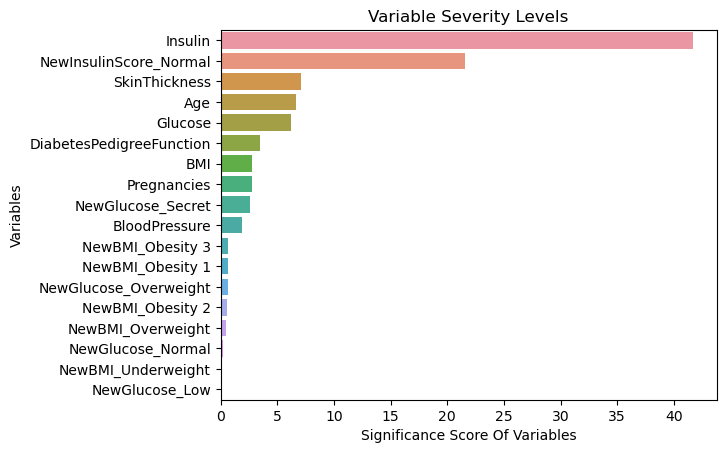

In [46]:
feature_imp = pd.Series(cbc_tuned_clf.feature_importances_,
                        index=X.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Significance Score Of Variables')
plt.ylabel('Variables')
plt.title("Variable Severity Levels")
plt.show()

* XGBClassifier

In [42]:
xgb_clf = XGBClassifier()

# XGBoost params
xgb_params = { "learning_rate": [0.01, 0.1, 0.2, 1],
               "min_samples_split": np.linspace(0.1, 0.5, 10),
               "max_depth":[3,5,8],
               "subsample":[0.5, 0.9, 1.0],
               "n_estimators": [100,1000],
               "use_label_encoder" : [False], 
               "eval_metric" : ['mlogloss']
             }

xgb_cv_clf = GridSearchCV(xgb_clf,
                          xgb_params,
                          cv = 5,
                          verbose = 2 
                         )

xgb_cv_clf.fit(X, y)

Fitting 5 folds for each of 720 candidates, totalling 3600 fits
[16:36:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:36:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some par

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:36:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:36:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:36:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:36:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:36:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:36:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:36:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:36:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:36:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:36:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:36:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:36:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:36:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:36:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:36:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:36:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:36:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:36:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:36:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:36:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:36:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:37:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:37:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:37:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:37:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:37:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:37:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:37:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:37:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with s

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:37:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:37:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:37:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:37:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:37:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:37:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:37:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:37:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:37:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:37:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:37:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:37:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:37:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fal

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:37:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:37:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:37:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:37:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:37:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:37:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:37:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:37:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:37:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fal

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:37:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:37:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:37:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:37:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:37:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:37:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:37:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:37:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:37:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:37:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:37:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:37:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:37:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:37:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:37:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:37:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:38:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:38:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:38:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:38:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:38:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:38:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:38:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:38:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:38:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:38:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:38:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:38:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:38:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:38:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:38:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:38:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:38:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:38:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:38:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:38:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:38:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:38:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:38:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:38:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:38:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:38:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:38:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:38:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:38:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:38:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:38:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:38:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:38:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:38:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:38:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:38:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:38:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:38:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:38:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:38:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:38:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:38:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:38:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:38:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:38:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:38:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:38:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:38:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:38:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:38:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:39:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:39:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:39:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:39:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:39:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:39:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:39:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:39:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:39:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:39:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:39:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:39:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:39:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:39:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:39:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:39:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:39:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:39:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:39:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:39:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:39:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:39:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:39:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[16:39:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:39:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:39:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:39:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:39:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:39:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with so

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:39:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:39:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:39:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:39:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:39:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:39:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:39:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:39:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:39:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:39:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:39:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:39:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:39:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:39:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:39:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:39:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:39:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:39:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:39:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:39:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:39:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:39:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:39:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:39:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:39:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:39:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:39:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:39:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:39:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:39:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:39:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:39:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:39:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:39:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:39:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:39:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:39:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:39:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:39:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:39:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:39:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:39:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:39:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:39:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:39:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:39:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:39:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:39:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:39:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:39:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:39:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:39:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:39:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:39:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:39:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:40:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:40:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:40:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:40:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:40:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:40:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:40:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:40:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:40:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:40:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:40:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:40:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:40:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:40:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:40:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:40:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:40:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:40:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:40:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:40:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:40:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:40:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:40:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:40:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:40:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:40:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:40:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:40:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:40:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:40:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:40:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:40:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:40:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:40:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:40:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:40:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:40:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:40:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:40:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:40:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:40:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:40:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:40:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:40:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:40:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:40:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:40:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:40:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:40:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:40:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:40:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:40:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.6s
[16:40:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:40:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:40:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:40:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:40:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:40:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:41:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:41:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:41:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:41:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a fals

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:41:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:41:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:41:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:41:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:41:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:41:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:41:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:41:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:41:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:41:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:41:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:41:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:41:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:41:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:41:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:41:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:41:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:41:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:41:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:41:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:41:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:41:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:41:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:41:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:41:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:41:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:41:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:41:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:41:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:41:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:41:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:41:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:41:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:41:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:41:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:41:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:41:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:41:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:41:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:41:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:41:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:41:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:41:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:41:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:41:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:41:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:41:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:41:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:41:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:41:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:41:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:41:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:41:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:42:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:42:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:42:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:42:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:42:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:42:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:42:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:42:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:42:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:42:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:42:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:42:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:42:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:42:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:42:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:42:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:42:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:42:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:42:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:42:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:42:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:42:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:42:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:42:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:42:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:42:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):



[16:42:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:42:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:42:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:42:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:42:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:42:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:42:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:42:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:42:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:42:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:42:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:42:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:42:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:42:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:42:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:42:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:42:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:42:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:42:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:42:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:42:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:42:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:43:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:43:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:43:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:43:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:43:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:43:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:43:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:43:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:43:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:43:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:43:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:43:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:43:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:43:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:43:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:43:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:43:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:43:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:43:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:43:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:43:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:43:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:43:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:43:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:43:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:43:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:43:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:43:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:43:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:43:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:43:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:43:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.6s
[16:43:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:43:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.6s
[16:43:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:43:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:43:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:43:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:43:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:43:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:43:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:43:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:43:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:43:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:43:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:43:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.3s
[16:43:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:43:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:43:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.6s
[16:43:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.6s
[16:43:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:43:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.4s
[16:43:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:43:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.6s
[16:43:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:43:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:43:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:44:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:44:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:44:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:44:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:44:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:44:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:44:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.4s
[16:44:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:44:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:44:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:44:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.4s
[16:44:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:44:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:44:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:44:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.6s
[16:44:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:44:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:44:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:44:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:44:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:44:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:44:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:44:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:44:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:44:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:44:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:44:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:44:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:44:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:44:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:44:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:44:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:44:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:44:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:44:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:44:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:44:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:44:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:44:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:45:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:45:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:45:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:45:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:45:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:45:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:45:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:45:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:45:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.4s
[16:45:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:45:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:45:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:45:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:45:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:45:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.9s
[16:45:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.6s
[16:45:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:45:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:45:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:45:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:45:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:45:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:45:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:45:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:45:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:45:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:45:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:45:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:45:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:45:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:45:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:45:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:45:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.4s
[16:45:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:45:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:45:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:45:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:45:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:45:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:45:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:45:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:45:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:45:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:45:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:45:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:45:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:45:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:45:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:45:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:45:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:45:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:45:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:45:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:45:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:45:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:45:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:45:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.6s
[16:46:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.6s
[16:46:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:46:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:46:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:46:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:46:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.3s
[16:46:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:46:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:46:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:46:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:46:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:46:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:46:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:46:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:46:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:46:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:46:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:46:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:46:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:46:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:46:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:46:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:46:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:46:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:46:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:46:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:46:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:46:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:46:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.4s
[16:46:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:46:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:46:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:46:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:46:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:46:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:46:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:46:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:46:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:46:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:46:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:46:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:46:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:46:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:46:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:46:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:46:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:46:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:46:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:46:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:46:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:46:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:46:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:46:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:46:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:46:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:46:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:46:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:46:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:46:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:46:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.2s
[16:46:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:46:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:46:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:46:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.6s
[16:46:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:46:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:47:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.6s
[16:47:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.6s
[16:47:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:47:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:47:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[16:47:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.8s
[16:47:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.5s
[16:47:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:47:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:47:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:47:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:47:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:47:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:47:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:47:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:47:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:47:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:47:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:47:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:47:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:47:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:47:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:47:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.4s
[16:47:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:47:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:47:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.5s
[16:47:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[16:47:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:47:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:47:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.4s
[16:47:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.5s
[16:47:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.6s
[16:47:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:47:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:47:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:47:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:47:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.01, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:47:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:47:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters ge

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:47:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:47:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:47:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:47:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:47:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:47:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:47:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:47:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:47:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:47:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:47:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:47:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:47:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:47:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[16:47:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:47:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:47:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:47:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:47:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:47:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with som

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:47:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:47:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:47:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:47:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:47:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:47:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:47:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:47:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:47:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:47:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:48:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:48:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:48:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:48:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:48:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:48:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:48:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:48:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:48:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:48:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:48:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:48:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:48:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:48:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:48:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:48:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:48:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:48:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:48:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:48:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:48:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:48:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:48:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:48:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:48:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:48:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:48:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:48:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:48:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:48:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:48:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:48:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:48:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:48:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:48:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:48:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:48:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:49:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:49:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[16:49:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:49:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:49:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:49:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:49:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:49:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:49:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:49:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:49:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false a

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false a

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:49:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:49:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:49:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:49:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:49:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false a

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:49:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:49:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:49:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:49:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:49:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:49:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:49:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:49:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:49:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:49:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:49:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:49:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:50:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:50:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:50:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:50:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:50:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:50:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:50:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:50:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:50:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:50:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:50:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:50:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:50:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:50:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:50:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:50:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:50:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:50:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:50:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:50:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:50:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:50:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:50:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:50:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:50:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:50:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:50:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:50:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:50:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:50:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:50:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:50:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:50:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:50:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:50:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:50:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:50:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:50:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:50:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:50:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:50:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:50:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:50:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:50:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:50:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:50:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:50:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:50:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:50:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:50:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:50:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:50:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:50:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:50:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:50:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:50:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:50:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:50:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:50:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:50:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:50:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:50:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:50:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:51:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:51:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:51:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:51:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:51:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:51:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:51:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:51:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.6s
[16:51:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.6s
[16:51:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[16:51:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.2s
[16:51:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:51:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:51:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[16:51:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:51:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:51:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:51:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:51:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:51:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:51:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.4s
[16:51:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:51:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:51:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:51:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:51:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:51:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:51:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[16:51:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:51:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:51:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:51:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:51:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[16:51:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[16:51:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[16:51:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:51:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:51:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:51:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:51:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:51:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[16:51:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:51:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:51:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:51:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:51:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:51:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:51:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:51:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:51:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:51:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:51:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:51:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:51:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:51:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:51:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:51:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:51:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:51:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:51:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:51:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:51:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:51:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:51:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:51:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:51:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:51:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:52:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:52:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:52:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:52:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:52:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:52:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:52:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:52:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:52:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:52:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:52:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:52:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:52:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:52:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:52:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:52:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:52:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:52:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:52:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:52:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:52:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:52:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:52:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:52:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:52:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:52:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:52:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:52:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:52:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:52:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:52:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:52:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:52:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:52:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:52:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:52:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:52:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:52:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:52:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:52:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:52:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:52:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:52:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:53:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:53:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:53:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:53:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:53:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:53:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:53:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:53:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:53:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:53:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:53:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:53:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:53:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:53:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:53:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:53:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:53:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:53:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:53:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:53:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:53:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:53:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:53:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[16:53:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.2s
[16:53:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:53:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:53:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:53:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:53:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:53:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:53:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:53:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:53:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:53:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:53:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:53:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:53:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:53:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:53:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:53:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[16:53:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:54:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:54:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:54:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:54:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:54:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:54:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:54:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:54:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:54:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:54:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:54:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:54:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:54:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:54:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:54:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:54:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:54:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:54:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:54:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:54:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:54:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:54:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:55:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[16:55:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:55:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.1s
[16:55:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[16:55:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[16:55:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:55:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:55:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:55:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:55:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:55:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:55:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:55:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:55:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:55:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:55:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[16:55:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:55:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:55:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:55:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:55:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:55:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:55:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:55:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:55:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:55:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:55:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:55:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:55:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:55:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:55:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:55:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:55:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:55:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:56:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:56:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:56:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:56:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:56:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:56:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:56:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:56:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:56:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:56:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:56:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:56:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:56:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:56:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:56:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:56:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:56:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:56:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:56:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:56:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:56:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:56:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:56:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:56:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:56:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:56:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:56:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:56:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:56:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:56:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:56:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:56:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:56:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:56:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters get

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:56:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:56:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:56:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:56:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:56:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:56:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:56:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:56:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:56:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:56:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with som

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:56:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:56:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:56:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:56:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:56:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:56:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:56:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:56:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:56:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:57:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:57:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:57:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:57:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[16:57:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:57:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:57:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:57:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:57:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:57:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:57:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:57:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:57:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:57:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[16:57:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:57:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:57:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:57:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:57:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:57:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:57:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:57:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:57:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:57:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:57:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:58:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:58:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:58:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[16:58:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:58:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false a

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:58:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:58:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false a

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:58:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false al

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:58:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:58:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:58:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:58:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:58:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:58:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[16:58:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:58:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:58:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:58:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[16:58:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[16:58:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters gett

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:58:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:58:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:59:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:59:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:59:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:59:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:59:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[16:59:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:59:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters get

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:59:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:59:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:59:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:59:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:59:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:59:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:59:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. P

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.5s
[16:59:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:59:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[16:59:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:59:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:59:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:59:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:59:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:59:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:59:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:59:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:59:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:59:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:59:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:59:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:59:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:59:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:59:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:59:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:59:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:59:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[16:59:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[16:59:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:59:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:59:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:59:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[16:59:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:59:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[16:59:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[16:59:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[16:59:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[16:59:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:59:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:59:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:59:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[16:59:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[16:59:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[16:59:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:00:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:00:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:00:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:00:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:00:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:00:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:00:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:00:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:00:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:00:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:00:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:00:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:00:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:00:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:00:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:00:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:00:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:00:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:00:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:00:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:00:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:00:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:00:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:00:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:00:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:00:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:00:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:00:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:00:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:00:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:00:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:00:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:00:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:00:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:00:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):



[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:00:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:00:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:00:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:00:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:00:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:00:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:00:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:01:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:01:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:01:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:01:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:01:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:01:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:01:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:01:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:01:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:01:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:01:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:01:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:01:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false a

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:01:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:01:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:01:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:01:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:01:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:01:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:01:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:01:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:01:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:01:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:01:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:01:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:01:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:01:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:01:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:01:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:01:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:01:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:01:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:01:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:01:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:01:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:01:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:01:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:01:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:01:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:01:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:02:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:02:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:02:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:02:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:02:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:02:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:02:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:02:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:02:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:02:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:02:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:02:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:02:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:02:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:02:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:02:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:02:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:02:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:02:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:02:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:02:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:02:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:02:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:02:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:02:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:02:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:02:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:02:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:02:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:02:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:02:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:02:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.2s
[17:02:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:02:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:02:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:02:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:02:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:02:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:02:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:02:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:03:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:03:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:03:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:03:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:03:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:03:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:03:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[17:03:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:03:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:03:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:03:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:03:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:03:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:03:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:03:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:03:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:03:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:03:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:03:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:03:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:03:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:03:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:03:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:03:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:03:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:03:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:04:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:04:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:04:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:04:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:04:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:04:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:04:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:04:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:04:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:04:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:04:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:04:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:04:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:04:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:04:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:04:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:04:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.4s
[17:04:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.2s
[17:04:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.3s
[17:04:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:04:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:04:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[17:04:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:04:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:04:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:04:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.1s
[17:04:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[17:04:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[17:04:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[17:04:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[17:04:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[17:04:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[17:04:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[17:04:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:04:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:04:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:04:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:04:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:04:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:04:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Pl

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:04:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.2s
[17:04:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:04:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:04:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:04:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:04:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:04:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:04:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[17:04:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.2s
[17:04:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[17:04:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.1s
[17:04:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[17:04:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:04:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:04:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:04:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   1.0s
[17:04:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=0.2, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:04:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:04:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getti

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:04:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:05:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:05:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some pa

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:05:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:05:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:05:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:05:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:05:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:05:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false ala

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:05:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:05:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false ala

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:05:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:05:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:05:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:05:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:05:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:05:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:05:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:05:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:06:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:06:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:06:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:06:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:06:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:06:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:06:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:06:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:06:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:06:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:06:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:06:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:06:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:06:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:07:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some par

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:07:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Ple

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:07:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:07:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:07:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:07:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:07:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:07:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=3, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:07:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:07:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:07:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:07:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some pa

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:07:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:07:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:07:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:07:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:07:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false ala

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:07:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:07:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:07:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:07:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:07:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wr

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:07:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:07:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:07:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:07:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:07:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:07:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:08:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:08:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:08:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false ala

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:08:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:08:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):



[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.3s
[17:08:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:08:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:08:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wr

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):



[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:08:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:08:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false ala

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:08:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:08:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:08:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged w

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:08:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:08:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:08:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:08:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:08:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:08:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:08:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:08:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:08:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:08:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:08:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:08:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:08:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:08:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:08:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:08:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:08:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:08:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:08:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:08:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:08:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:08:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:08:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:08:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:08:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:08:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:08:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:08:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:08:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:08:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:08:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:08:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:08:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:08:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:08:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:08:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:08:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:08:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:08:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wr

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:08:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:08:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:08:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:08:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wr

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:08:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:08:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:08:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:08:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):



[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:08:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:08:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:08:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false ala

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:08:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:08:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:08:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:08:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[17:08:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:08:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:08:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:08:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:08:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:08:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:08:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:08:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:08:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:08:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:08:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:08:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:08:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:08:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:08:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:08:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:08:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:08:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:08:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:08:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:08:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:08:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:08:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:08:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:08:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:08:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:08:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:08:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:08:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:08:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:08:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   1.0s
[17:09:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:09:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:09:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:09:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:09:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:09:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:09:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:09:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:09:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:09:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:09:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:09:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:09:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:09:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:09:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:09:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:09:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:09:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:09:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:09:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:09:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:09:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:09:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:09:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:09:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:09:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:09:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:09:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:09:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:09:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some par

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:09:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:09:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:09:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:09:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:09:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:09:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:09:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:09:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:09:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:09:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:09:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:09:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:09:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:09:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=5, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:09:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:09:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:09:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:09:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:09:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:09:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:09:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:09:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting 

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:09:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:09:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:09:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:09:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:09:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.1, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some pa

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:10:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:10:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:10:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:10:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:10:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:10:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.14444444444444446, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:10:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false ala

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:10:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:10:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.18888888888888888, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:10:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false ala

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:10:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:10:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:36] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:10:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:10:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:10:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:10:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:10:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:10:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.23333333333333334, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:10:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:10:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:10:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:10:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:10:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:10:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:10:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:10:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:10:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:10:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:10:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:10:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:10:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:11:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:11:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.2777777777777778, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:11:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:11:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:11:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:11:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:11:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:11:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:11:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:11:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:11:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:11:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.0s
[17:11:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:11:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:11:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:11:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:11:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.0s
[17:11:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:11:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:11:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:11:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:11:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.7s
[17:11:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:11:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:11:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:11:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:11:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:11:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:11:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:11:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:11:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:11:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.32222222222222224, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:11:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:11:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alar

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:11:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:11:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm,

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:11:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:11:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:11:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:11:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:11:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wr

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:11:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:24] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:25] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:26] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:11:27] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:11:28] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:11:29] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:11:30] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:11:31] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.3666666666666667, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:11:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:11:32] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:11:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:11:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):



[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:11:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):



[17:11:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:11:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wr

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:11:34] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:11:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:11:35] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:37] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:38] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:39] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:40] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:41] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:11:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:11:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:11:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:11:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:11:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4111111111111111, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:11:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:11:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:11:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:11:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:11:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:11:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:11:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:11:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:11:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:11:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:11:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wro

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:11:56] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:11:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:11:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:12:00] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:12:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:12:02] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:12:03] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.9s
[17:12:04] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:12:05] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.4555555555555556, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.8s
[17:12:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:12:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some par

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.0s
[17:12:06] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.3s
[17:12:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.2s
[17:12:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.5, use_label_encoder=False; total time=   0.1s
[17:12:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:12:07] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.2s
[17:12:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:12:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=0.9, use_label_encoder=False; total time=   0.1s
[17:12:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Plea

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:12:08] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s


C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:12:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:12:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Plea

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=100, subsample=1.0, use_label_encoder=False; total time=   0.1s
[17:12:09] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.8s
[17:12:10] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.3s
[17:12:11] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:12:12] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   1.0s
[17:12:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.5, use_label_encoder=False; total time=   0.9s
[17:12:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:12:15] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:12:16] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.9s
[17:12:17] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.8s
[17:12:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=0.9, use_label_encoder=False; total time=   0.7s
[17:12:19] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.7s
[17:12:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:12:20] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:12:21] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:12:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[CV] END eval_metric=mlogloss, learning_rate=1, max_depth=8, min_samples_split=0.5, n_estimators=1000, subsample=1.0, use_label_encoder=False; total time=   0.6s
[17:12:23] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     enable_categorical=False, gamma=None,
                                     gpu_id=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,...
                                     subsample=None, tree_method=None,
                                     validate_parameters=None, verbosity=None),
             param_grid={'eval_metric': ['mlogloss'],
                         'learning_rate': [0.01, 0.1, 0.2, 1],
                         'max_depth': [3, 5, 8],
                         'min_samples_split': array([0.1       , 0.14444444, 0.18888889, 0.23333333, 0.27777778,
       0.32222222, 0.36666667, 0.41111111, 0.45555556, 0.5       ]),
                         'n_estimators': [100, 1000],
                         'subsample': [0.5, 0.9, 1.0],
                         'use_label_encoder': [False]},
             verbose=2)

In [43]:
xgb_cv_clf.best_params_

{'eval_metric': 'mlogloss',
 'learning_rate': 0.01,
 'max_depth': 5,
 'min_samples_split': 0.1,
 'n_estimators': 1000,
 'subsample': 1.0,
 'use_label_encoder': False}

In [43]:
from xgboost import XGBClassifier
xgb_best_params = {'eval_metric': 'mlogloss',
                   'learning_rate': 0.01,
                   'max_depth': 5,
                   'min_samples_split': 0.1,
                   'n_estimators': 1000,
                   'subsample': 1.0,
                   'use_label_encoder': False
                  }
xgb_tuned_clf = XGBClassifier(**xgb_best_params)
xgb_tuned_clf.fit(X, y);

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:07:33] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




In [47]:
xgb_score = cross_val_score(xgb_tuned_clf, X, y, cv=10).mean()

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:42] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:43] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:44] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:46] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[17:14:55] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




In [48]:
xgb_score

0.890686944634313

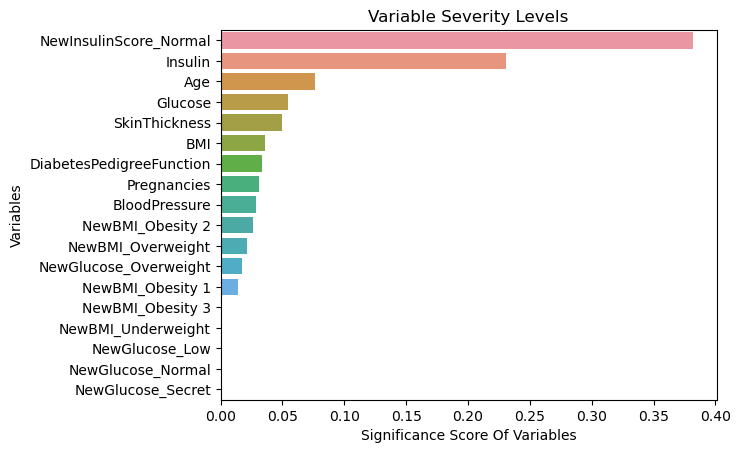

In [44]:
feature_imp = pd.Series(xgb_tuned_clf.feature_importances_,
                        index=X.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Significance Score Of Variables')
plt.ylabel('Variables')
plt.title("Variable Severity Levels")
plt.show()

* LGBMClassifier

In [35]:
from lightgbm import LGBMClassifier
lgbm_clf = LGBMClassifier()

# LGBMClassifier params
lgbm_params = {"learning_rate": [0.01, 0.5, 1],
               "n_estimators": [200, 500, 1000],
               "max_depth": [6, 8, 10],
               "colsample_bytree": [1, 0.5, 0.4 ,0.3 , 0.2]
              }

lgbm_cv_clf = GridSearchCV(lgbm_clf,
                          lgbm_params,
                          cv = 10,
                          verbose = 2 
                         )

lgbm_cv_clf.fit(X, y)

Fitting 10 folds for each of 135 candidates, totalling 1350 fits
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0

[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   0.9s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   0.9s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   1.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   0.9s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   1.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   1.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   1.0s
[CV] END colsample_bytree=1, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   1.1s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=200; total time=   0

[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.2s
[CV] 

[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=1, learning_rate=1, max_depth=10, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=1, 

[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=200; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=10, n_estimators=500;

[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=8, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=8, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=8, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=8, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=8, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=200; total tim

[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=500; total time=   0.0s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=1, max_depth=8, n_estimators=1000; total time=   0.1s
[CV] END col

[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.4s
[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.4, learning_rate=0.01, max_depth=8, n_estimators=500; total tim

[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=0.5, max_depth=8, n_estimators=500; total time=   0.1s


[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=6, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.4, learning_rate=1, max_depth=8, n_estimators=200; total time=   0.0s
[CV] END cols

[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.3, learning_rate=0.01, max_depth=6, n_estimators=1000; tot

[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=6, n_estimators=500; total time=   0.1s


[CV] END colsample_bytree=0.3, learning_rate=0.5, max_depth=10, n_estimators=1000; total time=   0.2s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsamp

[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=10, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=10, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=10, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=10, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=10, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=10, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.3, learning_rate=1, max_depth=10, n_estimators=1000; total time=   0.1s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=6, n_estimators=200; total time=   0.

[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=500; total time=   0.3s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=1000; total time=   0.6s
[CV] END colsample_bytree=0.2, learning_rate=0.01, max_depth=10, n_estimators=1

[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=500; total time=   0.1s
[CV] END colsample_bytree=0.2, learning_rate=0.5, max_depth=10, n_estimators=500; total tim

[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=200; total time=   0.0s
[CV] END colsample_bytree=0.2, learning_rate=1, max_depth=10, n_estimators=500; total time=   0.0s
[CV] END c

GridSearchCV(cv=10, estimator=LGBMClassifier(),
             param_grid={'colsample_bytree': [1, 0.5, 0.4, 0.3, 0.2],
                         'learning_rate': [0.01, 0.5, 1],
                         'max_depth': [6, 8, 10],
                         'n_estimators': [200, 500, 1000]},
             verbose=2)

In [36]:
lgbm_cv_clf.best_params_

{'colsample_bytree': 1,
 'learning_rate': 0.01,
 'max_depth': 10,
 'n_estimators': 200}

In [37]:
lgbm_tuned_clf = LGBMClassifier(**lgbm_cv_clf.best_params_)
lgbm_tuned_clf.fit(X, y)

LGBMClassifier(colsample_bytree=1, learning_rate=0.01, max_depth=10,
               n_estimators=200)

In [39]:
cross_val_score(lgbm_tuned_clf, X, y, cv = 10).mean()

0.8958817498291181

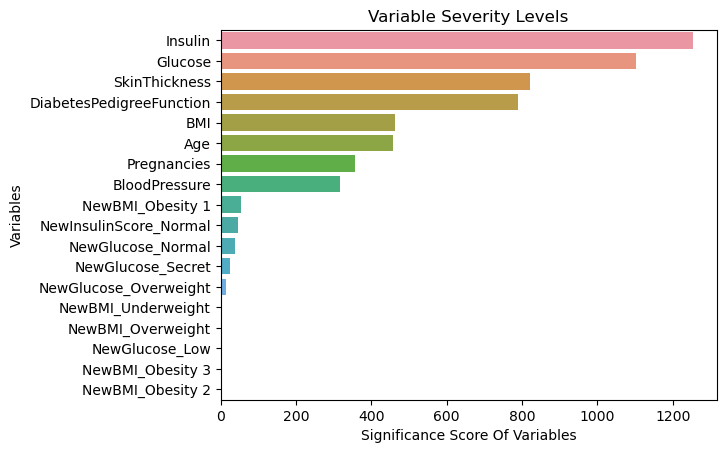

In [40]:
feature_imp = pd.Series(lgbm_tuned_clf.feature_importances_,
                        index=X.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Significance Score Of Variables')
plt.ylabel('Variables')
plt.title("Variable Severity Levels")
plt.show()

**Cross validation score for each of the 4 models**:
1. GradientBoostingClassifier: 0.8958817498291183
2. CatBoostClassifier: 0.8893198906356801
3. XGBClassifier: 0.890686944634313
4. LGBMClassifier: 0.8958817498291181

## 7. Comparision of Final Models

In [50]:
models = []

models.append(('GradientBoostingClassifier', GradientBoostingClassifier(random_state = 12345, **gbm_best_params)))
models.append(('CatBoostClassifier', CatBoostClassifier(random_state = 12345, **cbc_best_params)))
models.append(("XGBClassifier", XGBClassifier(random_state = 12345, **xgb_best_params)))
models.append(("LGBMClassifier", LGBMClassifier(random_state = 12345, **lgbm_cv_clf.best_params_)))

# evaluate each model in turn
results = []
names = []

In [57]:
from sklearn.model_selection import KFold

messages = []
names = []
results = []

for name, model in models:
    
        kfold = KFold(n_splits = 10, random_state = 12345, shuffle = True)
        cv_results = cross_val_score(model, X, y, cv = 10, scoring= "accuracy", verbose=0)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        messages.append(msg)

0:	learn: 0.6753792	total: 2.73ms	remaining: 271ms
1:	learn: 0.6592628	total: 5.46ms	remaining: 267ms
2:	learn: 0.6438980	total: 6.06ms	remaining: 196ms
3:	learn: 0.6278510	total: 8.19ms	remaining: 196ms
4:	learn: 0.6113349	total: 10.3ms	remaining: 196ms
5:	learn: 0.6006562	total: 12.9ms	remaining: 202ms
6:	learn: 0.5876142	total: 15.6ms	remaining: 208ms
7:	learn: 0.5744315	total: 17.8ms	remaining: 205ms
8:	learn: 0.5607775	total: 20.2ms	remaining: 204ms
9:	learn: 0.5488089	total: 21.3ms	remaining: 191ms
10:	learn: 0.5374236	total: 23.3ms	remaining: 188ms
11:	learn: 0.5296734	total: 25.6ms	remaining: 188ms
12:	learn: 0.5186731	total: 27.9ms	remaining: 187ms
13:	learn: 0.5105461	total: 30.2ms	remaining: 186ms
14:	learn: 0.5010558	total: 32.5ms	remaining: 184ms
15:	learn: 0.4937718	total: 34.8ms	remaining: 183ms
16:	learn: 0.4862644	total: 37ms	remaining: 181ms
17:	learn: 0.4766063	total: 37.8ms	remaining: 172ms
18:	learn: 0.4689006	total: 39.9ms	remaining: 170ms
19:	learn: 0.4598684	tot

0:	learn: 0.6762622	total: 3.19ms	remaining: 316ms
1:	learn: 0.6589521	total: 6.4ms	remaining: 314ms
2:	learn: 0.6424976	total: 7.04ms	remaining: 228ms
3:	learn: 0.6240351	total: 9.63ms	remaining: 231ms
4:	learn: 0.6092683	total: 12.4ms	remaining: 236ms
5:	learn: 0.5981943	total: 15.2ms	remaining: 238ms
6:	learn: 0.5846447	total: 18.1ms	remaining: 240ms
7:	learn: 0.5706205	total: 21.5ms	remaining: 248ms
8:	learn: 0.5587004	total: 25ms	remaining: 252ms
9:	learn: 0.5463658	total: 26.1ms	remaining: 235ms
10:	learn: 0.5345608	total: 28.2ms	remaining: 228ms
11:	learn: 0.5250617	total: 30.3ms	remaining: 222ms
12:	learn: 0.5143375	total: 32.3ms	remaining: 216ms
13:	learn: 0.5056120	total: 34.5ms	remaining: 212ms
14:	learn: 0.4959834	total: 38.3ms	remaining: 217ms
15:	learn: 0.4884805	total: 40.6ms	remaining: 213ms
16:	learn: 0.4783236	total: 42.7ms	remaining: 209ms
17:	learn: 0.4687905	total: 44.8ms	remaining: 204ms
18:	learn: 0.4597430	total: 46.3ms	remaining: 197ms
19:	learn: 0.4516843	tota

1:	learn: 0.6555926	total: 7ms	remaining: 343ms
2:	learn: 0.6396479	total: 7.73ms	remaining: 250ms
3:	learn: 0.6218003	total: 10.6ms	remaining: 254ms
4:	learn: 0.6076774	total: 13.2ms	remaining: 251ms
5:	learn: 0.5965318	total: 16.3ms	remaining: 255ms
6:	learn: 0.5833137	total: 19.1ms	remaining: 254ms
7:	learn: 0.5707024	total: 21.9ms	remaining: 252ms
8:	learn: 0.5574886	total: 24.7ms	remaining: 250ms
9:	learn: 0.5450979	total: 26.2ms	remaining: 236ms
10:	learn: 0.5348481	total: 28.7ms	remaining: 232ms
11:	learn: 0.5260413	total: 31.7ms	remaining: 233ms
12:	learn: 0.5173383	total: 35.6ms	remaining: 238ms
13:	learn: 0.5057345	total: 37.9ms	remaining: 233ms
14:	learn: 0.4953140	total: 39.9ms	remaining: 226ms
15:	learn: 0.4880748	total: 42.1ms	remaining: 221ms
16:	learn: 0.4803651	total: 44.3ms	remaining: 216ms
17:	learn: 0.4714671	total: 47.1ms	remaining: 215ms
18:	learn: 0.4633202	total: 48.6ms	remaining: 207ms
19:	learn: 0.4548939	total: 50.8ms	remaining: 203ms
20:	learn: 0.4484481	tot

1:	learn: 0.6605599	total: 5.45ms	remaining: 267ms
2:	learn: 0.6443996	total: 6.14ms	remaining: 199ms
3:	learn: 0.6262979	total: 8.77ms	remaining: 210ms
4:	learn: 0.6111085	total: 11.9ms	remaining: 225ms
5:	learn: 0.6000902	total: 14.7ms	remaining: 230ms
6:	learn: 0.5867978	total: 17.5ms	remaining: 232ms
7:	learn: 0.5735301	total: 20.6ms	remaining: 237ms
8:	learn: 0.5611196	total: 23ms	remaining: 233ms
9:	learn: 0.5485081	total: 24.4ms	remaining: 219ms
10:	learn: 0.5382286	total: 27.6ms	remaining: 223ms
11:	learn: 0.5280374	total: 28.9ms	remaining: 212ms
12:	learn: 0.5184292	total: 31.7ms	remaining: 212ms
13:	learn: 0.5095780	total: 35.1ms	remaining: 216ms
14:	learn: 0.5006474	total: 37.7ms	remaining: 213ms
15:	learn: 0.4907974	total: 38.3ms	remaining: 201ms
16:	learn: 0.4837952	total: 40.3ms	remaining: 197ms
17:	learn: 0.4762588	total: 42.5ms	remaining: 194ms
18:	learn: 0.4680266	total: 45ms	remaining: 192ms
19:	learn: 0.4607839	total: 47.6ms	remaining: 190ms
20:	learn: 0.4547254	tota

92:	learn: 0.2506629	total: 255ms	remaining: 19.2ms
93:	learn: 0.2492819	total: 258ms	remaining: 16.5ms
94:	learn: 0.2482981	total: 260ms	remaining: 13.7ms
95:	learn: 0.2473623	total: 265ms	remaining: 11.1ms
96:	learn: 0.2462318	total: 269ms	remaining: 8.31ms
97:	learn: 0.2454817	total: 273ms	remaining: 5.57ms
98:	learn: 0.2447246	total: 278ms	remaining: 2.81ms
99:	learn: 0.2436952	total: 281ms	remaining: 0us
0:	learn: 0.6754197	total: 5.38ms	remaining: 533ms
1:	learn: 0.6589406	total: 11.3ms	remaining: 552ms
2:	learn: 0.6424093	total: 12.3ms	remaining: 398ms
3:	learn: 0.6251825	total: 15.8ms	remaining: 379ms
4:	learn: 0.6092107	total: 18.7ms	remaining: 354ms
5:	learn: 0.5982164	total: 20.8ms	remaining: 326ms
6:	learn: 0.5867390	total: 25ms	remaining: 332ms
7:	learn: 0.5736739	total: 27.2ms	remaining: 313ms
8:	learn: 0.5582867	total: 28.3ms	remaining: 286ms
9:	learn: 0.5456696	total: 30.6ms	remaining: 275ms
10:	learn: 0.5342737	total: 32.9ms	remaining: 266ms
11:	learn: 0.5233289	total:

C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:23:45] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:23:47] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:23:48] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:23:49] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:23:50] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:23:51] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:23:52] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:23:53] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




C:\Users\aziza\diabetes-detection\env\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[11:23:54] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:576: 
Parameters: { "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




In [55]:
messages

['GradientBoostingClassifier: 0.895899 (0.033220)',
 'CatBoostClassifier: 0.872437 (0.036539)',
 'XGBClassifier: 0.890687 (0.031780)',
 'LGBMClassifier: 0.895882 (0.038419)']

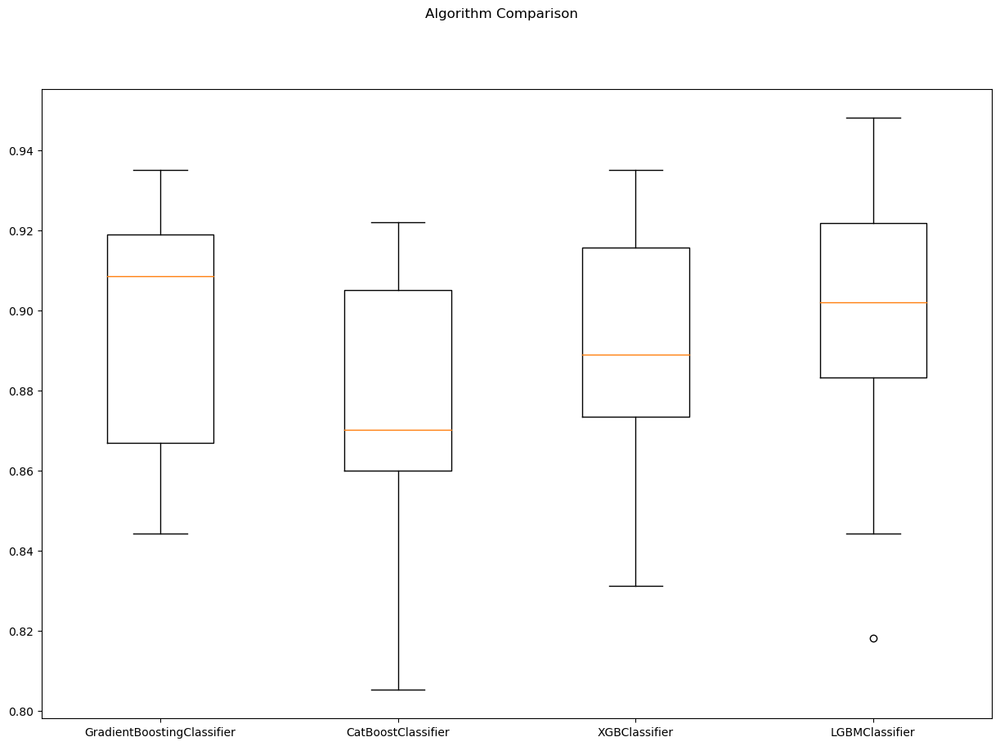

In [58]:
# boxplot algorithm comparison
fig = plt.figure(figsize=(15,10))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## 8. Saving The Best Model
Here the best model is GradientBoostingClassifier which will be saved for further use cases.

In [59]:
# save the model
import pickle
best_model = GradientBoostingClassifier(random_state = 12345, **gbm_best_params)
pickle.dump(best_model, open("model/gbm_clf.pkl", "wb"))

## 9. Reporting

The aim of this study was to create classification models for the diabetes data set and to predict whether a person is sick by establishing models and to obtain maximum validation scores in the established models. The work done is as follows:

1) Diabetes Data Set read.

2) With Exploratory Data Analysis; The data set's structural data were checked. The types of variables in the dataset were examined. Size information of the dataset was accessed. The 0 values in the data set are missing values. Primarily these 0 values were replaced with NaN values. Descriptive statistics of the data set were examined.

3) Data Preprocessing section; df for: The NaN values missing observations were filled with the median values of whether each variable was sick or not. The outliers were determined by LOF and flooring and capping was done, i.e. if the outlier was greater than upper limit then it was replaced with the upper limit and vice-versa. The X variables were standardized with the rubost method..

4) During Model Building; LogisticRegression, KNeighborsClassifier, DecisionTreeClassifier, SVC, GradientBoostingClassifier, XGBClassifier, LGBMClassifier, CatBoostClassifier like using machine learning models Cross Validation Score were calculated. Later GradientBoostingClassifier, CatBoostClassifier, XGBClassifier, LGMClassifier hyperparameter were tuned to increase Cross Validation value.

5) Result; The model created as a result of GradientBoostingClassifier hyperparameter tuning became the model with the highest Cross Validation Score value. (0.895899)